In [5]:
import numpy as np
import pandas as pd
from keras.models import load_model
from keras.preprocessing import sequence
import matplotlib.pyplot as plt
import tensorflow as tf
import cupy as cp
import matplotlib.pyplot as plt

In [6]:
class Listener:
    def __init__(self):
        self.__time_step = 9
        self.__tmp = cp.zeros([1,3])
        self.__arr_classification = cp.zeros([1,90])
        self.__vis_point = cp.zeros((1,3))
        self.__vis_balls = cp.zeros((self.__time_step,3))
        self.__vis_balls2 = cp.zeros((1,4))
        self.__predction_balls = cp.zeros((1,self.__time_step,3))
        self.__arr_prediction = cp.zeros([1,self.__time_step*3])
        self.__arr_pred_possible = cp.zeros((1,4))
        self.__diff = cp.zeros([1,3])
        self.__padding_done = False
        self.__cnt = 1
        self.__num = 1
        self.__max_index = 0
        self.__coor = -10*cp.ones(6)
        self.__find_possible_point = False
        self.__cal_possible_point = False
        self.__vis_possible_point = False
        self.__vis_hitting_point = cp.zeros((1,4))
        self.__hitting_point = -45
        self.__hitting_timimg = 0
        self.__possible_point = cp.zeros((1,4))
        self.__pred = cp.zeros([1,self.__time_step,3])
        self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
        self.__time = 0.016667
        self.__delta_T = 0.016667
        self.__anchor = 0
        self.__rowww = 0
        self.__direction = 'top6'
        self.traj_done = False
        #self.fig, self.ax = plt.subplots(2,2, figsize=(10.24,7.2))
	#self.__name = sys.argv[1]
        self.__csv_path = '/home/lab606a/catkin_ws/src/pointcloud/offline/'
        #self.__model_path = '/home/lab606a/Documents/20200415/not_fixed/saved model/500_data/prediction_not_fixed_'+ self.__direction
        #self.__model_path = '/home/lab606a/catkin_ws/src/pointcloud/models/not_fixed/prediction_all_not_fixed'
        self.__model_path = '/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_all_kind_data'
        self.__prediction_model = load_model(self.__model_path)
        
    def append_pred(self): ## Exhaustive
        self.__pred = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1))
        while not self.__find_possible_point == True:
            self.__pred = cp.array(self.__pred)
            if ( -50 < float(cp.min(self.__pred[self.__pred.shape[0]-1,:,:])) < -40): ## find possible hitting point
                index = cp.argmin(self.__pred[self.__pred.shape[0]-1,:,:])
                row = int((index-1)/3)
                count_down = row + (self.__pred.shape[0]-1)*9
                self.__find_possible_point = True
                self.__anchor = self.__pred.shape[0]-1
                print("count down = ", int(count_down))
                #index = cp.argmin(self.__anchor[self.__anchor,:,:])
                #row = int((index-1)/3)
                self.__pred[self.__anchor, row+1:, :] = 0
                self.__pred_for_offline = self.__pred

            else: ## predict next time step
                self.__pred = cp.vstack((self.__pred, cp.zeros([1,self.__time_step,3])))
                self.__pred[self.__pred.shape[0]-1,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[self.__pred.shape[0]-2,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
                if (self.__pred.shape[0] >= 8):
                    self.__pred = cp.zeros([1,self.__time_step,3])
                    self.__find_possible_point = True
                
    def update_prediction(self):
        self.__pred[0,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
        for i in range(1, self.__pred.shape[0]):
            self.__pred[i,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[i-1,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)

    def modify(self):
        #index = cp.argmin(self.__pred[self.__anchor,:,:])
        #row = int((index-1)/3)
        if (self.__rowww < 8):
            self.__pred[self.__anchor, self.__rowww+1:, :] = 0
        if (self.__anchor != self.__pred.shape[0]-1):
            self.__pred[self.__anchor+1:, :, :] = 0
        if (self.__anchor == 0) and (self.__rowww == 0) and ( -10 < float(cp.min(self.__pred[self.__anchor,0,:])) < 10):
            self.__pred[self.__anchor,0,:] = 0
        self.__pred_for_offline = cp.vstack((self.__pred_for_offline, self.__pred))
        #self.pub_prediction()

    def calculate_hitting_point(self, arr):
        #print("cnt = ", self.__cnt)
        arr = cp.array(arr)
        self.__cal_possible_point = False
        while not self.__cal_possible_point == True:
            print(arr[self.__anchor,:,:])
            if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= -35) and (self.__anchor >= 0):
                #print("anchor = ", self.__anchor)
                index = cp.argmin(arr[self.__anchor,:,:])
                row = int((index-1)/3)
                self.__rowww = row
                if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= self.__hitting_point): ## interpolation
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case a1")
                        self.__vis_point = cp.array(self.__vis_point)
                        w1 = (self.__hitting_point-self.__vis_point[:,1]) / (arr[self.__anchor,row,1]-self.__vis_point[:,1])
                        self.__possible_point = w1*arr[self.__anchor,row,:] + (1-w1)*self.__vis_point.reshape(1,1,3)
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))

                        #w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor-1,self.__time_step-1,1])
                        #self.__possible_point = w1*arr[self.__anchor-1,self.__time_step-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        #self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        #self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case a2")
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor,row-1,1])
                        self.__possible_point = w1*arr[self.__anchor,row-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                elif (self.__hitting_point < float(cp.min(arr[self.__anchor,:,:])) <= -40):
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case b1")
                        if (self.__diff[:,1] > 0):
                            w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                            if w1 < 1:
                                self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                                self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                                self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                                print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case b2")
                        self.__diff = arr[self.__anchor,row-1,:]-arr[self.__anchor,row,:]
                        self.__diff = self.__diff.reshape(1,3)
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                        if w1 < 1:
                            self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                            self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                            self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                            print("hitting timing and position = ", self.__possible_point)
                else:
                    self.__possible_point = self.__possible_point

                self.__cal_possible_point = True
                #self.pub_prediction()
                '''
                if (row < 8):
                    arr[self.__anchor, row+1:, :] = 0
                if (self.__anchor != self.__pred.shape[0]-1):
                    arr[self.__anchor+1:, :, :] = 0
                if (self.__anchor == 0) and ( -10 < float(cp.min(arr[self.__anchor,0,:])) < 10):
                    arr[self.__anchor,0,:] = 0
                '''
                #self.__pred_for_offline = cp.vstack((self.__pred_for_offline, arr))
                #self.__cnt += 1
                if (self.__arr_pred_possible.shape[0] == 1) and (int(self.__arr_pred_possible[0,2]) == 0):
                    self.__arr_pred_possible = self.__possible_point.reshape(1,4)
                else:
                    self.__arr_pred_possible = cp.vstack((self.__arr_pred_possible, self.__possible_point.reshape(1,4)))
            else:
                if ((self.__anchor-1) >= 0) and (abs(float(cp.min(arr[self.__anchor,:,:]))-self.__hitting_point) >= 22.5):
                    self.__anchor = self.__anchor -1
                    #print("case c1")
                else:
                    self.__cal_possible_point = True

    def calculate_vis_hitting_point(self):
        if (-50 <= float(cp.min(self.__vis_balls2)) <= self.__hitting_point):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row,2]-self.__vis_balls2[row-1,2])
            self.__vis_hitting_point = (1-w1)*self.__vis_balls2[row,:] + w1*self.__vis_balls2[row-1,:]
        elif (self.__hitting_point < float(cp.min(self.__vis_balls2)) < -40):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row-1,2]-self.__vis_balls2[row,2])
            self.__vis_hitting_point = self.__vis_balls2[row,:] - w1*(self.__vis_balls2[row-1,:]-self.__vis_balls2[row,:])
        #print("vis hitting point = ", self.__vis_hitting_point)


    def show_spin_direction(self, max_index):
        ## make dictionary to replace switch case
        dictionary = {0:self.top5, 1:self.top6, 2:self.left5, 3:self.left6, 4:self.right5, 5:self.right6, 6:self.back5, 7:self.back6}
        funcToCall = dictionary[max_index]
        funcToCall()

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def classification(self):
        ## call classifier
        classes = self.__classifier.predict(cp.asnumpy(self.__arr_classification.reshape(1,30,3)), verbose=1)
        ## figure out which direction is
        self.__max_index = np.argmax(classes)
        #print("number of input balls = ", self.__cnt)
        ## show result
        if (self.__cnt >= 9):
            self.show_spin_direction(self.__max_index)
        #self.__cnt += 1

    def padding(self):
        # if __tmp is empty, init array
        #print("paddinggg")
        if (self.__padding_done == False):
            self.__tmp = self.__vis_point ## pad first point
            self.__padding_done = True
            self.__vis_balls = self.__vis_point.reshape(1,3)
        else:
        # if __tmp is not empty, then filled array
            self.__tmp = cp.hstack((self.__tmp, self.__vis_point))
            self.__vis_balls = cp.vstack((self.__vis_balls, self.__vis_point))
            #if (self.__tmp.shape[1] == 15): ## when colect 5 balls
                #self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## asigne to classification input array
            #print("shape of tmp = \n", self.__tmp.shape)
            if (self.__tmp.shape[1] == 27):
                #self.__vis_balls = self.__tmp.reshape(1,self.__time_step,3)
                self.__arr_prediction[:,:] = self.__tmp ## for predct next 5 steps
            if (self.__tmp.shape[1] > 27): ## when colect over 5 balls
                #self.__vis_balls = cp.vstack((self.__vis_balls, self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):].reshape(1,self.__time_step,3))) ## visual measurement point for calculate error
                self.__arr_prediction[:,:] = self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):] ## rolling visual measurement for predct next 5 steps
                #if (self.__tmp.shape[1] <= 90): ## when colect under 31 balls
                    #self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## still asigne to classification input array

    def save_data(self):
        visurement_balls = cp.asnumpy(self.__vis_balls)
        pred_trajs = cp.asnumpy(self.__pred_for_offline.reshape(self.__pred_for_offline.shape[0]*self.__pred_for_offline.shape[1], self.__pred_for_offline.shape[2]))

        df_vis = pd.DataFrame(data=visurement_balls)
        df_pred = pd.DataFrame(data=pred_trajs)

        vis_name = self.__csv_path + 'visurement' + str(self.__num) + '.csv'
        pred_name = self.__csv_path + 'prediction' + str(self.__num) + '.csv'

        df_vis.to_csv(vis_name, header=0, index=0)
        df_pred.to_csv(pred_name, header=0, index=0)

    def predict_traj(self):
        self.__model = self.__prediction_model

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def plot_res(self):
        self.__arr_pred_possible = cp.round_(self.__arr_pred_possible, 4)
        self.__vis_hitting_point = cp.round_(self.__vis_hitting_point, 4)

        update_times = cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0])
        t = self.__arr_pred_possible[:,0]
        x = self.__arr_pred_possible[:,1]
        z = self.__arr_pred_possible[:,3]
        Euclidean_vis = cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2)))
        Euclidean_pred = cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))

        plt.figure(figsize=(8,7))

        ## plot hitting timing
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg (sec)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((t-self.__vis_hitting_point[0])*1000)
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg error (ms)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing_error' + '.png'
        plt.savefig(name)

        ## plot Euclidean distance
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((Euclidean_pred-Euclidean_vis))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance_error' + '.png'
        plt.savefig(name)

        ## plot x coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((x-self.__vis_hitting_point[1]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate_error' + '.png'
        plt.savefig(name)

        ## plot z coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((z-self.__vis_hitting_point[3]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate_error' + '.png'
        plt.savefig(name)
        
    def return_vis_point(self):
        return self.__vis_hitting_point
    
    def return_pred_res(self):
        return self.__arr_pred_possible
    
    def reset_arr_pred(self):
        self.__arr_pred_possible = cp.zeros((1,4))

    def assigne(self, visss):
        #a = data.data
        self.__vis_point = cp.array(visss).reshape(1,3)
        #print(self.__vis_point)

        if (-50 < self.__vis_point[:,1] < -30):
            tmp = cp.hstack((self.__time, self.__vis_point.reshape(3,)))
            if self.__vis_possible_point == False:
                self.__vis_balls2 = tmp.reshape(1,4)
                self.__vis_possible_point = True
            else:
                self.__vis_balls2 = cp.vstack((self.__vis_balls2, tmp.reshape(1,4)))


        if self.traj_done == False:
            print("\nTime = ", self.__time) ## show current time
            print("visual measurement = ", self.__vis_point) ## show visual measurement coordinate
            self.padding() ## colect 5 balls
            '''
            if ((self.__tmp.shape[1] >= 15) and (self.__tmp.shape[1] <= 90)): ## while colect balls over 5 balls and under 30 balls
                self.classification() ## doing classification and prediction
            if (self.__tmp.shape[1] > 90): ## while colect balls over 30 balls, stop doing classification
                self.show_spin_direction(self.__max_index) ## skip classification doing prediction
            '''
            if (self.__tmp.shape[1] >= 27):
                self.predict_traj()
            #self.for_ttbot()
            self.__time += self.__delta_T
            self.__cnt += 1
            
        else:
            #print("aaaaa")
            if (self.__padding_done == True):
                self.calculate_vis_hitting_point()
                #print("pred hitting point = \n", self.__arr_pred_possible)
                #if (self.__pred_for_offline.shape[0] != 1):
                    #self.plot_error()
                    #self.plot_res()
                    #self.save_data()
                self.__num += 1

            self.__padding_done = False
            self.__arr_classification = cp.zeros([1,90])
            self.__coor = -10*cp.ones(6)
            self.__vis_balls = cp.zeros((self.__time_step,3))
            self.__cnt = 1
            self.__pred = cp.zeros([1,self.__time_step,3])
            self.__vis_balls2 = cp.zeros((1,4))
            #self.__arr_pred_possible = cp.zeros((1,4))
            self.__find_possible_point = False
            self.__vis_possible_point = False
            self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
            self.__time = 0.016667 ## reset time
            self.traj_done = False

In [7]:
# set GPU memory
gpu_options = tf.GPUOptions(allow_growth=True)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

np.set_printoptions(suppress=True)

In [8]:
obj = Listener()

In [60]:
name = 'back5'

In [61]:
dataset_path = './datasets/split by random for distributed/prediction/' + name + '_test.csv'
print(dataset_path)
dataset = pd.read_csv(dataset_path, header=None)
dataset = dataset.fillna(0)
dataset = np.array(dataset)

./datasets/split by random for distributed/prediction/back5_test.csv


In [62]:

arr_for_vis = np.array([0,0,0,0])
arr_for_pred_3rd = np.array([0,0,0,0])
arr_for_pred_end = np.array([0,0,0,0])

n = 21

arr_for_err_t = np.zeros((1,n))
arr_for_err_x = np.zeros((1,n))
arr_for_err_z = np.zeros((1,n))


for i in range(0,250):
    trajectory = dataset[i,:]
    trajectory = trajectory.reshape(1,trajectory.shape[0])
    trajectory = sequence.pad_sequences(trajectory, maxlen=trajectory.shape[1]+27, padding='post', dtype='float32')
    trajectory = trajectory.reshape(trajectory.shape[1],)
    for j in range(0, trajectory.shape[0], 3):
        obj.assigne(trajectory[j:j+3].reshape(1,3))
    obj.traj_done = True
    obj.assigne(np.array([0,0,0]))
    vis_arr = obj.return_vis_point()
    pred_arr = obj.return_pred_res()
    #print("")
    #print("vis from obj = \n", vis_arr)
    #print("pred from obj = \n", pred_arr)
    #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
    #while pred_arr.shape[0] < n:
        #pred_arr = np.vstack(())
    
    if pred_arr.shape[0] >= n:
        #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
        #arr_for_pred_3rd = np.vstack((arr_for_pred_3rd, pred_arr[2,:]))
        #arr_for_pred_end = np.vstack((arr_for_pred_end, pred_arr[(pred_arr.shape[0]-10),:]))
        err = vis_arr - pred_arr
        print(err.shape)
        err_t = err[:n,0]
        err_x = err[:n,1]
        err_z = err[:n,3]
        
        arr_for_err_t = np.vstack((arr_for_err_t, err_t))
        arr_for_err_x = np.vstack((arr_for_err_x, err_x))
        arr_for_err_z = np.vstack((arr_for_err_z, err_z))
    #else:
        #print("\n\n aaaaa")
        #print(pred_arr)
    
    obj.reset_arr_pred()



Time =  0.016667
visual measurement =  [[ 74.2067 295.258   41.5849]]

Time =  0.033334
visual measurement =  [[ 74.1512 284.478   41.7572]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8539 275.371   41.9754]]

Time =  0.066668
visual measurement =  [[ 73.8077 265.385   42.141 ]]

Time =  0.083335
visual measurement =  [[ 73.7565 254.669   42.0163]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7119 245.55    41.7013]]

Time =  0.11666900000000001
visual measurement =  [[ 73.4358 236.8     40.9373]]

Time =  0.133336
visual measurement =  [[ 73.3882 226.267   40.3669]]

Time =  0.150003
visual measurement =  [[ 73.3435 217.254   39.1796]]
1/1 [==============================] - 0s 725us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 73.296  207.611   38.0198]]
1/1 [==============================] - 0s 1ms/step
[[ 70.82058716  -7.09734154  25.72600555]
 [ 71.01382446 -13.30773354  25.89179802]
 [ 70.99519348 -19.27699089  25.7239418 

1/1 [==============================] - 0s 714us/step
[[ 70.55543518  -4.88750076  25.79436302]
 [ 70.83868408 -10.86718178  26.00608063]
 [ 70.74450684 -16.8084507   25.69101715]
 [ 70.82453918 -22.64505959  25.35774612]
 [ 70.66318512 -28.48375893  24.67800331]
 [ 70.74383545 -34.40932465  23.81043625]
 [ 70.55182648 -40.20888519  22.79511642]
 [ 70.49044037 -45.7722702   21.24697876]
 [  0.21601486   0.10510445  -0.0569458 ]]
count down =  25
case a2
hitting timing and position =  [  0.7356616   70.49896156 -45.          21.4618804 ]

Time =  0.33333999999999986
visual measurement =  [[ 72.2379 120.332   15.2402]]
1/1 [==============================] - 0s 702us/step
[[ 69.46099854 -10.76497078  23.7856884 ]
 [ 69.31500244 -16.98912239  23.63703918]
 [ 68.92246246 -23.16881371  22.97668076]
 [ 68.59784698 -29.20245552  22.19374466]
 [ 68.3263092  -35.10709381  21.13672256]
 [ 67.92906189 -40.96688843  20.04607391]
 [ 67.93190002 -46.94099426  18.65873718]
 [ -0.01884842  -0.01958847  

1/1 [==============================] - 0s 674us/step
[[ 68.79676819 -11.31911278  25.34771347]
 [ 68.57798767 -16.95877266  25.56136322]
 [ 68.22736359 -23.04063606  25.21300125]
 [ 68.00769043 -28.8744297   24.73287582]
 [ 67.69613647 -34.6918869   23.93083572]
 [ 67.26113892 -40.55323029  22.90038681]
 [ 66.94786072 -46.11026764  21.53142929]
 [ -0.00951004  -0.11007118   0.00576115]
 [  0.13485336   0.18475342  -0.09442997]]
count down =  15
case a2
hitting timing and position =  [  0.73667798  67.0104521  -45.          21.80494   ]

Time =  0.5000099999999997
visual measurement =  [[70.9098 44.4476 15.7452]]
1/1 [==============================] - 0s 690us/step
[[ 68.85778809 -17.82843971  26.57033157]
 [ 68.50849915 -23.84422493  26.27025795]
 [ 68.2096405  -29.87761116  25.8605423 ]
 [ 68.01602173 -35.83057404  25.18383789]
 [ 67.83783722 -41.81726837  24.3235054 ]
 [ 67.48783112 -47.58043671  23.14876175]
 [  0.48017883  -0.16628265   0.12276745]
 [  0.34703445  -0.23115349   0.0

1/1 [==============================] - 0s 1ms/step
[[ 69.27960205 -17.4556675   26.46749115]
 [ 69.07293701 -23.52004433  26.20450211]
 [ 68.83950806 -29.52664757  25.79058838]
 [ 68.65367889 -35.36425781  25.05274582]
 [ 68.56970978 -41.29380035  24.21141434]
 [ 68.31082153 -47.07301331  23.0885849 ]
 [  0.36970901  -0.05389977   0.08756161]
 [  0.29870224  -0.0366478    0.05151653]
 [  0.16218567  -0.04288292  -0.03413105]]
count down =  5
case a2
hitting timing and position =  [  0.73932648  68.40368518 -45.          23.49134569]

Time =  0.6666799999999996
visual measurement =  [[ 69.3572 -17.5855  26.8988]]
1/1 [==============================] - 0s 698us/step
[[ 68.74802399 -23.21089363  26.30514908]
 [ 68.68532562 -29.24359322  25.80615234]
 [ 68.45330811 -35.27157593  25.08656311]
 [ 68.44449615 -41.11779022  24.13148499]
 [ 67.95126343 -46.9006958   22.83936691]
 [  0.01356888  -0.08879662  -0.00059414]
 [  0.0973053   -0.00144768   0.07215405]
 [ -0.01166916  -0.05796242   0.0


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 772us/step
[[-0.00374222 -0.00569153  0.0013113 ]
 [-0.00630569 -0.00893211 -0.00019932]
 [ 0.00035477 -0.00346947 -0.00722218]
 [-0.00353241 -0.01156616  0.00008297]
 [-0.00882339 -0.01070595 -0.00052643]
 [-0.00709534 -0.00612831 -0.00018978]
 [-0.00476837 -0.00321198  0.00025082]
 [-0.0028801  -0.00171471  0.00063038]
 [-0.00149155 -0.0010128   0.00092411]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00208664 -0.00985718  0.00226879]
 [-0.00076675 -0.01072502  0.00224972]
 [ 0.00419235 -0.00827789 -0.0046072 ]
 [-0.00014877 -0.01701927  0.00270176]
 [-0.00548935 -0.01630211  0.002141  ]
 [-0.00373459 -0.01172447  0.00251102]
 [-0.00135422 -0.0087719   0.00297546]
 [ 0.00055313 -0.00724411  0.00337315]
 [ 0.00197601 -0.00649452  0.00368118]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1

hitting timing and position =  [  0.70003731  74.02659993 -45.          25.95873662]

Time =  0.23333799999999993
visual measurement =  [[ 73.9192 168.389   40.0658]]
1/1 [==============================] - 0s 652us/step
[[ 74.4334259  -39.27793884  26.32937813]
 [ 74.42648315 -45.25688171  26.54368591]
 [ -0.03227615  -0.13852501   0.16553211]
 [  0.01725769  -0.06715965  -0.05664539]
 [ -0.06628418   0.02067947  -0.00901508]
 [ -0.03216934   0.04815483   0.00781727]
 [  0.0777359   -0.03143883  -0.01121426]
 [ -0.00971222   0.01537323  -0.0401783 ]
 [  0.07340622   0.05219841  -0.00504208]]
count down =  28
case a2
hitting timing and position =  [  0.70073009  74.42678145 -45.          26.53447831]

Time =  0.2500049999999999
visual measurement =  [[ 73.8516 159.166   38.4281]]
1/1 [==============================] - 0s 736us/step
[[ 73.13890076 -48.1941452   25.15532684]
 [  0.14033127  -0.02095604  -0.00739574]
 [  0.09676743  -0.07989311  -0.00360966]
 [  0.08703995  -0.00704956  -0

visual measurement =  [[73.6595 81.5247 15.3928]]
1/1 [==============================] - 0s 680us/step
[[ 72.05007935 -46.04595184  24.99180222]
 [  0.01603699  -0.02795601  -0.05725002]
 [  0.02368546  -0.05828285  -0.0247364 ]
 [  0.0512352    0.01376915   0.01656818]
 [  0.02321243   0.0591259    0.03360844]
 [  0.1157341    0.02942848   0.00875759]
 [  0.03332901   0.02591896   0.00905037]
 [  0.00927353   0.02658653   0.0118227 ]
 [  0.05079651  -0.00009918   0.03460979]]
count down =  18
case a1
hitting timing and position =  [  0.71654435  72.06327499 -45.          24.91309999]

Time =  0.4166749999999998
visual measurement =  [[73.4158 73.3052 11.9705]]
1/1 [==============================] - 0s 756us/step
[[-0.03155899  0.00385475 -0.02705002]
 [ 0.00646591 -0.01274681 -0.01374722]
 [ 0.01446915  0.04623222 -0.03289127]
 [ 0.0428772  -0.01241493  0.01106644]
 [ 0.00893784 -0.02339363  0.00240612]
 [ 0.00462723 -0.01611137 -0.00061703]
 [ 0.00626755 -0.00926018 -0.00226688]
 [ 0

1/1 [==============================] - 0s 2ms/step
[[ 0.15658569  0.00307274  0.08582211]
 [ 0.03435135 -0.00090408  0.0045414 ]
 [ 0.02466583  0.06082344 -0.01185703]
 [ 0.04743958  0.01159668  0.03434563]
 [ 0.00780106  0.00453377  0.02541637]
 [ 0.00162125  0.01378059  0.0223341 ]
 [ 0.00268936  0.02167702  0.02062225]
 [ 0.00447845  0.02667999  0.0191927 ]
 [ 0.00595856  0.02960587  0.01792908]]
[[ 72.96426392   3.53124428  20.00126266]
 [ 73.02594757  -2.4865818   22.12381363]
 [ 73.00553131  -8.71533012  23.85656357]
 [ 73.07367706 -15.08969307  25.30102921]
 [ 72.84089661 -21.13739586  26.43677902]
 [ 72.65762329 -27.11544228  27.34370041]
 [ 72.50346375 -33.04615021  28.05977631]
 [ 72.3975296  -39.07704926  28.58878326]
 [ 72.2401886  -44.97514343  28.89113617]]
count down =  8
case b2
hitting timing and position =  [  0.71675124  72.23952551 -45.          28.89241039]

Time =  0.5833449999999997
visual measurement =  [[73.2272   3.69895 19.8913 ]]
1/1 [=======================

[[ 0.02540207  0.02129555 -0.02782345]
 [ 0.08077621  0.04942131 -0.01549435]
 [ 0.07921219  0.09607315 -0.03262234]
 [ 0.10944748  0.03678322  0.01208591]
 [ 0.0764122   0.02514648  0.00381374]
 [ 0.07210922  0.0316124   0.0007925 ]
 [ 0.07352066  0.03769112 -0.00101185]
 [ 0.07527924  0.04153252 -0.00251198]
 [ 0.07661819  0.0436573  -0.00382137]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 680us/step
[[-0.02505875  0.02963448 -0.01726246]
 [-0.00585175  0.01868057  0.01704407]
 [ 0.0053978   0.01535416  0.0125742 ]
 [-0.00099945 -0.01885223  0.02584743]
 [-0.00731659 -0.02358437  0.02493572]
 [-0.00352478 -0.01688004  0.0250845 ]
 [ 0.00081253 -0.01078606  0.02524281]
 [ 0.00429535 -0.00650787  0.02533054]
 [ 0.00695419 -0.00361061  0.02538013]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 714us/step
[[-0.02798843 -0.00813866  0.00923824]
 [-0.00252151  0.00834846


Time =  0.033334
visual measurement =  [[ 73.9463 295.174   41.8591]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8933 282.941   42.763 ]]

Time =  0.066668
visual measurement =  [[ 73.8447 272.717   42.6553]]

Time =  0.083335
visual measurement =  [[ 73.5602 264.017   42.857 ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.2811 255.775   42.0713]]

Time =  0.11666900000000001
visual measurement =  [[ 72.7743 246.547   41.7703]]

Time =  0.133336
visual measurement =  [[ 72.7435 236.694   40.9628]]

Time =  0.150003
visual measurement =  [[ 72.7135 226.129   40.6244]]
1/1 [==============================] - 0s 903us/step
count down =  36

Time =  0.16666999999999998
visual measurement =  [[ 72.6808 216.094   39.6321]]
1/1 [==============================] - 0s 642us/step
[[-0.03557205  0.08062553  0.01812172]
 [ 0.07197952  0.06738853  0.03102589]
 [ 0.08125687  0.13058662  0.00815868]
 [ 0.10829926  0.06251335  0.05018711]
 [ 0.07458115  0.04719353  0.0407486 

1/1 [==============================] - 0s 746us/step
[[ 67.85287476 -43.83820343  22.62132645]
 [ 64.63591766 -48.34166718  20.88339996]
 [ -0.86248398   0.92105675  -0.210536  ]
 [ -1.03944016   0.78339958  -0.45798683]
 [ -0.37324142   0.65991592  -0.1839571 ]
 [ -0.29496002   0.47084808  -0.21432018]
 [ -0.26026535   0.49684334  -0.24526119]
 [ -0.3861351    0.63600349  -0.26544285]
 [ -0.32522202   0.67827415  -0.24127674]]
count down =  28
case a2
hitting timing and position =  [  0.77904927  67.02296917 -45.          22.17297888]

Time =  0.31667299999999987
visual measurement =  [[ 70.5193 135.732   21.9059]]
1/1 [==============================] - 0s 1ms/step
[[-0.0934639   0.03074455 -0.03164577]
 [ 0.04035187  0.06630707 -0.00516033]
 [ 0.04888153  0.12499046 -0.03070545]
 [ 0.08027267  0.05205154  0.01089287]
 [ 0.05056     0.03440285  0.00213051]
 [ 0.04526901  0.03733635 -0.00190544]
 [ 0.04518509  0.04136086 -0.00449848]
 [ 0.04580307  0.04397011 -0.00651836]
 [ 0.04634476

count down =  18
case a1
hitting timing and position =  [  0.76636103  63.61777187 -45.          18.23656784]

Time =  0.46667599999999976
visual measurement =  [[69.0606  64.4446   8.87864]]
1/1 [==============================] - 0s 693us/step
[[-0.10998154  0.02566719 -0.04884243]
 [ 0.04268265  0.06721306 -0.01049519]
 [ 0.05068588  0.12212753 -0.03532505]
 [ 0.08234024  0.04774284  0.00636578]
 [ 0.05298996  0.02946663 -0.00225449]
 [ 0.04778671  0.03203392 -0.00625801]
 [ 0.04769516  0.03583908 -0.00884914]
 [ 0.04829407  0.0383358  -0.01088715]
 [ 0.0488205   0.03964424 -0.01255894]]
[[ 67.76079559  -1.64803505  24.51295853]
 [ 67.51138306  -7.89083672  24.94245529]
 [ 67.1906662  -14.04005623  24.57591629]
 [ 67.32170105 -20.21764946  24.31217575]
 [ 67.00882721 -26.14269829  23.67560196]
 [ 67.22225952 -32.61643219  22.88790321]
 [ 67.06040955 -38.47676849  21.79726982]
 [ 66.61115265 -44.35959625  20.32699585]
 [ 65.70661926 -48.99871063  18.88815689]]
count down =  17
case a2

1/1 [==============================] - 0s 602us/step
[[-0.09280396  0.02960396 -0.02504444]
 [ 0.04330826  0.06274605  0.00275135]
 [ 0.05147934  0.12245369 -0.02307415]
 [ 0.08257675  0.04980659  0.01834106]
 [ 0.05279922  0.03224182  0.00953579]
 [ 0.04748154  0.0351963   0.00547695]
 [ 0.04738235  0.03923416  0.00287342]
 [ 0.04797745  0.0418644   0.00084209]
 [ 0.04851913  0.04324913 -0.00081921]]
[[ 67.55581665  -0.92864037  24.63007736]
 [ 67.308815    -7.30726814  25.02887726]
 [ 67.00823212 -13.41618538  24.77149963]
 [ 67.10365295 -19.59076881  24.5312767 ]
 [ 66.94668579 -25.69261742  23.93413925]
 [ 66.83087921 -31.80920219  23.09428406]
 [ 66.64686584 -37.6716156   22.00502014]
 [ 66.33673096 -43.67681122  20.64050102]
 [ 66.42150879 -49.63098907  19.24812698]]
count down =  8
case a2
hitting timing and position =  [  0.76297812  66.35557102 -45.          20.33107565]

Time =  0.6333459999999996
visual measurement =  [[67.6502  -1.02031 25.0743 ]]
1/1 [=====================

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 659us/step
[[-0.02846146  0.02168465  0.00973415]
 [ 0.00907516  0.01672554  0.00871754]
 [ 0.005867    0.0063591  -0.00156498]
 [-0.00004959 -0.00843239  0.00441933]
 [-0.00564575 -0.00977325  0.00348759]
 [-0.00416183 -0.00581741  0.00374508]
 [-0.00194931 -0.00294304  0.00421429]
 [-0.00009918 -0.00127983  0.00465012]
 [ 0.00132751 -0.00037193  0.00500202]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 782us/step
[[-0.00018692 -0.00375938  0.01148987]
 [-0.00082397 -0.00911522  0.0020895 ]
 [ 0.00336456 -0.00378609 -0.0062952 ]
 [-0.00147247 -0.01133919  0.00007915]
 [-0.00671005 -0.00979805 -0.00070667]
 [-0.00485611 -0.00458717 -0.00037479]
 [-0.00240326 -0.00117302  0.00012493]
 [-0.00040817  0.00069809  0.00056934]
 [ 0.00107956  0.00168419  0.0009203 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 718us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 76.977 207.982  40.299]]
1/1 [==============================] - 0s 650us/step
[[ 83.01156616 -15.64079857  24.18621445]
 [ 83.52629852 -21.97149849  24.42399597]
 [ 84.11228943 -28.4084034   24.57262421]
 [ 84.78552246 -34.51295471  24.34912491]
 [ 85.2666626  -40.72061157  24.03310776]
 [ 85.66877747 -46.67572784  23.28141785]
 [ -0.13247299   0.06186104  -0.10275555]
 [ -0.17142105   0.11911583   0.05841923]
 [ -0.27302933   0.13376808   0.00581646]]
count down =  32
case a2
hitting timing and position =  [  0.70470398  85.55562517 -45.          23.4929381 ]

Time =  0.18333699999999997
visual measurement =  [[ 77.2763 198.845   39.1193]]
1/1 [==============================] - 0s 1ms/step
[[ 85.90644836 -21.64032173  25.50262833]
 [ 86.11871338 -27.82177162  25.68334961]
 [ 86.83273315 -34.15699005  25.45175934]
 [ 87.65129852 -40.26024628  25.09064484]
 [ 88.19

hitting timing and position =  [  0.70410795  83.00936803 -45.          23.09919865]

Time =  0.33333999999999986
visual measurement =  [[ 79.4704 116.061   20.9715]]
1/1 [==============================] - 0s 648us/step
[[ 83.61701965 -25.02023506  24.56591034]
 [ 83.48753357 -31.60925484  24.44899559]
 [ 83.55361938 -37.9745636   23.97373199]
 [ 82.98855591 -43.16844177  23.34629822]
 [ 81.2746582  -48.00048828  22.44504166]
 [ -0.14585876   0.39490318  -0.02762318]
 [ -0.05916977  -0.04890251  -0.15336895]
 [  0.15513611  -0.11829567   0.04323292]
 [  0.29640579  -0.34942627   0.03241062]]
count down =  22
case a2
hitting timing and position =  [  0.71036347  82.33891327 -45.          23.00468233]

Time =  0.35000699999999985
visual measurement =  [[ 79.7682 107.78    18.026 ]]
1/1 [==============================] - 0s 683us/step
[[ 82.28913879 -27.84124184  25.46797562]
 [ 82.23277283 -33.81509399  25.37960815]
 [ 82.33569336 -40.08150482  25.24093246]
 [ 82.43371582 -45.92182159  2

hitting timing and position =  [  0.70292397  86.2324212  -45.          25.71622438]

Time =  0.5000099999999997
visual measurement =  [[81.86   38.1288 12.2854]]
1/1 [==============================] - 0s 708us/step
[[ 84.01924133 -25.54115868  26.85272598]
 [ 84.01960754 -31.16340065  26.95701218]
 [ 84.68730164 -37.53792572  26.71693611]
 [ 85.006073   -43.33130646  26.37726974]
 [ 85.18611145 -48.78940582  25.69556046]
 [  0.06076431  -0.09836769  -0.04196835]
 [  0.03254318  -0.02770233   0.00760937]
 [  0.10173416  -0.10712242   0.09826088]
 [  0.16137695  -0.14034081   0.06960011]]
count down =  13
case a2
hitting timing and position =  [  0.72825243  85.06111579 -45.          26.16885216]

Time =  0.5166769999999997
visual measurement =  [[82.058  31.2135 14.7979]]
1/1 [==============================] - 0s 770us/step
[[ 83.39996338 -30.65254402  26.24903107]
 [ 83.87023926 -36.46118164  25.98488235]
 [ 84.63661957 -42.62464142  25.91739273]
 [ 84.92950439 -48.65410614  25.189769

1/1 [==============================] - 0s 646us/step
[[ 84.65513611 -31.19384193  26.21605682]
 [ 85.12422943 -37.17999268  26.04655838]
 [ 86.14073944 -43.36375427  26.03701782]
 [ 86.41225433 -49.44296265  25.28503799]
 [  0.0127449    0.07769203  -0.00633812]
 [  0.15343857   0.08743477   0.05630589]
 [  0.04480362   0.16020012   0.10545063]
 [  0.01028824   0.07912636   0.0645771 ]
 [  0.03799057   0.04240036   0.03936958]]
count down =  3
case a2
hitting timing and position =  [  0.728862    86.21381887 -45.          25.83461914]

Time =  0.6833469999999996
visual measurement =  [[ 84.2174 -31.6115  26.3997]]
1/1 [==============================] - 0s 770us/step
[[ 85.10049438 -37.8690033   26.53057098]
 [ 85.39474487 -43.54043579  26.13554764]
 [ 85.60055542 -48.98519135  25.32199097]
 [ -0.0333519   -0.0849762   -0.00567913]
 [ -0.08267593   0.16181755  -0.08415508]
 [ -0.01412582   0.1223011   -0.09001827]
 [ -0.04954147   0.21465683  -0.07023048]
 [  0.0031929    0.09344292  -0

1/1 [==============================] - 0s 653us/step
[[ 0.00481033 -0.00720024  0.00344753]
 [ 0.00092697 -0.00639343  0.0030632 ]
 [ 0.00546265 -0.00430489 -0.00370884]
 [ 0.00109482 -0.01318932  0.00360489]
 [-0.00423813 -0.01253319  0.00304317]
 [-0.00247574 -0.00802803  0.00341129]
 [-0.00008774 -0.0051136   0.00387478]
 [ 0.00181961 -0.00361061  0.00426579]
 [ 0.00324631 -0.00288963  0.00457382]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 639us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 700us/step
[[ 0.000583

count down =  28
case a2
hitting timing and position =  [  0.71227171  62.85404655 -45.          22.96764895]

Time =  0.2500049999999999
visual measurement =  [[ 69.7667 160.876   30.4201]]
1/1 [==============================] - 0s 709us/step
[[ 61.33359146 -46.83867645  21.99909973]
 [  0.0479126    0.08565331  -0.09109592]
 [ -0.05561066   0.00902367  -0.00886631]
 [ -0.04998779  -0.06706429  -0.0482378 ]
 [ -0.0423851    0.09124756  -0.06732273]
 [ -0.02462387   0.06539345  -0.08774376]
 [ -0.05760193   0.05316734  -0.08706188]
 [ -0.06826019   0.05044174  -0.08207989]
 [ -0.04240036   0.03368568  -0.06475163]]
count down =  27
case a1
hitting timing and position =  [  0.71653346  61.40824078 -45.          22.07364185]

Time =  0.2666719999999999
visual measurement =  [[ 69.4073 151.746   28.0978]]
1/1 [==============================] - 0s 753us/step
[[0.0218277  0.03311539 0.05235767]
 [0.03902054 0.02451897 0.02738476]
 [0.08111954 0.1116581  0.00154018]
 [0.11537552 0.04499626 0

hitting timing and position =  [  0.68407502  62.13366739 -45.          22.22421997]

Time =  0.4166749999999998
visual measurement =  [[66.7579  71.7128   0.14013]]
1/1 [==============================] - 0s 777us/step
[[ 63.6552124   -0.50742912  22.28108978]
 [ 62.90757751  -7.15826225  22.93117523]
 [ 63.26239777 -13.94079018  23.77711868]
 [ 63.05866623 -20.83560753  24.00086594]
 [ 62.73999786 -27.69856453  24.11032867]
 [ 62.08649826 -34.32160187  23.78256035]
 [ 61.68371582 -40.94075775  23.31648636]
 [ 61.44599533 -47.44911194  22.54449463]
 [  0.44976807   0.26099586   0.16875362]]
count down =  16
case a2
hitting timing and position =  [  0.68961884  61.53545022 -45.          22.83499728]

Time =  0.4333419999999998
visual measurement =  [[66.4255  64.7936   1.10208]]
1/1 [==============================] - 0s 714us/step
[[ 64.14193726  -5.53292656  21.42639542]
 [ 62.94722748 -11.65308189  21.59008408]
 [ 63.2308197  -18.28877831  22.13035583]
 [ 62.83163452 -24.91160774  22.

1/1 [==============================] - 0s 625us/step
[[ 63.86723709  -5.37710953  19.46724701]
 [ 63.23907471 -11.4969883   19.69626617]
 [ 63.10515976 -18.38231087  19.91583633]
 [ 62.9042244  -24.92281151  19.87546539]
 [ 63.01174927 -31.63133049  19.84187317]
 [ 62.71502304 -38.24112701  19.48197937]
 [ 63.15025711 -44.65428925  18.41446304]
 [ 10.27160072  -8.35259056   2.10576439]
 [  0.0246315    0.35923958   0.07040501]]
count down =  6
case b2
hitting timing and position =  [  0.70091246  63.17371903 -45.          18.35691704]

Time =  0.6000119999999997
visual measurement =  [[63.9367  -5.40654 19.0516 ]]
1/1 [==============================] - 0s 621us/step
[[ 63.37168884 -11.8816433   19.49978447]
 [ 62.84368134 -18.10229683  19.579319  ]
 [ 62.74394226 -24.77445412  19.68349838]
 [ 62.67985153 -31.30565834  19.44006157]
 [ 62.56217957 -37.74827576  19.24555206]
 [ 62.24730682 -44.39098358  18.56019592]
 [  2.4330101   -2.42243767   0.25686836]
 [ -0.62431335  -0.12903786  -0


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[ 0.00668716 -0.00764084  0.00568676]
 [ 0.00141525 -0.01043129  0.00377369]
 [ 0.00630569 -0.00670433 -0.00339413]
 [ 0.00196075 -0.01523972  0.0039053 ]
 [-0.00342178 -0.01445961  0.00333405]
 [-0.00168991 -0.00985146  0.00370121]
 [ 0.00065231 -0.00688744  0.00416565]
 [ 0.00255203 -0.00533867  0.00456333]
 [ 0.00397873 -0.00458336  0.00487232]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 750us/step
[[ 0.00236893 -0.00703621 -0.00230598]
 [-0.00608063 -0.0079937  -0.00290298]
 [-0.00271225 -0.0050106  -0.01053143]
 [-0.00694656 -0.01377869 -0.00319004]
 [-0.01232147 -0.01321411 -0.0037632 ]
 [-0.01060867 -0.00877953 -0.0034132 ]
 [-0.00828171 -0.00593376 -0.00296497]
 [-0.00639343 -0.00446892 -0.00258732]
 [-0.00500488 -0.00377655 -0.00229168]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.70667118  68.91311451 -45.          20.86755813]

Time =  0.18333699999999997
visual measurement =  [[ 72.3914 199.338   34.573 ]]
1/1 [==============================] - 0s 878us/step
[[ 67.8820343  -23.14034462  22.36258316]
 [ 68.03457642 -29.79905891  22.01789474]
 [ 68.18569183 -36.39775085  21.32020187]
 [ 68.23240662 -42.74134827  20.57123184]
 [ 67.92102814 -48.6792984   19.3435936 ]
 [ -0.11408997   0.16889763  -0.0051775 ]
 [  0.16770554  -0.01601982   0.04187775]
 [  0.15051651   0.03370857   0.03415775]
 [  0.24375153  -0.00391388   0.04063511]]
count down =  31
case a2
hitting timing and position =  [  0.71034128  68.11396582 -45.          20.10426813]

Time =  0.20000399999999996
visual measurement =  [[ 72.1512 190.384   32.7232]]
1/1 [==============================] - 0s 1ms/step
[[ 67.90986633 -30.5375843   22.09118271]
 [ 67.76809692 -37.10667419  21.62594223]
 [ 67.5140686  -43.23267365  20.55501175]
 [ 67.17449951 -48.58273315  19.

1/1 [==============================] - 0s 863us/step
[[ 68.20005798 -29.03248787  22.16729736]
 [ 68.38930511 -35.56022644  21.44267273]
 [ 68.35290527 -41.93447113  20.52583313]
 [ 68.19271851 -48.00901031  19.20043945]
 [  0.25652313  -0.08838844   0.15776825]
 [  0.20540619  -0.0928936    0.16088009]
 [  0.06481552   0.12878418   0.16945553]
 [ -0.07132339   0.14291      0.11332893]
 [  0.15577316   0.05436516   0.13444138]]
count down =  21
case a2
hitting timing and position =  [  0.70826996  68.27206669 -45.          19.85697045]

Time =  0.36667399999999983
visual measurement =  [[70.6064  99.0994   6.40209]]
1/1 [==============================] - 0s 819us/step
[[ 68.68730164 -34.9715271   22.0448513 ]
 [ 68.56777191 -41.16339874  21.20763779]
 [ 68.57839966 -47.56375885  20.26477432]
 [ -0.0748558    0.1240406   -0.02779579]
 [  0.00104523   0.05954552  -0.01716328]
 [ -0.01332474   0.14075279   0.06970692]
 [  0.04920578   0.02039528   0.00808048]
 [ -0.0340004    0.0374279   

1/1 [==============================] - 0s 854us/step
[[ 68.73620605 -32.91025543  20.69976044]
 [ 68.62442017 -38.87882996  19.75571823]
 [ 68.44955444 -45.2851181   18.69327545]
 [ -0.10445786  -0.01914215  -0.06866932]
 [ -0.08349991   0.05906105  -0.02785397]
 [ -0.01037598   0.06244469   0.04998302]
 [ -0.00352097   0.08547974  -0.04137611]
 [ -0.1517334    0.06590843  -0.08230877]
 [ -0.02488327  -0.03154564  -0.06838131]]
count down =  11
case a2
hitting timing and position =  [  0.70075578  68.45733701 -45.          18.7405605 ]

Time =  0.5333439999999997
visual measurement =  [[69.4558 25.7417 18.5722]]
1/1 [==============================] - 0s 857us/step
[[ 67.91359711 -39.62844086  19.42524719]
 [ 67.46063232 -45.67612457  18.3340683 ]
 [ -0.06710434   0.0758419    0.00701523]
 [ -0.08558273   0.03022575  -0.08175755]
 [ -0.00646591   0.10559082   0.01382446]
 [  0.02293396   0.07568932  -0.00338459]
 [  0.05920029  -0.00051498   0.00040531]
 [ -0.0447197    0.02786827  -0.0

[[ 67.97903442 -40.50485992  19.22330093]
 [ 67.46540833 -46.73886871  18.16371536]
 [ -0.00151443   0.09635735   0.03150845]
 [ -0.04405594   0.03474236  -0.05241966]
 [  0.01684952   0.08515739   0.04253006]
 [  0.03528976   0.06503868   0.01660538]
 [  0.0609169   -0.0086422    0.02116871]
 [ -0.04930115   0.02741814   0.01982594]
 [ -0.01934052   0.04660606   0.04126835]]
count down =  1
case a2
hitting timing and position =  [  0.70466297  67.60867542 -45.          18.45926839]

Time =  0.7000139999999996
visual measurement =  [[ 67.907  -40.2629  19.3108]]
1/1 [==============================] - 0s 798us/step
[[ 67.41040802 -46.93073273  18.2740097 ]
 [  0.11029434   0.15799904  -0.09590912]
 [  0.01704788   0.07050514   0.05061436]
 [  0.01893997   0.05603218  -0.07448292]
 [  0.00259781   0.18841743  -0.02135181]
 [  0.11190414   0.15373993  -0.04419613]
 [  0.06473923   0.13783073  -0.03461647]
 [  0.06577301   0.12693596  -0.02194881]
 [  0.10730743   0.10124779   0.00275898]]

1/1 [==============================] - 0s 745us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 794us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 848us/step
[[ 0.000583

1/1 [==============================] - 0s 715us/step
[[ 74.4296875  -47.87982178  24.79667664]
 [  0.12860489  -0.01191139  -0.03319645]
 [  0.06798172  -0.09036064  -0.02795696]
 [  0.07733536   0.00349808  -0.02153111]
 [  0.04769135   0.06726265   0.01003742]
 [  0.140522     0.05662346  -0.02270412]
 [  0.05004501   0.0526371   -0.0239439 ]
 [  0.02061081   0.05721855  -0.02117062]
 [  0.05721664   0.03324699   0.00168514]]
count down =  27
case a1
hitting timing and position =  [  0.73311374  74.42665735 -45.          24.98168713]

Time =  0.2833389999999999
visual measurement =  [[ 74.3306 149.034   36.0436]]
1/1 [==============================] - 0s 684us/step
[[-0.02758026  0.03104973 -0.02975941]
 [ 0.01883316 -0.02513885 -0.01069736]
 [ 0.03116989  0.04032326 -0.03012371]
 [ 0.05770493 -0.0157032   0.01402569]
 [ 0.02179718 -0.02560616  0.00503349]
 [ 0.01700211 -0.01741409  0.00202084]
 [ 0.01859665 -0.00983047  0.00045872]
 [ 0.02072525 -0.00475883 -0.00076008]
 [ 0.0224647

[[ 0.20721436  0.0239048   0.06877995]
 [ 0.07829666  0.00170517  0.01201916]
 [ 0.06630325  0.06496429 -0.01147079]
 [ 0.08574295  0.01384544  0.03397846]
 [ 0.0423851   0.00488472  0.02400017]
 [ 0.03445053  0.01359749  0.0206461 ]
 [ 0.03454971  0.02142906  0.01893139]
 [ 0.03588486  0.02658653  0.01761723]
 [ 0.03715897  0.02974892  0.01650143]]
[[ 75.15646362   4.58842468  19.49134064]
 [ 75.25292969  -1.44768333  21.2551651 ]
 [ 75.42245483  -7.67107201  22.66374588]
 [ 75.54718781 -14.03165627  23.79841042]
 [ 75.3888855  -20.09343147  24.60942841]
 [ 75.31388855 -26.11266518  25.19286728]
 [ 75.29646301 -32.09511566  25.57580566]
 [ 75.353302   -38.1448288   25.7595253 ]
 [ 75.35081482 -44.03675079  25.71989441]]
count down =  17
case b2
hitting timing and position =  [  0.73607283  75.3504082  -45.          25.7134153 ]

Time =  0.45000899999999977
visual measurement =  [[74.959   66.3796   7.63043]]
1/1 [==============================] - 0s 714us/step
[[ 75.55483246   0.23475

count down =  8
case a2
hitting timing and position =  [  0.73543945  75.59420837 -45.          26.93316294]

Time =  0.6166789999999996
visual measurement =  [[75.5328    0.613943 21.7817  ]]
1/1 [==============================] - 0s 657us/step
[[ 75.32328796  -5.15801811  22.67583084]
 [ 75.63772583 -11.43592644  24.08473206]
 [ 75.23588562 -16.79618645  25.23882294]
 [ 75.07498169 -22.74151039  25.83298874]
 [ 75.11451721 -28.6222477   26.580019  ]
 [ 74.9944458  -34.3870163   27.01919174]
 [ 74.86447144 -40.23744202  27.22019577]
 [ 75.13199615 -45.85454559  27.25960159]
 [  0.26596832   0.29848862  -0.03727627]]
count down =  7
case a2
hitting timing and position =  [  0.7358836   75.09129688 -45.          27.25360668]

Time =  0.6333459999999996
visual measurement =  [[75.5208  -5.17133 23.2008 ]]
1/1 [==============================] - 0s 737us/step
[[ 75.38493347 -10.93869209  24.46796799]
 [ 75.37692261 -16.7446804   25.33327103]
 [ 75.16061401 -22.38562965  26.05230331]
 [ 75.


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 686us/step
[[ 0.00317001 -0.01110649  0.01015949]
 [ 0.00473022 -0.00937843  0.00320053]
 [ 0.00718307 -0.00742912 -0.00493908]
 [ 0.00186539 -0.01607132  0.00141239]
 [-0.00349808 -0.01502228  0.00061321]
 [-0.0016861  -0.01008797  0.00093746]
 [ 0.00075531 -0.00682259  0.00142956]
 [ 0.00276184 -0.00503731  0.00187016]
 [ 0.00424576 -0.00410271  0.0022192 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 989us/step
[[-0.00059891 -0.01816559  0.00980473]
 [-0.00411606 -0.0141716   0.00458527]
 [ 0.00182724 -0.0096302  -0.00198841]
 [-0.00208664 -0.01776123  0.00549793]
 [-0.00723648 -0.01669884  0.00504875]
 [-0.00540924 -0.01192665  0.00548458]
 [-0.0030098  -0.00884819  0.00599575]
 [-0.00105286 -0.00722122  0.00642109]
 [ 0.00038528 -0.00641441  0.00674915]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

[[ 70.94002533 -28.60492134  23.03467941]
 [ 70.78775024 -35.14897919  22.6233902 ]
 [ 70.97946167 -41.37297821  22.09495163]
 [ 70.85110474 -47.46953583  21.16155624]
 [  0.09082794   0.04111671   0.22747517]
 [  0.02179337   0.08740044   0.07219028]
 [ -0.00047684   0.25652504   0.10885906]
 [ -0.10660172   0.23436165   0.01424313]
 [  0.05189133   0.14928818   0.01344013]]
count down =  30
case a2
hitting timing and position =  [  0.69009831  70.90309835 -45.          21.53964721]

Time =  0.20000399999999996
visual measurement =  [[ 74.3797 182.11    33.1304]]
1/1 [==============================] - 0s 1ms/step
[[ 71.51275635 -33.54403687  22.40959167]
 [ 71.29984283 -39.53443146  21.67989349]
 [ 71.12748718 -45.86192322  20.87667465]
 [ -0.11529922  -0.0059185    0.01299953]
 [  0.04745483   0.00280952  -0.04522991]
 [  0.04456711   0.02823448   0.06415844]
 [  0.05311203   0.00746536  -0.02370739]
 [ -0.1483345    0.03453636  -0.0774374 ]
 [ -0.08736038   0.03689384  -0.07932758]]

count down =  20
case a2
hitting timing and position =  [  0.68728277  73.24342177 -45.          20.87555703]

Time =  0.36667399999999983
visual measurement =  [[74.4965  90.8624   7.74878]]
1/1 [==============================] - 0s 745us/step
[[ 74.17076111 -41.57582855  22.36367035]
 [ 74.15422821 -47.83395386  21.53266525]
 [  0.08311081  -0.20749283   0.0515995 ]
 [ -0.02922821   0.05962944  -0.0689764 ]
 [  0.11778641   0.04553604  -0.00501633]
 [  0.15966797   0.09596443   0.01228809]
 [  0.18276596  -0.02183723  -0.00885105]
 [  0.07640457   0.03046417  -0.00814247]
 [  0.14729691   0.05534172   0.01153278]]
count down =  19
case a2
hitting timing and position =  [  0.69089455  74.16171503 -45.          21.90898084]

Time =  0.3833409999999998
visual measurement =  [[74.3796  82.1947   4.32039]]
1/1 [==============================] - 0s 688us/step
[[ 73.07374573 -47.50450134  21.87749481]
 [  0.04428864   0.02189255  -0.09730244]
 [  0.00741959  -0.01717186  -0.00212765]
 [  0.

visual measurement =  [[74.3234 17.3162 19.6988]]
1/1 [==============================] - 0s 761us/step
[[ 74.27159119 -47.89653778  22.66188431]
 [ -0.02967834   0.04799461  -0.10082722]
 [ -0.01717377  -0.02613068  -0.0155077 ]
 [  0.00035095   0.01447487  -0.02741146]
 [  0.01538467   0.05446815   0.02319241]
 [  0.10772705   0.04446411  -0.00843334]
 [  0.02686691   0.03559875  -0.00349426]
 [  0.01446152   0.03055191   0.00587463]
 [  0.05748367   0.00106239   0.0315485 ]]
count down =  9
case a1
hitting timing and position =  [  0.69927371  74.27389247 -45.          22.5302737 ]

Time =  0.5500109999999997
visual measurement =  [[74.2401 11.1174 20.7351]]
1/1 [==============================] - 0s 752us/step
[[-0.02669144  0.08282661 -0.01407242]
 [ 0.0469017   0.02421188  0.01336384]
 [ 0.0603447   0.0885334  -0.00764942]
 [ 0.08634567  0.02371788  0.03491402]
 [ 0.05163956  0.01008797  0.02558327]
 [ 0.04626083  0.0159893   0.02194405]
 [ 0.04715347  0.02218437  0.01986408]
 [ 0.

1/1 [==============================] - 0s 700us/step
[[-0.01354599  0.07549095 -0.01819324]
 [ 0.05706406  0.02280426  0.01183987]
 [ 0.06795883  0.08489418 -0.00882435]
 [ 0.09307098  0.02108574  0.03368092]
 [ 0.0580101   0.00786209  0.02441788]
 [ 0.05260086  0.01399612  0.02088833]
 [ 0.05351639  0.02032471  0.0188942 ]
 [ 0.05514145  0.02459908  0.01735401]
 [ 0.05652237  0.02723122  0.01607609]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 733us/step
[[ 0.03390121  0.03595161 -0.00482655]
 [ 0.02103424  0.04316711  0.00838566]
 [ 0.01693344  0.04169655 -0.00775719]
 [ 0.00748062  0.00976944  0.00015926]
 [-0.0007515   0.00517845 -0.00369644]
 [ 0.00145721  0.01066399 -0.00546455]
 [ 0.00452805  0.0150547  -0.00664425]
 [ 0.00695801  0.01752281 -0.00755596]
 [ 0.00871658  0.01865959 -0.00829601]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 710us/step
[[-0.033519

1/1 [==============================] - 0s 668us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 736us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 651us/step
[[ 0.000583

1/1 [==============================] - 0s 743us/step
[[ 84.41252136 -46.14762115  21.10672951]
 [  0.09038544   0.02954674  -0.05823231]
 [  0.06055069   0.02194023  -0.03096676]
 [  0.05916214   0.08538628  -0.07906723]
 [ -0.01080322   0.05305862   0.0035162 ]
 [  0.14403915   0.06011772  -0.02663803]
 [  0.08070755   0.02486801  -0.0086565 ]
 [  0.0579567    0.01102829  -0.00016117]
 [  0.09534836  -0.01881599   0.01961517]]
count down =  27
case a1
hitting timing and position =  [  0.74991627  84.38344728 -45.          21.14163552]

Time =  0.3000059999999999
visual measurement =  [[ 79.8664 139.344   24.3509]]
1/1 [==============================] - 0s 1ms/step
[[ 0.07472992  0.10225105 -0.00612354]
 [ 0.07519913  0.00842285  0.00706959]
 [ 0.07756042  0.06289482 -0.01322937]
 [ 0.1010704   0.00775337  0.03298473]
 [ 0.06035995 -0.00134087  0.02360439]
 [ 0.05500412  0.00831795  0.02101994]
 [ 0.05709076  0.01730537  0.01995945]
 [ 0.05992889  0.02357864  0.01918507]
 [ 0.06238937 

1/1 [==============================] - 0s 692us/step
[[ 0.06441879  0.06181145 -0.00117302]
 [ 0.03126526  0.01202583 -0.00542164]
 [ 0.03198624  0.06458092 -0.02688503]
 [ 0.05776596  0.00968552  0.01998234]
 [ 0.01637268  0.00036049  0.01022053]
 [ 0.01060486  0.01000023  0.00743198]
 [ 0.01247787  0.01899529  0.00625515]
 [ 0.0152359   0.02530479  0.0054121 ]
 [ 0.01765823  0.02952003  0.00470543]]
[[ 82.71324158   2.91908264  23.564888  ]
 [ 82.99584961  -3.00977135  23.99715996]
 [ 82.96592712  -9.11196709  24.42090225]
 [ 83.15717316 -15.29951668  24.66769409]
 [ 83.13652039 -21.24936867  24.52528   ]
 [ 83.17770386 -27.11065865  24.14831924]
 [ 83.38294983 -32.94178009  23.57600784]
 [ 83.71279907 -38.81560516  22.79620361]
 [ 83.94320679 -44.50554657  21.79155731]]
count down =  17
case b2
hitting timing and position =  [  0.75146336  83.96322912 -45.          21.70425399]

Time =  0.46667599999999976
visual measurement =  [[82.5645  60.6266   8.39712]]
1/1 [===================

1/1 [==============================] - 0s 704us/step
[[-0.05660248  0.08473778 -0.05853939]
 [ 0.07286453 -0.04738808  0.02799606]
 [ 0.08779526  0.01950645  0.00997257]
 [ 0.11220169 -0.03363228  0.05453205]
 [ 0.07339096 -0.04161644  0.04518414]
 [ 0.06873703 -0.03115654  0.04274654]
 [ 0.07102585 -0.02158165  0.0418148 ]
 [ 0.07394028 -0.01485252  0.04117489]
 [ 0.07644272 -0.01031303  0.04065037]]
[[ 84.35886383  -1.18367577  25.15813446]
 [ 85.05428314  -7.04265785  25.43420029]
 [ 85.39616394 -12.90060616  25.42642212]
 [ 86.1661377  -18.98667336  25.33591461]
 [ 86.38105774 -24.93037605  24.84799194]
 [ 86.68951416 -30.81581306  24.23843193]
 [ 87.1288147  -36.54472351  23.39485168]
 [ 87.76333618 -42.36214447  22.29444122]
 [ 88.28857422 -47.93264008  20.9889183 ]]
count down =  8
case a2
hitting timing and position =  [  0.7587895   88.01205769 -45.          21.67622319]

Time =  0.6333459999999996
visual measurement =  [[84.5881   -0.386313 25.8063  ]]
1/1 [==================

1/1 [==============================] - 0s 805us/step
[[-0.02333069  0.0055294   0.00351524]
 [ 0.00312042  0.00169563  0.00173378]
 [-0.00268555 -0.00767708 -0.00928783]
 [-0.00880051 -0.02188492 -0.00310612]
 [-0.014534   -0.0229969  -0.00397396]
 [-0.01315689 -0.01894569 -0.00370979]
 [-0.01100159 -0.01605034 -0.00325298]
 [-0.00915909 -0.01437187 -0.00283146]
 [-0.00776291 -0.01346397 -0.00248718]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 765us/step
[[ 0.00702286 -0.00692177  0.01180267]
 [ 0.0063324  -0.00467491  0.00379658]
 [ 0.00871658 -0.00202179 -0.00447369]
 [ 0.00366974 -0.01034355  0.0019083 ]
 [-0.00155258 -0.00913239  0.00114536]
 [ 0.00032425 -0.00412178  0.0014925 ]
 [ 0.00279236 -0.00081062  0.00199604]
 [ 0.00481796  0.00099945  0.00244427]
 [ 0.00629425  0.00195122  0.00279713]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 723us/step
[[ 0.004138

count down =  30
case a2
hitting timing and position =  [  0.68787096  71.18546387 -45.          22.82380356]

Time =  0.20000399999999996
visual measurement =  [[ 73.5757 182.707   34.4495]]
1/1 [==============================] - 0s 645us/step
[[ 72.00437927 -33.12304688  23.47453308]
 [ 71.97200012 -39.11266327  22.91070747]
 [ 71.92228699 -45.35373688  22.3517704 ]
 [ -0.07289505  -0.02121925   0.05489826]
 [  0.06103897   0.01133728  -0.04227161]
 [  0.07824326  -0.0005722    0.04077816]
 [  0.0596962    0.0306015   -0.03310871]
 [ -0.14693069   0.06245232  -0.0918417 ]
 [ -0.07004166   0.06699562  -0.08299637]]
count down =  29
case a2
hitting timing and position =  [  0.68429167  71.92510467 -45.          22.38345031]

Time =  0.21667099999999995
visual measurement =  [[ 73.5146 173.641   32.2549]]
1/1 [==============================] - 0s 691us/step
[[ 71.81124878 -40.35086823  22.65343285]
 [ 71.45376587 -46.43769836  21.88956833]
 [ -0.04014206  -0.03084755   0.01960754]
 [ -0

hitting timing and position =  [  0.70317022  70.58867757 -45.          21.68166781]

Time =  0.36667399999999983
visual measurement =  [[72.9071  92.6173   9.14428]]
1/1 [==============================] - 0s 756us/step
[[ 71.07531738 -34.98625946  23.17644882]
 [ 70.88983154 -40.98856354  22.54077148]
 [ 70.67475128 -47.1611557   21.65961456]
 [  0.07921982  -0.0266819   -0.02311039]
 [  0.12802505  -0.01685524   0.01594067]
 [ -0.04842758   0.04267883   0.04966354]
 [  0.06513214  -0.00832748   0.03496838]
 [ -0.04052353   0.02754784   0.01355839]
 [  0.04036331   0.03402519   0.02681065]]
count down =  20
case a2
hitting timing and position =  [  0.70584947  70.75005545 -45.          21.96812633]

Time =  0.3833409999999998
visual measurement =  [[72.5164  85.317    5.22946]]
1/1 [==============================] - 0s 859us/step
[[ 70.0508728  -40.27327728  22.49012566]
 [ 69.60171509 -46.16439056  21.49297714]
 [  0.01285934   0.08374405   0.02169609]
 [  0.04452133  -0.05861855  -0

1/1 [==============================] - 0s 695us/step
[[ 69.82520294 -41.11608124  27.23884964]
 [ 69.33280945 -46.88404083  26.2406311 ]
 [ -0.09360123   0.07813835  -0.10356998]
 [  0.03554153  -0.03571701  -0.03655529]
 [ -0.00051498  -0.00501633   0.05727482]
 [  0.03393936   0.10032463   0.08434105]
 [  0.12757111  -0.00841331   0.06808758]
 [  0.08368683   0.00922966   0.06058788]
 [  0.14535141   0.03847694   0.07742405]]
count down =  10
case a2
hitting timing and position =  [  0.70545809  69.49364439 -45.          26.56668826]

Time =  0.5500109999999997
visual measurement =  [[71.4915 15.5758 24.4086]]
1/1 [==============================] - 0s 644us/step
[[ 69.05125427 -47.5664444   26.32521439]
 [  0.00963593   0.01810837  -0.01630116]
 [  0.13560104  -0.03480721   0.03226948]
 [  0.06636429  -0.0766716    0.0581398 ]
 [  0.05340195  -0.01594734   0.06623745]
 [  0.082798    -0.02152443   0.04446125]
 [  0.0388298   -0.033535     0.0484972 ]
 [  0.03915024  -0.04243469   0.0

1/1 [==============================] - 0s 732us/step
[[ 69.19657898 -47.21689606  26.82406616]
 [ -0.03208542   0.02100945  -0.03666019]
 [  0.11693954  -0.00371742   0.01250935]
 [  0.06136322  -0.03395653   0.05827618]
 [  0.03852463   0.00958824   0.05877972]
 [  0.07301712   0.00048637   0.0404768 ]
 [  0.02843475  -0.01166725   0.0439024 ]
 [  0.03023911  -0.02176285   0.05412769]
 [  0.07769394  -0.05121422   0.08043671]]
count down =  0
case a1
hitting timing and position =  [  0.71023704  69.58329461 -45.          27.30891345]

Time =  0.7166809999999996
visual measurement =  [[ 69.701  -46.8252  27.1656]]
1/1 [==============================] - 0s 745us/step
[[ 0.08893967  0.015028   -0.04592514]
 [ 0.08250046  0.02289009 -0.01931858]
 [ 0.08302689  0.06369209 -0.03555202]
 [ 0.11063004  0.0051403   0.00919247]
 [ 0.07497787 -0.00637627  0.00069332]
 [ 0.07007217  0.0001564  -0.00207233]
 [ 0.07117081  0.00618362 -0.0036335 ]
 [ 0.07261276  0.00990868 -0.00494099]
 [ 0.07365799

1/1 [==============================] - 0s 817us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 855us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 786us/step
[[ 0.000583

1/1 [==============================] - 0s 739us/step
[[ 6.50982285 -4.9158802   1.96898651]
 [-0.21452713 -0.27407646  0.09404659]
 [-0.1901741   0.37156868 -0.01746273]
 [-0.07582474  0.14852715  0.10111713]
 [-0.29834366  0.07096863  0.037673  ]
 [-0.39850235  0.10228157  0.00800419]
 [-0.42776108  0.14271164 -0.0017519 ]
 [-0.43568802  0.1808567  -0.00583076]
 [-0.43311691  0.21818352 -0.00701237]]
[[ 71.01069641   4.81196022  24.62893105]
 [ 71.0254364   -1.56028557  25.12568665]
 [ 70.53974152  -7.8660984   25.23493004]
 [ 70.54917908 -14.1030674   25.29316711]
 [ 70.45455933 -20.30086708  25.0227356 ]
 [ 70.39378357 -26.5049572   24.4977417 ]
 [ 70.3372345  -32.67469025  23.71521759]
 [ 70.34378052 -38.98415375  22.74617004]
 [ 70.24388885 -44.98574829  21.63713455]]
count down =  26
case b2
hitting timing and position =  [  0.73338758  70.24365165 -45.          21.63450098]

Time =  0.3000059999999999
visual measurement =  [[ 72.7053 138.394   21.2719]]
1/1 [====================

count down =  17
case a2
hitting timing and position =  [  0.71942555  69.66346386 -45.          19.22248927]

Time =  0.45000899999999977
visual measurement =  [[71.8361  64.3638   7.11541]]
1/1 [==============================] - 0s 766us/step
[[ 70.86894226  -2.28695869  23.57818222]
 [ 70.75867462  -8.42576027  23.88991928]
 [ 70.52340698 -14.58550453  23.87145233]
 [ 70.53173065 -20.61168098  23.76917267]
 [ 70.45697021 -26.78881264  23.44178009]
 [ 70.49383545 -33.13445282  22.81280899]
 [ 69.97423553 -39.02112579  21.94073868]
 [ 69.67459869 -44.84564972  20.42826843]
 [ -0.17907715   0.08760262  -0.23844051]]
count down =  16
case b2
hitting timing and position =  [  0.73378968  69.6666583  -45.          20.38818787]

Time =  0.46667599999999976
visual measurement =  [[71.6968  57.2759   9.87249]]
1/1 [==============================] - 0s 787us/step
[[ 70.38698578  -9.15393257  23.66101837]
 [ 70.35067749 -14.98182869  23.75697327]
 [ 69.90457153 -21.37496376  23.27072906]
 [ 69


Time =  0.6166789999999996
visual measurement =  [[71.0172  -2.88287 23.5843 ]]
1/1 [==============================] - 0s 808us/step
[[ 70.84298706  -9.87500191  23.92744446]
 [ 70.79904175 -15.75149727  24.01676178]
 [ 70.46844482 -22.25938606  23.58941269]
 [ 70.51242065 -28.60464668  23.18593597]
 [ 70.37945557 -34.70320129  22.51004028]
 [ 70.37287903 -40.88539886  21.71479034]
 [ 70.44047546 -47.05656433  20.58885765]
 [  0.11189651   0.06508446   0.06921768]
 [  0.24199677  -0.04312325  -0.11379147]]
count down =  6
case a2
hitting timing and position =  [  0.72223534  70.41794869 -45.          20.964079  ]

Time =  0.6333459999999996
visual measurement =  [[71.0215  -9.29971 23.8456 ]]
1/1 [==============================] - 0s 864us/step
[[ 70.7918396  -15.61459923  23.95243835]
 [ 70.81370544 -21.9742794   23.86558533]
 [ 70.60597229 -28.43605614  23.61148834]
 [ 70.67562103 -34.68862152  23.09364891]
 [ 70.50823212 -40.71596527  22.37546539]
 [ 70.33931732 -46.89928436  21.41

1/1 [==============================] - 0s 805us/step
[[-0.00298691 -0.02434731  0.00713444]
 [-0.00261688 -0.01527596  0.00362301]
 [ 0.003582   -0.01242256 -0.00260067]
 [-0.00027084 -0.02106857  0.00492764]
 [-0.00542068 -0.02026558  0.00450325]
 [-0.00357437 -0.01563835  0.0049448 ]
 [-0.00116348 -0.01265144  0.0054512 ]
 [ 0.00078201 -0.0110836   0.00587463]
 [ 0.00222015 -0.01031685  0.00619793]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 918us/step
[[ 0.00856018 -0.00739479  0.00481319]
 [ 0.00301743 -0.00968742  0.00321865]
 [ 0.00728607 -0.00680733 -0.00396061]
 [ 0.0027771  -0.01551628  0.00331593]
 [-0.00265121 -0.01477623  0.00273991]
 [-0.0009346  -0.01018715  0.00310421]
 [ 0.00141144 -0.00722313  0.00357342]
 [ 0.0033226  -0.00566483  0.00396919]
 [ 0.00473404 -0.00491142  0.00428104]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 926us/step
[[-0.001720

hitting timing and position =  [  0.6905154   68.88478602 -45.          20.58684842]

Time =  0.20000399999999996
visual measurement =  [[ 71.9258 185.178   31.1915]]
1/1 [==============================] - 0s 1ms/step
[[ 68.24362946 -35.53401947  21.63314819]
 [ 68.05870056 -41.86901093  20.87092209]
 [ 67.7796936  -48.34325409  19.87697983]
 [ -0.05678177   0.0315361   -0.08550549]
 [ -0.01237106   0.00922585  -0.0162735 ]
 [ -0.04353714   0.12964821   0.0589571 ]
 [  0.05460358  -0.00980949   0.0001688 ]
 [  0.00384903  -0.00378227  -0.01587486]
 [  0.16489792  -0.07798004  -0.00154591]]
count down =  29
case a2
hitting timing and position =  [  0.69195372  67.92377085 -45.          20.39024469]

Time =  0.21667099999999995
visual measurement =  [[ 71.9025 175.087   29.6745]]
1/1 [==============================] - 0s 1ms/step
[[ 68.25135803 -39.89912415  20.92946243]
 [ 67.72731781 -46.18321991  19.91016769]
 [ -0.02581406  -0.02511024   0.01665497]
 [ -0.01953506   0.00681877  -0.05

1/1 [==============================] - 0s 1ms/step
[[ 66.57049561 -41.22380829  20.85511017]
 [ 66.01942444 -47.66889954  19.8535347 ]
 [  0.05489731  -0.07864761   0.05882359]
 [ -0.00810242   0.03316879   0.03092098]
 [  0.12976456   0.00059319   0.03976536]
 [  0.09195709   0.04281807   0.02388   ]
 [  0.07448959  -0.04210854   0.01118374]
 [ -0.00687027  -0.01527596   0.006917  ]
 [  0.04098892  -0.02203941   0.01085377]]
count down =  19
case a2
hitting timing and position =  [  0.69024877  66.24762192 -45.          20.26828512]

Time =  0.3833409999999998
visual measurement =  [[69.9378  83.203    1.16562]]
1/1 [==============================] - 0s 903us/step
[[ 66.83535004 -48.52315521  21.1823101 ]
 [  0.11156845   0.09803009  -0.0498991 ]
 [  0.04214096   0.02376175   0.05659103]
 [  0.0135994   -0.05910301  -0.01624775]
 [  0.01988983   0.05049324   0.01224899]
 [  0.06938553   0.0403614   -0.00864124]
 [  0.02093887   0.02520943  -0.00056171]
 [  0.02543259   0.01146507   0.

1/1 [==============================] - 0s 941us/step
[[ 65.22148895 -47.60264587  25.82286072]
 [  0.0446701    0.03567314   0.0025835 ]
 [  0.07065582   0.07005882   0.01367283]
 [  0.03532028  -0.01135254   0.04870892]
 [  0.04224777   0.04839516   0.05222607]
 [  0.06690979   0.02996063   0.03781033]
 [  0.02561188   0.02153206   0.03980923]
 [  0.03258133   0.01138687   0.05163479]
 [  0.07687378  -0.01548195   0.07725048]]
count down =  9
case a1
hitting timing and position =  [  0.69936072  65.33472219 -45.          25.68192966]

Time =  0.5500109999999997
visual measurement =  [[68.0011 11.5328 23.9529]]
1/1 [==============================] - 0s 897us/step
[[ 0.05257797  0.0269165  -0.00492096]
 [ 0.08610535  0.04333305  0.0033865 ]
 [ 0.08722305  0.09234428 -0.01763439]
 [ 0.11611176  0.02776527  0.02502728]
 [ 0.08248901  0.01299477  0.01603031]
 [ 0.07691956  0.01734734  0.0124197 ]
 [ 0.07715225  0.02205276  0.01020432]
 [ 0.07797623  0.02495766  0.00843525]
 [ 0.07860184  0

[[ 0.04434586  0.01325226 -0.00325298]
 [ 0.07197952  0.02812386 -0.00273323]
 [ 0.07120895  0.07651138 -0.02219868]
 [ 0.10016251  0.0144062   0.02125454]
 [ 0.06622314  0.00093651  0.01243877]
 [ 0.06097794  0.0061264   0.00900173]
 [ 0.06158829  0.01136971  0.00690365]
 [ 0.06271744  0.01463127  0.00519848]
 [ 0.06357193  0.01634979  0.00374508]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.04492569  0.01764488  0.0168829 ]
 [ 0.04447556  0.03862953  0.01814938]
 [ 0.04226303  0.03821945 -0.00042248]
 [ 0.03660202  0.00744057  0.00702763]
 [ 0.03055573  0.00355148  0.00274754]
 [ 0.03433609  0.00955582  0.00074291]
 [ 0.03855515  0.01433182 -0.00060368]
 [ 0.04182816  0.01709938 -0.00165081]
 [ 0.04421616  0.01846886 -0.00251102]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 916us/step
[[-0.00511551  0.01360512  0.00605297]
 [ 0.020298    0.00682259  

1/1 [==============================] - 0s 720us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 700us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(32, 4)

Time =  0.016667
visual measurement =  [[ 73.9413 295.474   40.5169]]

Time =  0.033334
visual measurement =  [[ 73.88

hitting timing and position =  [  0.68544053  65.29267448 -45.          20.20812377]

Time =  0.3000059999999999
visual measurement =  [[ 70.1208 128.215   15.9773]]
1/1 [==============================] - 0s 689us/step
[[ 66.5146637  -13.89543343  23.03229523]
 [ 66.1271286  -20.34855843  22.60334015]
 [ 65.56346893 -26.95285988  22.05687332]
 [ 65.63588715 -33.54534149  21.47636032]
 [ 65.15135956 -39.94525909  20.56916428]
 [ 65.04293823 -46.59314728  19.43735886]
 [ -0.00127792   0.09502792  -0.02543163]
 [  0.00294113   0.12540817   0.15264606]
 [  0.05309677  -0.04325294   0.0978775 ]]
count down =  23
case a2
hitting timing and position =  [  0.6873412   65.06892109 -45.          19.70859277]

Time =  0.31667299999999987
visual measurement =  [[ 69.9459 119.023   13.126 ]]
1/1 [==============================] - 0s 654us/step
[[ 66.49872589 -21.5747242   22.10481262]
 [ 66.55294037 -28.22998238  21.84773254]
 [ 66.57264709 -34.80511475  21.06242561]
 [ 66.41743469 -41.26306915  20

1/1 [==============================] - 0s 696us/step
[[ 67.32467651 -21.61382484  18.22966003]
 [ 67.34657288 -28.20184517  17.6985302 ]
 [ 67.60749817 -34.88759613  16.92221069]
 [ 67.63812256 -41.39383698  16.07752037]
 [ 67.67717743 -47.69408417  14.68865395]
 [ -0.27522659   0.28467941   0.0496664 ]
 [  0.06175613  -0.10585213   0.10984325]
 [ -0.08724594   0.07799721  -0.04888248]
 [  0.13541412   0.08808708  -0.02093029]]
count down =  13
case a2
hitting timing and position =  [  0.69047407  67.66047696 -45.          15.28255494]

Time =  0.48334299999999975
visual measurement =  [[68.6209 40.5561 13.5955]]
1/1 [==============================] - 0s 683us/step
[[ 68.44569397 -27.50418663  18.02041626]
 [ 68.25210571 -33.99464417  16.98390198]
 [ 68.2459259  -40.17144012  16.01156998]
 [ 68.25557709 -46.46903229  14.7460022 ]
 [ -0.01292801  -0.03655815   0.21277714]
 [  0.15401077  -0.06806755   0.23080349]
 [  0.22433853  -0.00863457   0.20265579]
 [  0.13706589  -0.05649757   0.

1/1 [==============================] - 0s 818us/step
[[ 67.5038147  -27.35873604  17.91482544]
 [ 67.19478607 -33.82862854  16.92879105]
 [ 67.12947845 -40.01097107  16.00164795]
 [ 67.24273682 -46.59449005  14.77258587]
 [  0.02941513  -0.01678276   0.21584606]
 [  0.13850784   0.0108242    0.24780178]
 [  0.18290329   0.08875084   0.21697807]
 [  0.14874268   0.03762817   0.14481831]
 [  0.30887222   0.01032066   0.10074711]]
count down =  3
case a2
hitting timing and position =  [  0.68738365  67.2153063  -45.          15.07025756]

Time =  0.6500129999999996
visual measurement =  [[ 68.3835 -28.5489  19.7494]]
1/1 [==============================] - 0s 659us/step
[[ 68.5253067  -34.40647125  18.96842575]
 [ 68.45262146 -40.82587433  18.09214401]
 [ 68.23745728 -47.33757019  17.18281937]
 [ -0.07461548  -0.02297592  -0.17536926]
 [ -0.0968895    0.15116692  -0.10220242]
 [  0.10586929   0.17812347   0.02318668]
 [  0.14990616   0.08963013  -0.1028738 ]
 [  0.04621506   0.10986137  -0

1/1 [==============================] - 0s 677us/step
[[ 0.001091   -0.00752449  0.00017738]
 [-0.00057602 -0.0106411   0.00071621]
 [ 0.00453568 -0.00810814 -0.00604916]
 [ 0.00006485 -0.01668167  0.00118732]
 [-0.00532532 -0.01580048  0.00059414]
 [-0.00355911 -0.01112175  0.00095558]
 [-0.00118637 -0.00809669  0.00142097]
 [ 0.0007515  -0.00652695  0.0018177 ]
 [ 0.00217056 -0.0057621   0.00212955]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 667us/step
[[ 0.000583

1/1 [==============================] - 0s 647us/step
[[ 76.14968109 -20.93700981  25.14482117]
 [ 76.16663361 -26.63153267  25.47341728]
 [ 76.0477066  -33.09020996  25.30040359]
 [ 75.79269409 -38.96753693  24.92361069]
 [ 75.51412964 -44.15830231  24.22726059]
 [  8.14196777  -5.42192268   2.46135616]
 [ -0.42109299  -0.07819939  -0.1781435 ]
 [ -0.17672348   0.17133522  -0.07119846]
 [ -0.25870895  -0.0603466   -0.11428165]]
count down =  31
case b2
hitting timing and position =  [  0.7527176  75.4689596 -45.         24.1143454]

Time =  0.23333799999999993
visual measurement =  [[ 75.3872 179.413   37.8346]]
1/1 [==============================] - 0s 738us/step
[[ 77.43648529 -27.17941093  25.63245773]
 [ 77.00448608 -33.39706421  25.66128922]
 [ 76.95751953 -38.95923615  25.3670311 ]
 [ 77.00563049 -44.82010651  24.85957336]
 [  4.06975555  -2.6678257    0.79943085]
 [ -0.0266304   -0.04078293   0.04079628]
 [ -0.1588707    0.21738815  -0.06260872]
 [ -0.61840439   0.04492188  -0.1

1/1 [==============================] - 0s 698us/step
[[ 77.08714294 -25.00681114  26.59289551]
 [ 77.04312134 -30.67572594  26.46733475]
 [ 77.24993896 -36.9202652   26.15522766]
 [ 77.23938751 -42.76250458  25.55059052]
 [ 76.76160431 -48.21768188  24.53926277]
 [ -0.11088181  -0.09737206  -0.07416439]
 [  0.01084518  -0.09538841  -0.02690315]
 [  0.09908676  -0.27912903   0.02460575]
 [  0.10519791  -0.25793648   0.05888462]]
count down =  22
case a2
hitting timing and position =  [  0.75984586  77.04341996 -45.          25.13578435]

Time =  0.4000079999999998
visual measurement =  [[76.1946 95.3526 12.2196]]
1/1 [==============================] - 0s 704us/step
[[ 76.77484131 -29.54680824  25.74052048]
 [ 76.8454895  -35.59422302  25.28262329]
 [ 76.86439514 -41.42965698  24.72729874]
 [ 76.64604187 -47.13874054  23.8098278 ]
 [  0.1939888   -0.00894547   0.07964611]
 [  0.06991959   0.12793922   0.0172987 ]
 [  0.03075027   0.11413765   0.02444267]
 [ -0.12996292   0.11614037  -0.0

1/1 [==============================] - 0s 718us/step
[[ 78.34481812 -27.24583626  27.07963181]
 [ 78.14587402 -32.96045685  26.77066422]
 [ 78.16586304 -38.98125458  26.08847618]
 [ 78.04592896 -44.20753479  25.34924316]
 [ 77.27796936 -49.62323761  24.23500443]
 [ -0.21182632   0.13136101  -0.01822853]
 [  0.14611816  -0.03078651  -0.08849239]
 [  0.27191544  -0.18110466   0.03473186]
 [  0.22757339  -0.24324608   0.02134037]]
count down =  13
case a2
hitting timing and position =  [  0.78091016  77.9335555  -45.          25.18619961]

Time =  0.5666779999999997
visual measurement =  [[77.6862 26.1499 19.3979]]
1/1 [==============================] - 0s 691us/step
[[ 78.70135498 -33.72994232  26.32993317]
 [ 78.76298523 -39.23469543  25.88157272]
 [ 78.87464905 -44.81787109  24.94751167]
 [  4.68450546  -2.42984962   0.99484158]
 [  0.1121254    0.26983452   0.17392445]
 [ -0.07139969  -0.00646973  -0.02708721]
 [ -0.3157692    0.0766964    0.00948143]
 [ -0.46093369   0.20924187  -0.1

[[ 78.85043335 -31.91543007  25.93212509]
 [ 79.07922363 -37.99143219  25.24352646]
 [ 79.50577545 -43.44922638  24.52458191]
 [ 79.55404663 -48.90656281  23.48893738]
 [  0.30698013  -0.12224579   0.19298172]
 [  0.38254166   0.05044937   0.13585281]
 [  0.16497421   0.16202736   0.11605835]
 [ -0.07418823   0.11528206   0.04602337]
 [ -0.02755356   0.10604858   0.02636433]]
count down =  3
case a2
hitting timing and position =  [  0.77861285  79.51949234 -45.          24.23028995]

Time =  0.7333479999999996
visual measurement =  [[ 79.0078 -32.0926  25.9975]]
1/1 [==============================] - 0s 654us/step
[[ 79.24075317 -37.90631866  25.22428131]
 [ 79.4801712  -43.29482269  24.28831482]
 [ 79.78591919 -48.60182953  22.98159409]
 [  0.2090416   -0.2030201    0.01388836]
 [  0.27402115   0.05153465   0.01778412]
 [  0.11532593   0.02038765   0.03206921]
 [  0.15022659   0.018507     0.04822636]
 [  0.05739594   0.03102303   0.02966404]
 [  0.14136124   0.04203987   0.05542469]]


Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 660us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 739us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(37, 4)

Time =  0.016667
visual measurement =  [[ 74.1914 292.6

1/1 [==============================] - 0s 704us/step
[[ 74.80941772  -4.4691143   25.86619949]
 [ 75.13248444 -10.92386818  25.79144669]
 [ 75.45970154 -17.50329781  25.61902237]
 [ 75.30361938 -23.65994072  25.05299568]
 [ 74.87994385 -29.73503304  24.16940689]
 [ 74.83946991 -35.71766663  22.96094513]
 [ 75.50452423 -42.1942215   22.02232361]
 [ 75.50248718 -47.97821045  20.33050537]
 [ -0.01438141   0.01309013  -0.13074303]]
count down =  25
case a2
hitting timing and position =  [  0.70859594  75.50353607 -45.          21.20163268]

Time =  0.3000059999999999
visual measurement =  [[ 74.0461 127.329   15.2919]]
1/1 [==============================] - 0s 723us/step
[[ 75.9384613  -11.07507515  24.84485245]
 [ 76.23483276 -17.38429832  24.64458466]
 [ 76.25498962 -23.76973915  24.07912827]
 [ 76.41314697 -30.01042366  23.3923912 ]
 [ 76.74970245 -36.20355988  22.39459229]
 [ 76.6665802  -42.2033844   21.23686981]
 [ 76.89852905 -48.25365448  19.61468887]
 [ -0.06512451   0.09736633  -

1/1 [==============================] - 0s 825us/step
[[ 75.40983582 -12.768713    24.85214996]
 [ 75.96470642 -19.23164558  24.58318329]
 [ 76.14943695 -26.06941795  23.81978035]
 [ 76.5905304  -32.72462463  22.9332943 ]
 [ 76.68035889 -38.77919006  21.63858795]
 [ 76.87420654 -45.16451263  20.17674637]
 [ -0.13150406   0.16998863  -0.04786682]
 [ -0.16945267   0.07915688   0.13841915]
 [  0.10440445  -0.08116341   0.13701916]]
count down =  14
case a2
hitting timing and position =  [  0.68377641  76.86921222 -45.          20.21440953]

Time =  0.46667599999999976
visual measurement =  [[74.7641 49.234  17.4324]]
1/1 [==============================] - 0s 673us/step
[[ 75.61360931 -18.21978951  24.29162598]
 [ 75.72333527 -24.09272575  23.75603867]
 [ 75.61943054 -30.81566429  22.60968781]
 [ 75.76109314 -37.24771118  21.29100037]
 [ 75.9627533  -43.12498474  20.12486649]
 [ 72.10211182 -46.87361908  18.05086517]
 [ -0.15769958   0.02831841   0.05478382]
 [ -0.56164551   0.24820518  -0.

[[ 75.67089844 -17.02332497  25.01390457]
 [ 76.25340271 -23.29753685  24.38824081]
 [ 76.36459351 -29.57760048  23.47834396]
 [ 76.7980423  -35.88554382  22.38618279]
 [ 76.7793045  -41.85356903  21.03899193]
 [ 76.97773743 -48.25188446  19.28609467]
 [ -0.05528641   0.0219593   -0.11665821]
 [ -0.0604744   -0.03421974   0.02966404]
 [ -0.00233078  -0.14312363   0.11136436]]
count down =  5
case a2
hitting timing and position =  [  0.70848485  76.87688573 -45.          20.17698844]

Time =  0.6333459999999996
visual measurement =  [[ 76.0732 -16.9587  25.1018]]
1/1 [==============================] - 0s 777us/step
[[ 75.28070068 -23.03502083  24.19826126]
 [ 75.73057556 -29.38490486  23.52572441]
 [ 76.02655029 -35.58094788  22.56713486]
 [ 76.07696533 -41.58509064  21.48919296]
 [ 76.19541168 -47.44220734  20.07252884]
 [ -0.09651566  -0.07272148  -0.02853394]
 [  0.0782814   -0.09101295   0.03429317]
 [  0.02254105  -0.17438316   0.06166649]
 [ -0.03258133  -0.04689217   0.04925251]]

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 741us/step
[[ 0.00716782 -0.00717163  0.00389767]
 [-0.00098038 -0.00978088  0.00189495]
 [ 0.00339127 -0.00666237 -0.00534916]
 [-0.00089645 -0.01533699  0.00195599]
 [-0.00624466 -0.01464272  0.00138378]
 [-0.00453186 -0.01010323  0.00174332]
 [-0.00217819 -0.00718498  0.00220203]
 [-0.00027847 -0.00567436  0.00259113]
 [ 0.00112534 -0.00495338  0.0028944 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[ 0.00506973 -0.00930977  0.0042057 ]
 [-0.00138855 -0.00943184  0.00287342]
 [ 0.00323105 -0.00725746 -0.00397301]
 [-0.00107956 -0.01622963  0.00337505]
 [-0.00642014 -0.01564598  0.00282669]
 [-0.004673   -0.01117325  0.00319958]
 [-0.00231934 -0.00828362  0.00366592]
 [-0.0003891  -0.00679398  0.0040617 ]
 [ 0.00101089 -0.00607872  0.00436687]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 762us/step
[[ 85.50033569 -21.35823631  27.65414429]
 [ 85.18304443 -26.09204292  27.04599762]
 [ 85.60263062 -32.03118896  25.8624382 ]
 [ 86.71350098 -38.27605438  24.66144371]
 [ 86.96990204 -43.51799774  23.58914948]
 [ 85.61898804 -48.28246307  21.8626976 ]
 [ -0.51420593   0.45057487  -0.17332649]
 [ -0.69417953   0.00315094  -0.13438702]
 [ -0.35541916   0.07562256   0.02706242]]
count down =  32
case a2
hitting timing and position =  [  0.74483068  86.5496959  -45.          23.05213107]

Time =  0.21667099999999995
visual measurement =  [[ 81.171  176.807   31.4282]]
1/1 [==============================] - 0s 751us/step
[[ 91.75190735 -28.24852943  27.29377365]
 [ 92.58938599 -34.26950836  26.3336525 ]
 [ 93.80502319 -39.89682007  25.38504791]
 [ 94.97340393 -45.62139893  23.88649368]
 [ -0.05967712  -0.18872643  -0.04216862]
 [ -0.07110596   0.2096653    0.03546143]
 [  0.25138092  -0.12667084   0.06321526]
 [ -0.1007576   -0.2337513   

1/1 [==============================] - 0s 932us/step
[[ 98.56202698 -26.77744102  26.44981766]
 [ 99.59169006 -32.8553772   25.49592972]
 [100.84211731 -38.26956177  24.36804771]
 [101.89421082 -43.77677917  22.68876266]
 [  0.43933487  -0.22976303  -0.13285446]
 [ -0.13358688  -0.0194149    0.09836769]
 [ -0.01306534   0.03705788  -0.12815475]
 [ -0.41936111  -0.13015175   0.04483318]
 [ -0.03751755   0.25250626  -0.02104855]]
count down =  21
case b2
hitting timing and position =  [  0.73704995 102.12789374 -45.          22.31577277]

Time =  0.3833409999999998
visual measurement =  [[85.7899  90.5232   3.24234]]
1/1 [==============================] - 0s 644us/step
[[ 98.67222595 -32.64484406  24.90449142]
 [ 99.85373688 -37.91410828  23.73361969]
 [101.14527893 -43.98397064  22.23965836]
 [  1.5814476    0.2640934   -0.25030422]
 [  0.34400558  -0.1953907    0.20835781]
 [  0.1750145   -0.24663734   0.00146961]
 [  0.01991653  -0.02168846   0.01352596]
 [ -0.13968658  -0.01213455   

1/1 [==============================] - 0s 5ms/step
[[ 98.90757751 -31.55515862  17.37390709]
 [100.22891235 -44.24610138  16.23076248]
 [ 78.46012115 -34.66836548  12.73832798]
 [ -4.97443008  -0.24017143  -0.17918587]
 [ -0.78895187  -0.24823952  -0.96820545]
 [ -3.52181625   1.44720459  -0.51944637]
 [ -1.47036743   0.68436813  -0.5140934 ]
 [ -1.51221085   0.60906029  -0.16705704]
 [ -0.19495773   0.19584846   0.01596355]]
count down =  10
case b2
hitting timing and position =  [  0.71767109 100.30740554 -45.          16.16285459]

Time =  0.5500109999999997
visual measurement =  [[89.5627 22.4865 20.9179]]
1/1 [==============================] - 0s 743us/step
[[ 96.52420044 -37.22916412  15.43521023]
 [ 92.15911865 -40.39205933  14.16517448]
 [ -2.48551559   0.39976883   0.72733307]
 [ -0.25026321  -0.39366722   0.2791605 ]
 [  0.01809311   0.36964607  -0.64694691]
 [ -1.05630875   0.12142563  -0.59090328]
 [ -1.03732681   0.07970619  -0.51329899]
 [ -0.73652267   0.14497185  -0.532

count down =  1
case b2
hitting timing and position =  [  0.73663392  91.71822304 -45.          16.0907273 ]

Time =  0.7166809999999996
visual measurement =  [[ 92.396  -39.0182  18.2916]]
1/1 [==============================] - 0s 784us/step
[[ 92.25047302 -43.30364227  15.45017242]
 [ -0.93185425   0.49930763  -0.0578289 ]
 [ -0.24092484   0.07165718  -0.10504341]
 [  0.19145966   0.33540344  -0.27069187]
 [  0.07764435   0.08804512  -0.2123251 ]
 [  0.00597763   0.09381485  -0.22485065]
 [  0.03354645   0.06215668  -0.21028233]
 [  0.00542831   0.03447723  -0.19737053]
 [  0.03313065  -0.00260162  -0.18146706]]
count down =  0
case b1
hitting timing and position =  [  0.73894391  91.79609963 -45.          15.25028164]

Time =  0.7333479999999996
visual measurement =  [[ 93.0005 -43.5154  15.5005]]
1/1 [==============================] - 0s 739us/step
[[-0.28147507  0.007864   -0.16206932]
 [-0.01826859 -0.20106697  0.04812431]
 [-0.00750351 -0.13066483  0.02902889]
 [ 0.02238846 -0.1

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(34, 4)

Time =  0.016667
visual measurement =  [[ 74.2418 302.267   41.2726]]

Time =  0.0333

hitting timing and position =  [  0.74982792  72.14398428 -45.          22.47112586]

Time =  0.3000059999999999
visual measurement =  [[ 73.8462 138.548   28.598 ]]
1/1 [==============================] - 0s 686us/step
[[ 0.03212357  0.06719017 -0.01516914]
 [ 0.07156754  0.04468346  0.00335693]
 [ 0.0776062   0.10416222 -0.01866627]
 [ 0.1023941   0.04071236  0.02399158]
 [ 0.06690598  0.02746391  0.01481533]
 [ 0.06102371  0.03337288  0.01134014]
 [ 0.06151581  0.03935814  0.00938129]
 [ 0.06275558  0.04328537  0.00785732]
 [ 0.06382751  0.04559517  0.00658512]]
[[ 74.03822327   0.0442791   23.58626556]
 [ 74.00278473  -6.08921623  24.4640007 ]
 [ 73.58731079 -12.19878578  24.86833572]
 [ 73.70675659 -18.39158821  25.1624527 ]
 [ 73.50064087 -24.41783333  25.08985138]
 [ 73.51642609 -30.47183418  24.91168976]
 [ 73.62136841 -36.36733246  24.55389786]
 [ 73.6962738  -42.3489151   23.94924164]
 [ 73.81478882 -48.21181488  23.16330719]]
count down =  26
case a2
hitting timing and positi


Time =  0.46667599999999976
visual measurement =  [[73.4986  56.0311   3.33054]]
1/1 [==============================] - 0s 731us/step
[[ 73.19824219  -9.17544365  23.84866333]
 [ 72.85183716 -15.0946064   24.49713516]
 [ 72.65982056 -21.27392769  24.91782379]
 [ 72.654953   -27.35330391  25.2302475 ]
 [ 72.5960083  -33.52281952  25.29704285]
 [ 72.48815918 -39.65512085  25.08543015]
 [ 72.50576782 -45.36574554  24.57159805]
 [  0.05228043   0.07543755   0.03319073]
 [  0.37511826  -0.20693779   0.01535892]]
count down =  15
case a2
hitting timing and position =  [  0.71774846  72.50464005 -45.          24.6045072 ]

Time =  0.48334299999999975
visual measurement =  [[73.4535  48.9853   6.46197]]
1/1 [==============================] - 0s 678us/step
[[ 73.05633545 -15.65587807  23.7923317 ]
 [ 72.60530853 -21.67785835  24.08761978]
 [ 72.73121643 -27.97898293  24.39966965]
 [ 72.60241699 -34.19562531  24.36709213]
 [ 72.55648804 -40.16490936  24.14629745]
 [ 72.13639832 -45.7293396   23

visual measurement =  [[ 73.093  -10.8022  22.055 ]]
1/1 [==============================] - 0s 642us/step
[[ 73.06030273 -17.15077019  23.15186691]
 [ 72.59886932 -23.17112923  23.2130394 ]
 [ 72.78747559 -29.69432259  23.3771286 ]
 [ 72.78521729 -35.82369232  23.24862671]
 [ 72.69377136 -41.94286346  22.82766342]
 [ 72.22602844 -47.50112915  22.1004982 ]
 [  0.19418716   0.14236259   0.00157833]
 [  0.33275223  -0.02315331   0.17786312]
 [  0.37278366   0.01755905   0.10547924]]
count down =  5
case a2
hitting timing and position =  [  0.72418088  72.43650515 -45.          22.42771072]

Time =  0.6500129999999996
visual measurement =  [[ 73.1349 -16.9294  22.6888]]
1/1 [==============================] - 0s 695us/step
[[ 73.2407074  -23.28767967  23.12278366]
 [ 72.76139832 -29.36550331  23.0676918 ]
 [ 72.78915405 -35.64958954  22.96152878]
 [ 72.76211548 -41.70802307  22.67594147]
 [ 72.66791534 -47.51242828  21.96175766]
 [ -0.00334549   0.01196289  -0.01718235]
 [  0.09022141   0.1


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 639us/step
[[ 0.00363541 -0.00702095  0.00253391]
 [-0.00292206 -0.00930214  0.00082684]
 [ 0.00191116 -0.00579262 -0.00634289]
 [-0.00230789 -0.01436424  0.00096703]
 [-0.00764847 -0.01364136  0.00038624]
 [-0.0059166  -0.00910759  0.000741  ]
 [-0.00356674 -0.00619316  0.00119591]
 [-0.00167465 -0.00469017  0.00158405]
 [-0.00027847 -0.00396919  0.00188541]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[ 0.00559616 -0.01015663  0.00359631]
 [-0.00031662 -0.01042175  0.00263691]
 [ 0.00408936 -0.0082531  -0.00428677]
 [-0.00029373 -0.01719856  0.00304794]
 [-0.00566101 -0.01659584  0.00249672]
 [-0.00392532 -0.01209831  0.00286484]
 [-0.00156021 -0.00919724  0.00332928]
 [ 0.00035095 -0.00769234  0.00372124]
 [ 0.0017662  -0.00697136  0.00402927]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1

visual measurement =  [[ 73.9713 176.494   40.1008]]
1/1 [==============================] - 0s 1ms/step
[[ 74.31782532 -35.25174713  26.00639343]
 [ 74.44235992 -41.33245087  26.19444275]
 [ 74.68557739 -47.53244781  26.11748505]
 [  0.29405594  -0.17002678   0.08264446]
 [  0.13879776   0.00762939   0.05864239]
 [  0.03471756  -0.02457619   0.06620502]
 [  0.04813004   0.08491707   0.03561115]
 [ -0.0081749    0.12990761  -0.02660084]
 [  0.10105896   0.15777016  -0.0319767 ]]
count down =  29
case a2
hitting timing and position =  [  0.70682179  74.5862329  -45.          26.14891915]

Time =  0.23333799999999993
visual measurement =  [[ 73.5198 168.422   38.2819]]
1/1 [==============================] - 0s 658us/step
[[ 72.23368073 -39.83067322  25.62801743]
 [ 71.90252686 -46.05416107  25.58728409]
 [  0.01783752  -0.20817375   0.20587635]
 [ -0.01755142  -0.06860924  -0.03665638]
 [ -0.05447769   0.07164574  -0.00645638]
 [ -0.01898193   0.08897591   0.00893497]
 [  0.04774475  -0.0

visual measurement =  [[73.7254 87.8431 17.3138]]
1/1 [==============================] - 0s 711us/step
[[ 73.8094635  -42.19683075  26.01559448]
 [ 73.878479   -48.44519806  25.91259766]
 [ -0.04276657  -0.02976036   0.11452961]
 [ -0.05859375  -0.02169228  -0.03164005]
 [  0.10017395  -0.00271797   0.05685902]
 [  0.09227371   0.07789803   0.06961632]
 [  0.14618301  -0.02083015   0.05325413]
 [  0.05262375   0.01284981   0.03038883]
 [  0.1016655    0.04648781   0.03943157]]
count down =  19
case a2
hitting timing and position =  [  0.70920378  73.84042553 -45.          25.96938761]

Time =  0.4000079999999998
visual measurement =  [[73.7905 79.9696 13.8503]]
1/1 [==============================] - 0s 660us/step
[[ 73.94548798 -48.72249603  24.76958084]
 [  0.2024765   -0.01122856   0.009408  ]
 [  0.14280319  -0.08223152   0.01542759]
 [  0.1174202   -0.01947021  -0.00668907]
 [  0.08026886   0.05653191   0.02219105]
 [  0.14326096   0.06224632  -0.01007366]
 [  0.06414795   0.054908

1/1 [==============================] - 0s 744us/step
[[ 73.17524719 -48.59734344  22.61868668]
 [  0.24731445  -0.05527115  -0.02083302]
 [  0.11114502  -0.07398033   0.00961113]
 [  0.08963394  -0.01548195  -0.03397179]
 [  0.07678223   0.05644608   0.01589203]
 [  0.15814972   0.05353165  -0.02125263]
 [  0.06987381   0.04776192  -0.02032661]
 [  0.04468918   0.0477047   -0.01513577]
 [  0.07286835   0.02398872   0.006917  ]]
count down =  9
case a1
hitting timing and position =  [  0.71572627  73.2029751  -44.99999905  22.19933295]

Time =  0.5666779999999997
visual measurement =  [[73.5965   7.89164 17.1066 ]]
1/1 [==============================] - 0s 798us/step
[[-0.06035995  0.0414257  -0.04029655]
 [ 0.0248909   0.02240753 -0.00652599]
 [ 0.03731155  0.0828495  -0.02778625]
 [ 0.06649399  0.01792717  0.01531887]
 [ 0.03393555  0.00416756  0.00665188]
 [ 0.02928162  0.00988007  0.00335789]
 [ 0.03041458  0.01583672  0.00147533]
 [ 0.03207397  0.01982307  0.00000858]
 [ 0.03344345

1/1 [==============================] - 0s 797us/step
[[-0.07162094  0.03735161 -0.041152  ]
 [ 0.00814819  0.00805092 -0.01168919]
 [ 0.02190781  0.07147598 -0.03285122]
 [ 0.0505867   0.00834656  0.0104723 ]
 [ 0.01728439 -0.00460243  0.00169277]
 [ 0.01252747  0.00168991 -0.00157642]
 [ 0.01373672  0.0080471  -0.00340176]
 [ 0.01548386  0.01231956 -0.00482082]
 [ 0.01692581  0.01492119 -0.0060091 ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 757us/step
[[ 0.02276993  0.00046349  0.0122633 ]
 [ 0.02018738  0.02812958  0.01976871]
 [ 0.01189804  0.02066994 -0.00013065]
 [ 0.00421143 -0.01161194  0.00656033]
 [-0.00309753 -0.01575279  0.00183773]
 [-0.00009537 -0.00977135 -0.00044346]
 [ 0.00362778 -0.00497055 -0.00196266]
 [ 0.00658035 -0.00218391 -0.00312042]
 [ 0.00876999 -0.00079918 -0.00404835]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 760us/step
[[-0.036693

1/1 [==============================] - 0s 699us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 673us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 74.4825 298.141   41.13  ]]

Time =  0.033334
visual measurement =  [[ 74.16

hitting timing and position =  [  0.70995803  73.9772035  -45.          23.51781812]

Time =  0.3000059999999999
visual measurement =  [[ 74.1176 131.942   21.3298]]
1/1 [==============================] - 0s 689us/step
[[ 74.01899719 -12.07148933  23.09922791]
 [ 74.11817932 -18.55518532  23.15304947]
 [ 74.37786865 -25.04902077  22.97430801]
 [ 74.31593323 -31.57415199  22.45428085]
 [ 74.32259369 -37.74760437  21.90479279]
 [ 74.05827332 -43.97849274  21.024189  ]
 [  0.31101227  -0.19598579   0.10307598]
 [ -0.29424667  -0.07933617   0.0948    ]
 [  0.21764374  -0.15136719   0.01149654]]
count down =  23
case b2
hitting timing and position =  [  0.70274643  74.01493998 -45.          20.87982063]

Time =  0.31667299999999987
visual measurement =  [[ 74.2062 123.451   18.2464]]
1/1 [==============================] - 0s 749us/step
[[ 74.17011261 -15.44662666  24.57217026]
 [ 74.09735107 -21.63537025  24.60329437]
 [ 74.17810059 -28.03037834  24.37757111]
 [ 74.3175354  -34.21420288  23

hitting timing and position =  [  0.70745013  72.86719547 -45.          20.97393647]

Time =  0.46667599999999976
visual measurement =  [[73.645  50.7874 11.5982]]
1/1 [==============================] - 0s 790us/step
[[ 72.60453796 -16.96198845  23.67724228]
 [ 72.29371643 -23.23730659  23.50000381]
 [ 72.37630463 -29.71082497  23.28627014]
 [ 72.41362    -35.97715759  22.76173592]
 [ 72.38994598 -42.30226898  22.07772446]
 [ 72.03868103 -48.24848175  20.98765182]
 [  0.10239029  -0.08648872   0.02042484]
 [  0.21780777  -0.16419792   0.03543282]
 [  0.06659317  -0.05410957  -0.03885078]]
count down =  14
case a2
hitting timing and position =  [  0.70911937  72.23058096 -45.          21.58317055]

Time =  0.48334299999999975
visual measurement =  [[73.4617 44.3941 13.9628]]
1/1 [==============================] - 0s 784us/step
[[ 71.48101807 -22.37028694  24.1675148 ]
 [ 71.48596191 -28.55238533  24.10220337]
 [ 71.50984192 -35.01672363  23.71376038]
 [ 71.59236145 -41.14589691  23.1453

1/1 [==============================] - 0s 729us/step
[[ 72.70507812 -21.82640266  24.11965942]
 [ 72.73939514 -28.00712013  24.01849747]
 [ 72.81731415 -34.46103668  23.62166595]
 [ 72.9677887  -40.56438446  23.05071259]
 [ 72.77961731 -46.50110626  22.16736031]
 [ -0.15430832  -0.13838387  -0.02170658]
 [ -0.13406372  -0.13344002   0.03343105]
 [ -0.10602188  -0.18043327   0.03001595]
 [ -0.09353256  -0.05898094  -0.00635529]]
count down =  4
case a2
hitting timing and position =  [  0.70422827  72.82719664 -45.          22.39071685]

Time =  0.6500129999999996
visual measurement =  [[ 73.2898 -21.6164  23.9975]]
1/1 [==============================] - 0s 761us/step
[[ 73.13195801 -27.69439125  23.5775528 ]
 [ 73.32214355 -34.07919312  23.08599091]
 [ 73.4059906  -40.24809265  22.45075607]
 [ 73.3923645  -46.23247528  21.45613098]
 [  0.05628586  -0.06463814   0.13930035]
 [  0.01691055   0.04833031   0.06394672]
 [  0.01544571   0.09680748   0.1098156 ]
 [ -0.16624832   0.152668     0


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 713us/step
[[ 0.00479889 -0.01076889  0.0041647 ]
 [-0.00104904 -0.01051521  0.00308514]
 [ 0.00346375 -0.00844765 -0.00375462]
 [-0.00089264 -0.01743507  0.00359154]
 [-0.00624466 -0.01686096  0.00303745]
 [-0.00449753 -0.01237679  0.00341511]
 [-0.00214386 -0.00948524  0.00387669]
 [-0.00021744 -0.00798225  0.00427151]
 [ 0.00119019 -0.00726509  0.00457668]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 676us/step
[[ 0.00094604 -0.0058918   0.0002346 ]
 [ 0.00032425 -0.00630188  0.00139046]
 [ 0.00526047 -0.00438118 -0.00520802]
 [ 0.0008049  -0.01320076  0.00208569]
 [-0.0045433  -0.01247215  0.00151539]
 [-0.00277328 -0.00789452  0.00188541]
 [-0.00039291 -0.0049305   0.00235081]
 [ 0.00153732 -0.00339127  0.00274754]
 [ 0.00296402 -0.00265312  0.00305843]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.7453773   66.73690662 -45.          24.18521004]

Time =  0.21667099999999995
visual measurement =  [[ 72.5946 184.669   39.3899]]
1/1 [==============================] - 0s 772us/step
[[ 69.02084351 -26.39532661  25.14720917]
 [ 68.81905365 -32.70872498  25.37007141]
 [ 68.89450073 -38.56568146  25.30856705]
 [ 68.76947784 -44.55698395  24.91690063]
 [  0.07461548  -0.2669735    0.11249638]
 [ -0.05446625   0.08251381   0.0587883 ]
 [ -0.0108223   -0.05405617   0.09115314]
 [ -0.15354919  -0.05932808   0.0034647 ]
 [  0.11856461  -0.08360863   0.01763821]]
count down =  30
case b2
hitting timing and position =  [  0.73458041  68.76023325 -45.          24.88793957]

Time =  0.23333799999999993
visual measurement =  [[ 72.5577 174.684   37.8909]]
1/1 [==============================] - 0s 774us/step
[[ 69.5993042  -33.68880463  25.29769135]
 [ 69.51695251 -39.83078766  25.12092972]
 [ 69.42959595 -45.91527557  24.85860443]
 [ -0.05018234   0.0830555    

1/1 [==============================] - 0s 661us/step
[[ 68.8077774  -34.26094055  24.83562279]
 [ 68.67082214 -40.30876923  24.57384872]
 [ 68.37162781 -46.42624664  24.21397781]
 [  0.0491066    0.00236702   0.00792408]
 [  0.07374191   0.0075779    0.00029945]
 [  0.05043411   0.05680084   0.03219509]
 [  0.09510803   0.07425308  -0.01985836]
 [ -0.01350784   0.12827301  -0.07878399]
 [  0.09825134   0.12596703  -0.0748806 ]]
count down =  20
case a2
hitting timing and position =  [  0.72056679  68.44138285 -45.          24.29787917]

Time =  0.4000079999999998
visual measurement =  [[70.6924 88.2873 13.2829]]
1/1 [==============================] - 0s 779us/step
[[ 67.40968323 -39.08026123  24.34714127]
 [ 66.84822083 -44.96615601  23.76862335]
 [  0.07644272   0.00416374   0.06474972]
 [  0.06294632  -0.05565453  -0.0153656 ]
 [  0.0029335   -0.03243637  -0.00011158]
 [ -0.01476669   0.06246948  -0.00159931]
 [  0.04770279   0.01206398  -0.0150671 ]
 [  0.00611496   0.03565788  -0.0

1/1 [==============================] - 0s 854us/step
[[ 67.54277039 -43.80023956  23.215168  ]
 [  0.96485519  -0.62565422   0.30286694]
 [  0.02588272  -0.05362511   0.03085899]
 [  0.10921097  -0.11757088   0.02376461]
 [ -0.03382492   0.13536263   0.01133633]
 [  0.1154213    0.08358955  -0.00250435]
 [  0.0528183    0.08716393  -0.00928593]
 [  0.0320282    0.08869743  -0.01381397]
 [  0.0542717    0.07917213  -0.00222683]]
count down =  9
case b1
hitting timing and position =  [  0.72006188  67.56907055 -45.          23.2239097 ]

Time =  0.5666779999999997
visual measurement =  [[69.5274 13.5379 17.8224]]
1/1 [==============================] - 0s 666us/step
[[ 0.12540054  0.0244236   0.07643032]
 [ 0.0450058   0.01882362  0.0077076 ]
 [ 0.04363632  0.08690834 -0.01670551]
 [ 0.0689888   0.02923393  0.02706242]
 [ 0.03168869  0.01771736  0.01744461]
 [ 0.0251503   0.02449417  0.01368618]
 [ 0.0254631   0.03095436  0.01155949]
 [ 0.02665329  0.03513527  0.00991154]
 [ 0.02770615  0

1/1 [==============================] - 0s 747us/step
[[ 0.16683197  0.08622169  0.05848312]
 [ 0.07216263  0.04188728  0.01044464]
 [ 0.08619308  0.11616325 -0.01716042]
 [ 0.11268616  0.05199814  0.02585888]
 [ 0.07364273  0.03584099  0.01511097]
 [ 0.06534958  0.03987312  0.01064873]
 [ 0.06423569  0.04453087  0.00806904]
 [ 0.06436539  0.04746819  0.00611782]
 [ 0.06464767  0.0490284   0.00453854]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 708us/step
[[-0.02539062 -0.01493454 -0.06181812]
 [ 0.03775406  0.00452232 -0.07772732]
 [ 0.00021744 -0.00530434 -0.10003471]
 [-0.00798416 -0.03632164 -0.07879066]
 [-0.01603317 -0.03868675 -0.07652092]
 [-0.01120758 -0.0277195  -0.07396889]
 [-0.00501633 -0.01643944 -0.07187271]
 [ 0.00056458 -0.00670052 -0.07007122]
 [ 0.00527573  0.00149536 -0.0684576 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 733us/step
[[-0.039741

[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 74.241  302.344   40.9984]]

Time =  0.033334
visual measurement =  [[ 73.9302 292.655   40.9653]]

Time =  0.050001000000000004


hitting timing and position =  [  0.71009347  76.12741276 -45.          23.60335399]

Time =  0.3000059999999999
visual measurement =  [[ 74.3044 132.66    21.4836]]
1/1 [==============================] - 0s 867us/step
[[ 75.69995117 -10.41459084  23.60811234]
 [ 75.89820862 -17.01943779  23.62604141]
 [ 75.85070801 -23.55180168  23.31638336]
 [ 75.79020691 -29.85821724  22.82907295]
 [ 75.9785614  -35.88528442  22.21565247]
 [ 76.41581726 -42.06973267  21.71471786]
 [ 70.34194183 -44.94582367  19.19856644]
 [  0.32120132   0.03637886   0.2571764 ]
 [  0.78068542   0.05119133   0.29477787]]
count down =  24
case b2
hitting timing and position =  [  0.71699495  70.2275295  -45.          19.15117021]

Time =  0.31667299999999987
visual measurement =  [[ 74.3863 123.5     18.9678]]
1/1 [==============================] - 0s 904us/step
[[ 74.96729279 -16.18908882  24.52842331]
 [ 75.17477417 -22.43001747  24.68527222]
 [ 75.24797058 -28.97351646  24.32600784]
 [ 75.42746735 -35.38920593  23

hitting timing and position =  [  0.70768841  73.12881664 -45.          20.3218524 ]

Time =  0.46667599999999976
visual measurement =  [[74.4709 50.5505 10.4748]]
1/1 [==============================] - 0s 1ms/step
[[ 73.73106384 -16.86825371  22.30248642]
 [ 73.80796814 -23.21455193  22.16339874]
 [ 73.9148407  -29.74448204  21.86712265]
 [ 73.9842453  -35.99370575  21.27857971]
 [ 73.80915833 -42.11624146  20.5646019 ]
 [ 73.6627655  -48.2285614   19.51690674]
 [ -0.04688644  -0.16204453  -0.04555988]
 [ -0.03045273  -0.28528404   0.05818653]
 [ -0.08926773  -0.22086525   0.0844202 ]]
count down =  14
case a2
hitting timing and position =  [  0.7088176   73.74009101 -45.          20.07030515]

Time =  0.48334299999999975
visual measurement =  [[74.5218 43.0867 13.0777]]
1/1 [==============================] - 0s 1ms/step
[[ 73.95729065 -23.18918037  22.14287567]
 [ 73.69082642 -29.77216911  21.88484955]
 [ 73.545578   -36.23488617  21.38751793]
 [ 73.53820801 -42.11743927  20.84910965

1/1 [==============================] - 0s 659us/step
[[ 74.32287598 -22.61168861  22.23598862]
 [ 74.09239197 -29.16901588  21.96350098]
 [ 74.03140259 -35.51478577  21.43860817]
 [ 74.05797577 -41.44461823  20.87994003]
 [ 74.27259827 -47.720047    19.99860382]
 [ -0.18438339   0.12829781   0.08695126]
 [ -0.04197693   0.02452087   0.06496143]
 [ -0.09219742   0.0465107    0.03394222]
 [ -0.09766769   0.05785179   0.02118587]]
count down =  4
case a2
hitting timing and position =  [  0.70723821  74.17957143 -45.          20.38061372]

Time =  0.6500129999999996
visual measurement =  [[ 74.3462 -22.6507  22.2367]]
1/1 [==============================] - 0s 731us/step
[[ 73.97891235 -28.72570992  21.51150513]
 [ 73.97338104 -35.24111938  20.95006943]
 [ 74.02867126 -41.092453    20.23924255]
 [ 73.72998047 -46.89840698  19.12084198]
 [  0.23134232   0.08086205   0.26735115]
 [  0.20795059   0.05116844   0.13582611]
 [  0.16542053   0.27490044   0.12552357]
 [  0.07106781   0.24940681   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 701us/step
[[ 0.00524521 -0.00945854  0.00440121]
 [-0.00069427 -0.00947762  0.00304604]
 [ 0.00399399 -0.00735855 -0.00373554]
 [-0.0003624  -0.01634789  0.00360584]
 [-0.00570679 -0.01576614  0.00305843]
 [-0.00395203 -0.01129341  0.00343418]
 [-0.00159836 -0.00841141  0.00389671]
 [ 0.00031662 -0.00690269  0.00428867]
 [ 0.00172424 -0.00619316  0.00459766]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 704us/step
[[-0.00200272 -0.00645256 -0.00140095]
 [-0.00139618 -0.00724411  0.00033665]
 [ 0.00373459 -0.0052166  -0.00619888]
 [-0.00074005 -0.01397324  0.00109863]
 [-0.00612259 -0.01320457  0.00052166]
 [-0.00435257 -0.00859642  0.00089264]
 [-0.00194931 -0.00562668  0.00135994]
 [-0.00001526 -0.00408745  0.00175762]
 [ 0.00140381 -0.00333977  0.00206566]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

visual measurement =  [[ 71.531  178.08    33.4726]]
1/1 [==============================] - 0s 733us/step
[[ 67.4646225  -35.2678299   23.43154907]
 [ 67.22502136 -41.34220123  22.85063934]
 [ 66.84054565 -47.4934082   22.09029007]
 [ -0.07204437  -0.04840279  -0.05286598]
 [ -0.00178909   0.00028801  -0.04235744]
 [ -0.04769516   0.05800819   0.00630665]
 [ -0.0057869   -0.01417923  -0.04769325]
 [ -0.08361435   0.03733253  -0.08047009]
 [  0.06965256   0.00968933  -0.06196976]]
count down =  29
case a2
hitting timing and position =  [  0.70677001  66.99639391 -45.          22.39849968]

Time =  0.23333799999999993
visual measurement =  [[ 71.5174 167.524   31.9349]]
1/1 [==============================] - 0s 681us/step
[[ 68.277771   -43.60943604  23.29526901]
 [ 67.44023132 -49.44140625  22.44433594]
 [ -0.19500351   0.21075821   0.11502934]
 [ -0.2177887    0.12260246   0.04086971]
 [  0.01016617   0.12382126   0.0438509 ]
 [ -0.0267334    0.09784889   0.03490829]
 [  0.01659775   0

1/1 [==============================] - 0s 851us/step
[[ 70.47239685 -46.83774567  23.52479553]
 [ -0.01916885  -0.02617836  -0.07973194]
 [ -0.06551361  -0.01818466  -0.02093315]
 [ -0.01173019  -0.03536415  -0.01980495]
 [  0.01221848   0.03664589  -0.01002979]
 [  0.02830124   0.03309822  -0.0449934 ]
 [ -0.03435898   0.03021049  -0.04687786]
 [ -0.04697037   0.02780342  -0.03974056]
 [ -0.00771713   0.00307274  -0.01654053]]
count down =  18
case a1
hitting timing and position =  [  0.69978237  70.47691489 -45.          23.3060915 ]

Time =  0.4000079999999998
visual measurement =  [[70.6066  77.3365   3.76933]]
1/1 [==============================] - 0s 664us/step
[[ 0.00504684  0.06015396 -0.00130558]
 [ 0.05633163  0.02383232  0.01152515]
 [ 0.06746292  0.08896446 -0.01055908]
 [ 0.09391022  0.02496147  0.03160572]
 [ 0.05966568  0.01118469  0.02233601]
 [ 0.054142    0.01666832  0.01866055]
 [ 0.05472946  0.02243423  0.01653004]
 [ 0.05601501  0.02625084  0.01487732]
 [ 0.0570907

1/1 [==============================] - 0s 698us/step
[[ 0.78553009 -0.72699356  0.55743313]
 [-0.63492966  0.26820183 -0.12387371]
 [-0.37376785  0.42530632 -0.11610889]
 [-0.32863998  0.29070854 -0.05116272]
 [-0.45199966  0.26707077 -0.09059334]
 [-0.50361633  0.29378319 -0.11213398]
 [-0.53112411  0.32929039 -0.1266737 ]
 [-0.55063629  0.36663628 -0.13869572]
 [-0.56557465  0.40377045 -0.14900875]]
[[ 70.09693909   6.60708809  20.15787888]
 [ 70.2400589    0.15653229  21.33069611]
 [ 70.03474426  -6.21714211  22.18479156]
 [ 69.98752594 -12.62331581  22.92378998]
 [ 69.8711853  -18.95368385  23.38725662]
 [ 69.81208801 -25.27503395  23.61608887]
 [ 69.69523621 -31.52141762  23.59062195]
 [ 69.63243103 -37.87294769  23.36033249]
 [ 69.51938629 -43.96703339  22.93840408]]
count down =  8
case b2
hitting timing and position =  [  0.70283911  69.50022485 -45.          22.8668859 ]

Time =  0.5666779999999997
visual measurement =  [[70.2869   6.97073 19.961  ]]
1/1 [=====================

1/1 [==============================] - 0s 715us/step
[[-0.04031372  0.04579926 -0.01221371]
 [ 0.05001831  0.05497742  0.0039835 ]
 [ 0.05651474  0.11297989 -0.01920986]
 [ 0.08543777  0.04482269  0.02305889]
 [ 0.05347824  0.02938652  0.01425457]
 [ 0.04822922  0.03381729  0.01056004]
 [ 0.04865646  0.03884315  0.00831699]
 [ 0.04977417  0.04215431  0.00656319]
 [ 0.05073547  0.04402161  0.00510216]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 730us/step
[[ 0.01292801 -0.00940132  0.01856613]
 [ 0.01428223  0.02675056  0.02374744]
 [ 0.01353073  0.02411079  0.00347614]
 [ 0.00790787 -0.00653267  0.00994301]
 [ 0.0013237  -0.00994301  0.00515842]
 [ 0.00478745 -0.0034771   0.0029459 ]
 [ 0.00883102  0.00171661  0.00152874]
 [ 0.01202774  0.00484276  0.00047684]
 [ 0.01441193  0.00652504 -0.00035572]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 765us/step
[[-0.037689

[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 765us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 74.7551 299.47    41.4411]]

Time =  0.033334
visual measurement =  [[ 75.2042 288.466   42.1305]]

Time =  0.050001000000000004


1/1 [==============================] - 0s 763us/step
[[ 0.0123558   0.11100578 -0.03413868]
 [ 0.0790596   0.00850296  0.01281071]
 [ 0.08829117  0.06792259 -0.00701809]
 [ 0.11251068  0.01066399  0.03789425]
 [ 0.0737648   0.00067329  0.02857971]
 [ 0.06858444  0.00961113  0.02583313]
 [ 0.07043839  0.01807785  0.02460384]
 [ 0.07301712  0.02396965  0.0237093 ]
 [ 0.07523727  0.02787209  0.02295876]]
[[ 82.65797424   1.26942635  25.7961216 ]
 [ 83.1464386   -4.98998833  26.18745422]
 [ 83.37995148 -11.15436745  26.20394516]
 [ 83.85816956 -17.3725338   26.11853409]
 [ 83.90740204 -23.46742439  25.64273834]
 [ 84.04344177 -29.49725533  24.99013519]
 [ 84.26797485 -35.38143921  24.11139679]
 [ 84.65318298 -41.35791779  23.01596069]
 [ 84.91069031 -47.08791351  21.73299408]]
count down =  26
case a2
hitting timing and position =  [  0.73942117  84.81685899 -45.          22.20048541]

Time =  0.31667299999999987
visual measurement =  [[ 79.4777 130.59    20.1986]]
1/1 [===================

1/1 [==============================] - 0s 763us/step
[[ 81.31632233  -3.45152664  25.48042679]
 [ 80.93780518  -8.94924355  25.62550926]
 [ 80.16285706 -15.29999733  25.16730118]
 [ 80.45953369 -21.2982502   25.13060379]
 [ 80.46746826 -27.44546318  24.98809433]
 [ 80.23419952 -33.29065704  24.16978836]
 [ 80.74136353 -39.79652405  23.7310257 ]
 [ 80.4876709  -44.88900757  21.70912552]
 [ 26.81337738 -17.26577568   6.74759436]]
count down =  16
case b2
hitting timing and position =  [  0.75037826  80.48214158 -45.          21.66505751]

Time =  0.48334299999999975
visual measurement =  [[81.1736 54.9332 11.939 ]]
1/1 [==============================] - 0s 754us/step
[[ 80.85316467  -7.71706963  25.95563126]
 [ 80.77630615 -13.46097374  26.19656754]
 [ 80.7625885  -19.15558052  25.97793961]
 [ 81.16769409 -25.01232338  25.66832542]
 [ 81.16018677 -30.75030708  25.1380558 ]
 [ 81.34062195 -36.41491699  24.16249084]
 [ 81.75750732 -42.29703522  23.35450745]
 [ 82.02975464 -47.6758728   21.

1/1 [==============================] - 0s 692us/step
[[ 81.93940735  -6.28638649  25.62030792]
 [ 82.45947266 -12.1443119   26.16637802]
 [ 81.84107971 -17.76766396  25.62902832]
 [ 82.35270691 -23.53817177  25.17185211]
 [ 82.63607788 -29.35714912  24.87390137]
 [ 82.91783142 -34.86625671  23.85029221]
 [ 83.21665955 -40.93536377  23.10635376]
 [ 83.1963501  -45.33241272  20.90910721]
 [  2.3068428   -0.77342415  -0.18855953]]
count down =  7
case a2
hitting timing and position =  [  0.75127501  83.19788547 -45.          21.07521696]

Time =  0.6500129999999996
visual measurement =  [[81.9686  -6.62795 24.8989 ]]
1/1 [==============================] - 0s 703us/step
[[ 82.15623474 -12.59596443  24.67153931]
 [ 82.09620667 -18.42076683  24.69426727]
 [ 82.24771118 -23.90068245  24.17178345]
 [ 82.38186646 -29.63570595  23.57861137]
 [ 82.6103363  -35.54478455  22.64264297]
 [ 82.84162903 -41.21822357  21.63567734]
 [ 83.24517822 -46.59383392  20.19615746]
 [ -0.24155807   0.31065178  -0

[[ 0.00621414 -0.00750732  0.01304722]
 [ 0.00387955 -0.0060215   0.0036602 ]
 [ 0.00632477 -0.00277138 -0.00467587]
 [ 0.00137711 -0.01086044  0.00169849]
 [-0.00379181 -0.00951576  0.00093937]
 [-0.00188065 -0.00442314  0.00129223]
 [ 0.00061417 -0.00106812  0.00179768]
 [ 0.00264359  0.00077248  0.0022459 ]
 [ 0.00413513  0.00173378  0.00259972]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 694us/step
[[-0.00008011 -0.02198982  0.00972652]
 [-0.00143814 -0.01436615  0.00533581]
 [ 0.00479126 -0.01068306 -0.0010252 ]
 [ 0.00101089 -0.01909065  0.00648689]
 [-0.00410843 -0.01817513  0.00605297]
 [-0.00225449 -0.01348877  0.00649548]
 [ 0.00016403 -0.01047325  0.00700665]
 [ 0.00212479 -0.00887489  0.00742912]
 [ 0.00355148 -0.00808525  0.00775433]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 658us/step
[[ 0.0033989  -0.00966835  0.00276661]
 [-0.00167847 -0.01006889

count down =  32
case a2
hitting timing and position =  [  0.73821185  67.56563801 -45.          26.86562313]

Time =  0.21667099999999995
visual measurement =  [[ 70.7542 183.52    38.2134]]
1/1 [==============================] - 0s 771us/step
[[ 66.459198   -22.14771843  26.94166946]
 [ 66.51839447 -28.33605766  26.92302322]
 [ 66.42236328 -34.64516449  26.67581177]
 [ 66.44085693 -40.59488678  25.96996689]
 [ 66.00031281 -46.18228149  25.00592804]
 [  0.14264297   0.05460548  -0.02800655]
 [  0.09937286  -0.04170036   0.02557468]
 [ -0.02647781  -0.16799736   0.00171471]
 [  0.02708054  -0.18123055  -0.00494862]]
count down =  31
case a2
hitting timing and position =  [  0.7368747   66.09353106 -45.          25.20991672]

Time =  0.23333799999999993
visual measurement =  [[ 70.7601 173.556   36.5498]]
1/1 [==============================] - 0s 979us/step
[[ 67.36641693 -29.37804604  26.19152832]
 [ 67.25953674 -35.51756287  25.71310425]
 [ 67.1290741  -41.58597565  24.97258377]
 [ 66

hitting timing and position =  [  0.74592918  66.72646834 -45.          25.06709624]

Time =  0.3833409999999998
visual measurement =  [[68.7389 94.7533 13.2151]]
1/1 [==============================] - 0s 656us/step
[[ 67.60956573 -34.30192566  26.02626801]
 [ 67.40267181 -40.40271759  25.58795166]
 [ 67.31378937 -46.54202271  25.08592224]
 [ -0.06427383   0.10044289   0.03846455]
 [ -0.04742813   0.07095146  -0.02122211]
 [ -0.00739288   0.05451012   0.03724003]
 [ -0.03790665   0.03042603   0.0012064 ]
 [ -0.13829422   0.06996536  -0.03685284]
 [  0.0223465    0.05428123   0.00017357]]
count down =  20
case a2
hitting timing and position =  [  0.72086729  67.33611417 -45.          25.21201807]

Time =  0.4000079999999998
visual measurement =  [[68.2635  87.8341   9.21356]]
1/1 [==============================] - 0s 765us/step
[[ 66.53314209 -40.43618011  25.36012268]
 [ 66.03887939 -46.21674347  24.65301514]
 [  0.16088486   0.0240078    0.03670979]
 [  0.01959991   0.01246262  -0.026

1/1 [==============================] - 0s 924us/step
[[ 65.52308655 -37.44245148  21.17928696]
 [ 64.93873596 -43.10549164  20.44659042]
 [ 64.3338089  -48.9278183   19.09192848]
 [  0.04411316  -0.16561317  -0.07885838]
 [  0.00871658   0.01136398  -0.08141232]
 [ -0.09921646   0.14031792  -0.0744524 ]
 [ -0.03238297   0.06005859  -0.1066618 ]
 [ -0.00337219   0.0549984   -0.10450649]
 [  0.20532227  -0.04606247  -0.07453442]]
count down =  11
case a2
hitting timing and position =  [  0.74459178  64.74190067 -45.          20.00580128]

Time =  0.5666779999999997
visual measurement =  [[66.8419 18.3918 18.1585]]
1/1 [==============================] - 0s 749us/step
[[ 64.16052246 -41.65280914  20.17908478]
 [ 63.5086441  -47.71887207  18.98955154]
 [  0.19208145  -0.14025307   0.0219183 ]
 [  0.05579758  -0.02954292  -0.01856422]
 [  0.08586121  -0.06519318  -0.01210499]
 [  0.07208633   0.0270443   -0.02558804]
 [  0.06901932  -0.04953384  -0.03972149]
 [  0.02057266  -0.04094887  -0.0

1/1 [==============================] - 0s 986us/step
[[ 65.53933716 -43.19962311  20.07842636]
 [ 64.59459686 -48.45734406  18.53455544]
 [ -0.15312195   0.21752739  -0.03802776]
 [ -0.211483     0.05718231   0.01315308]
 [ -0.21070099   0.00312614   0.01853085]
 [ -0.18972015   0.14518166   0.01940727]
 [ -0.07961655   0.1108532    0.05605793]
 [ -0.07572556   0.12077141   0.07431507]
 [ -0.01293182   0.11268425   0.07746601]]
count down =  1
case a2
hitting timing and position =  [  0.7443078   65.21583414 -45.          19.54976583]

Time =  0.7333479999999996
visual measurement =  [[ 65.4258 -43.6495  19.7957]]
1/1 [==============================] - 0s 702us/step
[[ 65.43766785 -48.99922943  18.92854691]
 [  0.19305038   0.11094093   0.05034733]
 [ -0.04227066   0.21043015   0.11398697]
 [ -0.03039169   0.01152039  -0.0191288 ]
 [ -0.04138184   0.13399315   0.05871868]
 [  0.05960464   0.12711906   0.04263973]
 [  0.02392578   0.11123276   0.0610199 ]
 [  0.06351089   0.08537483   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 758us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 716us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(35, 4)

Time =  0.016667
visual measurement =  [[ 74.2103 296.862   40.5538]]

Time =  0.03

1/1 [==============================] - 0s 769us/step
[[ 70.83969116  -7.01717567  23.26483917]
 [ 70.73526001 -13.44143105  23.47821426]
 [ 70.20140076 -20.11139107  23.229702  ]
 [ 70.0617981  -26.62275887  23.06692123]
 [ 69.75959015 -32.88209534  22.61540985]
 [ 69.73596191 -39.37460327  22.0959053 ]
 [ 70.25872803 -45.92584991  21.1607666 ]
 [  0.16994858  -0.22704697  -0.07488823]
 [  0.10151672   0.11833572  -0.03642178]]
count down =  24
case a2
hitting timing and position =  [  0.68570245  70.18484851 -45.          21.29292436]

Time =  0.3000059999999999
visual measurement =  [[ 72.8343 129.606   19.2582]]
1/1 [==============================] - 0s 956us/step
[[ 69.85237885 -13.74183083  23.2005806 ]
 [ 69.55566406 -19.9769001   23.05270576]
 [ 69.48757935 -26.47427559  22.89238358]
 [ 69.40097046 -33.00140381  22.41074944]
 [ 69.17425537 -39.27497101  21.78377914]
 [ 69.17193604 -45.63956451  21.00535583]
 [  0.13998795  -0.0317955    0.09075069]
 [  0.12731552   0.05170059   

[[ 69.99568176 -14.48203468  21.84536743]
 [ 69.81900024 -21.09697533  21.96520424]
 [ 69.52876282 -27.75351906  21.77720261]
 [ 69.49636841 -34.18011475  21.36587524]
 [ 69.12717438 -40.32485962  20.80199432]
 [ 68.76481628 -46.53476715  19.88631439]
 [ -0.05326462   0.00837898   0.01315117]
 [ -0.08864212  -0.0218029    0.09857464]
 [ -0.15864944   0.06428909  -0.0328455 ]]
count down =  14
case a2
hitting timing and position =  [  0.68746622  68.85437242 -45.          20.11262299]

Time =  0.46667599999999976
visual measurement =  [[71.8126 46.7041 10.4874]]
1/1 [==============================] - 0s 714us/step
[[ 69.75926208 -20.57940865  21.94173813]
 [ 69.50878906 -26.89898109  21.78070068]
 [ 69.45631409 -33.41704559  21.46303177]
 [ 69.20283508 -39.73623657  20.89421463]
 [ 68.80303955 -45.65865326  19.95253944]
 [ -0.1588707   -0.07149887  -0.03715992]
 [ -0.03327942   0.0012722   -0.0304327 ]
 [ -0.09028244  -0.04416847  -0.10502529]
 [ -0.0112648    0.04889297  -0.1266222 ]]


count down =  4
case a2
hitting timing and position =  [  0.686834    70.53424115 -45.          22.39405573]

Time =  0.6333459999999996
visual measurement =  [[ 70.9241 -21.2619  23.9212]]
1/1 [==============================] - 0s 691us/step
[[ 70.35517883 -27.51689339  23.71766663]
 [ 70.19502258 -33.9148941   23.41701508]
 [ 70.31995392 -40.33824158  22.98920822]
 [ 70.29438782 -46.54097748  22.31641388]
 [ -0.08459091  -0.11026192   0.12326431]
 [ -0.15587234   0.11392021   0.00083065]
 [ -0.06199646   0.17371941   0.04854107]
 [ -0.1664772    0.16691399  -0.01814365]
 [  0.01741791   0.09724236  -0.01863384]]
count down =  3
case a2
hitting timing and position =  [  0.68748767  70.30073933 -45.          22.48355963]

Time =  0.6500129999999996
visual measurement =  [[ 70.7325 -27.5897  23.6723]]
1/1 [==============================] - 0s 739us/step
[[ 70.54252625 -33.77957153  23.4421196 ]
 [ 70.3972168  -39.96620178  22.95428085]
 [ 70.2219696  -46.2866745   22.32702255]
 [  0.063


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 628us/step
[[ 0.00043869 -0.00606728 -0.00015926]
 [ 0.00019455 -0.00712204  0.00109196]
 [ 0.00517273 -0.00535011 -0.00550175]
 [ 0.0006752  -0.01415062  0.00175953]
 [-0.00471115 -0.01337242  0.0011797 ]
 [-0.0029335  -0.00875664  0.00154591]
 [-0.00056839 -0.00577736  0.0020113 ]
 [ 0.00137711 -0.00422287  0.00241375]
 [ 0.0028038  -0.00346947  0.00272465]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 735us/step
[[ 73.56132507 -32.38585663  25.48185349]
 [ 73.37812805 -37.86585236  25.8585701 ]
 [ 73.82327271 -44.10126495  26.28738785]
 [  0.67388916  -0.31655312   0.18467999]
 [ -0.15665054   0.19511223   0.03640461]
 [ -0.21327591   0.03752136   0.02815151]
 [ -0.10570908   0.1825428    0.0303669 ]
 [ -0.078228     0.1262188   -0.00538158]
 [  0.10543442  -0.00457954   0.04635143]]
count down =  29
case b2
hitting timing and position =  [  0.71908328  73.88743319 -45.          26.34919507]

Time =  0.23333799999999993
visual measurement =  [[ 73.9474 171.484   41.7705]]
1/1 [==============================] - 0s 783us/step
[[ 75.02017212 -37.06074524  25.37610626]
 [ 74.84803772 -42.69190979  25.77064323]
 [ 74.90177155 -48.4797287   25.64952087]
 [  0.13204575  -0.07930183   0.13005829]
 [ -0.02062607  -0.08732224   0.05337811]
 [ -0.03927231   0.02139091   0.03902817]
 [ -0.13731003   0.22652626  -0.01163578]
 [ -0.07464981   0.16226578  

1/1 [==============================] - 0s 717us/step
[[ 72.56889343 -34.6234436   26.10399437]
 [ 72.65325928 -40.6292572   26.39103699]
 [ 72.95097351 -46.56110382  26.45776749]
 [  0.24944687  -0.13669014   0.05571651]
 [  0.13182449   0.08583641   0.08586788]
 [  0.10178757  -0.05100632   0.09232807]
 [  0.10522079   0.05111504   0.0337801 ]
 [  0.00421906   0.10292625  -0.05627346]
 [  0.10216141   0.13321495  -0.07033062]]
count down =  20
case a2
hitting timing and position =  [  0.72106731  72.87262306 -45.          26.4402058 ]

Time =  0.4000079999999998
visual measurement =  [[73.5515 84.7259 18.6502]]
1/1 [==============================] - 0s 670us/step
[[ 71.65409851 -41.76039124  26.79986572]
 [ 71.33003235 -47.45650482  26.60927963]
 [ -0.15689468   0.0977726   -0.04098415]
 [ -0.0398941    0.02983475  -0.07578468]
 [ -0.03857803   0.05567741   0.01343441]
 [  0.007164     0.14810562   0.03478718]
 [  0.11539078   0.04297447   0.01913929]
 [  0.06225586   0.07058907   0.0

1/1 [==============================] - 0s 736us/step
[[ 69.92191315 -45.77783966  28.57736969]
 [ -0.0447197   -0.03137779   0.01379871]
 [  0.04574966  -0.03018761  -0.01094723]
 [  0.04787827   0.03152275   0.07084846]
 [  0.03207016   0.01949883   0.05242443]
 [  0.07169342  -0.00208855   0.03690434]
 [  0.00673294  -0.00335884   0.03083515]
 [  0.00180435  -0.0082798    0.03536797]
 [  0.05623627  -0.03923225   0.06271648]]
count down =  9
case a1
hitting timing and position =  [  0.71647484  69.95347399 -45.          28.39409827]

Time =  0.5666779999999997
visual measurement =  [[72.3369 10.6758 16.4021]]
1/1 [==============================] - 0s 682us/step
[[ 0.10634232 -0.00845528  0.06315804]
 [ 0.01807022 -0.02085686 -0.00151539]
 [ 0.01159668  0.0380764  -0.01613331]
 [ 0.03709793 -0.01107025  0.03040504]
 [-0.00093842 -0.01811028  0.02178001]
 [-0.00628281 -0.00894165  0.01881123]
 [-0.00481033 -0.00115776  0.01711941]
 [-0.00284195  0.00373077  0.01566982]
 [-0.00130081  0

[[ 0.05262375 -0.03487587  0.04260731]
 [ 0.00577927 -0.02181053 -0.00535107]
 [-0.00174332  0.03233528 -0.01901817]
 [ 0.02567673 -0.01833153  0.02712154]
 [-0.00989151 -0.02566528  0.01888561]
 [-0.01420975 -0.01669884  0.01605701]
 [-0.01223373 -0.00904274  0.01440907]
 [-0.00998306 -0.00420952  0.01299191]
 [-0.00826645 -0.00143623  0.01172543]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 637us/step
[[ 0.10321426  0.04542732  0.00761509]
 [ 0.08135223  0.06019211  0.00971794]
 [ 0.06264496  0.05558968 -0.00611401]
 [ 0.05086899  0.0236454   0.00267315]
 [ 0.04236984  0.01924324 -0.00084591]
 [ 0.04446793  0.02466011 -0.00265026]
 [ 0.04740143  0.02877617 -0.00401974]
 [ 0.0496788   0.03084373 -0.00516987]
 [ 0.05126953  0.03151512 -0.00615597]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 671us/step
[[-0.0075798   0.00495148  0.00801563]
 [ 0.00774002  0.01835442

1/1 [==============================] - 0s 721us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 74.2186 296.317   42.9728]]

Time =  0.033334
visual measurement =  [[ 74.4291 286.684   43.9428]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3658 274.82    45.0362]]

Time =  0.066668
visual measurement =  [[ 74.3109 264.796   45.6351]]

Time =  0.083335
visual measurement =  [[ 74.2573 255.223   45.9671]]

Time =  0.10000200000000001
visual measurement =  [[ 74.1991 244.899   46.2407]]

Time =  0.11666900000000001
visual measurement =  [[ 74.3591 232.876   46.637 ]]

Time =  0.133336
visual measurement =  [[ 74.0828 224.5

1/1 [==============================] - 0s 782us/step
[[ 70.51786041 -12.43514442  21.28806305]
 [ 70.18583679 -18.57278633  22.79182434]
 [ 69.97203827 -24.99037361  24.02945709]
 [ 70.29716492 -30.90757179  25.13347244]
 [ 70.61425781 -36.90335846  26.20729065]
 [ 70.28804779 -43.04335785  27.04394913]
 [ 70.30992889 -48.89084625  27.34579849]
 [ -0.19701385  -0.07627296  -0.0666914 ]
 [ -0.20848846  -0.08183479  -0.03257656]]
count down =  24
case a2
hitting timing and position =  [  0.71110402  70.29536948 -45.          27.14495167]

Time =  0.31667299999999987
visual measurement =  [[ 72.7261 123.059   33.2642]]
1/1 [==============================] - 0s 664us/step
[[ 70.29238129 -18.60476875  22.59183884]
 [ 69.87556458 -24.38051796  23.95082474]
 [ 69.94960022 -30.62948036  25.25550079]
 [ 69.80487061 -36.5874176   26.14306259]
 [ 69.61933136 -42.80019379  26.91347122]
 [ 69.49236298 -48.45304108  27.29927444]
 [  0.13929367  -0.1903019    0.08414936]
 [ -0.17380524  -0.15734482  

1/1 [==============================] - 0s 1ms/step
[[ 72.13955688 -19.43924141  22.34822845]
 [ 71.73408508 -25.00400352  23.78022003]
 [ 71.67459106 -31.39984322  24.89506531]
 [ 71.50485229 -37.40516663  25.68049049]
 [ 71.48916626 -43.46971893  26.4740181 ]
 [ 71.09488678 -48.67237091  26.78620911]
 [ -0.08033371   0.01053238  -0.05360985]
 [ -0.26211548  -0.03628349  -0.01700497]
 [ -0.17063522   0.15876961  -0.02206326]]
count down =  14
case a2
hitting timing and position =  [  0.71177866  71.37319494 -45.          26.56584434]

Time =  0.48334299999999975
visual measurement =  [[72.384   39.2115   2.27347]]
1/1 [==============================] - 0s 721us/step
[[ 71.98703003 -25.82798576  23.76662064]
 [ 71.57342529 -31.89312935  24.89558411]
 [ 71.06964111 -37.83563232  25.70560837]
 [ 71.13877869 -43.42089081  26.53961563]
 [ 69.55743408 -48.36063385  26.58467484]
 [ -0.15954971   0.26627541   0.01381779]
 [ -0.19259262   0.01524925  -0.0470705 ]
 [ -0.03396988   0.06596565   0

[[ 71.77394104 -29.13934135  22.59356117]
 [ 71.19764709 -35.51982117  23.58231735]
 [ 71.29737854 -41.73129272  24.53149033]
 [ 71.20334625 -48.2767868   25.03669357]
 [  0.20108414  -0.02292824   0.20805073]
 [  0.07570267  -0.02010536   0.16830921]
 [  0.03432846   0.04871941   0.11030769]
 [ -0.03408432  -0.01081848   0.01304531]
 [  0.1280632   -0.09585762   0.00869465]]
count down =  3
case a2
hitting timing and position =  [  0.69169079  71.25042043 -45.          24.78378015]

Time =  0.6500129999999996
visual measurement =  [[ 71.7689 -28.8257  22.8991]]
1/1 [==============================] - 0s 632us/step
[[ 71.79785156 -35.46582031  24.27134514]
 [ 71.50686646 -41.73454285  24.95362091]
 [ 71.47450256 -48.06848907  25.1676693 ]
 [  0.05976486  -0.00226784  -0.00223541]
 [ -0.05823135   0.01877975   0.01032257]
 [ -0.08568192   0.00995064   0.02443409]
 [ -0.04282379   0.06770706  -0.00345135]
 [ -0.02232742   0.03056145  -0.05514526]
 [  0.08858109   0.03301811  -0.07090664]]

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 626us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 680us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  28
case a2
hitting timing and position =  [  0.69299089  75.10505739 -45.          20.96547894]

Time =  0.23333799999999993
visual measurement =  [[ 74.0052 161.232   28.3051]]
1/1 [==============================] - 0s 720us/step
[[ 0.03924942  0.05151176  0.04071808]
 [ 0.00528336 -0.00492477  0.01871586]
 [ 0.02791214  0.06975174 -0.00671387]
 [ 0.05435562  0.00945854  0.0359745 ]
 [ 0.01564026 -0.00355339  0.02484226]
 [ 0.00875473  0.00269508  0.0203619 ]
 [ 0.00886154  0.00908852  0.01781178]
 [ 0.00994492  0.01334572  0.01590919]
 [ 0.01093674  0.01592064  0.01438236]]
[[ 73.96647644   8.22739601  21.51403809]
 [ 74.25749207   1.37123299  22.60566711]
 [ 74.41950989  -5.05113029  23.04838943]
 [ 74.18945312 -11.73766899  23.4505024 ]
 [ 74.16835785 -18.4699955   23.58395386]
 [ 73.9236908  -25.24468422  23.40830803]
 [ 73.69354248 -31.77350044  22.95626068]
 [ 73.51815796 -38.24198151  22.37028122]
 [ 72.78710938 -43.93585968  21.6279335 ]]
count down =  26
case b2

visual measurement =  [[73.6505  71.8779   3.67776]]
1/1 [==============================] - 0s 772us/step
[[ 72.94459534  -0.07647896  22.85548782]
 [ 72.73950195  -6.79435921  23.33703995]
 [ 72.67339325 -13.60744667  23.5171299 ]
 [ 72.52272034 -20.26989937  23.49921036]
 [ 72.4548645  -26.89457893  23.32080078]
 [ 72.40664673 -33.43714905  22.95117188]
 [ 72.44815063 -39.91022491  22.3589592 ]
 [ 71.87280273 -46.53661346  21.3096962 ]
 [  0.42152786  -0.1114254    0.01162624]]
count down =  16
case a2
hitting timing and position =  [  0.67054496  72.00622191 -45.          21.553013  ]

Time =  0.4166749999999998
visual measurement =  [[73.6089  64.9693   7.14619]]
1/1 [==============================] - 0s 779us/step
[[ 73.50579834  -5.27876282  26.00786972]
 [ 73.15719604 -11.83049202  26.14981842]
 [ 73.21841431 -18.18698311  26.23586273]
 [ 73.27915955 -24.7581234   26.05009842]
 [ 73.45680237 -31.26083565  25.79290771]
 [ 73.00709534 -37.51256561  25.11436462]
 [ 73.63549805 -43.

visual measurement =  [[73.9439   3.43391 27.5289 ]]
1/1 [==============================] - 0s 629us/step
[[ 73.61733246  -3.18078804  28.5639534 ]
 [ 74.19839478  -9.95480919  29.33299637]
 [ 74.09957886 -16.01548195  29.63434601]
 [ 73.92012024 -22.01598549  29.51292419]
 [ 74.18327332 -28.23319054  29.44436264]
 [ 74.08848572 -34.26823425  29.11548233]
 [ 74.49029541 -40.64670563  28.5713501 ]
 [ 74.19122314 -46.34729767  27.33043671]
 [  0.03747177   0.1742878   -0.01099873]]
count down =  7
case a2
hitting timing and position =  [  0.68728614  74.26190692 -45.          27.62371848]

Time =  0.5833449999999997
visual measurement =  [[73.9743  -2.77899 28.4638 ]]
1/1 [==============================] - 0s 700us/step
[[ 73.98730469  -9.26916695  29.14149094]
 [ 74.1244812  -15.80615044  29.71308517]
 [ 74.19268036 -21.99507332  29.82066345]
 [ 74.59214783 -28.2918148   29.75977707]
 [ 74.87143707 -34.47279358  29.42870331]
 [ 75.00271606 -40.44366455  28.82831955]
 [ 75.25866699 -46.5

1/1 [==============================] - 0s 719us/step
[[ 0.00481796 -0.01600075  0.0095644 ]
 [ 0.00494766 -0.01354218  0.00339794]
 [ 0.0067482  -0.01221657 -0.00486851]
 [ 0.00141525 -0.02116966  0.0015173 ]
 [-0.00396729 -0.02030754  0.00072575]
 [-0.00214767 -0.01548767  0.0010519 ]
 [ 0.00031662 -0.01228523  0.00153828]
 [ 0.00231552 -0.01053619  0.00197601]
 [ 0.00380325 -0.00962639  0.00232029]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[-0.00313568 -0.01904106  0.00922489]
 [-0.00524521 -0.01418114  0.00450802]
 [ 0.00090408 -0.00980186 -0.0019598 ]
 [-0.00296402 -0.01801872  0.00554276]
 [-0.00812912 -0.01701927  0.00510025]
 [-0.00629807 -0.01226807  0.00553799]
 [-0.00388718 -0.00920486  0.00604916]
 [-0.00193405 -0.00760078  0.00647449]
 [-0.00050735 -0.0067997   0.00679874]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 719us/step
[[ 0.009059

visual measurement =  [[ 73.3388 267.246   45.0122]]

Time =  0.083335
visual measurement =  [[ 73.2986 255.139   45.752 ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.0309 245.92    45.8506]]

Time =  0.11666900000000001
visual measurement =  [[ 73.0001 236.003   45.8948]]

Time =  0.133336
visual measurement =  [[ 72.7448 226.484   45.7217]]

Time =  0.150003
visual measurement =  [[ 72.717  216.385   45.5107]]
1/1 [==============================] - 0s 757us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 72.6878 206.759   44.8793]]
1/1 [==============================] - 0s 666us/step
[[ 73.48439026 -16.58346748  23.0571785 ]
 [ 73.47796631 -22.54685402  24.2179985 ]
 [ 73.67097473 -28.68308449  25.24782944]
 [ 73.80552673 -34.65862274  26.00379181]
 [ 73.82507324 -40.78902435  26.55961227]
 [ 73.5929718  -46.43144989  26.57588577]
 [  0.2857132   -0.08586311   0.03156185]
 [  0.06106949  -0.19464302   0.13021374]
 [  0.26636887  -0.31514549  

1/1 [==============================] - 0s 815us/step
[[ 69.13578796 -13.12773323  23.00432587]
 [ 68.81968689 -19.01272774  24.03609467]
 [ 69.16625977 -25.04316139  25.15850449]
 [ 69.22999573 -31.03389168  25.86589813]
 [ 69.03520203 -36.95664215  26.30101395]
 [ 68.74987793 -42.79560852  26.60064697]
 [ 68.76980591 -48.79460144  26.50465775]
 [ -0.01864243   0.03372002  -0.06035805]
 [  0.16072464  -0.13007164   0.1908865 ]]
count down =  24
case a2
hitting timing and position =  [  0.72722354  68.75720067 -45.          26.56537475]

Time =  0.33333999999999986
visual measurement =  [[ 71.1364 117.599   28.6189]]
1/1 [==============================] - 0s 726us/step
[[ 69.40877533 -18.94345284  24.20992661]
 [ 69.09588623 -24.75294685  25.01699066]
 [ 69.16138458 -30.89789009  25.89518356]
 [ 69.1312561  -36.78810883  26.35805511]
 [ 68.80567169 -42.69213104  26.52277756]
 [ 68.48272705 -48.43610382  26.33218765]
 [  0.25418472   0.01806068   0.02669811]
 [ -0.02368546  -0.0516758   

[[ 71.37460327 -20.23875999  24.64826202]
 [ 70.85707092 -25.88302803  25.34867096]
 [ 71.07292175 -32.36380005  26.21389008]
 [ 70.8419342  -38.4506073   26.67553711]
 [ 70.24491119 -43.85044098  26.49106598]
 [ 21.44945526 -15.13497353   8.42617416]
 [  0.09162521   0.06535149   0.06781864]
 [  0.08703232  -0.24224663   0.21166134]
 [  0.47727966  -0.45572853   0.21278   ]]
count down =  13
case b2
hitting timing and position =  [  0.7202292   70.11781224 -45.          26.45179432]

Time =  0.5000099999999997
visual measurement =  [[70.6713  37.7712   5.90917]]
1/1 [==============================] - 0s 762us/step
[[ 70.872612   -24.48195457  24.4510498 ]
 [ 70.72311401 -30.10421944  25.09566879]
 [ 70.83030701 -36.28984833  25.58528519]
 [ 70.90257263 -42.10848236  25.78539085]
 [ 70.67707825 -47.74193573  25.57141495]
 [ -0.07534027   0.15405655  -0.00275135]
 [ -0.10984421  -0.02654457   0.00241184]
 [ -0.01452255  -0.02939606  -0.00261402]
 [  0.04220963  -0.06827736  -0.05044079]

hitting timing and position =  [  0.72407033  70.57760494 -45.          24.89350914]

Time =  0.6666799999999996
visual measurement =  [[ 70.8307 -24.5284  24.1046]]
1/1 [==============================] - 0s 854us/step
[[ 70.60093689 -30.28743935  24.60489273]
 [ 70.43818665 -36.12670135  24.77716446]
 [ 70.60180664 -42.30457306  24.87723541]
 [ 70.29432678 -47.94824982  24.43867874]
 [  0.09918213   0.04885292   0.12526131]
 [  0.07126236   0.02759552   0.05311012]
 [  0.08800125   0.10238266   0.03931522]
 [  0.02103043   0.00495338  -0.043643  ]
 [  0.14371872  -0.09651184  -0.07015705]]
count down =  3
case a2
hitting timing and position =  [  0.72538782  70.45495388 -45.          24.66778021]

Time =  0.6833469999999996
visual measurement =  [[ 70.9359 -30.6148  24.5977]]
1/1 [==============================] - 0s 761us/step
[[ 70.75926971 -36.26855469  24.75955582]
 [ 70.75154114 -42.10334778  24.85030746]
 [ 70.90570068 -48.15158844  24.64369202]
 [  0.28682709  -0.19043922   0.0


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 598us/step
[[ 0.00247574 -0.00562859  0.0005827 ]
 [ 0.00140762 -0.00648308  0.00145054]
 [ 0.00619125 -0.00490761 -0.00519371]
 [ 0.00166321 -0.01374245  0.00205517]
 [-0.0037117  -0.01298141  0.00147724]
 [-0.00193787 -0.00836754  0.00183773]
 [ 0.00044632 -0.00539017  0.00230694]
 [ 0.002388   -0.00383377  0.00270653]
 [ 0.00380325 -0.00308418  0.00301838]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 661us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 685us/step
[[ 72.71981812 -48.36760712  24.30688095]
 [  0.4448967   -0.14206123   0.11856174]
 [  0.20253372   0.1099205    0.04039097]
 [  0.16906738   0.05779266  -0.00449848]
 [  0.16908264   0.08806419   0.01882839]
 [  0.12516403   0.10785294  -0.00887394]
 [  0.07160568   0.08692741  -0.00515079]
 [  0.0761528    0.06710243   0.01443195]
 [  0.11869049   0.0329113    0.04617786]]
count down =  27
case a1
hitting timing and position =  [  0.71640959  72.74129647 -45.          24.54268507]

Time =  0.2666719999999999
visual measurement =  [[ 74.1528 149.687   36.6447]]
1/1 [==============================] - 0s 630us/step
[[ 0.04626846  0.04646873 -0.00910187]
 [ 0.03184891  0.04312134 -0.00238514]
 [ 0.02690125  0.04636383 -0.01686287]
 [ 0.0174942   0.01631355 -0.00849915]
 [ 0.0103035   0.01292038 -0.01209736]
 [ 0.01319885  0.01903725 -0.01382637]
 [ 0.01673889  0.02374268 -0.01504803]
 [ 0.01949692  0.02634239 -0.0160265 ]
 [ 0.0214996

1/1 [==============================] - 0s 628us/step
[[-0.06726837  0.03637123 -0.02773762]
 [-0.03154373  0.02182007 -0.03170109]
 [-0.0250206   0.04485512 -0.04358482]
 [-0.02814484  0.01847649 -0.03266621]
 [-0.02965164  0.01778984 -0.03413868]
 [-0.02311325  0.02654457 -0.03441048]
 [-0.01716995  0.03372765 -0.03458023]
 [-0.0127182   0.03865623 -0.03476048]
 [-0.00947189  0.04195976 -0.03495502]]
[[ 74.33869171  -1.03314018  19.55855179]
 [ 73.19303894  -6.56355476  20.56374359]
 [ 73.11696625 -13.14923286  22.07349777]
 [ 73.47653961 -19.63865852  23.73247147]
 [ 72.63166809 -25.55431175  24.31443787]
 [ 72.65122986 -32.18856049  24.92392731]
 [ 73.56121826 -38.51225281  26.03572464]
 [ 73.45953369 -44.77317047  26.22602844]
 [  0.38864136  -0.1867466    0.09240341]]
count down =  16
case b2
hitting timing and position =  [  0.70061784  73.45584972 -45.          26.23292304]

Time =  0.4333419999999998
visual measurement =  [[73.9011  63.7931   8.64155]]
1/1 [====================

count down =  8
case b2
hitting timing and position =  [  0.71782384  73.99071766 -45.          22.20850823]

Time =  0.5833449999999997
visual measurement =  [[74.2145   3.03565 16.8025 ]]
1/1 [==============================] - 0s 748us/step
[[ 74.47024536  -3.85304451  19.31299973]
 [ 73.94764709  -9.05169106  19.97458649]
 [ 74.01644897 -15.11129951  20.9079895 ]
 [ 74.82432556 -21.31038094  22.21383286]
 [ 74.25662231 -26.99298286  22.45988464]
 [ 74.97891235 -33.56222534  22.81911087]
 [ 75.3518219  -39.40818024  23.59357834]
 [ 75.30703735 -45.93863678  23.00634956]
 [  9.43582344  -5.02990532   1.41968632]]
count down =  7
case a2
hitting timing and position =  [  0.70240958  75.31347433 -45.          23.09075324]

Time =  0.6000119999999997
visual measurement =  [[74.2416  -2.96095 18.2904 ]]
1/1 [==============================] - 0s 1ms/step
[[ 74.46421814  -8.61013603  18.88924026]
 [ 74.59377289 -14.62808418  19.94112778]
 [ 74.29667664 -20.83582497  20.65080643]
 [ 74.42605

1/1 [==============================] - 0s 705us/step
[[-0.02687454  0.00551033  0.00672626]
 [ 0.0070343   0.00238228  0.00773907]
 [ 0.00156403 -0.00940323 -0.00127125]
 [-0.00505447 -0.02390862  0.00532627]
 [-0.01089859 -0.02472878  0.00467587]
 [-0.00954819 -0.02035713  0.00503063]
 [-0.00740433 -0.01720238  0.00553226]
 [-0.00555801 -0.01535225  0.00598049]
 [-0.00414658 -0.0143261   0.00633717]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[-0.00035858 -0.00969124  0.0110178 ]
 [-0.00258255 -0.00855827  0.00237179]
 [-0.00014877 -0.00517464 -0.00592327]
 [-0.00501633 -0.01328468  0.0004921 ]
 [-0.01014328 -0.01195145 -0.00025749]
 [-0.0082016  -0.00685883  0.00009823]
 [-0.00569534 -0.00349998  0.00060654]
 [-0.00365067 -0.00166512  0.00105572]
 [-0.00216293 -0.00070381  0.00141048]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 707us/step
[[-0.004695

1/1 [==============================] - 0s 819us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 74.445  216.344   40.0092]]
1/1 [==============================] - 0s 757us/step
[[ 75.92205048  -0.02027321  25.24425125]
 [ 75.82579041  -6.1613102   25.66555023]
 [ 75.63566589 -12.20896721  25.72460175]
 [ 75.71173096 -18.19742012  25.70648575]
 [ 75.68093872 -24.10566902  25.37537766]
 [ 75.78851318 -30.11170006  24.86222076]
 [ 75.87905121 -35.94416809  24.06655502]
 [ 76.04380798 -41.89017487  23.02035522]
 [ 76.21637726 -47.64558411  21.79949379]]
count down =  35
case a2
hitting timing and position =  [  0.75767631  76.13705249 -45.          22.36068613]

Time =  0.18333699999999997
visual measurement =  [[ 74.5958 207.774   38.6267]]
1/1 [==============================] - 0s 849us/step
[[ 76.7769165   -5.48343658  26.07696533]
 [ 76.86930847 -11.40727425  26.19726944]
 [ 77.03089905 -17.39901543  26.22230911]
 [ 77.28567505 -23.24021721  26.06962967]
 [ 

[[ 75.95974731   0.73015213  26.62130737]
 [ 76.4364624   -5.41633034  26.79294395]
 [ 76.35777283 -11.3062458   26.51498795]
 [ 76.66546631 -17.26783943  26.29150009]
 [ 76.71727753 -23.13284492  25.61322784]
 [ 76.83221436 -29.01767921  24.72861481]
 [ 76.97814941 -34.78351593  23.63799858]
 [ 77.18252563 -40.56835175  22.32335472]
 [ 77.36079407 -46.23369598  20.83477211]]
count down =  26
case a2
hitting timing and position =  [  0.77031144  77.321974   -45.          21.15892865]

Time =  0.35000699999999985
visual measurement =  [[ 75.2386 122.433   15.6108]]
1/1 [==============================] - 0s 739us/step
[[ 77.32035828  -5.13318634  25.32523727]
 [ 77.50588989 -11.20928764  25.48134995]
 [ 77.63838196 -17.15557671  24.851511  ]
 [ 77.85774231 -23.14447212  24.17625618]
 [ 77.72424316 -29.00314522  23.17558289]
 [ 78.3425293  -34.79336548  21.88499069]
 [ 78.37962341 -40.87705994  20.54236031]
 [ 78.71190643 -46.46037292  18.59510231]
 [  0.13999557   0.08641243   0.20421505

hitting timing and position =  [  0.77112943  75.61497668 -45.          17.8087215 ]

Time =  0.5166769999999997
visual measurement =  [[75.5993 50.4988 14.7552]]
1/1 [==============================] - 0s 909us/step
[[ 75.40060425 -11.17474556  21.90336609]
 [ 75.74777222 -17.42530251  21.57631683]
 [ 75.87298584 -23.23330879  20.8651886 ]
 [ 75.70858765 -29.03873634  19.92090225]
 [ 75.92103577 -35.0149231   18.67307281]
 [ 76.009552   -40.78347015  17.56709862]
 [ 76.11767578 -46.55010223  15.99073792]
 [ -0.06246567   0.17577553  -0.23789501]
 [ -0.04962158  -0.17102623  -0.29272938]]
count down =  15
case a2
hitting timing and position =  [  0.77116218  76.08861152 -45.          16.41447229]

Time =  0.5333439999999997
visual measurement =  [[75.7617 43.8991 16.8342]]
1/1 [==============================] - 0s 870us/step
[[ 75.68245697 -18.01063728  21.89242554]
 [ 75.97990417 -23.95364189  21.21323395]
 [ 75.98513794 -30.06152916  20.34643555]
 [ 76.15263367 -35.85601044  19.204879

visual measurement =  [[ 76.629  -11.5211  22.7892]]
1/1 [==============================] - 0s 806us/step
[[ 76.30116272 -17.19072151  22.15680313]
 [ 76.63845825 -23.118433    21.53155136]
 [ 76.65692139 -29.22024727  20.63288689]
 [ 76.81352234 -35.01891327  19.47458076]
 [ 76.50048828 -40.52198029  18.15954971]
 [ 76.52874756 -46.27915192  16.62319183]
 [ -0.36486435  -0.03384781   0.03601933]
 [ -0.40103531   0.16131783   0.03959465]
 [ -0.11777115   0.1744976    0.01370716]]
count down =  5
case a2
hitting timing and position =  [  0.77038514  76.5224688  -45.          16.9645461 ]

Time =  0.7000139999999996
visual measurement =  [[ 76.7638 -17.4502  22.1514]]
1/1 [==============================] - 0s 876us/step
[[ 76.44374084 -23.13778877  21.25873566]
 [ 76.67010498 -29.17797279  20.40396881]
 [ 76.85784912 -35.07102203  19.2306118 ]
 [ 76.83081818 -40.85442352  18.04224968]
 [ 76.21215057 -46.40100861  16.22948647]
 [  0.09528732   0.05305862  -0.02586842]
 [  0.14899063  -0.1


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00805664 -0.0071907   0.00386906]
 [-0.00086594 -0.00995445  0.00203228]
 [ 0.00313568 -0.00678062 -0.00540829]
 [-0.00114441 -0.01542473  0.00189114]
 [-0.00650406 -0.01472282  0.00131702]
 [-0.00476456 -0.01020622  0.0016737 ]
 [-0.00243759 -0.00728035  0.00212765]
 [-0.0005455  -0.00577736  0.00251675]
 [ 0.0008812  -0.00505638  0.00282001]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00148392 -0.00833511  0.00202465]
 [-0.00317001 -0.01034355  0.00160408]
 [ 0.00188065 -0.00743675 -0.00524235]
 [-0.00236511 -0.01612663  0.00212383]
 [-0.00769424 -0.01539803  0.00158215]
 [-0.0059166  -0.01083565  0.00196171]
 [-0.00354385 -0.00789452  0.00243473]
 [-0.00161743 -0.0063591   0.00283146]
 [-0.00019836 -0.00562477  0.00313854]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [

[[ 76.55377197 -36.81414795  22.32396698]
 [ 76.39520264 -42.49334717  21.2808075 ]
 [ 76.3988266  -48.34989166  19.9303627 ]
 [  0.08794022  -0.12808418  -0.06206036]
 [  0.15359879   0.01952362   0.02251148]
 [ -0.10502243   0.07134819   0.05885983]
 [  0.00925446   0.04604149   0.04322624]
 [ -0.01507187   0.0262661    0.04393101]
 [  0.09915543  -0.00917053   0.06323624]]
count down =  29
case a2
hitting timing and position =  [  0.74288138  76.39675372 -45.          20.70280518]

Time =  0.2666719999999999
visual measurement =  [[ 75.3008 156.239   26.641 ]]
1/1 [==============================] - 0s 776us/step
[[ 77.66815948 -41.89098358  20.61088943]
 [ 78.14976501 -47.77913666  19.36551476]
 [ -0.03983688   0.03542519  -0.01904202]
 [  0.08641434   0.0777607   -0.03543282]
 [  0.13371277   0.0288105    0.02921867]
 [  0.13327789   0.0577774    0.03474426]
 [  0.1556282   -0.0221138    0.02741718]
 [  0.03675461   0.04212761   0.03366756]
 [  0.0921936    0.08223915   0.07188511]

1/1 [==============================] - 0s 779us/step
[[ 79.91856384 -47.88594818  18.82999611]
 [  0.07683945   0.1216774    0.02650166]
 [  0.04840469   0.09970284   0.05092716]
 [  0.04867172   0.09623528  -0.04730129]
 [  0.0158577    0.09550285   0.04656219]
 [  0.1122551    0.11822891   0.02053165]
 [  0.0500946    0.08962822   0.03701687]
 [  0.05255127   0.06901169   0.04877377]
 [  0.09093857   0.03692055   0.07009792]]
count down =  18
case a1
hitting timing and position =  [  0.74961714  79.85292627 -45.          18.47513455]

Time =  0.45000899999999977
visual measurement =  [[77.4723  66.1838   6.72076]]
1/1 [==============================] - 0s 833us/step
[[-0.12483215  0.12866974 -0.06264782]
 [ 0.0308876   0.01473427  0.03583431]
 [ 0.05596542  0.08938217  0.01470947]
 [ 0.08395004  0.02556229  0.05733299]
 [ 0.04921341  0.0118885   0.04772854]
 [ 0.04384995  0.0181675   0.04407215]
 [ 0.04471588  0.02481842  0.04201698]
 [ 0.04636002  0.02945328  0.04048634]
 [ 0.047794

1/1 [==============================] - 0s 769us/step
[[-0.15548325  0.11338425 -0.08261776]
 [ 0.04803848  0.03244591  0.0318861 ]
 [ 0.07037735  0.10212517  0.01199627]
 [ 0.09885788  0.03576088  0.054286  ]
 [ 0.06604004  0.02126884  0.04516983]
 [ 0.06111526  0.0269413   0.04160595]
 [ 0.06203079  0.03317833  0.03952217]
 [ 0.06363678  0.03753471  0.03794765]
 [ 0.06505203  0.04032135  0.03667545]]
[[ 79.42070007   0.30331802  21.56718445]
 [ 79.22158813  -5.73869896  21.42100906]
 [ 79.08522034 -12.07513618  21.03543854]
 [ 79.27511597 -18.32369041  20.72089958]
 [ 79.17553711 -24.46910286  20.07880402]
 [ 79.34158325 -30.85375023  19.32834053]
 [ 79.35215759 -36.81780243  18.23994827]
 [ 79.39733124 -42.89580536  16.84873199]
 [ 79.36976624 -48.58255768  15.46840286]]
count down =  8
case a2
hitting timing and position =  [  0.74384793  79.38713172 -45.          16.33798685]

Time =  0.6166789999999996
visual measurement =  [[78.9587    0.522742 21.7985  ]]
1/1 [==================

1/1 [==============================] - 0s 793us/step
[[-0.03667831  0.01269722 -0.00344563]
 [ 0.00342178  0.0022068   0.00010586]
 [-0.00031662 -0.00712585 -0.00951385]
 [-0.00658798 -0.02120399 -0.00308323]
 [-0.01247025 -0.0220623  -0.00387478]
 [-0.01114655 -0.01778221 -0.00358295]
 [-0.00904465 -0.01469994 -0.00311756]
 [-0.00722885 -0.01291084 -0.00268555]
 [-0.00583649 -0.0119133  -0.00233746]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 695us/step
[[ 0.00533676 -0.0058651   0.01342869]
 [ 0.00086975 -0.00619698  0.00318909]
 [ 0.00376129 -0.00187492 -0.00530148]
 [-0.00087357 -0.00964165  0.00112152]
 [-0.00590134 -0.0081768   0.00037861]
 [-0.00395203 -0.00302315  0.00073719]
 [-0.00144577  0.00035286  0.00124645]
 [ 0.00060272  0.0022068   0.00169563]
 [ 0.00209045  0.00317955  0.00204945]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 739us/step
[[-0.002643

hitting timing and position =  [  0.68696388  71.12755204 -45.          24.20634046]

Time =  0.18333699999999997
visual measurement =  [[ 73.2472 195.465   38.5807]]
1/1 [==============================] - 0s 1ms/step
[[ 69.97013092 -24.44955635  23.9628849 ]
 [ 69.90660095 -30.72617531  24.03359222]
 [ 69.8465271  -36.99375916  23.81166458]
 [ 70.03663635 -43.03574371  23.50600052]
 [ 69.93430328 -48.90970612  22.73114014]
 [ -0.1104393    0.10682869   0.02968693]
 [  0.15945816   0.04487038   0.07112789]
 [  0.13346481  -0.00487328   0.08237743]
 [  0.08041     -0.08468437   0.00253963]]
count down =  31
case a2
hitting timing and position =  [  0.71110755  70.00241612 -45.          23.24688678]

Time =  0.20000399999999996
visual measurement =  [[ 73.5971 183.292   37.8247]]
1/1 [==============================] - 0s 1ms/step
[[ 71.30656433 -32.5486908   24.33122635]
 [ 71.28273773 -38.75901794  24.10242844]
 [ 71.28552246 -45.10142517  23.79984093]
 [  0.09715271   0.05723953   0.10

1/1 [==============================] - 0s 710us/step
[[ 70.5960083  -37.26385498  24.56018829]
 [ 70.5766983  -43.20966339  24.7204361 ]
 [  0.19383621  -0.07602119   0.07897568]
 [ -0.06755829   0.03027534   0.00303745]
 [  0.01726151   0.00768089  -0.02315712]
 [  0.00482559   0.12346458  -0.01916885]
 [  0.09499741   0.05848503  -0.01519108]
 [  0.08566666   0.05242348  -0.04593372]
 [  0.16878128   0.07272911  -0.01709652]]
count down =  19
case b2
hitting timing and position =  [  0.68836558  70.57088389 -45.          24.76868816]

Time =  0.36667399999999983
visual measurement =  [[72.3083 92.658  15.0082]]
1/1 [==============================] - 0s 1ms/step
[[ 70.36790466 -41.76804352  24.43919754]
 [ 70.31204224 -48.358284    24.12730026]
 [  0.10900497  -0.0884304    0.14804363]
 [  0.00649261  -0.01053047   0.03044987]
 [  0.16874313  -0.05466652   0.07098484]
 [  0.13214493   0.02046776   0.07239437]
 [  0.11842728  -0.05404282   0.04536343]
 [  0.02616882  -0.02187538   0.02

1/1 [==============================] - 0s 805us/step
[[ 71.35795593 -45.09320831  17.64257431]
 [  0.02203751   0.04951096  -0.09204197]
 [ -0.10895538   0.04958534   0.03373432]
 [ -0.02180862   0.03505516  -0.08222485]
 [ -0.08263397   0.12239647   0.0031786 ]
 [  0.01488113   0.10526085  -0.02276516]
 [ -0.03596878   0.0915432   -0.011096  ]
 [ -0.02736664   0.0769577    0.00046253]
 [  0.02342606   0.04882622   0.02320004]]
count down =  9
case a1
hitting timing and position =  [  0.68332397  71.35866506 -44.99999619  17.63468952]

Time =  0.5333439999999997
visual measurement =  [[71.8614 15.2306 13.8223]]
1/1 [==============================] - 0s 987us/step
[[0.00227356 0.06717873 0.00082874]
 [0.04419708 0.01163292 0.03549099]
 [0.06536484 0.08770561 0.00575924]
 [0.09215927 0.01812744 0.04657936]
 [0.05491257 0.00029182 0.035326  ]
 [0.04635239 0.00362587 0.03015423]
 [0.04459763 0.00806236 0.02694416]
 [0.04420853 0.01097679 0.02454281]
 [0.0440979  0.01257515 0.02264881]]
[[ 

1/1 [==============================] - 0s 794us/step
[[ 0.00004959  0.0825901  -0.00169754]
 [ 0.04275894  0.03435326  0.02857113]
 [ 0.05937576  0.10967064 -0.00044632]
 [ 0.08517075  0.04278374  0.04042912]
 [ 0.04880142  0.02662468  0.0297451 ]
 [ 0.04102707  0.03086472  0.02497578]
 [ 0.03982925  0.03591728  0.02205849]
 [ 0.03989029  0.03928947  0.01987362]
 [ 0.0401268   0.04124451  0.01814365]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[ 0.03162766  0.06078529 -0.0054512 ]
 [ 0.04279709  0.02411461  0.02735519]
 [ 0.04512787  0.02901459  0.01202488]
 [ 0.0368576  -0.00301552  0.02019787]
 [ 0.03001022 -0.00829887  0.01676083]
 [ 0.03327179 -0.00305748  0.01536655]
 [ 0.03707504  0.00135612  0.0144949 ]
 [ 0.04003525  0.00402641  0.01384163]
 [ 0.04217148  0.00546837  0.01332188]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 805us/step
[[-0.03303909


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 648us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 684us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.68930257  71.58102486 -45.          21.39455697]

Time =  0.2833389999999999
visual measurement =  [[ 72.5043 134.234   20.8296]]
1/1 [==============================] - 0s 2ms/step
[[ 72.00875854 -11.10473824  23.34692383]
 [ 71.8908844  -17.37458229  23.31306076]
 [ 71.92883301 -24.02594185  23.15962601]
 [ 72.09673309 -30.51444435  22.83186722]
 [ 72.12362671 -36.73525238  22.1969986 ]
 [ 72.08662415 -42.97110748  21.42334747]
 [ 72.07141113 -49.15470123  20.31813431]
 [  0.18098831  -0.00761414   0.06118584]
 [  0.33768082  -0.11306953   0.01659107]]
count down =  24
case a2
hitting timing and position =  [  0.69454541  72.08163262 -45.          21.06071713]

Time =  0.3000059999999999
visual measurement =  [[ 72.2754 126.177   17.7473]]
1/1 [==============================] - 0s 785us/step
[[ 71.24162292 -15.3121357   24.71315765]
 [ 71.07579041 -21.50496864  24.70301437]
 [ 70.9659729  -28.00372505  24.58556366]
 [ 71.10733032 -34.48578644  24.20


Time =  0.45000899999999977
visual measurement =  [[71.4273 53.8728 12.0487]]
1/1 [==============================] - 0s 805us/step
[[ 69.7703476  -13.64043617  22.61451912]
 [ 69.76330566 -19.92348289  22.29501724]
 [ 69.70597839 -26.18262291  21.92706299]
 [ 69.6234436  -32.65716553  21.21566772]
 [ 69.4324646  -38.74996185  20.41715622]
 [ 69.3705368  -45.1845932   19.41639709]
 [  0.30238724  -0.08660126   0.08738518]
 [  0.14199448   0.13705254   0.0853529 ]
 [  0.17985916  -0.08273125  -0.04509449]]
count down =  14
case a2
hitting timing and position =  [  0.68382513  69.37231336 -45.          19.44510633]

Time =  0.46667599999999976
visual measurement =  [[71.4377 46.9236 14.1583]]
1/1 [==============================] - 0s 688us/step
[[ 69.85824585 -19.55637932  21.77022171]
 [ 69.9276123  -26.21280861  21.48335648]
 [ 69.86683655 -32.79106903  20.82345581]
 [ 69.68609619 -39.0104599   19.96814728]
 [ 69.45532227 -44.99983978  18.835392  ]
 [  0.02026367  -0.15217209  -0.02502

1/1 [==============================] - 0s 1ms/step
[[ 70.60822296 -17.74357033  21.93156052]
 [ 70.75933075 -24.31529045  21.31554413]
 [ 70.60408783 -30.63458061  20.56583405]
 [ 70.67184448 -36.77850342  19.52354622]
 [ 70.33267212 -42.72428131  18.39035606]
 [ 70.29568481 -48.62776184  16.92657852]
 [  0.13312912  -0.17141914  -0.18728924]
 [  0.22948074  -0.30420494  -0.01103687]
 [ -0.04983902  -0.15326118  -0.04020214]]
count down =  5
case a2
hitting timing and position =  [  0.71025608  70.31841397 -45.          17.82608794]

Time =  0.6333459999999996
visual measurement =  [[ 70.7933 -18.1498  21.5866]]
1/1 [==============================] - 0s 1ms/step
[[ 70.45192719 -24.02065468  20.99489594]
 [ 70.65080261 -30.63371468  20.22787094]
 [ 70.53633118 -36.80299377  19.12216949]
 [ 70.47506714 -42.72522736  18.10519791]
 [ 70.39871216 -48.81348419  16.45960236]
 [ -0.30379868   0.20256996  -0.04551411]
 [  0.09079361  -0.03676796   0.1870079 ]
 [ -0.01049805   0.09535789   0.153

1/1 [==============================] - 0s 737us/step
[[ 0.00740814 -0.00733757  0.00317764]
 [-0.00125122 -0.00960732  0.0015173 ]
 [ 0.00270081 -0.0070076  -0.00576496]
 [-0.00164413 -0.0158062   0.001544  ]
 [-0.0070076  -0.01516533  0.00097752]
 [-0.00527573 -0.01066399  0.00133991]
 [-0.0029335  -0.00775528  0.00179768]
 [-0.00103378 -0.00625038  0.00218868]
 [ 0.00037384 -0.00552559  0.00249195]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 861us/step
[[ 0.00638199 -0.0073452   0.00515842]
 [ 0.00061798 -0.00824165  0.00362301]
 [ 0.00540543 -0.00611115 -0.00317955]
 [ 0.00103378 -0.01510048  0.00413704]
 [-0.00433731 -0.01451492  0.00357819]
 [-0.00259399 -0.01003838  0.00394535]
 [-0.00023651 -0.00714302  0.00440502]
 [ 0.00168228 -0.00564957  0.00479603]
 [ 0.00309372 -0.00493813  0.0051012 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.00527573

1/1 [==============================] - 0s 841us/step
[[ 73.26828003 -31.31546211  23.76948547]
 [ 72.57359314 -37.70050812  24.98491287]
 [ 71.44075012 -42.77410889  25.12820053]
 [ 41.96337509 -29.16639519  15.15470886]
 [ -0.04943466   0.99574089   0.11493397]
 [ -0.34063339   0.07284737  -0.20693493]
 [ -0.21213531   0.23465157  -0.05714607]
 [ -0.2617569   -0.04030037  -0.10261154]
 [ -0.2892189   -0.0823307   -0.1076498 ]]
count down =  29
case b2
hitting timing and position =  [  0.70732615  70.94374901 -45.          25.19106372]

Time =  0.21667099999999995
visual measurement =  [[ 73.418  181.061   44.2001]]
1/1 [==============================] - 0s 1ms/step
[[ 73.02170563 -37.1320343   24.42618179]
 [ 72.61322021 -43.35327148  25.46339607]
 [ 72.33102417 -48.88336945  25.61538124]
 [ -0.29305649   0.37196922  -0.00007153]
 [ -0.21200943   0.3174839    0.007267  ]
 [ -0.09796143   0.19408989  -0.02830982]
 [ -0.15902328   0.24709129  -0.08388042]
 [ -0.12587357   0.14873886  -0

1/1 [==============================] - 0s 728us/step
[[ 72.63342285 -35.80923462  23.97634506]
 [ 72.630867   -42.00182343  24.8517971 ]
 [ 72.55552673 -47.95694733  24.9573822 ]
 [  0.36713791  -0.19720268   0.046134  ]
 [  0.17278671   0.13177681   0.09546185]
 [ -0.01903152  -0.05945778   0.03693771]
 [ -0.01510239   0.00933266  -0.01702404]
 [ -0.00937653  -0.00223351  -0.0881958 ]
 [  0.14445114  -0.00149727  -0.09715557]]
count down =  20
case a2
hitting timing and position =  [  0.7082898   72.59293607 -45.          24.90495515]

Time =  0.3833409999999998
visual measurement =  [[73.0186 92.7179 24.8012]]
1/1 [==============================] - 0s 792us/step
[[ 72.86349487 -40.36772156  26.31592941]
 [ 72.55265808 -46.64481354  26.70043945]
 [ -0.1111412    0.02061653   0.08117199]
 [  0.00226974   0.07499886  -0.03610325]
 [  0.00682449   0.054245     0.07215405]
 [  0.0705452    0.08518028   0.09909725]
 [  0.15077591   0.0180912    0.06915188]
 [  0.05055237   0.09942055   0.0

[[ 70.79961395 -41.97249603  24.9017868 ]
 [ 70.36501312 -48.35584259  25.21202087]
 [  0.10447311  -0.05152321   0.1104784 ]
 [ -0.04667282   0.09874916  -0.02947903]
 [  0.02611542  -0.03934669   0.05929279]
 [  0.08833313  -0.00595284   0.08811378]
 [  0.12428665  -0.06357384   0.0603323 ]
 [  0.0347023    0.01504707   0.0561018 ]
 [  0.1125946    0.03931618   0.08001232]]
count down =  10
case a2
hitting timing and position =  [  0.70877615  70.59349077 -45.          25.04892512]

Time =  0.5500109999999997
visual measurement =  [[71.9332  14.6153   9.12341]]
1/1 [==============================] - 0s 849us/step
[[ 69.7277832  -48.23995209  26.41735649]
 [  0.29415512  -0.18225479   0.18537426]
 [  0.09047318   0.00572395   0.02899551]
 [  0.10123062   0.0067997    0.01639462]
 [  0.05542374   0.06406593   0.04597378]
 [  0.11024094   0.0595417    0.01566792]
 [  0.03173447   0.06200218   0.01249027]
 [  0.02114487   0.06239891   0.01648521]
 [  0.06000137   0.03907585   0.03913212]

hitting timing and position =  [  0.70771617  70.47466861 -45.          27.18733959]

Time =  0.7166809999999996
visual measurement =  [[ 70.5014 -48.0777  29.6123]]
1/1 [==============================] - 0s 793us/step
[[ 0.03094101 -0.0338459  -0.00061131]
 [ 0.03326797 -0.02820396 -0.00806141]
 [ 0.03984451  0.02841377 -0.01968479]
 [ 0.07168198 -0.01998711  0.02559471]
 [ 0.03826523 -0.02724075  0.01712513]
 [ 0.03469467 -0.01867294  0.01415348]
 [ 0.03667831 -0.01154137  0.01236057]
 [ 0.03870392 -0.00720978  0.01082897]
 [ 0.0401268  -0.00488472  0.00947666]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[0.04133987 0.02135658 0.00968075]
 [0.04099655 0.03028679 0.02248287]
 [0.03785324 0.03277588 0.00715351]
 [0.02993774 0.00384331 0.01459599]
 [0.02331161 0.00092125 0.0102663 ]
 [0.02649307 0.00705528 0.00798607]
 [0.03013229 0.01153183 0.00632763]
 [0.03290939 0.01378441 0.00499249]
 [0.03484726 0.01457405 0.0


Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 739us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 880us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 74.2344 300.8

hitting timing and position =  [  0.74983805  76.42486755 -45.          21.48852181]

Time =  0.3000059999999999
visual measurement =  [[ 75.4567 138.396   22.3887]]
1/1 [==============================] - 0s 793us/step
[[-0.03193283  0.09334755 -0.03446198]
 [ 0.04004288  0.05753517  0.00269604]
 [ 0.04937363  0.11907005 -0.01868916]
 [ 0.07497787  0.0535965   0.02437687]
 [ 0.04017258  0.0400486   0.01532459]
 [ 0.03470612  0.04606438  0.01187801]
 [ 0.03554535  0.0522995   0.00994301]
 [ 0.03712082  0.05652237  0.00845242]
 [ 0.03846359  0.05912399  0.00721836]]
[[ 76.54164124   0.80339813  24.71040726]
 [ 76.49691772  -5.53655815  24.97021484]
 [ 76.3894043  -11.88842964  24.85957718]
 [ 76.45115662 -17.96876335  24.74372482]
 [ 76.36286926 -23.96315956  24.33249664]
 [ 76.51062012 -30.19200325  23.76793098]
 [ 76.50604248 -36.06124878  22.865242  ]
 [ 76.5486145  -41.94515228  21.70237923]
 [ 76.79670715 -47.8006897   20.4557724 ]]
count down =  26
case a2
hitting timing and positi

hitting timing and position =  [  0.71825273  77.17656789 -45.          15.7108256 ]

Time =  0.46667599999999976
visual measurement =  [[76.1735  59.6879   9.99238]]
1/1 [==============================] - 0s 1ms/step
[[ 76.61203003  -6.44831657  21.03260803]
 [ 76.37677002 -13.13163948  20.21176147]
 [ 75.98815918 -19.90040016  19.48552704]
 [ 75.7137146  -26.1168766   18.81728363]
 [ 75.42349243 -32.14971161  17.71854401]
 [ 75.68460083 -38.59217834  16.76580238]
 [ 78.02590942 -44.68157959  15.34767342]
 [ 36.14519501 -24.61190224   5.79679012]
 [ -0.59694672   0.22140312   0.13084221]]
count down =  15
case b2
hitting timing and position =  [  0.73421953  78.14833861 -45.          15.27351814]

Time =  0.48334299999999975
visual measurement =  [[76.3259 52.5851 12.126 ]]
1/1 [==============================] - 0s 752us/step
[[ 76.98770142 -12.65255165  18.84308243]
 [ 77.09159851 -19.91819572  18.30509567]
 [ 76.66407776 -26.16855431  17.56857109]
 [ 76.28694916 -32.40061951  16.290

1/1 [==============================] - 0s 1ms/step
[[ 77.73774719 -12.86402702  18.4812355 ]
 [ 77.78469086 -19.92515755  17.77564621]
 [ 77.27146912 -26.22449684  16.80849457]
 [ 77.19844055 -32.66682434  15.49733734]
 [ 76.4992218  -38.10288239  13.94183922]
 [ 76.75557709 -44.61910248  12.68170547]
 [ 17.97744942 -12.56866646   0.33791542]
 [ -1.01420212   0.43021011   0.30297375]
 [ -0.26041794   0.86493492  -0.16874599]]
count down =  5
case b2
hitting timing and position =  [  0.73432225  76.77056202 -45.          12.60804593]

Time =  0.6500129999999996
visual measurement =  [[ 77.0058 -12.863   18.5689]]
1/1 [==============================] - 0s 928us/step
[[ 77.21546936 -19.22495461  17.91793823]
 [ 76.83782959 -25.45560646  17.17462158]
 [ 76.83222961 -32.36405945  15.59460831]
 [ 76.4908905  -38.06587219  13.85884094]
 [ 76.85578918 -43.31330109  12.38949966]
 [ 59.3596344  -38.94889832   8.44067669]
 [ -0.14029312   0.72572517   0.54076481]
 [ -1.30485916   1.04350853  -0.1


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00328064 -0.01186562  0.00814724]
 [ 0.00263977 -0.01296425  0.00669193]
 [ 0.00935745 -0.00923347  0.00027084]
 [ 0.00527954 -0.01763535  0.00760555]
 [ 0.00001526 -0.01672554  0.00705242]
 [ 0.00183487 -0.01205254  0.00743389]
 [ 0.00421906 -0.00904465  0.00791168]
 [ 0.00616074 -0.0074749   0.00831699]
 [ 0.00759506 -0.00671577  0.00862885]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 898us/step
[[-0.01163864 -0.02382278  0.00525379]
 [-0.01446152 -0.02484322  0.00422859]
 [-0.00681305 -0.01978493 -0.00270367]
 [-0.01024246 -0.02778244  0.00470257]
 [-0.01528549 -0.02679062  0.00419331]
 [-0.0134201  -0.02207184  0.0045948 ]
 [-0.01100159 -0.01904488  0.00508404]
 [-0.00905228 -0.01746178  0.00549412]
 [-0.00764084 -0.01668167  0.00581074]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1

visual measurement =  [[ 71.7913 183.513   41.0749]]
1/1 [==============================] - 0s 695us/step
[[ 70.47812653 -25.23411751  26.28775406]
 [ 70.63841248 -31.48526955  26.83406448]
 [ 70.508461   -37.49272156  26.9087677 ]
 [ 70.74633789 -43.26052094  26.7203331 ]
 [ 70.75999451 -49.04003906  26.30158234]
 [ -0.18602371   0.11726379  -0.02494907]
 [  0.06748581   0.09385872   0.01801395]
 [  0.07076645  -0.07208061   0.04542732]
 [ -0.15288162  -0.1526413   -0.09058475]]
count down =  31
case a2
hitting timing and position =  [  0.74499868  70.75044816 -45.          26.59430041]

Time =  0.23333799999999993
visual measurement =  [[ 71.7825 167.879   41.1825]]
1/1 [==============================] - 0s 818us/step
[[ 70.87355042 -38.94153595  26.59288406]
 [ 70.60875702 -45.11785126  26.56643295]
 [  0.14840698  -0.18102837   0.15198421]
 [  0.00859451  -0.04316902  -0.03554058]
 [ -0.07289505   0.02543068   0.01492023]
 [  0.00879288   0.08785057   0.03968143]
 [  0.12654877  -0

1/1 [==============================] - 0s 788us/step
[[ 70.3290329  -28.77792168  28.42707062]
 [ 70.21427155 -35.01926422  28.71928787]
 [ 70.06155396 -40.29985809  28.49557114]
 [ 69.68064117 -45.61293793  27.97538376]
 [  1.08813095  -0.99772453   0.31605434]
 [ -0.08007431  -0.04432297  -0.02839565]
 [  0.06057358  -0.12989235   0.0843277 ]
 [ -0.18883514  -0.19329262  -0.07560253]
 [  0.1423378   -0.19310951  -0.05263233]]
count down =  21
case a2
hitting timing and position =  [  0.73527077  69.72458478 -45.          28.03539463]

Time =  0.4000079999999998
visual measurement =  [[70.0986 85.038  15.8973]]
1/1 [==============================] - 0s 687us/step
[[ 67.63052368 -35.51291656  27.58215332]
 [ 67.02614594 -41.22934723  27.27668762]
 [ 66.43231201 -46.58518219  26.80731964]
 [ -0.10867691   0.07286644   0.09343243]
 [ -0.0203743    0.02048683   0.06297398]
 [ -0.05579758   0.05731773   0.0571909 ]
 [ -0.04193115   0.02878761   0.02728558]
 [ -0.13352585   0.06827736  -0.0

1/1 [==============================] - 0s 658us/step
[[ 67.40890503 -42.07619476  22.80713844]
 [ 66.92634583 -48.13199615  22.33411407]
 [  0.14702988   0.13455009   0.03232288]
 [  0.06287384   0.04855919  -0.04278278]
 [  0.02602386  -0.04145622   0.0040617 ]
 [  0.0370903    0.03763199   0.01915741]
 [  0.08651733  -0.00462151   0.00119209]
 [  0.034935     0.03924751   0.0065279 ]
 [  0.09077835   0.04903603   0.02205944]]
count down =  10
case a2
hitting timing and position =  [  0.725301    67.17592032 -45.          22.57875725]

Time =  0.5666779999999997
visual measurement =  [[69.506  11.238  15.2008]]
1/1 [==============================] - 0s 816us/step
[[ 65.92987061 -47.64719391  21.20828438]
 [  0.352314    -0.3822155    0.13103867]
 [ -0.0296669    0.08325005   0.03858185]
 [  0.14718246  -0.01508522  -0.02985477]
 [  0.02525711   0.07090759  -0.01068401]
 [  0.01904678   0.10769081  -0.04675961]
 [ -0.01066208   0.09590912  -0.03926659]
 [  0.01280975   0.07806396  -0.0

1/1 [==============================] - 0s 737us/step
[[ 0.01405334  0.03467751 -0.004179  ]
 [-0.00513458  0.02594376 -0.01032162]
 [ 0.0049057   0.09170341 -0.03567696]
 [ 0.03209305  0.02862358  0.00694847]
 [-0.00329208  0.01506233 -0.00265217]
 [-0.0093956   0.02074814 -0.0064249 ]
 [-0.00915146  0.02659035 -0.00857067]
 [-0.00812912  0.03043938 -0.01021671]
 [-0.00724411  0.03268242 -0.01156425]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 913us/step
[[ 0.02155685  0.0441761   0.01095104]
 [ 0.0031395   0.02316475  0.01482391]
 [ 0.01010513  0.02706909 -0.00228024]
 [ 0.00445938 -0.00450325  0.0044775 ]
 [-0.00117874 -0.00944328  0.00004578]
 [ 0.00262833 -0.00450325 -0.0020647 ]
 [ 0.00677109 -0.00062561 -0.00347328]
 [ 0.0099144   0.00144577 -0.00457001]
 [ 0.0121727   0.0022831  -0.00547504]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 875us/step
[[-0.027091

[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 73.9433 295.363   41.0529]]

Time =  0.033334
visual measurement =  [[ 73.8893 283.168   41.7168]]

Time =  0.050001000000000004
vi

visual measurement =  [[ 70.0001 126.835   21.0904]]
1/1 [==============================] - 0s 914us/step
[[ 66.98554993 -15.10996437  23.6608429 ]
 [ 66.70521545 -21.61193275  23.76868629]
 [ 66.62759399 -28.2858448   23.77019501]
 [ 66.54156494 -34.65944672  23.43839645]
 [ 66.39366913 -41.00149536  22.9407444 ]
 [ 66.02144623 -47.15617371  22.00774384]
 [ -0.00001144  -0.01302528  -0.02671337]
 [ -0.1385231    0.03948784  -0.06699562]
 [ -0.12440491   0.11855316  -0.08998203]]
count down =  23
case a2
hitting timing and position =  [  0.68918596  66.15184739 -45.          22.33460272]

Time =  0.31667299999999987
visual measurement =  [[ 69.8326 117.762   18.3296]]
1/1 [==============================] - 0s 864us/step
[[ 66.62245178 -21.71968651  24.75654602]
 [ 66.3480835  -28.12638283  24.76856232]
 [ 66.27059937 -34.81498718  24.51442719]
 [ 66.11819458 -41.15787506  24.00738907]
 [ 65.95708466 -47.44683838  23.31714249]
 [  0.10226059   0.19894981   0.05075741]
 [  0.08167648  -0

1/1 [==============================] - 0s 844us/step
[[ 66.2806778  -22.99723244  23.16999817]
 [ 66.10002136 -29.46954536  22.99651718]
 [ 65.98147583 -36.07621002  22.75587463]
 [ 65.93861389 -42.4617691   22.32455826]
 [ 65.77798462 -48.62822723  21.54012299]
 [ -0.19535828   0.37252808  -0.04025364]
 [  0.0266304    0.07385254   0.08347988]
 [ -0.03550339   0.03583717   0.07641697]
 [ -0.01842117  -0.01466942   0.01166248]]
count down =  13
case a2
hitting timing and position =  [  0.69315355  65.87249584 -45.          22.00166985]

Time =  0.48334299999999975
visual measurement =  [[68.1176 38.0001 13.6505]]
1/1 [==============================] - 0s 946us/step
[[ 66.53832245 -28.83806038  22.38610077]
 [ 66.36685181 -35.28094482  21.83099365]
 [ 66.24420166 -41.64443207  21.2258873 ]
 [ 66.12606049 -47.91960907  20.32010269]
 [  0.12037277   0.02663803   0.0835104 ]
 [  0.07391739   0.07749557   0.08678913]
 [  0.0181427    0.16488075   0.10049534]
 [ -0.08005142   0.08393669   0.

1/1 [==============================] - 0s 680us/step
[[ 66.61012268 -28.1696949   23.04032135]
 [ 66.53094482 -34.8118515   22.4567852 ]
 [ 66.31756592 -41.20972443  21.85348892]
 [ 66.17799377 -47.35112762  20.94394302]
 [ -0.00416183   0.01989174   0.03159428]
 [  0.07708359   0.05773354   0.06666279]
 [  0.01732254   0.09265327   0.08868504]
 [ -0.10425949   0.02730751   0.00088215]
 [  0.08850861  -0.06535339   0.00852394]]
count down =  3
case a2
hitting timing and position =  [  0.68972767  66.2314265  -45.          21.29214659]

Time =  0.6500129999999996
visual measurement =  [[ 67.0214 -28.7929  23.0377]]
1/1 [==============================] - 0s 805us/step
[[ 66.43005371 -35.06568909  22.55418396]
 [ 66.21967316 -41.28430176  21.98067474]
 [ 65.77542114 -47.47174835  21.19184494]
 [ -0.19016647   0.00512505  -0.07073689]
 [ -0.09810257  -0.02000999  -0.07125568]
 [ -0.05640793   0.0357914    0.0083189 ]
 [ -0.04416656  -0.05754089  -0.06439972]
 [ -0.1254425   -0.01842308  -0

1/1 [==============================] - 0s 841us/step
[[-0.00070572 -0.00762367 -0.00103188]
 [-0.00130081 -0.00947189  0.0002594 ]
 [ 0.00369644 -0.00755882 -0.00640583]
 [-0.00081253 -0.01627159  0.00084305]
 [-0.00619507 -0.01545906  0.00025082]
 [-0.00442123 -0.01081276  0.00061512]
 [-0.00204086 -0.00781059  0.00108242]
 [-0.00010681 -0.00624275  0.00148296]
 [ 0.00131607 -0.00547791  0.00179577]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 772us/step
[[ 0.000583

1/1 [==============================] - 0s 875us/step
[[ 70.98297119 -29.59221077  25.69478607]
 [ 70.62791443 -35.20539856  26.02780533]
 [ 70.72045135 -41.4175415   26.395401  ]
 [ 70.24481964 -46.97266388  26.08149338]
 [  0.16874313   0.03299332   0.11203671]
 [ -0.01927185   0.01431465   0.04708385]
 [ -0.01034164   0.08680153   0.03929138]
 [ -0.07096481   0.06780243  -0.03801155]
 [  0.09034348  -0.00295067  -0.04655552]]
count down =  30
case a2
hitting timing and position =  [  0.72259957  70.41371988 -45.          26.19296423]

Time =  0.23333799999999993
visual measurement =  [[ 72.9648 174.667   39.4994]]
1/1 [==============================] - 0s 739us/step
[[ 71.56552124 -33.91386414  26.12787247]
 [ 71.5872345  -39.81943512  26.2034874 ]
 [ 71.5002594  -45.64694214  26.14798164]
 [  0.13527298  -0.03199959   0.08047771]
 [  0.10951614  -0.02961922   0.04960537]
 [  0.07509232  -0.00055313   0.06703091]
 [  0.13531876   0.05679131   0.02219677]
 [  0.00922775   0.0936203   

1/1 [==============================] - 0s 747us/step
[[ 68.48222351 -31.24031258  25.35671234]
 [ 68.19255829 -36.73805237  25.58458328]
 [ 68.20259094 -42.81268311  25.70919037]
 [ 67.78416443 -48.3978653   25.33279419]
 [  0.08721924  -0.02745819   0.06795597]
 [ -0.05030441   0.09123611  -0.00062084]
 [  0.02064514   0.10772514  -0.01995182]
 [  0.01223755   0.02388382  -0.06517315]
 [  0.17824936  -0.09725761  -0.06906509]]
count down =  21
case a2
hitting timing and position =  [  0.74348773  68.03872317 -45.          25.56178287]

Time =  0.4000079999999998
visual measurement =  [[71.3858 87.2253 19.7424]]
1/1 [==============================] - 0s 639us/step
[[ 67.5451355  -39.3727951   25.90675735]
 [ 66.85498047 -45.28273773  26.07861328]
 [  0.14427567  -0.1307621    0.24359989]
 [ -0.0412941   -0.04258537  -0.03942966]
 [ -0.0643425    0.01560974  -0.05265522]
 [ -0.03077316   0.09481621  -0.04615307]
 [  0.04495239   0.0021534   -0.06197834]
 [  0.03374481   0.00037193  -0.0

[[ 65.97989655 -39.01163483  27.72558212]
 [ 65.40106201 -44.96181488  27.88288116]
 [  1.07090378  -0.38409615   0.5772543 ]
 [  0.1222496   -0.16258812   0.12412167]
 [ -0.07130051  -0.17230415   0.0139637 ]
 [ -0.06015396  -0.00239944   0.02088261]
 [  0.00018692  -0.04739952   0.02895069]
 [  0.06212234  -0.10380745   0.04028034]
 [  0.18611526  -0.12747383   0.09019184]]
count down =  10
case b2
hitting timing and position =  [  0.73345496  65.39734736 -45.          27.88389063]

Time =  0.5666779999999997
visual measurement =  [[68.8954 15.3318 16.2225]]
1/1 [==============================] - 0s 648us/step
[[ 64.94839478 -44.31410217  27.28171158]
 [  0.35310745  -0.23642349   0.13710594]
 [  0.10016251   0.0002079   -0.0399828 ]
 [  0.16707993   0.02217674   0.04020214]
 [  0.1764946    0.01447678   0.02740574]
 [  0.16138077   0.00330353  -0.00057316]
 [  0.09511185   0.01744652  -0.01729107]
 [  0.10276031   0.01129723  -0.01311779]
 [  0.14650726  -0.01430702   0.00622654]]
c


Time =  0.7333479999999996
visual measurement =  [[ 66.1134 -45.5949  27.3539]]
1/1 [==============================] - 0s 751us/step
[[ 0.01356888 -0.02018929  0.04534626]
 [-0.01649857 -0.01060295 -0.01014423]
 [-0.01913452  0.04849052 -0.02936268]
 [ 0.0098381  -0.01062393  0.01497459]
 [-0.02419662 -0.02220535  0.00616455]
 [-0.02933121 -0.01589012  0.00257683]
 [-0.02837372 -0.00992584  0.00038052]
 [-0.02692032 -0.00620461 -0.0014143 ]
 [-0.0258255  -0.00419807 -0.00294209]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 771us/step
[[ 0.05071259  0.03915977  0.01072025]
 [ 0.04500961  0.0352993   0.01228523]
 [ 0.0452919   0.03945732 -0.00354481]
 [ 0.03884125  0.00939369  0.00445175]
 [ 0.03326035  0.00571632  0.00057316]
 [ 0.03730392  0.01165962 -0.00126839]
 [ 0.04163361  0.01628304 -0.00254536]
 [ 0.04494095  0.01886559 -0.00357246]
 [ 0.04730606  0.0200634  -0.00443363]]

Time =  0.7666819999999995
visual measurement

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 782us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(34, 4)

Time =  0.016667
visual measurement =  [[ 74.2446 302.074   42.0888]]

Time =  0.033334
visual measurement =  [[ 74.1986 292.147   43.3568]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3924 280.089   44.2125]]

Time =  0.066668
visual measurement =  [[ 74.3244 267.262   45.4876]]

Time =  0.083335
visual measurement =  [[ 74.2703 257.583   45.8249]]

Time =  0.10000200000000001
visual measurement =  [[ 74.4475 247.151   46.3346]]

Time =  0.11666900000000001
visual measurement =  [[ 74.3851 237.202   46.3649]]

Time =  0.133336
vis

1/1 [==============================] - 0s 825us/step
[[ 71.40222931  -8.82935905  22.55488205]
 [ 71.30844879 -15.01985741  23.86190033]
 [ 71.08000183 -21.2239933   24.95721817]
 [ 71.03184509 -27.46704674  25.85422516]
 [ 70.84896851 -33.62783813  26.53725815]
 [ 70.71400452 -39.77871704  27.18429565]
 [ 70.70763397 -45.59997559  27.39349365]
 [  0.06738663   0.13582039   0.04739952]
 [ -0.07595825   0.0343914    0.0111475 ]]
count down =  24
case a2
hitting timing and position =  [  0.70173181  70.70829056 -45.          27.37193239]

Time =  0.31667299999999987
visual measurement =  [[ 73.2486 125.738   31.6187]]
1/1 [==============================] - 0s 2ms/step
[[ 71.32723999 -13.28077888  23.74444199]
 [ 70.79299927 -19.20495796  24.64918709]
 [ 70.56098175 -25.19493294  25.52666855]
 [ 70.62441254 -31.13240242  26.17782974]
 [ 70.65487671 -37.13877869  26.64446259]
 [ 70.27493286 -42.9980011   26.9250412 ]
 [ 70.11749268 -48.79811096  26.6896019 ]
 [ -0.00706863  -0.02992821   0

1/1 [==============================] - 0s 710us/step
[[ 68.90496826 -16.23178291  23.33845139]
 [ 68.46150208 -22.31752205  24.38448715]
 [ 68.2876358  -28.66404533  25.33229828]
 [ 68.07098389 -34.77180481  25.97159195]
 [ 67.73453522 -40.9829483   26.399086  ]
 [ 67.1811676  -46.80648804  26.35144424]
 [  0.2864418   -0.00857925   0.1252718 ]
 [  0.03317642  -0.1177845    0.15207386]
 [  0.15982819  -0.1797657    0.11621094]]
count down =  14
case a2
hitting timing and position =  [  0.70518418  67.35282471 -45.          26.36622293]

Time =  0.48334299999999975
visual measurement =  [[71.0231  42.612    1.09436]]
1/1 [==============================] - 0s 668us/step
[[ 67.84916687 -23.50393867  23.23941803]
 [ 67.3739624  -29.41823769  24.01348495]
 [ 67.19915771 -35.81806183  24.62337494]
 [ 67.04389954 -42.06461334  25.0340004 ]
 [ 66.85517883 -48.080513    25.13805008]
 [  0.08158493   0.16088295   0.0209589 ]
 [  0.00366592   0.0507164    0.05413723]
 [ -0.0352211    0.09431839  

1/1 [==============================] - 0s 662us/step
[[ 68.74448395 -21.64660835  26.11801147]
 [ 68.5059967  -27.74443626  27.44232941]
 [ 68.21511841 -33.88336182  28.50935745]
 [ 67.87129211 -39.80419922  29.09192276]
 [ 67.4153595  -45.51931     29.47094727]
 [  0.14847946  -0.07299805   0.04269886]
 [ -0.09027481   0.00437737   0.04972553]
 [ -0.14021301   0.08807182   0.06263065]
 [  0.06136703   0.17572212   0.01432419]]
count down =  4
case a2
hitting timing and position =  [  0.70152847  67.45678833 -45.          29.43650678]

Time =  0.6500129999999996
visual measurement =  [[ 68.7931 -21.5813  26.1641]]
1/1 [==============================] - 0s 930us/step
[[ 68.58123779 -27.88636971  27.34852982]
 [ 67.81956482 -33.32928467  27.93044662]
 [ 67.7461853  -39.50202179  28.53765106]
 [ 66.98999023 -45.30602264  28.48557281]
 [  0.08841324   0.18452072   0.09684277]
 [ -0.15813828  -0.00819397   0.01787376]
 [ -0.01200867   0.03203392   0.05173016]
 [ -0.14935684   0.01306725  -0

1/1 [==============================] - 0s 705us/step
[[-0.00053024 -0.01205444  0.00150394]
 [-0.00178146 -0.01150131  0.00212383]
 [ 0.00317001 -0.00928116 -0.00467587]
 [-0.00115585 -0.01808357  0.00265312]
 [-0.00648499 -0.01739693  0.00209141]
 [-0.00471878 -0.01284218  0.00246334]
 [-0.00233841 -0.00990105  0.00293064]
 [-0.0004158  -0.00837135  0.00332737]
 [ 0.00100327 -0.00763702  0.00363445]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 839us/step
[[ 0.00790024 -0.00626945  0.00367451]
 [ 0.00230408 -0.00717354  0.00321293]
 [ 0.0066185  -0.0053997  -0.00370216]
 [ 0.00220871 -0.01424599  0.00355434]
 [-0.00310135 -0.01352882  0.00298023]
 [-0.0013237  -0.00895882  0.00334454]
 [ 0.00105667 -0.00601006  0.00381184]
 [ 0.00298691 -0.00447083  0.00420666]
 [ 0.00440216 -0.0037365   0.00451374]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 880us/step
[[ 0.000583

1/1 [==============================] - 0s 763us/step
[[-0.03828812 -0.21463203  0.08456707]
 [-0.31604385  0.12106895 -0.04461002]
 [-0.15554428  0.16999245 -0.01800823]
 [-0.13180923  0.05594826  0.02951527]
 [-0.18426895  0.0212307   0.01441288]
 [-0.19870377  0.01544762  0.00766468]
 [-0.20319748  0.01382256  0.00355625]
 [-0.20583725  0.01250267  0.00016689]
 [-0.20780563  0.01096916 -0.00273228]]
[[ 72.86671448   9.09869576  20.05025673]
 [ 72.80714417   2.12384224  20.9451561 ]
 [ 72.83127594  -4.8116703   21.6138382 ]
 [ 72.89112854 -11.76154518  22.13381195]
 [ 72.7710495  -18.64710045  22.31546402]
 [ 72.63147736 -25.43717384  22.2750721 ]
 [ 72.53323364 -32.13850403  22.02022171]
 [ 72.48881531 -38.95175934  21.57382393]
 [ 72.4140625  -45.55731201  20.99423981]]
count down =  26
case a2
hitting timing and position =  [  0.6514192   72.42036941 -45.          21.04313945]

Time =  0.23333799999999993
visual measurement =  [[ 73.9868 160.583   25.6866]]
1/1 [===================


Time =  0.3833409999999998
visual measurement =  [[74.007  77.8622  2.1435]]
1/1 [==============================] - 0s 1ms/step
[[ 73.54882812   1.64652443  20.49674225]
 [ 73.38626099  -5.2664547   21.09524536]
 [ 73.450737   -12.53711891  21.32506561]
 [ 73.12297058 -19.45983315  21.25105858]
 [ 73.21499634 -26.53403664  21.14345741]
 [ 73.11509705 -33.18244934  20.74465179]
 [ 73.35925293 -40.25435638  20.23253441]
 [ 73.304245   -47.31612396  19.24922371]
 [  0.63742065   0.14706612   0.31616306]]
count down =  16
case a2
hitting timing and position =  [  0.65547946  73.32228654 -45.          19.57173071]

Time =  0.4000079999999998
visual measurement =  [[73.9488  70.6025   4.91771]]
1/1 [==============================] - 0s 853us/step
[[ 74.6135025   -4.58288002  21.37057495]
 [ 74.13412476 -12.11847878  21.51470184]
 [ 73.49594116 -18.47762871  21.34172058]
 [ 74.44523621 -25.43049049  21.64963913]
 [ 74.69754791 -32.9824295   21.32191467]
 [ 74.35113525 -39.95719147  20.485851

1/1 [==============================] - 0s 937us/step
[[ 73.72079468  -0.94378471  19.46624756]
 [ 73.42482758  -6.93815041  19.78594589]
 [ 73.93966675 -14.26446724  19.65692329]
 [ 73.46618652 -21.09228706  19.26258087]
 [ 73.25637817 -27.72532845  18.67675591]
 [ 73.06942749 -33.76947784  17.82066727]
 [ 73.25915527 -40.70832062  16.99677467]
 [ 71.84703827 -47.02199554  15.61886787]
 [  0.81155777  -0.12896538   0.22252178]]
count down =  7
case a2
hitting timing and position =  [  0.67201772  72.29927794 -45.          16.06015151]

Time =  0.5666779999999997
visual measurement =  [[73.9611    0.126047 19.0599  ]]
1/1 [==============================] - 0s 733us/step
[[ 73.6625824   -6.1981144   19.3635788 ]
 [ 74.13273621 -12.85702705  19.23062134]
 [ 74.65353394 -20.06724739  19.06835556]
 [ 74.2146225  -26.7527256   18.5223732 ]
 [ 74.28276062 -33.1063385   17.84890747]
 [ 74.20796204 -39.32498169  17.08173561]
 [ 74.30564117 -45.95613861  16.06010056]
 [  0.27244186  -0.14283943 

1/1 [==============================] - 0s 802us/step
[[ 0.00182724 -0.00348854  0.01280403]
 [-0.0018959  -0.00479698  0.00212765]
 [ 0.00141525 -0.00014687 -0.00630379]
 [-0.00323868 -0.00782394  0.00009918]
 [-0.00831223 -0.00629997 -0.00065136]
 [-0.00637054 -0.00112343 -0.00029659]
 [-0.00387955  0.00227547  0.00021267]
 [-0.0018425   0.00414085  0.0006628 ]
 [-0.00035095  0.00510979  0.00101757]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 699us/step
[[ 0.0023613  -0.0194664   0.00804996]
 [-0.00163269 -0.01345634  0.00334263]
 [ 0.00375748 -0.00952721 -0.00330067]
 [-0.00011826 -0.01787758  0.00422859]
 [-0.00529861 -0.01693726  0.00378895]
 [-0.00346756 -0.01224518  0.00422668]
 [-0.00105667 -0.0092144   0.00473309]
 [ 0.00086975 -0.00762367  0.00515366]
 [ 0.00230026 -0.00684547  0.00547695]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00359344

[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 74.1957 294.139   40.4683]]

Time =  0.033334
visual measurement =  [[ 74.1335 282.107   40.6226]]

Time =  0.050001000000000004
visual measurement =  [[ 74.0836 273.298   39.8286]]

Time =  0.066668
visual measurement =  [[ 74.2635 261.014   39.9585]]

Time =  0.083335
visual measurement =  [[ 73.9724 252.89    38.98  ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.1433 241.703   38.1752]]

Time =  0.11666900000000001
visual measurement =  [[ 74.0763 231.      37.1885]]

Time =  0.133336
visual measurement =  [[ 74.0171 221.799   36.043 ]]

Time =  0.150003
visual measurement =

count down =  23
case a2
hitting timing and position =  [  0.68950162  70.23498246 -45.          18.47189804]

Time =  0.31667299999999987
visual measurement =  [[ 73.2427 116.806   11.8441]]
1/1 [==============================] - 0s 829us/step
[[ 71.35995483 -23.32377815  21.43026543]
 [ 71.69412231 -30.05488777  21.04642677]
 [ 71.82657623 -36.63834381  20.24558258]
 [ 71.83589935 -42.81595612  19.46746445]
 [ 71.57922363 -48.78216553  18.15983582]
 [ -0.2586937    0.11605835   0.02351284]
 [  0.02054596   0.03936195   0.03770161]
 [  0.0188942    0.20851707   0.06472874]
 [  0.17865753   0.21421623   0.07570267]]
count down =  22
case a2
hitting timing and position =  [  0.69391273  71.74193835 -45.          18.98878224]

Time =  0.33333999999999986
visual measurement =  [[ 72.9986  108.712     8.58809]]
1/1 [==============================] - 0s 4ms/step
[[ 70.7273941  -28.58711815  21.76691818]
 [ 70.84883118 -35.15299225  20.98735046]
 [ 70.96568298 -41.4857254   20.08921814]
 [ 7

visual measurement =  [[72.5181 41.1662 16.6456]]
1/1 [==============================] - 0s 759us/step
[[ 71.2538147  -24.6176548   22.13671112]
 [ 71.36352539 -31.09099007  21.58372116]
 [ 71.36898804 -37.26864624  20.73947525]
 [ 71.48428345 -43.08652496  19.85474777]
 [ 71.5818634  -49.39118195  18.57981873]
 [ -0.46972656   0.18884468  -0.00104237]
 [ -0.05363846   0.08465767   0.11292267]
 [  0.01498795   0.1362896    0.19258976]
 [  0.05131149   0.14594078   0.1554184 ]]
count down =  13
case a2
hitting timing and position =  [  0.71162253  71.51389914 -45.          19.46780445]

Time =  0.5000099999999997
visual measurement =  [[72.4935 34.4823 18.3008]]
1/1 [==============================] - 0s 937us/step
[[ 71.44670868 -30.12899208  20.97112274]
 [ 71.41448975 -36.4930954   19.91459656]
 [ 71.39196777 -42.25687408  18.79764557]
 [ 71.34831238 -48.55329895  17.17500877]
 [  0.0738945    0.00177956   0.15211391]
 [  0.08797836  -0.06424141   0.17273808]
 [ -0.08173752   0.150712

1/1 [==============================] - 0s 862us/step
[[ 71.39906311 -30.48017311  21.38612938]
 [ 71.24057007 -36.76463318  20.39650536]
 [ 71.19759369 -42.59435272  19.39790726]
 [ 71.11872101 -48.92691803  17.88663101]
 [  0.06801224  -0.01490021   0.16162205]
 [  0.08535385  -0.04076195   0.15411663]
 [ -0.08814621   0.16001892   0.2094698 ]
 [ -0.18675613   0.08641243   0.09567738]
 [  0.01504517  -0.03217506   0.10739422]]
count down =  3
case a2
hitting timing and position =  [  0.71034945  71.16763113 -45.          18.82379591]

Time =  0.6666799999999996
visual measurement =  [[ 71.6492 -30.9169  21.3917]]
1/1 [==============================] - 0s 928us/step
[[ 71.54185486 -37.09066772  20.45858765]
 [ 71.21456909 -43.11798096  19.56753349]
 [ 70.89263916 -49.16939545  18.26615906]
 [  0.01152802  -0.13335991  -0.13126564]
 [  0.06985855   0.02108765   0.01936054]
 [ -0.08211517   0.10704803   0.07437229]
 [  0.02291489  -0.00841713   0.03813648]
 [ -0.0124054   -0.01456261   0

1/1 [==============================] - 0s 1ms/step
[[-0.00500107 -0.00821495 -0.00246429]
 [-0.00284958 -0.01064491 -0.00036049]
 [ 0.00268173 -0.00852776 -0.00683117]
 [-0.00187302 -0.0171833   0.00041962]
 [-0.007267   -0.01631927 -0.0001688 ]
 [-0.00550461 -0.01163673  0.00019264]
 [-0.00313568 -0.00861931  0.0006609 ]
 [-0.001194   -0.00703239  0.00106335]
 [ 0.0002327  -0.00626373  0.00137424]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 741us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 825us/step
[[ 0.00058365

1/1 [==============================] - 0s 774us/step
[[ 75.6753006  -28.35082817  25.41823578]
 [ 75.6539917  -34.38954163  25.338274  ]
 [ 75.79334259 -40.27610779  25.20111847]
 [ 75.5483017  -46.05034637  24.64649582]
 [ -0.06368256   0.00032043  -0.00564289]
 [ -0.09249496   0.10007668   0.01375294]
 [ -0.02161026  -0.00146294   0.08051395]
 [ -0.17554474   0.00176811   0.01098156]
 [ -0.04413223  -0.02107811   0.01847363]]
count down =  30
case a2
hitting timing and position =  [  0.73637976  75.59287516 -45.          24.74738287]

Time =  0.2500049999999999
visual measurement =  [[ 75.287  169.644   37.3938]]
1/1 [==============================] - 0s 787us/step
[[ 75.76879883 -34.01550293  25.35886002]
 [ 75.91189575 -39.95633698  25.05529022]
 [ 75.94750977 -45.83994293  24.5146637 ]
 [  0.14274979  -0.01821709   0.04988003]
 [  0.18716431   0.00195503   0.05079937]
 [  0.02351761  -0.02242661   0.05554962]
 [  0.07596207   0.0567131    0.06123447]
 [ -0.05688095   0.08120537   

1/1 [==============================] - 0s 816us/step
[[ 76.23490906 -37.44457245  25.89130783]
 [ 75.81552124 -43.24015045  25.46701431]
 [ 75.69158173 -49.03449249  24.77165985]
 [  0.02144241   0.09675026   0.0874958 ]
 [ -0.05466843   0.03465843  -0.01098919]
 [ -0.09247971   0.1023922    0.00516319]
 [ -0.13578033   0.22568321   0.0002985 ]
 [ -0.07404709   0.12943459   0.00303173]
 [  0.0627861    0.11149216   0.03888988]]
count down =  20
case a2
hitting timing and position =  [  0.74495292  75.7778785  -45.          25.25582222]

Time =  0.4166749999999998
visual measurement =  [[75.9905  83.4749   9.55577]]
1/1 [==============================] - 0s 793us/step
[[ 75.56902313 -41.31987     26.54726028]
 [ 75.68540955 -47.16117096  25.97689438]
 [ -0.05788803   0.08075905  -0.02592564]
 [  0.09428024   0.0398159   -0.04134274]
 [  0.10772705   0.00383568   0.08040047]
 [  0.09383774   0.10244179   0.08945751]
 [  0.16669846   0.03320503   0.0709343 ]
 [  0.0763092    0.08902359   

1/1 [==============================] - 0s 749us/step
[[ 77.14277649 -39.49745941  19.62388611]
 [ 77.20751953 -45.14069366  18.58238029]
 [ -0.17320251  -0.0161953    0.03196812]
 [  0.07235336   0.11316109  -0.08265591]
 [  0.06721115   0.04024887   0.03061581]
 [  0.07833099   0.0726738    0.03419399]
 [  0.19343185  -0.04274178   0.06288815]
 [  0.16500473  -0.02510452   0.09141064]
 [  0.27709579  -0.01728249   0.15672016]]
count down =  10
case a2
hitting timing and position =  [  0.73376353  77.2059054  -45.          18.60834648]

Time =  0.5833449999999997
visual measurement =  [[77.0406 15.8493 18.0149]]
1/1 [==============================] - 0s 726us/step
[[ 76.90164185 -43.09049225  18.63477707]
 [ 76.97245789 -49.11952972  17.54669762]
 [  0.07260513   0.05884361  -0.01962662]
 [  0.01968765   0.00522041  -0.01004887]
 [  0.10696793  -0.0585804    0.00396729]
 [  0.11454391   0.02738953   0.0106287 ]
 [  0.1471138   -0.05986977   0.01811314]
 [  0.06124496  -0.01452637   0.0

1/1 [==============================] - 0s 830us/step
[[ 76.84741211 -43.07004547  19.77271652]
 [ 70.25559235 -45.34038544  17.60363197]
 [  0.14083862   0.61359978   0.34614849]
 [  0.22520065   0.02408028  -0.10127544]
 [  0.3826561    0.09794426   0.09004879]
 [  0.11275482   0.12299919  -0.07421017]
 [  0.10364914   0.24343681  -0.05580235]
 [  0.01636124   0.35099983  -0.05547047]
 [  0.07463455   0.40234184  -0.02383709]]
count down =  1
case a2
hitting timing and position =  [  0.75251383  71.24388462 -45.          17.92883648]

Time =  0.7500149999999995
visual measurement =  [[ 77.815  -43.6842  18.5332]]
1/1 [==============================] - 0s 730us/step
[[-0.09179306  0.00953484 -0.02390671]
 [-0.08332443 -0.02496147  0.01570892]
 [-0.03659058  0.04025841 -0.00283337]
 [-0.00277328 -0.03216743  0.04367924]
 [-0.04780197 -0.05064964  0.03121281]
 [-0.05760574 -0.04538155  0.02654648]
 [-0.05886078 -0.03878593  0.02409744]
 [-0.05833054 -0.03388786  0.02239132]
 [-0.05744553

1/1 [==============================] - 0s 773us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(35, 4)

Time =  0.016667
visual measurement =  [[ 73.974  300.6     42.3177]]

Time =  0.033334
visual measurement =  [[ 73.6741 290.751   43.3209]]

Time =  0.050001000000000004
visual measurement =  [[ 73.6339 280.007   44.2323]]

Time =  0.066668
visual measurement =  [[ 73.589  268.533   44.8051]]

Time =  0.083335
visual measurement =  [[ 73.5493 257.455   46.0907]]

Time =  0.10000200000000001
visual measurement =  [[ 73.505 247.099  45.885]]

Time =  0.11666900000000001
visual measurement =  [[ 73.4634 237.128   45.9289]]

Time =  0.133336
visual measurement =  [[ 73.4201 226.513 

1/1 [==============================] - 0s 751us/step
[[ 71.74365997 -11.05708504  21.43055153]
 [ 71.38354492 -17.31810188  22.77502441]
 [ 71.3102417  -23.49277306  24.07274437]
 [ 71.50631714 -29.69359779  25.1566906 ]
 [ 71.56138611 -35.90716553  25.97914886]
 [ 71.23457336 -41.96440887  26.68047333]
 [ 71.20327759 -47.98370361  26.91473007]
 [ -0.00180435   0.11716843  -0.00968456]
 [ -0.07053375  -0.05732918  -0.00593185]]
count down =  24
case a2
hitting timing and position =  [  0.70827566  71.21879059 -45.          26.79861137]

Time =  0.31667299999999987
visual measurement =  [[ 72.5441 124.258   31.3208]]
1/1 [==============================] - 0s 813us/step
[[ 72.12992859 -16.80959511  22.88243866]
 [ 71.82213593 -22.71975899  24.0235672 ]
 [ 71.94549561 -28.89564705  25.10038757]
 [ 71.92363739 -34.88349915  25.86808014]
 [ 71.78034973 -41.00196075  26.44448471]
 [ 71.51403809 -46.67221069  26.56723404]
 [  0.26725388  -0.10735512   0.05619144]
 [  0.03676224  -0.20952797  

[[ 69.92694092 -16.07881355  23.60125351]
 [ 69.29846191 -21.86580849  24.83213806]
 [ 69.45648193 -27.74844551  26.30849075]
 [ 69.24077606 -33.71038055  27.27664948]
 [ 69.05605316 -39.72711945  28.20225525]
 [ 68.47947693 -45.1964798   28.54724884]
 [  0.14335632  -0.13482285  -0.0631361 ]
 [ -0.1113739   -0.17391396   0.02978611]
 [  0.35783005  -0.32609367   0.03626156]]
count down =  14
case a2
hitting timing and position =  [  0.70061274  68.50018969 -45.          28.53485539]

Time =  0.48334299999999975
visual measurement =  [[71.3117 40.4662  2.8361]]
1/1 [==============================] - 0s 740us/step
[[ 69.63832092 -28.98124886  23.25655746]
 [ 68.98988342 -35.41201782  24.04196167]
 [ 68.795578   -42.2035141   24.63560867]
 [ 68.3187561  -48.50437164  24.9551239 ]
 [  0.05602264  -0.12456322   0.14783096]
 [  0.08905029   0.06040382   0.20131493]
 [ -0.04784775   0.02001381   0.11416912]
 [ -0.16942215   0.0488987    0.03624249]
 [ -0.01797104  -0.01908684   0.04367638]]


hitting timing and position =  [  0.70520211  69.51487458 -45.          27.19272881]

Time =  0.6500129999999996
visual measurement =  [[ 70.0373 -22.6771  23.5422]]
1/1 [==============================] - 0s 659us/step
[[ 69.68658447 -29.49496651  24.99397659]
 [ 69.09087372 -34.8082962   25.63814926]
 [ 69.11042023 -41.14217377  26.57305527]
 [ 68.85209656 -46.82978058  26.77159882]
 [ -0.06876755  -0.11063004  -0.03341198]
 [ -0.30884552   0.22554207  -0.04600048]
 [ -0.16385269   0.23783302  -0.03405666]
 [ -0.1517601    0.23650551  -0.10953426]
 [  0.0869751    0.1301136   -0.08548832]]
count down =  3
case a2
hitting timing and position =  [  0.705376    68.9352028  -45.          26.70772465]

Time =  0.6666799999999996
visual measurement =  [[ 69.9934 -29.0433  24.8141]]
1/1 [==============================] - 0s 739us/step
[[ 69.78645325 -34.62039185  25.44668198]
 [ 69.95040131 -40.86817169  26.20716476]
 [ 70.13719177 -46.77841949  26.52478027]
 [  0.09788895  -0.07058907  -0.0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 663us/step
[[ 0.00512314 -0.00576973  0.00215816]
 [ 0.00180817 -0.00645256  0.00228405]
 [ 0.0063591  -0.00477028 -0.0045023 ]
 [ 0.0018959  -0.0136013   0.00275326]
 [-0.00343704 -0.01286507  0.00217342]
 [-0.00164795 -0.00826836  0.00253773]
 [ 0.00074005 -0.00530243  0.00300312]
 [ 0.00266266 -0.0037632   0.00340366]
 [ 0.00409317 -0.00302315  0.00371361]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 7ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==========================

1/1 [==============================] - 0s 806us/step
[[ 74.05531311 -36.40113068  24.00879669]
 [ 73.83599854 -42.23419952  23.59963989]
 [ 73.8681488  -48.35720062  22.94319534]
 [  0.20101166  -0.10219383   0.05110836]
 [  0.13014984   0.02818871   0.01292229]
 [ -0.02726746   0.03849983   0.02966404]
 [  0.03361893   0.05548286   0.0204258 ]
 [ -0.00802612   0.06429482  -0.00578976]
 [  0.10638809   0.06511497   0.00579548]]
count down =  29
case a2
hitting timing and position =  [  0.7258194   73.85052103 -45.          23.30311951]

Time =  0.2500049999999999
visual measurement =  [[ 74.9868 160.427   33.4386]]
1/1 [==============================] - 0s 678us/step
[[ 75.17058563 -43.50704956  24.58078384]
 [ 74.99423218 -49.31729889  23.85704803]
 [  0.03201294  -0.03696251   0.14550781]
 [ -0.14109421   0.06689072   0.02408504]
 [  0.0330162    0.05844688   0.0210886 ]
 [  0.03023911   0.10493279   0.04289341]
 [  0.06922531   0.04868507   0.05687618]
 [ -0.02380753   0.10130882   

1/1 [==============================] - 0s 693us/step
[[ 74.99798584 -44.13484955  24.44516754]
 [  0.54141998  -0.20948982   0.06916904]
 [  0.24252701  -0.04629707   0.08034039]
 [  0.21940231   0.00805283   0.05162907]
 [  0.09230804   0.05540085   0.02905083]
 [  0.12118912   0.05000877   0.01362896]
 [  0.10072708   0.02434158   0.02289963]
 [  0.10161209   0.01014709   0.02804947]
 [  0.12161636  -0.00990677   0.0412035 ]]
count down =  18
case b1
hitting timing and position =  [  0.71896275  75.05857928 -45.          24.39704676]

Time =  0.4166749999999998
visual measurement =  [[75.2076  73.9558   5.39573]]
1/1 [==============================] - 0s 697us/step
[[ 0.24815369 -0.27806664  0.28705311]
 [-0.52612305  0.06378555 -0.12268639]
 [-0.37711334  0.17053413 -0.12860203]
 [-0.33971786  0.07774925 -0.07448864]
 [-0.43921661  0.07439041 -0.10557461]
 [-0.48509216  0.10822678 -0.12373066]
 [-0.51202774  0.1458416  -0.13644695]
 [-0.53195572  0.1818409  -0.14688015]
 [-0.5477638

1/1 [==============================] - 0s 850us/step
[[ 73.14424133 -49.58507538  23.73245049]
 [  0.16432571  -0.04045296  -0.03351116]
 [  0.04227066  -0.03483009  -0.01107311]
 [  0.05936813  -0.05852699  -0.02777863]
 [  0.06093597   0.01227951   0.00553989]
 [  0.11449814   0.01963997  -0.02760696]
 [  0.0381813    0.0091877   -0.02447796]
 [  0.02889633   0.00224304  -0.01249123]
 [  0.06589127  -0.02624321   0.01540089]]
count down =  9
case a1
hitting timing and position =  [  0.73210612  73.26167507 -45.00000095  23.52555182]

Time =  0.5833449999999997
visual measurement =  [[74.626    5.81094 22.4401 ]]
1/1 [==============================] - 0s 800us/step
[[ 0.03367233  0.06588936 -0.01790237]
 [ 0.07631302  0.04839897 -0.00367165]
 [ 0.08151627  0.1074276  -0.02544689]
 [ 0.10768509  0.04517555  0.01776028]
 [ 0.07265091  0.03226089  0.0087595 ]
 [ 0.06702042  0.03829002  0.00537968]
 [ 0.06765366  0.04430008  0.00346851]
 [ 0.06900024  0.04821968  0.00196934]
 [ 0.07013321

[[ 0.04635239  0.05204582  0.03755188]
 [ 0.11750412 -0.01785278  0.01104259]
 [ 0.06052017 -0.03079987 -0.00356388]
 [ 0.03551865 -0.07133484  0.01512051]
 [ 0.02003098 -0.07839394  0.01786137]
 [ 0.02008057 -0.06933784  0.02101898]
 [ 0.02339554 -0.05844307  0.02368164]
 [ 0.02743912 -0.04826546  0.02595425]
 [ 0.03147507 -0.03922462  0.02796841]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 795us/step
[[-0.01175308 -0.00294304  0.00434589]
 [ 0.01539993 -0.00077629  0.00242805]
 [ 0.00924301 -0.01391029 -0.00831127]
 [ 0.00271988 -0.02920151 -0.00251484]
 [-0.00299835 -0.03082466 -0.00353146]
 [-0.00151443 -0.02704811 -0.00331402]
 [ 0.00071335 -0.02430153 -0.00286961]
 [ 0.00259018 -0.02272797 -0.00244808]
 [ 0.00401688 -0.02186966 -0.00210476]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 653us/step
[[ 0.00547409 -0.00554466  0.01118755]
 [ 0.0067215  -0.00784683


Time =  0.016667
visual measurement =  [[ 74.4681 295.285   41.5781]]

Time =  0.033334
visual measurement =  [[ 74.4139 285.883   41.5298]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3548 275.487   41.7029]]

Time =  0.066668
visual measurement =  [[ 74.2973 265.557   41.6197]]

Time =  0.083335
visual measurement =  [[ 74.2349 254.83    41.5065]]

Time =  0.10000200000000001
visual measurement =  [[ 74.1675 243.479   41.1263]]

Time =  0.11666900000000001
visual measurement =  [[ 74.1193 235.947   40.1644]]

Time =  0.133336
visual measurement =  [[ 74.0529 225.539   38.9187]]

Time =  0.150003
visual measurement =  [[ 74.2066 214.511   38.6032]]
1/1 [==============================] - 0s 839us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 74.1354 204.024   37.6599]]
1/1 [==============================] - 0s 787us/step
[[ 72.80900574 -16.44659615  24.70367432]
 [ 72.71656799 -22.55774879  24.73452377]
 [ 72.71737671 -28.91298866  24.576965

1/1 [==============================] - 0s 793us/step
[[ 69.41098022 -15.10113335  24.22820663]
 [ 69.16040802 -20.94968605  24.01525116]
 [ 69.08668518 -26.96103859  23.83471298]
 [ 69.02585602 -33.41853333  23.30258179]
 [ 68.8700943  -39.3218689   22.66393661]
 [ 68.809021   -45.77120209  21.80960464]
 [  0.17304611  -0.26675797   0.0951786 ]
 [ -0.23363113   0.13105011   0.01888466]
 [  0.07134628  -0.05080605  -0.06001091]]
count down =  23
case a2
hitting timing and position =  [  0.70200702  68.81632405 -45.          21.91176445]

Time =  0.33333999999999986
visual measurement =  [[ 72.3868 114.121   14.8147]]
1/1 [==============================] - 0s 777us/step
[[ 68.47436523 -21.10580254  23.58559799]
 [ 68.36416626 -27.34771156  23.3505764 ]
 [ 68.27200317 -33.82364655  22.81122589]
 [ 68.14744568 -39.93846893  22.01947594]
 [ 67.78560638 -46.01241302  21.0182724 ]
 [ -0.00491333  -0.13563347  -0.07347965]
 [  0.00355148  -0.09571838   0.05898952]
 [ -0.06155014  -0.10743713  

1/1 [==============================] - 0s 801us/step
[[ 65.91020966 -24.98160362  24.2183609 ]
 [ 65.23561096 -31.56377602  23.82709122]
 [ 64.97597504 -38.01224518  23.28031349]
 [ 64.66079712 -44.57131958  22.50488281]
 [  0.27788162  -0.47575188  -0.0946455 ]
 [  0.02241898   0.17326546  -0.0216074 ]
 [ -0.02566147   0.10344887  -0.01948452]
 [ -0.09885788   0.08331108  -0.0051012 ]
 [  0.20734406   0.085289     0.0469141 ]]
count down =  12
case b2
hitting timing and position =  [  0.7011033   64.64019808 -45.          22.45420311]

Time =  0.5000099999999997
visual measurement =  [[69.492  36.5926 17.0581]]
1/1 [==============================] - 0s 746us/step
[[ 65.08581543 -31.15294075  23.57085419]
 [ 64.86681366 -37.44091797  23.01557159]
 [ 64.44720459 -43.78622437  22.06737518]
 [  0.44668198  -0.40868568   0.00584126]
 [ -0.04257584   0.28894615  -0.02649784]
 [  0.06679916   0.17452812   0.0402689 ]
 [  0.14554214   0.21591759   0.06872082]
 [  0.12378311   0.11952019   0.0

[[ 65.72354126 -29.42587471  23.90499115]
 [ 65.4650116  -35.80581665  23.2644577 ]
 [ 65.11187744 -42.15529633  22.50609589]
 [ 64.51254272 -47.95024109  21.37260818]
 [  0.21844101  -0.05552101   0.0953207 ]
 [  0.15271378   0.0791111    0.09847927]
 [  0.10538864   0.13544655   0.10679054]
 [ -0.02135849   0.11397362   0.06766224]
 [  0.19946671  -0.00631714   0.11101437]]
count down =  3
case a2
hitting timing and position =  [  0.70849927  64.81766762 -45.          21.94967356]

Time =  0.6666799999999996
visual measurement =  [[ 65.9453 -29.9676  24.3473]]
1/1 [==============================] - 0s 745us/step
[[ 65.36030579 -35.98029327  23.57872772]
 [ 64.78483582 -42.08939362  22.79639435]
 [ 64.36628723 -48.64066315  21.84842682]
 [ -0.03601837   0.01819801  -0.070014  ]
 [ -0.01830673   0.07608604   0.00765514]
 [ -0.08194351   0.15415764   0.04490566]
 [ -0.00541306   0.0141449    0.01983166]
 [ -0.00563431   0.02769279   0.00865078]
 [  0.18970871  -0.05128288   0.03844547]]

1/1 [==============================] - 0s 862us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 842us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 677us/step
[[ 0.000583

count down =  29
case a2
hitting timing and position =  [  0.72478665  68.49860518 -45.          21.97179934]

Time =  0.2500049999999999
visual measurement =  [[ 72.8566 160.849   30.5954]]
1/1 [==============================] - 0s 721us/step
[[ 69.39865875 -40.65326691  22.7730217 ]
 [ 69.03579712 -46.45319366  21.72151566]
 [  0.00162888   0.10691643   0.00891399]
 [  0.05386734  -0.08045578  -0.03840637]
 [  0.03788757  -0.05678749   0.02153969]
 [  0.00858307   0.05437469   0.01471615]
 [  0.0614624   -0.00584984   0.00277042]
 [ -0.00181961   0.02472496  -0.00119114]
 [  0.05038452   0.05146599   0.01409912]]
count down =  28
case a2
hitting timing and position =  [  0.72085698  69.12671348 -45.          21.98497449]

Time =  0.2666719999999999
visual measurement =  [[ 72.6146 151.83    27.8501]]
1/1 [==============================] - 0s 682us/step
[[ 69.71426392 -45.84560394  22.30172729]
 [  0.03996277  -0.00757408  -0.07790279]
 [ -0.02382278   0.01171684   0.00990105]
 [  0.0

1/1 [==============================] - 0s 749us/step
[[ 68.24465942 -43.53135681  21.54965973]
 [ 68.07920837 -49.65364838  20.60680199]
 [  0.19083023  -0.03528976   0.12121487]
 [ -0.01115799   0.0171833    0.06670284]
 [  0.13114548  -0.07799339   0.02619839]
 [  0.12759399   0.01946068   0.05002117]
 [  0.1304512   -0.05515289   0.05427551]
 [  0.05264664  -0.02641106   0.05355072]
 [  0.07253647  -0.02264977   0.04145145]]
count down =  19
case a2
hitting timing and position =  [  0.74601684  68.20497027 -45.          21.32348272]

Time =  0.4333419999999998
visual measurement =  [[71.0653  70.5091   3.49669]]
1/1 [==============================] - 0s 807us/step
[[ 67.9875412  -47.47669983  19.75211334]
 [  0.12145615   0.09468651  -0.05559349]
 [ -0.01107407   0.08878136   0.06559277]
 [  0.01627731  -0.04236603   0.01519489]
 [  0.00008774   0.03464699   0.08059883]
 [  0.07969666   0.01791954   0.0597868 ]
 [  0.0222435    0.00172997   0.07413769]
 [  0.03848267  -0.02028847   

1/1 [==============================] - 0s 12ms/step
[[ 0.05934143  0.12066841 -0.00507641]
 [ 0.13896942  0.02702904  0.06804657]
 [ 0.16914749  0.104105    0.03996563]
 [ 0.19796371  0.02947807  0.08025265]
 [ 0.1617012   0.00769997  0.06938839]
 [ 0.15300751  0.00842476  0.06437969]
 [ 0.15082932  0.01115227  0.06121731]
 [ 0.15007019  0.01296806  0.05883694]
 [ 0.14970016  0.01384544  0.05695248]]
[[ 69.88671875   4.03081131  21.07048416]
 [ 69.64082336  -2.11161995  21.24192047]
 [ 69.33084106  -8.19446373  21.30542374]
 [ 69.23422241 -14.51161385  21.23952103]
 [ 68.98069763 -20.7987957   20.84238434]
 [ 68.756073   -26.9854641   20.22587967]
 [ 68.51249695 -33.01579285  19.37911415]
 [ 68.35806274 -39.17163849  18.38125992]
 [ 68.06977844 -45.0517807   17.28916931]]
count down =  8
case a2
hitting timing and position =  [  0.71682777  68.07231708 -45.          17.29878629]

Time =  0.6000119999999997
visual measurement =  [[69.7435   4.16807 20.8164 ]]
1/1 [======================

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.03644943  0.01405525  0.00422001]
 [ 0.00934219  0.00945854  0.00782299]
 [ 0.01010513 -0.0007782  -0.00148487]
 [ 0.00474167 -0.01570702  0.00476742]
 [-0.00072098 -0.01727104  0.00388813]
 [ 0.00088882 -0.01347923  0.00417233]
 [ 0.00317001 -0.01071739  0.00464344]
 [ 0.00507736 -0.00913811  0.00507641]
 [ 0.00650406 -0.00828362  0.00542545]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 871us/step
[[-0.00270462 -0.00097847  0.01077747]
 [-0.00536728 -0.00621414  0.00065136]
 [-0.00135422 -0.00079155 -0.0077734 ]
 [-0.00602341 -0.00818062 -0.00139999]
 [-0.01112747 -0.0065136  -0.00217247]
 [-0.00918961 -0.00124168 -0.00182629]
 [-0.00669479  0.0022068  -0.00131798]
 [-0.00466919  0.00410652 -0.00086689]
 [-0.0031929   0.00510025 -0.00051403]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==========================

1/1 [==============================] - 0s 708us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 71.345  205.471   36.9558]]
1/1 [==============================] - 0s 793us/step
[[ 67.02048492 -18.98541451  24.6579628 ]
 [ 66.59568024 -24.882864    24.6973114 ]
 [ 66.38024902 -31.67079353  24.22735786]
 [ 66.21936035 -38.03145599  23.50683594]
 [ 66.02147675 -44.00244904  22.75453568]
 [ 63.41173553 -47.85463715  21.18511581]
 [  0.28872299   0.39256477   0.03780651]
 [  0.04800034   0.12431526  -0.03678703]
 [  0.02553177   0.12508583   0.07554913]]
count down =  32
case a2
hitting timing and position =  [  0.71236496  65.34566607 -45.          22.34812346]

Time =  0.18333699999999997
visual measurement =  [[ 71.1278 195.338   35.4496]]
1/1 [==============================] - 0s 901us/step
[[ 66.2658844  -26.42576027  24.05431938]
 [ 66.10719299 -33.2278595   23.66451263]
 [ 66.05206299 -39.73486328  23.16149902]
 [ 65.9197464  -45.99650574  22.34514236]
 [ 

hitting timing and position =  [  0.70506816  63.00529299 -45.          21.5929587 ]

Time =  0.33333999999999986
visual measurement =  [[ 68.2659 113.492   14.5296]]
1/1 [==============================] - 0s 865us/step
[[ 63.86616516 -22.36995125  24.05812836]
 [ 63.70290375 -28.91251564  23.72494507]
 [ 63.50343704 -35.51246643  23.1874733 ]
 [ 63.13556671 -41.89038849  22.30002213]
 [ 62.59085846 -47.87786102  21.10901451]
 [  0.0223465    0.18815994  -0.00161076]
 [  0.07550049   0.01333618   0.09330845]
 [ -0.09859848   0.01879692   0.04394817]
 [  0.00446701  -0.00273895   0.0474081 ]]
count down =  22
case a2
hitting timing and position =  [  0.70802494  62.85267088 -45.          21.68146881]

Time =  0.35000699999999985
visual measurement =  [[ 68.1395 104.293   11.3799]]
1/1 [==============================] - 0s 709us/step
[[ 63.80952454 -29.70290565  22.25192261]
 [ 63.33127213 -36.1774826   21.3958168 ]
 [ 63.04410553 -42.56305695  20.45932388]
 [ 62.63705444 -48.95596313  1

1/1 [==============================] - 0s 2ms/step
[[ 64.6991272  -27.91183281  27.25316238]
 [ 64.18716431 -34.19610596  26.56627274]
 [ 63.88161469 -40.53502655  25.93113899]
 [ 63.3547554  -46.4986496   24.80228806]
 [  0.27811813  -0.03495407   0.14570618]
 [  0.09568405   0.02351189   0.06628323]
 [  0.07809067   0.16541481   0.10135746]
 [ -0.05804443   0.18479919   0.03743649]
 [  0.12191391   0.11538887   0.08681488]]
count down =  12
case a2
hitting timing and position =  [  0.70420239  63.48715436 -45.          25.08596662]

Time =  0.5166769999999997
visual measurement =  [[66.1644 30.0176 20.4483]]
1/1 [==============================] - 0s 717us/step
[[ 64.30810547 -33.923172    26.13610077]
 [ 63.86407471 -40.35310364  25.24534225]
 [ 63.58886719 -46.6947403   24.46319199]
 [  0.06202316   0.02270699  -0.01266766]
 [  0.0667305   -0.0012188   -0.00368023]
 [  0.04064178   0.10079765   0.03773499]
 [  0.06587219   0.03710175   0.000741  ]
 [ -0.01305771   0.09199142  -0.040

1/1 [==============================] - 0s 787us/step
[[ 64.12641907 -34.30417633  26.59728241]
 [ 63.67544174 -40.76919556  25.76488495]
 [ 63.40413666 -47.19057465  25.04403305]
 [  0.07081223   0.01299095  -0.01215458]
 [  0.03171921   0.02024841  -0.00536251]
 [  0.02713394   0.11579704   0.03164196]
 [  0.07011795   0.04438019   0.00912571]
 [  0.01477814   0.09049988  -0.02842426]
 [  0.12939072   0.06916237  -0.01690006]]
count down =  2
case a2
hitting timing and position =  [  0.70569974  63.49668906 -45.          25.28994283]

Time =  0.6833469999999996
visual measurement =  [[ 64.3314 -35.0929  26.8847]]
1/1 [==============================] - 0s 742us/step
[[ 63.73311615 -41.09581757  25.62939835]
 [ 63.13448334 -47.12036896  24.52683258]
 [ -0.08397675   0.05628586  -0.04418945]
 [ -0.0473175    0.00405312  -0.04516506]
 [ -0.02093124  -0.00856972   0.0137682 ]
 [ -0.01713943   0.04730415   0.02280903]
 [  0.05022812  -0.05019188   0.00660038]
 [  0.02117157  -0.0392971   -0

1/1 [==============================] - 0s 798us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 834us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 697us/step
[[ 0.000583

count down =  26
case a2
hitting timing and position =  [  0.68519063  76.65489256 -45.          21.78350272]

Time =  0.2666719999999999
visual measurement =  [[ 75.3578 144.578   25.9522]]
1/1 [==============================] - 0s 761us/step
[[ 77.76092529  -4.43013954  21.46467781]
 [ 77.40713501 -10.94958687  21.73598099]
 [ 77.90690613 -17.65161324  22.13591766]
 [ 77.92079163 -24.31557655  22.12885284]
 [ 78.20191956 -30.79375648  22.07651901]
 [ 77.81859589 -36.8822403   21.56731796]
 [ 78.55639648 -43.11986542  20.95301437]
 [ 78.30810547 -49.13318634  20.27446747]
 [ -0.28435898   0.23796654  -0.10754108]]
count down =  25
case a2
hitting timing and position =  [  0.69480287  78.47876542 -45.          20.74085881]

Time =  0.2833389999999999
visual measurement =  [[ 75.2528 136.259   23.2156]]
1/1 [==============================] - 0s 749us/step
[[ 76.73606873  -8.77359962  23.55350494]
 [ 76.7532959  -15.17448997  24.05539322]
 [ 76.92752075 -21.59463692  24.20853424]
 [ 77.0

visual measurement =  [[77.0308  59.644    6.03363]]
1/1 [==============================] - 0s 783us/step
[[ 78.24938965  -9.56395531  21.58745956]
 [ 78.40319824 -16.332407    21.66713715]
 [ 78.5194397  -22.79533958  21.62767601]
 [ 78.53741455 -29.18597603  21.29995346]
 [ 79.10121155 -35.7014389   20.87408447]
 [ 79.07885742 -41.99065399  20.26392937]
 [ 79.46388245 -48.27068329  19.40432739]
 [  0.11169052   0.12507439  -0.01658344]
 [ -0.0447197   -0.03568649  -0.09272385]]
count down =  15
case a2
hitting timing and position =  [  0.69202729  79.26335871 -45.          19.85201413]

Time =  0.45000899999999977
visual measurement =  [[77.0274 52.9042  8.4172]]
1/1 [==============================] - 0s 752us/step
[[ 77.96084595 -16.34111214  20.72319412]
 [ 78.13641357 -22.74961281  20.37515068]
 [ 78.37602234 -29.32673073  20.04430008]
 [ 78.65988159 -35.65950012  19.410532  ]
 [ 78.88171387 -42.1918335   18.76273537]
 [ 78.85392761 -48.46889496  17.50940323]
 [  0.08392334   0.11

1/1 [==============================] - 0s 723us/step
[[ 78.8959198  -15.51620674  19.4229126 ]
 [ 78.93795776 -21.99463844  18.99050522]
 [ 79.16702271 -28.62962532  18.44700623]
 [ 79.50500488 -34.88475037  17.7085743 ]
 [ 79.74078369 -41.36755371  16.8229866 ]
 [ 80.05883026 -47.78600311  15.35632515]
 [  0.05646133   0.24111366  -0.07868481]
 [  0.00194168   0.00319481   0.01574898]
 [ -0.18371964  -0.01007271   0.01057529]]
count down =  5
case a2
hitting timing and position =  [  0.69058151  79.92077842 -45.          15.99294673]

Time =  0.6166789999999996
visual measurement =  [[ 78.764  -15.7291  19.3375]]
1/1 [==============================] - 0s 820us/step
[[ 79.03642273 -22.49956703  19.55297089]
 [ 78.83387756 -28.95410347  18.98948669]
 [ 79.56884766 -35.25534821  18.29117584]
 [ 79.46549225 -41.65087891  17.42132568]
 [ 79.26391602 -47.61771393  15.99299431]
 [  0.04426193   0.11949348  -0.21185398]
 [  0.11459732   0.05377769  -0.12132072]
 [  0.05941391  -0.07001305  -0

1/1 [==============================] - 0s 737us/step
[[ 0.00848007 -0.00779915  0.00459003]
 [-0.00078201 -0.01043701  0.00246143]
 [ 0.00325394 -0.00728989 -0.00492859]
 [-0.00102615 -0.01593781  0.00237751]
 [-0.00636673 -0.0152359   0.00180721]
 [-0.00462723 -0.01069832  0.00217152]
 [-0.00227356 -0.00777245  0.00262737]
 [-0.00037766 -0.00625801  0.00301838]
 [ 0.00103378 -0.00553703  0.00332165]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 772us/step
[[ 0.00169754 -0.00908089  0.00110054]
 [-0.00330734 -0.0111599   0.00076389]
 [ 0.00144958 -0.00839424 -0.00613689]
 [-0.00286484 -0.0171032   0.00121403]
 [-0.00820541 -0.01637268  0.00066662]
 [-0.00645065 -0.01180267  0.00104618]
 [-0.00407791 -0.00884819  0.00151539]
 [-0.00216293 -0.00730705  0.00191784]
 [-0.0007515  -0.00656509  0.00222683]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 869us/step
[[ 0.001483

hitting timing and position =  [  0.73611576  81.22246941 -45.          22.60021834]

Time =  0.20000399999999996
visual measurement =  [[ 77.0152 195.19    39.2356]]
1/1 [==============================] - 0s 813us/step
[[ 78.993927   -13.58571815  25.87509918]
 [ 78.92156982 -19.13362312  26.11208725]
 [ 78.89987183 -25.00135612  25.98364449]
 [ 78.90753174 -30.93476295  25.64952469]
 [ 78.89787292 -36.88100433  25.02222824]
 [ 78.85270691 -42.59544373  24.27998352]
 [ 78.92373657 -48.24067688  23.30603027]
 [ -0.11141586   0.17952919   0.01371288]
 [  0.12347031  -0.07336617   0.07101536]]
count down =  33
case a2
hitting timing and position =  [  0.75958278  78.88296161 -45.          23.86513345]

Time =  0.21667099999999995
visual measurement =  [[ 77.2912 185.726   37.6767]]
1/1 [==============================] - 0s 718us/step
[[ 80.19638062 -20.0095005   26.34164047]
 [ 80.21974182 -25.51803017  26.14883041]
 [ 79.96763611 -31.66555214  25.73920822]
 [ 80.30577087 -37.44208527  2

visual measurement =  [[ 78.4981 110.955   15.8629]]
1/1 [==============================] - 0s 720us/step
[[ 80.56365204 -16.80709648  26.2898674 ]
 [ 80.38638306 -22.11969185  25.96748352]
 [ 80.07204437 -28.12727547  25.50958252]
 [ 80.29901123 -34.26270294  24.85390091]
 [ 80.22827148 -40.04064178  23.75615692]
 [ 80.16452026 -45.27548218  22.53503418]
 [ 79.62947083 -50.33306122  21.00352478]
 [  0.03712845  -0.15431976   0.05330944]
 [  0.12264633  -0.04915619  -0.0211153 ]]
count down =  24
case a2
hitting timing and position =  [  0.78425684  80.19366397 -45.          22.61845424]

Time =  0.3833409999999998
visual measurement =  [[ 78.6309 102.199   12.7714]]
1/1 [==============================] - 0s 859us/step
[[ 79.71305847 -21.98098946  26.08776474]
 [ 79.36048889 -27.75956154  25.62194824]
 [ 79.31376648 -33.98371887  24.9729557 ]
 [ 78.83799744 -39.67987823  23.99535751]
 [ 78.48922729 -45.14469147  22.69808197]
 [  5.92180252  -3.62725258   1.14940929]
 [  0.04352951  -0.

1/1 [==============================] - 0s 991us/step
[[ 82.42989349 -20.35369301  24.29385757]
 [ 82.79777527 -26.0327549   23.59290695]
 [ 83.15475464 -31.99609566  22.83258438]
 [ 83.75390625 -37.62643433  21.78084564]
 [ 83.71589661 -43.05234528  20.60753632]
 [ 83.9234314  -48.52857208  19.03089142]
 [ -0.08573532  -0.06163216  -0.06917477]
 [  0.11816788  -0.04725266   0.04298115]
 [ -0.09574509  -0.12551308   0.0619173 ]]
count down =  14
case a2
hitting timing and position =  [  0.77742128  83.78970767 -45.          20.04679258]

Time =  0.5500109999999997
visual measurement =  [[81.0034 34.1753 18.6477]]
1/1 [==============================] - 0s 779us/step
[[ 83.23248291 -25.18665504  22.76088142]
 [ 83.48898315 -31.09015846  21.95071411]
 [ 84.21583557 -37.33197021  20.96204567]
 [ 84.44818115 -42.85289764  19.81263351]
 [ 84.07455444 -48.22223663  17.98959541]
 [ -0.07526016   0.08943367  -0.07952404]
 [  0.29704666  -0.27129936   0.03070068]
 [  0.10220718  -0.2797451    0.0

1/1 [==============================] - 0s 801us/step
[[ 83.13754272 -24.95910072  23.652565  ]
 [ 83.5526886  -30.8333149   23.03287888]
 [ 84.30554199 -37.08029938  22.21593857]
 [ 84.7073822  -42.65901947  21.16269302]
 [ 84.44166565 -48.00307465  19.54194069]
 [ -0.22796249  -0.09647751  -0.07146454]
 [  0.08586884  -0.2488327    0.00886726]
 [  0.0181694   -0.36219215   0.01619244]
 [ -0.10159683  -0.25274467  -0.04160976]]
count down =  4
case a2
hitting timing and position =  [  0.77604797  84.59098421 -45.          20.45271726]

Time =  0.7166809999999996
visual measurement =  [[ 83.4048 -25.0293  23.6229]]
1/1 [==============================] - 0s 807us/step
[[ 83.77171326 -30.8992939   22.59465027]
 [ 84.3263092  -36.79159546  21.47415161]
 [ 84.64143372 -42.11193085  20.33060837]
 [ 85.10725403 -47.93501282  18.77961731]
 [  0.39984131  -0.10329628   0.05607891]
 [  0.30868912  -0.00984192   0.17760277]
 [  0.05011368   0.08413506   0.09770107]
 [ -0.09085464   0.00662804   0

1/1 [==============================] - 0s 689us/step
[[ 0.00613785 -0.01040459  0.00423813]
 [-0.0018425  -0.01001549  0.00270748]
 [ 0.00261307 -0.00774002 -0.00427723]
 [-0.00156784 -0.01667595  0.00309658]
 [-0.00684738 -0.01609993  0.00256443]
 [-0.00506973 -0.01163673  0.00294113]
 [-0.00269699 -0.00876045  0.00340843]
 [-0.00078201 -0.00727081  0.0038023 ]
 [ 0.00061798 -0.00656319  0.00410748]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 816us/step
[[ 0.00822067 -0.00407982  0.0038271 ]
 [ 0.00314713 -0.00556374  0.00281811]
 [ 0.00764847 -0.00274849 -0.0041914 ]
 [ 0.00328445 -0.01133919  0.00307751]
 [-0.00203323 -0.0105381   0.00249958]
 [-0.00027084 -0.00592804  0.00286388]
 [ 0.00210953 -0.00296593  0.00332355]
 [ 0.00402451 -0.00142097  0.00372028]
 [ 0.00544357 -0.00068474  0.00402737]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 805us/step
[[ 0.000583

count down =  26
case b2
hitting timing and position =  [  0.70108573  76.54443718 -45.          26.68527987]

Time =  0.2666719999999999
visual measurement =  [[ 76.4334 153.047   38.4834]]
1/1 [==============================] - 0s 797us/step
[[ 77.99067688   0.63459587  16.83451843]
 [ 77.23535156  -5.50559998  18.49438858]
 [ 76.85798645 -11.75934792  19.89513016]
 [ 77.18692017 -18.17352104  21.47278214]
 [ 77.19218445 -24.3727932   22.71216202]
 [ 77.37168884 -30.95189095  23.67579651]
 [ 77.09767151 -36.99495697  24.36207199]
 [ 76.54784393 -43.19445038  24.68802643]
 [ 76.82710266 -49.45722961  25.17207718]]
count down =  26
case a2
hitting timing and position =  [  0.71187593  76.62835379 -45.          24.82757752]

Time =  0.2833389999999999
visual measurement =  [[ 76.6688 143.877   37.1004]]
1/1 [==============================] - 0s 921us/step
[[ 78.375       -5.54766655  18.83152008]
 [ 77.84886169 -11.78615761  20.1794281 ]
 [ 77.80488586 -18.06767464  21.79070663]
 [ 77.9

1/1 [==============================] - 0s 978us/step
[[ 77.68013763  -9.03985023  19.02319336]
 [ 77.6288147  -15.55323601  20.61110687]
 [ 77.30050659 -21.90720558  22.171875  ]
 [ 77.50202942 -28.44386482  23.4284935 ]
 [ 77.46025085 -34.73233032  24.43029404]
 [ 77.12887573 -41.16559601  25.4158287 ]
 [ 76.97619629 -47.17824554  26.0960083 ]
 [  0.02376938   0.03002167   0.02174664]
 [  0.08240128  -0.12554359  -0.03674793]]
count down =  15
case a2
hitting timing and position =  [  0.68938507  77.03150856 -45.          25.84959477]

Time =  0.45000899999999977
visual measurement =  [[77.3852  56.0863   9.26747]]
1/1 [==============================] - 0s 848us/step
[[ 77.3140564  -15.88060951  20.75986862]
 [ 76.97718811 -22.23475075  22.57323074]
 [ 77.00434875 -28.93429756  24.13338089]
 [ 77.08985901 -35.35826111  25.45659065]
 [ 76.76496887 -41.91187286  26.48721695]
 [ 76.55580139 -48.17440033  27.26790237]
 [ -0.05401993  -0.1723671    0.03118229]
 [ -0.33244705  -0.35113335  

1/1 [==============================] - 0s 679us/step
[[ 78.63136292 -15.71299171  22.32954788]
 [ 78.34423065 -22.06942558  24.06341553]
 [ 78.53555298 -28.81324959  25.65978622]
 [ 78.77032471 -35.34042358  26.95439529]
 [ 78.7258606  -41.91140747  27.97034836]
 [ 78.7481308  -48.24016571  28.79593658]
 [ -0.05055237  -0.18865395   0.02705193]
 [ -0.27541733  -0.36800957   0.05807972]
 [ -0.22976685  -0.2520256   -0.01232815]]
count down =  5
case a2
hitting timing and position =  [  0.69188009  78.73672901 -45.          28.37325609]

Time =  0.6166789999999996
visual measurement =  [[ 78.5461 -15.8031  22.0862]]
1/1 [==============================] - 0s 824us/step
[[ 78.85627747 -22.30375862  23.54063416]
 [ 78.74066162 -29.03499794  25.03062439]
 [ 78.91621399 -35.68153381  26.2615509 ]
 [ 78.97200012 -42.19243622  27.22208786]
 [ 78.78932953 -48.45380402  27.81300735]
 [ -0.17619705  -0.13769913  -0.02602863]
 [ -0.17753983  -0.08643341   0.0989542 ]
 [ -0.12137222  -0.10447693   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 812us/step
[[ 0.01092911 -0.00855446  0.00602436]
 [ 0.00362015 -0.01179695  0.00373745]
 [ 0.00833511 -0.00864983 -0.00329685]
 [ 0.00395203 -0.01727867  0.00400829]
 [-0.00141525 -0.01651192  0.00344944]
 [ 0.00031281 -0.01191139  0.00382328]
 [ 0.0026741  -0.00894165  0.00429058]
 [ 0.00458527 -0.00739479  0.00468636]
 [ 0.00599289 -0.0066433   0.0049963 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 838us/step
[[ 0.00501633 -0.01141167  0.00588131]
 [ 0.00030136 -0.01085472  0.00444889]
 [ 0.00534058 -0.0083828  -0.00229263]
 [ 0.00109482 -0.01720238  0.00505352]
 [-0.00422287 -0.01654053  0.00450611]
 [-0.00242996 -0.01201057  0.00488472]
 [-0.00006866 -0.00909996  0.00535107]
 [ 0.00187302 -0.00758362  0.0057497 ]
 [ 0.00327682 -0.00686455  0.00605679]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

[[ 67.36715698 -27.20710182  24.10322952]
 [ 67.26959229 -33.91667175  23.66734314]
 [ 67.09452057 -40.33854675  23.16230774]
 [ 66.97257996 -46.48419952  22.3896637 ]
 [  0.13069153   0.04622269   0.05373096]
 [  0.09654617   0.05739403   0.06001091]
 [  0.06793594   0.08592415   0.08630466]
 [ -0.09477615   0.0587101    0.00275707]
 [  0.08006668  -0.01950836   0.01573849]]
count down =  30
case a2
hitting timing and position =  [  0.68737215  67.0020291  -45.          22.5762603 ]

Time =  0.20000399999999996
visual measurement =  [[ 71.5355 184.032   33.961 ]]
1/1 [==============================] - 0s 755us/step
[[ 65.59197998 -29.60087395  23.03932762]
 [ 65.25954437 -36.04787445  22.28374481]
 [ 65.0103302  -42.24464417  21.47385406]
 [ 64.75830078 -48.50023651  20.31490707]
 [  0.18762207   0.06721115   0.1052866 ]
 [  0.12009048   0.09742546   0.09067345]
 [ -0.0027504    0.21118546   0.08606243]
 [ -0.09632492   0.09906197   0.0161829 ]
 [  0.13912582  -0.05604744   0.04683685

hitting timing and position =  [  0.70002319  65.22223676 -45.          21.80760508]

Time =  0.36667399999999983
visual measurement =  [[69.3348  92.5236   7.82217]]
1/1 [==============================] - 0s 976us/step
[[ 66.11548615 -40.46404266  22.93666458]
 [ 65.58280945 -46.82226562  22.14258575]
 [ -0.00286102  -0.04896736   0.06556606]
 [ -0.0271759    0.01135826  -0.01458454]
 [  0.06259537   0.00918579   0.01712704]
 [  0.02495193   0.06187248   0.0104475 ]
 [  0.03596878  -0.00233269  -0.00713253]
 [ -0.03818893   0.02734184  -0.0220232 ]
 [  0.00941086   0.03824806  -0.01505375]]
count down =  19
case a2
hitting timing and position =  [  0.68812376  65.7354745  -45.          22.37016861]

Time =  0.3833409999999998
visual measurement =  [[69.027   83.5898   4.45508]]
1/1 [==============================] - 0s 740us/step
[[ 65.81786346 -47.03235626  22.21066666]
 [ -0.02125168   0.08374977  -0.0822649 ]
 [ -0.06897354   0.03638649   0.0025034 ]
 [ -0.04048538  -0.03728294  -0

1/1 [==============================] - 0s 880us/step
[[ 63.69556046 -49.25652313  16.99129295]
 [  0.14740753   0.18417931  -0.14718342]
 [  0.09122086  -0.05805588   0.04612446]
 [  0.07368851  -0.15078926  -0.12731171]
 [  0.10615921   0.00463676  -0.07347393]
 [  0.16333389   0.00019264  -0.08950615]
 [  0.13315964  -0.02164841  -0.07740688]
 [  0.14185333  -0.0377903   -0.06202602]
 [  0.16749191  -0.05930519  -0.03821087]]
count down =  9
case a1
hitting timing and position =  [  0.69895376  63.90325383 -44.99999809  17.01221578]

Time =  0.5500109999999997
visual measurement =  [[66.7437 10.7708 17.9865]]
1/1 [==============================] - 0s 695us/step
[[-0.00667191 -0.00486946 -0.01382542]
 [ 0.07056808  0.05370903  0.00151634]
 [ 0.0605278   0.0825386  -0.03014374]
 [ 0.08481216 -0.00433922  0.00836658]
 [ 0.05223846 -0.02958298 -0.00165749]
 [ 0.04396439 -0.0313015  -0.00693512]
 [ 0.04146957 -0.030159   -0.01053524]
 [ 0.04030228 -0.02939034 -0.0133152 ]
 [ 0.03953552 -0

1/1 [==============================] - 0s 776us/step
[[-0.01704407  0.04163551 -0.01362991]
 [ 0.09079361  0.0757885   0.01946259]
 [ 0.09201431  0.12694168 -0.0100317 ]
 [ 0.1183815   0.04933357  0.0291872 ]
 [ 0.08703995  0.0288868   0.01969433]
 [ 0.08010483  0.03014374  0.01506996]
 [ 0.07873535  0.03317642  0.01205158]
 [ 0.07843399  0.03521538  0.00973797]
 [ 0.07835007  0.03625107  0.00788212]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 763us/step
[[-0.0017662   0.01770782  0.00541401]
 [-0.00377274  0.01128769  0.01678753]
 [ 0.00408554  0.00909233 -0.00343323]
 [ 0.00056076 -0.02441216  0.00364017]
 [-0.00508499 -0.03015709 -0.00079823]
 [-0.00108719 -0.02523232 -0.00275135]
 [ 0.0033226  -0.02101707 -0.00397396]
 [ 0.00677109 -0.01846313 -0.00488758]
 [ 0.0092926  -0.01709175 -0.00563145]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 716us/step
[[-0.030338

1/1 [==============================] - 0s 773us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 837us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 779us/step
[[ 0.000583

1/1 [==============================] - 0s 795us/step
[[ 70.40869141 -40.01807404  20.8188343 ]
 [ 70.19616699 -45.66060638  19.26131058]
 [  0.11306381   0.05364037  -0.00702572]
 [  0.07503128  -0.06757355  -0.04660034]
 [  0.04175186   0.01136589   0.02914333]
 [  0.04863358   0.08311653   0.01708221]
 [  0.13038635  -0.00316429   0.01523304]
 [  0.07239151   0.01545906   0.01070309]
 [  0.12810898   0.04440498   0.04109287]]
count down =  28
case a2
hitting timing and position =  [  0.75196631  70.22104855 -45.          19.44365958]

Time =  0.3000059999999999
visual measurement =  [[ 72.5497 142.539   23.1078]]
1/1 [==============================] - 0s 666us/step
[[ 70.02510071 -47.16609955  20.59207535]
 [  0.13643646   0.07410431  -0.06874752]
 [  0.03121185   0.00837517   0.03927231]
 [  0.00628281  -0.03107262   0.01076317]
 [  0.02277756   0.04683304   0.0607233 ]
 [  0.10503769   0.01387215   0.03951931]
 [  0.04126358  -0.00338173   0.04674149]
 [  0.03353882  -0.01497078   

[[ 68.40322113 -39.9276886   23.23228836]
 [ 68.08069611 -45.28283691  21.51403427]
 [  0.15578079  -0.07954407  -0.02868366]
 [  0.14969254  -0.15651131  -0.05021858]
 [  0.06258011   0.03311729  -0.05343628]
 [  0.08232498   0.13888359  -0.02202415]
 [  0.17059708   0.01056862  -0.03400326]
 [  0.13855362  -0.00125694  -0.05135822]
 [  0.20013809   0.01177025  -0.02488708]]
count down =  19
case a2
hitting timing and position =  [  0.76756228  68.09773055 -45.          21.60478539]

Time =  0.46667599999999976
visual measurement =  [[71.2975 67.8029 11.8889]]
1/1 [==============================] - 0s 877us/step
[[ 68.59436035 -43.37769318  22.88277435]
 [ 68.29656982 -48.4315567   21.27698898]
 [  0.03473282   0.05734062   0.09685516]
 [  0.013134    -0.00551987   0.04168415]
 [  0.16734695   0.07626534   0.02102566]
 [  0.14086151   0.14129448   0.04907131]
 [  0.15543365   0.03767204   0.04166222]
 [  0.06322861   0.06627464   0.02028084]
 [  0.07795334   0.09015465   0.01779079]]


hitting timing and position =  [  0.79361594  68.20872646 -45.          23.47819767]

Time =  0.6333459999999996
visual measurement =  [[70.0619   7.98768 29.4487 ]]
1/1 [==============================] - 0s 801us/step
[[ 68.25074768 -47.89264679  21.36974335]
 [  0.25838089   0.02008247   0.00162029]
 [  0.21958542  -0.0777626    0.07396126]
 [  0.17570877  -0.17495918  -0.00297832]
 [  0.13589859  -0.03291512   0.01185226]
 [  0.13151169  -0.03399467  -0.02232838]
 [  0.08201218  -0.04926491  -0.02256393]
 [  0.06298828  -0.05666161  -0.01603031]
 [  0.08512878  -0.07732201   0.00248623]]
count down =  9
case a1
hitting timing and position =  [  0.79915323  68.34450194 -44.99999857  21.78795098]

Time =  0.6500129999999996
visual measurement =  [[69.9933  1.6378 30.0417]]
1/1 [==============================] - 0s 748us/step
[[-0.07633591  0.0134716   0.03714085]
 [ 0.01162338  0.04546165  0.01712894]
 [ 0.00984192  0.10142708 -0.00978088]
 [ 0.0381546   0.02775192  0.03211784]
 [ 0.0

1/1 [==============================] - 0s 761us/step
[[-0.02925491  0.01134109  0.04534435]
 [ 0.03810501  0.05150414  0.01659775]
 [ 0.03026199  0.10382271 -0.01183605]
 [ 0.05755234  0.0298214   0.02997875]
 [ 0.02516556  0.01182365  0.02095032]
 [ 0.0189476   0.01482201  0.0168047 ]
 [ 0.01871872  0.01905632  0.01421833]
 [ 0.01945114  0.0219326   0.0122118 ]
 [ 0.02017212  0.02355766  0.01057339]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 750us/step
[[ 0.00705338  0.03063202  0.02732944]
 [ 0.00159454  0.02981758  0.02607918]
 [ 0.0118103   0.02063942  0.01687717]
 [ 0.00797653 -0.01721001  0.0290966 ]
 [ 0.00256729 -0.02369499  0.02758694]
 [ 0.00709152 -0.01774979  0.02750301]
 [ 0.0121727  -0.01184654  0.02759075]
 [ 0.01634216 -0.00741386  0.02765942]
 [ 0.01959991 -0.00421715  0.02769184]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.036403

visual measurement =  [[ 73.8055 183.257   38.8573]]
1/1 [==============================] - 0s 832us/step
[[ 72.34359741 -38.66548157  24.54180527]
 [ 72.13189697 -44.89663696  24.45171738]
 [ -0.07775879  -0.02293396   0.06387997]
 [ -0.01661682  -0.04087639  -0.05063152]
 [  0.02407455  -0.03344536   0.00795841]
 [ -0.01957703   0.0342598    0.00256824]
 [  0.0278511    0.00656319  -0.02833271]
 [ -0.06018448   0.06515312  -0.06045437]
 [  0.00981522   0.10779762  -0.03728771]]
count down =  28
case b2
hitting timing and position =  [  0.68362347  72.12838526 -45.          24.45022299]

Time =  0.21667099999999995
visual measurement =  [[ 73.7356 172.523   37.5584]]
1/1 [==============================] - 0s 742us/step
[[ 70.69132996 -47.87230682  24.94446182]
 [  0.09440613  -0.01671028  -0.0252285 ]
 [  0.09922791  -0.07004356   0.01276493]
 [  0.07493973  -0.01005936   0.00815105]
 [  0.05535507   0.06923676   0.02512646]
 [  0.10622787   0.062006    -0.00469303]
 [  0.02832413   0

1/1 [==============================] - 0s 877us/step
[[ 67.05677032 -37.86277771  24.29816818]
 [ 65.34473419 -43.93678284  23.59460831]
 [ 58.51260376 -44.04598236  21.07292175]
 [  0.07327652   0.71668816   0.33918285]
 [ -0.07393646   0.28586388  -0.14143467]
 [  0.47472763   0.75433731   0.09565449]
 [  0.20437241   0.11105537  -0.04241467]
 [  0.06946182   0.22016716  -0.07091999]
 [  0.08032227   0.1558876   -0.17347622]]
count down =  20
case b2

Time =  0.3833409999999998
visual measurement =  [[71.0052 85.715  12.7633]]
1/1 [==============================] - 0s 717us/step
[[ 64.70635986 -43.65285492  22.57579803]
 [  0.7766304   -0.752985     0.22102547]
 [  0.15937424  -0.0196209    0.04695606]
 [  0.08215714  -0.20665169   0.01490974]
 [ -0.12511063   0.16555595   0.00503063]
 [  0.08280945   0.03237534  -0.0002203 ]
 [ -0.01810837   0.06989479  -0.00769806]
 [ -0.00468826   0.0404911   -0.00640488]
 [  0.01742935   0.03269386   0.00912094]]
count down =  18
case b1

Time = 

hitting timing and position =  [  0.70080013  64.54107924 -45.          24.07238231]

Time =  0.5500109999999997
visual measurement =  [[68.3733 12.208  18.6599]]
1/1 [==============================] - 0s 788us/step
[[ 0.0858345   0.02523994  0.0777626 ]
 [ 0.05493546  0.03602791  0.0191946 ]
 [ 0.05283356  0.09726906 -0.00664043]
 [ 0.08086014  0.03291512  0.03612041]
 [ 0.04574585  0.01788139  0.02645779]
 [ 0.03920746  0.02225685  0.02229595]
 [ 0.0390358   0.02713013  0.01974869]
 [ 0.03972626  0.03021431  0.01775074]
 [ 0.04034424  0.03185844  0.01609802]]
[[ 67.54533386   5.84833336  20.08969116]
 [ 67.26095581  -0.75778961  21.51722717]
 [ 66.94880676  -7.146101    22.7314949 ]
 [ 66.66618347 -13.6321125   23.67669487]
 [ 66.29671478 -19.96135139  24.32038879]
 [ 65.9841156  -26.19689369  24.71761131]
 [ 65.66916656 -32.38175201  24.87711334]
 [ 65.39637756 -38.71599579  24.8314476 ]
 [ 65.04964447 -44.82222748  24.54510498]]
count down =  8
case b2
hitting timing and position =

1/1 [==============================] - 0s 908us/step
[[ 0.04172897  0.04229164 -0.00691319]
 [ 0.03044891  0.04099083 -0.00350666]
 [ 0.02746201  0.04653168 -0.01887798]
 [ 0.01922226  0.01611137 -0.01019955]
 [ 0.0124855   0.01192665 -0.01345921]
 [ 0.01555252  0.01744461 -0.01490974]
 [ 0.01913071  0.02173615 -0.01591778]
 [ 0.02185822  0.02410126 -0.01673603]
 [ 0.02379227  0.02514458 -0.01743317]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 766us/step
[[-0.01413345  0.02500343  0.00920582]
 [ 0.01464462  0.0185833   0.00623417]
 [ 0.01184464  0.00783348 -0.00377178]
 [ 0.00641251 -0.00699043  0.00235844]
 [ 0.00112534 -0.00833321  0.00148869]
 [ 0.0028038  -0.00437355  0.00178623]
 [ 0.0051384  -0.00150108  0.00227928]
 [ 0.00708008  0.0001545   0.00273132]
 [ 0.00852966  0.00107002  0.00309467]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 839us/step
[[-0.000133

1/1 [==============================] - 0s 736us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 730us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(32, 4)

Time =  0.016667
visual measurement =  [[ 74.2196 298.12    41.1359]]

Time =  0.033334
visual measurement =  [[ 74.16

hitting timing and position =  [  0.70918033  73.98445356 -45.          22.29957907]

Time =  0.3000059999999999
visual measurement =  [[ 73.7503 130.507   21.7744]]
1/1 [==============================] - 0s 672us/step
[[ 73.73410034 -13.78620338  23.18142319]
 [ 73.66720581 -19.87550926  23.41978073]
 [ 73.53209686 -26.25937462  23.34798813]
 [ 73.72207642 -32.78232574  23.09993744]
 [ 73.50686646 -38.80836487  22.64493561]
 [ 73.42616272 -45.00556183  21.9765892 ]
 [ -0.11117935  -0.07571793   0.0147295 ]
 [ -0.35572052   0.07914352   0.06514835]
 [  0.08466721  -0.05624962   0.00174999]]
count down =  23
case a2
hitting timing and position =  [  0.68336196  73.42623515 -45.          21.97718903]

Time =  0.31667299999999987
visual measurement =  [[ 73.8435 121.438   19.091 ]]
1/1 [==============================] - 0s 732us/step
[[ 73.10535431 -20.53122139  23.27157593]
 [ 72.90369415 -27.14680672  23.31608582]
 [ 72.83826447 -33.80047607  23.07790375]
 [ 72.80696106 -39.91481781  22

1/1 [==============================] - 0s 673us/step
[[ 73.76036072 -19.70380974  22.0064888 ]
 [ 73.56556702 -26.22504997  21.95749664]
 [ 73.49612427 -32.89385986  21.63518524]
 [ 73.37902832 -39.13565826  21.1106987 ]
 [ 73.13191223 -45.21163177  20.21949005]
 [  0.29280472  -0.2306118    0.087327  ]
 [  0.08699417  -0.09051704   0.07013988]
 [  0.04833221  -0.18103981  -0.04961491]
 [  0.16833115  -0.11004448  -0.03623295]]
count down =  13
case a2
hitting timing and position =  [  0.68392753  73.14051951 -45.          20.25053167]

Time =  0.48334299999999975
visual measurement =  [[73.9555 40.8903 12.7933]]
1/1 [==============================] - 0s 747us/step
[[ 73.58818054 -26.39837837  21.91564941]
 [ 73.30892944 -32.99273682  21.55843353]
 [ 73.16189575 -39.2747879   21.08209419]
 [ 72.86911011 -45.23038483  20.23358536]
 [  0.10598373  -0.14602661   0.1841917 ]
 [ -0.01141739   0.12520409   0.09893608]
 [  0.0255394    0.12969589   0.02943897]
 [ -0.15069199   0.14354706   0.

1/1 [==============================] - 0s 710us/step
[[ 74.83840179 -27.61762428  22.61580276]
 [ 74.58930206 -34.18147278  22.21080017]
 [ 74.6155777  -40.52345276  21.78577423]
 [ 74.47155762 -46.74171448  21.02180099]
 [  0.17043304  -0.13767242   0.1870079 ]
 [  0.05443954   0.05572701   0.12615585]
 [  0.00477219   0.1206665    0.05720997]
 [ -0.11446762   0.13042641   0.03963852]
 [  0.02430725   0.11519814   0.01820755]]
count down =  3
case a2
hitting timing and position =  [  0.68801537  74.51189716 -45.          21.23578736]

Time =  0.6500129999999996
visual measurement =  [[ 74.5409 -27.8625  22.699 ]]
1/1 [==============================] - 0s 834us/step
[[ 74.65358734 -34.10984039  22.13298988]
 [ 74.64602661 -40.34131622  21.47980118]
 [ 74.66822815 -46.860466    20.80852127]
 [  0.19356155   0.00196648  -0.00276756]
 [  0.13820267  -0.06779289   0.02921009]
 [  0.00430679   0.08361244   0.06868076]
 [  0.08335876   0.10558128  -0.01095676]
 [ -0.02621078   0.11395073  -0

1/1 [==============================] - 0s 682us/step
[[-0.00053024 -0.00601768 -0.00074291]
 [-0.00043869 -0.00634575  0.00078392]
 [ 0.00455856 -0.00448227 -0.00575924]
 [ 0.00009537 -0.01330566  0.00154018]
 [-0.00527954 -0.01257515  0.00097084]
 [-0.00351715 -0.00798798  0.00134373]
 [-0.00112915 -0.00504112  0.00180912]
 [ 0.0008049  -0.00349426  0.00220776]
 [ 0.00224686 -0.00275993  0.00251675]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 826us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[ 0.000583

1/1 [==============================] - 0s 739us/step
[[ 70.46084595 -39.15382385  23.4247551 ]
 [ 70.11235809 -45.21298981  22.7027626 ]
 [ -0.01111221   0.03792381   0.00774288]
 [  0.01874161   0.00123405  -0.04592991]
 [  0.03376007  -0.01310539   0.02525902]
 [  0.0044632    0.04703331   0.01966476]
 [  0.04334641   0.01550293   0.00240612]
 [ -0.03971481   0.06997871  -0.01603603]
 [  0.02326584   0.11108971   0.01070404]]
count down =  28
case a2
hitting timing and position =  [  0.68393287  70.12460802 -45.          22.72814185]

Time =  0.23333799999999993
visual measurement =  [[ 71.9066 162.876   32.2747]]
1/1 [==============================] - 0s 788us/step
[[ 70.10633087 -46.14840698  23.66911888]
 [ -0.02883911  -0.02413368  -0.09328175]
 [ -0.07323456  -0.03363228  -0.03195   ]
 [  0.00689316  -0.06484032  -0.01821423]
 [  0.02817917   0.00871468  -0.02040577]
 [  0.0230217    0.01111031  -0.0586462 ]
 [ -0.03484726   0.0105381   -0.06149578]
 [ -0.05002213   0.00931549  

1/1 [==============================] - 0s 762us/step
[[ 70.22881317 -48.69043732  23.00656509]
 [  0.16950607  -0.06241798  -0.02379322]
 [  0.09894943  -0.03322983   0.04035473]
 [  0.07500839  -0.04958916  -0.01118565]
 [  0.08292007   0.02303123   0.02475834]
 [  0.10961914   0.02977562  -0.01068211]
 [  0.03947067   0.02526283  -0.01043987]
 [  0.0303688    0.02013397  -0.00038624]
 [  0.06534958  -0.00477028   0.02478695]]
count down =  18
case a1
hitting timing and position =  [  0.69954127  70.26272644 -45.          22.57367364]

Time =  0.4000079999999998
visual measurement =  [[71.2224  73.5326   3.78607]]
1/1 [==============================] - 0s 1ms/step
[[-0.02122116  0.03906441 -0.00455952]
 [ 0.04156876  0.03470039  0.00253391]
 [ 0.04825592  0.09551811 -0.01995945]
 [ 0.07619095  0.03072929  0.02258205]
 [ 0.0429039   0.01669121  0.01357269]
 [ 0.03751373  0.02196503  0.00992107]
 [ 0.03808212  0.02754402  0.00775433]
 [ 0.0393219   0.03121376  0.00605965]
 [ 0.04039383 

hitting timing and position =  [  0.68470884  69.64056774 -45.          18.17465212]

Time =  0.5500109999999997
visual measurement =  [[70.5929   7.88353 17.0106 ]]
1/1 [==============================] - 0s 761us/step
[[ 70.38689423   0.44214821  18.14867401]
 [ 70.40383911  -6.26199913  19.06650925]
 [ 70.26306152 -13.05677223  19.59621048]
 [ 70.25558472 -19.62221336  19.69981384]
 [ 69.99900818 -26.12404823  19.73608398]
 [ 70.13627625 -32.66040802  19.70212173]
 [ 69.77789307 -39.36412048  19.23546982]
 [ 70.21286774 -46.27690125  18.86393738]
 [ -0.36912155   0.11431503  -0.13022137]]
count down =  7
case a2
hitting timing and position =  [  0.66975866  70.13252095 -45.          18.93256537]

Time =  0.5666779999999997
visual measurement =  [[70.5041   1.10501 17.9181 ]]
1/1 [==============================] - 0s 852us/step
[[ 70.67988586  -5.93575859  18.51785278]
 [ 70.14581299 -12.55497169  18.96098328]
 [ 70.02888489 -19.29113579  19.06790543]
 [ 69.90693665 -25.91400337  19.0


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 798us/step
[[-0.00076675 -0.00535393  0.01098728]
 [-0.00378799 -0.00931168  0.00072193]
 [ 0.00040817 -0.00388527 -0.00773621]
 [-0.00416946 -0.01136971 -0.00130939]
 [-0.00925064 -0.00979233 -0.0020647 ]
 [-0.00734329 -0.00458336 -0.00171757]
 [-0.00485229 -0.00117302 -0.00121212]
 [-0.00284195  0.00069237 -0.00076294]
 [-0.00136566  0.00166321 -0.00041103]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[ 0.00076675 -0.02015114  0.00781727]
 [-0.00251389 -0.01422501  0.00326443]
 [ 0.00313568 -0.01051521 -0.00322437]
 [-0.00078201 -0.01887321  0.00430202]
 [-0.00595474 -0.01793098  0.00386238]
 [-0.00413895 -0.01322365  0.00430202]
 [-0.00172806 -0.01018143  0.00481033]
 [ 0.00020599 -0.00858879  0.00523376]
 [ 0.00164413 -0.00779915  0.00555706]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 809us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 73.9835 303.651   41.3233]]

Time =  0.033334
visual measurement =  [[ 73.6745 292.393   42.0391]]

Time =  0.050001000000000004
visual measurement =  [[ 73.3779 281.651   42.469 ]]

Time =  0.066668
visual measurement =  [[ 73.3378 270.136   42.8332]]

Time =  0.083335
visual measurement =  [[ 73.0589 260.373   42.7401]]

Time =  0.10000200000000001
visual measurement =  [[ 73.0251 249.855   42.6089]]

Time =  0.11666900000000001
visual measurement =  [[ 72.5285 240.88    42.0669]]

Time =  0.133336
vis

1/1 [==============================] - 0s 771us/step
[[ 68.88716125 -10.137743    22.13992691]
 [ 68.45903778 -16.47404671  22.58668518]
 [ 68.60217285 -22.98674583  22.94919968]
 [ 68.51741791 -29.39468193  22.97893906]
 [ 68.50152588 -35.84970856  22.8014946 ]
 [ 68.00784302 -42.08374023  22.40093994]
 [ 68.0486908  -48.42127991  21.77161407]
 [ -0.08974457  -0.01352882   0.03149319]
 [  0.06586838  -0.12861443   0.01668072]]
count down =  24
case a2
hitting timing and position =  [  0.70901157  68.02663939 -45.          22.11135158]

Time =  0.31667299999999987
visual measurement =  [[ 70.5553 125.672   23.2916]]
1/1 [==============================] - 0s 799us/step
[[ 68.63726807 -14.34772682  25.12980652]
 [ 68.54129791 -20.53624916  25.52604675]
 [ 68.50408173 -26.5265522   25.72382355]
 [ 68.63941956 -32.9114151   25.6801796 ]
 [ 68.64761353 -39.0565567   25.52599716]
 [ 68.72419739 -45.34906769  24.95546913]
 [  0.09470749  -0.25208855   0.00945282]
 [ -0.23056412  -0.01331711  

1/1 [==============================] - 0s 658us/step
[[ 68.49012756 -16.14724922  24.18997955]
 [ 68.30576324 -22.55664635  24.72751236]
 [ 68.08797455 -29.06151009  24.87980652]
 [ 67.818367   -35.43534088  24.73003769]
 [ 67.62290192 -41.70573425  24.49505806]
 [ 67.21661377 -47.87395477  23.75738144]
 [ -0.11918259  -0.10299873  -0.00733662]
 [ -0.02603531  -0.06758881   0.00230598]
 [  0.13708115  -0.05186844   0.09985447]]
count down =  14
case a2
hitting timing and position =  [  0.70777964  67.40591533 -45.          24.1010866 ]

Time =  0.48334299999999975
visual measurement =  [[69.2064  43.9673   9.26267]]
1/1 [==============================] - 0s 1ms/step
[[ 68.28852844 -21.75758934  24.02204514]
 [ 67.95458984 -27.73060799  24.13304901]
 [ 68.02429199 -34.23137665  24.1553421 ]
 [ 68.08773804 -40.53348541  23.90779877]
 [ 67.69698334 -46.33677673  23.27966309]
 [  0.00468826   0.14888191   0.02558041]
 [  0.08470154  -0.02449989   0.10747242]
 [  0.04539108  -0.12213707   0

1/1 [==============================] - 0s 746us/step
[[ 68.62336731 -22.4599247   23.11356735]
 [ 68.40465546 -28.59415627  23.11592102]
 [ 68.52645874 -35.05277252  22.96207428]
 [ 68.66439819 -41.40660858  22.6476078 ]
 [ 68.36706543 -47.3365097   21.8982048 ]
 [  0.0424881    0.15847397   0.07500172]
 [  0.10744858  -0.02418327   0.10166359]
 [  0.09361649  -0.02310181   0.0775671 ]
 [  0.2312088   -0.02490616   0.10965729]]
count down =  4
case a2
hitting timing and position =  [  0.70658116  68.48422099 -45.          22.19348585]

Time =  0.6500129999999996
visual measurement =  [[ 68.4588 -22.5377  23.1339]]
1/1 [==============================] - 0s 6ms/step
[[ 68.16455841 -28.42690468  23.39401627]
 [ 68.0741272  -34.73959351  23.26893616]
 [ 68.21037292 -41.02498627  23.03166771]
 [ 67.94062805 -46.9274826   22.40841675]
 [  0.12815475  -0.06023598   0.15723133]
 [  0.0237999    0.04820251   0.10101604]
 [  0.02921677   0.05395317   0.11648083]
 [ -0.09812546   0.00459862   0.0

1/1 [==============================] - 0s 824us/step
[[ 0.00411987 -0.00928307  0.00297832]
 [ 0.00020981 -0.01027489  0.00246716]
 [ 0.00503159 -0.00790787 -0.00439548]
 [ 0.0006752  -0.01671028  0.00291157]
 [-0.00468063 -0.01600838  0.00234509]
 [-0.00294113 -0.01146507  0.0027132 ]
 [-0.00057602 -0.00852585  0.00318241]
 [ 0.00135422 -0.00699997  0.00357914]
 [ 0.00275803 -0.00626564  0.00388145]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 748us/step
[[-0.0003891  -0.00672722 -0.00082302]
 [-0.00052261 -0.00826454  0.00053406]
 [ 0.00447464 -0.00647545 -0.00608349]
 [-0.00004959 -0.01523399  0.00116825]
 [-0.00543594 -0.01443291  0.00057888]
 [-0.00366211 -0.00979424  0.00094318]
 [-0.00128937 -0.00680351  0.00141144]
 [ 0.00065231 -0.00523758  0.00181103]
 [ 0.00207901 -0.00447655  0.00212193]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 676us/step
[[ 0.000583

1/1 [==============================] - 0s 774us/step
[[ 72.24879456 -23.17949104  24.16724014]
 [ 72.39079285 -29.16974831  24.04681396]
 [ 72.40942383 -35.43676758  23.49635506]
 [ 72.68495178 -41.35126495  22.86125565]
 [ 72.43260193 -47.1400528   21.87168121]
 [ -0.36663055  -0.10111809  -0.05803013]
 [ -0.17860794  -0.08463287   0.01021099]
 [ -0.15852737  -0.05653191   0.0303545 ]
 [ -0.14793396   0.07564545   0.0092802 ]]
count down =  31
case a2
hitting timing and position =  [  0.73950961  72.52589296 -45.          22.23751627]

Time =  0.23333799999999993
visual measurement =  [[ 73.9439 176.891   34.1344]]
1/1 [==============================] - 0s 690us/step
[[ 74.34400177 -30.73066139  23.54154015]
 [ 73.99845886 -36.93519592  22.79836082]
 [ 74.13124084 -42.76896667  22.16555405]
 [ 74.08779907 -48.99187469  21.02093124]
 [  0.08040237   0.00294113   0.13152218]
 [  0.13872147   0.1549015    0.06360054]
 [  0.00981903   0.20223808   0.08487988]
 [ -0.08644485   0.10326958  

1/1 [==============================] - 0s 1ms/step
[[ 73.03230286 -28.07022285  24.64654922]
 [ 73.1408844  -34.20084381  23.90933228]
 [ 73.23242188 -39.93412018  23.15952301]
 [ 73.30712891 -45.97138977  22.07154655]
 [ -0.09034348  -0.09140968   0.03090763]
 [  0.00558472   0.03502083   0.01915359]
 [  0.10899734  -0.02038002   0.11235905]
 [ -0.08036041   0.02093315   0.0084753 ]
 [  0.14009857  -0.03552818   0.01918888]]
count down =  21
case a2
hitting timing and position =  [  0.7360297   73.29510863 -45.          22.24660072]

Time =  0.4000079999999998
visual measurement =  [[73.5133  90.4731   5.65363]]
1/1 [==============================] - 0s 757us/step
[[ 73.11024475 -34.89675903  24.18070984]
 [ 73.0856781  -40.80522156  23.32705498]
 [ 73.11947632 -46.74501801  22.45138168]
 [ -0.04553986  -0.03145981   0.0107336 ]
 [  0.05017471   0.05010033  -0.03341579]
 [ -0.00148392   0.04063416   0.02310085]
 [  0.04436874   0.00378227  -0.00568199]
 [ -0.07977676   0.0103054   -0.

1/1 [==============================] - 0s 740us/step
[[ 72.92939758 -31.31807899  23.2951088 ]
 [ 73.15040588 -37.35559845  22.39739227]
 [ 73.0836792  -42.932724    21.43257523]
 [ 72.69606018 -48.72762299  20.08093262]
 [  0.21533585  -0.17000771   0.13940716]
 [  0.28782272  -0.02696419   0.08846664]
 [  0.13783646   0.07379723   0.09759521]
 [ -0.02218246  -0.00380707   0.01395226]
 [  0.14814377  -0.10577393   0.01883221]]
count down =  12
case a2
hitting timing and position =  [  0.7607362   72.94539974 -45.          20.95038937]

Time =  0.5666779999999997
visual measurement =  [[73.4318 23.1125 21.0338]]
1/1 [==============================] - 0s 4ms/step
[[ 73.3117218  -37.79175568  22.70425415]
 [ 72.92611694 -43.29935455  21.56689835]
 [ 72.71422577 -48.83470917  20.16047668]
 [  0.20373154  -0.370718    -0.01818466]
 [  0.21352005   0.01808167   0.04407787]
 [  0.06336594   0.05791283   0.03909779]
 [  0.06093979   0.07577515  -0.00131035]
 [  0.05066299   0.08439827  -0.009

1/1 [==============================] - 0s 767us/step
[[ 73.26708984 -43.10731506  20.86434174]
 [ 73.11358643 -49.00313568  19.76182175]
 [  0.16904068   0.045084     0.06716251]
 [  0.02909851  -0.01581573   0.03809834]
 [  0.21364212  -0.08773994   0.04162025]
 [  0.17705917   0.03874779   0.04053974]
 [  0.17279434  -0.04411888   0.04406261]
 [  0.08428574  -0.00860596   0.0506773 ]
 [  0.1284256    0.0123806    0.05387974]]
count down =  1
case a2
hitting timing and position =  [  0.76133154  73.21781195 -45.          20.51040916]

Time =  0.7500149999999995
visual measurement =  [[ 73.1716 -43.3292  20.9499]]
1/1 [==============================] - 0s 725us/step
[[ 73.15991974 -48.61792755  19.34958649]
 [  0.13855362   0.08721352  -0.05469704]
 [  0.06545639   0.02058601   0.06052876]
 [  0.01587296  -0.01477623  -0.01654053]
 [  0.0357933    0.01997757   0.05420208]
 [  0.10868835   0.02165031   0.02585697]
 [  0.03729248   0.00265694   0.03802776]
 [  0.04262161  -0.01695824   0


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 870us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(36, 4)

Time =  0.016667
visual measurement =  [[ 73.9865 303.462   42.1408]]

Time =  0.033334
visual measurement =  [[ 73.9392 292.118   43.3636]]

Time =  0.050001000000000004
visual measurement =  [[ 73.894  281.272   44.5338]]

Time =  0.066668
visual measurement =  [[ 73.8487 270.98    45.1503]]

Time =  0.083335
visual measurement =  [[ 73.8053 261.112   45.743 ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7569 250.527   46.0242]]

Time =  0.11666900000000001
visual measurement =  [[ 73.7105 240.395   46.

1/1 [==============================] - 0s 1ms/step
[[ 72.20930481  -4.21915245  21.68737602]
 [ 71.99491882 -10.32862663  22.9990387 ]
 [ 72.08816528 -16.38813591  24.3298111 ]
 [ 72.16387939 -22.6699543   25.19153595]
 [ 71.8289032  -28.51413918  25.88227844]
 [ 71.79942322 -34.57247162  26.42175674]
 [ 71.71897888 -40.67106628  26.63879204]
 [ 71.6947403  -46.45550537  26.6823082 ]
 [  0.38838196  -0.01960945   0.01887989]]
count down =  25
case a2
hitting timing and position =  [  0.72087482  71.70083931 -45.          26.67135847]

Time =  0.31667299999999987
visual measurement =  [[ 72.9272 130.198   32.7474]]
1/1 [==============================] - 0s 902us/step
[[ 71.51687622  -9.80381584  22.45610619]
 [ 71.54624939 -15.96555901  23.77094841]
 [ 71.28215027 -22.08961678  24.82305336]
 [ 71.17346191 -28.22112083  25.64406967]
 [ 70.97697449 -34.25038147  26.27882004]
 [ 70.76893616 -40.29053497  26.82617188]
 [ 70.70199585 -46.00579071  26.94777679]
 [  0.08137131   0.21035576   0

1/1 [==============================] - 0s 708us/step
[[ 72.70954895  -8.68602943  22.40181351]
 [ 72.78761292 -14.67666054  23.66840744]
 [ 72.44680786 -20.80562782  24.7245903 ]
 [ 72.37956238 -26.83298683  25.57893372]
 [ 72.34114075 -32.96469116  26.3331604 ]
 [ 72.19816589 -39.00286102  26.88258362]
 [ 72.38121033 -44.66926575  26.95302582]
 [  0.46998596  -0.08807755   0.13536167]
 [  0.25278854   0.03791046   0.09361935]]
count down =  15
case b2
hitting timing and position =  [  0.73432081  72.39189419 -45.          26.95713736]

Time =  0.48334299999999975
visual measurement =  [[72.994    49.1494    0.931127]]
1/1 [==============================] - 0s 736us/step
[[ 72.86908722 -14.16089058  24.12696838]
 [ 72.63246155 -20.00612831  24.98132133]
 [ 72.46798706 -25.96782494  25.69592094]
 [ 72.59571838 -32.05216217  26.21368408]
 [ 72.4699707  -37.58279419  26.64746857]
 [ 72.29229736 -42.96865082  26.75811195]
 [ 41.10531616 -28.97775841  15.14026737]
 [  0.43326187   0.1620006

1/1 [==============================] - 0s 806us/step
[[ 72.68191528 -13.26701546  21.31040955]
 [ 72.526474   -19.20090675  21.96855927]
 [ 72.3782196  -25.10092354  22.50271606]
 [ 72.45930481 -31.05270576  22.77392387]
 [ 72.52204895 -36.99018097  22.81863022]
 [ 72.30610657 -42.659729    22.87296295]
 [ 72.33084106 -48.59884644  22.34070206]
 [ -0.02129745   0.15678406   0.00305271]
 [  0.1390419   -0.01256371   0.06908226]]
count down =  6
case a2
hitting timing and position =  [  0.74344748  72.31585304 -45.          22.66322897]

Time =  0.6500129999999996
visual measurement =  [[ 72.7512 -13.5658  21.6457]]
1/1 [==============================] - 0s 702us/step
[[ 72.67469788 -19.71470833  22.21233749]
 [ 72.56240845 -25.43117714  22.71396637]
 [ 72.39431    -31.48336983  23.09846878]
 [ 72.25727844 -37.28049469  23.10601807]
 [ 71.8826828  -43.2611618   22.9836731 ]
 [ 71.72160339 -48.69044495  22.43394089]
 [  0.17013168  -0.20727348  -0.14988708]
 [ -0.07296753  -0.1534214   -0


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 719us/step
[[ 0.00868607 -0.00708389  0.00467396]
 [ 0.00341415 -0.00968742  0.00320911]
 [ 0.0077095  -0.00680733 -0.00395489]
 [ 0.00317001 -0.01550484  0.00331402]
 [-0.00225449 -0.01473427  0.00273705]
 [-0.00054932 -0.01013947  0.0031004 ]
 [ 0.00180054 -0.00715828  0.0035677 ]
 [ 0.00371933 -0.00559807  0.00396347]
 [ 0.00512314 -0.00484848  0.00427151]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 743us/step
[[ 0.00261307 -0.00690269  0.00250435]
 [-0.00317764 -0.00922966  0.00082684]
 [ 0.00193787 -0.0055542  -0.00627899]
 [-0.0022583  -0.01407814  0.0010252 ]
 [-0.00759888 -0.01333427  0.00044155]
 [-0.00587845 -0.00878716  0.00079441]
 [-0.00353241 -0.0058651   0.00124836]
 [-0.00162125 -0.00436592  0.00163555]
 [-0.00022507 -0.00364304  0.00193691]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.21667099999999995
visual measurement =  [[ 75.0293 183.393   40.0469]]
1/1 [==============================] - 0s 769us/step
[[ 78.94433594 -29.36622429  26.57355499]
 [ 78.75076294 -35.45703125  26.62193298]
 [ 78.90872192 -41.71858978  26.62242508]
 [ 78.97036743 -47.55274963  26.15022659]
 [  0.15654373   0.07630348   0.12462521]
 [  0.15089035   0.04121017   0.07474804]
 [  0.09667587   0.04590034   0.07754326]
 [ -0.0493927   -0.00440025   0.00299931]
 [ -0.02050781  -0.00961304  -0.03650761]]
count down =  30
case a2
hitting timing and position =  [  0.72397368  78.9433943  -45.          26.35683809]

Time =  0.23333799999999993
visual measurement =  [[ 75.1331 173.54    38.7227]]
1/1 [==============================] - 0s 805us/step
[[ 78.96855164 -35.0330658   26.45723724]
 [ 79.10157013 -41.02077484  26.3958416 ]
 [ 79.37591553 -47.16396332  26.11371994]
 [  0.21211624  -0.11568642   0.06468105]
 [  0.11651611   0.01210594   0.0217123 ]
 [ -0.02833939   0.00056267   0

1/1 [==============================] - 0s 779us/step
[[ 78.85710144 -35.29981232  27.19230652]
 [ 78.95205688 -41.40448761  27.15606308]
 [ 79.20449829 -47.43164062  26.84848022]
 [  0.20199966  -0.08520317   0.08292294]
 [  0.11661148   0.03103256   0.02089214]
 [ -0.07054901  -0.00894356   0.01011753]
 [ -0.02996826   0.06617546   0.01674652]
 [ -0.08575821   0.06841087  -0.01169109]
 [  0.02006912   0.08548164   0.01693058]]
count down =  20
case a2
hitting timing and position =  [  0.72340526  79.1026514  -45.          26.9725738 ]

Time =  0.4000079999999998
visual measurement =  [[76.6534 84.8966 13.5385]]
1/1 [==============================] - 0s 730us/step
[[ 79.13046265 -44.48586273  25.77204895]
 [  0.10989761  -0.08637047  -0.03629303]
 [ -0.12641525   0.00786591  -0.08394337]
 [  0.02435684   0.06576347  -0.00035   ]
 [ -0.0331192    0.10578728  -0.0018816 ]
 [  0.09349823   0.09752083  -0.02840137]
 [  0.02455139   0.08660698  -0.02351665]
 [  0.00165176   0.08646011  -0.0

1/1 [==============================] - 0s 896us/step
[[ 79.65115356 -41.15660095  29.93208694]
 [ 80.43974304 -47.34268951  29.79891968]
 [ -0.12590027   0.02938652  -0.07162571]
 [  0.0997963    0.07908821  -0.05383396]
 [  0.04986954   0.01884651   0.07819176]
 [  0.04719162   0.07640266   0.08634663]
 [  0.17446899   0.00502396   0.08215141]
 [  0.08879089   0.05083466   0.06430912]
 [  0.18312454   0.08304977   0.10148144]]
count down =  10
case a2
hitting timing and position =  [  0.72299284  80.14110194 -45.          29.8493505 ]

Time =  0.5666779999999997
visual measurement =  [[78.3926 13.5171 20.2545]]
1/1 [==============================] - 0s 755us/step
[[ 79.38256836 -47.45816803  30.1950798 ]
 [ -0.02058792   0.09459496   0.05417824]
 [ -0.00182343   0.09446526  -0.01109219]
 [  0.06588364   0.03747368   0.08810711]
 [  0.00412369   0.09409142   0.0519619 ]
 [  0.10336304   0.08270073   0.03684807]
 [  0.05005264   0.06215668   0.04159451]
 [  0.0528183    0.05158424   0.0

1/1 [==============================] - 0s 909us/step
[[ 80.58468628 -47.08182526  29.41501617]
 [ -0.10961533   0.12104225  -0.00843525]
 [ -0.02772522   0.06409645  -0.01833248]
 [ -0.00761795   0.04077721   0.06982613]
 [ -0.02685165   0.11457634   0.04357624]
 [  0.08990479   0.09065819   0.03071308]
 [  0.03992462   0.07426071   0.03597736]
 [  0.02950668   0.06922722   0.03992462]
 [  0.09321213   0.03863335   0.06739521]]
count down =  0
case a1
hitting timing and position =  [  0.72715741  80.34823946 -45.          29.56172392]

Time =  0.7333479999999996
visual measurement =  [[ 80.2625 -48.0507  29.5972]]
1/1 [==============================] - 0s 767us/step
[[ 0.16593552  0.05650711  0.02125454]
 [ 0.11434174  0.02855873 -0.00111294]
 [ 0.10454559  0.07861519 -0.01613522]
 [ 0.12687302  0.0303669   0.03071976]
 [ 0.0872612   0.02395058  0.02232361]
 [ 0.08235168  0.03404999  0.02004051]
 [ 0.08449173  0.04268837  0.01896572]
 [ 0.08713913  0.04837227  0.01803493]
 [ 0.0892868 

1/1 [==============================] - 0s 755us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 754us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(34, 4)

Time =  0.016667
visual measurement =  [[ 74.7397 296.545   42.156 ]]

Time =  0.033334
visual measurement =  [[ 75.16

1/1 [==============================] - 0s 834us/step
[[ 80.57243347 -21.22907829  23.16770935]
 [ 80.23451233 -27.70620155  24.349617  ]
 [ 80.47265625 -33.97836304  25.252882  ]
 [ 80.62210083 -40.32855988  25.94799042]
 [ 80.29089355 -46.49911499  26.18699646]
 [  0.06059647  -0.13635254  -0.1193552 ]
 [ -0.08295822  -0.04471016  -0.05901718]
 [ -0.03359604  -0.04060555  -0.0438242 ]
 [  0.17640305  -0.0444088   -0.04409504]]
count down =  22
case a2
hitting timing and position =  [  0.67072919  80.37135921 -45.          26.12893077]

Time =  0.31667299999999987
visual measurement =  [[ 78.2925 117.047   27.2955]]
1/1 [==============================] - 0s 903us/step
[[ 79.64616394 -28.96029472  21.47637558]
 [ 79.38365173 -35.11872101  22.06645966]
 [ 79.38153076 -41.41260529  22.55952454]
 [ 79.34893799 -47.81195831  22.50087738]
 [  0.08649826  -0.04301262   0.09668446]
 [  0.09080124   0.00871849   0.11225033]
 [ -0.09553909   0.06092644   0.08917713]
 [ -0.17076492  -0.02509308  

1/1 [==============================] - 0s 747us/step
[[ 78.15921021 -28.86177254  23.43320847]
 [ 77.91442871 -35.13480377  24.23744965]
 [ 77.95292664 -41.75188446  24.8872757 ]
 [ 77.54267883 -47.8968277   24.93320465]
 [  0.20373917  -0.1152401    0.12528706]
 [  0.11940384  -0.01214027   0.16622066]
 [ -0.07557297   0.06306267   0.07872868]
 [ -0.16281891   0.05938911   0.04923153]
 [ -0.03077698   0.04961014   0.03818417]]
count down =  12
case a2
hitting timing and position =  [  0.6745371   77.73607642 -45.          24.91155298]

Time =  0.48334299999999975
visual measurement =  [[78.8127  33.4844   6.14356]]
1/1 [==============================] - 0s 685us/step
[[ 78.03501129 -34.09936523  24.10507393]
 [ 77.87614441 -40.34394073  24.59448624]
 [ 78.01863861 -46.69596863  24.88930511]
 [  0.16421127  -0.16682816   0.00355434]
 [  0.06132889   0.1305027    0.02222347]
 [ -0.0835495   -0.02230263   0.02377415]
 [ -0.0514679    0.03594398  -0.01068974]
 [ -0.11781693   0.04040337  

1/1 [==============================] - 0s 757us/step
[[ 78.66763306 -34.93932343  22.24347305]
 [ 78.55413818 -41.05503082  22.51445007]
 [ 78.83598328 -47.66280365  22.484272  ]
 [  0.1656456   -0.09603882  -0.0445776 ]
 [  0.15903854   0.02902031  -0.00646496]
 [ -0.04325867  -0.07758522   0.02512741]
 [  0.01141739  -0.08184433   0.00357914]
 [ -0.07884598  -0.08506203  -0.04175282]
 [ -0.02200317  -0.07130623  -0.04455662]]
count down =  2
case a2
hitting timing and position =  [  0.67339648  78.7224052  -45.          22.49643318]

Time =  0.6500129999999996
visual measurement =  [[ 79.401  -35.6365  24.5398]]
1/1 [==============================] - 0s 706us/step
[[ 79.36927795 -40.77697754  24.24838829]
 [ 79.71740723 -47.31781769  24.08806038]
 [ -0.00920868   0.03857613   0.08065414]
 [  0.06435013   0.06532478  -0.07094669]
 [  0.08120346   0.0390377    0.02824593]
 [  0.10769272   0.05127144   0.05095863]
 [  0.1998558   -0.00152397   0.03458309]
 [  0.09428024   0.08074951   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 725us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 826us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  28
case a2
hitting timing and position =  [  0.69294077  77.36979837 -45.          24.86035551]

Time =  0.23333799999999993
visual measurement =  [[ 75.4038 162.694   35.8353]]
1/1 [==============================] - 0s 708us/step
[[ 0.14946365 -0.00708961  0.07145405]
 [-0.08450317  0.06544685 -0.03802967]
 [-0.01909256  0.12627602 -0.0508852 ]
 [ 0.01696014  0.05786324 -0.0011816 ]
 [-0.0308342   0.04190636 -0.0142355 ]
 [-0.0391655   0.04903793 -0.01829815]
 [-0.03855515  0.05679703 -0.02000332]
 [-0.03673935  0.06248283 -0.02117062]
 [-0.0349617   0.06637764 -0.02210617]]
[[ 76.67791748   7.85798264  17.15944862]
 [ 76.81517029   1.27808762  18.99518204]
 [ 76.91551208  -5.42292976  20.3653183 ]
 [ 77.04679871 -11.97000313  21.61575317]
 [ 77.18270111 -18.40220833  22.6489563 ]
 [ 77.32911682 -24.90518379  23.44374466]
 [ 77.35702515 -31.2382679   23.96547318]
 [ 77.50259399 -37.6073761   24.28991318]
 [ 77.54899597 -43.67124176  24.4303894 ]]
count down =  26
case b2

1/1 [==============================] - 0s 759us/step
[[-0.04523849  0.08938789 -0.06615734]
 [ 0.04491425  0.01658821 -0.00854588]
 [ 0.0618248   0.07850075 -0.02804089]
 [ 0.08842087  0.01933098  0.01617813]
 [ 0.0525856   0.00845909  0.0073595 ]
 [ 0.04789734  0.01648712  0.00461388]
 [ 0.04958725  0.02412605  0.00329208]
 [ 0.05182266  0.02936745  0.00228596]
 [ 0.05371094  0.03273392  0.00143719]]
[[ 78.54844666   1.98043442  18.46726227]
 [ 78.46723938  -4.06695557  19.86319733]
 [ 78.61238098 -10.74580193  21.00923347]
 [ 78.88780212 -17.25354195  21.94125748]
 [ 78.84880066 -23.48623466  22.60753632]
 [ 79.09094238 -29.93934822  23.16059113]
 [ 79.20350647 -36.12254333  23.43399811]
 [ 79.4150238  -42.45511627  23.46852493]
 [ 79.51419067 -48.37138367  23.35228729]]
count down =  17
case a2
hitting timing and position =  [  0.69284469  79.45768045 -45.          23.41852529]

Time =  0.4166749999999998
visual measurement =  [[77.1693  65.7612   8.53368]]
1/1 [====================

count down =  8
case a2
hitting timing and position =  [  0.69825645  78.38210441 -45.          17.72152183]

Time =  0.5666779999999997
visual measurement =  [[77.6718   1.58261 15.5409 ]]
1/1 [==============================] - 0s 870us/step
[[ 77.47349548  -5.53448296  17.6680336 ]
 [ 78.09196472 -11.54741096  18.66099548]
 [ 77.51345825 -18.34337044  19.42514801]
 [ 77.71279907 -24.77279091  19.97531128]
 [ 77.91992188 -31.25835609  20.39012909]
 [ 77.96059418 -38.05774689  20.84580231]
 [ 78.99635315 -44.86653137  20.92906761]
 [ 77.50665283 -50.44992828  20.60985184]
 [ -0.32894516  -0.77766991   0.25279713]]
count down =  7
case a2
hitting timing and position =  [  0.69961558  78.96074252 -45.          20.9214369 ]

Time =  0.5833449999999997
visual measurement =  [[77.7869  -5.08892 16.7478 ]]
1/1 [==============================] - 0s 1ms/step
[[ 78.45956421 -11.74645424  17.31558609]
 [ 78.22013855 -18.1632328   18.39822388]
 [ 77.56666565 -24.76264381  18.78271103]
 [ 77.66485

1/1 [==============================] - 0s 1ms/step
[[ 0.0034523  -0.00756645  0.01120663]
 [-0.00068283 -0.00680351  0.00181484]
 [ 0.00168991 -0.00315094 -0.00665379]
 [-0.0030632  -0.01112366 -0.00022793]
 [-0.00812531 -0.00972939 -0.00096798]
 [-0.00617218 -0.00461578 -0.00060749]
 [-0.00365829 -0.00125313 -0.00010014]
 [-0.00164413  0.00059319  0.00035191]
 [-0.00014114  0.00156021  0.00070572]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 788us/step
[[-0.00326157 -0.02537537  0.00853062]
 [-0.0024147  -0.01599693  0.00539494]
 [ 0.00407791 -0.01292992 -0.00080585]
 [ 0.00032425 -0.02155495  0.0067358 ]
 [-0.00479126 -0.02073669  0.00631237]
 [-0.00292587 -0.01611328  0.00675964]
 [-0.0005188  -0.01311684  0.00727272]
 [ 0.00143814 -0.01154327  0.00769234]
 [ 0.00286484 -0.01078987  0.00801945]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 663us/step
[[ 0.00754929

visual measurement =  [[ 74.6177 276.503   43.0302]]

Time =  0.066668
visual measurement =  [[ 74.8022 266.476   43.4158]]

Time =  0.083335
visual measurement =  [[ 74.9694 255.718   43.499 ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1366 246.619   43.1437]]

Time =  0.11666900000000001
visual measurement =  [[ 75.0586 236.674   43.244 ]]

Time =  0.133336
visual measurement =  [[ 75.1985 226.225   42.6085]]

Time =  0.150003
visual measurement =  [[ 75.5416 215.299   41.7399]]
1/1 [==============================] - 0s 772us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 75.6735 206.684   41.4283]]
1/1 [==============================] - 0s 902us/step
[[ 78.26338196 -17.65284157  23.72454071]
 [ 78.04956055 -23.81289864  24.01896667]
 [ 78.09403992 -29.9832325   24.33359909]
 [ 78.24667358 -36.18585205  24.35531235]
 [ 78.31417847 -42.51795197  24.2449646 ]
 [ 78.38734436 -48.55924988  23.73892212]
 [  0.14496613  -0.0735054   -0.0770359 ]


1/1 [==============================] - 0s 708us/step
[[ 75.57595825 -20.36632729  22.30877686]
 [ 75.27478027 -26.65305901  22.877285  ]
 [ 75.30189514 -33.12391663  23.21580315]
 [ 75.13435364 -39.30738068  23.30381203]
 [ 74.95288086 -45.23783112  23.09286499]
 [  0.17183685  -0.15152359   0.04086971]
 [  0.12097168  -0.03324127   0.03979397]
 [  0.13908768  -0.04906845   0.02140331]
 [  0.21401596  -0.02251053   0.02567577]]
count down =  22
case a2
hitting timing and position =  [  0.6840154   74.96015853 -45.          23.10132468]

Time =  0.33333999999999986
visual measurement =  [[ 76.1979 114.641   23.2524]]
1/1 [==============================] - 0s 716us/step
[[ 76.08976746 -26.25937843  24.27700996]
 [ 75.50920868 -32.53422546  24.49521255]
 [ 75.41435242 -38.85790253  24.65294266]
 [ 75.00812531 -44.90901947  24.30796051]
 [ -0.03985977   0.03139305   0.13149929]
 [ -0.03453445   0.03815651   0.00826359]
 [  0.04616165   0.0460186    0.04836559]
 [ -0.07830429  -0.02464485  

1/1 [==============================] - 0s 880us/step
[[ 76.51329041 -26.9700985   23.99384689]
 [ 76.32551575 -32.89971924  24.60179901]
 [ 76.46897125 -39.16834259  25.22536469]
 [ 76.20812225 -45.10735321  25.22303009]
 [ -0.05310822  -0.03013229   0.08148479]
 [ -0.09730911   0.00063515   0.04737473]
 [ -0.04219055   0.01281548   0.10081863]
 [ -0.09312057  -0.043993     0.00679874]
 [  0.11975861  -0.09506798  -0.00779819]]
count down =  12
case a2
hitting timing and position =  [  0.68364827  76.21283734 -45.          25.22307229]

Time =  0.5000099999999997
visual measurement =  [[76.5542  32.1225   7.46844]]
1/1 [==============================] - 0s 770us/step
[[ 75.69398499 -34.49563599  22.09256363]
 [ 75.56918335 -40.53652191  22.07925034]
 [ 75.52587891 -46.87083435  21.68334198]
 [ -0.01839066  -0.00919724  -0.07164478]
 [  0.07294846   0.02818298   0.00570011]
 [ -0.09226227   0.00194168   0.02952671]
 [  0.01263809  -0.01742363   0.00954914]
 [ -0.04489517  -0.07714653  -

[[ 75.99804688 -33.90222168  22.9184227 ]
 [ 75.79426575 -39.86705017  22.9973774 ]
 [ 75.78895569 -46.17813873  22.79143524]
 [ -0.01887894  -0.01814079  -0.03782463]
 [  0.04100037   0.03867531   0.0012579 ]
 [ -0.10284805  -0.00333977   0.03394222]
 [ -0.0367775    0.00650215   0.0038538 ]
 [ -0.10058975  -0.06944847  -0.03671932]
 [ -0.04473114  -0.10026169  -0.0332613 ]]
count down =  2
case a2
hitting timing and position =  [  0.68645836  75.78994696 -45.          22.82988002]

Time =  0.6666799999999996
visual measurement =  [[ 76.3677 -33.66    22.6155]]
1/1 [==============================] - 0s 685us/step
[[ 76.3572464  -39.70835114  23.2349968 ]
 [ 76.45721436 -46.09053802  22.76833344]
 [ -0.07059097  -0.0179348    0.02795506]
 [  0.0768013    0.0371685   -0.06928158]
 [  0.06683731   0.06288338   0.03886604]
 [  0.10113907   0.05016899   0.05088234]
 [  0.17305756  -0.02220917   0.02773762]
 [  0.04406357   0.05938721   0.00715733]
 [  0.11073685   0.11315536   0.04585934]]

1/1 [==============================] - 0s 918us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 942us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 853us/step
[[ 0.000583

count down =  30
case a2
hitting timing and position =  [  0.74033782  69.92747209 -45.          24.13585333]

Time =  0.2500049999999999
visual measurement =  [[ 73.1116 167.669   35.8774]]
1/1 [==============================] - 0s 616us/step
[[ 69.44586182 -35.53943634  24.3355751 ]
 [ 69.17781067 -41.36437225  23.92879868]
 [ 68.88922882 -47.31800079  23.24102402]
 [  0.18463516  -0.14083481   0.04818439]
 [  0.13668823  -0.02345085   0.04265022]
 [ -0.03289413  -0.00707436   0.03337097]
 [  0.01333237  -0.0008831    0.00937653]
 [ -0.06127167   0.05757332  -0.02093983]
 [  0.07967758   0.05464363   0.00280666]]
count down =  29
case a2
hitting timing and position =  [  0.73983717  69.00158601 -45.          23.50880394]

Time =  0.2666719999999999
visual measurement =  [[ 73.2492 157.704   34.316 ]]
1/1 [==============================] - 0s 794us/step
[[ 70.39682007 -42.88353729  23.7413311 ]
 [ 70.06130219 -48.92473602  23.02142143]
 [  0.18182373  -0.09047127   0.21801281]
 [ -0.0

hitting timing and position =  [  0.74059954  71.39792811 -45.          23.42836583]

Time =  0.4166749999999998
visual measurement =  [[72.6835 81.3894  9.0984]]
1/1 [==============================] - 0s 751us/step
[[ 71.61416626 -42.23069     24.59891129]
 [ 71.4848175  -48.19361115  23.88008499]
 [  0.1158638   -0.05991554   0.14001274]
 [  0.01071548  -0.03375053  -0.00517559]
 [  0.1400528   -0.03217697   0.04556751]
 [  0.11359024   0.08289337   0.05592823]
 [  0.13945389   0.00035667   0.04477406]
 [  0.04950333   0.03384399   0.0279398 ]
 [  0.08433533   0.06682968   0.02993488]]
count down =  19
case a2
hitting timing and position =  [  0.74227448  71.55409389 -45.          24.26507275]

Time =  0.4333419999999998
visual measurement =  [[72.7608  73.1647   5.43812]]
1/1 [==============================] - 0s 721us/step
[[ 71.26390076 -47.92298126  23.43972015]
 [  0.12252426   0.01387596  -0.04467297]
 [  0.07520676  -0.03048897   0.01828289]
 [  0.02762985  -0.04486847   0.011

visual measurement =  [[73.2105 13.9663 19.4163]]
1/1 [==============================] - 0s 785us/step
[[ 73.02470398 -46.07157135  22.16064072]
 [  0.16658401  -0.1205883   -0.04108334]
 [  0.04620743  -0.03576851   0.00578213]
 [  0.05054092   0.00174332  -0.01275444]
 [  0.03829193   0.04306221   0.04004192]
 [  0.13969803   0.01559258   0.00844574]
 [  0.06131363   0.00708771   0.014328  ]
 [  0.03947067   0.00305748   0.02019024]
 [  0.07878494  -0.02477264   0.04215336]]
count down =  9
case a1
hitting timing and position =  [  0.74971752  73.02802016 -45.00000095  22.11165906]

Time =  0.6000119999999997
visual measurement =  [[73.2768   7.99108 20.6806 ]]
1/1 [==============================] - 0s 831us/step
[[ 0.15669632  0.0977459   0.02865124]
 [ 0.06332779  0.03754616  0.01246166]
 [ 0.0969429   0.11402702 -0.01295567]
 [ 0.12487411  0.04792976  0.02959538]
 [ 0.08313751  0.03259659  0.01744556]
 [ 0.07411575  0.03806877  0.01257801]
 [ 0.07291031  0.04391289  0.00995636]
 [

1/1 [==============================] - 0s 686us/step
[[ 0.08969116  0.10002327 -0.00579643]
 [ 0.05537033  0.02132988  0.00226879]
 [ 0.07538986  0.09404564 -0.02242947]
 [ 0.10086441  0.03227425  0.02009487]
 [ 0.06340408  0.01902771  0.00990963]
 [ 0.05678177  0.02498055  0.00601864]
 [ 0.05692673  0.03096771  0.00389004]
 [ 0.05791092  0.03487587  0.00229359]
 [ 0.0587883   0.03716469  0.00099564]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 733us/step
[[ 0.04527664 -0.01991844  0.02954769]
 [ 0.08309174  0.00729179 -0.0094862 ]
 [ 0.03345108 -0.00246429 -0.03603458]
 [ 0.01656723 -0.03603935 -0.02160168]
 [ 0.00329208 -0.04272652 -0.02286053]
 [ 0.00383377 -0.03681946 -0.0228796 ]
 [ 0.00654221 -0.03053093 -0.02281094]
 [ 0.00928497 -0.0254097  -0.02269459]
 [ 0.0116539  -0.02139854 -0.02252102]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 840us/step
[[-0.032093


Time =  0.133336
visual measurement =  [[ 75.6194 223.249   42.4753]]

Time =  0.150003
visual measurement =  [[ 75.5325 214.349   41.7001]]
1/1 [==============================] - 0s 918us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 75.8585 203.953   41.0992]]
1/1 [==============================] - 0s 820us/step
[[ 75.32762146 -19.25935173  24.35560226]
 [ 74.79620361 -25.07644844  24.46918678]
 [ 74.70594788 -31.42485237  24.57065201]
 [ 74.70428467 -37.68750763  24.37783432]
 [ 74.519104   -43.70178986  23.98929977]
 [ 73.97943115 -49.3325882   23.31701279]
 [ -0.09148788  -0.08841324  -0.1549921 ]
 [  0.00610733  -0.05787468  -0.05264759]
 [ -0.00266266  -0.03525734  -0.02154541]]
count down =  32
case a2
hitting timing and position =  [  0.71283834  74.39467959 -45.          23.83430048]

Time =  0.18333699999999997
visual measurement =  [[ 75.9593 194.005   40.3291]]
1/1 [==============================] - 0s 885us/step
[[ 75.54611206 -26.88689613  

1/1 [==============================] - 0s 785us/step
[[ 76.4740448  -29.76334572  23.81117058]
 [ 76.30257416 -36.04466248  23.86562157]
 [ 76.32453918 -42.40702057  23.77698898]
 [ 76.04335022 -48.52906036  23.20624733]
 [  0.18923569   0.0157032    0.12732983]
 [  0.34988403  -0.14181328   0.13099384]
 [  0.16923523  -0.00807762   0.08797359]
 [  0.02537918  -0.07317543   0.01002979]
 [  0.06874466  -0.09807396  -0.03087711]]
count down =  21
case a2
hitting timing and position =  [  0.69295472  76.20544208 -45.          23.53525234]

Time =  0.35000699999999985
visual measurement =  [[ 76.4847 101.8     19.4277]]
1/1 [==============================] - 0s 809us/step
[[ 77.20834351 -37.25549316  25.07397079]
 [ 75.46083069 -43.62862396  24.57254791]
 [ 67.76972961 -44.08375549  22.39136124]
 [ -0.48072433   0.64076996   0.20892429]
 [ -0.29735947   0.02410698  -0.19168377]
 [  0.04198837   0.6116333    0.03996181]
 [ -0.02196884  -0.0280056   -0.06183434]
 [ -0.1876564    0.03970528  

1/1 [==============================] - 0s 1ms/step
[[ 76.89846802 -35.84669495  22.83069229]
 [ 77.12457275 -42.01229858  22.77685738]
 [ 77.15759277 -48.34142303  22.34420395]
 [  0.20376587  -0.16892624  -0.10239029]
 [  0.12308121   0.14220619  -0.03377533]
 [  0.04106903  -0.00197792  -0.00230885]
 [  0.06396866   0.00064659  -0.04709339]
 [ -0.00364304   0.00629997  -0.10504818]
 [  0.13632584  -0.01292992  -0.10591221]]
count down =  11
case a2
hitting timing and position =  [  0.69214624  77.14016005 -45.          22.57262071]

Time =  0.5166769999999997
visual measurement =  [[77.0075 24.1227 13.3426]]
1/1 [==============================] - 0s 898us/step
[[ 77.15792847 -40.96325684  21.95163345]
 [ 77.28070068 -47.32297516  21.21574211]
 [  0.16936111  -0.08591652   0.09592915]
 [  0.1493988   -0.03677559  -0.01529503]
 [  0.10549164   0.01270485   0.03068638]
 [  0.10422897   0.06200218   0.02624416]
 [  0.15916824  -0.0242672    0.00309467]
 [  0.03932571   0.04105949  -0.007

[[ 77.25297546 -41.39647675  21.76411438]
 [ 77.41516876 -47.7773056   21.05735016]
 [  0.20216751  -0.10736275   0.11203289]
 [  0.12247849  -0.03609276   0.00226307]
 [  0.12059402   0.01646042   0.01610851]
 [  0.11139679   0.07320976   0.01297379]
 [  0.15417099  -0.0196209   -0.00657177]
 [  0.03498459   0.04155159  -0.01783085]
 [  0.0864296    0.08582497   0.00002003]]
count down =  1
case a2
hitting timing and position =  [  0.69060144  77.34457286 -45.          21.36497481]

Time =  0.6833469999999996
visual measurement =  [[ 77.1893 -41.4465  21.447 ]]
1/1 [==============================] - 0s 753us/step
[[ 77.13728333 -47.84507751  20.88059044]
 [  0.0753746    0.00630379  -0.09844208]
 [  0.05963516  -0.05247116   0.00813961]
 [  0.04128647   0.0391674   -0.0459013 ]
 [  0.05470276   0.04116058   0.02960682]
 [  0.15665436   0.03445435  -0.00722027]
 [  0.06681442   0.02336693  -0.00074482]
 [  0.05038071   0.01557732   0.00619888]
 [  0.08775711  -0.0145092    0.0273695 ]]

1/1 [==============================] - 0s 892us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 681us/step
[[ 0.000583

count down =  27
case a1
hitting timing and position =  [  0.71635322  78.97736665 -45.          22.48390217]

Time =  0.2666719999999999
visual measurement =  [[ 77.753  143.641   28.1012]]
1/1 [==============================] - 0s 749us/step
[[ 0.01745224  0.00407219 -0.00005722]
 [ 0.01330185  0.01765442  0.00802708]
 [ 0.00390244  0.00937271 -0.01078606]
 [-0.00506973 -0.02350807 -0.00378132]
 [-0.01282883 -0.02809334 -0.00816345]
 [-0.01025009 -0.02252769 -0.0102663 ]
 [-0.0068779  -0.01808548 -0.0116787 ]
 [-0.00420761 -0.0155735  -0.01276684]
 [-0.00224304 -0.01442146 -0.01364613]]
[[ 79.44084167  -2.73889923  22.67121887]
 [ 79.31304932  -9.28671837  23.38760376]
 [ 79.19075012 -15.81983376  23.9033699 ]
 [ 79.42828369 -22.27729225  23.99518585]
 [ 79.3790741  -28.67725563  24.01567841]
 [ 79.47575378 -34.94687653  23.79186249]
 [ 79.44689941 -41.24716949  23.33804703]
 [ 79.90434265 -47.47741699  22.63390732]
 [  0.09122849   0.06664848  -0.13431835]]
count down =  25
case a2


hitting timing and position =  [  0.68924026  78.01428106 -45.          23.77821578]

Time =  0.4333419999999998
visual measurement =  [[78.8627  57.7209   2.45435]]
1/1 [==============================] - 0s 1ms/step
[[ 78.7576828  -11.16234016  21.89277649]
 [ 78.93997192 -17.91967201  22.43199158]
 [ 79.00473785 -24.30680275  22.86810684]
 [ 78.99479675 -30.92687798  22.96912766]
 [ 78.99902344 -37.18054962  22.82017708]
 [ 78.87893677 -43.1780777   22.53617477]
 [ 78.75187683 -49.17418671  22.06055832]
 [  0.01758194  -0.17118454  -0.15111065]
 [ -0.12250137   0.02648354  -0.09520531]]
count down =  15
case a2
hitting timing and position =  [  0.69494972  78.84032951 -45.          22.39165835]

Time =  0.45000899999999977
visual measurement =  [[78.9264  50.3233   5.59917]]
1/1 [==============================] - 0s 828us/step
[[ 79.46525574 -18.78861427  22.05838776]
 [ 79.64125061 -25.39381218  22.1451416 ]
 [ 80.0091095  -31.99692726  22.17004395]
 [ 80.13259888 -38.52322388  21.9


Time =  0.6000119999999997
visual measurement =  [[ 78.9281 -11.4676  20.8334]]
1/1 [==============================] - 0s 2ms/step
[[ 78.82815552 -18.12802315  21.33637047]
 [ 78.62062073 -23.93993568  21.49258804]
 [ 78.74208069 -30.62608147  21.29727554]
 [ 79.04533386 -37.05006409  20.88313675]
 [ 79.24673462 -43.23053741  20.53625488]
 [ 76.2746582  -47.4804306   19.29063797]
 [ -0.27479553   0.43520927  -0.20424366]
 [ -0.55053329   0.33781242  -0.22467518]
 [ -0.67021942   0.35455132  -0.06586361]]
count down =  5
case a2
hitting timing and position =  [  0.69307462  78.00929693 -45.          20.01763655]

Time =  0.6166789999999996
visual measurement =  [[ 78.776  -17.7618  21.2744]]
1/1 [==============================] - 0s 1ms/step
[[ 78.9214325  -24.07467079  21.94246292]
 [ 78.38078308 -30.21084785  21.75369644]
 [ 78.65545654 -36.74114227  21.3658638 ]
 [ 78.26931763 -42.84682465  20.89455795]
 [ 78.21404266 -48.87120819  19.97785187]
 [  0.15118027   0.04384804   0.028393

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 785us/step
[[ 0.01018906 -0.00691414  0.00585842]
 [ 0.00230026 -0.01038933  0.00347424]
 [ 0.00690079 -0.00730705 -0.00359821]
 [ 0.00252914 -0.01594925  0.00369358]
 [-0.00284195 -0.0151844   0.00312901]
 [-0.00110626 -0.01059532  0.00349331]
 [ 0.00123978 -0.0076313   0.00395679]
 [ 0.00315475 -0.00609779  0.00435257]
 [ 0.00455856 -0.00535583  0.0046587 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 814us/step
[[ 0.00479507 -0.00976181  0.00347996]
 [-0.00130844 -0.00987053  0.00232983]
 [ 0.0032692  -0.00771141 -0.00452137]
 [-0.00107193 -0.01666069  0.00282478]
 [-0.00641251 -0.01607132  0.00227737]
 [-0.00466537 -0.01158333  0.00265026]
 [-0.00230408 -0.00869179  0.00311661]
 [-0.00038528 -0.00717926  0.00351429]
 [ 0.00102997 -0.0064621   0.00381565]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

[[ 72.40731812 -36.22676849  24.6310997 ]
 [ 71.85540771 -42.19416809  24.40016174]
 [ 71.48184204 -48.13574219  24.02902985]
 [ -0.05812836   0.39742088   0.05285168]
 [ -0.13260269   0.09669304  -0.02458858]
 [  0.02008438   0.31650734   0.01502514]
 [ -0.0038681    0.37873077  -0.01688862]
 [  0.04352188   0.2629776   -0.05181217]
 [  0.16724396   0.23774147  -0.05810642]]
count down =  29
case a2
hitting timing and position =  [  0.67547622  71.67899613 -45.          24.22489948]

Time =  0.20000399999999996
visual measurement =  [[ 73.353  175.753   37.0399]]
1/1 [==============================] - 0s 747us/step
[[ 71.98127747 -42.69834137  24.57894897]
 [ 71.7978363  -48.98368073  24.28948593]
 [ -0.1232872    0.06642723   0.1116991 ]
 [ -0.18951035   0.0652523    0.02037621]
 [ -0.04652023   0.10593987   0.03612232]
 [ -0.04272461   0.07950592   0.03304577]
 [  0.03995895  -0.00111961   0.04003811]
 [ -0.02941513   0.02138329   0.01667881]
 [  0.02903366   0.03953743   0.03255177

count down =  18
case b1
hitting timing and position =  [  0.66897398  70.79714621 -45.          23.43519281]

Time =  0.36667399999999983
visual measurement =  [[72.1132 84.5671 14.0478]]
1/1 [==============================] - 0s 797us/step
[[0.10788345 0.08838081 0.09382057]
 [0.02353668 0.08518028 0.02582836]
 [0.03302765 0.15695381 0.00242043]
 [0.05824661 0.09637642 0.04641724]
 [0.01898575 0.08266258 0.03610516]
 [0.01198578 0.08837509 0.03213406]
 [0.01215363 0.0943985  0.02991104]
 [0.01336288 0.09844017 0.02822208]
 [0.01453018 0.10089684 0.026824  ]]
[[ 70.79185486   8.44491577  16.4670105 ]
 [ 70.88218689   1.84367561  18.10623932]
 [ 70.71779633  -4.81857872  19.48010635]
 [ 70.7166214  -11.44956779  20.68660355]
 [ 70.66900635 -17.97894478  21.64120865]
 [ 70.64486694 -24.50912666  22.32992554]
 [ 70.53564453 -30.94449043  22.74726486]
 [ 70.46922302 -37.46585846  22.95654869]
 [ 70.26622009 -43.59475708  22.95241165]]
count down =  17
case b2
hitting timing and position =

1/1 [==============================] - 0s 818us/step
[[ 0.01353836 -0.0156002  -0.00892639]
 [ 0.03228378 -0.00303841 -0.01624203]
 [ 0.0337944   0.0484066  -0.02917004]
 [ 0.0650444  -0.00450706  0.01642036]
 [ 0.03168869 -0.01337624  0.00823689]
 [ 0.02795792 -0.00555992  0.0053587 ]
 [ 0.02988052  0.00124168  0.0036211 ]
 [ 0.03194809  0.00543022  0.00213718]
 [ 0.03344345  0.00773621  0.00081921]]
[[ 71.84246826   1.92928123  21.9994278 ]
 [ 71.47673035  -4.74278831  23.77448082]
 [ 70.9870224  -11.19386482  25.21094513]
 [ 70.71013641 -17.48411369  26.32791519]
 [ 70.76055908 -23.93183327  27.4886055 ]
 [ 71.0317688  -30.57039452  28.49435043]
 [ 70.8792572  -36.48638153  29.04872894]
 [ 70.95576477 -42.75203705  29.46291351]
 [ 70.57458496 -48.57468414  29.32843018]]
count down =  8
case a2
hitting timing and position =  [  0.67691233  70.80860179 -45.          29.41099322]

Time =  0.5500109999999997
visual measurement =  [[71.4417   2.66973 21.7232 ]]
1/1 [=====================

[[0.02684402 0.01259422 0.01140785]
 [0.02943039 0.04135323 0.01912212]
 [0.0255394  0.03966141 0.00414848]
 [0.01774979 0.0099926  0.01170063]
 [0.01094818 0.00721741 0.00735569]
 [0.01417542 0.01373863 0.00510979]
 [0.01791763 0.01862526 0.00349808]
 [0.02079391 0.02123833 0.00220394]
 [0.02285004 0.02232552 0.00112915]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 693us/step
[[-0.01144028 -0.0099678   0.01452446]
 [ 0.00284958  0.01183891  0.00951958]
 [-0.00259018 -0.00068092  0.00084782]
 [-0.00884628 -0.01528358  0.00758743]
 [-0.01456833 -0.01639175  0.00701046]
 [-0.013134   -0.01230049  0.00741959]
 [-0.01095963 -0.00932312  0.00795269]
 [-0.00911331 -0.0076046   0.00841808]
 [-0.00771713 -0.00666428  0.00878716]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 721us/step
[[ 0.00307846 -0.01778221  0.00778866]
 [ 0.00301361 -0.01499367  0.00269318]
 [ 0.0039444 


Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 686us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 768us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 73.9423 295.4

1/1 [==============================] - 0s 843us/step
[[ 72.26071167 -10.00412178  23.23497772]
 [ 72.2585907  -16.27535057  23.21038818]
 [ 72.26416016 -22.94442177  22.9340744 ]
 [ 72.43177795 -29.4413166   22.55670166]
 [ 72.43968964 -35.72950745  21.8675766 ]
 [ 72.52282715 -42.05381775  21.07419777]
 [ 72.55349731 -48.24260712  19.98493576]
 [ -0.01600266   0.11121178   0.03521442]
 [  0.09586716  -0.02364922  -0.10833168]]
count down =  24
case a2
hitting timing and position =  [  0.69207965  72.53742773 -45.          20.55565299]

Time =  0.3000059999999999
visual measurement =  [[ 72.8053 125.663   17.7233]]
1/1 [==============================] - 0s 885us/step
[[ 72.03198242 -15.09368324  24.18460274]
 [ 71.97003174 -21.50008583  24.11211395]
 [ 71.87931824 -28.01314735  23.92215538]
 [ 72.01327515 -34.44264984  23.46503067]
 [ 71.92735291 -40.53495789  22.79053879]
 [ 71.81504822 -46.72704315  21.88430023]
 [ -0.07645798   0.0266819    0.02522278]
 [  0.06188583   0.13364983   

[[ 71.94866943 -16.4024601   23.28415298]
 [ 71.83293152 -22.97048378  23.00333023]
 [ 71.80003357 -29.48931313  22.71409988]
 [ 71.91297913 -35.9300766   22.12097549]
 [ 71.86323547 -42.28543854  21.38999939]
 [ 71.60965729 -48.50255585  20.24632835]
 [  0.03682709  -0.09303856  -0.04400158]
 [  0.12345505  -0.07974243   0.04489422]
 [ -0.10116959  -0.01770973  -0.02347279]]
count down =  14
case a2
hitting timing and position =  [  0.69273674  71.75251638 -45.          20.8906417 ]

Time =  0.46667599999999976
visual measurement =  [[72.6539 44.544  14.3476]]
1/1 [==============================] - 0s 849us/step
[[ 71.98638916 -23.71193886  23.01382446]
 [ 72.08149719 -30.3475132   22.74650192]
 [ 72.12896729 -36.84892273  22.20767212]
 [ 72.29682922 -42.96700287  21.5461731 ]
 [ 72.42375183 -49.2590332   20.60911942]
 [ -0.33206558   0.19860077  -0.00249195]
 [ -0.03713989   0.0844326    0.07462883]
 [  0.00902176   0.0830555    0.12834358]
 [  0.02275467   0.0623951    0.07727814]]


hitting timing and position =  [  0.69485636  73.05500225 -45.          22.22435545]

Time =  0.6333459999999996
visual measurement =  [[ 72.8701 -24.1095  23.9392]]
1/1 [==============================] - 0s 785us/step
[[ 72.7033844  -30.37975502  23.38070297]
 [ 72.64547729 -37.01638794  22.87673569]
 [ 73.0395813  -43.25120544  22.28869247]
 [ 72.63356018 -49.22141266  20.99833298]
 [  0.02543259   0.1148243    0.15909481]
 [  0.13216019  -0.02665901   0.01121235]
 [ -0.04293823   0.20497513   0.07256126]
 [ -0.10746765   0.10676956  -0.01536465]
 [  0.06406784  -0.01738548   0.00227451]]
count down =  3
case a2
hitting timing and position =  [  0.6951319   72.92064949 -45.          21.91072006]

Time =  0.6500129999999996
visual measurement =  [[ 72.802  -30.4232  23.4743]]
1/1 [==============================] - 0s 674us/step
[[ 73.29373169 -36.89654541  22.98104095]
 [ 72.42893982 -43.33382416  22.18835831]
 [ 71.96273804 -49.17901611  21.32189178]
 [ -0.25264359   0.80337715   0.2

1/1 [==============================] - 0s 833us/step
[[-0.00236893 -0.00667763 -0.00138187]
 [-0.00065231 -0.00785637  0.00055599]
 [ 0.0046196  -0.0062542  -0.00584602]
 [ 0.00004959 -0.01507568  0.00141907]
 [-0.00535965 -0.01428795  0.00083828]
 [-0.00359726 -0.00965309  0.00120068]
 [-0.00119781 -0.00667381  0.00167179]
 [ 0.00072479 -0.00510979  0.00207233]
 [ 0.00216675 -0.00434875  0.00238132]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 729us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[ 0.000583

1/1 [==============================] - 0s 778us/step
[[ 73.07997131 -29.41385078  24.86863327]
 [ 72.92326355 -35.60424805  24.61720276]
 [ 73.02983093 -41.50395966  24.37555885]
 [ 72.87332916 -47.32019043  23.6505127 ]
 [  0.01951599  -0.0747242    0.11301994]
 [  0.06238937   0.09858513   0.02445698]
 [  0.03208542   0.07839775   0.05708027]
 [ -0.11470413   0.04285622  -0.02763844]
 [  0.02254868  -0.01747894  -0.02553368]]
count down =  30
case a2
hitting timing and position =  [  0.72332974  72.9357603  -45.          23.93974557]

Time =  0.23333799999999993
visual measurement =  [[ 74.108  170.282   36.0615]]
1/1 [==============================] - 0s 754us/step
[[ 73.67933655 -35.22982025  24.47918701]
 [ 73.56445312 -41.02070618  24.12463379]
 [ 73.57432556 -47.10579681  23.62456703]
 [  0.15284729  -0.0447216    0.092062  ]
 [  0.11829376   0.05837059   0.01531124]
 [ -0.01088333   0.03707504   0.02408981]
 [  0.04502487   0.06820488   0.0065918 ]
 [ -0.048172     0.10658836  

1/1 [==============================] - 0s 711us/step
[[ 73.82735443 -35.48892975  24.39431572]
 [ 73.68685913 -41.33666229  24.0466671 ]
 [ 73.74383545 -47.47270966  23.52836609]
 [  0.21513748  -0.08030128   0.08113194]
 [  0.14970016   0.05998611   0.02531624]
 [  0.00089645   0.02830505   0.03400707]
 [  0.05074692   0.05199623   0.01721382]
 [ -0.03787613   0.09261513  -0.01991558]
 [  0.06900406   0.11182976  -0.00980854]]
count down =  20
case a2
hitting timing and position =  [  0.72339748  73.72087508 -45.          23.73723148]

Time =  0.4000079999999998
visual measurement =  [[74.1195 83.9791 10.3837]]
1/1 [==============================] - 0s 844us/step
[[ 74.00169373 -42.03562164  24.33462524]
 [ 74.15180969 -48.35530853  23.798172  ]
 [  0.18095398  -0.05638313   0.1856432 ]
 [  0.05144119  -0.03882408   0.05204868]
 [  0.17813873  -0.03848648   0.08244133]
 [  0.13177872   0.07224083   0.08849144]
 [  0.14518738   0.00149345   0.07552242]
 [  0.04438019   0.04866409   0.0

1/1 [==============================] - 0s 749us/step
[[ 73.42375183 -39.70378113  27.35279083]
 [ 72.91772461 -45.08966827  26.56413269]
 [  0.12732697   0.1001606   -0.0252409 ]
 [  0.16080093  -0.05447578  -0.0217104 ]
 [  0.2759819   -0.15514183   0.09592819]
 [  0.06488037   0.02932549   0.03104687]
 [  0.08276749   0.06212425   0.01207924]
 [  0.05076599   0.12922859   0.00253201]
 [  0.1533699    0.18583488   0.04224205]]
count down =  10
case a2
hitting timing and position =  [  0.71695848  72.92614933 -45.          26.57726286]

Time =  0.5666779999999997
visual measurement =  [[73.9496 15.4663 21.2902]]
1/1 [==============================] - 0s 720us/step
[[ 74.32914734 -44.04218292  26.41742516]
 [ 74.24954224 -49.85631561  25.62087631]
 [  0.10618973  -0.05678749   0.10244846]
 [ -0.03979874   0.08535576   0.00314522]
 [  0.13554001  -0.00689125   0.02723885]
 [  0.15207291   0.02769852   0.06961536]
 [  0.17090988  -0.03116417   0.0745182 ]
 [  0.0692749    0.0168438    0.0

1/1 [==============================] - 0s 783us/step
[[ 73.32013702 -44.0391922   26.30152893]
 [ 66.16555786 -45.29195404  23.49983597]
 [ -0.4813652    0.77196693  -0.0901556 ]
 [ -0.18802261  -0.00554466  -0.19565105]
 [  0.04299164   0.20060158  -0.08251476]
 [ -0.1980629    0.22571373  -0.21181393]
 [ -0.06351471   0.26922417  -0.17315578]
 [ -0.05178452   0.29894829  -0.18662167]
 [  0.02983475   0.32217598  -0.16158676]]
count down =  1
case a2
hitting timing and position =  [  0.73723222  67.8329205  -45.          24.1527658 ]

Time =  0.7333479999999996
visual measurement =  [[ 73.879  -44.8244  26.4373]]
1/1 [==============================] - 0s 779us/step
[[ 69.27156067 -47.10237885  24.37765503]
 [  0.22707748  -0.17934608   0.02885628]
 [  0.05456161   0.02321815  -0.03074932]
 [  0.10586929  -0.00477409  -0.03411961]
 [  0.01834488   0.07205009  -0.03378963]
 [  0.03959274   0.0741291   -0.05122089]
 [ -0.00027466   0.05553055  -0.04511547]
 [  0.00933838   0.04152107  -0


Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 865us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(35, 4)

Time =  0.016667
visual measurement =  [[ 73.9566 298.0

1/1 [==============================] - 0s 875us/step
[[ 71.99990845  -1.79035378  24.73647881]
 [ 71.56828308  -7.71268654  24.76395798]
 [ 71.04406738 -13.90010262  24.47983932]
 [ 71.20561218 -19.84537697  24.46754837]
 [ 71.41390991 -26.2059269   24.28887177]
 [ 71.41760254 -32.5071106   23.44560242]
 [ 71.29759216 -38.38734436  22.7137928 ]
 [ 70.69939423 -43.93282318  20.75283432]
 [ 29.75601959 -20.82763481   8.44768906]]
count down =  25
case b2
hitting timing and position =  [  0.71988841  70.58427649 -45.          20.37546575]

Time =  0.3000059999999999
visual measurement =  [[ 72.4859 129.518   20.5988]]
1/1 [==============================] - 0s 807us/step
[[ 71.76553345 -10.99559212  23.7832737 ]
 [ 71.64646912 -17.08738899  23.7571106 ]
 [ 71.60067749 -23.55003548  23.48120308]
 [ 71.77026367 -29.89157295  23.08419418]
 [ 71.82064056 -35.98205566  22.41565323]
 [ 71.76913452 -42.11962128  21.60665512]
 [ 71.85849762 -48.26299286  20.47519302]
 [  0.19236755   0.01328278   

[[ 71.01515198 -12.85313988  24.60557175]
 [ 70.72489929 -18.80414772  24.45448685]
 [ 70.83309937 -25.33257103  24.34527969]
 [ 70.89749146 -31.98861885  23.96644974]
 [ 70.53204346 -37.8015976   23.28681946]
 [ 70.91706848 -43.94150543  22.64768219]
 [ 40.78246689 -29.61779976  12.69739151]
 [  0.27368546   0.11637688   0.09898949]
 [  1.0902977    0.31870461   0.28932762]]
count down =  14
case b2
hitting timing and position =  [  0.70288732  70.98344519 -45.          22.53749758]

Time =  0.46667599999999976
visual measurement =  [[71.8414 48.6025 12.9295]]
1/1 [==============================] - 0s 767us/step
[[ 70.80703735 -19.48983955  24.64075089]
 [ 70.52494812 -25.35331154  24.62867355]
 [ 70.46321869 -32.3256073   24.22590256]
 [ 70.45133972 -38.7274704   23.6406517 ]
 [ 70.52375793 -44.33982086  22.91435432]
 [ 54.35611343 -39.36655426  17.60242844]
 [  0.25207138   0.04935265   0.06525898]
 [ -0.35388184   0.57723045  -0.19082069]
 [ -0.0336113    0.3088131    0.02192402]]


hitting timing and position =  [  0.68459451  71.16920194 -45.          23.52118734]

Time =  0.6333459999999996
visual measurement =  [[ 71.5332 -19.8291  25.1056]]
1/1 [==============================] - 0s 762us/step
[[ 71.15219116 -26.09682655  24.56430435]
 [ 71.38004303 -32.61304474  24.22436905]
 [ 71.49691772 -38.90462494  23.71689606]
 [ 71.46330261 -45.17990875  22.84396744]
 [ -0.01154709  -0.18627739  -0.05505848]
 [ -0.00539398   0.02343178   0.02848244]
 [  0.10131454  -0.03007507   0.08740711]
 [ -0.10099792   0.04618263   0.02390957]
 [  0.14157486   0.10387802   0.02276325]]
count down =  3
case a2
hitting timing and position =  [  0.68382483  71.46426634 -45.          22.8689938 ]

Time =  0.6500129999999996
visual measurement =  [[ 71.5139 -26.5377  24.9995]]
1/1 [==============================] - 0s 699us/step
[[ 71.38681793 -32.55852509  24.60980606]
 [ 71.25888062 -39.11832428  24.03895569]
 [ 71.46326447 -45.48596954  23.43524551]
 [ -0.06630325   0.18414116   0.0


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 657us/step
[[ 0.00195694 -0.00591087  0.00084591]
 [ 0.00078964 -0.00656319  0.0017252 ]
 [ 0.0056572  -0.00473976 -0.00492096]
 [ 0.00118637 -0.01355934  0.00235176]
 [-0.00416946 -0.0127964   0.0017767 ]
 [-0.00239944 -0.00820541  0.00214291]
 [-0.00000381 -0.00523949  0.00261021]
 [ 0.00192642 -0.00369835  0.00300884]
 [ 0.00335312 -0.00295258  0.00331783]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.21667099999999995
visual measurement =  [[ 69.1148 181.625   35.7665]]
1/1 [==============================] - 0s 800us/step
[[ 67.62824249 -25.17094612  26.58448219]
 [ 67.67873383 -31.40044594  26.12289047]
 [ 67.61855316 -37.38409424  25.30246353]
 [ 67.64968872 -43.32875824  24.44157028]
 [ 67.50078583 -48.98416901  23.22649384]
 [  0.10377121   0.27429008  -0.03476429]
 [  0.21100235   0.01332092   0.02513027]
 [  0.11499786   0.02668953   0.03793716]
 [  0.14474869   0.02791023   0.03878689]]
count down =  31
case a2
hitting timing and position =  [  0.7450897   67.60568613 -45.          24.08250061]

Time =  0.23333799999999993
visual measurement =  [[ 68.7605 171.619   33.7925]]
1/1 [==============================] - 0s 972us/step
[[ 68.16114807 -30.9231739   25.71532822]
 [ 68.21536255 -37.49975586  25.04116058]
 [ 68.04244995 -43.16777802  23.82242393]
 [ 67.00402069 -47.66527557  22.3850708 ]
 [ -0.13980484   0.49193764   0.04691124]
 [  0.05601501   0.14262581  -0

1/1 [==============================] - 0s 1ms/step
[[ 63.22291946 -32.80967712  25.24530029]
 [ 62.77180099 -38.9824295   24.38319016]
 [ 62.80796051 -45.41214752  23.6326046 ]
 [  0.02043533  -0.09243202   0.02810574]
 [ -0.00353622   0.07237434  -0.07682133]
 [  0.1010704    0.01112938   0.04394245]
 [  0.02717972  -0.05751991  -0.01338673]
 [ -0.13779068  -0.04745102  -0.07339668]
 [  0.00218582  -0.12071037  -0.03742695]]
count down =  20
case a2
hitting timing and position =  [  0.71774936  62.80564267 -45.          23.68071744]

Time =  0.4000079999999998
visual measurement =  [[65.3655  86.6743   6.10633]]
1/1 [==============================] - 0s 821us/step
[[ 61.88330841 -39.08724213  23.62708664]
 [ 61.10066986 -44.89385223  22.41853333]
 [  0.40787125  -0.21016693  -0.00591278]
 [  0.00712204   0.03801346   0.00463676]
 [  0.04292297  -0.02269173  -0.01078701]
 [  0.05229568   0.04207039  -0.02569294]
 [  0.10696793   0.00764084  -0.01856136]
 [  0.10831833  -0.01751137  -0.

1/1 [==============================] - 0s 697us/step
[[ 60.02557755 -37.76434326  25.32999802]
 [ 58.63746643 -44.25234985  24.06617737]
 [  7.71187592  -6.94852638   3.13208723]
 [  0.07930374   0.11663628   0.2366848 ]
 [ -0.26377106  -0.31969261  -0.01874638]
 [ -0.06896973  -0.05466652   0.00537491]
 [ -0.10241318  -0.05619812   0.00117874]
 [ -0.00258255  -0.12226486   0.01739597]
 [  0.15794373  -0.22092628   0.06193638]]
count down =  10
case b2
hitting timing and position =  [  0.73526863  58.47750644 -45.          23.92054008]

Time =  0.5666779999999997
visual measurement =  [[62.6034 18.0434 21.9874]]
1/1 [==============================] - 0s 737us/step
[[ 58.66888428 -43.58193207  25.17395973]
 [ 57.50995636 -49.43865967  24.15031433]
 [ -0.08499146   0.04034996   0.04553699]
 [ -0.09150696   0.18076897   0.01313877]
 [  0.06568146   0.0141468    0.0072813 ]
 [  0.05828094  -0.00200462   0.03055668]
 [  0.03980637  -0.05732918   0.01596928]
 [  0.0043602   -0.04646683  -0.0

1/1 [==============================] - 0s 821us/step
[[ 59.94626999 -43.48065948  24.97294998]
 [ 59.3355484  -49.54562378  24.04743004]
 [  0.12132645  -0.08674622   0.07079411]
 [ -0.00655746   0.15029335   0.01544666]
 [  0.09709549  -0.01441383  -0.01054382]
 [  0.11751556   0.02192497   0.0198822 ]
 [  0.10633087  -0.03897285   0.00783253]
 [  0.0798912   -0.03626823  -0.00015926]
 [  0.12961197  -0.08806229   0.00469303]]
count down =  1
case a2
hitting timing and position =  [  0.74583973  59.79327749 -45.          24.74109702]

Time =  0.7333479999999996
visual measurement =  [[ 60.5876 -44.2242  25.6542]]
1/1 [==============================] - 0s 809us/step
[[ 12.93532181 -10.62865639   4.98226643]
 [  0.14896011  -0.14801598   0.11048508]
 [ -0.15544891   0.67627525  -0.16440868]
 [  0.0380249    0.44986916  -0.03234386]
 [ -0.14700699   0.34936142  -0.09210587]
 [ -0.25265121   0.36382866  -0.12879848]
 [ -0.28180695   0.37760353  -0.13977337]
 [ -0.29230499   0.3831501   -0

1/1 [==============================] - 0s 805us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(34, 4)

Time =  0.016667
visual measurement =  [[ 74.2464 301.951   42.6311]]

Time =  0.033334
visual measurement =  [[ 74.4517

1/1 [==============================] - 0s 729us/step
[[ 73.12934113 -11.20421791  20.53903198]
 [ 72.74279785 -17.53704262  21.99761963]
 [ 72.44181824 -23.88858223  23.1735363 ]
 [ 72.72776794 -30.13353539  24.24232483]
 [ 72.76116943 -36.24497986  25.10432434]
 [ 72.32185364 -42.44252777  25.83329391]
 [ 72.22351837 -48.32965088  26.07872009]
 [ -0.22621536   0.16506386  -0.0693655 ]
 [ -0.20412445   0.03169441  -0.0818615 ]]
count down =  24
case a2
hitting timing and position =  [  0.70944056  72.27913503 -45.          25.93991146]

Time =  0.31667299999999987
visual measurement =  [[ 74.493  127.338   33.6895]]
1/1 [==============================] - 0s 877us/step
[[ 73.41503906 -16.35461998  22.0018959 ]
 [ 73.16384888 -22.39924431  23.51946259]
 [ 73.19024658 -28.74454308  24.77086258]
 [ 73.20985413 -34.78891754  25.79372787]
 [ 72.97570038 -41.12745667  26.60559845]
 [ 72.68276978 -46.8898468   26.9633255 ]
 [  0.09803772  -0.10202599   0.05172253]
 [ -0.03480148  -0.22414207  

1/1 [==============================] - 0s 795us/step
[[ 71.8842392  -17.0235157   22.45951843]
 [ 71.370224   -23.02636909  23.91527557]
 [ 71.32929993 -29.50154305  25.20048523]
 [ 71.17701721 -35.64071655  26.21960068]
 [ 70.76376343 -41.91040039  26.96522522]
 [ 70.46286774 -47.81015778  27.38149261]
 [  0.17974472  -0.11021233   0.16431427]
 [ -0.12733841  -0.2382164    0.1670866 ]
 [  0.0292511   -0.22169685   0.18152046]]
count down =  14
case a2
hitting timing and position =  [  0.70795278  70.60618962 -45.          27.18321716]

Time =  0.48334299999999975
visual measurement =  [[73.36    42.373    2.27263]]
1/1 [==============================] - 0s 737us/step
[[ 71.80760193 -24.65162086  23.57977295]
 [ 71.35037994 -30.80307198  24.75605583]
 [ 71.06394958 -37.0888443   25.67975807]
 [ 70.96707153 -43.06835175  26.50266457]
 [ 70.67077637 -49.01726532  26.98583984]
 [ -0.09558487   0.25787354   0.05784321]
 [ -0.05397415  -0.02049828   0.07565975]
 [ -0.00044632   0.03365135  

1/1 [==============================] - 0s 733us/step
[[ 71.78277588 -22.81910896  22.74840927]
 [ 71.3600769  -28.83765984  23.97603607]
 [ 71.25763702 -35.11506653  24.93260193]
 [ 71.18237305 -41.27858734  25.80027771]
 [ 70.71967316 -46.9584198   26.15769577]
 [  0.21187973  -0.13364601   0.13306332]
 [  0.04184341  -0.16720772   0.16253376]
 [ -0.03287125  -0.06322861   0.09837627]
 [  0.1035347    0.03773689   0.00799274]]
count down =  4
case a2
hitting timing and position =  [  0.70576082  70.87921318 -45.          26.03445717]

Time =  0.6500129999999996
visual measurement =  [[ 71.7974 -22.4652  22.9421]]
1/1 [==============================] - 0s 721us/step
[[ 71.7390213  -29.27654457  24.14562988]
 [ 71.05761719 -35.22016144  24.81594849]
 [ 70.83866882 -41.29251862  25.64933777]
 [ 70.33322144 -47.11997986  25.84239769]
 [ -0.02812195  -0.09630394   0.02342892]
 [ -0.18691635   0.15485191   0.02724361]
 [ -0.26659393   0.17153168  -0.03315449]
 [ -0.23921585   0.14954948  -0

1/1 [==============================] - 0s 932us/step
[[ 0.0021286  -0.01067924  0.00353146]
 [-0.00007248 -0.01082802  0.00352573]
 [ 0.00507736 -0.00849915 -0.00318623]
 [ 0.00077438 -0.01727486  0.00413895]
 [-0.00455856 -0.01656151  0.00358105]
 [-0.00278091 -0.01199341  0.00395393]
 [-0.00040817 -0.00905037  0.0044241 ]
 [ 0.00152206 -0.00751686  0.00482082]
 [ 0.00294495 -0.00678253  0.00512981]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 695us/step
[[ 0.00469208 -0.00561714  0.00206661]
 [ 0.00189972 -0.00624657  0.00231647]
 [ 0.00652695 -0.00454521 -0.00443459]
 [ 0.00207138 -0.01337433  0.00282192]
 [-0.00327682 -0.01263046  0.002244  ]
 [-0.00149536 -0.00803566  0.00261211]
 [ 0.00088501 -0.00507545  0.00307751]
 [ 0.00281143 -0.00352287  0.00347614]
 [ 0.00424576 -0.00279045  0.00378323]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365

1/1 [==============================] - 0s 666us/step
[[ 72.39289856 -25.51918221  24.74531555]
 [ 72.38426208 -31.84137917  24.97293091]
 [ 72.039505   -37.83076477  24.73871613]
 [ 72.09253693 -43.2048111   24.33026886]
 [ 69.81180573 -47.21063995  23.22066879]
 [ -0.12422943   0.16392708   0.11972332]
 [  0.15191269   0.11230469  -0.0452137 ]
 [  0.25286484  -0.05130005   0.0649538 ]
 [  0.0423317   -0.23709488  -0.07106495]]
count down =  31
case a2
hitting timing and position =  [  0.74254578  71.0704405  -45.          23.83300804]

Time =  0.23333799999999993
visual measurement =  [[ 72.9621 175.548   38.5023]]
1/1 [==============================] - 0s 721us/step
[[ 71.87466431 -30.58155251  25.68054581]
 [ 71.73158264 -36.78863525  25.51389694]
 [ 71.87268829 -42.7678299   25.21294022]
 [ 71.51165009 -48.41722107  24.44631195]
 [  0.19689178  -0.00790977   0.20275784]
 [  0.20880508  -0.02861214   0.11207867]
 [  0.08629227   0.12989044   0.07077026]
 [ -0.00794601   0.09416962  

1/1 [==============================] - 0s 764us/step
[[ 71.34208679 -31.02237892  25.82406616]
 [ 71.22579956 -37.33651733  25.70232773]
 [ 71.2522583  -43.27268219  25.29718208]
 [ 70.87207031 -48.83060455  24.55820847]
 [  0.18552399   0.07095528   0.21655655]
 [  0.24884415  -0.02223969   0.10108376]
 [  0.14657974   0.14751244   0.08100605]
 [  0.03499985   0.09364128   0.01556492]
 [  0.13463974   0.03208733   0.01011372]]
count down =  21
case a2
hitting timing and position =  [  0.74483515  71.13410165 -45.          25.06752031]

Time =  0.4000079999999998
visual measurement =  [[72.2824 89.333  13.372 ]]
1/1 [==============================] - 0s 798us/step
[[ 70.90733337 -37.45858002  24.8585434 ]
 [ 70.50644684 -43.17890167  24.4585228 ]
 [ 70.34269714 -48.95008087  23.75952148]
 [  0.24140549  -0.12103844   0.09869862]
 [  0.08298111   0.05377388   0.03664398]
 [  0.01995468   0.05006981   0.03512192]
 [ -0.00276566   0.10679054   0.00501156]
 [  0.02080917   0.096632    -0.0

1/1 [==============================] - 0s 781us/step
[[ 72.11947632 -33.96520996  27.96900558]
 [ 71.71516418 -39.73577118  27.79027557]
 [ 71.84812164 -45.34793854  27.58210373]
 [ -0.1112442    0.08371162   0.13529587]
 [ -0.03213501   0.05204964  -0.00653076]
 [ -0.10636139   0.04979515   0.0255661 ]
 [ -0.15203476   0.07009697   0.0169735 ]
 [ -0.30702591   0.08077049  -0.01885223]
 [ -0.13957214   0.05872536   0.05344772]]
count down =  11
case a2
hitting timing and position =  [  0.73438131  71.83987866 -45.          27.5950098 ]

Time =  0.5666779999999997
visual measurement =  [[72.4089 19.394  18.6754]]
1/1 [==============================] - 0s 663us/step
[[ 72.796875   -39.17241669  28.62119293]
 [ 72.68252563 -44.47582245  28.03488159]
 [  0.44697189  -0.19686317   0.27194881]
 [  0.21990204  -0.02908707   0.09191608]
 [  0.17681503  -0.06970787   0.0830946 ]
 [  0.0430069    0.00406456   0.08657074]
 [  0.14276123  -0.01428413   0.08340931]
 [  0.10538101   0.03050613   0.0

1/1 [==============================] - 0s 774us/step
[[ 72.44508362 -39.62665558  28.85364914]
 [ 72.01490784 -44.66242218  28.27715683]
 [  0.12542725   0.13509178   0.0770216 ]
 [  0.25466537  -0.12797737   0.06279278]
 [  0.17250443  -0.14000511   0.08791161]
 [ -0.05679703   0.01957703   0.03610897]
 [  0.03633499   0.01113129   0.03737354]
 [  0.02295303   0.0500927    0.02455997]
 [  0.10517502   0.10256767   0.06079006]]
count down =  1
case b2
hitting timing and position =  [  0.75113229  71.98607056 -45.          28.23851107]

Time =  0.7333479999999996
visual measurement =  [[ 72.2259 -39.0523  28.6203]]
1/1 [==============================] - 0s 929us/step
[[ 72.5574646  -44.71405792  28.45998764]
 [  0.74365616  -0.2736702    0.18520927]
 [  0.25196075   0.03746986   0.01512241]
 [  0.27143478  -0.02566528   0.08668613]
 [  0.14422226   0.04341698   0.01350307]
 [  0.19781876   0.01642799   0.01784992]
 [  0.20792389  -0.00723839   0.03009701]
 [  0.22903824  -0.02339745   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 814us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 923us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(35, 4)

Time =  0.016667
visual measurement =  [[ 74.225  299.606   40.6414]]

Time =  0.03

1/1 [==============================] - 0s 790us/step
[[ 70.93947601  -3.71657372  25.59558868]
 [ 70.91316223 -10.48755455  25.60670853]
 [ 71.06246948 -16.71003151  25.27495193]
 [ 70.96440887 -22.85360909  24.77036285]
 [ 70.84132385 -29.20464897  23.90843582]
 [ 70.87266541 -35.52523804  22.91887665]
 [ 70.53323364 -41.3970871   21.48881531]
 [ 70.27857971 -47.21968842  19.87221146]
 [  0.133358     0.00683403  -0.10872555]]
count down =  25
case a2
hitting timing and position =  [  0.72303478  70.37565872 -45.          20.48849216]

Time =  0.31667299999999987
visual measurement =  [[ 72.0696 127.439   13.767 ]]
1/1 [==============================] - 0s 755us/step
[[ 72.3065033   -7.85637093  25.04247665]
 [ 72.22897339 -14.01163673  24.71321106]
 [ 72.12004852 -20.22252083  23.93003464]
 [ 72.06503296 -26.48300743  23.18966866]
 [ 72.28607178 -32.71707153  22.15376663]
 [ 72.62257385 -38.88235474  21.09018326]
 [ 73.02514648 -44.59075928  19.17330742]
 [ 62.58361435 -42.52967072  

1/1 [==============================] - 0s 799us/step
[[ 70.34552765 -10.44602394  20.81569862]
 [ 70.56312561 -17.10476875  20.2907753 ]
 [ 70.61888123 -23.5874958   19.61194229]
 [ 70.45419312 -29.88873482  18.65884972]
 [ 70.43926239 -35.93270874  17.42093658]
 [ 70.51708984 -42.01396179  16.34083557]
 [ 70.19137573 -47.9779892   14.8872261 ]
 [  0.19247055   0.06592369  -0.01822186]
 [  0.30730057   0.0781498   -0.08647633]]
count down =  15
case a2
hitting timing and position =  [  0.72500325  70.354013   -45.          15.61304995]

Time =  0.48334299999999975
visual measurement =  [[71.3073 49.3921 14.5395]]
1/1 [==============================] - 0s 821us/step
[[ 70.50717163 -15.97664833  20.67450905]
 [ 70.78646851 -22.74978828  20.01854706]
 [ 70.53874207 -29.22706795  19.188797  ]
 [ 70.52609253 -35.32732391  18.05554581]
 [ 70.06994629 -41.39395142  16.74614525]
 [ 69.92330933 -47.28530884  15.14578056]
 [  0.21228409  -0.01236534  -0.29550648]
 [  0.25027084  -0.23459816  -0.

1/1 [==============================] - 0s 664us/step
[[ 69.85949707 -15.96687508  20.63938522]
 [ 69.99996948 -22.72382927  20.01766586]
 [ 69.66976929 -29.19928932  19.21429443]
 [ 69.63301086 -35.38037872  18.13721657]
 [ 69.08207703 -41.52431488  16.8534584 ]
 [ 68.90830994 -47.47006989  15.28924084]
 [  0.22451782  -0.03882408  -0.32778263]
 [  0.24992371  -0.26157188  -0.02030087]
 [ -0.12226486  -0.14610291  -0.16199875]]
count down =  5
case a2
hitting timing and position =  [  0.72360504  68.98049873 -45.          15.93907029]

Time =  0.6500129999999996
visual measurement =  [[ 70.0649 -16.4318  20.5553]]
1/1 [==============================] - 0s 726us/step
[[ 69.61839294 -22.23278236  19.97737885]
 [ 69.78977966 -28.94340706  19.1435051 ]
 [ 69.50292969 -35.19857025  18.0088253 ]
 [ 69.42449951 -41.34094238  16.90163803]
 [ 69.26870728 -47.42588043  15.219491  ]
 [ -0.26687241   0.22137642  -0.15646076]
 [  0.23417282  -0.2265358    0.12887859]
 [ -0.00609207  -0.08866119   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 890us/step
[[ 0.00657272 -0.00763512  0.00037098]
 [-0.0038147  -0.0086937  -0.00080204]
 [-0.00086594 -0.0063839  -0.00842381]
 [-0.00522232 -0.01530457 -0.00109577]
 [-0.01057434 -0.01477051 -0.00165653]
 [-0.00885391 -0.01033974 -0.0012989 ]
 [-0.00650406 -0.00748634 -0.00084496]
 [-0.0046196  -0.00600624 -0.00045967]
 [-0.00320816 -0.00530815 -0.00016022]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 811us/step
[[ 0.00167465 -0.01110649  0.00558186]
 [-0.00507736 -0.01164055  0.0039053 ]
 [-0.00003433 -0.00907707 -0.00293636]
 [-0.0042305  -0.01802444  0.0044384 ]
 [-0.009552   -0.01747322  0.00390148]
 [-0.0077858  -0.01302147  0.00427723]
 [-0.00541306 -0.01015854  0.00474453]
 [-0.00349808 -0.00868034  0.00513744]
 [-0.00208664 -0.007967    0.00544167]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 699us/step
[[ 69.93666077 -35.21555328  22.60378647]
 [ 69.78668213 -41.30886078  21.86846924]
 [ 69.66030884 -47.68600464  20.97968292]
 [ -0.07028961  -0.01587486  -0.06401634]
 [  0.01273727  -0.00162506  -0.0315218 ]
 [ -0.0465889    0.07954597   0.04295063]
 [  0.03632736  -0.0059185   -0.00802326]
 [ -0.04965591   0.01807213  -0.03251934]
 [  0.08688736  -0.0150013   -0.01822186]]
count down =  29
case a2
hitting timing and position =  [  0.70703401  69.71353631 -45.          21.35403298]

Time =  0.23333799999999993
visual measurement =  [[ 72.0959 169.392   30.0606]]
1/1 [==============================] - 0s 748us/step
[[ 69.70967865 -39.63622284  21.72589493]
 [ 69.26683807 -45.77095795  20.7034111 ]
 [ -0.00734329   0.00083351   0.01657009]
 [  0.01707077  -0.02908516  -0.05170536]
 [  0.02794266  -0.01227379   0.0286684 ]
 [  0.00729752   0.04913521   0.00981808]
 [  0.04771042  -0.00889778  -0.00653172]
 [ -0.0395546    0.03392982  

1/1 [==============================] - 0s 1ms/step
[[ 69.24847412 -40.18457794  21.15758896]
 [ 68.73838806 -46.26448822  20.09763336]
 [ -0.00341797  -0.00274849   0.01081944]
 [  0.01158142  -0.01484871  -0.05894279]
 [  0.04099655  -0.01343727   0.02809906]
 [  0.02607727   0.03320122   0.00837803]
 [  0.04937363  -0.02794456  -0.00600529]
 [ -0.04597855   0.01640129  -0.01046276]
 [  0.00388336   0.04163933   0.010355  ]]
count down =  19
case a2
hitting timing and position =  [  0.70348037  68.84447479 -45.          20.31808092]

Time =  0.4000079999999998
visual measurement =  [[71.0438   80.9393    0.958758]]
1/1 [==============================] - 0s 711us/step
[[ 69.44398499 -46.55485535  21.62096405]
 [ -0.09399414   0.04629707  -0.10309124]
 [ -0.12463379   0.03226471  -0.00474644]
 [ -0.0414238   -0.03187943  -0.02247524]
 [ -0.02461243   0.04428673  -0.00756359]
 [ -0.00419998   0.04508209  -0.03968716]
 [ -0.05511475   0.03778458  -0.03693295]
 [ -0.05619812   0.02911949  

1/1 [==============================] - 0s 808us/step
[[ 69.01687622 -47.87013245  24.55011749]
 [  0.07592392  -0.01031494  -0.01584148]
 [  0.03215027   0.02754974   0.02318001]
 [  0.06490326  -0.07831001   0.05029774]
 [  0.01803207  -0.03161812   0.0692358 ]
 [  0.06439209  -0.03855705   0.05062962]
 [  0.01848984  -0.0519886    0.05984211]
 [  0.04072189  -0.07036018   0.07823372]
 [  0.09764099  -0.10408401   0.10889721]]
count down =  9
case a1
hitting timing and position =  [  0.71594722  69.06207884 -45.00000191  24.46106095]

Time =  0.5666779999999997
visual measurement =  [[69.9765 10.472  23.8165]]
1/1 [==============================] - 0s 1ms/step
[[-0.0000267   0.03142738  0.01595879]
 [ 0.04696274  0.03488922  0.01003933]
 [ 0.04863358  0.09191704 -0.01160812]
 [ 0.0751915   0.02727509  0.03071117]
 [ 0.04085159  0.01323891  0.02139378]
 [ 0.0350914   0.01838112  0.01749134]
 [ 0.03546524  0.02385521  0.01509953]
 [ 0.0365715   0.02742577  0.01320839]
 [ 0.03752518  0.0

1/1 [==============================] - 0s 769us/step
[[-0.00673294  0.02753639  0.02984905]
 [ 0.03843689  0.04132271  0.00854969]
 [ 0.03820801  0.09839058 -0.01373577]
 [ 0.06538773  0.0332222   0.02864647]
 [ 0.03125381  0.01893806  0.01923275]
 [ 0.0254097   0.02389908  0.01515675]
 [ 0.02568436  0.02926445  0.01261616]
 [ 0.0267601   0.03276634  0.01060772]
 [ 0.027668    0.03474426  0.00893879]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[-0.00917053  0.01194191  0.01088428]
 [-0.00387192  0.01568794  0.01499367]
 [ 0.00622177  0.02144051 -0.00272083]
 [ 0.00237274 -0.00869751  0.00440121]
 [-0.00300217 -0.01263237  0.00001431]
 [ 0.00100327 -0.00689507 -0.00204468]
 [ 0.00534058 -0.00240326 -0.00341606]
 [ 0.00867844  0.00014687 -0.00448513]
 [ 0.01110077  0.00135612 -0.00537014]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 770us/step
[[-0.030315


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 73.6926 298.138   40.8775]]

Time =  0.033334
visual measurement =  [[ 73.6377 284.551   41.2432]]

Time =  0.050001000000000004
visual measurement =  [[ 73.3475 275.539   40.956 ]]

Time =  0.066668
visual measurement =  [[ 72.5673 266.973   39.4354]]

Time =  0.083335
visual measurement =  [[ 72.7843 253.688   40.2841]]

Time =  0.10000200000000001
visual measurement =  [[ 72.5208 244.621   39.5316]]

Time =  0.11666900000000001
visual measurement =  [[ 72.2647 233.683   38.

1/1 [==============================] - 0s 879us/step
[[ 66.15503693 -15.04483604  23.45341873]
 [ 65.91466522 -21.70347023  23.37062263]
 [ 65.60960388 -28.4169178   23.09532166]
 [ 65.58252716 -34.83504486  22.61442947]
 [ 65.30187225 -41.24385834  21.91404343]
 [ 65.05838013 -47.52019501  20.88688278]
 [  0.2400856    0.05566597   0.05169106]
 [  0.17473984   0.00534439   0.0848999 ]
 [  0.10079575   0.00152779  -0.01951694]]
count down =  23
case a2
hitting timing and position =  [  0.69003945  65.15615175 -45.          21.29932801]

Time =  0.31667299999999987
visual measurement =  [[ 69.4478 118.897   15.388 ]]
1/1 [==============================] - 0s 918us/step
[[ 65.65149689 -21.37135506  22.44815826]
 [ 65.52542114 -27.91594124  22.17150497]
 [ 65.49681091 -34.75427246  21.67857361]
 [ 65.33428955 -41.22136688  20.93445969]
 [ 65.05441284 -47.45024109  19.90302277]
 [ -0.14417267   0.19234276  -0.02754116]
 [  0.06528091  -0.02731514   0.08592129]
 [ -0.06646729   0.0223217   

1/1 [==============================] - 0s 818us/step
[[ 65.96942902 -21.71883965  23.46388245]
 [ 65.86135101 -28.2234745   23.22544861]
 [ 65.76275635 -34.90683746  22.69465637]
 [ 65.56309509 -41.30639648  21.91503334]
 [ 65.13885498 -47.42116547  20.85013199]
 [  0.073452     0.10573387  -0.00686741]
 [  0.10455704  -0.04894257   0.10929012]
 [ -0.02122498  -0.05451012   0.04119396]
 [  0.08192825  -0.04131889   0.03157139]]
count down =  13
case a2
hitting timing and position =  [  0.68994636  65.30683443 -45.          21.27178363]

Time =  0.48334299999999975
visual measurement =  [[67.8802 38.9529 16.1147]]
1/1 [==============================] - 0s 690us/step
[[ 66.94342041 -29.34200478  23.30748367]
 [ 66.78796387 -36.03955841  22.65230942]
 [ 66.72879028 -42.58278656  21.84821701]
 [ 66.49900818 -48.83757782  20.65950394]
 [  0.14530563   0.10028267   0.11689854]
 [  0.19543076  -0.03257942   0.09307575]
 [  0.08437729   0.16714478   0.11858082]
 [ -0.0399971    0.0953846    0.

1/1 [==============================] - 0s 748us/step
[[ 66.13761139 -28.84305     22.9292717 ]
 [ 65.95115662 -35.53647614  22.212677  ]
 [ 65.80406189 -42.06005096  21.40400314]
 [ 65.53268433 -48.34102631  20.15546417]
 [  0.17772293   0.0751667    0.10750294]
 [  0.20399857  -0.02282143   0.0946722 ]
 [  0.04653549   0.17156219   0.10514927]
 [ -0.09013748   0.09985161   0.02095699]
 [  0.10602188  -0.0190773    0.04385662]]
count down =  3
case a2
hitting timing and position =  [  0.69221264  65.67703764 -45.          20.81959694]

Time =  0.6500129999999996
visual measurement =  [[ 66.468  -29.5283  22.964 ]]
1/1 [==============================] - 0s 749us/step
[[ 65.85960388 -35.69998169  22.21169662]
 [ 65.55025482 -42.13077545  21.47587585]
 [ 65.28936005 -48.77124023  20.50426102]
 [ -0.06296921   0.04658699  -0.1018343 ]
 [ -0.02514267   0.0423851   -0.02014637]
 [ -0.0365181    0.12475395   0.06043911]
 [  0.0526123   -0.05364418   0.01096821]
 [  0.02074814  -0.04981613  -0

1/1 [==============================] - 0s 792us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 755us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 787us/step
[[ 0.000583

1/1 [==============================] - 0s 1ms/step
[[ 65.79920197 -29.31807137  24.04445267]
 [ 65.55038452 -35.61034393  23.35219574]
 [ 65.26124573 -41.72544861  22.55498886]
 [ 64.83651733 -47.62992859  21.4883194 ]
 [  0.23651505  -0.02844048   0.08701038]
 [  0.17856216   0.07394218   0.07920074]
 [  0.10709381   0.0697937    0.07428074]
 [ -0.03821182  -0.00153923   0.0107336 ]
 [  0.1594162   -0.12926292   0.03214741]]
count down =  30
case a2
hitting timing and position =  [  0.74077169  65.02569663 -45.          21.9634272 ]

Time =  0.2500049999999999
visual measurement =  [[ 71.7187 164.378   32.8995]]
1/1 [==============================] - 0s 712us/step
[[ 67.8622818  -39.1293869   23.64729691]
 [ 66.28945923 -44.95263672  22.40680695]
 [ 54.76578522 -40.72579193  17.86747169]
 [  0.03902054   0.76224136   0.52621174]
 [ -0.18850327   0.19344902  -0.24675655]
 [  0.40281677   0.76919365   0.09656048]
 [  0.07754135   0.12096405  -0.08760929]
 [  0.00569534   0.25593185  -0.

1/1 [==============================] - 0s 767us/step
[[ 63.65501785 -37.21747589  23.57575607]
 [ 62.85366058 -42.88083649  22.62039757]
 [ 62.15174103 -49.00153351  21.35853195]
 [  0.04139328  -0.1592598   -0.06538486]
 [ -0.01597214   0.02595711  -0.0246706 ]
 [ -0.09466171   0.10221481  -0.01696491]
 [ -0.05568314  -0.00887489  -0.04020023]
 [ -0.01697922   0.01234245  -0.0375576 ]
 [  0.217556    -0.09311867   0.00521755]]
count down =  20
case a2
hitting timing and position =  [  0.7442444   62.6106356  -45.          22.18350295]

Time =  0.4166749999999998
visual measurement =  [[68.8768  80.8645   3.58671]]
1/1 [==============================] - 0s 788us/step
[[ 64.35218811 -42.54021454  24.14065552]
 [ 63.72638321 -48.54824829  23.17535019]
 [  0.12591171  -0.05970764   0.10866833]
 [ -0.0322876    0.07356834   0.00332355]
 [  0.12720108  -0.02940178   0.01975441]
 [  0.10821915   0.04044724   0.0366087 ]
 [  0.07116318  -0.01664162   0.01752949]
 [  0.00589752   0.00595665   

1/1 [==============================] - 0s 930us/step
[[ 64.64378357 -33.28446198  25.06127548]
 [ 64.38388062 -38.88685608  23.74412537]
 [ 63.63010025 -44.31449127  22.25780487]
 [  0.01068497   0.01538277   0.05075932]
 [ -0.26047516   0.27885246  -0.0926733 ]
 [ -0.04666519   0.15629959   0.00729084]
 [ -0.01717758   0.10938454   0.0089407 ]
 [ -0.04015732  -0.01349449   0.03760624]
 [  0.27643967  -0.26489449   0.1517992 ]]
count down =  11
case b2
hitting timing and position =  [  0.76878704  63.53489801 -45.          22.07008303]

Time =  0.5833449999999997
visual measurement =  [[66.8456 18.6643 25.2149]]
1/1 [==============================] - 0s 829us/step
[[ 63.76201248 -39.10741425  24.71525192]
 [ 63.07222748 -44.57100677  23.16135025]
 [  1.54664612  -0.84511375   0.35851669]
 [  0.05023575  -0.1920948    0.10072231]
 [ -0.0573616   -0.13199806  -0.08122826]
 [  0.00273514   0.0716629   -0.07767391]
 [  0.08560562   0.00839043  -0.03892231]
 [  0.13921738  -0.07465172  -0.0

[[ 66.56832886 -36.69857025  25.62495804]
 [ 64.31040192 -44.14809418  23.33175278]
 [ 49.39269257 -39.32954407  17.31876373]
 [  0.48453903   0.19386292   0.63636494]
 [  0.10213852  -0.13520432  -0.06794453]
 [  0.99852371   0.7376461    0.27859497]
 [  0.52796555  -0.65955162   0.18628216]
 [  0.33837509  -0.05139351   0.23363686]
 [  0.11697006  -0.0132122    0.03563976]]
count down =  1
case b2
hitting timing and position =  [  0.76858799  64.05219198 -45.          23.06950851]

Time =  0.7500149999999995
visual measurement =  [[ 64.9583 -38.7103  25.1459]]
1/1 [==============================] - 0s 835us/step
[[ 64.19551849 -44.75670624  23.80802155]
 [  3.81797409  -2.84175301   1.31834888]
 [ -0.30437088  -0.03725052  -0.1355257 ]
 [ -0.03780746  -0.3930912   -0.0218811 ]
 [ -0.11705017   0.02186012  -0.02715397]
 [  0.04970169  -0.09527397  -0.04169464]
 [ -0.01590347  -0.05867577  -0.05247211]
 [  0.00634384  -0.07002449  -0.04797554]
 [  0.05961227  -0.08450127  -0.02991009]]

1/1 [==============================] - 0s 893us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(37, 4)

Time =  0.016667
visual measurement =  [[ 74.2391 302.467   40.4539]]

Time =  0.033334
visual measurement =  [[ 74.4347 290.022   40.8666]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3672 278.178   41.0122]]

Time =  0.066668
visual measurement =  [[ 74.321  270.744   40.2567]]

Time =  0.083335
visual measurement =  [[ 74.2626 261.064   39.707 ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.4322 249.403   39.5985]]

Time =  0.11666900000000001
visual measurement =  [[ 74.3711 240.61    38.3757]]

Time =  0.133336
visual measurement =  [[ 74.3059 231.0

hitting timing and position =  [  0.73700361  71.75172581 -45.          17.81558647]

Time =  0.31667299999999987
visual measurement =  [[ 73.9057 131.95    15.663 ]]
1/1 [==============================] - 0s 923us/step
[[ 72.12766266  -3.63306046  23.07331657]
 [ 72.67678833  -9.854105    22.94841003]
 [ 72.5083847  -16.29859352  22.3789711 ]
 [ 72.43850708 -22.38548088  21.71126938]
 [ 72.24224854 -28.57215309  20.70340538]
 [ 72.42421722 -34.89698792  19.58387756]
 [ 71.85057068 -40.53343964  18.10514641]
 [ 72.2073822  -46.57854462  16.40773773]
 [  0.24525452   0.1042366    0.09702587]]
count down =  25
case a2
hitting timing and position =  [  0.73770022  72.11420881 -45.          16.85097823]

Time =  0.33333999999999986
visual measurement =  [[ 73.9993 123.397   12.8714]]
1/1 [==============================] - 0s 875us/step
[[ 72.89579773  -9.91737938  21.48976135]
 [ 73.20809937 -16.40475655  21.0839119 ]
 [ 73.30238342 -22.84628487  20.45708466]
 [ 73.1142807  -29.10676765  1

1/1 [==============================] - 0s 818us/step
[[ 71.88162231  -6.21960258  23.35945129]
 [ 72.15609741 -12.79357719  23.22487068]
 [ 72.15855408 -18.70597267  22.4667511 ]
 [ 72.41941833 -24.59116554  21.68301773]
 [ 72.03939819 -30.55578041  20.43374825]
 [ 72.44683075 -36.56142426  19.25493622]
 [ 71.59883118 -42.43891144  17.40250015]
 [ 71.94776917 -47.82761383  15.68158722]
 [  0.45080566  -0.03034401   0.07666874]]
count down =  16
case a2
hitting timing and position =  [  0.75876067  71.76467093 -45.          16.58460187]

Time =  0.5000099999999997
visual measurement =  [[73.2714 50.8138 17.8055]]
1/1 [==============================] - 0s 801us/step
[[ 72.20411682 -12.29773903  23.90151978]
 [ 72.55857849 -18.25592232  23.14853668]
 [ 72.72853088 -24.16775703  22.12014389]
 [ 72.45272827 -29.92854881  20.78326607]
 [ 72.74465179 -36.02282715  19.28415298]
 [ 72.60314941 -41.71434784  17.72149277]
 [ 72.86242676 -47.82692719  15.75951195]
 [  0.19852066   0.16592216   0.0

1/1 [==============================] - 0s 734us/step
[[ 72.13088989 -12.58463478  23.44347   ]
 [ 72.52593231 -18.7551899   22.50953293]
 [ 72.65501404 -24.61117744  21.47762299]
 [ 72.30654907 -30.37266731  20.08119011]
 [ 72.59912109 -36.52977753  18.51927376]
 [ 72.46206665 -42.25289154  16.93822479]
 [ 72.79570007 -48.60558319  14.95085049]
 [  0.24092484   0.12817192   0.03260899]
 [ -0.01363373   0.10360527   0.08209324]]
count down =  6
case a2
hitting timing and position =  [  0.75947465  72.60634049 -45.          16.07882014]

Time =  0.6666799999999996
visual measurement =  [[ 72.9811 -12.6441  23.4668]]
1/1 [==============================] - 0s 748us/step
[[ 72.45950317 -18.6033802   22.95343781]
 [ 72.69319916 -24.50322151  21.68388367]
 [ 73.10092163 -30.90158272  20.76502991]
 [ 72.90368652 -36.74542999  19.1435318 ]
 [ 73.0275116  -42.41641998  17.53750801]
 [ 72.93052673 -48.42623138  15.43337345]
 [  0.11445618   0.28997993  -0.11202145]
 [  0.24164581   0.05853462   0

1/1 [==============================] - 0s 738us/step
[[ 0.01243973 -0.00744057  0.00792789]
 [ 0.00599289 -0.00677681  0.00556469]
 [ 0.01014709 -0.00432014 -0.00146198]
 [ 0.00572586 -0.0132103   0.00584698]
 [ 0.00033951 -0.01258278  0.0052948 ]
 [ 0.00208664 -0.00808144  0.00566578]
 [ 0.00443649 -0.00516319  0.00613308]
 [ 0.00635147 -0.00364876  0.0065279 ]
 [ 0.00777435 -0.00292778  0.00683498]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 985us/step
[[ 0.00889969 -0.00697517  0.00422001]
 [ 0.00014877 -0.00995445  0.00233364]
 [ 0.00422287 -0.00723457 -0.00492001]
 [-0.00014877 -0.01600075  0.00237751]
 [-0.0055275  -0.01531792  0.00180912]
 [-0.00378418 -0.01078606  0.00217342]
 [-0.00143814 -0.00786018  0.00263214]
 [ 0.00046921 -0.00634193  0.0030241 ]
 [ 0.00187302 -0.00561714  0.00333023]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 754us/step
[[ 0.005798

count down =  28
case b2
hitting timing and position =  [  0.70305871  72.04685618 -45.          23.0011106 ]

Time =  0.23333799999999993
visual measurement =  [[ 74.278  168.931   32.5703]]
1/1 [==============================] - 0s 777us/step
[[ 72.14710999 -42.28146362  23.03684998]
 [ 72.08808899 -48.53295135  22.45870972]
 [  0.09708786  -0.04276657   0.10932636]
 [ -0.05096817   0.0112381   -0.00601101]
 [  0.1040535   -0.05573845   0.02550602]
 [  0.10476303   0.03568077   0.04608536]
 [  0.12273788  -0.03318787   0.03640652]
 [  0.0243454    0.01772499   0.02827168]
 [  0.05980301   0.0524292    0.03307629]]
count down =  28
case a2
hitting timing and position =  [  0.70943315  72.12144398 -45.          22.78543857]

Time =  0.2500049999999999
visual measurement =  [[ 74.1862 158.107   30.4916]]
1/1 [==============================] - 0s 944us/step
[[ 71.97161865 -49.52628326  22.02421188]
 [  0.25069809  -0.14119148   0.02671528]
 [  0.12655258   0.00089455   0.06117439]
 [  0.

visual measurement =  [[73.8766  78.4967   5.08614]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09782028  0.04520226  0.02912045]
 [ 0.05791855  0.00794983  0.01068115]
 [ 0.06573868  0.07492065 -0.01402569]
 [ 0.09018326  0.0153141   0.02872181]
 [ 0.05225754  0.00323486  0.01853848]
 [ 0.04550552  0.00983047  0.01455402]
 [ 0.04563522  0.01624107  0.01230335]
 [ 0.04667282  0.0204258   0.01058578]
 [ 0.04760361  0.02288246  0.00918007]]
[[ 72.78683472   6.95022583  20.99768829]
 [ 72.88233948   0.22840309  22.17831039]
 [ 72.62202454  -6.36651039  22.90636063]
 [ 72.50868225 -12.91775322  23.55726242]
 [ 72.40299988 -19.38702202  23.96284485]
 [ 72.33843994 -25.86231041  24.11936951]
 [ 72.25157166 -32.2705307   24.02048874]
 [ 72.27757263 -38.80319977  23.74716187]
 [ 72.17775726 -44.94020844  23.30127716]]
count down =  17
case b2
hitting timing and position =  [  0.70017638  72.17678478 -45.          23.296933  ]

Time =  0.4166749999999998
visual measurement =  [[73.

1/1 [==============================] - 0s 945us/step
[[-0.00555801  0.05731392  0.02741528]
 [ 0.05098343  0.03630638  0.02036953]
 [ 0.0571785   0.09877777 -0.00398731]
 [ 0.08341599  0.03193855  0.03794193]
 [ 0.04864883  0.01685143  0.02822208]
 [ 0.04234695  0.02156448  0.02401352]
 [ 0.04232788  0.02685165  0.02143097]
 [ 0.04321671  0.03036499  0.01942825]
 [ 0.04403305  0.03238869  0.01778698]]
[[ 71.64299011   4.18128777  21.96550751]
 [ 71.42533875  -2.43792343  22.72452545]
 [ 71.20791626  -8.92344475  23.20297241]
 [ 71.11395264 -15.4219532   23.53607559]
 [ 70.81163788 -21.74646568  23.53969574]
 [ 70.50720215 -27.94702721  23.29439545]
 [ 70.17877197 -34.08041382  22.79184723]
 [ 69.96618652 -40.37339783  22.11246109]
 [ 69.59921265 -46.26840973  21.25639343]]
count down =  8
case a2
hitting timing and position =  [  0.70360018  69.67817317 -45.          21.44059061]

Time =  0.5833449999999997
visual measurement =  [[72.1204   3.86048 21.967  ]]
1/1 [=====================

[[ 0.02468872  0.04694176 -0.00276184]
 [ 0.01306534  0.03962898  0.0121088 ]
 [ 0.01388168  0.03826523 -0.00461292]
 [ 0.00602341  0.00574684  0.00277615]
 [-0.00126266  0.00065994 -0.00136948]
 [ 0.00161362  0.00579834 -0.00326824]
 [ 0.00516891  0.00998497 -0.00451088]
 [ 0.00794983  0.01233864 -0.00545788]
 [ 0.00998306  0.01343536 -0.00621796]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 827us/step
[[-0.03365707  0.03016472  0.00525379]
 [ 0.00566483  0.01361465  0.0082159 ]
 [ 0.00667191  0.00399399 -0.00061131]
 [ 0.00090408 -0.01127815  0.00582695]
 [-0.00494003 -0.01304436  0.00496483]
 [-0.00358963 -0.00932884  0.00523376]
 [-0.00144196 -0.00659943  0.00569248]
 [ 0.00038147 -0.00502968  0.00612164]
 [ 0.00178909 -0.00416565  0.00646496]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 697us/step
[[-0.00276566 -0.00626183  0.01139927]
 [-0.00400925 -0.00815201

(33, 4)

Time =  0.016667
visual measurement =  [[ 74.4931 299.329   41.9869]]

Time =  0.033334
visual measurement =  [[ 74.698  289.689   42.4537]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8778 277.799   43.0699]]

Time =  0.066668
visual measurement =  [[ 74.8192 268.925   43.5072]]

Time =  0.083335
visual measurement =  [[ 74.7537 259.214   43.6391]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1553 248.841   43.4691]]

Time =  0.11666900000000001
visual measurement =  [[ 75.076  238.841   43.3254]]

Time =  0.133336
visual measurement =  [[ 75.0056 230.414   42.3042]]

Time =  0.150003
visual measurement =  [[ 74.9232 220.165   41.9379]]
1/1 [==============================] - 0s 5ms/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 75.0682 211.408   41.1725]]
1/1 [==============================] - 0s 880us/step
[[ 74.44076538  -5.12392616  25.09098434]
 [ 74.52288818 -11.43410683  25.69318008]
 [ 74.62795258 -17.17694283  26.

1/1 [==============================] - 0s 764us/step
[[ 74.17694092  -4.16781998  24.50757599]
 [ 74.37120056 -10.2319355   25.21575165]
 [ 74.28488159 -16.03380013  25.53962708]
 [ 74.30055237 -21.98862648  25.56263733]
 [ 74.32040405 -27.80059242  25.48161316]
 [ 74.56851196 -33.75963593  25.18622589]
 [ 74.41927338 -39.60523224  24.65968323]
 [ 74.72102356 -45.32594299  23.7721138 ]
 [ -0.01450729   0.11342049  -0.0409956 ]]
count down =  25
case a2
hitting timing and position =  [  0.73429762  74.70383105 -45.          23.82268392]

Time =  0.33333999999999986
visual measurement =  [[ 75.0988 123.041   22.4144]]
1/1 [==============================] - 0s 897us/step
[[ 74.08491516 -11.00156975  23.8467865 ]
 [ 74.21728516 -17.29181099  24.24267578]
 [ 74.44676208 -23.19925499  24.38081741]
 [ 74.47706604 -29.28974342  24.20765686]
 [ 74.57796478 -35.48448944  23.69867325]
 [ 74.35131836 -41.31971741  23.12284088]
 [ 74.5677948  -47.24156952  22.20285416]
 [ -0.07895279   0.29398537  

1/1 [==============================] - 0s 911us/step
[[ 74.19589233 -10.67045784  24.75481033]
 [ 74.13856506 -16.65688896  25.41092491]
 [ 74.27064514 -22.56157875  25.68007851]
 [ 74.27069092 -28.56051445  25.68453217]
 [ 74.2472229  -34.60185242  25.39160919]
 [ 74.06735229 -40.44774628  25.01818466]
 [ 74.1118927  -46.1437912   24.28347397]
 [ -0.14432907   0.20517159  -0.07402325]
 [ -0.0698967   -0.06532478   0.00080109]]
count down =  15
case a2
hitting timing and position =  [  0.73669481  74.10294879 -45.          24.43100715]

Time =  0.5000099999999997
visual measurement =  [[75.0846 45.3894 10.1767]]
1/1 [==============================] - 0s 773us/step
[[ 73.73570251 -16.97403145  24.75939941]
 [ 73.91452789 -23.00519753  25.11992455]
 [ 73.84613037 -29.11993217  24.98250198]
 [ 73.75845337 -35.09328461  24.57268906]
 [ 73.56376648 -41.056427    24.13461304]
 [ 73.33706665 -46.79909515  23.30086899]
 [ -0.03189468  -0.09770012   0.00691414]
 [ -0.1301918    0.01772881  -0.0

1/1 [==============================] - 0s 858us/step
[[ 74.44481659 -18.06542778  24.82487297]
 [ 74.5614624  -24.07155037  25.12581635]
 [ 74.63319397 -30.22667122  25.03134537]
 [ 74.55551147 -36.20973206  24.60135651]
 [ 74.44908142 -42.18027496  24.16276169]
 [ 74.2946167  -48.05011749  23.36719513]
 [ -0.05337906  -0.18216515   0.00029755]
 [ -0.13139725  -0.0695591   -0.05315208]
 [ -0.03632736   0.01654625   0.00551319]]
count down =  5
case a2
hitting timing and position =  [  0.74200859  74.37488045 -45.          23.78059148]

Time =  0.6666799999999996
visual measurement =  [[ 74.7376 -18.2654  24.8414]]
1/1 [==============================] - 0s 721us/step
[[ 74.70501709 -24.30757713  24.99365234]
 [ 74.57862854 -30.222826    25.09041214]
 [ 74.71284485 -36.40798187  24.84379578]
 [ 74.83421326 -42.30307007  24.50705528]
 [ 74.60683441 -48.00224304  23.76448059]
 [ -0.19687653   0.05273247   0.00398159]
 [ -0.02138519   0.04238129   0.00597668]
 [  0.06326675   0.0152607    0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 915us/step
[[ 0.0059166  -0.00676537  0.0032711 ]
 [-0.00075912 -0.00967979  0.00152874]
 [ 0.00397491 -0.00633049 -0.00563717]
 [-0.00031662 -0.01493454  0.00166035]
 [-0.00567245 -0.01420403  0.00108147]
 [-0.00395584 -0.00965309  0.00143719]
 [-0.00162125 -0.00672722  0.00189304]
 [ 0.00027466 -0.00521278  0.0022831 ]
 [ 0.00168228 -0.0044899   0.00258541]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 932us/step
[[ 0.00556564 -0.01043701  0.00458241]
 [ 0.00024414 -0.01093292  0.00351906]
 [ 0.00497818 -0.00854492 -0.00334644]
 [ 0.00064468 -0.01740456  0.0039854 ]
 [-0.00469971 -0.01674843  0.00343227]
 [-0.00294113 -0.01222038  0.00380421]
 [-0.00058365 -0.00930595  0.0042696 ]
 [ 0.00133133 -0.00778961  0.00466728]
 [ 0.0027504  -0.00707054  0.00497246]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  29
case a2
hitting timing and position =  [  0.71130857  65.0889778  -45.          25.58833897]

Time =  0.23333799999999993
visual measurement =  [[ 69.7884 170.82    37.3788]]
1/1 [==============================] - 0s 726us/step
[[ 62.31579208 -41.27004242  25.06912613]
 [ 61.53057098 -47.37163544  24.58755875]
 [  0.12652969  -0.11690712   0.16121578]
 [  0.06553268  -0.06763268   0.00684547]
 [  0.09019089  -0.06630898  -0.02307224]
 [  0.10235596   0.00907707  -0.00094891]
 [  0.10381699  -0.04657173  -0.02379799]
 [  0.06366348  -0.04117393  -0.03724384]
 [  0.11059189  -0.05734253  -0.03096676]]
count down =  28
case a2
hitting timing and position =  [  0.70649232  61.83577951 -45.          24.77473974]

Time =  0.2500049999999999
visual measurement =  [[ 69.8214 159.864   35.5811]]
1/1 [==============================] - 0s 722us/step
[[0.13286972 0.05971336 0.1013937 ]
 [0.07958603 0.05722046 0.03730679]
 [0.08523178 0.12481117 0.01110935]
 [0.11302185 0.05906677 

visual measurement =  [[67.7736 78.8777 12.3588]]
1/1 [==============================] - 0s 873us/step
[[-0.01567459 -0.01586723  0.01240253]
 [-0.00831604 -0.00034142 -0.00589466]
 [-0.00457382  0.05844688 -0.02845097]
 [ 0.02473831 -0.00489616  0.01456356]
 [-0.00870895 -0.01855659  0.00547218]
 [-0.01398468 -0.01323128  0.00180531]
 [-0.01335526 -0.0077343  -0.00038528]
 [-0.01215363 -0.0042057  -0.00211239]
 [-0.01120377 -0.00224113 -0.00355911]]
[[ 66.81041718   4.59482002  18.61961746]
 [ 66.56848145  -1.72473526  20.232481  ]
 [ 66.48343658  -8.06982613  21.70675659]
 [ 66.52880859 -14.61222267  22.86189461]
 [ 66.45456696 -21.0096302   23.73732758]
 [ 66.44032288 -27.32143211  24.34651947]
 [ 66.4066925  -33.60904694  24.71604919]
 [ 66.35212708 -40.07502747  24.85576248]
 [ 66.22073364 -46.29650116  24.73508644]]
count down =  17
case a2
hitting timing and position =  [  0.68682026  66.24811489 -45.          24.76023428]

Time =  0.4166749999999998
visual measurement =  [[67.3


Time =  0.5666779999999997
visual measurement =  [[66.0117   3.29195 13.9057 ]]
1/1 [==============================] - 0s 1ms/step
[[ 66.38365173  -4.60585976  16.03334999]
 [ 65.38009644 -11.03064156  17.14113235]
 [ 64.9697876  -17.92382622  18.25852585]
 [ 64.87799072 -24.69730186  19.14127159]
 [ 64.95523071 -31.86892509  19.95571518]
 [ 64.60681915 -39.08678436  20.45800781]
 [ 64.04997253 -45.2975235   20.08899689]
 [ -0.20639801  -0.19970894  -0.02953243]
 [  0.31002426  -0.3236599    0.08969212]]
count down =  6
case a2
hitting timing and position =  [  0.66747843  64.0766481  -45.          20.10667424]

Time =  0.5833449999999997
visual measurement =  [[65.8726  -3.63686 15.5142 ]]
1/1 [==============================] - 0s 1ms/step
[[ 66.02334595 -10.16924858  17.23951721]
 [ 65.34626007 -16.59900093  17.92150879]
 [ 65.16098785 -23.47316933  18.45914841]
 [ 65.3194046  -29.82236671  18.83967972]
 [ 65.82131958 -36.43657684  19.2000103 ]
 [ 65.65624237 -43.27101898  19.471340

1/1 [==============================] - 0s 809us/step
[[ 0.00370407 -0.01932526  0.00868225]
 [-0.00297928 -0.01459694  0.00275993]
 [ 0.00226593 -0.01016426 -0.00400734]
 [-0.00159073 -0.01827431  0.00352001]
 [-0.00673294 -0.01719856  0.00308514]
 [-0.0049057  -0.01241493  0.00352859]
 [-0.00251389 -0.0093441   0.00404072]
 [-0.00056839 -0.00771904  0.00446415]
 [ 0.00086212 -0.00691795  0.0047884 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 896us/step
[[ 0.0062561  -0.00767326  0.0044241 ]
 [ 0.00091553 -0.01001167  0.00286198]
 [ 0.0053978  -0.00652885 -0.00440884]
 [ 0.00099182 -0.01511574  0.00289059]
 [-0.00440598 -0.01436043  0.00231647]
 [-0.00269318 -0.00977135  0.00268078]
 [-0.00035095 -0.00680733  0.00314617]
 [ 0.00156021 -0.00526619  0.00354099]
 [ 0.00297165 -0.00451469  0.00384712]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 721us/step
[[ 0.008789

visual measurement =  [[ 74.9272 219.998   43.2982]]
1/1 [==============================] - 0s 789us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 75.0262 205.448   43.3896]]
1/1 [==============================] - 0s 804us/step
[[ 75.22817993  -7.98503304  24.01722336]
 [ 75.06385803 -13.73850441  24.57859039]
 [ 75.32644653 -20.00784492  25.08239746]
 [ 75.33323669 -26.03626442  25.10623932]
 [ 75.05706787 -31.87372017  24.98248291]
 [ 75.03378296 -37.71043396  24.5362854 ]
 [ 75.10023499 -43.52257538  24.00752258]
 [ 74.8747406  -48.63162231  23.21136093]
 [  0.03094864   0.1169548   -0.11938763]]
count down =  34
case a2
hitting timing and position =  [  0.74519527  75.03502694 -45.          23.77729005]

Time =  0.18333699999999997
visual measurement =  [[ 75.1937 200.983   41.6879]]
1/1 [==============================] - 0s 683us/step
[[ 76.73937988 -17.44156075  25.57300949]
 [ 76.69972229 -23.36253548  26.01673889]
 [ 76.61784363 -29.44470406  26.29

count down =  24
case a2
hitting timing and position =  [  0.72108176  76.62416546 -45.          23.77899675]

Time =  0.33333999999999986
visual measurement =  [[ 75.9391 120.12    24.7669]]
1/1 [==============================] - 0s 854us/step
[[ 76.23760986 -15.79432487  25.57133102]
 [ 76.05934906 -21.61422157  26.07577515]
 [ 76.05235291 -27.58354759  26.43885803]
 [ 76.08808899 -33.90926361  26.48246002]
 [ 75.98635864 -39.64243317  26.33720016]
 [ 75.95642853 -45.36638641  26.06737518]
 [  0.02479935   0.08605766   0.00146198]
 [  0.10245895   0.11842537   0.04861355]
 [  0.24313354  -0.04336357  -0.04131699]]
count down =  23
case a2
hitting timing and position =  [  0.71774784  75.95834433 -45.          26.0846465 ]

Time =  0.35000699999999985
visual measurement =  [[ 76.1483 111.617   21.916 ]]
1/1 [==============================] - 0s 894us/step
[[ 76.83078003 -22.20624733  24.68381691]
 [ 76.54640198 -28.18197823  24.87046051]
 [ 76.71664429 -34.45743561  24.87805939]
 [ 76

1/1 [==============================] - 0s 762us/step
[[ 76.64379883 -21.36442757  26.07058334]
 [ 76.68357849 -27.29211235  26.54373932]
 [ 76.55596924 -33.59604645  26.55265236]
 [ 76.43793488 -39.4031601   26.29670715]
 [ 76.53759766 -45.11025238  25.96530533]
 [  0.00282669  -0.10787773   0.03200626]
 [ -0.07908249   0.01405334  -0.03158379]
 [  0.01926041  -0.10548592   0.06842995]
 [  0.00893784  -0.04193306   0.03317738]]
count down =  13
case a2
hitting timing and position =  [  0.71700298  76.53567232 -45.          25.97170751]

Time =  0.5166769999999997
visual measurement =  [[76.7752 35.6877 12.068 ]]
1/1 [==============================] - 0s 723us/step
[[ 76.93963623 -26.23677254  26.70367432]
 [ 76.92785645 -32.18608856  27.02372742]
 [ 76.91624451 -38.19995117  26.91844559]
 [ 77.15341949 -43.67919922  26.66986847]
 [ 76.65151978 -49.12366486  26.11227036]
 [ -0.35595322   0.17681885  -0.08895397]
 [ -0.03107071   0.09609413  -0.09111977]
 [  0.17445755  -0.12428093   0.0

1/1 [==============================] - 0s 815us/step
[[ 77.07335663 -26.27004814  26.98255539]
 [ 77.1499176  -32.36114502  27.3863945 ]
 [ 77.06178284 -38.3358078   27.30544281]
 [ 77.27958679 -43.76273346  27.00830078]
 [ 75.59721375 -48.51928711  26.1578083 ]
 [ -0.29776382   0.07391548  -0.09229565]
 [ -0.03784561   0.09844017  -0.11991787]
 [  0.18853378  -0.19082832   0.07797432]
 [ -0.03937149  -0.27096748   0.00069523]]
count down =  4
case a2
hitting timing and position =  [  0.74567961  76.84197081 -45.          26.78707214]

Time =  0.6833469999999996
visual measurement =  [[ 76.8734 -26.499   26.904 ]]
1/1 [==============================] - 0s 727us/step
[[ 76.9486084  -32.06784821  26.81333542]
 [ 76.79511261 -38.32227325  27.16643906]
 [ 76.04898071 -43.57459259  26.27116013]
 [ 39.0100174  -25.30769539  13.34219551]
 [ -0.14360428   0.60337257   0.0702858 ]
 [ -0.06894302   0.00747108  -0.11620998]
 [ -0.30118179   0.04165459  -0.04908657]
 [ -0.4556427   -0.01638222  -0

1/1 [==============================] - 0s 750us/step
[[ 0.00751114 -0.00661659  0.00487709]
 [ 0.00191116 -0.00662422  0.00415325]
 [ 0.00629807 -0.00438309 -0.00278568]
 [ 0.00199509 -0.01322746  0.00452232]
 [-0.00331879 -0.01256752  0.00395775]
 [-0.00154114 -0.00803947  0.00432587]
 [ 0.00082779 -0.00512886  0.00479031]
 [ 0.0027504  -0.00361824  0.00518513]
 [ 0.00416183 -0.00289536  0.00548649]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 667us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 811us/step
[[ 0.000583

count down =  29
case a2
hitting timing and position =  [  0.72842034  66.24036913 -45.          23.50144358]

Time =  0.2500049999999999
visual measurement =  [[ 71.5354 164.241   34.3214]]
1/1 [==============================] - 0s 705us/step
[[ 67.69641113 -43.14745331  23.83451653]
 [ 67.74673462 -49.54759216  23.29871368]
 [  0.1959343   -0.15611839   0.22637272]
 [ -0.02360153   0.03105736   0.04546261]
 [  0.1848259   -0.01657677   0.04545307]
 [  0.1616478    0.05127907   0.05614281]
 [  0.16397476  -0.03166008   0.0443964 ]
 [  0.07954025  -0.0034771    0.02462482]
 [  0.10029221   0.00681496   0.01248074]]
count down =  28
case a2
hitting timing and position =  [  0.72852367  67.71097747 -45.          23.67942617]

Time =  0.2666719999999999
visual measurement =  [[ 71.1357 156.547   32.0904]]
1/1 [==============================] - 0s 716us/step
[[ 65.69483185 -45.94340515  24.45649719]
 [ -0.20062637   0.08737373  -0.14964771]
 [ -0.15671921  -0.0357151   -0.04971981]
 [ -0.0


Time =  0.4166749999999998
visual measurement =  [[69.0857  77.4487   5.92829]]
1/1 [==============================] - 0s 766us/step
[[ 8.9746933  -7.01186562  3.32022238]
 [-0.40538788 -0.24924278 -0.03159046]
 [-0.34194565  0.63303185 -0.23564053]
 [-0.12442398  0.34891701 -0.0725956 ]
 [-0.34961319  0.25173378 -0.14007092]
 [-0.4592247   0.28174591 -0.17589378]
 [-0.4827652   0.31164742 -0.18287086]
 [-0.48534393  0.33326912 -0.18266487]
 [-0.479496    0.35336113 -0.1798315 ]]
[[ 66.36441803   6.92541122  21.32433319]
 [ 66.4605484    0.38274956  22.62935257]
 [ 66.06278229  -5.95560265  23.59992218]
 [ 65.91345978 -12.35959053  24.43808365]
 [ 65.73309326 -18.81250191  25.00769997]
 [ 65.57520294 -25.21981239  25.32670975]
 [ 65.33100891 -31.5043354   25.37531281]
 [ 65.08096313 -37.8890686   25.21725845]
 [ 64.83903503 -44.08492279  24.89317703]]
count down =  17
case b2
hitting timing and position =  [  0.71914258  64.80330422 -45.          24.84531285]

Time =  0.43334199999999

1/1 [==============================] - 0s 736us/step
[[ 0.05205154 -0.02280426  0.01161289]
 [ 0.04040909  0.00437355 -0.00249386]
 [ 0.04541397  0.06019783 -0.02030849]
 [ 0.07562637  0.00156975  0.02298069]
 [ 0.04149246 -0.01046562  0.01369667]
 [ 0.03617477 -0.00481224  0.00994778]
 [ 0.03662491  0.00048256  0.00760555]
 [ 0.03750992  0.00360298  0.00569248]
 [ 0.03808594  0.00510216  0.00406933]]
[[ 66.40969849   2.60692406  24.01404953]
 [ 66.12899017  -3.71029091  25.16064453]
 [ 65.95586395  -9.78891945  26.06732559]
 [ 65.71289062 -15.99419975  26.75004959]
 [ 65.51280975 -22.13834572  27.17596436]
 [ 65.35413361 -28.17635155  27.32588196]
 [ 65.19039917 -34.16934967  27.24175644]
 [ 65.08930206 -40.37229156  26.97073746]
 [ 64.90110016 -46.31244659  26.44460678]]
count down =  8
case a2
hitting timing and position =  [  0.72036349  64.9426824  -45.          26.56085264]

Time =  0.6000119999999997
visual measurement =  [[66.5576   2.93218 23.7639 ]]
1/1 [=====================

1/1 [==============================] - 0s 866us/step
[[-0.00655746  0.01256371  0.00353622]
 [ 0.01909256  0.00445747  0.00370884]
 [ 0.01576614 -0.00854874 -0.0052166 ]
 [ 0.0093956  -0.02412224  0.00132561]
 [ 0.00352097 -0.02582169  0.00058079]
 [ 0.00494385 -0.0220089   0.00091839]
 [ 0.00714493 -0.01919556  0.00142574]
 [ 0.00902939 -0.01755714  0.0018816 ]
 [ 0.01044846 -0.01665878  0.00224209]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00117111 -0.00848961  0.00944138]
 [ 0.0032692  -0.01128006  0.00281429]
 [ 0.00648499 -0.00793266 -0.00551605]
 [ 0.00130081 -0.01613808  0.00083256]
 [-0.00407791 -0.01490593  0.00001431]
 [-0.00227737 -0.00987816  0.00033092]
 [ 0.00017166 -0.006567    0.00081921]
 [ 0.00214767 -0.00475502  0.00125313]
 [ 0.00363159 -0.00382042  0.00160122]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 741us/step
[[-0.00546646

1/1 [==============================] - 0s 763us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 71.7552 206.835   34.0527]]
1/1 [==============================] - 0s 945us/step
[[ 64.82275391 -18.14405632  22.2826004 ]
 [ 64.59845734 -24.98800087  21.78050232]
 [ 64.20855713 -31.86515999  20.94635391]
 [ 63.89051437 -38.33727264  19.89793205]
 [ 63.53993988 -44.65906525  18.56417465]
 [  0.55797958  -0.52148819  -0.01284885]
 [  0.12221909  -0.22834396   0.11346149]
 [ -0.1350441   -0.13821602  -0.11566925]
 [  0.14828873  -0.16487312  -0.01889801]]
count down =  31
case b2
hitting timing and position =  [  0.70091285  63.52103337 -45.          18.49224501]

Time =  0.18333699999999997
visual measurement =  [[ 71.5237 197.581   32.1743]]
1/1 [==============================] - 0s 817us/step
[[ 63.88122559 -23.55477333  21.34178543]
 [ 63.71822357 -30.41607857  20.44343567]
 [ 63.33551025 -36.72750854  19.42100525]
 [ 62.91506195 -42.98625946  18.23077011]
 [ 


Time =  0.33333999999999986
visual measurement =  [[ 69.2454  112.501     9.76639]]
1/1 [==============================] - 0s 938us/step
[[ 65.73802948 -26.57172203  21.14628792]
 [ 65.67427826 -33.38754272  20.26622391]
 [ 65.37030792 -39.87194061  19.2845192 ]
 [ 65.44978333 -46.49626923  17.99048996]
 [  0.03194046   0.0567379    0.06260586]
 [  0.06602478  -0.01340675   0.10471058]
 [  0.03344345   0.04530525   0.16569805]
 [ -0.14100647  -0.00779152   0.05367279]
 [  0.06673813  -0.11174202   0.06099033]]
count down =  21
case a2
hitting timing and position =  [  0.68711166  65.43183183 -45.          18.28277862]

Time =  0.35000699999999985
visual measurement =  [[ 69.085   103.887     6.31501]]
1/1 [==============================] - 0s 787us/step
[[ 65.30982971 -32.11016083  20.86689377]
 [ 65.16738892 -38.74745941  19.82623672]
 [ 64.73847961 -45.18932343  18.59063911]
 [ -0.01835632   0.106287    -0.05733013]
 [  0.08334732   0.05939674  -0.06472301]
 [  0.13982391   0.111391

1/1 [==============================] - 0s 724us/step
[[ 64.6190033  -31.03030586  20.39772797]
 [ 64.66319275 -37.11088562  19.2522316 ]
 [ 64.51476288 -43.93296051  17.86624718]
 [  0.60757828  -0.82434654  -0.30931759]
 [ -0.21154022   0.40796471  -0.02410412]
 [ -0.10614014   0.08899879  -0.04837704]
 [ -0.17144394   0.20935631  -0.0147934 ]
 [ -0.24154282   0.22550774  -0.04822063]
 [  0.04965591   0.078825     0.02990341]]
count down =  11
case b2
hitting timing and position =  [  0.70262088  64.49154699 -45.          17.64946561]

Time =  0.5166769999999997
visual measurement =  [[67.0479 29.5925 19.9426]]
1/1 [==============================] - 0s 700us/step
[[ 65.97658539 -37.33455658  19.3749218 ]
 [ 65.5592041  -43.75033569  18.22631836]
 [ 64.61418915 -49.2310791   16.5171814 ]
 [ -0.12273788   0.42021942   0.10035992]
 [ -0.39139175   0.17361259  -0.11501217]
 [ -0.06099319   0.38251686   0.05550671]
 [ -0.05302048   0.24041748  -0.03105545]
 [ -0.03632736   0.16378975  -0.0

1/1 [==============================] - 0s 770us/step
[[ 65.43763733 -37.93603516  19.1126709 ]
 [ 64.31482697 -44.69098663  17.83539772]
 [ 59.65675354 -46.35840607  15.27715111]
 [ -0.201931     0.72424126   0.49642277]
 [ -0.57369614   0.53365517  -0.32823277]
 [  0.39598846   0.73940086   0.21369076]
 [  0.24168777  -0.04626465  -0.00039577]
 [  0.07685471   0.09094048   0.0132494 ]
 [  0.10908127  -0.08743286  -0.0953207 ]]
count down =  2
case a2
hitting timing and position =  [  0.7135922   63.45157269 -45.          17.36129242]

Time =  0.6833469999999996
visual measurement =  [[ 64.6803 -37.9687  19.2059]]
1/1 [==============================] - 0s 731us/step
[[ 64.1109314  -44.0501709   18.19825363]
 [  4.62382126  -3.1923275    0.82042789]
 [  0.07995987   0.03587914   0.05778027]
 [  0.10424423  -0.32410812  -0.11870861]
 [  0.01005554   0.15647316   0.083354  ]
 [  0.22519302  -0.04045296  -0.01679134]
 [  0.01446915   0.0857048   -0.00377941]
 [  0.05505753   0.03867531  -0

1/1 [==============================] - 0s 745us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 780us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 857us/step
[[ 0.000583

1/1 [==============================] - 0s 809us/step
[[ 69.76959229  -3.45321846  20.61103439]
 [ 69.29238892 -10.02641487  21.5594368 ]
 [ 69.33634949 -16.47529411  22.72376633]
 [ 69.4745636  -23.07973671  23.34355545]
 [ 69.24480438 -29.42231178  23.90585709]
 [ 68.94117737 -35.53203583  24.15827942]
 [ 69.00904846 -41.97267914  24.19822311]
 [ 68.98858643 -48.12002563  24.05633163]
 [  0.28214645   0.09276199  -0.04694271]]
count down =  25
case a2
hitting timing and position =  [  0.67513917  68.99897173 -45.          24.12834727]

Time =  0.2666719999999999
visual measurement =  [[ 72.401  140.26    29.0796]]
1/1 [==============================] - 0s 828us/step
[[ 70.2166748   -9.39072609  22.10847473]
 [ 69.67523193 -15.81991005  22.87661362]
 [ 69.7387085  -22.31897926  23.58983612]
 [ 69.7532196  -28.77595711  24.06071091]
 [ 69.71599579 -35.26861572  24.28711319]
 [ 69.33465576 -41.62706757  24.2638855 ]
 [ 69.29290009 -47.85617065  24.04631805]
 [ -0.05277634  -0.040411     

1/1 [==============================] - 0s 887us/step
[[ 67.9249115  -10.07660103  21.8953495 ]
 [ 67.26383209 -16.62871742  22.63742447]
 [ 67.27148438 -23.34560585  23.3302269 ]
 [ 67.00026703 -29.75444984  23.68893433]
 [ 66.79495239 -36.28015137  23.88870239]
 [ 66.25482941 -42.69087219  23.87179565]
 [ 66.0187912  -48.82486725  23.54520035]
 [ -0.15402603  -0.06775093   0.05377579]
 [ -0.04760361  -0.23509026   0.03131199]]
count down =  15
case a2
hitting timing and position =  [  0.67707275  66.16597339 -45.          23.74884963]

Time =  0.4333419999999998
visual measurement =  [[70.1985  52.1815   2.88581]]
1/1 [==============================] - 0s 821us/step
[[ 67.60510254 -18.24986076  22.8200264 ]
 [ 67.11675262 -24.61810875  23.52363968]
 [ 66.88304138 -31.54172707  24.13149261]
 [ 66.55139923 -38.20762634  24.38834381]
 [ 66.1062088  -44.60192108  24.32688522]
 [ -0.03529739  -0.25732613   0.03824329]
 [ -0.16010666   0.02135277   0.00864792]
 [ -0.25005722  -0.02050591  -

1/1 [==============================] - 0s 878us/step
[[ 66.61378479 -19.87492943  18.3409977 ]
 [ 66.3547821  -26.54159737  18.84885406]
 [ 66.22244263 -33.46818542  19.16950607]
 [ 65.79833221 -40.00235748  19.27750015]
 [ 65.78994751 -46.61217499  19.08185959]
 [ -0.16661453   0.17222023   0.03913498]
 [ -0.21517563   0.15018845   0.10996819]
 [ -0.27284622   0.25087166  -0.02443409]
 [  0.02797699   0.27313042  -0.01007557]]
count down =  4
case a2
hitting timing and position =  [  0.65407818  65.79199259 -45.          19.12957752]

Time =  0.6000119999999997
visual measurement =  [[ 67.3327 -19.8097  18.4594]]
1/1 [==============================] - 0s 1ms/step
[[ 66.99217987 -26.74350548  18.80450249]
 [ 66.60774231 -33.26430511  18.68304825]
 [ 66.32035065 -39.91504669  18.44407082]
 [ 66.19135284 -46.46376801  17.92629433]
 [  0.0969429    0.01072884   0.08650303]
 [  0.01155472   0.21728897   0.1437912 ]
 [ -0.0464859    0.17099571   0.08568859]
 [ -0.15247726   0.12494469   0.0

1/1 [==============================] - 0s 1ms/step
[[ 0.00192261 -0.00662994  0.00220299]
 [-0.00056076 -0.00931358  0.00214863]
 [ 0.0046196  -0.00701714 -0.00464725]
 [ 0.00014114 -0.01587105  0.00262928]
 [-0.00527573 -0.01518059  0.00204372]
 [-0.00354385 -0.01062965  0.00240326]
 [-0.00120163 -0.00768661  0.00286007]
 [ 0.00071335 -0.00615883  0.00325584]
 [ 0.00213623 -0.00541878  0.00356388]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 805us/step
[[-0.00111771 -0.00808525 -0.00071621]
 [-0.00178909 -0.01058578  0.00039577]
 [ 0.00335693 -0.00828362 -0.0062952 ]
 [-0.00112915 -0.01691628  0.00095081]
 [-0.00650406 -0.01606178  0.00035954]
 [-0.00474548 -0.01139259  0.00072002]
 [-0.0023613  -0.0083828   0.00118923]
 [-0.00043106 -0.00680923  0.00158787]
 [ 0.00098801 -0.00604057  0.00189686]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 743us/step
[[ 0.00058365

hitting timing and position =  [  0.72153075  77.02788523 -45.          24.17922227]

Time =  0.18333699999999997
visual measurement =  [[ 74.3548 202.788   40.7002]]
1/1 [==============================] - 0s 1ms/step
[[ 76.58670044 -14.88746452  24.58685303]
 [ 76.61911011 -21.07851601  24.87998199]
 [ 76.34498596 -27.16266441  24.90602112]
 [ 76.478302   -33.50353241  24.62681198]
 [ 76.49179077 -39.39500427  24.30017471]
 [ 76.25372314 -45.13283539  23.60715103]
 [  0.2087326   -0.15420151   0.03825474]
 [ -0.2772789    0.13244247   0.01321697]
 [ -0.00556564   0.0296154   -0.07709789]]
count down =  32
case a2
hitting timing and position =  [  0.71706685  76.2592346  -45.          23.62319509]

Time =  0.20000399999999996
visual measurement =  [[ 74.4825 192.013   39.4948]]
1/1 [==============================] - 0s 873us/step
[[ 77.06843567 -21.14896584  25.91294479]
 [ 77.23147583 -27.10883522  26.1595459 ]
 [ 77.23326874 -33.45970154  25.98666   ]
 [ 77.12289429 -39.30582428  25.

1/1 [==============================] - 0s 852us/step
[[ 72.99703979 -21.55777168  25.60009003]
 [ 72.97596741 -27.58502388  25.74329376]
 [ 72.93405151 -33.88791656  25.53825378]
 [ 72.85165405 -39.93411255  25.09513092]
 [ 72.57015991 -45.73867035  24.4316864 ]
 [ -0.08123398  -0.10171318   0.00080585]
 [ -0.18397141  -0.01388741  -0.05776691]
 [ -0.14536667  -0.09169579  -0.00639057]
 [ -0.05868912  -0.00175285   0.03804302]]
count down =  22
case a2
hitting timing and position =  [  0.71880199  72.605982   -45.          24.51611433]

Time =  0.36667399999999983
visual measurement =  [[ 74.1853 103.904   15.9031]]
1/1 [==============================] - 0s 770us/step
[[ 73.74916077 -28.46247292  26.47205353]
 [ 73.56668091 -34.74521637  26.3423481 ]
 [ 73.6915741  -40.81460571  26.13450241]
 [ 73.68643188 -46.83670807  25.53124428]
 [ -0.05114365   0.02563667   0.05192757]
 [ -0.03831863   0.10353661  -0.04121113]
 [  0.00460434   0.10425758   0.02087688]
 [ -0.12008286   0.08894348  

1/1 [==============================] - 0s 891us/step
[[ 73.58067322 -24.92593193  27.11512375]
 [ 73.63395691 -30.79214668  27.32802582]
 [ 73.65919495 -36.93562317  27.10613251]
 [ 73.84536743 -42.75176239  26.75924301]
 [ 73.77867889 -48.46078491  26.04570961]
 [ -0.13663101   0.06534386  -0.05203629]
 [  0.02325821   0.04153252  -0.04914093]
 [  0.05308914  -0.00394249   0.01650715]
 [  0.02551651   0.0624218    0.01148033]]
count down =  13
case a2
hitting timing and position =  [  0.74345146  73.8191052  -45.          26.47825049]

Time =  0.5333439999999997
visual measurement =  [[74.2294 29.782  16.2794]]
1/1 [==============================] - 0s 903us/step
[[ 74.1736145  -31.18610573  27.24474716]
 [ 74.07172394 -37.53988647  27.01293182]
 [ 74.36004639 -43.56352234  26.65821075]
 [ 74.04946899 -49.23870087  25.81809235]
 [  0.29048538  -0.0037899    0.22578335]
 [  0.37243652  -0.07700157   0.147645  ]
 [  0.12449265   0.06937981   0.07999134]
 [ -0.04662704   0.05355072  -0.0

1/1 [==============================] - 0s 910us/step
[[ 73.84570312 -30.36299324  26.94501114]
 [ 73.78404999 -36.75028992  26.68912125]
 [ 73.99275208 -42.65561676  26.29971695]
 [ 73.73527527 -48.28682709  25.47715378]
 [  0.21042252  -0.03120613   0.18535805]
 [  0.26472855  -0.05274391   0.10799408]
 [  0.10940933  -0.0032444    0.0698061 ]
 [ -0.06526184  -0.02806282  -0.03058243]
 [  0.00112152  -0.01956749  -0.05776405]]
count down =  3
case a2
hitting timing and position =  [  0.7430762   73.88555943 -45.          25.95726778]

Time =  0.7000139999999996
visual measurement =  [[ 73.943  -30.8938  27.1217]]
1/1 [==============================] - 0s 789us/step
[[ 73.89916992 -36.5007019   26.64653015]
 [ 73.63163757 -42.31762695  26.19184494]
 [ 73.85351562 -48.04463959  25.5714798 ]
 [  0.2969017   -0.20261765   0.16118145]
 [  0.22974396   0.04047585   0.06263542]
 [  0.04058075   0.0069561    0.0456953 ]
 [  0.02679825   0.02746582   0.04515171]
 [ -0.0288887    0.06836891   0

[[ 0.00333786 -0.0055027   0.00150108]
 [ 0.00169754 -0.00586128  0.00215626]
 [ 0.00646591 -0.00422096 -0.0044899 ]
 [ 0.0019722  -0.01308823  0.00277996]
 [-0.00337219 -0.01235771  0.00220394]
 [-0.00160599 -0.00778008  0.00257206]
 [ 0.00078201 -0.00481606  0.00303936]
 [ 0.00272751 -0.0032711   0.00343513]
 [ 0.00414658 -0.00253105  0.00374794]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 845us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078

[[ 71.65406799   6.29680443  21.34866714]
 [ 71.4379425   -0.21924019  21.91921616]
 [ 71.3276062   -6.64803505  22.22197342]
 [ 71.37220001 -13.23929405  22.47689438]
 [ 71.33013916 -19.78434944  22.44332123]
 [ 71.26522827 -26.2567997   22.1607399 ]
 [ 71.1937561  -32.62716675  21.63829041]
 [ 71.21261597 -39.11261749  20.94719696]
 [ 71.09252167 -45.27443695  20.11736679]]
count down =  26
case a2
hitting timing and position =  [  0.68408932  71.09787046 -45.          20.15432601]

Time =  0.2666719999999999
visual measurement =  [[ 72.7443 144.739   23.2372]]
1/1 [==============================] - 0s 789us/step
[[ 71.79666138  -1.49880409  24.04060364]
 [ 70.61870575  -7.1203289   23.65257835]
 [ 71.05210876 -13.55935478  23.83934021]
 [ 71.08479309 -19.77289391  23.99912643]
 [ 70.38657379 -26.04012489  23.29881287]
 [ 70.89868164 -33.16894531  22.7504921 ]
 [ 70.74105835 -38.59433746  21.97452545]
 [ 71.71717834 -46.08951569  20.87376404]
 [  0.35536575  -0.88283539  -0.05087185]

hitting timing and position =  [  0.7087117   73.11614489 -45.          19.71020404]

Time =  0.4333419999999998
visual measurement =  [[72.7325  63.0289   9.79563]]
1/1 [==============================] - 0s 949us/step
[[ 72.88761902  -5.18914986  22.85366058]
 [ 72.91346741 -11.4281559   22.56243515]
 [ 73.15138245 -18.09046364  22.30436707]
 [ 73.22380829 -24.50100899  21.84999466]
 [ 73.39677429 -30.97644234  21.12273026]
 [ 73.33862305 -37.22278595  20.09154129]
 [ 73.42606354 -43.10936737  18.8950882 ]
 [ 73.66215515 -49.25288391  17.4589119 ]
 [ -0.23597717   0.12722397  -0.03091145]]
count down =  16
case a2
hitting timing and position =  [  0.71155182  73.4987194  -45.          18.45311302]

Time =  0.45000899999999977
visual measurement =  [[72.7066 56.0527 11.9787]]
1/1 [==============================] - 0s 681us/step
[[ 72.51301575 -11.01788139  22.41227722]
 [ 72.52812195 -17.49011421  22.07049942]
 [ 72.66162109 -23.93232155  21.58296967]
 [ 72.74385071 -30.23094368  20.84

visual measurement =  [[73.2627  -4.48077 21.5016 ]]
1/1 [==============================] - 0s 816us/step
[[ 73.27400208 -10.44091988  21.24255753]
 [ 73.25186157 -17.09762383  20.85736847]
 [ 73.52901459 -23.55512428  20.35243988]
 [ 73.55968475 -29.92934608  19.55002594]
 [ 73.7924118  -36.11039734  18.4994278 ]
 [ 73.80393982 -42.18486786  17.40234947]
 [ 74.09359741 -48.414505    16.00777435]
 [  0.07057571   0.12392998   0.06678391]
 [  0.23237991   0.08131981  -0.03918362]]
count down =  6
case a2
hitting timing and position =  [  0.70914929  73.93483418 -45.          16.77215013]

Time =  0.6166789999999996
visual measurement =  [[ 73.2986 -10.604   21.2222]]
1/1 [==============================] - 0s 712us/step
[[ 73.41745758 -16.73707008  20.93485069]
 [ 73.70301819 -23.42754555  20.28517532]
 [ 73.72303772 -29.94457436  19.50103378]
 [ 74.0043335  -36.11177826  18.42697525]
 [ 73.81607056 -42.17177582  17.22591209]
 [ 73.81549072 -48.16706848  15.60403824]
 [  0.20518112   0.0

[[-0.00318146 -0.02614021  0.00718975]
 [-0.00221252 -0.01580238  0.00427723]
 [ 0.00404739 -0.01317024 -0.00190735]
 [ 0.0002594  -0.02192497  0.00564575]
 [-0.00486374 -0.02118874  0.00522709]
 [-0.00302124 -0.01660538  0.0056715 ]
 [-0.00061417 -0.01363564  0.00618076]
 [ 0.00133896 -0.01208115  0.00660038]
 [ 0.00278854 -0.01132393  0.00692558]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 783us/step
[[ 0.00827789 -0.00810051  0.00566769]
 [ 0.00265121 -0.0084095   0.00392628]
 [ 0.00687027 -0.00568962 -0.00318432]
 [ 0.00243378 -0.01448822  0.00412273]
 [-0.00296402 -0.01381493  0.00356388]
 [-0.00123978 -0.00927162  0.00393391]
 [ 0.00112534 -0.0063343   0.00440025]
 [ 0.0030365  -0.00481224  0.00479603]
 [ 0.00445557 -0.00406837  0.00510502]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 850us/step
[[ 0.00718307 -0.00726318  0.00301838]
 [-0.00160599 -0.00968361


Time =  0.18333699999999997
visual measurement =  [[ 76.6687 200.114   43.5391]]
1/1 [==============================] - 0s 839us/step
[[ 77.89482117 -20.67070198  22.89448547]
 [ 77.4961853  -26.82873726  23.58573151]
 [ 77.54653931 -33.06394196  24.14045334]
 [ 77.44477844 -39.18564606  24.43754959]
 [ 77.17572021 -45.08196259  24.36911011]
 [  0.20772934  -0.15141869  -0.03422642]
 [  0.01840591  -0.04289436   0.01130772]
 [ -0.01781845  -0.07829094   0.03024769]
 [  0.14031982  -0.0447216    0.02781391]]
count down =  31
case a2
hitting timing and position =  [  0.70024568  77.1794603  -45.          24.37006146]

Time =  0.20000399999999996
visual measurement =  [[ 76.9678 191.3     42.5337]]
1/1 [==============================] - 0s 1ms/step
[[ 78.22491455 -27.1763134   24.78032112]
 [ 77.4771347  -33.25820923  25.34080124]
 [ 77.2736969  -39.49238586  25.85191727]
 [ 76.92086792 -45.38974762  25.81463242]
 [ -0.04223251   0.02989769   0.11871433]
 [ -0.18402863   0.05832672   0.0

visual measurement =  [[ 79.7743 108.497   25.5294]]
1/1 [==============================] - 0s 742us/step
[[ 84.73072815 -32.37865448  24.85590553]
 [ 84.77276611 -38.29645538  25.30252075]
 [ 85.44818115 -44.431427    25.79229736]
 [  0.26197433  -0.20759964   0.03822231]
 [ -0.14847946   0.13453674  -0.03233624]
 [ -0.21846008   0.03250313  -0.02777958]
 [ -0.12392044   0.0754528    0.00420284]
 [ -0.15923691  -0.01473999  -0.02714062]
 [ -0.06402588  -0.09066582   0.02119923]]
count down =  20
case b2
hitting timing and position =  [  0.70155865  85.51077684 -45.          25.83768857]

Time =  0.36667399999999983
visual measurement =  [[ 80.0575 100.584   22.4064]]
1/1 [==============================] - 0s 778us/step
[[ 84.23561096 -34.99931335  25.04323196]
 [ 84.626297   -40.9707489   25.39529419]
 [ 85.36245728 -47.13213348  25.54473495]
 [  0.20806122  -0.19585228  -0.04917812]
 [  0.10541153   0.12769127  -0.03393459]
 [  0.01519394  -0.11239433   0.0014801 ]
 [ -0.06266403  -0

1/1 [==============================] - 0s 737us/step
[[ 84.32749939 -38.1453476   25.99089813]
 [ 84.6880188  -44.7183075   26.15305519]
 [ -0.13924026  -0.01087379   0.04942036]
 [  0.04856491  -0.01387215  -0.13481236]
 [ -0.0288353    0.06022072  -0.00121498]
 [  0.00490189   0.05460548   0.01943302]
 [  0.14733505  -0.01595116  -0.01013184]
 [ -0.02000427   0.08547401  -0.05910587]
 [  0.04265213   0.14564705  -0.0115757 ]]
count down =  10
case b2
hitting timing and position =  [  0.70072829  84.70346931 -45.          26.16000464]

Time =  0.5333439999999997
visual measurement =  [[82.7403 20.919   9.8192]]
1/1 [==============================] - 0s 1ms/step
[[ 83.75402832 -44.41135406  24.80207825]
 [ -0.08263016  -0.09920883  -0.20083523]
 [ -0.04723358  -0.20691109  -0.04094124]
 [  0.01662064   0.14243507  -0.03612614]
 [ -0.14278793   0.12965965  -0.00355816]
 [  0.10187149   0.10753059  -0.020648  ]
 [  0.01655579   0.08158684   0.00188255]
 [ -0.00217819   0.08511543   0.003

1/1 [==============================] - 0s 849us/step
[[ 85.79257202 -44.25189972  24.89570618]
 [  2.16537476  -1.20471001   0.44996548]
 [ -0.31579208  -0.29305458  -0.12358665]
 [ -0.13629532   0.01719475  -0.11199284]
 [ -0.26327133   0.12763786  -0.02643299]
 [  0.10360336   0.10115242  -0.05343056]
 [  0.02666855   0.05957222  -0.01890659]
 [  0.02573776   0.07790947  -0.02053356]
 [  0.08058548   0.05685616   0.00850773]]
count down =  0
case b1
hitting timing and position =  [  0.7020621   85.82667263 -45.          24.90777564]

Time =  0.7000139999999996
visual measurement =  [[ 85.0079 -43.3876  25.0311]]
1/1 [==============================] - 0s 835us/step
[[ 0.22163773  0.0271244   0.08331203]
 [ 0.03001022 -0.02208519  0.01046753]
 [ 0.04685593  0.02371407 -0.01152515]
 [ 0.07528305 -0.03009224  0.03666878]
 [ 0.02724075 -0.03851128  0.02465343]
 [ 0.02022171 -0.02670097  0.02160072]
 [ 0.02217865 -0.01582336  0.02069569]
 [ 0.02516174 -0.00805473  0.02020741]
 [ 0.02787399

1/1 [==============================] - 0s 691us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 770us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 885us/step
[[ 0.000583

1/1 [==============================] - 0s 832us/step
[[0.09381866 0.12952995 0.04521942]
 [0.14382553 0.07652473 0.06846905]
 [0.17644119 0.15174866 0.04173374]
 [0.20554733 0.07516289 0.08224392]
 [0.16884995 0.05242157 0.07113075]
 [0.15972519 0.05230904 0.06589413]
 [0.15717697 0.05430603 0.06255054]
 [0.15610123 0.05549622 0.06000996]
 [0.15544891 0.0558548  0.05797672]]
[[ 66.4784317    5.12035942  22.62707901]
 [ 66.49718475  -1.17973709  22.96157837]
 [ 66.28144836  -7.63287163  23.05447197]
 [ 66.25512695 -13.97462273  22.93395805]
 [ 66.07709503 -20.16782188  22.45978546]
 [ 65.92617798 -26.25515175  21.7230835 ]
 [ 65.80781555 -32.37899017  20.7580471 ]
 [ 65.73544312 -38.71678925  19.59507751]
 [ 65.62980652 -44.87606049  18.27825928]]
count down =  26
case b2
hitting timing and position =  [  0.71701638  65.62768085 -45.          18.25176169]

Time =  0.2833389999999999
visual measurement =  [[ 70.8506 139.369   18.8856]]
1/1 [==============================] - 0s 793us/step


Time =  0.4333419999999998
visual measurement =  [[68.4923 65.8148 11.1692]]
1/1 [==============================] - 0s 820us/step
[[ 65.30697632  -1.97394371  24.31321526]
 [ 65.05258942  -8.22131538  24.32847595]
 [ 65.08196259 -14.62915993  24.25577927]
 [ 64.89871979 -20.73042488  23.94286346]
 [ 64.42111206 -26.84721565  23.24077606]
 [ 64.22238159 -33.1728363   22.45269394]
 [ 64.12084961 -39.67544556  21.39865875]
 [ 63.81090164 -45.91413116  19.91945267]
 [ -0.12601089   0.33649635  -0.08723354]]
count down =  16
case a2
hitting timing and position =  [  0.70245615  63.85631715 -45.          20.13619518]

Time =  0.45000899999999977
visual measurement =  [[68.3024 59.0312 13.6577]]
1/1 [==============================] - 0s 770us/step
[[ 65.30085754  -8.41833305  25.46110153]
 [ 64.86135101 -14.51114082  25.2085495 ]
 [ 64.47131348 -20.99431801  24.70321655]
 [ 64.13743591 -27.2308445   24.08539963]
 [ 63.84387589 -33.41531372  23.20114517]
 [ 63.43507385 -39.6219635   22.139656

1/1 [==============================] - 0s 911us/step
[[ 64.88711548  -5.39464378  24.96601105]
 [ 64.32067871 -11.55800056  24.69981003]
 [ 64.32522583 -17.69640541  24.25053787]
 [ 64.05541992 -23.70891762  23.63336563]
 [ 63.65000916 -29.89517403  22.78772736]
 [ 63.41495895 -35.75650024  21.66153336]
 [ 63.11205292 -41.75582886  20.29901886]
 [ 63.00426865 -48.14185333  18.70621872]
 [  0.53725052  -0.01110458  -0.13032818]]
count down =  7
case a2
hitting timing and position =  [  0.72488098  63.05729731 -45.          19.48985875]

Time =  0.6166789999999996
visual measurement =  [[65.5837 -5.3323 25.0795]]
1/1 [==============================] - 0s 970us/step
[[ 65.34127808 -11.3943119   24.97993088]
 [ 64.68830872 -17.37626839  24.35294342]
 [ 64.42808533 -23.50591469  23.63666916]
 [ 64.28302002 -29.63007545  22.74200058]
 [ 64.20426941 -35.67334747  21.59111404]
 [ 63.63596725 -41.59764862  20.19263268]
 [ 63.25376129 -47.37657928  18.51248932]
 [  0.08772278   0.00127602  -0.09

1/1 [==============================] - 0s 715us/step
[[-0.01200485 -0.0032444   0.01136684]
 [-0.01237106 -0.00873756  0.0015192 ]
 [-0.00797653 -0.00300407 -0.00665188]
 [-0.01265717 -0.01027489 -0.00030231]
 [-0.01771927 -0.00848579 -0.00108051]
 [-0.01573944 -0.00313759 -0.00073242]
 [-0.01321793  0.00037575 -0.00021458]
 [-0.01118469  0.00230598  0.00024128]
 [-0.00967026  0.00332069  0.00059986]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 823us/step
[[-0.00298691 -0.02886581  0.00644207]
 [-0.00127792 -0.01834679  0.00336456]
 [ 0.0051384  -0.0157032  -0.00291061]
 [ 0.00140762 -0.02441978  0.00464058]
 [-0.00373077 -0.02366638  0.00421429]
 [-0.0018959  -0.01907158  0.00465775]
 [ 0.00052261 -0.01610756  0.00516605]
 [ 0.00247574 -0.01454544  0.00558567]
 [ 0.00391388 -0.01378441  0.00590897]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 729us/step
[[ 0.012886

hitting timing and position =  [  0.71931884  71.40949965 -45.          26.3056708 ]

Time =  0.18333699999999997
visual measurement =  [[ 72.6303 197.998   39.3353]]
1/1 [==============================] - 0s 764us/step
[[ 69.72080994 -17.55690193  24.2407856 ]
 [ 69.76810455 -23.72931862  24.45041656]
 [ 69.65213013 -29.93580055  24.26428223]
 [ 69.60359955 -35.97182465  23.82514191]
 [ 69.52076721 -42.18074036  23.37986946]
 [ 69.15639496 -47.83496857  22.36778069]
 [  0.25742722  -0.26293755  -0.01539707]
 [  0.14506531  -0.20077896   0.02068043]
 [  0.14312363  -0.18860435   0.10626125]]
count down =  32
case a2
hitting timing and position =  [  0.72503765  69.33908725 -45.          22.875231  ]

Time =  0.20000399999999996
visual measurement =  [[ 72.3897 188.215   38.0183]]
1/1 [==============================] - 0s 868us/step
[[ 68.94560242 -22.54280281  25.07832336]
 [ 68.94081116 -28.65236092  25.1244278 ]
 [ 69.00325775 -34.96450043  24.82100677]
 [ 69.11629486 -40.94852448  2

1/1 [==============================] - 0s 942us/step
[[ 67.97554016 -22.34845161  22.59999466]
 [ 67.56731415 -28.16039467  22.53061676]
 [ 67.50990295 -34.49731445  22.30872726]
 [ 67.44089508 -40.4727478   21.90172195]
 [ 67.01428223 -46.05473328  21.10026741]
 [  0.00278854  -0.02239037   0.04464245]
 [  0.03621292  -0.0259304    0.05788136]
 [  0.02598953  -0.08969116  -0.01298332]
 [  0.15062332  -0.08608437  -0.00040627]]
count down =  22
case a2
hitting timing and position =  [  0.71983028  67.09489203 -45.          21.2517047 ]

Time =  0.36667399999999983
visual measurement =  [[ 70.5543 101.158   17.7944]]
1/1 [==============================] - 0s 837us/step
[[ 67.82428741 -26.47523689  23.81405258]
 [ 67.19771576 -32.87800598  23.72476578]
 [ 66.69717407 -38.38484192  23.21458626]
 [ 66.22143555 -43.65561676  22.41685486]
 [ 12.26548767  -9.99152946   3.78011847]
 [  0.11440659   0.05151558   0.13364315]
 [ -0.22478104   0.28623772  -0.09875774]
 [ -0.48913956   0.17013359  

1/1 [==============================] - 0s 672us/step
[[ 65.31587219 -25.02118492  30.3031044 ]
 [ 64.98446655 -31.01464272  30.47904587]
 [ 64.65333557 -36.7739563   30.32371521]
 [ 64.47653198 -42.46936798  29.75429535]
 [ 63.94345856 -48.13948059  29.06028748]
 [  0.16635513   0.31149292  -0.00124264]
 [  0.13243103   0.19822121   0.04563046]
 [  0.09298325   0.11149979   0.11130333]
 [  0.03261948   0.07723045   0.10426998]]
count down =  13
case a2
hitting timing and position =  [  0.74257634  64.2386156  -45.          29.4445522 ]

Time =  0.5333439999999997
visual measurement =  [[68.0395 28.6749 17.9995]]
1/1 [==============================] - 0s 921us/step
[[ 64.58189392 -31.66534233  29.90553284]
 [ 64.08457184 -37.77981567  29.66762924]
 [ 63.54237747 -43.45526123  28.88684082]
 [ 62.97190094 -49.02007294  28.0737915 ]
 [  0.04964447   0.11844444   0.00011826]
 [  0.04354477   0.02267265  -0.0505743 ]
 [  0.09590149   0.16114998  -0.08507919]
 [  0.08295822  -0.02737236  -0.0

1/1 [==============================] - 0s 834us/step
[[ 65.38480377 -30.39326668  28.94152451]
 [ 65.05012512 -36.3938446   28.56137085]
 [ 64.67433929 -42.1650238   27.85616302]
 [ 64.06996155 -47.74241638  26.9626503 ]
 [  0.14050293  -0.04515266   0.02193356]
 [ -0.03158188  -0.02523994  -0.05632496]
 [  0.04724503   0.04776192  -0.04118538]
 [ -0.02261734  -0.03362465  -0.07470512]
 [  0.07365799  -0.10502052  -0.0502367 ]]
count down =  3
case a2
hitting timing and position =  [  0.7415432   64.36713544 -45.          27.4019925 ]

Time =  0.7000139999999996
visual measurement =  [[ 65.7178 -30.8726  29.3322]]
1/1 [==============================] - 0s 795us/step
[[ 65.36224365 -36.60980225  28.94444656]
 [ 64.53057098 -42.23752594  28.16501236]
 [ 63.74510956 -48.02806854  27.28430557]
 [  0.1485939   -0.06211281   0.10646725]
 [  0.0477829   -0.07348633   0.08258343]
 [ -0.06272507   0.06316185   0.05856419]
 [ -0.00471878   0.01696968   0.08277988]
 [ -0.0387001    0.03244591   0

[[ 0.00703812 -0.00644493  0.00277615]
 [ 0.00209427 -0.00697899  0.00263023]
 [ 0.00639725 -0.0055294  -0.00420856]
 [ 0.00194168 -0.01445961  0.00304604]
 [-0.00339127 -0.01376915  0.00247288]
 [-0.00160217 -0.0092144   0.00283813]
 [ 0.0007782  -0.00627327  0.00330448]
 [ 0.00270462 -0.00473213  0.00370026]
 [ 0.0041275  -0.00400352  0.00400734]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 777us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 753us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078

count down =  28
case a2
hitting timing and position =  [  0.72368238  73.13036932 -45.          26.53691666]

Time =  0.2666719999999999
visual measurement =  [[ 74.9857 157.019   41.5981]]
1/1 [==============================] - 0s 826us/step
[[ 72.47991943 -46.51169586  26.63762665]
 [  0.07445908  -0.11501122   0.02357197]
 [ -0.05069351  -0.036623    -0.06394863]
 [  0.05317307   0.06265068  -0.00451374]
 [  0.03290176   0.08282661   0.01194859]
 [  0.1084404    0.05444145  -0.01843166]
 [  0.01108932   0.05950928  -0.02480888]
 [ -0.01189041   0.06471825  -0.02519703]
 [  0.03311539   0.03847313  -0.00274277]]
count down =  27
case a1
hitting timing and position =  [  0.73322421  72.49853079 -45.          26.74874347]

Time =  0.2833389999999999
visual measurement =  [[ 74.7099 148.276   39.6195]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09910202 -0.12750435  0.05494213]
 [-0.07196808 -0.05935097 -0.03602123]
 [-0.08423233  0.00671196 -0.05824375]
 [-0.05928421 -0.0

visual measurement =  [[74.4836 71.6409 17.9789]]
1/1 [==============================] - 0s 698us/step
[[-9.41979599 -6.11393929 -3.07273579]
 [-9.31430435 -6.61903191 -2.51793385]
 [-8.97531128 -6.22113228 -2.6868639 ]
 [-8.94468307 -6.23858452 -2.65215302]
 [-9.03354263 -6.26368904 -2.69456768]
 [-9.09168625 -6.25907707 -2.72979259]
 [-9.14083099 -6.2531147  -2.76064014]
 [-9.18326187 -6.25115395 -2.78706264]
 [-9.21957397 -6.25264931 -2.80968571]]
[[ 74.074646    -1.1699276   17.20551872]
 [ 73.72573853  -7.11783028  18.68846321]
 [ 73.20240784 -13.29535866  20.46390343]
 [ 73.58103943 -19.666399    22.42370605]
 [ 73.4805069  -25.61159706  23.78023148]
 [ 73.45185089 -32.00861359  24.68060303]
 [ 73.81154633 -38.53061676  26.33905411]
 [ 73.69654083 -44.63027191  26.54846191]
 [ 22.04506302 -13.85583687   8.18270683]]
count down =  16
case b2
hitting timing and position =  [  0.71769126  73.68956982 -45.          26.56115508]

Time =  0.45000899999999977
visual measurement =  [[74.

count down =  8
case a2
hitting timing and position =  [  0.72634393  71.86587029 -45.          25.27471875]

Time =  0.6000119999999997
visual measurement =  [[73.935      0.0354309 14.9329   ]]
1/1 [==============================] - 0s 743us/step
[[ 74.3525238   -6.0502491   17.86392784]
 [ 74.13427734 -12.2374897   19.17304039]
 [ 74.08285522 -18.66561317  21.0754776 ]
 [ 73.79191589 -24.96323586  22.3595295 ]
 [ 73.90142822 -31.09355354  23.7277832 ]
 [ 73.30711365 -37.19059753  24.78878784]
 [ 74.20495605 -42.84563446  25.79692459]
 [ 73.50360107 -47.83757782  26.03953934]
 [  0.42364502  -1.24101639   0.07234478]]
count down =  7
case a2
hitting timing and position =  [  0.72615505  73.90227333 -45.          25.90162947]

Time =  0.6166789999999996
visual measurement =  [[73.9606  -6.78172 17.2838 ]]
1/1 [==============================] - 0s 632us/step
[[ 73.47827148 -13.06957436  19.33742142]
 [ 73.20513916 -19.05708122  20.97002411]
 [ 73.04489136 -25.26030922  22.25790405]
 [ 


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 789us/step
[[-0.001194   -0.01453209  0.00861549]
 [-0.00172806 -0.01194     0.00166321]
 [ 0.00010681 -0.00987816 -0.00660229]
 [-0.00502777 -0.01848793 -0.00018978]
 [-0.01027298 -0.01742363 -0.00095749]
 [-0.00840378 -0.01247978 -0.00061703]
 [-0.0059166  -0.00920105 -0.0001173 ]
 [-0.00389862 -0.00740433  0.00032711]
 [-0.00239182 -0.00647163  0.00067616]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 782us/step
[[-0.00741959 -0.02224922  0.00926399]
 [-0.00597    -0.01509285  0.00544834]
 [ 0.00089264 -0.01135445 -0.00070858]
 [-0.00291061 -0.01981926  0.00682926]
 [-0.00806808 -0.01894188  0.00639725]
 [-0.00622177 -0.01425934  0.00684643]
 [-0.00379562 -0.01124001  0.0073576 ]
 [-0.0018425  -0.00964165  0.00778675]
 [-0.00040817 -0.00886154  0.008111  ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1

count down =  34
case a2
hitting timing and position =  [  0.74363906  73.9187524  -45.          28.73992543]

Time =  0.18333699999999997
visual measurement =  [[ 71.8075 197.56    42.1801]]
1/1 [==============================] - 0s 821us/step
[[ 71.68673706 -15.64886665  27.02145386]
 [ 71.35220337 -21.17740822  27.43200302]
 [ 71.17444611 -27.42286873  27.63367081]
 [ 71.10916138 -33.31272888  27.57416534]
 [ 70.94110107 -38.90493011  27.2995491 ]
 [ 71.21984863 -44.65866852  27.06349564]
 [ 69.43935394 -48.98236084  25.83540535]
 [  0.14687729  -0.34547234   0.23411465]
 [  0.20988846  -0.04989052   0.10519123]]
count down =  33
case a2
hitting timing and position =  [  0.74869923  71.07928847 -45.          26.96654473]

Time =  0.20000399999999996
visual measurement =  [[ 71.5873 188.688   40.8314]]
1/1 [==============================] - 0s 953us/step
[[ 71.87158203 -21.43200874  25.5340538 ]
 [ 71.90535736 -27.25174522  25.80773163]
 [ 71.7711792  -33.27059937  25.80642319]
 [ 72

hitting timing and position =  [  0.71992515  69.43860279 -45.          26.5345871 ]

Time =  0.35000699999999985
visual measurement =  [[ 70.2244 111.114   20.7168]]
1/1 [==============================] - 0s 812us/step
[[ 69.44371033 -20.69472313  26.7074585 ]
 [ 69.0342865  -26.00699425  27.04853058]
 [ 69.09861755 -32.53771973  26.9406395 ]
 [ 68.99290466 -38.62932587  26.6249733 ]
 [ 69.08386993 -43.85172272  26.15573883]
 [ 48.55932617 -35.7358017   18.53091812]
 [  0.43275833   0.28417206  -0.11475182]
 [ -0.40963364   0.55540848  -0.24468327]
 [  0.12138748   0.0756073    0.08998489]]
count down =  22
case b2
hitting timing and position =  [  0.73701267  69.10387097 -45.          26.05256565]

Time =  0.36667399999999983
visual measurement =  [[ 70.2204 102.186   17.6077]]
1/1 [==============================] - 0s 3ms/step
[[ 70.26985931 -27.11606789  26.99806976]
 [ 70.05448914 -33.70679474  27.12943649]
 [ 70.06825256 -39.09224701  26.84211159]
 [ 70.75687408 -45.58348083  26.

visual measurement =  [[69.7314 36.8941 15.4712]]
1/1 [==============================] - 0s 842us/step
[[ 69.21303558 -22.55860329  30.53961945]
 [ 69.22455597 -28.28338051  30.88470459]
 [ 69.25457764 -34.19687653  30.96323013]
 [ 69.16793823 -39.81504822  30.44791031]
 [ 69.0620575  -45.74271393  29.81586075]
 [  0.28710938  -0.16980934   0.3214674 ]
 [ -0.15043259  -0.01642418   0.01357174]
 [ -0.3192482    0.03809929   0.04026985]
 [  0.11324692   0.09690285   0.12429428]]
count down =  13
case a2
hitting timing and position =  [  0.73543631  69.07532395 -45.          29.89505415]

Time =  0.5333439999999997
visual measurement =  [[69.6712 30.8123 18.2203]]
1/1 [==============================] - 0s 731us/step
[[ 68.69132996 -28.66749763  31.3429184 ]
 [ 68.39302826 -34.61628723  31.32809448]
 [ 68.20170593 -39.92420197  30.88923264]
 [ 68.23867798 -46.04814911  30.31755829]
 [  0.32281876  -0.2708416    0.14780235]
 [ -0.06413651   0.07945442  -0.15155697]
 [  0.01771927   0.006565

1/1 [==============================] - 0s 856us/step
[[ 69.45792389 -27.24289131  31.2349205 ]
 [ 69.35440063 -33.35913086  31.40951538]
 [ 68.78343201 -38.75895691  30.87506485]
 [ 68.77320862 -43.78726959  30.06452942]
 [ 61.50033569 -44.1521225   26.61927032]
 [  0.37644577   0.10070229   0.01363468]
 [  0.28580093   0.29075241   0.0078764 ]
 [  0.29837799   0.02381325   0.05457973]
 [  0.03085709  -0.08392906   0.01296329]]
count down =  4
case b2

Time =  0.7000139999999996
visual measurement =  [[ 69.5226 -27.9314  31.6055]]
1/1 [==============================] - 0s 710us/step
[[ 69.32514191 -32.44748688  30.86429214]
 [ 68.77548981 -38.62012482  30.72904205]
 [ 68.04222107 -43.8240509   29.47522736]
 [ 57.99666977 -41.13304901  24.53622055]
 [ -0.51552963   0.43881226  -0.3605814 ]
 [ -0.27309799   0.29431915  -0.25073338]
 [ -0.02688217   0.20309639  -0.18470097]
 [ -0.2049675   -0.03473854  -0.1629734 ]
 [ -0.26778793  -0.11484528  -0.14218807]]
count down =  2
case b2
hitting

[[ 0.0071907  -0.0079174   0.00378895]
 [ 0.00111771 -0.00882912  0.00350189]
 [ 0.00540543 -0.00673103 -0.00350475]
 [ 0.00107956 -0.01556396  0.00378323]
 [-0.00420761 -0.01486778  0.00321674]
 [-0.00242996 -0.01032066  0.00358486]
 [-0.00004959 -0.00738335  0.00404835]
 [ 0.00188065 -0.00586128  0.00444317]
 [ 0.00328445 -0.00512886  0.00475216]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 669us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 774us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078

hitting timing and position =  [  0.71651907  70.78761623 -45.          22.26662782]

Time =  0.2666719999999999
visual measurement =  [[ 71.6517 150.933   25.5716]]
1/1 [==============================] - 0s 735us/step
[[-7.42045975 -3.82206345 -1.68920803]
 [-6.71658707 -3.95588493 -1.35060883]
 [-6.26531601 -3.31943321 -1.36250401]
 [-6.16076279 -3.11662865 -1.31133747]
 [-6.12836075 -2.95547295 -1.30392551]
 [-6.09133148 -2.80930901 -1.29116535]
 [-6.06546402 -2.69142723 -1.27622318]
 [-6.04848099 -2.59708786 -1.26023579]
 [-6.03752136 -2.52031517 -1.24407578]]
[[ 71.6545105    2.11671257  21.39224625]
 [ 70.71974182  -3.64984703  21.3106575 ]
 [ 70.63896942 -10.72874641  21.5240097 ]
 [ 70.87327576 -17.15916252  21.99555588]
 [ 70.59390259 -23.47649956  21.83551598]
 [ 70.56159973 -30.3088932   21.25828552]
 [ 71.10494232 -37.01132202  21.14949036]
 [ 71.11639404 -43.42816162  19.81776619]
 [ 14.55141068  -9.05673027   3.03474617]]
count down =  25
case b2
hitting timing and positi

hitting timing and position =  [  0.70409643  72.88803209 -45.          18.41485901]

Time =  0.4333419999999998
visual measurement =  [[71.965   65.6263   4.58606]]
1/1 [==============================] - 0s 720us/step
[[ 72.19416809  -2.04903221  22.06757736]
 [ 72.52806091  -8.27881432  22.53341675]
 [ 72.84623718 -14.76305962  22.75208473]
 [ 72.81974792 -20.91469765  22.51455688]
 [ 72.97019958 -27.07338142  22.18300629]
 [ 73.18305969 -33.26899719  21.60379791]
 [ 73.07014465 -39.36895752  20.76918221]
 [ 73.3581543  -45.44576263  19.63045883]
 [ -0.34227753   0.12962914  -0.12793255]]
count down =  16
case a2
hitting timing and position =  [  0.7012366   73.33702742 -45.          19.71398962]

Time =  0.45000899999999977
visual measurement =  [[72.1118  58.5766   7.69258]]
1/1 [==============================] - 0s 773us/step
[[ 72.94061279  -7.59665108  24.54751968]
 [ 73.08683014 -13.59189796  24.70589447]
 [ 73.0381012  -19.92873573  24.67456818]
 [ 72.90690613 -26.27051735  24

visual measurement =  [[72.6508  -1.69305 23.2962 ]]
1/1 [==============================] - 0s 778us/step
[[ 72.61174774  -8.33303642  24.02409935]
 [ 72.72157288 -14.50089073  24.32812881]
 [ 72.58616638 -20.93869209  24.21112823]
 [ 72.76967621 -27.32570076  24.11751556]
 [ 72.71839905 -33.45452881  23.68932343]
 [ 72.81871033 -39.7335968   23.16754532]
 [ 73.25456238 -46.01430511  22.20623779]
 [  0.04623032  -0.0792408   -0.02987385]
 [  0.1198616   -0.00644875  -0.00471497]]
count down =  6
case a2
hitting timing and position =  [  0.70270564  73.1841743  -45.          22.36148448]

Time =  0.6166789999999996
visual measurement =  [[72.7123  -8.05544 23.8531 ]]
1/1 [==============================] - 0s 805us/step
[[ 72.73236084 -14.84241676  24.25548172]
 [ 72.40266418 -20.81847572  24.16236496]
 [ 72.75242615 -26.83938026  24.2212677 ]
 [ 72.90933228 -33.25307465  23.86032104]
 [ 72.99563599 -39.32891846  23.40915298]
 [ 73.20739746 -45.61374664  22.69910049]
 [  0.10240555  -0.2

[[ 0.00008774 -0.01998329  0.00896645]
 [-0.00380325 -0.01502991  0.00379372]
 [ 0.00194168 -0.01084328 -0.00276756]
 [-0.0019722  -0.0190506   0.00473309]
 [-0.00712967 -0.01803589  0.00428581]
 [-0.00529861 -0.01327705  0.00472736]
 [-0.00288773 -0.01020241  0.00523472]
 [-0.00094223 -0.00859261  0.0056572 ]
 [ 0.00048828 -0.00779724  0.00598431]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 800us/step
[[ 0.00450897 -0.00889587  0.00352001]
 [-0.00060654 -0.01129723  0.00232792]
 [ 0.00370407 -0.00824547 -0.00490093]
 [-0.00078201 -0.01690674  0.00238132]
 [-0.00620651 -0.01615334  0.00180721]
 [-0.00449753 -0.01154518  0.00217152]
 [-0.0021553  -0.00857544  0.00263691]
 [-0.00024796 -0.00702095  0.00303364]
 [ 0.00116348 -0.00626373  0.00334454]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00585556 -0.0055809   0.00150394]
 [-0.00104141 -0.00893211  


Time =  0.18333699999999997
visual measurement =  [[ 74.5959 205.418   42.7566]]
1/1 [==============================] - 0s 742us/step
[[ 73.94721985  -7.92317009  25.64706039]
 [ 73.58442688 -13.73858833  26.25890541]
 [ 73.88896942 -19.68966866  26.87485123]
 [ 73.80162048 -25.54989433  26.99307251]
 [ 73.58398438 -31.40312386  26.94830704]
 [ 73.55107117 -37.22317505  26.57495499]
 [ 73.45219421 -42.96940613  26.07568359]
 [ 73.69604492 -48.42703247  25.45801163]
 [  0.23992538  -0.09282684  -0.1743288 ]]
count down =  34
case a2
hitting timing and position =  [  0.76048079  73.54292262 -45.          25.84586923]

Time =  0.20000399999999996
visual measurement =  [[ 74.5265 196.229   42.4164]]
1/1 [==============================] - 0s 991us/step
[[ 73.54798126 -14.80558968  26.28215027]
 [ 73.23971558 -20.422472    26.70769501]
 [ 72.93595886 -26.64539528  26.87968826]
 [ 72.96875    -32.67481232  26.92561722]
 [ 72.70555878 -38.10300446  26.72488022]
 [ 72.98193359 -43.87024689  26

visual measurement =  [[ 73.8613 119.57    24.7755]]
1/1 [==============================] - 0s 778us/step
[[ 72.43667603 -12.71951485  26.17785645]
 [ 72.15089417 -18.53315163  26.68928146]
 [ 71.98355103 -24.50721169  27.03006363]
 [ 71.92372131 -30.37862587  27.11136627]
 [ 71.71188354 -36.02196503  26.90855408]
 [ 71.60774994 -41.9161911   26.6119957 ]
 [ 71.54468536 -47.40183258  25.96279526]
 [ -0.1759758    0.05391502  -0.05025196]
 [  0.09340286  -0.06591606   0.03774643]]
count down =  24
case a2
hitting timing and position =  [  0.75731248  71.57229755 -45.          26.2470411 ]

Time =  0.36667399999999983
visual measurement =  [[ 73.7831 111.57    21.9538]]
1/1 [==============================] - 0s 797us/step
[[ 71.78105164 -18.30785561  25.23303986]
 [ 71.70228577 -24.30724525  25.41492844]
 [ 71.33518982 -30.14012718  25.37688065]
 [ 71.36584473 -35.99287415  25.11325836]
 [ 71.11039734 -41.7541275   24.67950821]
 [ 71.09751892 -47.5681076   24.02661324]
 [  0.01286697  -0

1/1 [==============================] - 0s 2ms/step
[[ 69.84103394 -16.7334919   25.47456741]
 [ 69.48782349 -22.29753304  25.6659317 ]
 [ 69.23176575 -27.83863258  25.83605576]
 [ 69.23829651 -33.96007538  25.75373268]
 [ 68.73713684 -39.53520966  25.48829651]
 [ 68.3653717  -45.39955139  24.84202576]
 [  3.29414749  -2.39681053   0.88416576]
 [ -0.6357193    0.10132408  -0.06953144]
 [  0.25380325  -0.71087646  -0.06322765]]
count down =  14
case a2
hitting timing and position =  [  0.75115056  68.39070094 -45.          24.8860577 ]

Time =  0.5333439999999997
visual measurement =  [[72.3229 38.5479 10.9938]]
1/1 [==============================] - 0s 885us/step
[[ 69.79286957 -22.07913399  22.83808517]
 [ 69.42029572 -27.15937233  22.76738739]
 [ 69.06207275 -33.24801636  22.38648224]
 [ 69.20220947 -39.19570923  21.90695572]
 [ 69.03804016 -44.45614624  21.28249359]
 [ 58.85403061 -42.85348511  17.87477875]
 [ -0.00201797   0.25293159   0.06654167]
 [ -0.40846634   0.47801781  -0.137

count down =  5
case a2
hitting timing and position =  [  0.78022052  70.74575591 -45.          22.76963399]

Time =  0.7000139999999996
visual measurement =  [[ 70.7285 -20.8411  24.1246]]
1/1 [==============================] - 0s 1ms/step
[[ 70.5791626  -26.42250252  24.2485466 ]
 [ 70.36145782 -32.00418091  24.03121948]
 [ 70.284729   -37.65539551  23.38303757]
 [ 70.22163391 -43.30242157  22.76968384]
 [ 69.61100769 -48.42470551  21.63765335]
 [  0.12356186   0.0364933    0.04704666]
 [  0.42673492  -0.01729012   0.06710815]
 [  0.33963013  -0.06566048   0.01718521]
 [  0.30176926  -0.10913658  -0.04450035]]
count down =  4
case a2
hitting timing and position =  [  0.77782538  70.019266   -45.          22.3945171 ]

Time =  0.7166809999999996
visual measurement =  [[ 70.5435 -26.2577  24.0607]]
1/1 [==============================] - 0s 836us/step
[[ 70.2395401  -32.00613403  24.14132309]
 [ 70.00160217 -37.93134308  23.65871429]
 [ 69.7329483  -43.59873962  22.96045685]
 [ 68.96977


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 770us/step
[[ 0.00600052 -0.00914383  0.0037241 ]
 [ 0.00076675 -0.00962257  0.00280476]
 [ 0.00528717 -0.00749779 -0.00407696]
 [ 0.0008812  -0.01642418  0.00324154]
 [-0.00449753 -0.01581764  0.00268364]
 [-0.00275803 -0.01131248  0.00304985]
 [-0.00041199 -0.00840187  0.00351238]
 [ 0.00150681 -0.00689507  0.0039072 ]
 [ 0.00292587 -0.00617027  0.00421143]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 680us/step
[[-0.00141907 -0.00655174 -0.00128269]
 [-0.00056458 -0.00812721  0.00038815]
 [ 0.00457382 -0.00641441 -0.00614262]
 [ 0.00000763 -0.01518059  0.00111008]
 [-0.00539017 -0.01437569  0.00052166]
 [-0.0036087  -0.00972748  0.00088596]
 [-0.00123215 -0.00672722  0.00135517]
 [ 0.00069809 -0.00515938  0.00175381]
 [ 0.00213242 -0.00440407  0.00206757]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 1ms/step
[[ 73.93936157 -47.76359558  24.7732048 ]
 [  0.03007126  -0.01871109  -0.04938221]
 [  0.04433823  -0.04796028  -0.00927639]
 [  0.04653549   0.00384521  -0.00200939]
 [  0.04624939   0.0549984    0.0318327 ]
 [  0.12094498   0.04769897   0.00119877]
 [  0.03962326   0.04252052   0.00156498]
 [  0.02035141   0.04243279   0.0081625 ]
 [  0.06203079   0.01584816   0.03350544]]
count down =  27
case a1
hitting timing and position =  [  0.73312148  73.94018704 -45.          24.91247683]

Time =  0.2833389999999999
visual measurement =  [[ 73.9326 147.594   32.7985]]
1/1 [==============================] - 0s 740us/step
[[ 0.04336929  0.04575729 -0.00918293]
 [ 0.038517   -0.00874519 -0.00306416]
 [ 0.04777908  0.0565815  -0.0232954 ]
 [ 0.07172012 -0.00071716  0.02045918]
 [ 0.03453827 -0.01109886  0.01127338]
 [ 0.02904892 -0.00327492  0.00816727]
 [ 0.03021622  0.00400925  0.00656033]
 [ 0.03201675  0.00883865  0.00531578]
 [ 0.03352737 

1/1 [==============================] - 0s 797us/step
[[ 0.01209641  0.04153061 -0.02344608]
 [ 0.03919983 -0.00369072 -0.00423336]
 [ 0.04899216  0.05879021 -0.02356815]
 [ 0.07413864  0.00052452  0.02009106]
 [ 0.03814316 -0.01020241  0.01112556]
 [ 0.03311539 -0.00261879  0.00809002]
 [ 0.03448868  0.00451469  0.00649452]
 [ 0.03638458  0.00925636  0.00524902]
 [ 0.03794479  0.01216125  0.00418568]]
[[ 74.85864258   2.27421761  20.93009186]
 [ 74.82234192  -4.0130558   22.41170883]
 [ 74.69474792 -10.24292946  23.45811462]
 [ 74.69185638 -16.57760811  24.27828789]
 [ 74.50700378 -22.70396233  24.81092453]
 [ 74.40917969 -28.82162666  25.15638733]
 [ 74.29936981 -34.81391144  25.27141953]
 [ 74.27157593 -40.89691925  25.17211151]
 [ 74.18678284 -46.72014618  24.8568573 ]]
count down =  17
case a2
hitting timing and position =  [  0.72160433  74.21183021 -45.          24.9499815 ]

Time =  0.45000899999999977
visual measurement =  [[74.4402  62.605    2.72379]]
1/1 [===================

1/1 [==============================] - 0s 1ms/step
[[-0.03131104  0.09627533 -0.05600929]
 [ 0.07436752  0.06114769 -0.00302124]
 [ 0.09021759  0.12190437 -0.02365017]
 [ 0.1188736   0.05862808  0.01978683]
 [ 0.08511353  0.04553413  0.0110054 ]
 [ 0.0800972   0.05165672  0.00782013]
 [ 0.08103561  0.05778694  0.00604916]
 [ 0.08255386  0.06183815  0.00466251]
 [ 0.08380508  0.0642643   0.00349331]]
[[ 75.84866333  -2.44729805  21.08725357]
 [ 75.5846405   -8.11205864  21.9973526 ]
 [ 75.33375549 -14.04681587  22.53785324]
 [ 75.50427246 -20.01290321  23.26494217]
 [ 75.49815369 -25.83066368  23.70738602]
 [ 75.95750427 -32.08403778  23.99245453]
 [ 75.78884888 -37.72498322  23.91569138]
 [ 75.54394531 -43.64203644  23.44335175]
 [ 75.44613647 -49.12721252  23.01995468]]
count down =  8
case a2
hitting timing and position =  [  0.74588876  75.5197308  -45.          23.33853145]

Time =  0.6166789999999996
visual measurement =  [[75.5836  -2.01313 20.8515 ]]
1/1 [=======================

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 804us/step
[[-0.03433609  0.00590134  0.0007906 ]
 [ 0.00187302  0.0024147   0.00210667]
 [-0.00304031 -0.00820732 -0.0070982 ]
 [-0.0095253  -0.02218819 -0.00056934]
 [-0.01535416 -0.022789   -0.0012598 ]
 [-0.01400375 -0.01831818 -0.00091648]
 [-0.01185608 -0.01510811 -0.00041389]
 [-0.01000977 -0.01323318  0.00003624]
 [-0.00859451 -0.01218605  0.00039768]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 814us/step
[[ 0.00099182 -0.01107216  0.01082039]
 [-0.00032425 -0.00849342  0.00222397]
 [ 0.00169754 -0.00588608 -0.00600338]
 [-0.00341797 -0.01417351  0.00037193]
 [-0.0086174  -0.01289749 -0.00039387]
 [-0.00670242 -0.0078373  -0.00004101]
 [-0.00421143 -0.00448799  0.00046253]
 [-0.00218201 -0.00265503  0.00091457]
 [-0.0006752  -0.00169182  0.00126743]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.73715509  72.37776671 -45.          25.33161248]

Time =  0.18333699999999997
visual measurement =  [[ 73.072  199.691   41.7491]]
1/1 [==============================] - 0s 790us/step
[[ 70.81517029 -13.96997261  26.03561401]
 [ 70.77433014 -19.82930183  26.60379791]
 [ 70.26098633 -26.15584755  26.62689209]
 [ 70.37385559 -32.18035126  26.64465714]
 [ 70.22267151 -37.59550476  26.38596725]
 [ 70.26406097 -43.42839813  26.04597855]
 [ 68.32060242 -47.80684662  24.60679626]
 [ -0.07479477  -0.13277626   0.07736874]
 [  0.31626511  -0.19946098   0.02267742]]
count down =  33
case a2
hitting timing and position =  [  0.74403254  69.56647526 -45.          25.52939794]

Time =  0.20000399999999996
visual measurement =  [[ 72.8253 190.732   40.6085]]
1/1 [==============================] - 0s 710us/step
[[ 70.06726074 -21.15771675  24.26234055]
 [ 69.50858307 -26.73953819  24.30887222]
 [ 69.32937622 -32.83144379  24.38660431]
 [ 69.39759827 -38.92984772  2

1/1 [==============================] - 0s 659us/step
[[ 67.24247742 -17.13319969  25.22437477]
 [ 66.94012451 -23.04466438  25.59902573]
 [ 66.61564636 -29.06762123  25.78130341]
 [ 66.35466003 -34.89615631  25.64851379]
 [ 66.15166473 -41.01842499  25.39096642]
 [ 65.66256714 -46.65273285  24.63933182]
 [  0.17454147  -0.01176262  -0.03241444]
 [  0.09208298   0.13346672   0.00799847]
 [  0.13061142  -0.03864861   0.01736164]]
count down =  23
case a2
hitting timing and position =  [  0.73823699  65.80603599 -45.          24.85981164]

Time =  0.36667399999999983
visual measurement =  [[ 70.894  104.766   19.3264]]
1/1 [==============================] - 0s 687us/step
[[ 67.01200867 -23.02278328  25.71934509]
 [ 66.75835419 -28.91566658  25.84929657]
 [ 66.4478302  -35.09672546  25.69306564]
 [ 66.34647369 -41.11589813  25.32383347]
 [ 65.90924072 -46.70213318  24.66575241]
 [  0.02881622   0.08643532  -0.04850006]
 [  0.06345749  -0.02131844   0.05513382]
 [ -0.00645447  -0.09836006  

1/1 [==============================] - 0s 741us/step
[[ 65.14482117 -23.59128761  22.19430923]
 [ 64.57109833 -29.29484749  21.8841095 ]
 [ 64.3265152  -35.52429962  21.40006638]
 [ 64.28659058 -41.50800323  20.90391922]
 [ 63.75170898 -47.08092499  19.84898758]
 [ -0.07228851   0.22059441   0.05139828]
 [  0.02743912  -0.00773811   0.08454227]
 [ -0.02407455   0.05631828   0.02666569]
 [  0.15266037   0.02993584   0.06634426]]
count down =  13
case a2
hitting timing and position =  [  0.73957145  63.95143339 -45.          20.2428983 ]

Time =  0.5333439999999997
visual measurement =  [[68.1685 32.9768 13.2035]]
1/1 [==============================] - 0s 771us/step
[[ 65.29200745 -29.50372887  21.61182022]
 [ 64.89176941 -35.40042877  20.98917389]
 [ 64.52585602 -41.30896759  20.27386475]
 [ 63.99318695 -46.98819733  19.16667366]
 [  0.15488815  -0.16615868   0.16889   ]
 [  0.07678604   0.08600044   0.12443638]
 [  0.02608109   0.13294983   0.07345581]
 [ -0.08140945   0.10419464   0.0

[[ 65.13189697 -28.73807716  20.83353424]
 [ 64.7027359  -34.62786865  20.12842751]
 [ 64.38083649 -40.49048615  19.41168976]
 [ 63.95335388 -46.25867462  18.23141479]
 [  0.05181503  -0.1805954    0.1070013 ]
 [  0.00805283   0.10003471   0.13624668]
 [  0.01895523   0.10207176   0.09156799]
 [ -0.07612228   0.05944824   0.05832195]
 [  0.17433548  -0.05334854   0.06849194]]
count down =  3
case a2
hitting timing and position =  [  0.7369849   64.04663473 -45.          18.48896223]

Time =  0.7000139999999996
visual measurement =  [[ 65.2264 -28.1109  20.5034]]
1/1 [==============================] - 0s 884us/step
[[ 64.50939941 -34.00195312  20.20734787]
 [ 63.8926506  -39.67909241  19.40843582]
 [ 63.16330719 -45.65211487  18.17880058]
 [ -0.25175858   0.06810188  -0.07116222]
 [  0.01393127   0.00794792  -0.02763462]
 [ -0.05338669   0.1380024    0.03512669]
 [ -0.0595665    0.10178947  -0.05353451]
 [ -0.1666069    0.13629723  -0.06661129]
 [ -0.00259018   0.04348183  -0.04600906]]


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 680us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1

1/1 [==============================] - 0s 966us/step
[[ 71.74580383 -39.86283112  20.13709641]
 [ 71.58125305 -45.73871613  18.71458435]
 [  0.02583694  -0.02255821   0.00832844]
 [  0.01556778  -0.0206356   -0.06795788]
 [ -0.00149155   0.04113007   0.04859924]
 [  0.03946304   0.07268333   0.03748322]
 [  0.12123108  -0.02596855   0.04184246]
 [  0.04230499   0.00376892   0.0434885 ]
 [  0.09831619   0.03532982   0.08096695]]
count down =  28
case a2
hitting timing and position =  [  0.73544337  71.60194037 -45.          18.89342253]

Time =  0.2833389999999999
visual measurement =  [[ 73.327 147.722  24.508]]
1/1 [==============================] - 0s 1ms/step
[[ 71.75184631 -48.1280365   20.20248985]
 [  0.18120575   0.04467773  -0.0448885 ]
 [  0.05958939  -0.01061821   0.05797291]
 [  0.01477432  -0.0520649   -0.00340939]
 [  0.04417801   0.00028038   0.0583353 ]
 [  0.11379623  -0.00821877   0.03177547]
 [  0.0412941   -0.02513504   0.04018497]
 [  0.03824234  -0.04049492   0.052

1/1 [==============================] - 0s 695us/step
[[ 69.91897583 -40.33194733  23.51347733]
 [ 69.54178619 -45.74835968  21.85196686]
 [  0.04396439   0.02583122  -0.07157803]
 [  0.14415359  -0.06548882  -0.01027775]
 [  0.06740952  -0.00336838   0.02107525]
 [  0.06930542   0.08313942   0.03859425]
 [  0.12171555  -0.01664543   0.00707531]
 [  0.05322647   0.00930214  -0.01212215]
 [  0.11100388   0.04056549   0.01242161]]
count down =  19
case a2
hitting timing and position =  [  0.7523178   69.59390067 -45.          22.08152978]

Time =  0.45000899999999977
visual measurement =  [[72.3082  67.928    8.75213]]
1/1 [==============================] - 0s 682us/step
[[ 69.59368896 -47.87200165  20.31173325]
 [  0.05842209   0.06692505  -0.07121181]
 [ -0.01756287   0.01063728   0.050704  ]
 [ -0.04796219  -0.05560112   0.02175808]
 [  0.00048447   0.00151443   0.0751524 ]
 [  0.05441666  -0.01998329   0.05331326]
 [ -0.00773239  -0.03747749   0.06227684]
 [ -0.00331497  -0.05405998  

[[ 69.15342712 -45.75421906  24.89132881]
 [  0.02022934   0.02826118  -0.06364346]
 [  0.09763336   0.02116013   0.06958485]
 [  0.14258957  -0.20464516   0.11228848]
 [  0.02489853  -0.12282372   0.07089615]
 [ -0.06863785  -0.0737896    0.02300739]
 [ -0.06590652  -0.09517097   0.03174496]
 [ -0.04160309  -0.12013435   0.04511166]
 [  0.00311279  -0.15034294   0.06604862]]
count down =  9
case a1
hitting timing and position =  [  0.76646214  69.18320067 -45.          24.93817838]

Time =  0.6166789999999996
visual measurement =  [[71.3033   5.55196 29.4815 ]]
1/1 [==============================] - 0s 833us/step
[[ 0.12228394 -0.11750603  0.09097576]
 [ 0.06392288  0.03025246 -0.00387383]
 [ 0.03475189  0.06783485 -0.02701473]
 [ 0.06020737  0.00912285  0.01640034]
 [ 0.02368927 -0.00098228  0.00659466]
 [ 0.0173645   0.00626945  0.00245571]
 [ 0.0175209   0.01270676 -0.00015831]
 [ 0.01836777  0.01662636 -0.00230122]
 [ 0.01898956  0.01866341 -0.00413322]]
[[ 70.86042023  -0.7843418

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.10529327  0.02345467 -0.0092001 ]
 [ 0.09781265  0.03615379  0.00231647]
 [ 0.07644272  0.03117943 -0.0146122 ]
 [ 0.06476974  0.00000954 -0.00558376]
 [ 0.05696487 -0.0035305  -0.00886059]
 [ 0.05998993  0.00296593 -0.01034069]
 [ 0.0638237   0.00819206 -0.01137257]
 [ 0.06689072  0.01132393 -0.01219845]
 [ 0.06916428  0.01297569 -0.01288319]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 880us/step
[[-0.02035904  0.00278282  0.00624847]
 [ 0.0046196   0.00923347  0.00529861]
 [ 0.00117111 -0.0018692  -0.00327969]
 [-0.00495529 -0.01657677  0.00342655]
 [-0.01073837 -0.01785851  0.0027914 ]
 [-0.00933838 -0.01384926  0.00317478]
 [-0.00715256 -0.01094246  0.0036993 ]
 [-0.00529099 -0.00925255  0.00416088]
 [-0.00387955 -0.00832558  0.00453091]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==========================

hitting timing and position =  [  0.70534973  64.96508979 -45.          25.04705613]

Time =  0.18333699999999997
visual measurement =  [[ 71.791  194.13    40.1327]]
1/1 [==============================] - 0s 775us/step
[[ 67.38937378 -23.46576118  24.07443619]
 [ 67.20278931 -29.35406685  24.24676132]
 [ 67.25275421 -35.65724182  24.25827026]
 [ 67.2592926  -41.83982086  24.0545845 ]
 [ 66.81680298 -47.4331131   23.38160324]
 [  0.13949203   0.1511898    0.06556225]
 [  0.12920761  -0.07069206   0.08599472]
 [  0.10518265  -0.08125877   0.07432079]
 [  0.22223282  -0.09608269   0.08382797]]
count down =  31
case a2
hitting timing and position =  [  0.70726424  67.00928842 -45.          23.67435382]

Time =  0.20000399999999996
visual measurement =  [[ 71.5705 184.523   38.6075]]
1/1 [==============================] - 0s 877us/step
[[ 68.50097656 -29.37869453  25.30408478]
 [ 68.29331207 -35.47527313  25.1771431 ]
 [ 68.35310364 -41.67194366  24.92947578]
 [ 68.0335083  -47.36468506  2

visual measurement =  [[ 69.3987 102.517   18.0235]]
1/1 [==============================] - 0s 684us/step
[[ 66.71310425 -31.08303261  25.3134594 ]
 [ 66.42405701 -37.29573822  25.16417313]
 [ 66.1930542  -43.4233551   24.7097435 ]
 [ 65.82766724 -49.18520355  24.11534882]
 [  0.0887413    0.24516487   0.10578823]
 [  0.09151459   0.05087852   0.03275394]
 [  0.07886887   0.15415001   0.04681015]
 [ -0.01398468   0.03441811   0.00996113]
 [  0.15832138  -0.12552071   0.04937267]]
count down =  21
case a2
hitting timing and position =  [  0.71212032  66.09307144 -45.          24.54709616]

Time =  0.36667399999999983
visual measurement =  [[69.2508 93.8732 14.9245]]
1/1 [==============================] - 0s 871us/step
[[ 65.59307098 -39.07482147  24.8959198 ]
 [ 65.05142212 -44.65441895  24.6012764 ]
 [  0.08971024   0.11448479   0.02148914]
 [ -0.03779221   0.0952301    0.00239086]
 [  0.08563614   0.04610443  -0.01217365]
 [  0.02500534   0.12826538  -0.0294733 ]
 [  0.11154175   0.09

1/1 [==============================] - 0s 778us/step
[[ 64.43870544 -40.45440674  26.48931503]
 [ 63.88628387 -46.85974884  26.208601  ]
 [  0.03536606  -0.00474167   0.06801128]
 [ -0.00204086   0.01715279  -0.00734806]
 [  0.0198555   -0.01804161   0.02228737]
 [ -0.00540543   0.01877022   0.03749657]
 [  0.0255127   -0.0174942    0.02742386]
 [ -0.021595     0.01344872   0.01264095]
 [  0.04196548   0.02223206   0.02825069]]
count down =  10
case a2
hitting timing and position =  [  0.68818615  64.04667583 -45.          26.29010447]

Time =  0.5333439999999997
visual measurement =  [[67.3283 17.8869 17.8717]]
1/1 [==============================] - 0s 787us/step
[[ 64.38236237 -46.48914337  26.15991974]
 [ -0.25307846   0.09867287  -0.11876583]
 [ -0.17532349   0.04678345  -0.06634426]
 [ -0.06355667   0.01281929  -0.01285458]
 [ -0.04346848   0.06922531  -0.03950787]
 [ -0.06154633   0.06333733  -0.0767107 ]
 [ -0.11569595   0.07154846  -0.08661175]
 [ -0.11505508   0.06886482  -0.0

1/1 [==============================] - 0s 786us/step
[[ 64.67411804 -46.10170746  27.29141617]
 [ -0.23852921   0.08514977  -0.10622501]
 [ -0.08732986  -0.00879478  -0.02899265]
 [ -0.0165596   -0.05166054   0.0147047 ]
 [  0.0039711   -0.01194572  -0.0130024 ]
 [ -0.04273605  -0.00004196  -0.05390072]
 [ -0.08868408   0.00484276  -0.06348133]
 [ -0.08793259  -0.00043869  -0.05927181]
 [ -0.05015182  -0.02365685  -0.03907108]]
count down =  0
case a1
hitting timing and position =  [  0.6967972   64.80520336 -45.          27.39326122]

Time =  0.7000139999999996
visual measurement =  [[ 65.1367 -46.5851  27.7482]]
1/1 [==============================] - 0s 1ms/step
[[ 0.03147888 -0.01447105  0.00296211]
 [ 0.03385925  0.00173569 -0.00773811]
 [ 0.0395546   0.05567169 -0.02292728]
 [ 0.07169342 -0.00191307  0.02149105]
 [ 0.0386467  -0.01349258  0.01285839]
 [ 0.03408432 -0.00756264  0.00949955]
 [ 0.03506851 -0.00206757  0.00740337]
 [ 0.03635025  0.00118828  0.00565624]
 [ 0.03721237  

1/1 [==============================] - 0s 697us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 743us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 766us/step
[[ 0.000583

1/1 [==============================] - 0s 729us/step
[[ 65.63899231 -40.71134186  23.24948502]
 [ 65.05847168 -46.39832306  22.12958145]
 [  0.02558517   0.11343193  -0.04136086]
 [  0.0737114   -0.01143456  -0.03337574]
 [  0.05783463  -0.01749611   0.01389408]
 [  0.04270935   0.0526886    0.01706982]
 [  0.06583023  -0.00233078  -0.00736427]
 [  0.00907516   0.03041077  -0.01364231]
 [  0.06004715   0.04536247  -0.00139332]]
count down =  28
case a2
hitting timing and position =  [  0.73744611  65.20121092 -45.          22.40494494]

Time =  0.2833389999999999
visual measurement =  [[ 70.1668 149.741   27.8543]]
1/1 [==============================] - 0s 931us/step
[[ 65.03585815 -45.32430267  22.06745529]
 [  4.47423935  -3.67148209   1.22534466]
 [ -0.56151962   0.09263992  -0.19357395]
 [ -0.31206894  -0.35502052  -0.15555191]
 [ -0.27258682   0.03809929  -0.04800129]
 [ -0.05187225  -0.15466309  -0.1042223 ]
 [ -0.25040817  -0.02212715  -0.12689114]
 [ -0.19577408  -0.05490685  -

[[ 0.09414291 -0.07181358  0.13676071]
 [-0.23190689  0.07819939 -0.05595589]
 [-0.09997177  0.17974663 -0.06538868]
 [-0.06550217  0.08984566 -0.01957798]
 [-0.13486862  0.07265282 -0.04145432]
 [-0.16122818  0.08451843 -0.05254841]
 [-0.17348099  0.09808922 -0.05927277]
 [-0.18059158  0.10946846 -0.06403828]
 [-0.1849556   0.11848259 -0.0675478 ]]
[[ 67.55273438   5.34853172  22.54059601]
 [ 67.45808411  -1.06230354  23.37152863]
 [ 67.44701385  -7.320467    23.93156815]
 [ 67.38352203 -13.62160683  24.30609894]
 [ 67.31300354 -19.85193443  24.35346603]
 [ 67.31472778 -26.04865456  24.13155746]
 [ 67.29853821 -32.19602203  23.64701462]
 [ 67.35461426 -38.48366547  22.96429062]
 [ 67.27115631 -44.4577179   22.06515121]]
count down =  17
case b2
hitting timing and position =  [  0.73486091  67.26358059 -45.          21.98353372]

Time =  0.45000899999999977
visual measurement =  [[68.5367  66.2661   3.99616]]
1/1 [==============================] - 0s 731us/step
[[ 67.36886597   1.53169

count down =  8
case a2
hitting timing and position =  [  0.73684003  66.66681449 -45.          20.62017835]

Time =  0.6166789999999996
visual measurement =  [[67.3666    0.879934 23.3378  ]]
1/1 [==============================] - 0s 679us/step
[[ 67.38513184  -4.91936493  23.51048088]
 [ 67.34165955 -10.79375648  23.8343277 ]
 [ 67.45214844 -16.95742226  23.76737976]
 [ 67.44456482 -22.8951664   23.54564667]
 [ 67.06951141 -28.78906441  23.07743454]
 [ 67.16035461 -34.73129272  22.40309143]
 [ 66.88905334 -40.60246277  21.4789238 ]
 [ 67.27763367 -46.7097702   20.40542984]
 [  0.17217636   0.1380024   -0.25795078]]
count down =  7
case a2
hitting timing and position =  [  0.73801401  67.16884873 -45.          20.70595966]

Time =  0.6333459999999996
visual measurement =  [[67.1555  -5.12517 23.6228 ]]
1/1 [==============================] - 0s 1ms/step
[[ 67.06411743 -11.11480904  24.09474182]
 [ 66.81259155 -17.25797462  24.20283127]
 [ 66.73516846 -23.41642952  23.95008087]
 [ 66.76

1/1 [==============================] - 0s 731us/step
[[-0.00912094 -0.00562859  0.01060104]
 [-0.01008987 -0.00911331  0.0011301 ]
 [-0.00638199 -0.00418282 -0.00712299]
 [-0.01115799 -0.01172638 -0.00075817]
 [-0.01625061 -0.01008606 -0.00153446]
 [-0.01429367 -0.00482178 -0.0011816 ]
 [-0.01177216 -0.00136757 -0.00067234]
 [-0.00973129  0.00053406 -0.0002203 ]
 [-0.00823593  0.00153542  0.00013828]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 754us/step
[[-0.00300598 -0.02665329  0.00708866]
 [-0.00181198 -0.01709557  0.0037775 ]
 [ 0.00455093 -0.0142746  -0.00249386]
 [ 0.00076675 -0.02294159  0.0050478 ]
 [-0.00438309 -0.02215767  0.00461864]
 [-0.00253677 -0.0175457   0.00506496]
 [-0.00013351 -0.01456261  0.00557041]
 [ 0.00181961 -0.01299477  0.00599003]
 [ 0.0032692  -0.01223564  0.00631809]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 830us/step
[[ 0.012004

count down =  33
case a2
hitting timing and position =  [  0.74083419  73.52097948 -45.          23.71712155]

Time =  0.20000399999999996
visual measurement =  [[ 73.4611 195.418   39.4326]]
1/1 [==============================] - 0s 782us/step
[[ 72.46966553 -17.11854744  24.29562378]
 [ 72.51122284 -23.23497963  24.39071274]
 [ 72.34345245 -29.28473091  24.18915939]
 [ 72.61774445 -35.32286072  23.82868958]
 [ 72.51611328 -41.25618744  23.29053116]
 [ 72.6187439  -47.21602631  22.50056458]
 [  0.0495224   -0.15789604   0.03199577]
 [  0.00592041  -0.01280022   0.03487873]
 [  0.01700211  -0.11471558  -0.03759575]]
count down =  32
case a2
hitting timing and position =  [  0.73954523  72.58058311 -45.          22.79429512]

Time =  0.21667099999999995
visual measurement =  [[ 73.4108 186.683   37.9211]]
1/1 [==============================] - 0s 833us/step
[[ 71.39959717 -20.84296608  24.38800812]
 [ 71.55111694 -26.78920937  24.42137909]
 [ 71.57209778 -33.01622772  24.2126236 ]
 [ 71

hitting timing and position =  [  0.75684877  72.26212882 -45.          22.52413542]

Time =  0.36667399999999983
visual measurement =  [[ 73.0688 110.093   17.4684]]
1/1 [==============================] - 0s 816us/step
[[ 71.1533432  -17.36779213  24.22104263]
 [ 71.66972351 -23.47292519  24.314888  ]
 [ 71.52587128 -29.48352242  23.97761917]
 [ 71.503479   -35.13011169  23.29249573]
 [ 71.52040863 -40.98923492  22.6644783 ]
 [ 71.4616394  -46.69921112  21.60063934]
 [ -0.15712357  -0.02207184  -0.08245659]
 [ -0.15912247   0.36215973  -0.09090233]
 [ -0.01893997   0.30855751  -0.05503368]]
count down =  23
case a2
hitting timing and position =  [  0.75497487  71.47912833 -45.          21.91722332]

Time =  0.3833409999999998
visual measurement =  [[ 73.1623 101.831   14.0192]]
1/1 [==============================] - 0s 747us/step
[[ 71.94365692 -23.65860939  24.49751282]
 [ 72.00486755 -29.50107384  24.22536087]
 [ 71.98338318 -35.41786957  23.60325813]
 [ 72.18376923 -41.3398056   22

1/1 [==============================] - 0s 890us/step
[[ 72.5436554  -24.34070396  25.81376076]
 [ 72.70515442 -30.12582588  25.68374825]
 [ 72.72158813 -36.08293915  25.16250992]
 [ 72.90130615 -41.93736267  24.52468681]
 [ 72.69030762 -47.55163574  23.50669861]
 [ -0.01676559  -0.09455681   0.01144028]
 [  0.09182358  -0.01273537   0.01944828]
 [  0.04987717  -0.02744102   0.0519228 ]
 [  0.04813385   0.11171532   0.05663204]]
count down =  13
case a2
hitting timing and position =  [  0.75759     72.78620452 -45.          23.96936493]

Time =  0.5500109999999997
visual measurement =  [[73.227  30.6116 17.2963]]
1/1 [==============================] - 0s 3ms/step
[[ 72.55771637 -29.89887428  25.52819824]
 [ 72.72415161 -36.12837219  25.03822327]
 [ 72.74156952 -41.85217285  24.48583984]
 [ 72.50157166 -47.59192657  23.50710297]
 [  0.15172958  -0.15147209   0.04388714]
 [  0.15317917   0.01143646  -0.01520252]
 [  0.07740784  -0.00923729   0.00891113]
 [ -0.09957504  -0.04955101  -0.067

1/1 [==============================] - 0s 683us/step
[[ 72.94277954 -30.59729195  24.97618484]
 [ 73.03398132 -36.89024353  24.48019791]
 [ 73.14840698 -42.72396851  23.90901184]
 [ 72.87921906 -48.53090668  22.88208771]
 [  0.24309158  -0.11289978   0.13730145]
 [  0.25934219  -0.03451347   0.05753422]
 [  0.10010147   0.08319473   0.05318737]
 [ -0.06098938   0.04213333  -0.02440929]
 [  0.0828743   -0.02478981  -0.01505852]]
count down =  3
case a2
hitting timing and position =  [  0.76014936  73.04289868 -45.          23.50650856]

Time =  0.7166809999999996
visual measurement =  [[ 73.1834 -30.9903  25.1394]]
1/1 [==============================] - 0s 686us/step
[[ 73.38659668 -36.77735901  24.48055267]
 [ 73.12818146 -42.59846497  23.71512222]
 [ 73.1315918  -48.30161285  22.8132    ]
 [  0.38278961  -0.32925987   0.08737278]
 [  0.31900406   0.01550865   0.05164242]
 [  0.08994293   0.02583504   0.03306675]
 [  0.09369278  -0.00595665   0.00951958]
 [  0.00655746   0.04807472  -0

[[-0.00009537 -0.00590134 -0.00043583]
 [ 0.0004158  -0.00663948  0.00106907]
 [ 0.00544739 -0.00505829 -0.00542355]
 [ 0.00090408 -0.01390839  0.00184536]
 [-0.00448227 -0.01315498  0.00126362]
 [-0.00270462 -0.00854301  0.00163174]
 [-0.00031662 -0.00557137  0.00209999]
 [ 0.00161743 -0.00401497  0.00250244]
 [ 0.00305176 -0.00327492  0.00281239]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 764us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 750us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078

1/1 [==============================] - 0s 607us/step
[[ 69.34649658  -0.21017647  19.73172188]
 [ 69.00683594  -6.31669807  20.98185349]
 [ 68.68232727 -12.54726982  22.14395905]
 [ 68.71206665 -18.80487251  23.20934677]
 [ 68.52547455 -24.88087654  23.98973083]
 [ 68.69478607 -31.27676201  24.56184769]
 [ 68.55596924 -37.32751465  24.82884407]
 [ 68.2539978  -43.71159363  24.76793289]
 [ 68.18762207 -49.66506195  24.56603622]]
count down =  26
case a2
hitting timing and position =  [  0.71307405  68.23963325 -45.          24.72423988]

Time =  0.2833389999999999
visual measurement =  [[ 71.8744 139.383   31.9471]]
1/1 [==============================] - 0s 780us/step
[[ 69.60313416  -4.54543877  21.62189102]
 [ 69.12754822 -10.79197121  22.63118744]
 [ 68.99111938 -16.73649025  23.74268341]
 [ 68.92750549 -22.9993      24.43882179]
 [ 68.4493103  -28.89698982  24.92227173]
 [ 68.45515442 -34.92481995  25.2605896 ]
 [ 68.04466248 -40.90911865  25.30011749]
 [ 68.08883667 -46.83890533  2

1/1 [==============================] - 0s 911us/step
[[ 70.28640747  -7.52241707  19.66969872]
 [ 69.86404419 -13.80017662  20.34430504]
 [ 69.52061462 -20.35772896  21.01774406]
 [ 69.68954468 -26.73072243  21.61306763]
 [ 69.78333282 -32.9874115   22.07852173]
 [ 69.61496735 -39.47640991  22.18354034]
 [ 70.06976318 -45.59810638  21.6133194 ]
 [  0.4632225   -0.87439537  -0.0362215 ]
 [ -0.12247849   0.05262947   0.00844288]]
count down =  15
case a2
hitting timing and position =  [  0.68497541  70.02532839 -45.          21.66903153]

Time =  0.45000899999999977
visual measurement =  [[70.8975  54.993    1.95529]]
1/1 [==============================] - 0s 748us/step
[[ 70.2984314  -11.90720177  24.80355835]
 [ 70.00001526 -18.13310814  25.55503082]
 [ 69.99816132 -24.57299995  26.17457199]
 [ 70.02999878 -30.71091652  26.51806641]
 [ 70.10922241 -36.86292267  26.68955421]
 [ 69.96025085 -43.01620483  26.63083267]
 [ 69.93773651 -48.86745453  26.26858139]
 [ -0.03067398  -0.08807564  

1/1 [==============================] - 0s 721us/step
[[ 70.19158936 -11.77884483  23.96327209]
 [ 69.85800171 -18.11883736  24.79285049]
 [ 69.45718384 -24.62500954  25.17230988]
 [ 69.35466766 -30.92637825  25.43971252]
 [ 69.21819305 -36.89910126  25.61397552]
 [ 69.31210327 -43.19876862  25.70983696]
 [ 64.4726181  -45.82434845  23.72451401]
 [  0.03258514   0.09135628   0.05211544]
 [  0.41882706  -0.02367592   0.03982067]]
count down =  6
case a2
hitting timing and position =  [  0.70524691  65.99206232 -45.          24.34784219]

Time =  0.6166789999999996
visual measurement =  [[ 69.979  -11.6365  23.5119]]
1/1 [==============================] - 0s 864us/step
[[ 70.55996704 -18.68682671  24.34650803]
 [ 69.58010101 -24.12965202  24.85454178]
 [ 69.43003082 -30.74973869  25.12250137]
 [ 69.34040833 -37.14486694  25.20552063]
 [ 69.12998962 -43.16812897  25.08485794]
 [ 67.99723816 -48.10103607  24.51433563]
 [ -0.14021683   0.62200356  -0.16735172]
 [ -0.07955933   0.08677864  -0

1/1 [==============================] - 0s 798us/step
[[ 0.01218033 -0.00601387  0.00589561]
 [ 0.00574875 -0.00805092  0.00374031]
 [ 0.00986099 -0.00540733 -0.00343037]
 [ 0.00532532 -0.0141716   0.00383854]
 [-0.000103   -0.01345634  0.00326252]
 [ 0.00162125 -0.00887871  0.00363255]
 [ 0.00395584 -0.00591469  0.00409603]
 [ 0.00587845 -0.00436974  0.00449753]
 [ 0.00728989 -0.00362587  0.00480366]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 721us/step
[[ 0.00066757 -0.00530815  0.0014677 ]
 [-0.00333405 -0.00926399  0.00021076]
 [ 0.0024147  -0.00468636 -0.00692558]
 [-0.00169373 -0.01297951  0.00036144]
 [-0.00703049 -0.01216698 -0.00023746]
 [-0.0053215  -0.00758553  0.0001049 ]
 [-0.00299072 -0.00465965  0.00054932]
 [-0.00109482 -0.00314713  0.00093555]
 [ 0.00029373 -0.00242424  0.00123119]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 723us/step
[[ 0.002223

hitting timing and position =  [  0.71938182  68.91232052 -45.          24.96151999]

Time =  0.20000399999999996
visual measurement =  [[ 73.0342 191.651   40.4183]]
1/1 [==============================] - 0s 803us/step
[[ 69.79107666 -27.0825901   23.35299683]
 [ 69.36993408 -33.01086426  23.48381805]
 [ 69.37442017 -39.35617828  23.55452728]
 [ 68.9226532  -45.14295197  23.18072891]
 [  0.0350647    0.07281303   0.14763546]
 [ -0.05041504   0.06494904   0.04722404]
 [  0.06306076   0.06933784   0.08508205]
 [ -0.10829926   0.02239418  -0.01783562]
 [  0.0102272   -0.05466843  -0.03834057]]
count down =  30
case a2
hitting timing and position =  [  0.70042573  68.9338133  -45.          23.18996294]

Time =  0.21667099999999995
visual measurement =  [[ 72.79   183.025   38.9164]]
1/1 [==============================] - 0s 710us/step
[[ 70.0942688  -32.71720123  24.74429703]
 [ 70.13663483 -38.79775238  24.61735153]
 [ 69.96350098 -44.97284698  24.38400269]
 [  0.1631279    0.02021599   


Time =  0.36667399999999983
visual measurement =  [[71.8773 99.8747 19.1038]]
1/1 [==============================] - 0s 903us/step
[[ 70.15838623 -35.3998642   24.94480515]
 [ 70.09254456 -41.51729584  24.96333313]
 [ 70.09277344 -47.73981476  24.73251724]
 [  0.24412155  -0.10507393   0.03955364]
 [  0.12073517   0.02076912   0.01802731]
 [  0.10427475   0.03770828   0.04643345]
 [  0.14733887   0.07951546   0.0188036 ]
 [  0.08572006   0.12517548  -0.0407362 ]
 [  0.18969345   0.1445446   -0.05145168]]
count down =  20
case a2
hitting timing and position =  [  0.70735259  70.09267266 -45.          24.83414695]

Time =  0.3833409999999998
visual measurement =  [[71.6731 91.4022 15.9992]]
1/1 [==============================] - 0s 679us/step
[[ 68.7146225  -41.85623932  24.30153656]
 [ 68.47762299 -48.23493195  23.84929276]
 [  0.16003799  -0.12411308   0.10825634]
 [  0.0026741    0.05233574  -0.01455021]
 [  0.12428665  -0.04812431   0.05149937]
 [  0.1459198    0.01796532   0.066817

visual measurement =  [[70.2734 21.1845 12.9941]]
1/1 [==============================] - 0s 716us/step
[[ 67.87304688 -45.2678299   25.50193024]
 [  0.01124191  -0.05450821   0.00091457]
 [ -0.07036209   0.0124073   -0.03423214]
 [  0.01870346   0.02758598   0.01060486]
 [  0.00800705   0.09489632  -0.00251293]
 [  0.0544548    0.06149101  -0.02339458]
 [ -0.00058365   0.06074715  -0.02802181]
 [ -0.01322937   0.0614872   -0.02661419]
 [  0.03188705   0.0384903   -0.00597572]]
count down =  9
case a1
hitting timing and position =  [  0.69994683  67.8827212  -45.00000191  25.45151896]

Time =  0.5500109999999997
visual measurement =  [[70.0903 14.1327 15.7722]]
1/1 [==============================] - 0s 888us/step
[[ 0.18482971 -0.0086422   0.09615231]
 [ 0.04072952  0.01689339  0.00761986]
 [ 0.03898239  0.08845711 -0.01316357]
 [ 0.06392288  0.03838158  0.03067589]
 [ 0.02571487  0.02995872  0.02092266]
 [ 0.01938248  0.03817177  0.01728344]
 [ 0.01991653  0.04534531  0.01523685]
 [ 0.

visual measurement =  [[ 68.4836 -44.5957  27.2465]]
1/1 [==============================] - 0s 716us/step
[[0.25033951 0.03078651 0.1428957 ]
 [0.07603836 0.06315804 0.02812099]
 [0.07252884 0.13689995 0.00705814]
 [0.09614182 0.08543587 0.05041122]
 [0.05720139 0.07607841 0.04038715]
 [0.05038834 0.08363533 0.03653812]
 [0.05065536 0.0903759  0.03436375]
 [0.05180359 0.09460831 0.03264999]
 [0.05279541 0.09702492 0.0312109 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 683us/step
[[ 0.07381058  0.03488731  0.02522755]
 [ 0.06898117  0.04627419  0.01469612]
 [ 0.05720901  0.04930687 -0.00067043]
 [ 0.04821396  0.01882744  0.0085268 ]
 [ 0.0417366   0.01554871  0.00554371]
 [ 0.04529953  0.02218437  0.00425243]
 [ 0.04931259  0.02746582  0.00332546]
 [ 0.05242157  0.03061867  0.0025444 ]
 [ 0.05465317  0.03228188  0.00186443]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] -

1/1 [==============================] - 0s 849us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 950us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 751us/step
[[ 0.000583

hitting timing and position =  [  0.70266393  76.78698019 -45.          23.20838234]

Time =  0.2833389999999999
visual measurement =  [[ 75.7127 142.466   29.0114]]
1/1 [==============================] - 0s 892us/step
[[ 77.25054932  -2.61050797  22.67885208]
 [ 76.51271057  -8.42643547  23.22167206]
 [ 76.62173462 -14.769907    23.91848755]
 [ 76.65771484 -21.06662178  24.46636963]
 [ 76.45603943 -27.06303596  24.55267715]
 [ 76.64784241 -33.53421783  24.54701614]
 [ 76.95100403 -40.01713562  24.60889816]
 [ 76.86915588 -45.96198273  23.89249039]
 [ -0.24290466  -0.01422119  -0.14639759]]
count down =  25
case a2
hitting timing and position =  [  0.70271102  76.88240038 -45.          24.008418  ]

Time =  0.3000059999999999
visual measurement =  [[ 75.7667 132.958   26.8   ]]
1/1 [==============================] - 0s 725us/step
[[ 75.96043396  -8.83637047  22.08323097]
 [ 76.12940979 -15.31871986  22.70959854]
 [ 76.2780304  -21.48303413  23.09755516]
 [ 76.25621796 -27.88556862  23.

1/1 [==============================] - 0s 667us/step
[[ 73.89015198  -7.7058506   22.28307343]
 [ 73.55250549 -13.74282265  22.80384827]
 [ 73.52313232 -20.09252357  23.23307037]
 [ 73.40640259 -26.26442909  23.50125885]
 [ 73.30604553 -32.62459564  23.48276901]
 [ 73.07489014 -38.7865448   23.27065277]
 [ 73.11798096 -44.66252899  22.68661118]
 [  0.12607193  -0.17066383   0.01386738]
 [  0.24814606  -0.14862633  -0.05745411]]
count down =  15
case b2
hitting timing and position =  [  0.71763822  73.12045576 -45.          22.65306835]

Time =  0.46667599999999976
visual measurement =  [[74.7434  51.8794   5.50172]]
1/1 [==============================] - 0s 972us/step
[[ 73.05594635 -14.22146034  23.01277542]
 [ 72.59216309 -20.37227821  23.39852905]
 [ 72.53800201 -26.58728981  23.66794586]
 [ 72.32077026 -33.01867676  23.62789536]
 [ 72.09434509 -39.11859894  23.43963623]
 [ 71.53495789 -44.9312973   22.87162209]
 [  0.17302322  -0.19693947   0.07958126]
 [ -0.17991257   0.1189785   

1/1 [==============================] - 0s 1ms/step
[[ 73.57470703 -14.34073067  26.09141922]
 [ 73.1031723  -20.09148216  26.58928299]
 [ 72.92147064 -26.32103157  26.96754074]
 [ 72.79466248 -32.76719666  27.13539124]
 [ 72.25482941 -38.47117615  27.03495407]
 [ 72.34022522 -44.41040039  26.8511467 ]
 [ 41.30504227 -29.64930916  15.43004036]
 [ -0.25259781   0.18755531  -0.2066946 ]
 [  0.79738235   0.29791451   0.28062534]]
count down =  5
case b2
hitting timing and position =  [  0.71833557  72.34870265 -45.          26.83289974]

Time =  0.6333459999999996
visual measurement =  [[ 73.398  -13.5889  25.6351]]
1/1 [==============================] - 0s 697us/step
[[ 73.80017853 -20.32488441  26.4409523 ]
 [ 73.11067963 -25.83694649  26.71249962]
 [ 73.09545135 -32.11262512  26.75536346]
 [ 72.88951111 -38.31080627  26.47098541]
 [ 72.7868576  -44.34203339  26.12660027]
 [ 70.15074158 -48.45983124  24.93503189]
 [ -0.25752258   0.20889854  -0.24868488]
 [ -0.1359787    0.00252724  -0.1

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 776us/step
[[ 0.01267624 -0.00501633  0.00449276]
 [ 0.00452805 -0.00882912  0.0025053 ]
 [ 0.00868607 -0.00562477 -0.0048418 ]
 [ 0.00428772 -0.01428795  0.00244045]
 [-0.00111771 -0.01359367  0.0018549 ]
 [ 0.00058365 -0.00906181  0.00220585]
 [ 0.00291061 -0.00613213  0.00265789]
 [ 0.00480652 -0.00462341  0.00304508]
 [ 0.00619888 -0.00390053  0.00334644]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 725us/step
[[-0.00006485 -0.01352501  0.00392246]
 [-0.00169754 -0.01215553  0.00385952]
 [ 0.00360489 -0.01008415 -0.00266075]
 [-0.00066757 -0.01894379  0.00469398]
 [-0.00597763 -0.01827049  0.00414944]
 [-0.00419235 -0.01373291  0.00453186]
 [-0.00180435 -0.01080132  0.00500393]
 [ 0.0001297  -0.00927544  0.00540257]
 [ 0.0015564  -0.00854301  0.00571346]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 892us/step
[[ 68.24352264 -24.55776405  23.31853867]
 [ 67.96305847 -30.29260445  24.24270058]
 [ 67.76872253 -36.36076355  24.95692825]
 [ 67.72528076 -42.32666016  25.53274155]
 [ 67.54319763 -47.9746933   25.70327568]
 [ -0.10916519   0.07560921  -0.06904697]
 [ -0.15323257   0.20438194   0.02717876]
 [ -0.09628677   0.21302032  -0.0018549 ]
 [  0.04591751   0.15846252  -0.06614208]]
count down =  31
case a2
hitting timing and position =  [  0.72545914  67.63909676 -45.          25.61345915]

Time =  0.21667099999999995
visual measurement =  [[ 73.6048 179.507   43.1001]]
1/1 [==============================] - 0s 854us/step
[[ 69.97879028 -31.53590584  24.62954712]
 [ 69.59671021 -37.29071045  25.00051117]
 [ 69.54064941 -43.40486908  25.24863434]
 [ 69.21031952 -49.29595184  25.0365448 ]
 [ -0.0228653    0.13382149   0.00411987]
 [ -0.02319717   0.17705345   0.03617764]
 [  0.0372467    0.16218376   0.00865078]
 [  0.03532028   0.03928185  

1/1 [==============================] - 0s 832us/step
[[ 73.34472656 -29.0182476   26.07146645]
 [ 72.95720673 -34.7547226   26.45697021]
 [ 73.08113098 -40.87445831  26.87009811]
 [ 72.68887329 -46.40123749  26.62429428]
 [ -0.04520798   0.18349266   0.05831432]
 [ -0.12010193   0.00564766   0.00740719]
 [ -0.03518295   0.05834007   0.03130436]
 [ -0.10493088  -0.02719498  -0.06342983]
 [ -0.00730515  -0.0904789   -0.09114361]]
count down =  21
case a2
hitting timing and position =  [  0.72090668  72.78832474 -45.          26.6866144 ]

Time =  0.3833409999999998
visual measurement =  [[73.3217 93.242  22.0988]]
1/1 [==============================] - 0s 762us/step
[[ 73.59672546 -35.39191437  25.35172081]
 [ 73.5637207  -41.1663208   25.66422653]
 [ 73.8392334  -47.18341827  25.64517975]
 [  0.29421616  -0.22556114   0.07594776]
 [  0.14482498  -0.01922798   0.06787014]
 [  0.02371597  -0.03990936   0.07348919]
 [  0.02714157   0.08470917   0.02018452]
 [ -0.01199722   0.10591316  -0.0

1/1 [==============================] - 0s 873us/step
[[ 72.46588135 -36.76210785  24.17930984]
 [ 72.51454163 -42.64629364  24.75601196]
 [ 72.67127991 -48.51303101  24.65987015]
 [  0.29466629  -0.2838459    0.07021999]
 [  0.11960602   0.06645012   0.07890511]
 [  0.03481674  -0.0567646    0.0539999 ]
 [  0.00294495   0.04453659  -0.0163908 ]
 [  0.01335907   0.03758812  -0.09023285]
 [  0.19628525   0.02111435  -0.09554482]]
count down =  11
case a2
hitting timing and position =  [  0.72666128  72.57742426 -45.          24.71744034]

Time =  0.5500109999999997
visual measurement =  [[73.1964 18.7132 11.2445]]
1/1 [==============================] - 0s 690us/step
[[ 72.88999939 -43.40236664  24.41993332]
 [ 72.02331543 -48.97980499  23.89592552]
 [ -0.01988602   0.17033958   0.02921867]
 [ -0.04293823   0.04849625  -0.04702854]
 [ -0.11878586   0.03218651  -0.02758789]
 [ -0.08115768   0.13562584   0.00577068]
 [  0.06215286   0.07696724   0.01370144]
 [  0.02212143   0.12644005   0.0

[[ 72.79034424 -42.74168396  24.60772324]
 [ 72.59773254 -48.73795319  24.4776535 ]
 [  0.06534958   0.08632469   0.03425694]
 [ -0.08005142   0.10624313  -0.0749197 ]
 [ -0.03436661   0.02586555   0.00005436]
 [  0.04282761   0.08287239   0.03937531]
 [  0.13313675   0.01226234   0.02959156]
 [  0.06256104   0.06370735   0.02988529]
 [  0.12112808   0.09692192   0.04901981]]
count down =  1
case a2
hitting timing and position =  [  0.72707087  72.71780279 -45.          24.55873635]

Time =  0.7166809999999996
visual measurement =  [[ 72.8583 -42.5572  24.3606]]
1/1 [==============================] - 0s 949us/step
[[ 72.71206665 -48.85045624  24.25570297]
 [  0.24153519  -0.12816048   0.06867886]
 [  0.06578445  -0.03682137   0.01318455]
 [  0.09371185  -0.04063416  -0.01650715]
 [  0.06946182   0.0370388    0.02482128]
 [  0.11806488   0.05424309  -0.01585102]
 [  0.03786087   0.05162239  -0.01657581]
 [  0.02082825   0.05126381  -0.00989151]
 [  0.05370712   0.02810478   0.01408195]]

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 760us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 880us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  26
case a2
hitting timing and position =  [  0.70865419  74.8318546  -45.          26.46898009]

Time =  0.2833389999999999
visual measurement =  [[ 74.4598 143.417   34.2408]]
1/1 [==============================] - 0s 687us/step
[[ 74.27432251  -3.61067009  20.9831295 ]
 [ 74.1552124  -10.03052711  22.3595047 ]
 [ 74.25512695 -16.16441536  23.74941254]
 [ 74.36276245 -22.50178337  24.5657692 ]
 [ 74.18362427 -28.53902245  25.29083061]
 [ 74.2172699  -34.6003952   25.89370346]
 [ 74.20764923 -40.76100159  26.12640381]
 [ 74.18888092 -46.52385712  26.23424149]
 [  0.49033737   0.1180172    0.00394726]]
count down =  25
case a2
hitting timing and position =  [  0.70442121  74.19384378 -45.          26.20572625]

Time =  0.3000059999999999
visual measurement =  [[ 74.5478 133.904   32.462 ]]
1/1 [==============================] - 0s 773us/step
[[ 74.45591736  -9.0107975   22.30883789]
 [ 74.58599091 -15.17639351  23.49027252]
 [ 74.43692017 -21.24219322  24.54933167]
 [ 74.4

visual measurement =  [[75.1148  58.0112   4.58993]]
1/1 [==============================] - 0s 733us/step
[[ 75.47993469  -9.64656639  22.16958237]
 [ 75.67120361 -15.86950111  23.32847977]
 [ 75.5944519  -21.89566231  24.40110397]
 [ 75.67758179 -28.16993904  25.18186951]
 [ 75.75564575 -34.39867401  25.74142075]
 [ 75.59024048 -40.44298553  26.22769165]
 [ 75.54649353 -46.30977631  26.31319046]
 [  0.32942581   0.05691719   0.05923557]
 [  0.15229416  -0.09321022   0.03330135]]
count down =  15
case a2
hitting timing and position =  [  0.70373495  75.55626015 -45.          26.29410263]

Time =  0.46667599999999976
visual measurement =  [[75.2533   49.9026    0.521891]]
1/1 [==============================] - 0s 756us/step
[[ 75.50132751 -15.44755745  23.35993195]
 [ 75.54394531 -21.50049782  24.33296204]
 [ 75.54316711 -27.63907814  25.14165688]
 [ 75.69002533 -33.77186584  25.69713974]
 [ 75.60995483 -39.91236115  26.01374817]
 [ 75.28587341 -45.68544769  25.88703918]
 [  0.23238754 

1/1 [==============================] - 0s 886us/step
[[ 75.84481812 -16.53428078  21.52525711]
 [ 76.00294495 -22.76618385  22.72157288]
 [ 75.92895508 -29.19931984  23.6306572 ]
 [ 76.11247253 -35.3666153   24.32364273]
 [ 75.9312439  -41.66854095  24.7555809 ]
 [ 75.87255859 -47.59908295  24.8470211 ]
 [ -0.04092789   0.03404427  -0.0032835 ]
 [ -0.00311661  -0.08365059   0.1809206 ]
 [ -0.07178879  -0.14011955   0.13656998]]
count down =  5
case a2
hitting timing and position =  [  0.70731838  75.89827765 -45.          24.80694708]

Time =  0.6333459999999996
visual measurement =  [[ 75.7767 -16.4707  21.8087]]
1/1 [==============================] - 0s 669us/step
[[ 75.61724854 -22.3087101   22.71640968]
 [ 75.65107727 -28.44234276  23.75816917]
 [ 75.91430664 -34.8972702   24.60334396]
 [ 75.90142059 -40.87243652  25.11205292]
 [ 75.75668335 -46.56407928  25.29325867]
 [  0.0555954   -0.15433311   0.03440571]
 [  0.04188156  -0.11395454   0.07398605]
 [  0.07836533  -0.09442329   0


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 926us/step
[[ 0.0107193  -0.00694656  0.00479984]
 [ 0.00275803 -0.01005554  0.00266171]
 [ 0.0071106  -0.00703621 -0.00453472]
 [ 0.00271606 -0.01570702  0.00276756]
 [-0.00265884 -0.01498032  0.0021944 ]
 [-0.00094223 -0.01042366  0.0025568 ]
 [ 0.00140762 -0.0074749   0.00301838]
 [ 0.00329971 -0.00594902  0.00341129]
 [ 0.00471497 -0.00521469  0.00371647]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 776us/step
[[ 0.00535202 -0.01101875  0.00550556]
 [ 0.00052261 -0.0111599   0.00426579]
 [ 0.00551224 -0.00870705 -0.00250816]
 [ 0.00123978 -0.01752281  0.00483036]
 [-0.00409698 -0.01685524  0.00428295]
 [-0.00232697 -0.01232719  0.0046587 ]
 [ 0.00004959 -0.00940132  0.00512791]
 [ 0.0019722  -0.00788307  0.00552464]
 [ 0.00337601 -0.00715065  0.00583172]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 994us/step
[[ 70.94123077 -35.39455414  21.75510025]
 [ 70.75149536 -41.56954193  21.13360405]
 [ 70.576828   -48.00405121  20.33745956]
 [  0.09580231  -0.06341743  -0.06485176]
 [  0.14535904  -0.08724022   0.00365925]
 [ -0.04574203   0.05746651   0.06324863]
 [  0.07715225  -0.05108452   0.01800632]
 [ -0.00670242  -0.03856468  -0.00407505]
 [  0.08815384  -0.06494141  -0.00069141]]
count down =  29
case a2
hitting timing and position =  [  0.69112825  70.65837419 -45.          20.70915206]

Time =  0.21667099999999995
visual measurement =  [[ 73.9218 176.309   30.5887]]
1/1 [==============================] - 0s 816us/step
[[ 71.92984009 -44.13031769  21.93848038]
 [  8.94363594  -5.76209831   2.27279854]
 [ -0.70167542  -0.19919395  -0.12476826]
 [ -0.4308815   -0.37187386  -0.21777248]
 [ -0.19098282  -0.13197136  -0.03282452]
 [  0.00911713  -0.2124958   -0.11965466]
 [ -0.12755585  -0.15446091  -0.10991001]
 [ -0.04683304  -0.17730522  

1/1 [==============================] - 0s 762us/step
[[ 67.81238556 -40.18411255  20.41813278]
 [ 67.20791626 -46.58228302  19.57377815]
 [ -0.02544022   0.09437752   0.02199841]
 [ -0.04838943   0.09306145  -0.05902481]
 [  0.02337265   0.0731144    0.03836536]
 [  0.02286911   0.05494881   0.02128506]
 [  0.0387764   -0.00404549   0.01859283]
 [ -0.06418991   0.04070473   0.01625252]
 [ -0.01720047   0.0588131    0.04137325]]
count down =  19
case a2
hitting timing and position =  [  0.68746879  67.35740298 -45.          19.78258909]

Time =  0.3833409999999998
visual measurement =  [[72.1785  85.6154   2.68297]]
1/1 [==============================] - 0s 736us/step
[[ 68.39854431 -47.36418915  21.02259827]
 [  0.06932449   0.05889893  -0.08313847]
 [  0.00646591   0.01744652   0.02600479]
 [  0.02464676  -0.00978661  -0.03102589]
 [  0.02730942   0.08005714   0.00970745]
 [  0.10281754   0.05530357  -0.01730824]
 [  0.04162216   0.04596901  -0.01090527]
 [  0.03875732   0.0374279    

1/1 [==============================] - 0s 760us/step
[[ 68.14889526 -46.20934296  22.21530151]
 [ -0.04072189  -0.01494408  -0.0621109 ]
 [ -0.14421463   0.04345512  -0.0085783 ]
 [ -0.07164383  -0.01601982  -0.01677036]
 [ -0.04893875   0.06480217  -0.00408268]
 [ -0.02381897   0.05377197  -0.03548622]
 [ -0.07895279   0.04848289  -0.03440189]
 [ -0.08347702   0.04163933  -0.02491665]
 [ -0.04216385   0.01529503  -0.00132084]]
count down =  9
case a1
hitting timing and position =  [  0.69971194  68.19125432 -45.00000381  22.18046537]

Time =  0.5500109999999997
visual measurement =  [[70.2859 13.4328 21.6861]]
1/1 [==============================] - 0s 659us/step
[[ 0.0175209   0.073946   -0.01825905]
 [ 0.06733704  0.04115486  0.00261593]
 [ 0.08070755  0.10366249 -0.02072811]
 [ 0.10968399  0.03858757  0.02185726]
 [ 0.07587814  0.02389145  0.01262569]
 [ 0.07028198  0.02874947  0.00896835]
 [ 0.07064438  0.03398705  0.00683117]
 [ 0.07168579  0.03740883  0.00517464]
 [ 0.07255554  0

1/1 [==============================] - 0s 677us/step
[[ 0.03503036  0.07430458  0.00298214]
 [ 0.05798721  0.04532051  0.00503445]
 [ 0.070858    0.11038208 -0.0206461 ]
 [ 0.09975815  0.04380608  0.02157593]
 [ 0.06579971  0.02833557  0.01201916]
 [ 0.05979156  0.03266335  0.00804615]
 [ 0.05983353  0.0375843   0.00568199]
 [ 0.06063461  0.04076958  0.00386906]
 [ 0.06133652  0.0425415   0.00238514]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 812us/step
[[ 0.00912857  0.03475952  0.00461578]
 [-0.00032425  0.02030563  0.00968552]
 [ 0.00905991  0.02527428 -0.00762081]
 [ 0.0037117  -0.00647163 -0.00062466]
 [-0.00226974 -0.01174545 -0.00488949]
 [ 0.00120163 -0.00707054 -0.00686932]
 [ 0.00511551 -0.00334358 -0.00817776]
 [ 0.00811005 -0.00136375 -0.00919247]
 [ 0.01026535 -0.00056076 -0.01003742]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 857us/step
[[-0.030727

1/1 [==============================] - 0s 784us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 944us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(32, 4)

Time =  0.016667
visual measurement =  [[ 74.2494 303.672   41.3177]]

Time =  0.033334
visual measurement =  [[ 74.45

count down =  25
case a2
hitting timing and position =  [  0.70909884  74.01134943 -45.          24.44336864]

Time =  0.3000059999999999
visual measurement =  [[ 74.8907 134.06    28.7222]]
1/1 [==============================] - 0s 784us/step
[[ 74.54544067  -8.96489906  23.16043472]
 [ 74.30174255 -14.92482948  23.76537704]
 [ 74.47290802 -21.15429878  24.40748596]
 [ 74.51662445 -27.38058662  24.7663765 ]
 [ 74.47525024 -33.64955139  24.78536034]
 [ 74.35019684 -39.71921539  24.70384979]
 [ 74.55340576 -45.60457611  24.37976074]
 [ -0.02236938  -0.03467369  -0.04981995]
 [  0.0625267   -0.08837318  -0.04839802]]
count down =  24
case a2
hitting timing and position =  [  0.70172612  74.53253104 -45.          24.41305292]

Time =  0.31667299999999987
visual measurement =  [[ 74.9678 125.57    26.2104]]
1/1 [==============================] - 0s 770us/step
[[ 74.58306885 -14.70612526  22.94958878]
 [ 74.24812317 -20.80093575  23.44076538]
 [ 74.33403015 -27.03637886  23.86918831]
 [ 74.

1/1 [==============================] - 0s 800us/step
[[ 75.17877197 -16.4020977   24.64304161]
 [ 74.74749756 -22.34520149  25.21067047]
 [ 74.89579773 -28.72365761  25.72003555]
 [ 75.00416565 -34.98524475  25.97867966]
 [ 75.01177979 -41.24060822  25.96785736]
 [ 74.86269379 -47.04877472  25.65523529]
 [  0.10985184  -0.06965065  -0.02722073]
 [  0.0186348   -0.20313835   0.00283337]
 [ -0.03449249  -0.10859489  -0.05771923]]
count down =  14
case a2
hitting timing and position =  [  0.70589312  74.91528243 -45.          25.76550971]

Time =  0.48334299999999975
visual measurement =  [[75.0286  42.6722   7.27845]]
1/1 [==============================] - 0s 773us/step
[[ 74.92926025 -22.26253319  26.19665909]
 [ 74.62924194 -28.31170845  26.6463089 ]
 [ 74.71736145 -34.59227753  27.01147079]
 [ 74.80303955 -40.79642487  27.0333519 ]
 [ 74.4743042  -46.43477631  26.70886612]
 [  0.09186172   0.15855598  -0.04730415]
 [  0.15906525  -0.00067329   0.05486202]
 [  0.17329407  -0.13388252  

1/1 [==============================] - 0s 743us/step
[[ 75.65676117 -21.07015419  24.60906792]
 [ 75.02142334 -26.8943615   24.77986717]
 [ 74.90679932 -33.19766998  25.0147934 ]
 [ 75.04135132 -39.23493195  24.94171143]
 [ 74.83459473 -44.94844818  24.61646652]
 [  0.01079178   0.03563499   0.03096199]
 [  0.29315948   0.05359459   0.10156918]
 [  0.25574875  -0.04765511  -0.00621891]
 [  0.26685715  -0.05355263  -0.07847881]]
count down =  4
case b2
hitting timing and position =  [  0.71683138  74.83272921 -45.          24.61353191]

Time =  0.6500129999999996
visual measurement =  [[ 75.2763 -20.9403  24.3658]]
1/1 [==============================] - 0s 842us/step
[[ 75.51885986 -26.82879066  24.81824112]
 [ 75.12545776 -32.87072754  24.88017654]
 [ 75.16368103 -38.7896347   24.91536331]
 [ 75.23809814 -44.82567596  24.47125053]
 [ -0.09381866  -0.10022545   0.07549953]
 [ -0.02279282   0.09350777  -0.01851749]
 [  0.0370903    0.00725937   0.04605293]
 [ -0.10305405  -0.02058601  -0

1/1 [==============================] - 0s 876us/step
[[ 0.0034523  -0.01146317  0.00513363]
 [-0.00030518 -0.01153374  0.00422192]
 [ 0.00489426 -0.00906944 -0.00245953]
 [ 0.00061798 -0.01786423  0.00487995]
 [-0.00471115 -0.01717567  0.00433064]
 [-0.00293732 -0.01262474  0.00470638]
 [-0.00055313 -0.00968742  0.0051775 ]
 [ 0.00136948 -0.00816154  0.00557613]
 [ 0.00278091 -0.0074234   0.00588703]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 722us/step
[[ 0.00597763 -0.00601387  0.00366306]
 [ 0.00194931 -0.0060215   0.00339794]
 [ 0.00654221 -0.00384712 -0.00343323]
 [ 0.00218582 -0.01268387  0.00387383]
 [-0.00312042 -0.01199532  0.0033083 ]
 [-0.0013504  -0.00745583  0.00367641]
 [ 0.00102615 -0.00453186  0.00414085]
 [ 0.00295258 -0.0030098   0.00453472]
 [ 0.00437546 -0.002285    0.0048418 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 747us/step
[[ 0.000583

visual measurement =  [[ 75.1278 176.62    29.6798]]
1/1 [==============================] - 0s 799us/step
[[ 76.56564331 -30.28645515  22.51363373]
 [ 76.432724   -36.32015228  21.54517746]
 [ 76.30553436 -42.03325653  20.51899719]
 [ 76.07136536 -48.20992279  19.22212601]
 [  0.21650314   0.03956413   0.12629414]
 [  0.10685349   0.06868744   0.14486408]
 [ -0.0533638    0.16089821   0.11555862]
 [ -0.14352798   0.10779381   0.05378246]
 [  0.05974579   0.01942062   0.05804157]]
count down =  30
case a2
hitting timing and position =  [  0.7253426   76.19305955 -45.          19.89609093]

Time =  0.23333799999999993
visual measurement =  [[ 75.216  166.213   27.8076]]
1/1 [==============================] - 0s 792us/step
[[ 79.30851746 -40.16124725  21.21706009]
 [ 78.96927643 -46.00263214  19.44309235]
 [ 14.23188591  -8.40439034   2.11849213]
 [ -0.23827362  -0.05557823   0.59434605]
 [ -0.74351883   0.10346603  -0.37122822]
 [ -0.20968246   0.28019905   0.03174114]
 [  0.03272629   0

1/1 [==============================] - 0s 875us/step
[[ 78.83863831 -35.33197021  21.57671547]
 [ 78.95368958 -41.08638763  20.40418625]
 [ 79.15029144 -46.98743439  18.99275017]
 [ -0.03347015  -0.0727787   -0.09175873]
 [  0.05265427   0.02766228   0.02242565]
 [ -0.13959503   0.05825424   0.08010387]
 [  0.01143265   0.04731941   0.04610538]
 [ -0.05050278   0.00264168   0.05065918]
 [  0.02187729  -0.0344944    0.06821346]]
count down =  20
case a2
hitting timing and position =  [  0.72229434  79.08407721 -45.          19.46811271]

Time =  0.4000079999999998
visual measurement =  [[75.9622  82.7127   4.93728]]
1/1 [==============================] - 0s 857us/step
[[ 78.41950989 -41.33330536  21.45141983]
 [ 78.79167938 -47.22607422  20.0394783 ]
 [  0.07947159  -0.00382614   0.02439213]
 [  0.13861084   0.019701    -0.0068903 ]
 [  0.18294525   0.05965233   0.07260895]
 [  0.18087387   0.113554     0.06565189]
 [  0.21595383   0.01601601   0.05910206]
 [  0.10445786   0.07738686   

1/1 [==============================] - 0s 733us/step
[[ 76.90151978 -38.30370331  22.77951431]
 [ 76.78767395 -43.45389557  21.37169647]
 [ 76.28143311 -48.6911087   19.36850166]
 [ -0.23012543  -0.15266609  -0.06356907]
 [  0.01434708  -0.01375008   0.01973915]
 [ -0.10549545   0.09239006   0.04066944]
 [ -0.14637375   0.18018913  -0.02860928]
 [ -0.13239288   0.10580635  -0.05804539]
 [  0.03763962   0.03948975  -0.04090786]]
count down =  11
case a2
hitting timing and position =  [  0.74509465  76.63822401 -45.          20.7803231 ]

Time =  0.5666779999999997
visual measurement =  [[76.7144 16.8475 26.1011]]
1/1 [==============================] - 0s 905us/step
[[ 77.26647949 -43.55883789  21.54459   ]
 [ 77.07569885 -48.86441803  20.05327225]
 [ -0.02703094   0.11053276   0.03116512]
 [  0.16939163   0.0208149    0.08568096]
 [  0.13887787   0.02400589   0.04759979]
 [  0.02864456   0.15129662   0.0439024 ]
 [  0.06855392   0.07095909   0.03701115]
 [ -0.03568649   0.12934685   0.0

[[ 76.82347107 -43.6230545   22.38776398]
 [ 72.88468933 -46.64810944  20.18668365]
 [ -0.45270157   0.5792942   -0.00996876]
 [  0.10617828   0.04722786   0.00182533]
 [ -0.00013351   0.20402145   0.01939392]
 [ -0.23665619   0.33527946  -0.06370258]
 [ -0.08985519   0.3077774   -0.05696583]
 [ -0.1282196    0.37444115  -0.06034374]
 [ -0.06797409   0.43155098  -0.04352093]]
count down =  1
case a2
hitting timing and position =  [  0.74242851  75.03061511 -45.          21.38587551]

Time =  0.7333479999999996
visual measurement =  [[ 77.8417 -44.7599  22.8752]]
1/1 [==============================] - 0s 836us/step
[[ 0.06592941  0.01506615  0.06029606]
 [ 0.02304459  0.00413322  0.01045704]
 [ 0.03030014  0.06011772 -0.01185513]
 [ 0.05809784 -0.001791    0.03426361]
 [ 0.0169754  -0.01510811  0.02357197]
 [ 0.01011658 -0.00835228  0.01973152]
 [ 0.01086426 -0.00146675  0.01770496]
 [ 0.01262283  0.00321388  0.01616764]
 [ 0.01423264  0.00614357  0.01489353]]

Time =  0.750014999999999

1/1 [==============================] - 0s 874us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 845us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(34, 4)

Time =  0.016667
visual measurement =  [[ 74.2523 305.396   39.9944]]

Time =  0.033334
visual measurement =  [[ 74.41

hitting timing and position =  [  0.69463459  76.27407469 -45.          23.50989518]

Time =  0.3000059999999999
visual measurement =  [[ 75.6486 125.111   21.9455]]
1/1 [==============================] - 0s 792us/step
[[ 77.23820496 -19.99446297  22.76373672]
 [ 77.21736145 -26.46969795  22.81023407]
 [ 77.26989746 -33.01178741  22.65055847]
 [ 77.28921509 -39.4580307   22.31927109]
 [ 77.33209991 -45.70207977  21.71959496]
 [ -0.01184464  -0.09861183  -0.0496912 ]
 [  0.00164795  -0.00818634  -0.00504208]
 [  0.03752899  -0.10592461  -0.04438686]
 [  0.05603409  -0.05066872  -0.06822872]]
count down =  22
case a2
hitting timing and position =  [  0.66855403  77.32727795 -45.          21.78702243]

Time =  0.31667299999999987
visual measurement =  [[ 75.7025 116.923   18.7341]]
1/1 [==============================] - 0s 2ms/step
[[ 77.40910339 -27.54394341  24.76762009]
 [ 77.25848389 -34.0550766   24.76876068]
 [ 77.28015137 -40.43152618  24.76745987]
 [ 77.25972748 -46.68372345  24.3

visual measurement =  [[76.5428 43.2128 11.3583]]
1/1 [==============================] - 0s 688us/step
[[ 76.90989685 -25.17311287  24.29725647]
 [ 76.44755554 -31.74312782  24.31270599]
 [ 75.93834686 -37.9679184   24.07182312]
 [ 75.44471741 -43.12987518  23.21364975]
 [ 45.04928589 -29.9125843   14.04034519]
 [ -0.23189163  -0.14755058   0.04203129]
 [ -0.52149582   0.19201469  -0.10257816]
 [ -0.54909134   0.01969337  -0.02387428]
 [ -0.40876389  -0.09747505  -0.06355381]]
count down =  12
case b2
hitting timing and position =  [  0.68938529  75.26588044 -45.          22.9027422 ]

Time =  0.48334299999999975
visual measurement =  [[76.5349 36.5339 13.6929]]
1/1 [==============================] - 0s 773us/step
[[ 76.91290283 -30.90810585  24.58362579]
 [ 76.79499817 -37.11256409  24.32551193]
 [ 77.02458954 -43.31227875  24.04992294]
 [ 76.66229248 -49.66822052  23.32043457]
 [  0.16746521  -0.04723549   0.08901405]
 [  0.12312698  -0.07355118   0.08687115]
 [  0.02416611   0.08191

1/1 [==============================] - 0s 817us/step
[[ 77.87120056 -27.79822731  23.07439423]
 [ 77.40353394 -33.35414886  22.37675476]
 [ 77.62030029 -39.56235504  21.92848969]
 [ 77.12350464 -45.46393585  20.85187912]
 [ -0.0188179   -0.0406456   -0.04651546]
 [ -0.23269272   0.14393616   0.0664854 ]
 [ -0.11862946  -0.0286274    0.10094166]
 [ -0.27184677   0.01008415  -0.02622128]
 [ -0.08763504   0.03217125  -0.05875015]]
count down =  3
case a2
hitting timing and position =  [  0.68465723  77.1625588  -45.          20.93651377]

Time =  0.6500129999999996
visual measurement =  [[ 77.7656 -30.7748  24.8499]]
1/1 [==============================] - 0s 675us/step
[[ 77.56724548 -35.13057709  23.3523407 ]
 [ 77.50712585 -41.61701202  22.71863556]
 [ 77.56221008 -47.17717743  21.99139786]
 [ -0.5456543    0.35079193  -0.04029179]
 [ -0.00407791   0.07622528  -0.0401535 ]
 [  0.23448944  -0.08497238   0.1206646 ]
 [ -0.01567459  -0.18520164  -0.03900146]
 [ -0.30559921  -0.22828865  -0

1/1 [==============================] - 0s 677us/step
[[ 0.00106812 -0.00591278  0.00008583]
 [ 0.00042343 -0.00547981  0.00129223]
 [ 0.00520325 -0.00390434 -0.00523472]
 [ 0.00071335 -0.01284409  0.0020752 ]
 [-0.00466537 -0.01217842  0.00150967]
 [-0.00289917 -0.00763512  0.00187969]
 [-0.00051498 -0.00470161  0.00234795]
 [ 0.00141907 -0.00317764  0.00274372]
 [ 0.00284195 -0.00245094  0.00305462]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 765us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365

1/1 [==============================] - 0s 769us/step
[[ 66.48464966 -30.5175457   21.81420517]
 [ 66.52041626 -37.2274704   20.96799088]
 [ 66.06903076 -43.23581696  19.56945038]
 [ 64.49563599 -47.74440765  17.8360939 ]
 [ -0.09573364   0.55704689   0.15270424]
 [  0.06131363   0.12252235  -0.00984097]
 [  0.12662125   0.304533     0.15619373]
 [  0.00801468   0.05786324   0.05957508]
 [  0.08039474  -0.11155891   0.05323887]]
count down =  30
case a2
hitting timing and position =  [  0.72682631  65.45337133 -45.          18.89119894]

Time =  0.23333799999999993
visual measurement =  [[ 71.0931 173.331   28.6828]]
1/1 [==============================] - 0s 800us/step
[[ 67.50272369 -33.67567444  21.56525421]
 [ 67.33563995 -39.89440155  20.26303864]
 [ 67.16996765 -46.18712616  18.92929077]
 [ -0.1530304    0.07108116  -0.10701466]
 [ -0.02446747   0.0852375   -0.052001  ]
 [  0.02457809   0.11526489   0.08712292]
 [  0.01791      0.0363903   -0.02449608]
 [ -0.15047455   0.07233238  

1/1 [==============================] - 0s 818us/step
[[ 67.33192444 -32.83766937  21.66522598]
 [ 67.39393616 -38.20751953  20.31361771]
 [ 67.57514954 -45.04567719  18.91325378]
 [  1.78673935  -1.56726646  -0.19648933]
 [ -0.12134171   0.35877419   0.14979458]
 [ -0.17180252  -0.09462738   0.00982189]
 [ -0.28000259   0.08691978   0.01800919]
 [ -0.35168076   0.1646347   -0.03657627]
 [ -0.03385162   0.02091789   0.03354931]]
count down =  20
case a2
hitting timing and position =  [  0.71679233  67.57393908 -45.          18.92260787]

Time =  0.4000079999999998
visual measurement =  [[69.4577  85.7447   1.78415]]
1/1 [==============================] - 0s 706us/step
[[ 68.50172424 -37.60186005  20.47075272]
 [ 68.12760925 -43.31587982  19.06979561]
 [ 67.66007996 -49.09894562  17.15730858]
 [ -0.04668808  -0.23503113  -0.19126034]
 [ -0.00294876  -0.05258369  -0.02903843]
 [ -0.12543869   0.12109375   0.04430866]
 [ -0.06187439   0.0324688   -0.00816631]
 [ -0.07357788   0.04877281   

[[ 68.23945618 -39.19254303  20.89433289]
 [ 67.58377075 -45.73434448  19.09437561]
 [ 13.66758347 -10.3774662    2.64571285]
 [ -0.01795578   0.29445076   0.59076977]
 [ -0.38685226  -0.18667793  -0.09888268]
 [  0.07213974   0.08180046   0.10627937]
 [  0.05557251  -0.01335526   0.10685921]
 [  0.13565063  -0.09550858   0.08038616]
 [  0.30128098  -0.18497658   0.09506893]]
count down =  10
case a2
hitting timing and position =  [  0.71855194  67.65737417 -45.          19.29642832]

Time =  0.5666779999999997
visual measurement =  [[68.0209 17.1725 22.7524]]
1/1 [==============================] - 0s 760us/step
[[ 67.1723938  -45.34967804  19.93972015]
 [  0.0222168   -0.06693459  -0.11116695]
 [ -0.09789658   0.08643341   0.00759792]
 [  0.01852798  -0.06555939  -0.01833248]
 [ -0.05057144   0.06776237   0.00280571]
 [  0.00588989   0.06708336  -0.02690792]
 [ -0.05553055   0.06505394  -0.02642441]
 [ -0.05545425   0.05144501  -0.02261448]
 [ -0.04058838   0.03312111  -0.01135921]]
c

hitting timing and position =  [  0.73155328  66.98329253 -45.          19.44955702]

Time =  0.7333479999999996
visual measurement =  [[ 66.9697 -46.0732  19.4925]]
1/1 [==============================] - 0s 924us/step
[[0.10581207 0.12705994 0.08196735]
 [0.16299057 0.10870552 0.07611084]
 [0.16999817 0.1781311  0.04834843]
 [0.19338608 0.10872078 0.08766079]
 [0.15795517 0.09084892 0.07727051]
 [0.15012741 0.09338188 0.07244205]
 [0.14871597 0.09715462 0.06938076]
 [0.1485672  0.09959412 0.06704807]
 [0.14866257 0.10087395 0.06517887]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 766us/step
[[ 0.05137634  0.06547356 -0.00142574]
 [ 0.02137375  0.04483986  0.00561047]
 [ 0.02404404  0.04504013 -0.01152897]
 [ 0.01631546  0.01079369 -0.00384235]
 [ 0.00871658  0.00387001 -0.00776196]
 [ 0.01114273  0.00760078 -0.00951672]
 [ 0.01427841  0.0107193  -0.01066113]
 [ 0.01667786  0.01230431 -0.01154613]
 [ 0.0183754   0.01283455 -0

1/1 [==============================] - 0s 784us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(34, 4)

Time =  0.016667
visual measurement =  [[ 74.2569 305.072   41.3649]]

Time =  0.033334
visual measurement =  [[ 74.4626 293.743   42.3357]]

Time =  0.050001000000000004
visual measurement =  [[ 74.4035 282.936   43.0114]]

Time =  0.066668
visual measurement =  [[ 74.3525 273.922   43.1983]]

Time =  0.083335
visual measurement =  [[ 74.5269 261.554   43.7378]]

Time =  0.10000200000000001
visual measurement =  [[ 74.6978 251.051   43.5714]]

Time =  0.11666900000000001
visual measurement =  [[ 74.6352 242.089   43.2284]]

Time =  0.133336
visual measurement =  [[ 74.5807 234.5

[[ 79.08157349  -1.92412376  23.55662537]
 [ 78.161026    -7.59652519  23.76198959]
 [ 77.87802124 -13.65883064  23.94638062]
 [ 78.15817261 -19.79190636  24.4730072 ]
 [ 78.46487427 -25.98046684  24.68780327]
 [ 78.77375793 -32.27806854  24.32547379]
 [ 78.98970032 -38.5976181   24.12855148]
 [ 78.89130402 -44.31417847  22.78006363]
 [ 56.08203125 -35.61061859  16.0912075 ]]
count down =  25
case b2
hitting timing and position =  [  0.73534756  78.87949931 -45.          22.61828418]

Time =  0.31667299999999987
visual measurement =  [[ 76.0844 130.402   25.1327]]
1/1 [==============================] - 0s 718us/step
[[ 77.49047852  -6.47972298  24.51179123]
 [ 77.50576019 -12.84520531  25.37673187]
 [ 77.61769104 -18.58863258  25.66954803]
 [ 77.83299255 -24.49993324  25.64133072]
 [ 77.77798462 -30.55720711  25.56861877]
 [ 78.03343201 -36.67707062  25.18780136]
 [ 77.83401489 -42.66500092  24.3327179 ]
 [ 77.98590088 -48.16423035  23.55501556]
 [  0.35001755  -0.1511898   -0.22735882

hitting timing and position =  [  0.72075844  76.91989003 -45.          23.38511686]

Time =  0.48334299999999975
visual measurement =  [[76.8294 50.3192  8.4084]]
1/1 [==============================] - 0s 839us/step
[[ 76.5774765  -15.00318718  24.07902145]
 [ 76.66938782 -20.89765358  24.1774826 ]
 [ 76.4262085  -26.70908546  24.21191788]
 [ 76.52376556 -33.14925385  23.89061546]
 [ 76.51544189 -39.0382843   23.54194641]
 [ 76.48277283 -45.19935608  22.82934952]
 [  0.2745285   -0.2189045    0.07161713]
 [ -0.4224968    0.13876534  -0.03897762]
 [  0.2611618   -0.07090569  -0.08802605]]
count down =  14
case a2
hitting timing and position =  [  0.7172203   76.48382991 -45.          22.85240728]

Time =  0.5000099999999997
visual measurement =  [[76.824  43.6945 11.2743]]
1/1 [==============================] - 0s 857us/step
[[ 76.84474182 -19.58671761  25.03915405]
 [ 76.8086853  -25.35386086  25.02689743]
 [ 76.65105438 -31.46994972  24.83029556]
 [ 76.70280457 -37.49492645  24.28016


Time =  0.6500129999999996
visual measurement =  [[ 77.4289 -12.4637  24.1439]]
1/1 [==============================] - 0s 788us/step
[[ 77.19400024 -18.34474754  24.31843185]
 [ 77.35293579 -24.25946999  24.24963379]
 [ 77.2807312  -30.30742455  24.03495789]
 [ 77.39949799 -36.26031494  23.46763039]
 [ 77.24940491 -42.12665558  22.74607849]
 [ 77.29820251 -47.96622467  21.64803696]
 [  0.01922989  -0.06212807  -0.06578541]
 [ -0.08850098  -0.00774574  -0.10252094]
 [ -0.08633804  -0.08793449  -0.11291981]]
count down =  5
case a2
hitting timing and position =  [  0.74181405  77.27341564 -45.          22.20579008]

Time =  0.6666799999999996
visual measurement =  [[ 77.4277 -18.6309  24.5722]]
1/1 [==============================] - 0s 777us/step
[[ 77.60734558 -24.71559334  24.66594696]
 [ 77.53337097 -30.53360176  24.59213257]
 [ 77.80042267 -36.84116364  24.1667347 ]
 [ 77.77850342 -42.60236359  23.58095551]
 [ 77.43197632 -48.10857391  22.61724854]
 [ -0.00664902  -0.13000679   0.01


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 736us/step
[[ 0.00800705 -0.00777245  0.00451565]
 [ 0.00059128 -0.01064491  0.0024395 ]
 [ 0.00520325 -0.00754166 -0.00466728]
 [ 0.00086594 -0.01618385  0.00263882]
 [-0.00450134 -0.01543236  0.00207329]
 [-0.00276947 -0.01086235  0.00243664]
 [-0.00041199 -0.00790596  0.00290108]
 [ 0.00149155 -0.00638008  0.00329113]
 [ 0.00289536 -0.00564384  0.00359821]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 705us/step
[[ 0.00497437 -0.01075935  0.00415897]
 [-0.00185776 -0.01042366  0.00281239]
 [ 0.00259399 -0.00829887 -0.00408173]
 [-0.00172043 -0.01729012  0.00327587]
 [-0.007061   -0.01673126  0.00273418]
 [-0.00530624 -0.0122776   0.00310802]
 [-0.00294113 -0.00939751  0.00357342]
 [-0.00103378 -0.00790787  0.00396442]
 [ 0.00037003 -0.00719452  0.00427151]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.73458907  69.62624631 -45.          23.76310741]

Time =  0.23333799999999993
visual measurement =  [[ 72.1692 177.864   38.4068]]
1/1 [==============================] - 0s 848us/step
[[ 72.83416748 -30.31623268  26.87321854]
 [ 72.88337708 -36.64081573  26.77815628]
 [ 73.25042725 -42.6812973   26.54516792]
 [ 73.17926025 -48.3877182   25.86075592]
 [  0.24906921   0.03356361   0.19095707]
 [  0.22092438  -0.02542686   0.09623337]
 [  0.0836792    0.1658535    0.07313442]
 [ -0.02479553   0.15140724   0.01144981]
 [  0.09124374   0.11178398   0.01734066]]
count down =  30
case a2
hitting timing and position =  [  0.74324266  73.2215098  -45.          26.26706927]

Time =  0.2500049999999999
visual measurement =  [[ 71.9494 169.729   37.0072]]
1/1 [==============================] - 0s 743us/step
[[ 70.61154175 -36.12500763  24.89720917]
 [ 70.38049316 -41.92757416  24.58261871]
 [ 70.26379395 -47.95674133  24.01447678]
 [  0.26345444  -0.20722008   0

visual measurement =  [[70.7116 88.9096 15.251 ]]
1/1 [==============================] - 0s 934us/step
[[ 72.3409729  -43.6147995   28.75974655]
 [ 72.29356384 -49.85970306  28.40561295]
 [ -0.09671402   0.00609779   0.04827595]
 [ -0.0943222    0.02453804   0.00129318]
 [  0.09543991  -0.01274681   0.05683899]
 [  0.06375122   0.01935959   0.07609463]
 [  0.09700775  -0.0371685    0.07013035]
 [  0.01647568   0.00427246   0.03806782]
 [  0.06085587   0.03435326   0.04069042]]
count down =  19
case a2
hitting timing and position =  [  0.72965104  72.33045696 -45.          28.68119513]

Time =  0.4166749999999998
visual measurement =  [[70.5625 81.5115 14.7636]]
1/1 [==============================] - 0s 1ms/step
[[ 71.29698181 -48.92364502  26.9040451 ]
 [  0.06525803  -0.01618004   0.01602268]
 [  0.04352951   0.00385284   0.02370167]
 [  0.05076981  -0.07970428   0.03871632]
 [  0.05714035  -0.0179081    0.04768658]
 [  0.06093216   0.00178337   0.02159786]
 [  0.01789474  -0.01167488

1/1 [==============================] - 0s 741us/step
[[ 0.17933273  0.01844597  0.0959959 ]
 [ 0.04267883  0.0279789   0.00776196]
 [ 0.04434586  0.10265923 -0.01407623]
 [ 0.06845856  0.05023766  0.02961254]
 [ 0.02965546  0.04079819  0.01966763]
 [ 0.02282333  0.04855156  0.01589966]
 [ 0.02308655  0.05549431  0.01380062]
 [ 0.02423477  0.05991745  0.01216507]
 [ 0.02524185  0.0624733   0.01079464]]
[[ 69.69429016   7.11178589  18.29258347]
 [ 69.76660156   0.60244751  20.28852463]
 [ 69.60324097  -6.0442524   21.8700695 ]
 [ 69.59972382 -12.55854988  23.2954216 ]
 [ 69.52839661 -18.95445442  24.44236755]
 [ 69.52958679 -25.43058205  25.31842422]
 [ 69.4099884  -31.75394249  25.90406036]
 [ 69.38526917 -38.18199158  26.28934479]
 [ 69.25121307 -44.2204361   26.44186401]]
count down =  8
case b2
hitting timing and position =  [  0.71883271  69.23390642 -45.          26.46155426]

Time =  0.5833449999999997
visual measurement =  [[70.0349   7.22472 18.2809 ]]
1/1 [=====================

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 727us/step
[[ 0.00979996  0.05673218  0.00811005]
 [ 0.02317429  0.03935432 -0.00272655]
 [ 0.01866531  0.03027344 -0.00975609]
 [ 0.01250076  0.01572227 -0.00185108]
 [ 0.00696182  0.01519775 -0.00158978]
 [ 0.00810623  0.01985931 -0.00070667]
 [ 0.00999832  0.02334404  0.00010777]
 [ 0.01159668  0.02551842  0.00073719]
 [ 0.01284409  0.02683258  0.00120258]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 793us/step
[[ 0.00275803 -0.00691414  0.01149654]
 [ 0.0046196  -0.00943947  0.00413036]
 [ 0.00845718 -0.00572205 -0.0040741 ]
 [ 0.00334167 -0.01392937  0.00229549]
 [-0.00203323 -0.01271629  0.00148869]
 [-0.00024033 -0.00770569  0.00180721]
 [ 0.00217819 -0.00440979  0.00229454]
 [ 0.00416183 -0.00259972  0.00273323]
 [ 0.00561905 -0.00166702  0.00307751]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

visual measurement =  [[ 73.9148 288.402   41.8973]]

Time =  0.050001000000000004
visual measurement =  [[ 73.6196 279.152   42.1141]]

Time =  0.066668
visual measurement =  [[ 73.8196 267.819   42.2266]]

Time =  0.083335
visual measurement =  [[ 73.2902 258.114   42.1541]]

Time =  0.10000200000000001
visual measurement =  [[ 73.0125 247.735   41.5608]]

Time =  0.11666900000000001
visual measurement =  [[ 72.7466 237.769   40.9994]]

Time =  0.133336
visual measurement =  [[ 72.7148 226.09    40.857 ]]

Time =  0.150003
visual measurement =  [[ 72.4643 217.013   39.8987]]
1/1 [==============================] - 0s 904us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 72.22   206.354   38.9338]]
1/1 [==============================] - 0s 685us/step
[[ 68.7400589  -18.12987709  24.18040085]
 [ 68.49428558 -24.15758705  24.49544144]
 [ 68.42313385 -30.89881325  24.32592583]
 [ 68.27212524 -37.21623993  23.86886978]
 [ 68.31394958 -43.31121826  23.45742226]
 

visual measurement =  [[ 69.8427 122.218   21.0778]]
1/1 [==============================] - 0s 848us/step
[[ 65.81912994 -19.03364754  24.13965988]
 [ 65.12902832 -25.17718697  24.23656082]
 [ 64.98640442 -32.20771027  24.42004013]
 [ 64.66646576 -38.491539    24.16087341]
 [ 64.31877136 -44.89955902  23.46750641]
 [  0.38366699  -0.56149101   0.30679893]
 [ -0.10300446  -0.14473915   0.08699226]
 [ -0.29455566  -0.14671898  -0.00678062]
 [  0.01450729  -0.09766579   0.04750156]]
count down =  22
case b2
hitting timing and position =  [  0.70027524  64.31332151 -45.          23.45663839]

Time =  0.33333999999999986
visual measurement =  [[ 69.672  113.953   17.7979]]
1/1 [==============================] - 0s 788us/step
[[ 65.20037842 -23.81287575  25.24039841]
 [ 64.86038208 -30.27130699  25.16162109]
 [ 64.4571991  -36.71953583  24.82979202]
 [ 64.1441803  -42.96225739  24.28002167]
 [ 63.65990829 -48.92708588  23.47613907]
 [ -0.0604248    0.3565197   -0.0554266 ]
 [  0.05060196   0

1/1 [==============================] - 0s 752us/step
[[ 64.69732666 -26.28374672  25.19719315]
 [ 64.01622009 -32.74946594  25.29590988]
 [ 63.92051315 -39.240242    25.30527496]
 [ 63.37060547 -45.26752472  24.91818619]
 [  0.05651855   0.20287895   0.07515717]
 [ -0.11033249   0.09222794   0.05770397]
 [ -0.0483284    0.13937569   0.08734417]
 [ -0.18383789   0.0868206   -0.00617886]
 [ -0.00986099  -0.01654243   0.02488708]]
count down =  12
case a2
hitting timing and position =  [  0.68408678  63.39501347 -45.          24.93536737]

Time =  0.5000099999999997
visual measurement =  [[67.2513 33.3278 12.895 ]]
1/1 [==============================] - 0s 685us/step
[[ 64.65066528 -30.93510628  26.29913712]
 [ 64.01652527 -37.73975372  26.66473389]
 [ 62.94836044 -43.38129425  25.83864594]
 [ 47.55842209 -36.82666779  19.49290657]
 [  0.24544144   0.74866486  -0.01439571]
 [ -0.21747971   0.11514091  -0.20819187]
 [ -0.05102921   0.18525505  -0.1107235 ]
 [ -0.22296524  -0.12649918  -0.1

1/1 [==============================] - 0s 865us/step
[[ 64.67253113 -30.78315926  26.18778229]
 [ 64.21411133 -37.00687408  26.13160324]
 [ 63.97574234 -43.22464752  25.84277344]
 [ 63.497612   -49.26300812  25.31297684]
 [  0.23241425   0.10316658   0.13862133]
 [  0.09307861  -0.0067234    0.08954525]
 [  0.00310135   0.15721321   0.03390694]
 [ -0.05320358   0.05478477   0.00300407]
 [  0.16775894  -0.10881805   0.06875896]]
count down =  3
case a2
hitting timing and position =  [  0.7117807   63.83516612 -45.          25.6870067 ]

Time =  0.6666799999999996
visual measurement =  [[ 65.0942 -31.1035  26.3753]]
1/1 [==============================] - 0s 821us/step
[[ 64.55021667 -37.11569214  26.21344376]
 [ 63.84150314 -43.22020721  25.91516113]
 [ 63.26796722 -49.06215668  25.42268753]
 [  0.05220795   0.35915184   0.02806187]
 [ -0.12041473   0.17931557  -0.03142071]
 [  0.05745316   0.29919624   0.00282192]
 [  0.04621124   0.26102257  -0.02721024]
 [  0.08459091   0.18403053  -0

[[ 0.00436401 -0.00771713  0.0004425 ]
 [ 0.00077438 -0.00741196  0.00105572]
 [ 0.00505447 -0.00629997 -0.00570202]
 [ 0.00057602 -0.01529121  0.00156879]
 [-0.00474548 -0.01461601  0.0010004 ]
 [-0.00297165 -0.0100708   0.00136948]
 [-0.00058365 -0.00712013  0.00183773]
 [ 0.00136185 -0.00559998  0.00223446]
 [ 0.00278473 -0.0048542   0.00254726]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 760us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 774us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078

1/1 [==============================] - 0s 844us/step
[[ 72.81464386 -34.6687851   21.35108566]
 [ 72.69884491 -40.70368958  20.29142952]
 [ 72.62715912 -46.83818817  19.07176971]
 [ -0.19926453   0.02822495  -0.05893421]
 [  0.00894547   0.05120659   0.00117683]
 [ -0.04573822   0.07365799   0.11027336]
 [  0.02239609  -0.01983833   0.03689957]
 [ -0.14603806  -0.01854515   0.01689625]
 [ -0.07949066  -0.04411125   0.02954865]]
count down =  29
case a2
hitting timing and position =  [  0.72167523  72.6486396  -45.          19.43723793]

Time =  0.2500049999999999
visual measurement =  [[ 73.6044 161.256   25.9099]]
1/1 [==============================] - 0s 701us/step
[[ 71.81481934 -40.50402069  19.14570999]
 [ 71.51806641 -46.54827881  17.84673309]
 [ -0.01943588   0.04622841  -0.00734425]
 [ -0.01988602  -0.01797295  -0.05830193]
 [ -0.00612259   0.01981163   0.04926014]
 [  0.03175735   0.05380058   0.02752399]
 [  0.0761528   -0.02886009   0.03888798]
 [ -0.01702499   0.00911522   

1/1 [==============================] - 0s 738us/step
[[ 72.8565979  -39.57607269  19.43523598]
 [ 72.63158417 -45.64679718  18.11486816]
 [  0.05311203  -0.07336617   0.02717686]
 [ -0.01388168  -0.01674843  -0.0475893 ]
 [ -0.01113129   0.04297066   0.0575161 ]
 [  0.02907562   0.06287575   0.03326511]
 [  0.09749222  -0.0365963    0.05300045]
 [  0.01502609  -0.0074749    0.05472088]
 [  0.07344437   0.02131081   0.09575367]]
count down =  19
case a2
hitting timing and position =  [  0.71845676  72.65555795 -45.          18.25554498]

Time =  0.4166749999999998
visual measurement =  [[73.716   77.469    5.70571]]
1/1 [==============================] - 0s 763us/step
[[ 72.36356354 -46.14298248  18.8278923 ]
 [  0.07569504   0.0526371   -0.06797123]
 [ -0.03434372   0.09284782   0.03211308]
 [  0.01117325   0.0920372   -0.03763866]
 [  0.00043488   0.13082695   0.04621315]
 [  0.11854172   0.11071396   0.01865292]
 [  0.05537033   0.0944767    0.03264046]
 [  0.05680847   0.07949257   

1/1 [==============================] - 0s 745us/step
[[ 71.951828   -41.15664673  19.49245834]
 [ 71.64360046 -46.76242828  17.85525894]
 [  0.0981102    0.00141525  -0.00267792]
 [  0.09790421  -0.08356857  -0.04547882]
 [  0.06652451   0.00798798   0.04260921]
 [  0.09342575   0.09247208   0.01770496]
 [  0.16741943  -0.02565575   0.01877308]
 [  0.09671021  -0.00992584   0.03374481]
 [  0.15449905   0.00732613   0.05720234]]
count down =  10
case a2
hitting timing and position =  [  0.73858802  71.74050558 -45.          18.36998584]

Time =  0.5833449999999997
visual measurement =  [[73.1178 13.0169 24.0754]]
1/1 [==============================] - 0s 734us/step
[[ 71.92700195 -47.10192108  18.25882721]
 [  0.16428757   0.13595772  -0.06031513]
 [  0.03643417   0.05681801   0.06838703]
 [  0.02302933   0.04269981  -0.03010082]
 [  0.00071335   0.11850548   0.05529499]
 [  0.13268661   0.0918293    0.03299904]
 [  0.07044601   0.07014847   0.0469017 ]
 [  0.06907272   0.05455971   0.0

count down =  0
case a1
hitting timing and position =  [  0.74331812  72.48214339 -45.          18.99216866]

Time =  0.7500149999999995
visual measurement =  [[ 72.4078 -47.0793  18.3232]]
1/1 [==============================] - 0s 812us/step
[[-0.10931015  0.06235313 -0.00887012]
 [ 0.01162338  0.04324532  0.01492023]
 [ 0.02802658  0.10842323 -0.00684547]
 [ 0.05764389  0.03809166  0.03555584]
 [ 0.02602768  0.02243233  0.02643585]
 [ 0.02116394  0.02705193  0.02247334]
 [ 0.0219574   0.03245926  0.02004337]
 [ 0.02340698  0.03615189  0.01816273]
 [ 0.02464294  0.03838921  0.01662159]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 766us/step
[[ 0.01873398  0.01968956  0.02039814]
 [ 0.02048874  0.03385353  0.02735043]
 [ 0.02350616  0.03201866  0.00812531]
 [ 0.01755905 -0.00033188  0.01463318]
 [ 0.01068497 -0.00528908  0.00989723]
 [ 0.01367569 -0.00021553  0.00763035]
 [ 0.01731491  0.00381279  0.00613308]
 [ 0.02015305  0


Time =  0.016667
visual measurement =  [[ 74.4914 299.444   41.4477]]

Time =  0.033334
visual measurement =  [[ 74.4397 289.666   42.4597]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3798 279.123   42.6128]]

Time =  0.066668
visual measurement =  [[ 74.5634 267.714   43.2164]]

Time =  0.083335
visual measurement =  [[ 74.5108 259.23    43.3984]]

Time =  0.10000200000000001
visual measurement =  [[ 74.6812 248.826   43.2408]]

Time =  0.11666900000000001
visual measurement =  [[ 74.6123 238.813   43.104 ]]

Time =  0.133336
visual measurement =  [[ 74.5511 230.351   42.3198]]

Time =  0.150003
visual measurement =  [[ 74.4777 220.153   41.5003]]
1/1 [==============================] - 0s 793us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 74.6193 209.387   41.348 ]]
1/1 [==============================] - 0s 4ms/step
[[ 73.60838318  -9.3662281   23.84439468]
 [ 73.42327881 -15.33048439  24.42594528]
 [ 73.3644104  -21.56263542  24.6886425 

visual measurement =  [[ 74.1184 129.243   25.6793]]
1/1 [==============================] - 0s 906us/step
[[ 72.56880188  -6.35775185  24.2666111 ]
 [ 72.35629272 -12.44421196  24.87955093]
 [ 72.55783081 -18.32589531  25.37187576]
 [ 72.58108521 -24.30236244  25.45625305]
 [ 72.41685486 -30.19971657  25.39749527]
 [ 72.43669128 -36.1010437   25.02420425]
 [ 72.30062866 -42.02318573  24.46689224]
 [ 72.71588135 -47.79323578  23.72473907]
 [  0.04807663   0.06482124  -0.16546631]]
count down =  25
case a2
hitting timing and position =  [  0.74141636  72.51486079 -45.          24.08400958]

Time =  0.33333999999999986
visual measurement =  [[ 73.8597 120.814   22.7599]]
1/1 [==============================] - 0s 674us/step
[[ 72.5091095  -14.83262825  23.89200592]
 [ 72.16690063 -20.58124733  24.09790421]
 [ 72.24465179 -26.5098896   24.22542572]
 [ 72.52401733 -32.84474182  24.13009644]
 [ 72.35453796 -38.62411499  23.87602997]
 [ 72.23600769 -44.82601166  23.27563095]
 [  0.9078331   -0

visual measurement =  [[72.914   50.5525   7.25218]]
1/1 [==============================] - 0s 885us/step
[[ 71.54585266 -12.36854362  24.27486801]
 [ 71.36869812 -18.21487617  24.59420395]
 [ 71.11888123 -24.26337624  24.64305878]
 [ 71.07275391 -30.37019157  24.50888443]
 [ 70.91788483 -36.12091064  24.10704803]
 [ 70.74345398 -42.01241302  23.61990738]
 [ 70.45195007 -47.3571167   22.7109375 ]
 [ -0.24639511  -0.02106285  -0.05085659]
 [  0.00672531  -0.12087059  -0.00647736]]
count down =  15
case a2
hitting timing and position =  [  0.74069847  70.58050888 -45.          23.11181063]

Time =  0.5000099999999997
visual measurement =  [[72.7537 44.1629 10.1872]]
1/1 [==============================] - 0s 651us/step
[[ 70.66782379 -18.02321815  25.50209427]
 [ 70.67404175 -24.14428902  25.6241188 ]
 [ 70.22128296 -30.02565575  25.45807648]
 [ 70.25088501 -36.02770233  25.1240654 ]
 [ 70.01620483 -41.990448    24.62342072]
 [ 69.93164825 -47.88722992  23.78533173]
 [  0.06505966  -0.142

1/1 [==============================] - 0s 769us/step
[[ 72.24455261 -18.59274483  25.54515076]
 [ 72.28230286 -24.6715374   25.6542244 ]
 [ 72.01281738 -30.512743    25.4744339 ]
 [ 72.22766113 -36.53523254  25.14831352]
 [ 72.21264648 -42.51576996  24.6914978 ]
 [ 72.3302002  -48.48215485  23.89210892]
 [  0.04916763  -0.20870972   0.00737286]
 [  0.08390427   0.00086021   0.02912807]
 [  0.00320053  -0.09667397  -0.01733112]]
count down =  5
case a2
hitting timing and position =  [  0.74307534  72.26159245 -45.          24.3586554 ]

Time =  0.6666799999999996
visual measurement =  [[ 72.0388 -18.8138  25.5298]]
1/1 [==============================] - 0s 906us/step
[[ 71.72290039 -24.78112221  25.68561172]
 [ 71.68746948 -30.81372643  25.78250504]
 [ 71.65414429 -36.98812866  25.51442337]
 [ 71.69108582 -42.84885406  25.09010506]
 [ 71.54814148 -48.65132904  24.34357262]
 [ -0.23274612   0.0887394   -0.04958057]
 [  0.01427841   0.08413315  -0.01307392]
 [  0.04135132   0.00367928   0

1/1 [==============================] - 0s 768us/step
[[ 0.00234604 -0.00568199  0.00280857]
 [-0.0024147  -0.00881386  0.00107288]
 [ 0.00321198 -0.0045681  -0.00599575]
 [-0.0009079  -0.0129528   0.00129604]
 [-0.00625229 -0.01216888  0.00070477]
 [-0.00452042 -0.00761032  0.0010519 ]
 [-0.00218582 -0.00468254  0.00150108]
 [-0.0002861  -0.00318336  0.00188446]
 [ 0.00110245 -0.00245476  0.00218296]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 790us/step
[[ 0.00289154 -0.00989723  0.00304699]
 [-0.0005188  -0.01066971  0.00281239]
 [ 0.00439072 -0.00822639 -0.00403118]
 [ 0.00008011 -0.01699829  0.00328732]
 [-0.00528717 -0.01629066  0.00272655]
 [-0.00352478 -0.0117321   0.00309467]
 [-0.00115585 -0.00879097  0.00356197]
 [ 0.00077057 -0.007267    0.0039587 ]
 [ 0.00218582 -0.00653076  0.00426769]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 722us/step
[[ 0.001888

1/1 [==============================] - 0s 818us/step
[[ 72.45666504 -37.84986115  22.91971588]
 [ 71.75747681 -43.58312988  22.13553619]
 [ 71.27835083 -49.09207916  21.0942688 ]
 [ -0.16903305   0.4791851    0.13442802]
 [ -0.23072433   0.19235802  -0.09527683]
 [ -0.01442337   0.33106422   0.01815701]
 [ -0.0393486    0.28070641  -0.01422119]
 [ -0.03120422   0.17273903  -0.01922321]
 [  0.07036209   0.13968277  -0.00752735]]
count down =  29
case a2
hitting timing and position =  [  0.72906134  71.63424836 -45.          21.8677282 ]

Time =  0.2500049999999999
visual measurement =  [[ 72.6531 159.313   29.8036]]
1/1 [==============================] - 0s 912us/step
[[ 72.91993713 -44.85745239  22.3272438 ]
 [  0.04722977  -0.06890297  -0.02666569]
 [ -0.04887772   0.02736092  -0.0076046 ]
 [  0.03298187  -0.02650642   0.00659561]
 [  0.01755905   0.01954842   0.02214718]
 [  0.05788422   0.02731895  -0.00640202]
 [  0.0034256    0.01624107  -0.00451565]
 [ -0.00665283   0.0084095    

1/1 [==============================] - 0s 708us/step
[[ 72.22878265 -43.49330902  22.58251572]
 [ 72.2744751  -49.56114197  21.774189  ]
 [  0.16354752  -0.01220322   0.13200188]
 [ -0.01596451   0.03184319   0.04791451]
 [  0.15133667  -0.03919029   0.05593967]
 [  0.1417923    0.0640316    0.0708437 ]
 [  0.17284012  -0.01835823   0.07361221]
 [  0.08559418   0.0238018    0.07151508]
 [  0.11486435   0.05201912   0.06801701]]
count down =  19
case a2
hitting timing and position =  [  0.72920945  72.24012845 -45.          22.38180179]

Time =  0.4166749999999998
visual measurement =  [[72.7393  72.9946   2.84346]]
1/1 [==============================] - 0s 710us/step
[[ 0.1108017   0.07578087  0.03334713]
 [ 0.08763885  0.04194069  0.01879787]
 [ 0.09246063  0.10386467 -0.00627995]
 [ 0.1161499   0.04067039  0.03614044]
 [ 0.07807159  0.02703094  0.02591038]
 [ 0.07088852  0.03273582  0.02179432]
 [ 0.0706749   0.0386219   0.01943302]
 [ 0.07150269  0.04247284  0.0176363 ]
 [ 0.0723228

1/1 [==============================] - 0s 792us/step
[[ 73.23908997 -49.12409973  21.24186325]
 [  0.24671173  -0.01504707  -0.04237461]
 [  0.09814835  -0.05888176   0.03343678]
 [  0.06044388  -0.07325935  -0.03155994]
 [  0.08969498  -0.02699089   0.02322292]
 [  0.14241409  -0.02002907  -0.01045704]
 [  0.06284332  -0.03331184  -0.00551796]
 [  0.05643845  -0.04571724   0.00626469]
 [  0.08844757  -0.07578278   0.03139591]]
count down =  9
case a1
hitting timing and position =  [  0.73224191  73.22239367 -45.          21.30927158]

Time =  0.5833449999999997
visual measurement =  [[73.0552   6.78513 23.2219 ]]
1/1 [==============================] - 0s 801us/step
[[-0.00731277  0.08247948  0.00334454]
 [ 0.07419968  0.07156563  0.02052689]
 [ 0.07935715  0.13028526 -0.00179958]
 [ 0.10493088  0.06302071  0.04035664]
 [ 0.07061386  0.0482502   0.03107834]
 [ 0.0646553   0.05324364  0.02720737]
 [ 0.06492996  0.05873871  0.0248785 ]
 [ 0.06604385  0.06239319  0.02307034]
 [ 0.0670433 

1/1 [==============================] - 0s 596us/step
[[ 0.00902176  0.0909977  -0.01398373]
 [ 0.09295273  0.07774162  0.01595688]
 [ 0.09695435  0.13452721 -0.00655651]
 [ 0.12228775  0.06813622  0.0354948 ]
 [ 0.08773422  0.0534687   0.02628613]
 [ 0.08169937  0.05845833  0.02254105]
 [ 0.08188629  0.06388664  0.0202961 ]
 [ 0.0829277   0.06748009  0.01855183]
 [ 0.0838623   0.06956291  0.01710224]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 918us/step
[[ 0.01646042 -0.00385475  0.02064705]
 [ 0.01688004  0.03494072  0.02566433]
 [ 0.01341629  0.03035164  0.00570774]
 [ 0.00644302 -0.00076866  0.01215076]
 [-0.00081253 -0.0043087   0.00744724]
 [ 0.00213242  0.00206184  0.00528526]
 [ 0.00579453  0.00716209  0.00390053]
 [ 0.0087204   0.0102005   0.00287342]
 [ 0.01091003  0.01180458  0.0020628 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 831us/step
[[-0.036785


Time =  0.016667
visual measurement =  [[ 74.2195 296.25    43.2418]]

Time =  0.033334
visual measurement =  [[ 74.4169 283.838   44.8868]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1185 274.624   45.8104]]

Time =  0.066668
visual measurement =  [[ 74.0774 265.742   46.942 ]]

Time =  0.083335
visual measurement =  [[ 73.789  256.098   47.2559]]

Time =  0.10000200000000001
visual measurement =  [[ 73.9775 245.694   47.9704]]

Time =  0.11666900000000001
visual measurement =  [[ 73.9317 236.884   48.0178]]

Time =  0.133336
visual measurement =  [[ 73.8781 226.278   48.4204]]

Time =  0.150003
visual measurement =  [[ 73.834  218.229   48.0187]]
1/1 [==============================] - 0s 874us/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 73.7808 208.539   47.544 ]]
1/1 [==============================] - 0s 825us/step
[[ 72.56591797 -10.36457634  21.95578003]
 [ 72.31179047 -16.48517036  23.54852486]
 [ 72.18060303 -22.43834114  25.026687

1/1 [==============================] - 0s 695us/step
[[ 73.9609375  -11.01740456  21.49062347]
 [ 73.73097229 -17.14301491  23.16396713]
 [ 73.66743469 -23.06742287  24.71163177]
 [ 74.13244629 -29.0764637   26.10875702]
 [ 74.20411682 -35.21482086  27.19781113]
 [ 73.78321838 -40.99597931  28.14311218]
 [ 73.71114349 -46.50347137  28.57228088]
 [  0.00687027   0.01854897  -0.14448452]
 [  0.09182358  -0.01471519   0.04319096]]
count down =  24
case a2
hitting timing and position =  [  0.72123087  73.73081897 -45.          28.45512359]

Time =  0.33333999999999986
visual measurement =  [[ 73.9127 119.629   34.2011]]
1/1 [==============================] - 0s 750us/step
[[ 74.15711975 -18.0578022   22.9605484 ]
 [ 74.04119873 -23.75851631  24.4699173 ]
 [ 74.16586304 -29.61281013  25.74507523]
 [ 74.17759705 -35.39997101  26.7059021 ]
 [ 74.03974915 -41.39467621  27.59309769]
 [ 73.68908691 -46.68647003  27.90138626]
 [  0.13709259  -0.24815559  -0.02170277]
 [ -0.19667435  -0.17015648  

1/1 [==============================] - 0s 714us/step
[[ 73.82487488 -15.69710732  23.38866806]
 [ 73.64832306 -21.44891167  25.00001526]
 [ 73.55789948 -27.16889763  26.28143311]
 [ 73.74530029 -33.05634308  27.4159584 ]
 [ 73.45414734 -38.57530975  28.52538681]
 [ 72.87939453 -43.84622955  28.99966049]
 [ 23.58099747 -16.7493763    9.44999599]
 [  0.24979782   0.35564995  -0.01257801]
 [  1.00992966  -0.30418968   0.40199471]]
count down =  14
case b2
hitting timing and position =  [  0.7369963   72.75358484 -45.          29.10347595]

Time =  0.5000099999999997
visual measurement =  [[73.6139  40.8162   1.86626]]
1/1 [==============================] - 0s 794us/step
[[ 72.5375061  -22.12365913  24.91342926]
 [ 72.01841736 -27.79885292  26.31103134]
 [ 71.83802795 -33.72599792  27.55590439]
 [ 71.90156555 -39.49865723  28.60159683]
 [ 71.61924744 -45.08898163  29.291996  ]
 [  0.13713455  -0.24878502   0.030406  ]
 [ -0.07038116  -0.17111588   0.11822224]
 [ -0.14493942  -0.03170204   

1/1 [==============================] - 0s 997us/step
[[ 73.95944977 -22.51593971  24.96313477]
 [ 73.50524902 -28.29155159  26.4697628 ]
 [ 73.42327881 -34.14949799  27.70166779]
 [ 73.72615814 -40.04708862  28.90794373]
 [ 73.45088959 -45.54754639  29.61481476]
 [  0.13312531  -0.33424187   0.01947975]
 [ -0.13843155  -0.17560005   0.11094761]
 [ -0.26460648  -0.06305885   0.10582256]
 [ -0.03528214   0.11703491   0.0286684 ]]
count down =  4
case a2
hitting timing and position =  [  0.71834013  73.47829136 -45.          29.54444885]

Time =  0.6666799999999996
visual measurement =  [[ 73.5806 -22.6155  25.3826]]
1/1 [==============================] - 0s 1ms/step
[[ 73.73606873 -29.10272789  26.88728714]
 [ 73.30743408 -34.84876251  27.89067459]
 [ 73.43769073 -40.80728912  29.15138626]
 [ 72.93992615 -46.27031708  29.51762009]
 [ -0.14483643   0.01997566  -0.05247974]
 [ -0.48320389   0.0831871   -0.04547215]
 [ -0.34897995   0.16345596  -0.02185154]
 [ -0.2660408    0.17312813  -0.0

1/1 [==============================] - 0s 941us/step
[[ 0.00090408 -0.01306343  0.00392151]
 [-0.00104904 -0.01172447  0.0038271 ]
 [ 0.00409317 -0.00965309 -0.00277996]
 [-0.00018692 -0.01854134  0.00457001]
 [-0.00551224 -0.01787758  0.00402069]
 [-0.00372696 -0.01335144  0.00439739]
 [-0.00133896 -0.0104351   0.00486851]
 [ 0.00059128 -0.00891685  0.00526714]
 [ 0.00201416 -0.00818253  0.00557613]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 818us/step
[[ 0.00737381 -0.00660133  0.00427914]
 [ 0.0021553  -0.00681305  0.00378513]
 [ 0.00655365 -0.00496864 -0.00308895]
 [ 0.00219345 -0.01383018  0.00418949]
 [-0.00311279 -0.01314163  0.00361919]
 [-0.0013237  -0.00858498  0.00399113]
 [ 0.00106049 -0.00565147  0.00445461]
 [ 0.00298309 -0.00413322  0.00485325]
 [ 0.0044136  -0.00339317  0.00516129]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 908us/step
[[ 0.000583

1/1 [==============================] - 0s 857us/step
[[-0.70396805 -0.09181595 -0.24328136]
 [-0.45759201 -0.03637123 -0.25635433]
 [-0.3964653   0.02998924 -0.27467346]
 [-0.37347412  0.02772331 -0.25663662]
 [-0.36763382  0.04372406 -0.25740337]
 [-0.35616684  0.0657692  -0.25651646]
 [-0.34660721  0.08353615 -0.2552681 ]
 [-0.33916855  0.09708595 -0.25389671]
 [-0.33334732  0.10753059 -0.25249767]]
[[ 68.43421936   5.1000042   20.36945915]
 [ 68.24797821  -1.84462547  21.06118393]
 [ 67.78897858  -9.09515953  21.20315933]
 [ 67.31502533 -15.70018196  21.25356483]
 [ 67.02436066 -22.46816444  21.18806458]
 [ 66.58706665 -29.06355476  20.73002243]
 [ 66.72532654 -35.97955322  20.49949265]
 [ 66.96993256 -42.4811554   19.43452644]
 [  1.44668198  -0.72090721   0.6216259 ]]
count down =  25
case b2
hitting timing and position =  [  0.67313711  67.06469759 -45.          19.02193824]

Time =  0.2500049999999999
visual measurement =  [[ 71.4389 153.244   22.5719]]
1/1 [====================

1/1 [==============================] - 0s 683us/step
[[ 67.10341644   2.93324852  21.54225922]
 [ 66.81118011  -3.44462776  21.72524643]
 [ 66.60246277 -10.04626656  21.73469734]
 [ 66.67962646 -16.56299782  21.71134186]
 [ 66.46922302 -23.0831089   21.35210037]
 [ 66.32783508 -29.7085247   20.6473465 ]
 [ 65.96945953 -35.98813629  19.58601189]
 [ 65.8351593  -43.06774139  18.34917068]
 [ 65.15914917 -48.73617554  17.24513435]]
count down =  17
case a2
hitting timing and position =  [  0.69433254  65.60472064 -45.          17.97282624]

Time =  0.4166749999999998
visual measurement =  [[69.6358  67.0073   8.86122]]
1/1 [==============================] - 0s 887us/step
[[ 67.7895813   -3.69756126  21.33073044]
 [ 67.21020508 -10.43284035  21.25665283]
 [ 67.51303864 -17.08213997  21.12047958]
 [ 67.31034851 -23.64826393  20.72370911]
 [ 67.07450867 -30.29348183  19.97776413]
 [ 66.68652344 -36.78379059  18.94142151]
 [ 66.38274384 -42.98537445  17.74526215]
 [ 66.04069519 -48.87689972  1

1/1 [==============================] - 0s 2ms/step
[[ 67.39950562  -1.54620934  20.68047333]
 [ 67.63853455  -8.35811043  21.05482483]
 [ 67.90310669 -14.75473976  20.85364151]
 [ 67.75431824 -21.1208744   20.27066422]
 [ 67.43832397 -27.4999485   19.4571228 ]
 [ 67.32595825 -34.10456848  18.48811722]
 [ 66.68373871 -40.16622162  17.23590851]
 [ 66.94443512 -46.91603851  16.15428925]
 [ -0.59474564   0.31186295  -0.1559763 ]]
count down =  7
case a2
hitting timing and position =  [  0.68807818  66.87043247 -45.          16.46132338]

Time =  0.5833449999999997
visual measurement =  [[68.1424  -1.67865 21.3608 ]]
1/1 [==============================] - 0s 1ms/step
[[ 67.61289978  -8.3773365   21.28818512]
 [ 67.80363464 -15.02914238  21.0716362 ]
 [ 67.3476181  -21.7972126   20.371521  ]
 [ 66.99167633 -28.24106789  19.51954651]
 [ 66.64981079 -34.29972076  18.43204498]
 [ 66.44876862 -40.73761749  17.50378418]
 [ 66.20074463 -46.92983246  16.15520287]
 [  0.01868057  -0.20966339   0.048

[[-0.00315475  0.00013161  0.01124287]
 [-0.00681686 -0.00539017  0.00061131]
 [-0.00284195  0.00029564 -0.00787258]
 [-0.00742722 -0.0070076  -0.00150776]
 [-0.01247025 -0.00527763 -0.00227642]
 [-0.01050186  0.00001335 -0.00192738]
 [-0.00799179  0.00348091 -0.00141907]
 [-0.00597     0.00538445 -0.00096607]
 [-0.00447083  0.00637627 -0.00061131]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.00272751 -0.02989769  0.00456333]
 [ 0.00130081 -0.01523018  0.00293922]
 [ 0.00780106 -0.01363564 -0.00302982]
 [ 0.00413132 -0.02267647  0.00455856]
 [-0.00094223 -0.02210808  0.00415039]
 [ 0.00091934 -0.01762581  0.00459862]
 [ 0.00335312 -0.01473808  0.00510502]
 [ 0.00531387 -0.01322365  0.00552464]
 [ 0.0067482  -0.01249886  0.00584507]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 795us/step
[[ 0.00914383 -0.00755501  0.00656986]
 [ 0.00381851 -0.00885963  


Time =  0.10000200000000001
visual measurement =  [[ 74.2106 248.656   43.9795]]

Time =  0.11666900000000001
visual measurement =  [[ 74.1577 239.783   43.6317]]

Time =  0.133336
visual measurement =  [[ 74.1005 230.178   43.2609]]

Time =  0.150003
visual measurement =  [[ 74.0366 220.016   42.1956]]
1/1 [==============================] - 0s 755us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 74.1884 209.283   41.8056]]
1/1 [==============================] - 0s 904us/step
[[ 75.62568665  -9.08842659  25.64530182]
 [ 75.71394348 -15.06765556  26.50835419]
 [ 75.83724976 -21.09073067  26.87786865]
 [ 75.84321594 -26.99560356  27.05804443]
 [ 76.11571503 -33.29663086  27.10601425]
 [ 76.03283691 -39.31160736  26.86256027]
 [ 76.34165955 -45.1497879   26.18392372]
 [  0.87033081  -0.28189468   0.32956886]
 [  0.30517197  -0.16111755   0.04609966]]
count down =  33
case a2
hitting timing and position =  [  0.71710862  76.33373621 -45.          26.20133523]


[[ 74.22250366  -7.36086464  25.35493851]
 [ 74.14056396 -13.38552284  25.94311142]
 [ 74.57077026 -19.24810982  26.48800659]
 [ 74.43237305 -25.21968269  26.49742508]
 [ 74.47625732 -31.14248466  26.46062469]
 [ 74.56149292 -37.0162735   26.06472397]
 [ 74.73872375 -42.78707123  25.57869339]
 [ 74.93113708 -48.38207245  24.8878479 ]
 [  0.07457352  -0.03990555  -0.17176533]]
count down =  25
case a2
hitting timing and position =  [  0.74342289  74.81482687 -45.          25.30545094]

Time =  0.33333999999999986
visual measurement =  [[ 74.0285 120.25    22.7542]]
1/1 [==============================] - 0s 883us/step
[[ 74.0456543  -15.05812263  24.45562744]
 [ 74.0675354  -21.10728264  24.89262772]
 [ 74.11405945 -27.19307899  24.95724487]
 [ 74.34031677 -33.4466095   24.75302887]
 [ 74.28175354 -39.22114563  24.39945602]
 [ 73.97181702 -44.96097565  23.68431854]
 [  0.12848282  -0.28615189   0.06889153]
 [ -0.44356918   0.07734108   0.01122379]
 [  0.09993362  -0.0227356    0.04571819

count down =  14
case a2
hitting timing and position =  [  0.72293462  75.19681638 -45.          27.91870924]

Time =  0.5000099999999997
visual measurement =  [[74.3743 41.5952 14.3735]]
1/1 [==============================] - 0s 823us/step
[[ 74.51145172 -22.36170387  30.24222183]
 [ 74.3041687  -28.3506794   30.36923981]
 [ 74.16157532 -34.42140198  30.19858932]
 [ 74.35176086 -40.47788239  29.82622147]
 [ 74.31543732 -46.56365967  29.25801849]
 [ -0.02060699  -0.08111382   0.00853443]
 [ -0.01307678   0.00477028   0.00950241]
 [ -0.02695084  -0.05727577   0.1247673 ]
 [  0.11495972   0.00975227   0.13440037]]
count down =  13
case a2
hitting timing and position =  [  0.72096336  74.32477017 -45.          29.4040107 ]

Time =  0.5166769999999997
visual measurement =  [[74.2985 34.6488 17.2076]]
1/1 [==============================] - 0s 1ms/step
[[ 74.68297577 -30.09737968  31.18960571]
 [ 74.49795532 -36.25968933  31.12732315]
 [ 74.44911194 -42.22993469  30.77176285]
 [ 74.61682129 

1/1 [==============================] - 0s 6ms/step
[[ 74.52046204 -28.95833778  31.32943344]
 [ 74.38949585 -34.92697906  31.29537964]
 [ 74.2227478  -40.75331116  30.96513367]
 [ 74.64894104 -46.95847321  30.57279587]
 [ -0.04958725   0.15021324  -0.03521442]
 [ -0.17602921   0.06674004  -0.10144615]
 [ -0.020298     0.01993561  -0.01349163]
 [ -0.14925003   0.00021172  -0.06813145]
 [  0.02738571  -0.04502678  -0.00168419]]
count down =  3
case a2
hitting timing and position =  [  0.72194144  74.51442593 -45.          30.69662552]

Time =  0.6833469999999996
visual measurement =  [[ 74.4694 -28.5952  31.1939]]
1/1 [==============================] - 0s 834us/step
[[ 74.58079529 -34.56665802  31.19517136]
 [ 74.46394348 -40.55865479  30.81180573]
 [ 74.246521   -46.17356873  30.25630188]
 [ -0.10051727   0.15029716  -0.06010628]
 [ -0.13159561  -0.03801346  -0.06071568]
 [ -0.13857651   0.01440239   0.00139904]
 [ -0.03278732   0.0591774    0.01530647]
 [ -0.10481262   0.02011681  -0.0

1/1 [==============================] - 0s 680us/step
[[ 0.00756454 -0.00745964  0.00455761]
 [ 0.00190735 -0.00748444  0.00401211]
 [ 0.00628662 -0.00567436 -0.00287151]
 [ 0.00194168 -0.01457405  0.00441265]
 [-0.00336075 -0.01390457  0.00384712]
 [-0.00157547 -0.0093708   0.00421906]
 [ 0.0008049  -0.00645256  0.00468349]
 [ 0.00274277 -0.00492668  0.00508022]
 [ 0.00416183 -0.00419807  0.00538635]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 756us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 861us/step
[[ 0.000583

count down =  31
case a2
hitting timing and position =  [  0.76369652  79.07162238 -45.          22.79059715]

Time =  0.2500049999999999
visual measurement =  [[ 75.6623 169.131   33.9137]]
1/1 [==============================] - 0s 788us/step
[[ 77.92985535 -31.86372566  23.94063568]
 [ 77.97325897 -37.87416077  23.21248245]
 [ 77.97409058 -43.40629578  22.40193939]
 [ 77.89100647 -49.38054657  21.28762817]
 [  0.20975876  -0.00303459   0.11868858]
 [  0.27907181   0.08991814   0.14843559]
 [  0.08899689   0.15514946   0.13581085]
 [ -0.06544113   0.09012985   0.090765  ]
 [  0.00865555   0.04514503   0.08362389]]
count down =  30
case a2
hitting timing and position =  [  0.76223587  77.95192688 -45.          22.10468329]

Time =  0.2666719999999999
visual measurement =  [[ 75.7547 160.651   32.3935]]
1/1 [==============================] - 0s 801us/step
[[ 76.8494873  -38.25222778  24.11421204]
 [ 76.5267334  -43.74037933  23.26294518]
 [ 76.61432648 -49.29354095  22.07503891]
 [  0.0

visual measurement =  [[75.8691  86.4043   6.28885]]
1/1 [==============================] - 0s 832us/step
[[ 74.11662292 -34.6497879   24.85152435]
 [ 74.02670288 -40.07938385  24.05121994]
 [ 73.9599762  -45.80805206  23.12799454]
 [ -0.05997849  -0.10091972   0.01389599]
 [ -0.00256348   0.12504005  -0.05111027]
 [ -0.02344131   0.02736473  -0.01469135]
 [ -0.01682663   0.0086956   -0.01550674]
 [ -0.152565    -0.02435875  -0.03946972]
 [ -0.01888657  -0.05755615   0.01789093]]
count down =  20
case a2
hitting timing and position =  [  0.75236595  73.96938827 -45.          23.25821925]

Time =  0.4333419999999998
visual measurement =  [[75.8815  78.4556   2.19921]]
1/1 [==============================] - 0s 806us/step
[[ 75.37831116 -40.1738739   24.04669762]
 [ 75.31482697 -45.67948151  22.87683868]
 [ -0.00228882   0.06500816  -0.04301357]
 [  0.07591629   0.00315094  -0.05992222]
 [  0.08766556   0.01772881   0.02999687]
 [  0.06629944   0.0936985    0.02398777]
 [  0.15989685   0.

1/1 [==============================] - 0s 670us/step
[[ 78.0960083  -39.17074585  28.42062378]
 [ 78.07914734 -44.32079315  27.33534622]
 [ -0.02576065   0.10575294  -0.0474577 ]
 [  0.11256027   0.08097267   0.00215435]
 [  0.23684311  -0.15641212   0.07807446]
 [  0.03525925  -0.01703262   0.05209827]
 [  0.06820297  -0.00871468   0.02183819]
 [  0.02494431   0.04393196   0.00428295]
 [  0.11452103   0.09567261   0.05143261]]
count down =  10
case b2
hitting timing and position =  [  0.7688801   78.07692365 -45.          27.1922159 ]

Time =  0.6000119999999997
visual measurement =  [[77.0059 14.4383 25.9386]]
1/1 [==============================] - 0s 2ms/step
[[ 77.32748413 -44.68173981  26.67456055]
 [  3.3780632   -1.62096214   0.9281683 ]
 [  0.31840134   0.02699471  -0.05173492]
 [  0.44511795  -0.1603756    0.05980587]
 [  0.08804703   0.15494728   0.01390743]
 [  0.39089584   0.08876801  -0.01339722]
 [  0.1615181    0.13872719  -0.02592564]
 [  0.32361984   0.09111214   0.008

1/1 [==============================] - 0s 893us/step
[[ 77.8276825  -49.48426056  25.84426498]
 [  0.24423981   0.01771164   0.04784775]
 [  0.19605637  -0.07246971   0.02292919]
 [  0.09244919  -0.05560112  -0.00005054]
 [  0.0307579    0.06562996   0.01950169]
 [  0.11603928   0.07006645  -0.01058102]
 [  0.03548813   0.05502892  -0.01260471]
 [  0.00230026   0.05714607  -0.00948238]
 [  0.03541946   0.03466225   0.01318264]]
count down =  0
case a1
hitting timing and position =  [  0.76920099  77.77201207 -45.          27.07056381]

Time =  0.7833489999999995
visual measurement =  [[ 77.8592 -49.9339  26.5003]]
1/1 [==============================] - 0s 811us/step
[[-0.09029388 -0.02884102 -0.04291058]
 [-0.0213623  -0.02689934 -0.03078651]
 [-0.01773453  0.03163719 -0.04792881]
 [ 0.00912857 -0.02667046 -0.00287533]
 [-0.02568436 -0.03644371 -0.01127815]
 [-0.02997589 -0.02797508 -0.01409912]
 [-0.0279808  -0.02014351 -0.0155859 ]
 [-0.02552414 -0.01485062 -0.01678371]
 [-0.02349472

1/1 [==============================] - 0s 883us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 74.1636 207.718   38.6419]]
1/1 [==============================] - 0s 1ms/step
[[ 73.75920105 -13.4126873   23.27526855]
 [ 74.00164795 -19.90829659  23.36019516]
 [ 74.1811142  -26.40600777  23.0595665 ]
 [ 74.20878601 -32.66061401  22.52073669]
 [ 74.16534424 -38.73360443  21.85907364]
 [ 74.21080017 -44.80872345  20.98158646]
 [ -0.08024216  -0.04179955   0.02702427]
 [ -0.23988342   0.03883171   0.0026207 ]
 [ -0.12067795   0.04620171  -0.03399277]]
count down =  32
case b2
hitting timing and position =  [  0.71720576  74.21223136 -45.          20.95395857]

Time =  0.18333699999999997
visual measurement =  [[ 74.2979 196.683   37.4697]]
1/1 [==============================] - 0s 757us/step
[[ 73.07501221 -21.44788551  23.93058014]
 [ 72.9511261  -27.68541908  23.88249588]
 [ 72.91435242 -34.05059052  23.50320435]
 [ 72.84844971 -40.14196014  22.98820877]
 [ 72

hitting timing and position =  [  0.70105392  73.76752737 -45.          20.75338593]

Time =  0.33333999999999986
visual measurement =  [[ 74.1251 114.646   17.7007]]
1/1 [==============================] - 0s 746us/step
[[ 73.27502441 -21.58699989  23.75391769]
 [ 73.10774231 -27.91707039  23.70892715]
 [ 73.06446838 -34.2986908   23.38845062]
 [ 73.06755829 -40.40917969  22.88935471]
 [ 72.95062256 -46.4821701   22.14494705]
 [ -0.14545822  -0.04197502   0.01966095]
 [ -0.09753799   0.01003265   0.00887394]
 [ -0.08382034  -0.04050636  -0.00677586]
 [ -0.10232544   0.03761101  -0.02972984]]
count down =  22
case a2
hitting timing and position =  [  0.70408174  72.97916182 -45.          22.3266267 ]

Time =  0.35000699999999985
visual measurement =  [[ 74.0369 106.762   14.524 ]]
1/1 [==============================] - 0s 806us/step
[[ 73.17120361 -27.05666924  24.15945816]
 [ 73.05475616 -33.43048096  23.88815689]
 [ 73.15884399 -39.65333557  23.47193718]
 [ 73.0953064  -45.59752655  2


Time =  0.5000099999999997
visual measurement =  [[73.5163 36.579  13.5547]]
1/1 [==============================] - 0s 795us/step
[[ 72.62216187 -30.9758091   19.83670425]
 [ 72.20980835 -37.37081909  19.4004364 ]
 [ 72.08538818 -43.35546112  18.51369095]
 [ 71.23416138 -49.10385132  17.27340508]
 [ -0.24017715   0.11438179   0.17538071]
 [  0.03759766  -0.08801651   0.03608608]
 [  0.02293777   0.04759026   0.17018604]
 [ -0.01224136  -0.13689232   0.02585506]
 [  0.0116272   -0.22240257  -0.034688  ]]
count down =  12
case a2
hitting timing and position =  [  0.71191279  71.84186338 -45.          18.15886146]

Time =  0.5166769999999997
visual measurement =  [[73.5848 29.4465 15.4629]]
1/1 [==============================] - 0s 849us/step
[[ 72.59080505 -36.94486237  19.05633163]
 [ 72.34533691 -42.76831818  18.36844826]
 [ 72.40655518 -49.11605072  17.15127754]
 [  0.05335999   0.00200462  -0.05565262]
 [  0.13247299  -0.01050758   0.00867558]
 [ -0.03371048   0.17849922   0.0756626

1/1 [==============================] - 0s 807us/step
[[ 73.09417725 -37.05138397  19.07459259]
 [ 72.93191528 -43.12158203  18.36093521]
 [ 72.82505798 -49.34909821  17.1048851 ]
 [  0.0893898   -0.14271355  -0.0751915 ]
 [  0.08103561  -0.08172607   0.0032692 ]
 [ -0.07844925   0.1367321    0.06481838]
 [  0.08030701   0.00215721   0.01250839]
 [  0.04789352  -0.02997017   0.0083456 ]
 [  0.16318893  -0.10884285   0.01066971]]
count down =  2
case a2
hitting timing and position =  [  0.7116537   72.89968371 -45.          17.98207034]

Time =  0.6833469999999996
visual measurement =  [[ 73.0897 -36.1893  21.3289]]
1/1 [==============================] - 0s 791us/step
[[ 73.66968536 -40.86746216  20.99250031]
 [ 75.51823425 -48.89251709  20.79754639]
 [ -1.07549667   0.24623299  -0.08640957]
 [ -0.32508469   0.43192482  -0.29754925]
 [  0.23226929   0.05713081  -0.07316303]
 [  0.24793625  -0.1344223   -0.08188057]
 [  0.21502304  -0.00552177  -0.18234348]
 [  0.01859665   0.20791435  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 807us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

[[ 69.34624481 -46.20993805  21.69601822]
 [ -0.09790039   0.01044083  -0.11122322]
 [ -0.14047623   0.02446175  -0.01294327]
 [ -0.04578781  -0.03894997  -0.02528667]
 [ -0.0239563    0.02850151  -0.01414204]
 [ -0.01426315   0.03159904  -0.04936314]
 [ -0.06839371   0.02729034  -0.04830265]
 [ -0.07155991   0.01959801  -0.03740215]
 [ -0.03021622  -0.00734138  -0.01296234]]
count down =  27
case a1
hitting timing and position =  [  0.71658219  69.36807657 -45.          21.74157688]

Time =  0.2666719999999999
visual measurement =  [[ 73.161  148.318   27.4393]]
1/1 [==============================] - 0s 976us/step
[[0.10383224 0.07266045 0.051404  ]
 [0.08722305 0.049963   0.02785397]
 [0.09472275 0.114851   0.00040245]
 [0.11950302 0.04862404 0.04181957]
 [0.08185196 0.03326225 0.03102207]
 [0.07404709 0.03778458 0.02632236]
 [0.07315445 0.04285431 0.02350521]
 [0.07342911 0.04612541 0.02137089]
 [0.07381821 0.04793358 0.01965237]]
[[ 71.75671387   4.75656128  22.20945358]
 [ 71.4946

count down =  17
case b2
hitting timing and position =  [  0.71683705  68.18511462 -45.          20.27707879]

Time =  0.4333419999999998
visual measurement =  [[71.67    64.6203   5.05506]]
1/1 [==============================] - 0s 908us/step
[[ 70.37312317  -2.17155075  25.4197998 ]
 [ 69.41313171  -7.763834    25.41199112]
 [ 69.16457367 -14.04168129  25.67248154]
 [ 69.1799469  -20.15823555  26.05891037]
 [ 68.77108765 -26.28193092  25.83097076]
 [ 68.60128021 -32.61437225  25.21843719]
 [ 68.48453522 -38.36611176  24.85929108]
 [ 68.34738159 -44.54828644  23.5594635 ]
 [  7.22385025  -4.96296883   1.90389824]]
count down =  16
case b2
hitting timing and position =  [  0.71789881  68.33736017 -45.          23.46448887]

Time =  0.45000899999999977
visual measurement =  [[71.5284 61.4329  6.3729]]
1/1 [==============================] - 0s 812us/step
[[ 69.25918579  -6.14247704  23.37029648]
 [ 69.11839294 -11.91008568  23.593853  ]
 [ 68.96728516 -18.18340874  23.64553833]
 [ 68.877

visual measurement =  [[70.9448  -2.40348 26.735  ]]
1/1 [==============================] - 0s 775us/step
[[ 70.61631012  -8.9166584   27.57187271]
 [ 70.58023071 -15.36042213  28.10847855]
 [ 70.09616089 -21.62940407  28.15910721]
 [ 70.22174072 -27.94401741  28.26117706]
 [ 70.04021454 -34.10803986  28.0356636 ]
 [ 69.90748596 -40.40446472  27.58148575]
 [ 70.11412811 -46.79305267  26.77643394]
 [ -0.06652451   0.08955574  -0.03927326]
 [ -0.08733368  -0.11954308  -0.12252617]]
count down =  6
case a2
hitting timing and position =  [  0.70469184  70.05613091 -45.          27.00238376]

Time =  0.6166789999999996
visual measurement =  [[70.8311  -5.58699 25.8824 ]]
1/1 [==============================] - 0s 813us/step
[[ 70.29042816 -14.00041389  26.28183365]
 [ 70.52176666 -20.21836662  27.03980637]
 [ 71.07221985 -26.32725716  27.63856125]
 [ 71.09361267 -32.07234192  27.30753708]
 [ 71.64405823 -38.02111053  26.90413666]
 [ 73.08076477 -44.66410065  26.58015823]
 [ 54.0530777  -39.1

1/1 [==============================] - 0s 810us/step
[[-0.00112534 -0.01971245  0.00849247]
 [-0.00452042 -0.01502991  0.00328636]
 [ 0.00136185 -0.01091957 -0.00323009]
 [-0.00255203 -0.01912117  0.00425529]
 [-0.00772476 -0.01807976  0.00380707]
 [-0.00589371 -0.01329613  0.00424862]
 [-0.00349045 -0.01021957  0.00475788]
 [-0.00152969 -0.00860023  0.00518417]
 [-0.000103   -0.00779152  0.00550842]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00833511 -0.0070858   0.00442123]
 [ 0.00251389 -0.0103817   0.00282192]
 [ 0.00674438 -0.00743675 -0.00440502]
 [ 0.00219345 -0.01608658  0.00284863]
 [-0.00324631 -0.01530075  0.00226498]
 [-0.00153732 -0.01067543  0.00262928]
 [ 0.00080872 -0.00768471  0.00309372]
 [ 0.00271988 -0.00612259  0.00349045]
 [ 0.00412369 -0.00536537  0.00379848]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 6ms/step
[[ 0.01179504 -

hitting timing and position =  [  0.7434009   75.89773503 -45.          23.17923207]

Time =  0.18333699999999997
visual measurement =  [[ 75.4089 202.208   39.3078]]
1/1 [==============================] - 0s 742us/step
[[ 76.03887177 -12.8516407   23.93629456]
 [ 76.17066956 -19.065382    24.02963829]
 [ 76.0118866  -25.14459419  23.87099457]
 [ 76.03082275 -31.27021599  23.49443817]
 [ 76.20130157 -37.42454529  22.80908585]
 [ 76.10684967 -43.17815399  22.1251545 ]
 [ 76.07775116 -48.99378967  21.00629425]
 [  0.10731125  -0.02285576  -0.0577364 ]
 [ -0.21992874   0.145298     0.00551319]]
count down =  33
case a2
hitting timing and position =  [  0.74479378  76.09773407 -45.          21.77465264]

Time =  0.20000399999999996
visual measurement =  [[ 75.3346 195.056   37.5901]]
1/1 [==============================] - 0s 792us/step
[[ 75.30043793 -15.71059608  24.47227478]
 [ 75.105896   -21.47331047  24.31384659]
 [ 74.78479004 -27.29316139  23.94876862]
 [ 74.85946655 -33.50526428  2


Time =  0.35000699999999985
visual measurement =  [[ 76.0427 117.003   16.8848]]
1/1 [==============================] - 0s 784us/step
[[ 77.46681213  -9.77108192  25.21960449]
 [ 77.46412659 -15.6102314   25.10997009]
 [ 77.7742157  -21.37725639  24.77912903]
 [ 77.8309021  -27.2806263   24.1908741 ]
 [ 78.04006958 -33.18408966  23.46900558]
 [ 77.83326721 -38.85800934  22.23819733]
 [ 78.13703918 -44.32285309  21.12736893]
 [ 77.95471191 -49.63941193  19.70492554]
 [  0.28786087   0.11003304  -0.15667057]]
count down =  25
case a2
hitting timing and position =  [  0.7812262   78.11381696 -45.          20.94619852]

Time =  0.36667399999999983
visual measurement =  [[ 76.085  109.09    13.6675]]
1/1 [==============================] - 0s 703us/step
[[ 78.01893616 -16.94020653  24.64285278]
 [ 78.19997406 -22.50547981  24.21842957]
 [ 78.17221069 -28.15899086  23.53887558]
 [ 78.52609253 -34.31358337  22.73174286]
 [ 78.38950348 -39.67120361  21.81446075]
 [ 78.31584167 -45.35066223  20

1/1 [==============================] - 0s 744us/step
[[ 79.68257141 -17.51941872  26.8458271 ]
 [ 80.09255981 -23.1320591   26.42961502]
 [ 80.19230652 -29.26280785  25.81127548]
 [ 80.64860535 -35.31582642  25.02232742]
 [ 80.66471863 -40.93327332  23.89152527]
 [ 80.61868286 -46.49717712  22.42560005]
 [  0.37428665   0.01220322  -0.07980537]
 [  0.09441376   0.08633804  -0.03103352]
 [ -0.04024124  -0.06892967  -0.13540173]]
count down =  14
case a2
hitting timing and position =  [  0.75449988  80.63107051 -45.          22.82006225]

Time =  0.5333439999999997
visual measurement =  [[78.0276 38.4365 19.5751]]
1/1 [==============================] - 0s 765us/step
[[ 79.55874634 -23.41855431  27.44616699]
 [ 80.0565033  -29.32650185  26.9784584 ]
 [ 80.37365723 -35.50934601  26.14293671]
 [ 80.36784363 -41.13430786  24.98296356]
 [ 80.71911621 -46.73465729  23.72076416]
 [  0.40191269  -0.13374138   0.00479889]
 [  0.1622963   -0.07361984  -0.03950882]
 [  0.0445137   -0.20390892   0.0

1/1 [==============================] - 0s 1ms/step
[[ 79.98608398 -22.98033333  27.33029556]
 [ 80.26239014 -28.81729317  26.80842972]
 [ 80.57501221 -34.89373016  26.03741455]
 [ 80.66273499 -40.59511566  24.97651291]
 [ 80.89012146 -46.305336    23.74301147]
 [  0.19642258  -0.17658615   0.00713444]
 [  0.12586594  -0.09021187   0.00183201]
 [ -0.02064133  -0.25885201   0.04248142]
 [ -0.14652634  -0.09069252   0.02391148]]
count down =  4
case a2
hitting timing and position =  [  0.75382502  80.83814172 -45.          24.0249855 ]

Time =  0.7000139999999996
visual measurement =  [[ 79.9935 -22.997   27.3321]]
1/1 [==============================] - 0s 715us/step
[[ 80.34385681 -28.83797264  26.83970261]
 [ 80.46603394 -34.81452179  26.01637268]
 [ 80.75186157 -40.62445831  25.1855278 ]
 [ 80.92631531 -46.2378006   23.90922546]
 [ -0.16822433   0.05075264   0.02340412]
 [ -0.06545639   0.1189518   -0.05466461]
 [  0.02251053   0.07709885   0.02049351]
 [ -0.11312485   0.09755516  -0.0

1/1 [==============================] - 0s 752us/step
[[ 0.00442123 -0.01180077  0.00418282]
 [-0.00192261 -0.01110077  0.0028162 ]
 [ 0.00268936 -0.00887871 -0.00405216]
 [-0.0015831  -0.01780891  0.0033102 ]
 [-0.0069046  -0.01721382  0.00277424]
 [-0.0051384  -0.01273537  0.00315189]
 [-0.00276184 -0.00984001  0.00361919]
 [-0.00085068 -0.00834084  0.00401592]
 [ 0.00056839 -0.00762939  0.00432205]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 762us/step
[[ 0.00640106 -0.006567    0.00410175]
 [ 0.00187683 -0.00610924  0.00352001]
 [ 0.00637817 -0.00384712 -0.00332928]
 [ 0.00205231 -0.01268959  0.0039854 ]
 [-0.00328064 -0.012043    0.00342655]
 [-0.00151062 -0.00753021  0.00379181]
 [ 0.00085831 -0.00462151  0.00425434]
 [ 0.0027771  -0.00311852  0.00464725]
 [ 0.00420761 -0.00238991  0.00495434]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 807us/step
[[ 0.000583

count down =  28
case a2
hitting timing and position =  [  0.72991967  77.66248338 -45.          24.7135888 ]

Time =  0.2666719999999999
visual measurement =  [[ 73.4273 156.259   33.503 ]]
1/1 [==============================] - 0s 1ms/step
[[ 74.67764282 -48.66706848  23.63137054]
 [  0.1607132   -0.08342934  -0.01628399]
 [  0.09261322  -0.07341957   0.01481724]
 [  0.0727005   -0.03729248  -0.01615906]
 [  0.0751915    0.0233326    0.03262234]
 [  0.140728     0.02988815  -0.00483799]
 [  0.05726242   0.02328682  -0.00435352]
 [  0.03728104   0.02150726   0.00257397]
 [  0.07257462  -0.00437737   0.02704716]]
count down =  27
case a1
hitting timing and position =  [  0.73304975  74.65526844 -45.          23.8080193 ]

Time =  0.2833389999999999
visual measurement =  [[ 73.366  146.772   31.8741]]
1/1 [==============================] - 0s 1ms/step
[[-0.02667618  0.05708313 -0.04823685]
 [ 0.05337524  0.01451683 -0.00345802]
 [ 0.0678215   0.07504082 -0.02170849]
 [ 0.09518814  0.015


Time =  0.4333419999999998
visual measurement =  [[73.1857  69.8454   4.60734]]
1/1 [==============================] - 0s 869us/step
[[ 0.00304031  0.03095436  0.00065327]
 [ 0.04204941  0.00422859  0.00178051]
 [ 0.04831696  0.06665611 -0.01925182]
 [ 0.07452393  0.0058918   0.02375603]
 [ 0.0394783  -0.00638771  0.01457977]
 [ 0.0340004   0.00001144  0.01105404]
 [ 0.03482437  0.00631714  0.00902653]
 [ 0.03629303  0.01045418  0.0074358 ]
 [ 0.03753281  0.01290321  0.00610733]]
[[ 72.80290222   1.66713524  21.65634155]
 [ 72.77148438  -4.7419014   22.94384384]
 [ 72.55471802 -10.95959663  23.88331223]
 [ 72.50233459 -17.22728157  24.65248871]
 [ 72.36400604 -23.37910652  25.13276291]
 [ 72.29278564 -29.53141212  25.39285278]
 [ 72.16886902 -35.56302643  25.39891052]
 [ 72.10063171 -41.69843292  25.1802063 ]
 [ 72.01091003 -47.56647491  24.74751663]]
count down =  17
case a2
hitting timing and position =  [  0.72397056  72.05015114 -45.          24.93675985]

Time =  0.45000899999999

count down =  7
case a2
hitting timing and position =  [  0.70015406  72.02607652 -45.          22.77334689]

Time =  0.6000119999999997
visual measurement =  [[72.7367   -0.605885 19.353   ]]
1/1 [==============================] - 0s 724us/step
[[ 72.42814636  -7.15620613  20.43209076]
 [ 72.43765259 -13.55694389  21.33644867]
 [ 72.33885193 -20.07930946  22.00993347]
 [ 72.3510437  -26.5150013   22.54564285]
 [ 72.36761475 -32.95639038  22.92227936]
 [ 72.31083679 -39.27253723  23.09521294]
 [ 72.06393433 -45.21219635  22.83469772]
 [ -0.04356003   0.06021309   0.14818096]
 [  0.30108643  -0.13305855   0.07656193]]
count down =  6
case a2
hitting timing and position =  [  0.70060943  72.072755   -45.          22.84400472]

Time =  0.6166789999999996
visual measurement =  [[72.6921 -7.2798 20.6448]]
1/1 [==============================] - 0s 1ms/step
[[ 72.63894653 -13.86046791  21.67780304]
 [ 72.31263733 -20.28141212  22.30832291]
 [ 72.17977905 -26.75184059  22.85816956]
 [ 72.10273

1/1 [==============================] - 0s 813us/step
[[ 0.0002594  -0.01957703  0.0088501 ]
 [-0.00350189 -0.01439857  0.00376606]
 [ 0.0022316  -0.01033783 -0.00274563]
 [-0.00169754 -0.01859665  0.00476742]
 [-0.00685883 -0.01758766  0.00432682]
 [-0.00503922 -0.01284981  0.00476837]
 [-0.00263214 -0.00979042  0.00527668]
 [-0.00068283 -0.00816727  0.00570011]
 [ 0.00074768 -0.00737953  0.00602627]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 826us/step
[[ 0.00414276 -0.00893593  0.00337505]
 [-0.0008049  -0.01128197  0.00226307]
 [ 0.00349808 -0.00823402 -0.00495911]
 [-0.00098801 -0.01690292  0.00232601]
 [-0.00641251 -0.01613808  0.00174999]
 [-0.00469589 -0.01153755  0.0021162 ]
 [-0.0023613  -0.00856972  0.0025816 ]
 [-0.00043869 -0.00700951  0.00297642]
 [ 0.00097275 -0.0062542   0.00328636]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 811us/step
[[ 0.006771

count down =  33
case a2
hitting timing and position =  [  0.721977    74.59872984 -45.          17.89296438]

Time =  0.18333699999999997
visual measurement =  [[ 74.1044 202.587   33.2041]]
1/1 [==============================] - 0s 777us/step
[[ 73.7727356  -15.61159706  22.15093231]
 [ 74.13256836 -22.15912056  21.56140137]
 [ 74.24261475 -28.64198494  20.7957077 ]
 [ 74.40553284 -34.79014587  19.76563263]
 [ 74.43191528 -40.80864716  18.58633423]
 [ 74.35145569 -46.85556793  17.07370567]
 [  0.01377487  -0.08844566  -0.00184917]
 [ -0.05046463  -0.10858536   0.05395985]
 [ -0.00494003  -0.0156498    0.03285885]]
count down =  32
case a2
hitting timing and position =  [  0.72179546  74.37614565 -45.          17.53787333]

Time =  0.20000399999999996
visual measurement =  [[ 74.2483 193.592   31.5503]]
1/1 [==============================] - 0s 839us/step
[[ 74.17753601 -21.81418037  22.60918045]
 [ 74.51853943 -28.14775276  22.07394409]
 [ 74.60877991 -34.38661957  21.16771698]
 [ 74

hitting timing and position =  [  0.7226227   78.13154386 -45.          17.02162611]

Time =  0.35000699999999985
visual measurement =  [[ 74.9087  112.275     7.77495]]
1/1 [==============================] - 0s 923us/step
[[ 77.74694824 -19.6886158   22.33869171]
 [ 77.87968445 -25.74830055  21.70053864]
 [ 77.71416473 -31.7646122   20.61731339]
 [ 78.07481384 -37.83577728  19.61016083]
 [ 78.04030609 -43.86713409  18.17453003]
 [ -0.12331772  -0.13600922   0.04023266]
 [ -0.20885468  -0.09139061  -0.04823017]
 [ -0.23749161  -0.17178535  -0.16962528]
 [  0.01385117  -0.0040493   -0.01890469]]
count down =  22
case b2
hitting timing and position =  [  0.73647855  78.03382452 -45.          17.90487641]

Time =  0.36667399999999983
visual measurement =  [[ 75.1303  103.89      4.26253]]
1/1 [==============================] - 0s 816us/step
[[ 77.48773193 -25.36209297  22.51621246]
 [ 77.67730713 -31.54876137  21.5766449 ]
 [ 77.8651123  -37.5474472   20.39345551]
 [ 77.55922699 -43.28122

visual measurement =  [[75.5394 38.6154 18.6548]]
1/1 [==============================] - 0s 770us/step
[[ 75.27576447 -26.54063606  20.99396133]
 [ 75.28495789 -33.03890991  20.03556824]
 [ 75.02781677 -38.94220734  18.94115829]
 [ 75.09762573 -45.10599518  17.55222702]
 [ -0.06776047   0.04503441   0.10032558]
 [ -0.06488419   0.0550499    0.164814  ]
 [  0.03564453   0.08568764   0.18634796]
 [ -0.16439819   0.14048576   0.09211063]
 [  0.02095032   0.12933159   0.06801891]]
count down =  12
case a2
hitting timing and position =  [  0.71696761  75.09642527 -45.          17.57611169]

Time =  0.5333439999999997
visual measurement =  [[75.5501 31.7859 20.0909]]
1/1 [==============================] - 0s 991us/step
[[ 75.31359863 -32.85565186  20.08293343]
 [ 75.58195496 -38.82820892  18.81138992]
 [ 75.19429016 -44.78135681  17.37208748]
 [ -0.34808731  -0.08969498  -0.06497288]
 [ -0.19041061   0.18322372  -0.00996113]
 [  0.11611557   0.06925392   0.08888149]
 [  0.09608078   0.102607

1/1 [==============================] - 0s 825us/step
[[ 75.21395874 -32.65346527  18.96441269]
 [ 75.40434265 -38.55298615  17.7725296 ]
 [ 74.92353821 -44.40100098  16.29875946]
 [ -0.39637375  -0.04808235   0.00832939]
 [ -0.20946884   0.12129402  -0.003335  ]
 [  0.09747696   0.141222     0.07797527]
 [  0.12973404   0.18026924  -0.04550648]
 [ -0.10054779   0.14528847  -0.11504459]
 [ -0.04765701   0.07345772  -0.11605453]]
count down =  2
case b2
hitting timing and position =  [  0.73505516  74.87429049 -45.          16.1478045 ]

Time =  0.7000139999999996
visual measurement =  [[ 75.1707 -33.0063  19.1239]]
1/1 [==============================] - 0s 919us/step
[[ 74.87498474 -38.97570038  17.66302109]
 [ 74.50918579 -45.1019516   16.44750214]
 [ -0.16132736   0.13177299   0.0513916 ]
 [ -0.19414139   0.03998375   0.01656437]
 [ -0.10132217   0.16551399  -0.00229549]
 [ -0.05104446   0.14950371  -0.00036144]
 [  0.02743149   0.04457283   0.03813648]
 [ -0.04951096   0.07183647   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 818us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 864us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 908us/step
[[-0.04867172  0.04478645 -0.04555988]
 [ 0.02894211 -0.00479507 -0.01382351]
 [ 0.04584885  0.06077766 -0.0336113 ]
 [ 0.07475662  0.00239372  0.0102396 ]
 [ 0.04051971 -0.0086422   0.00137234]
 [ 0.03596115 -0.00123787 -0.00171185]
 [ 0.03745651  0.00575066 -0.00336266]
 [ 0.03940201  0.01038933 -0.00465107]
 [ 0.04096603  0.01321793 -0.00574875]]
[[ 75.55783081   0.74898338  18.02811813]
 [ 75.18850708  -5.39712906  19.68262482]
 [ 75.06248474 -11.65188789  21.09996414]
 [ 75.15197754 -18.03754616  22.37709427]
 [ 74.90591431 -24.09262276  23.35357666]
 [ 74.9977417  -30.39199257  24.19019318]
 [ 74.90098572 -36.39861298  24.76576614]
 [ 74.71330261 -42.47751617  25.05695343]
 [ 74.6577301  -48.37021637  25.18587303]]
count down =  26
case a2
hitting timing and position =  [  0.70954637  74.68951373 -45.          25.11213995]

Time =  0.2833389999999999
visual measurement =  [[ 75.5437 141.552   36.5692]]
1/1 [====================

count down =  17
case a2
hitting timing and position =  [  0.71230799  75.97579804 -45.          24.88420163]

Time =  0.4333419999999998
visual measurement =  [[76.254  63.5311 13.0399]]
1/1 [==============================] - 0s 8ms/step
[[ 76.68247986  -7.59566689  19.11465454]
 [ 76.9589386  -14.03361702  20.69181442]
 [ 76.58089447 -20.3834095   22.15585709]
 [ 76.85318756 -26.76960945  23.46020699]
 [ 76.81555939 -33.03556061  24.50216675]
 [ 76.5680542  -39.28221893  25.43014145]
 [ 76.40480804 -44.96691132  25.92875862]
 [  0.116436     0.13686943  -0.00871563]
 [  0.27745438  -0.05203438  -0.0048418 ]]
count down =  15
case b2
hitting timing and position =  [  0.70011101  76.40385784 -45.          25.9316609 ]

Time =  0.45000899999999977
visual measurement =  [[76.397   56.5868   8.73165]]
1/1 [==============================] - 0s 819us/step
[[ 76.63376617 -14.33778572  20.50729752]
 [ 76.60099792 -20.64913368  22.21999359]
 [ 76.66630554 -26.92193794  23.69754028]
 [ 76.93856

hitting timing and position =  [  0.70103671  76.98166578 -45.          26.87982052]

Time =  0.6000119999999997
visual measurement =  [[76.3253  -7.13098 20.6461 ]]
1/1 [==============================] - 0s 874us/step
[[ 75.87884521 -13.88881111  22.13694382]
 [ 75.60784912 -20.03094673  23.77729034]
 [ 75.72224426 -26.20445061  25.46630096]
 [ 75.90536499 -32.80467224  26.78437042]
 [ 75.43495941 -38.83901978  27.95315933]
 [ 75.25021362 -44.96891022  28.79218674]
 [ 20.01300621 -13.72039986   8.05174923]
 [ -0.26817322   0.33220673  -0.16048813]
 [  0.63149643  -0.2654705    0.27806282]]
count down =  5
case b2
hitting timing and position =  [  0.70009853  75.24927662 -45.          28.79644214]

Time =  0.6166789999999996
visual measurement =  [[ 76.27   -13.2555  22.2562]]
1/1 [==============================] - 0s 764us/step
[[ 76.11390686 -19.32958412  23.63181686]
 [ 75.87779236 -25.76682091  25.16680145]
 [ 75.88876343 -32.37801361  26.55282211]
 [ 75.63426208 -38.52639008  27.5

[[ 0.00898361 -0.00778198  0.00315571]
 [ 0.00342178 -0.0094738   0.00198841]
 [ 0.00724411 -0.00723457 -0.00517559]
 [ 0.00261307 -0.01604652  0.00207996]
 [-0.00283432 -0.01532555  0.00150013]
 [-0.00114059 -0.01074028  0.00186729]
 [ 0.00121689 -0.00777245  0.00232983]
 [ 0.00313187 -0.00622177  0.00272846]
 [ 0.00455856 -0.00546455  0.00303745]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 828us/step
[[ 0.01467514 -0.00634193  0.0061636 ]
 [ 0.00540543 -0.00889969  0.00354099]
 [ 0.00934219 -0.00602531 -0.00378895]
 [ 0.00495529 -0.01479912  0.00350285]
 [-0.00043869 -0.01413918  0.00292873]
 [ 0.00127029 -0.0096283   0.00328255]
 [ 0.00360489 -0.00671768  0.00373936]
 [ 0.00550461 -0.00522232  0.00412655]
 [ 0.00690842 -0.00449944  0.00442982]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 704us/step
[[ 0.00043869 -0.01345634  0.00454807]
 [-0.00175858 -0.01228142

hitting timing and position =  [  0.6677445   72.98319399 -45.          24.49462941]

Time =  0.18333699999999997
visual measurement =  [[ 74.0416 188.486   38.7766]]
1/1 [==============================] - 0s 700us/step
[[ 73.93354034 -34.29641724  24.8915596 ]
 [ 73.7323761  -40.55065155  24.9199295 ]
 [ 73.71994019 -46.91725159  24.65577126]
 [  0.30117798  -0.09229469   0.04653645]
 [  0.13988495  -0.01183128   0.04225636]
 [ -0.0458107    0.0371685    0.05747318]
 [  0.05176163   0.0874424    0.05225468]
 [ -0.01416779   0.10477829   0.00102997]
 [  0.03491592   0.13814354  -0.01494503]]
count down =  29
case a2
hitting timing and position =  [  0.67169914  73.72368516 -45.          24.73532044]

Time =  0.20000399999999996
visual measurement =  [[ 73.9746 179.184   37.2868]]
1/1 [==============================] - 0s 800us/step
[[ 74.82493591 -40.28017426  25.04622269]
 [ 74.73861694 -46.56944275  24.81552887]
 [ -0.06317902  -0.07948112   0.08523083]
 [ -0.03142929  -0.10049629  -

visual measurement =  [[73.963  97.0777 16.7982]]
1/1 [==============================] - 0s 1ms/step
[[ 74.85993958 -39.28973389  24.90454102]
 [ 74.73858643 -45.52170563  24.7154007 ]
 [ -0.12506485  -0.0119915    0.05083942]
 [ -0.00002289  -0.05963707  -0.05196285]
 [  0.01042175  -0.02042389   0.01507664]
 [ -0.0089035    0.04084206   0.02217484]
 [  0.04916763  -0.01073265  -0.0077486 ]
 [ -0.06061935   0.04790497  -0.04176617]
 [ -0.00449753   0.09403992  -0.02082253]]
count down =  19
case a2
hitting timing and position =  [  0.66807527  74.74874543 -45.          24.73123446]

Time =  0.36667399999999983
visual measurement =  [[74.0214 87.7878 14.1242]]
1/1 [==============================] - 0s 837us/step
[[ 74.84519958 -43.97611237  24.77367783]
 [  0.13728333  -0.07984352   0.01331139]
 [ -0.12951279   0.00689507  -0.04399014]
 [ -0.04514694   0.0837841   -0.0192728 ]
 [ -0.05783463   0.16112709  -0.03517056]
 [  0.04293823   0.1353569   -0.05276012]
 [ -0.01838303   0.1285419

1/1 [==============================] - 0s 1ms/step
[[ 75.28047943 -43.84237671  22.78237534]
 [  5.62623978  -2.87525368   1.40332794]
 [  0.07940292  -0.19436836   0.05973339]
 [  0.03459549  -0.31988335  -0.07861996]
 [ -0.09000015   0.05594063   0.06094646]
 [  0.27253342   0.00764847  -0.02419949]
 [  0.14620209   0.01285172   0.00790215]
 [  0.22968674  -0.01035118   0.00826073]
 [  0.26797867  -0.01832771   0.0300684 ]]
count down =  9
case b1
hitting timing and position =  [  0.6865965   75.32277271 -45.          22.68633524]

Time =  0.5333439999999997
visual measurement =  [[74.8543 14.1557 16.2477]]
1/1 [==============================] - 0s 823us/step
[[ 0.07235336  0.07170296  0.04608822]
 [ 0.019104    0.0670681   0.01151943]
 [ 0.06203079  0.13002396 -0.0055027 ]
 [ 0.0946846   0.06073189  0.04141903]
 [ 0.05392456  0.04281425  0.03042126]
 [ 0.04722977  0.04708481  0.02662945]
 [ 0.04787827  0.05249214  0.02468395]
 [ 0.04941177  0.05633354  0.02321339]
 [ 0.0508194   0.0

1/1 [==============================] - 0s 855us/step
[[ 2.31761551 -1.86240959  0.75895309]
 [-0.64865494  0.18413353 -0.16962147]
 [-0.41490555  0.45907402 -0.1578474 ]
 [-0.358181    0.32176018 -0.07843113]
 [-0.47317886  0.28358459 -0.11304188]
 [-0.50200272  0.29766273 -0.12451744]
 [-0.50344086  0.3166008  -0.12813854]
 [-0.49896622  0.33415604 -0.12995434]
 [-0.4923439   0.3497448  -0.13081074]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 693us/step
[[-0.04595947  0.00694084 -0.00080204]
 [ 0.01608658  0.02103996 -0.01972008]
 [ 0.00161743  0.0195179  -0.04411793]
 [-0.00017166 -0.00923729 -0.02653885]
 [-0.00623322 -0.01006508 -0.02689362]
 [-0.00160217  0.00094604 -0.02633572]
 [ 0.00363541  0.01123238 -0.02577877]
 [ 0.0080986   0.01946259 -0.02520275]
 [ 0.01174545  0.02592087 -0.02459812]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 757us/step
[[-0.077175

1/1 [==============================] - 0s 797us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 867us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 954us/step
[[ 0.000583


Time =  0.2666719999999999
visual measurement =  [[ 72.0608 143.602   31.5791]]
1/1 [==============================] - 0s 875us/step
[[ 70.5594635   -6.05553627  21.69499588]
 [ 70.19296265 -12.54310799  22.6264267 ]
 [ 69.8390274  -18.90499306  23.47086334]
 [ 69.96130371 -25.29960823  24.24171066]
 [ 70.29296112 -31.86950874  25.00944901]
 [ 70.09901428 -38.40297699  25.38336182]
 [ 70.90458679 -44.70825958  25.15504456]
 [  6.3008194   -4.43782806   1.93572712]
 [ -0.34063339   0.48877144  -0.12909603]]
count down =  24
case b2
hitting timing and position =  [  0.68411817  70.94185999 -45.          25.1444805 ]

Time =  0.2833389999999999
visual measurement =  [[ 72.0275 134.642   29.3285]]
1/1 [==============================] - 0s 636us/step
[[ 70.60934448 -11.25920296  23.25584793]
 [ 70.12017822 -17.51988411  24.00107193]
 [ 70.07324219 -24.11448097  24.47249603]
 [ 70.0670166  -30.54800606  24.80653   ]
 [ 69.99351501 -36.56311798  25.03440094]
 [ 70.10459137 -42.74376678  25.0

1/1 [==============================] - 0s 5ms/step
[[ 68.74990845 -14.55024529  21.05350876]
 [ 68.30420685 -20.62613869  22.16661835]
 [ 68.29533386 -26.95619011  23.19074249]
 [ 68.41336823 -33.21581268  23.93336678]
 [ 68.31630707 -39.76387024  24.58678436]
 [ 68.13257599 -45.93703461  24.7442131 ]
 [  0.04616165  -0.03155708  -0.00357342]
 [ -0.20372772  -0.15415955   0.04519749]
 [ -0.0151329   -0.21041489  -0.03481007]]
count down =  14
case a2
hitting timing and position =  [  0.66920991  68.16046483 -45.          24.72031674]

Time =  0.45000899999999977
visual measurement =  [[70.6177  46.6847   1.91111]]
1/1 [==============================] - 0s 877us/step
[[ 68.71186066 -25.05466652  21.70449066]
 [ 68.34970093 -31.58300209  22.21634102]
 [ 68.32592773 -38.50611115  22.6276207 ]
 [ 68.0327301  -44.85877228  22.79609299]
 [  0.02453232   0.05864143   0.16359425]
 [ -0.0575676    0.09006119   0.14727497]
 [  0.01790619   0.10911369   0.16189384]
 [ -0.16682053   0.12166595   0

1/1 [==============================] - 0s 774us/step
[[ 69.75639343 -22.76343346  23.78246689]
 [ 69.39082336 -29.14196205  24.72981644]
 [ 69.33831024 -35.76238251  25.52705765]
 [ 69.27639771 -42.26137543  26.1220932 ]
 [ 69.22143555 -48.55597687  26.46138382]
 [  0.03401566   0.20163536   0.05057049]
 [  0.02088547  -0.0122757    0.10151196]
 [ -0.05827713   0.0267086    0.04558659]
 [ -0.01449966   0.03548241  -0.05878639]]
count down =  4
case a2
hitting timing and position =  [  0.6760956   69.25248504 -45.          26.26971011]

Time =  0.6166789999999996
visual measurement =  [[ 69.9455 -22.8862  23.8962]]
1/1 [==============================] - 0s 849us/step
[[ 70.10074615 -29.76699257  25.1208992 ]
 [ 69.5533905  -35.83216858  25.4577713 ]
 [ 69.62995148 -42.57191467  25.8200531 ]
 [ 69.23402405 -48.67209625  25.77639389]
 [ -0.03297043  -0.0820446    0.06565762]
 [ -0.03320694   0.05653572   0.10533714]
 [ -0.07231522  -0.00061226   0.11174679]
 [ -0.17161179   0.03372383   0

1/1 [==============================] - 0s 888us/step
[[ 0.00149155 -0.01059914  0.00251102]
 [-0.00032425 -0.01076317  0.00280476]
 [ 0.00471878 -0.00840759 -0.00399876]
 [ 0.00040054 -0.0171814   0.00332355]
 [-0.00494003 -0.01647568  0.00276184]
 [-0.00316238 -0.01190758  0.00312901]
 [-0.00078964 -0.00896263  0.00359821]
 [ 0.00113297 -0.00743103  0.00399399]
 [ 0.00255585 -0.00669098  0.00430202]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00456619 -0.00582314  0.0015974 ]
 [ 0.0021019  -0.00652122  0.00193977]
 [ 0.00674057 -0.00505638 -0.00476551]
 [ 0.00223541 -0.01392174  0.00247669]
 [-0.00312805 -0.01317596  0.00189304]
 [-0.00135422 -0.00857925  0.00225925]
 [ 0.00102615 -0.00561142  0.0027256 ]
 [ 0.00296402 -0.00405884  0.00312519]
 [ 0.00439453 -0.00331306  0.003438  ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 957us/step
[[ 0.00058365

count down =  30
case a2
hitting timing and position =  [  0.69268505  71.05585449 -45.          23.45191678]

Time =  0.20000399999999996
visual measurement =  [[ 72.7642 181.591   35.5337]]
1/1 [==============================] - 0s 909us/step
[[ 69.88928986 -37.19674683  22.93470001]
 [ 69.53536224 -43.27529144  22.56050873]
 [ 69.09596252 -49.11032867  21.83213806]
 [ -0.12602615   0.16097832  -0.02242756]
 [ -0.23573685   0.13658714  -0.06777573]
 [ -0.06283951   0.17824173   0.00917912]
 [ -0.00327301   0.1564579   -0.01180172]
 [  0.01536179   0.07583427  -0.03103256]
 [  0.13502121   0.02887344  -0.0222187 ]]
count down =  29
case a2
hitting timing and position =  [  0.6950876   69.40548536 -45.          22.34521839]

Time =  0.21667099999999995
visual measurement =  [[ 72.9153 170.961   33.7068]]
1/1 [==============================] - 0s 842us/step
[[ 70.78457642 -43.4386673   22.07012939]
 [ 70.85681152 -49.85515594  21.56305695]
 [  0.12501907  -0.05238533   0.11386395]
 [ -0


Time =  0.36667399999999983
visual measurement =  [[72.2585 89.2071 10.5112]]
1/1 [==============================] - 0s 802us/step
[[ 71.45179749 -43.52883148  22.50392532]
 [ 71.5796051  -49.9721756   22.04452133]
 [  0.09523392  -0.06208992   0.14127254]
 [ -0.10881424   0.02795982   0.04051781]
 [  0.13866806  -0.01860428   0.02439594]
 [  0.15301895   0.01287651   0.04989243]
 [  0.16993713  -0.06311417   0.04835224]
 [  0.05641556  -0.00592232   0.02927113]
 [  0.06972122   0.02957726   0.02254391]]
count down =  19
case a2
hitting timing and position =  [  0.69620853  71.480979   -45.          22.39903248]

Time =  0.3833409999999998
visual measurement =  [[72.3508 79.6593  7.4696]]
1/1 [==============================] - 0s 828us/step
[[ 0.06215668  0.06843948  0.01751804]
 [ 0.0556221   0.00839424  0.00928783]
 [ 0.06942368  0.07966805 -0.01306057]
 [ 0.09444809  0.01967049  0.02977371]
 [ 0.05783844  0.00765419  0.02009487]
 [ 0.05179977  0.01426125  0.01643848]
 [ 0.05234528 

1/1 [==============================] - 0s 744us/step
[[-0.02334976  0.06849861 -0.01193905]
 [ 0.03924179  0.02668571  0.01318073]
 [ 0.05513382  0.09542847 -0.01056576]
 [ 0.08193207  0.03049278  0.03138447]
 [ 0.04792404  0.01657677  0.02201748]
 [ 0.04247665  0.02217293  0.01832294]
 [ 0.04310226  0.02812767  0.01621437]
 [ 0.04443741  0.03216362  0.01461506]
 [ 0.04558182  0.0346241   0.0133152 ]]
[[ 71.50717926   6.44012451  18.00792313]
 [ 71.60972595  -0.21827888  19.08709335]
 [ 71.5300293   -6.94670677  19.91253662]
 [ 71.59938812 -13.63786507  20.60277176]
 [ 71.53076172 -20.21251106  21.03556824]
 [ 71.58877563 -26.81572914  21.25979233]
 [ 71.5562439  -33.27058411  21.21563339]
 [ 71.58154297 -39.85102081  20.95976639]
 [ 71.45808411 -46.02529144  20.5319519 ]]
count down =  8
case a2
hitting timing and position =  [  0.6694477   71.47858553 -45.          20.60299423]

Time =  0.5500109999999997
visual measurement =  [[72.0992   6.27355 18.3854 ]]
1/1 [=====================

[[ 0.05321121  0.04449272  0.02212429]
 [ 0.04406357  0.04664421  0.02441692]
 [ 0.04044724  0.03690529  0.00399208]
 [ 0.03358841  0.00083923  0.01067162]
 [ 0.02646255 -0.00644493  0.00609684]
 [ 0.02920914 -0.00294304  0.00388622]
 [ 0.03258514 -0.00001526  0.00238514]
 [ 0.03518677  0.00138092  0.0012064 ]
 [ 0.03702164  0.00171471  0.00022602]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 966us/step
[[-0.0497551   0.00720024 -0.00258923]
 [-0.00680161  0.00104713  0.0001936 ]
 [-0.00609207 -0.00707817 -0.00939846]
 [-0.01124954 -0.02105331 -0.00312996]
 [-0.01659775 -0.02211952 -0.00400639]
 [-0.01494217 -0.01803398 -0.0037241 ]
 [-0.01263428 -0.01510429 -0.00324059]
 [-0.0106926  -0.01342583 -0.00280094]
 [-0.00923538 -0.01250839 -0.00244236]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.00072861 -0.00608444  0.01121235]
 [-0.00309372 -0.00760078  


Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 74.2269 299.491  

1/1 [==============================] - 0s 766us/step
[[ 71.26103973  -8.59998512  22.71298981]
 [ 70.93054199 -14.9399662   23.43215179]
 [ 70.94975281 -21.39066124  23.95826721]
 [ 70.94784546 -27.84252357  24.28349304]
 [ 70.95195007 -34.35959625  24.34933853]
 [ 70.65822601 -40.70359039  24.20407867]
 [ 70.75082397 -46.86640167  23.87352753]
 [ -0.04827499   0.05183601   0.00851345]
 [ -0.02090836  -0.06408882  -0.01214409]]
count down =  24
case a2
hitting timing and position =  [  0.68839459  70.72278077 -45.          23.97363463]

Time =  0.3000059999999999
visual measurement =  [[ 72.6997 130.202   25.2238]]
1/1 [==============================] - 0s 1ms/step
[[ 70.8756485  -15.25263023  22.2670784 ]
 [ 70.5721283  -21.52721596  22.84352493]
 [ 70.47805786 -28.09524727  23.27832794]
 [ 70.51242065 -34.56983185  23.45181465]
 [ 70.40009308 -41.03610229  23.47309494]
 [ 70.06724548 -47.14714813  22.99459839]
 [ -0.04890442   0.12809181   0.00594997]
 [  0.01192093   0.04782295   0.

[[ 70.37445068 -12.5230732   23.72002792]
 [ 70.04000854 -18.67131996  24.1963768 ]
 [ 69.8474884  -25.1141758   24.32078552]
 [ 69.79960632 -31.44168282  24.28544235]
 [ 69.54827118 -37.26438904  24.12739944]
 [ 69.60542297 -43.43497467  23.86197281]
 [ 54.63818359 -39.39311981  18.52716446]
 [  0.18809509   0.10646629   0.12277317]
 [  0.85938263   0.13455391   0.22258472]]
count down =  14
case b2
hitting timing and position =  [  0.7042412   69.6199182  -45.          23.79465352]

Time =  0.46667599999999976
visual measurement =  [[71.3781  47.5584   8.10063]]
1/1 [==============================] - 0s 823us/step
[[ 70.15786743 -19.3219471   24.92960358]
 [ 69.70392609 -25.36150551  25.15098572]
 [ 69.62672424 -31.81357002  25.50117493]
 [ 69.49081421 -38.40457916  25.49605942]
 [ 68.99697876 -44.3345108   25.00000763]
 [  0.75986481  -0.73602295   0.31342411]
 [ -0.13135147  -0.08345985  -0.02782345]
 [ -0.28125381  -0.20915031  -0.04652691]
 [  0.02840805  -0.11629295  -0.02957726

count down =  4
case a2
hitting timing and position =  [  0.6881885   68.77182772 -45.          25.44440534]

Time =  0.6333459999999996
visual measurement =  [[ 69.7579 -21.0649  25.2866]]
1/1 [==============================] - 0s 822us/step
[[ 69.8234024  -27.24006081  25.90410233]
 [ 69.6170578  -33.74445343  25.96629715]
 [ 69.70721436 -40.02854156  25.90823555]
 [ 69.6499939  -46.41699982  25.61509514]
 [  0.08864975  -0.07391739   0.15660381]
 [  0.03617859   0.07670021   0.09286976]
 [  0.04466629  -0.02818489   0.11277199]
 [ -0.09432983  -0.08483696   0.02095222]
 [  0.03987122  -0.10751534   0.00634861]]
count down =  3
case a2
hitting timing and position =  [  0.68704384  69.66268575 -45.          25.68011551]

Time =  0.6500129999999996
visual measurement =  [[ 69.5251 -27.7454  25.7636]]
1/1 [==============================] - 0s 2ms/step
[[ 69.05801392 -33.64480591  25.85841751]
 [ 68.8497467  -40.03022003  25.61185074]
 [ 68.62220764 -46.33544159  25.34469604]
 [ -0.03549


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 867us/step
[[ 0.00615311 -0.00593185  0.00275517]
 [ 0.00211716 -0.00662804  0.00264454]
 [ 0.00660706 -0.00498009 -0.00415897]
 [ 0.00215149 -0.01383781  0.00309277]
 [-0.00318909 -0.01310539  0.00251198]
 [-0.00138855 -0.00852394  0.0028801 ]
 [ 0.00098801 -0.00556755  0.00334644]
 [ 0.00292206 -0.00402641  0.00374126]
 [ 0.00433731 -0.00328255  0.00405216]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1

hitting timing and position =  [  0.69134514  74.77934683 -45.          21.25229797]

Time =  0.21667099999999995
visual measurement =  [[ 75.3012 173.255   31.3142]]
1/1 [==============================] - 0s 760us/step
[[ 75.91566467 -42.68094635  22.57447052]
 [ 76.20358276 -48.86493683  21.6603775 ]
 [ -0.57257462   0.14696121   0.05518818]
 [ -0.4283371    0.13894844  -0.05233669]
 [ -0.17791367   0.10547447  -0.05799389]
 [ -0.12641525   0.17228699  -0.0398941 ]
 [ -0.03177261   0.10121346  -0.01134968]
 [ -0.10310745   0.16221809  -0.03010273]
 [ -0.0567131    0.22272682  -0.0236311 ]]
count down =  28
case a2
hitting timing and position =  [  0.69376372  76.02363662 -45.          22.23167718]

Time =  0.23333799999999993
visual measurement =  [[ 75.3836 163.033   29.2223]]
1/1 [==============================] - 0s 725us/step
[[ 76.22642517 -47.4469223   20.88684464]
 [  0.0493927   -0.0065403   -0.06872272]
 [  0.07982635  -0.01677132   0.05036545]
 [  0.05059433  -0.00739288  -

1/1 [==============================] - 0s 958us/step
[[ 75.41519165 -47.31655121  21.28915787]
 [  0.04562378  -0.00537682  -0.09469509]
 [  0.01872635  -0.01439476   0.00428677]
 [  0.03666306   0.01407433  -0.02848148]
 [  0.03532028   0.02435493   0.03476143]
 [  0.13404465   0.02135849  -0.002244  ]
 [  0.04810715   0.01065636   0.00537777]
 [  0.03606796   0.0015316    0.01336193]
 [  0.07447815  -0.02891159   0.03559494]]
count down =  18
case a1
hitting timing and position =  [  0.69971894  75.41663818 -45.00000763  20.97518725]

Time =  0.4000079999999998
visual measurement =  [[75.3699  75.7386   1.39596]]
1/1 [==============================] - 0s 767us/step
[[-0.03665924  0.06859779 -0.02153873]
 [ 0.04260635  0.0247364   0.01089382]
 [ 0.05600357  0.08685875 -0.01118183]
 [ 0.08227921  0.0198307   0.03098011]
 [ 0.04818726  0.00520134  0.02167797]
 [ 0.04260254  0.01044846  0.01793098]
 [ 0.04317856  0.01616859  0.01574707]
 [ 0.04448318  0.02002716  0.01406765]
 [ 0.0455970

1/1 [==============================] - 0s 886us/step
[[-0.0283699   0.08347893 -0.01468754]
 [ 0.03730774  0.02883339  0.01097488]
 [ 0.05264664  0.0948143  -0.01123524]
 [ 0.07896805  0.02837181  0.03110695]
 [ 0.04475784  0.01412201  0.02175713]
 [ 0.0392952   0.01959419  0.01803207]
 [ 0.04000473  0.02547264  0.01589298]
 [ 0.04140854  0.02945328  0.01425648]
 [ 0.04262924  0.03186226  0.01291752]]
[[ 74.53888702   5.48489952  21.53712845]
 [ 74.82971954  -1.38593864  22.62837601]
 [ 75.00788879  -7.6493206   22.97167587]
 [ 74.63786316 -14.31984901  23.21070862]
 [ 74.61508179 -21.05521584  23.19973755]
 [ 74.28226471 -27.86192513  22.91510773]
 [ 74.03470612 -34.38904572  22.36945343]
 [ 73.73158264 -40.87611389  21.66527367]
 [ 73.02452087 -46.57834625  20.84847832]]
count down =  8
case a2
hitting timing and position =  [  0.68796033  73.22023164 -45.          21.07456273]

Time =  0.5666779999999997
visual measurement =  [[74.9569   5.51545 21.5757 ]]
1/1 [=====================


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 931us/step
[[-0.05436325  0.01000404 -0.00339031]
 [-0.01227951  0.00807381  0.00109959]
 [-0.01193237 -0.00262833 -0.0084734 ]
 [-0.01711655 -0.01747322 -0.00215816]
 [-0.02254105 -0.01898384 -0.00299454]
 [-0.02095795 -0.01515961 -0.00269699]
 [-0.01870346 -0.01237297 -0.00222111]
 [-0.01681519 -0.01078224 -0.00178528]
 [-0.01537704 -0.00992966 -0.00143337]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 701us/step
[[ 0.00109482 -0.00672722  0.0123806 ]
 [-0.00148392 -0.00758171  0.00220203]
 [ 0.00155258 -0.00358391 -0.00612164]
 [-0.00333786 -0.0114193   0.00023556]
 [-0.00849152 -0.00993919 -0.0005331 ]
 [-0.00656891 -0.00476265 -0.00019073]
 [-0.00407028 -0.00135994  0.00031948]
 [-0.00204849  0.00050354  0.00076962]
 [-0.00056076  0.00148392  0.00112343]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 815us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(32, 4)

Time =  0.016667
visual measurement =  [[ 73.6803 293.746   42.0846]]

Time =  0.033334
visual measurement =  [[ 73.3829 282.956   42.5132]]

Time =  0.050001000000000004
visual measurement =  [[ 73.0969 272.643   42.6742]]

Time =  0.066668
visual measurement =  [[ 72.5775 262.739   42.5923]]

Time =  0.083335
visual measurement =  [[ 72.3173 254.486   42.061 ]]

Time =  0.10000200000000001
visual measurement =  [[ 72.2984 243.094   41.9118]]

Time =  0.11666900000000001
visual measurement =  [[ 72.0504 234.412   41.1528]]

Time =  0.133336
visual measurement =  [[ 71.8114 223.9

1/1 [==============================] - 0s 811us/step
[[ 65.90196991  -4.38250923  24.68287659]
 [ 65.75653839 -10.55244637  25.06783676]
 [ 65.74542999 -16.58724785  25.03956223]
 [ 65.77003479 -22.61130333  24.97283173]
 [ 65.47477722 -28.644701    24.57816696]
 [ 65.46166229 -34.66559601  24.01350021]
 [ 64.95215607 -40.56388092  23.0838356 ]
 [ 65.13299561 -46.47272491  22.04029083]
 [ -0.0510788   -0.04383087  -0.23114586]]
count down =  25
case a2
hitting timing and position =  [  0.7208351   65.08792302 -45.          22.30038475]

Time =  0.31667299999999987
visual measurement =  [[ 69.1111 125.271   19.9274]]
1/1 [==============================] - 0s 887us/step
[[ 65.4932251   -9.39534569  24.92253304]
 [ 65.118927   -15.22175026  25.07164383]
 [ 64.90283966 -21.42260933  24.9581604 ]
 [ 64.80448914 -27.44002724  24.68665695]
 [ 64.61746216 -33.49491119  24.20211601]
 [ 64.30722046 -39.59972382  23.52931976]
 [ 64.25398254 -45.51081848  22.50511169]
 [  0.1169548    0.05508614  

[[ 64.96322632  -7.6209507   23.7945137 ]
 [ 64.49333191 -13.71668816  23.82763481]
 [ 64.12770844 -20.04543495  23.44235229]
 [ 63.82910156 -26.12683296  23.00739288]
 [ 63.53336716 -32.31290436  22.3677063 ]
 [ 63.08731842 -38.40254211  21.56219101]
 [ 62.79416656 -44.30930328  20.30714035]
 [  0.51157761  -0.38776588   0.09033298]
 [  0.34193039   0.12764168  -0.00318718]]
count down =  15
case b2
hitting timing and position =  [  0.73529693  62.75988737 -45.          20.16038321]

Time =  0.48334299999999975
visual measurement =  [[66.7202 50.039  12.9269]]
1/1 [==============================] - 0s 876us/step
[[ 64.10758972 -14.09055138  22.83941269]
 [ 63.74328995 -20.22971535  22.50647736]
 [ 63.49655151 -26.36808205  22.02235031]
 [ 63.15950775 -32.55277252  21.19516754]
 [ 62.65882111 -38.60752106  20.36348343]
 [ 62.21192169 -44.63304138  19.20825195]
 [  0.04555893  -0.10319901   0.02119732]
 [ -0.17651367   0.07715034   0.06678486]
 [  0.09639359  -0.03345871   0.00275135]]


hitting timing and position =  [  0.74128885  61.87625628 -45.          18.90805096]

Time =  0.6500129999999996
visual measurement =  [[ 64.1748 -12.2799  23.2314]]
1/1 [==============================] - 0s 844us/step
[[ 63.58519745 -17.71813774  22.83816528]
 [ 63.14445496 -23.75092506  22.09762955]
 [ 62.53095245 -29.76610756  21.29918289]
 [ 62.2227211  -35.5799408   20.21443558]
 [ 61.54606628 -41.2689743   19.05958176]
 [ 61.13619614 -47.596138    17.51479912]
 [  0.03962326  -0.02866554  -0.06071377]
 [ -0.077034    -0.05703545   0.15855408]
 [ -0.19591141   0.0212822    0.13852596]]
count down =  5
case a2
hitting timing and position =  [  0.74018674  61.30437251 -45.          18.14864852]

Time =  0.6666799999999996
visual measurement =  [[ 63.8549 -17.9712  22.71  ]]
1/1 [==============================] - 0s 892us/step
[[ 63.34344482 -23.43548012  22.23300552]
 [ 63.02184677 -29.71997643  21.37664413]
 [ 62.59758759 -35.71614838  20.17240524]
 [ 62.18883896 -41.58115387  18.9


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 823us/step
[[-0.00091171 -0.00716019 -0.00117016]
 [-0.00689316 -0.0083065  -0.00195599]
 [-0.0023613  -0.00474358 -0.00927448]
 [-0.00648117 -0.01336861 -0.00193691]
 [-0.01182175 -0.01273346 -0.00251675]
 [-0.01010132 -0.00826454 -0.0021677 ]
 [-0.00776291 -0.00539207 -0.00171947]
 [-0.00587082 -0.00392342 -0.00133801]
 [-0.00448227 -0.00322533 -0.00104237]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 669us/step
[[-0.00206757 -0.0065136   0.00051594]
 [-0.00221634 -0.01051521  0.00166416]
 [ 0.00328445 -0.00783348 -0.00514126]
 [-0.00120926 -0.01655769  0.00212193]
 [-0.00666046 -0.0158062   0.00152683]
 [-0.00495529 -0.0112133   0.00188065]
 [-0.00260544 -0.00823021  0.00233936]
 [-0.00068665 -0.00667763  0.00273418]
 [ 0.00071716 -0.00593376  0.00304127]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.7014909   75.53206898 -45.          25.48136206]

Time =  0.23333799999999993
visual measurement =  [[ 75.3152 171.985   38.6642]]
1/1 [==============================] - 0s 843us/step
[[ 74.13305664 -35.88072205  24.94127464]
 [ 74.2131958  -41.91163635  24.9696312 ]
 [ 74.21374512 -47.85105133  24.63542938]
 [  0.3887825   -0.27311897   0.05457401]
 [  0.22261429   0.03323936   0.0933218 ]
 [  0.05125046  -0.05721283   0.07045078]
 [  0.02231216   0.04205894  -0.00074673]
 [ -0.06027603   0.09707642  -0.0847826 ]
 [  0.07410812   0.10540962  -0.09235382]]
count down =  29
case a2
hitting timing and position =  [  0.72468153  74.21348143 -45.          24.79585369]

Time =  0.2500049999999999
visual measurement =  [[ 75.4152 163.434   36.8403]]
1/1 [==============================] - 0s 756us/step
[[ 74.46957397 -41.22512817  25.27281952]
 [ 74.15697479 -47.38677979  24.94762039]
 [  0.1729393   -0.19637299   0.27558327]
 [  0.05228043  -0.06785774   0

visual measurement =  [[75.8866 85.7541 14.3889]]
1/1 [==============================] - 0s 964us/step
[[ 75.85755157 -39.88134766  25.46271133]
 [ 75.66162872 -45.6288681   25.2851944 ]
 [  0.02872849  -0.21331406   0.14469337]
 [  0.09373093  -0.06896019  -0.00168324]
 [  0.0332756   -0.03445244   0.04179478]
 [  0.04706955  -0.01566315   0.05663967]
 [  0.12189102  -0.08725357   0.03180981]
 [  0.02591705  -0.0337677    0.00354004]
 [  0.11561584  -0.00226021   0.04025555]]
count down =  19
case a2
hitting timing and position =  [  0.71850463  75.68306573 -45.          25.30461751]

Time =  0.4166749999999998
visual measurement =  [[75.8954 77.4612 10.871 ]]
1/1 [==============================] - 0s 750us/step
[[ 75.04286194 -47.84642792  24.95305252]
 [  0.09647751   0.03272438  -0.04974365]
 [  0.06710052  -0.05595779  -0.02252197]
 [  0.08499146   0.0242691   -0.0064764 ]
 [  0.06680679   0.06656837   0.02212715]
 [  0.14925766   0.05651283  -0.0062952 ]
 [  0.06366348   0.049211

1/1 [==============================] - 0s 855us/step
[[ 74.89170837 -45.08740997  18.73932457]
 [  0.06264114  -0.03473473  -0.09575272]
 [  0.04496384  -0.01336098   0.03021908]
 [  0.07679367   0.0408535   -0.0403986 ]
 [  0.05560684  -0.01011086   0.0688467 ]
 [  0.10650253   0.00367928   0.03260803]
 [  0.0170784   -0.01221275   0.04613495]
 [  0.01349258  -0.02562904   0.05567455]
 [  0.04389572  -0.0535183    0.0757494 ]]
count down =  9
case a1
hitting timing and position =  [  0.73332408  74.89273013 -44.99999905  18.73679429]

Time =  0.5833449999999997
visual measurement =  [[75.5968   9.48876 18.5765 ]]
1/1 [==============================] - 0s 752us/step
[[ 0.09888077 -0.78286934  0.29020596]
 [-0.81205368  0.02586555 -0.143507  ]
 [-0.56372452  0.17579842 -0.1292429 ]
 [-0.51126099  0.06115532 -0.0629015 ]
 [-0.62353516  0.04979515 -0.09824276]
 [-0.67057037  0.08519554 -0.118186  ]
 [-0.69630814  0.12811089 -0.13248348]
 [-0.71507645  0.1720295  -0.14477634]
 [-0.72999954

1/1 [==============================] - 0s 702us/step
[[ 0.33731842 -0.8366642   0.3507309 ]
 [-0.70743561  0.03544235 -0.07972622]
 [-0.43350601  0.21842766 -0.06378746]
 [-0.38135147  0.08545494  0.00820637]
 [-0.50814438  0.06672096 -0.03038597]
 [-0.5615654   0.10229301 -0.05218983]
 [-0.59048462  0.14852715 -0.06788349]
 [-0.61122131  0.19781303 -0.08154392]
 [-0.62733078  0.24781609 -0.09382915]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 779us/step
[[0.01897812 0.09255028 0.06542778]
 [0.05289841 0.05478859 0.04925251]
 [0.06664276 0.07398033 0.03620815]
 [0.06010056 0.04114342 0.04284954]
 [0.05508423 0.03445244 0.03926563]
 [0.05880356 0.0387001  0.03779125]
 [0.06251526 0.04261208 0.03686619]
 [0.06526566 0.04513359 0.03617096]
 [0.06720352 0.04662514 0.03561115]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 863us/step
[[-0.04609299  0.00177765 -0.00453663]

1/1 [==============================] - 0s 818us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(34, 4)

Time =  0.016667
visual measurement =  [[ 74.2389 300.563   42.5819]]

Time =  0.033334
visual measurement =  [[ 74.436  288.051   43.7313]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3857 278.759   44.4203]]

Time =  0.066668
visual measurement =  [[ 74.5695 267.333   45.2307]]

Time =  0.083335
visual measurement =  [[ 74.2817 260.067   45.1856]]

Time =  0.10000200000000001
visual measurement =  [[ 74.6884 248.419   45.6568]]

Time =  0.11666900000000001
visual measurement =  [[ 74.6273 239.538   45.5121]]

Time =  0.133336
visual measurement =  [[ 74.7802 228.8

[[ 76.96783447  -4.28585434  21.64147949]
 [ 76.94159698 -10.63195992  22.91663361]
 [ 77.08650208 -16.53272438  24.16114616]
 [ 77.14498901 -22.61704445  24.7243042 ]
 [ 77.21606445 -28.52778816  25.32865524]
 [ 77.4859848  -34.4781189   25.78902435]
 [ 77.44421387 -40.4655838   25.87606049]
 [ 77.97602844 -46.34867096  25.98747444]
 [  0.78167343   0.08409691  -0.03879833]]
count down =  25
case a2
hitting timing and position =  [  0.72050183  77.85411237 -45.          25.9619333 ]

Time =  0.31667299999999987
visual measurement =  [[ 75.727  128.96    30.5132]]
1/1 [==============================] - 0s 780us/step
[[ 76.4422226  -10.54413033  23.47798538]
 [ 76.5447998  -16.75708199  24.46864319]
 [ 76.33998108 -22.53419304  25.17911148]
 [ 76.49440765 -28.71830177  25.76107788]
 [ 76.53262329 -34.75679779  26.0823555 ]
 [ 76.49890137 -40.65857697  26.37494087]
 [ 76.73313904 -46.41266632  26.25260925]
 [ -0.04891205   0.11984062  -0.14060116]
 [  0.12090683   0.01975441   0.02791977

visual measurement =  [[76.9077  48.1023   2.21271]]
1/1 [==============================] - 0s 747us/step
[[ 76.76293945 -15.5835743   23.74009895]
 [ 76.56361389 -21.55806923  24.33597183]
 [ 76.47644043 -27.45043373  24.92590332]
 [ 76.56721497 -33.71208191  25.24442101]
 [ 76.47568512 -39.65097046  25.35952377]
 [ 76.39323425 -45.41094208  25.16944695]
 [  0.11126328  -0.0552845   -0.10319614]
 [  0.01131821   0.09612083  -0.02792835]
 [  0.12187576  -0.00401688  -0.04876232]]
count down =  14
case a2
hitting timing and position =  [  0.7178701   76.39911667 -45.          25.18300787]

Time =  0.5000099999999997
visual measurement =  [[77.0374  41.599    5.53248]]
1/1 [==============================] - 0s 719us/step
[[ 77.72042847 -21.44443703  24.39648056]
 [ 77.40515137 -27.27258492  24.80927658]
 [ 77.42873383 -33.34631348  25.15064812]
 [ 77.31080627 -39.36245728  25.1699028 ]
 [ 77.11495972 -44.6077652   24.9249649 ]
 [  0.16395187  -0.21032333  -0.0753746 ]
 [  0.08162308   0.

1/1 [==============================] - 0s 715us/step
[[ 77.31503296 -19.09232903  23.86039734]
 [ 77.10531616 -24.87534523  23.97517776]
 [ 77.01864624 -30.55629921  24.29454422]
 [ 77.11373901 -36.42701721  24.23060989]
 [ 77.03886414 -42.17121124  24.03032303]
 [ 77.13726807 -47.46823883  23.45386505]
 [  0.09078598   0.04656792  -0.1689806 ]
 [ -0.0763588    0.22816467  -0.14970493]
 [ -0.11099625   0.12177467  -0.23982716]]
count down =  5
case a2
hitting timing and position =  [  0.74111427  77.0914151  -45.          23.72247531]

Time =  0.6666799999999996
visual measurement =  [[ 77.6261 -18.7309  23.5984]]
1/1 [==============================] - 0s 705us/step
[[ 77.81833649 -24.48696327  24.2128067 ]
 [ 77.49127197 -30.10717201  24.38500214]
 [ 77.62226868 -36.12404633  24.39259911]
 [ 77.88479614 -41.79677582  24.21681213]
 [ 77.86599731 -47.20063019  23.59051132]
 [ -0.15455246   0.04453659   0.00376987]
 [  0.07127762   0.09153557  -0.02935219]
 [  0.13661575  -0.01189995  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 807us/step
[[ 0.0088501  -0.00802422  0.00473976]
 [ 0.00139236 -0.010952    0.00262165]
 [ 0.00597    -0.00784111 -0.00448704]
 [ 0.00163651 -0.01647377  0.00281429]
 [-0.00372696 -0.01571846  0.00225163]
 [-0.00197983 -0.01114273  0.00261784]
 [ 0.00035095 -0.00819206  0.00307941]
 [ 0.0022583  -0.00664902  0.00347328]
 [ 0.00367355 -0.00590706  0.00378227]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 903us/step
[[ 0.00549698 -0.01167107  0.004632  ]
 [-0.00149155 -0.01112175  0.00310802]
 [ 0.00294113 -0.00894165 -0.00380516]
 [-0.00134659 -0.01791191  0.00355339]
 [-0.00666809 -0.01733971  0.00301361]
 [-0.00490952 -0.0128746   0.00338459]
 [-0.00255966 -0.00998878  0.00385189]
 [-0.00064468 -0.00850105  0.00425053]
 [ 0.00077438 -0.00778389  0.00455189]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  28
case a2
hitting timing and position =  [  0.69517618  88.58348667 -45.          25.40745309]

Time =  0.23333799999999993
visual measurement =  [[ 80.3015 165.53    29.9432]]
1/1 [==============================] - 0s 820us/step
[[ 86.26467896 -46.79367828  24.05153275]
 [  0.10829926  -0.03799248  -0.07335663]
 [  0.14444351  -0.0963707   -0.02409267]
 [  0.06694031  -0.03089714  -0.03947544]
 [  0.01026154  -0.01889229  -0.00017262]
 [  0.13347244  -0.01416206  -0.03117275]
 [  0.07151413  -0.0421257   -0.02018642]
 [  0.03715134  -0.04982567  -0.01625538]
 [  0.07745743  -0.07725716   0.00330257]]
count down =  27
case a1
hitting timing and position =  [  0.6998732   86.21430291 -45.          24.10130465]

Time =  0.2500049999999999
visual measurement =  [[ 80.6458 155.816   27.6887]]
1/1 [==============================] - 0s 792us/step
[[ 0.09064865  0.04023552 -0.02202892]
 [ 0.04852676 -0.01178551 -0.0151577 ]
 [ 0.04720688  0.03569603 -0.03628159]
 [ 0.07317352 -


Time =  0.4000079999999998
visual measurement =  [[83.4368   76.5526    0.608445]]
1/1 [==============================] - 0s 1ms/step
[[ 88.64219666 -49.35692596  21.96489716]
 [  0.18340683  -0.13755608  -0.03874683]
 [  0.01747513  -0.08949089  -0.05485725]
 [  0.10876083   0.01701927  -0.09831047]
 [  0.17416763  -0.01734352  -0.01835918]
 [  0.19930649   0.01083374  -0.05796528]
 [  0.09282303  -0.00575256  -0.06432629]
 [  0.06013107  -0.0130825   -0.05874252]
 [  0.08776474  -0.04488373  -0.03874397]]
count down =  18
case a1
hitting timing and position =  [  0.71610426  88.46207099 -45.          21.22588649]

Time =  0.4166749999999998
visual measurement =  [[83.5528  69.1344   3.67875]]
1/1 [==============================] - 0s 765us/step
[[-0.18175125 -0.04342842 -0.10107899]
 [-0.14334488 -0.04314041 -0.07551861]
 [-0.12479019 -0.02069664 -0.08876324]
 [-0.12644958 -0.04165268 -0.08073521]
 [-0.12854385 -0.03861046 -0.08442783]
 [-0.12204361 -0.02785683 -0.08602619]
 [-0.115

hitting timing and position =  [  0.6889154   87.92845613 -45.          21.49526022]

Time =  0.5666779999999997
visual measurement =  [[85.0467   5.52684 20.7139 ]]
1/1 [==============================] - 0s 939us/step
[[ 85.6665802   -1.48248482  21.53191376]
 [ 85.83079529  -8.13767052  21.75066757]
 [ 86.49679565 -14.63671303  22.03871918]
 [ 86.62451172 -21.24858284  21.72753525]
 [ 87.19429779 -27.78483009  21.34756279]
 [ 87.56555176 -34.16165161  20.88468933]
 [ 87.54275513 -40.11672211  19.97163391]
 [ 88.06826782 -46.71051788  19.27228546]
 [  0.34821701   0.06456184  -0.0677681 ]]
count down =  7
case a2
hitting timing and position =  [  0.68767064  87.93194287 -45.          19.4537057 ]

Time =  0.5833449999999997
visual measurement =  [[85.1504  -1.17112 21.4174 ]]
1/1 [==============================] - 0s 778us/step
[[ 85.73622131  -8.1789875   21.80500412]
 [ 86.12857056 -14.72310066  21.99848175]
 [ 86.67001343 -21.1638279   21.92454147]
 [ 86.95414734 -27.534235    21.8


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 826us/step
[[ 0.00531387 -0.00702477  0.01083279]
 [ 0.00551224 -0.00434685  0.00324345]
 [ 0.00827408 -0.00164986 -0.0049963 ]
 [ 0.00331497 -0.01002693  0.00143051]
 [-0.00190353 -0.00888252  0.00068092]
 [-0.00001907 -0.00392342  0.00103188]
 [ 0.00244522 -0.00063896  0.00153446]
 [ 0.00445175  0.00115204  0.00197887]
 [ 0.00593185  0.00208473  0.00232887]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 926us/step
[[ 0.00680923 -0.02118874  0.01085186]
 [-0.00110245 -0.01436043  0.00445938]
 [ 0.00351334 -0.00979042 -0.00254154]
 [-0.00027847 -0.01801109  0.00501633]
 [-0.00541306 -0.01706314  0.00459385]
 [-0.003582   -0.0123806   0.00503349]
 [-0.001194   -0.00936317  0.00553703]
 [ 0.00073624 -0.00778389  0.00595665]
 [ 0.00216293 -0.00699806  0.00627422]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.066668
visual measurement =  [[ 73.8286 270.435   41.5479]]

Time =  0.083335
visual measurement =  [[ 73.7785 259.414   41.9298]]

Time =  0.10000200000000001
visual measurement =  [[ 73.4981 251.309   41.1695]]

Time =  0.11666900000000001
visual measurement =  [[ 73.449  240.106   40.8037]]

Time =  0.133336
visual measurement =  [[ 73.4055 230.481   40.2619]]

Time =  0.150003
visual measurement =  [[ 73.3579 220.244   39.4908]]
1/1 [==============================] - 0s 941us/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 73.311  210.458   38.5374]]
1/1 [==============================] - 0s 806us/step
[[ 71.65457153 -11.96663857  23.29582787]
 [ 71.42449951 -18.19148445  23.28001785]
 [ 71.58375549 -24.51522255  23.235672  ]
 [ 71.73709106 -30.81358528  22.91664124]
 [ 71.80070496 -36.93687439  22.33032227]
 [ 71.55731964 -42.89620209  21.56028175]
 [ 71.60152435 -48.94255066  20.49190903]
 [  0.23221207  -0.08632088   0.05626392]
 [  0.31718

1/1 [==============================] - 0s 760us/step
[[ 71.78811646 -11.85514641  23.16911316]
 [ 71.52093506 -18.08006859  23.15857697]
 [ 71.65985107 -24.39330101  23.10094833]
 [ 71.7939682  -30.73408318  22.77170563]
 [ 71.83301544 -36.88301849  22.18072701]
 [ 71.62823486 -42.81865692  21.3927002 ]
 [ 71.64094543 -48.81620789  20.32073212]
 [  0.2461853   -0.11083031   0.10288334]
 [  0.34461212  -0.06937218   0.04800892]]
count down =  24
case a2
hitting timing and position =  [  0.72728612  71.63285777 -45.          21.00281937]

Time =  0.33333999999999986
visual measurement =  [[ 72.7693 118.604   17.2894]]
1/1 [==============================] - 0s 656us/step
[[ 71.48094177 -18.93216133  23.7761879 ]
 [ 71.29632568 -24.70447731  23.87469864]
 [ 71.20039368 -31.22291756  23.42144012]
 [ 71.19638062 -37.49064636  22.70943832]
 [ 71.22930908 -43.43068695  22.13834381]
 [ 69.29149628 -48.03357697  20.78741455]
 [ -0.2578125    0.42346764  -0.1386013 ]
 [ -0.32723236   0.22435951  

1/1 [==============================] - 0s 789us/step
[[ 73.38569641 -20.4046154   27.04170227]
 [ 73.48690796 -26.69504356  27.24431229]
 [ 73.67857361 -33.13002777  27.0544281 ]
 [ 73.95354462 -39.25669098  26.51807022]
 [ 74.20835876 -45.48291779  26.00571823]
 [ -0.02585602   0.02243042   0.09263229]
 [  0.02595901  -0.02574921   0.1040678 ]
 [ -0.04068375  -0.11354256   0.11621952]
 [ -0.18478012   0.05731392   0.0822649 ]]
count down =  13
case a2
hitting timing and position =  [  0.70130672  74.1885949  -45.          26.04545721]

Time =  0.5000099999999997
visual measurement =  [[73.1685 39.4542 16.5556]]
1/1 [==============================] - 0s 833us/step
[[ 73.94602966 -27.61511421  29.44701767]
 [ 73.70890808 -34.14632416  29.24878311]
 [ 73.71656799 -40.53303528  28.90864944]
 [ 73.77018738 -46.74530029  28.25992966]
 [ -0.05949783   0.09939766  -0.02147198]
 [  0.03285599  -0.02087021  -0.01604557]
 [  0.06267929  -0.08476639   0.04042244]
 [ -0.14117432  -0.10740471  -0.0

[[ 74.65455627 -27.98827171  30.57696533]
 [ 74.55210876 -34.3199234   30.42329025]
 [ 74.31988525 -40.66959381  30.1027298 ]
 [ 74.46231079 -46.9068985   29.51405716]
 [  0.06975937   0.08680153   0.00868702]
 [ -0.07505035   0.01040459  -0.04445362]
 [ -0.022686    -0.05656624   0.06373405]
 [ -0.20178604  -0.0364666    0.00435543]
 [ -0.05064774  -0.05653572   0.05648327]]
count down =  3
case a2
hitting timing and position =  [  0.70510951  74.41876778 -45.          29.69402896]

Time =  0.6666799999999996
visual measurement =  [[ 74.4781 -28.0378  30.7626]]
1/1 [==============================] - 0s 685us/step
[[ 74.80804443 -34.51112366  30.31375122]
 [ 74.72221375 -40.67062378  30.01662445]
 [ 74.48666382 -46.77817535  29.45789719]
 [  0.02097702  -0.00100136  -0.02490902]
 [ -0.04004288  -0.03609657  -0.03089046]
 [ -0.1408577    0.00186539   0.03229332]
 [ -0.11989975   0.0663929    0.04792118]
 [ -0.17377853   0.04620552   0.03465462]
 [ -0.04358292   0.05954933   0.08802509]]

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 872us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==========================

1/1 [==============================] - 0s 845us/step
[[ 71.22937012 -43.73523712  26.89364243]
 [ 70.30203247 -49.08690643  26.19612885]
 [ -0.41693497   0.22126579  -0.11096191]
 [ -0.27787781   0.20423317  -0.07102108]
 [ -0.27679443   0.13033676  -0.08508396]
 [ -0.20743942   0.17933846  -0.02663898]
 [ -0.07977676   0.12425423  -0.00662327]
 [ -0.08077621   0.15116692  -0.00511742]
 [  0.01991653   0.16000938   0.02742672]]
count down =  28
case a2
hitting timing and position =  [  0.72940908  71.01021191 -45.          26.72879867]

Time =  0.2666719999999999
visual measurement =  [[ 72.8594 150.815   37.1437]]
1/1 [==============================] - 0s 764us/step
[[-0.01525497 -0.02885246 -0.00853443]
 [-0.01519394 -0.02733803 -0.01995182]
 [-0.01198959  0.03004265 -0.03640556]
 [ 0.01715088 -0.02484322  0.0085535 ]
 [-0.016922   -0.03411674  0.00009632]
 [-0.02093124 -0.02609062 -0.00283813]
 [-0.01901627 -0.01893044 -0.00448704]
 [-0.01685715 -0.01434517 -0.00585842]
 [-0.0152092

1/1 [==============================] - 0s 1ms/step
[[ 71.14496613 -49.25504303  26.13570023]
 [  0.26318741  -0.13815498   0.07948589]
 [  0.13877869   0.01989937   0.0051918 ]
 [  0.12926102  -0.02127647  -0.01450348]
 [  0.10742569   0.05812263   0.00207424]
 [  0.11984634   0.07166481  -0.02728939]
 [  0.06318283   0.05890846  -0.02536869]
 [  0.06058884   0.05111504  -0.01090908]
 [  0.10437393   0.02316093   0.0200491 ]]
count down =  18
case a1
hitting timing and position =  [  0.73277997  71.19742863 -45.          25.69901061]

Time =  0.4333419999999998
visual measurement =  [[72.7576  67.2039   9.71476]]
1/1 [==============================] - 0s 784us/step
[[-0.10211563 -0.28074837  0.013731  ]
 [-0.1444664  -0.2189846  -0.06831264]
 [-0.17665482 -0.18816948 -0.10635662]
 [-0.14935684 -0.27127647 -0.06570148]
 [-0.1857338  -0.29585457 -0.0765934 ]
 [-0.19549179 -0.29742241 -0.08244419]
 [-0.19861221 -0.29658699 -0.08646107]
 [-0.20029068 -0.29640198 -0.08962822]
 [-0.20151138 

hitting timing and position =  [  0.701478    73.34402705 -45.          24.71760253]

Time =  0.5833449999999997
visual measurement =  [[72.9837   3.80804 17.4103 ]]
1/1 [==============================] - 0s 732us/step
[[ 72.39614868  -3.06668282  19.28791046]
 [ 72.54484558  -9.1426754   20.56306458]
 [ 72.37127686 -15.35833931  21.80838394]
 [ 72.53373718 -21.6634922   22.75370407]
 [ 72.32295227 -27.7654171   23.45638275]
 [ 72.60324097 -34.12695312  24.13311768]
 [ 72.28997803 -40.16039276  24.31765747]
 [ 71.9551239  -45.75037384  24.37520599]
 [  0.08716583  -0.28045845  -0.22488117]]
count down =  7
case a2
hitting timing and position =  [  0.7022513   72.00007321 -45.          24.36748094]

Time =  0.6000119999999997
visual measurement =  [[73.1577  -2.67105 19.3811 ]]
1/1 [==============================] - 0s 682us/step
[[ 72.98098755  -8.98697472  20.64405441]
 [ 73.20196533 -15.42130852  21.96056366]
 [ 73.0817337  -21.64715767  22.98070145]
 [ 73.20646667 -27.97319984  23.7


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 781us/step
[[ 0.00072479 -0.01010323  0.01070404]
 [ 0.00138474 -0.0090847   0.0027256 ]
 [ 0.00429535 -0.00613976 -0.00547886]
 [-0.00079727 -0.01445198  0.00090027]
 [-0.00608444 -0.01324272  0.00011444]
 [-0.00425339 -0.00822258  0.00045109]
 [-0.00178909 -0.00490761  0.00094604]
 [ 0.00021362 -0.00310135  0.0013876 ]
 [ 0.0017128  -0.00215721  0.0017395 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 792us/step
[[-0.00050735 -0.01892281  0.00930882]
 [-0.0042305  -0.01460648  0.0041132 ]
 [ 0.00160217 -0.0102005  -0.0024519 ]
 [-0.00230026 -0.01835442  0.00504208]
 [-0.00747299 -0.01729774  0.00459385]
 [-0.00564957 -0.01252937  0.00503445]
 [-0.00323105 -0.0094471   0.00553989]
 [-0.00129318 -0.00782967  0.00596619]
 [ 0.00014114 -0.00702858  0.0062933 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 868us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 72.0017 207.332   38.3056]]
1/1 [==============================] - 0s 683us/step
[[ 77.67246246 -14.16637993  28.07210541]
 [ 78.04330444 -20.20763588  27.99715805]
 [ 78.39785767 -26.18734932  27.72271729]
 [ 79.04295349 -32.65905762  27.23156738]
 [ 79.45706177 -38.72906494  26.48951721]
 [ 79.86185455 -44.79190826  25.41103935]
 [  0.083004    -0.04805183  -0.02453709]
 [ -0.25204849   0.16544151  -0.07079887]
 [  0.10105133   0.00405312  -0.05035019]]
count down =  32
case b2
hitting timing and position =  [  0.71725305  79.87574804 -45.          25.37402333]

Time =  0.18333699999999997
visual measurement =  [[ 72.204  195.195   39.2795]]
1/1 [==============================] - 0s 687us/step
[[ 72.41395569 -21.40273857  25.56991959]
 [ 72.78999329 -27.57443428  25.74961472]
 [ 73.0045166  -33.97241211  25.51742172]
 [ 73.25157166 -39.98651886  24.99311447]
 [ 

count down =  23
case a2
hitting timing and position =  [  0.70760633  66.46370809 -45.          24.40654649]

Time =  0.33333999999999986
visual measurement =  [[ 70.2094 114.774   20.4004]]
1/1 [==============================] - 0s 773us/step
[[ 67.73416138 -22.61931038  24.38810349]
 [ 67.45445251 -28.55978966  24.45294952]
 [ 67.52537537 -34.9835434   24.37527084]
 [ 67.73103333 -41.19904327  24.11946106]
 [ 67.46014404 -46.98203278  23.42625046]
 [  0.02973557   0.19410896   0.0225153 ]
 [  0.09276199  -0.07831001   0.13133335]
 [  0.01256943  -0.0989933    0.12219906]
 [  0.09505844  -0.058218     0.12462044]]
count down =  22
case a2
hitting timing and position =  [  0.70572636  67.55298727 -45.          23.66383798]

Time =  0.35000699999999985
visual measurement =  [[ 70.0455 105.044   17.6554]]
1/1 [==============================] - 0s 880us/step
[[ 67.5741272  -29.19584846  24.46976089]
 [ 67.40901184 -35.36194611  24.21561432]
 [ 67.37176514 -41.6229248   23.86162949]
 [ 67

1/1 [==============================] - 0s 846us/step
[[ 67.93659973 -29.17648506  25.13375092]
 [ 67.70178223 -35.38871002  24.98258018]
 [ 67.69563293 -41.67310333  24.71387863]
 [ 67.38803101 -47.5094986   24.10106277]
 [  0.15912247   0.02920723   0.14470482]
 [  0.11637497   0.00595856   0.08552074]
 [  0.06817627   0.10085106   0.08728027]
 [ -0.06290817   0.07966995   0.02110958]
 [  0.10946655  -0.02715492   0.0469265 ]]
count down =  12
case a2
hitting timing and position =  [  0.70718038  67.52029186 -45.          24.3645577 ]

Time =  0.5166769999999997
visual measurement =  [[68.7405 28.481  14.0137]]
1/1 [==============================] - 0s 851us/step
[[ 66.88520813 -36.54937744  22.73178673]
 [ 66.54879761 -42.56198883  22.32367897]
 [ 66.14312744 -48.7766037   21.61833572]
 [  0.04374313  -0.10596657  -0.06436539]
 [ -0.02920914   0.08172607  -0.04823971]
 [  0.028862     0.13066483  -0.00147533]
 [  0.10493469   0.08882904  -0.03916645]
 [  0.10972214   0.08411789  -0.0

1/1 [==============================] - 0s 948us/step
[[ 67.67636871 -36.25389099  24.69536591]
 [ 67.3358078  -42.39112854  24.43471146]
 [ 67.18149567 -48.79933167  23.98266411]
 [  0.12144852  -0.08006096   0.01601887]
 [  0.02899551   0.01932144   0.00440884]
 [ -0.064785     0.09013939   0.01581669]
 [  0.03819656   0.01815987   0.01118851]
 [  0.04262543   0.02559662  -0.00738811]
 [  0.20476913  -0.01009941   0.01533127]]
count down =  2
case a2
hitting timing and position =  [  0.70989563  67.27298512 -45.          24.25067649]

Time =  0.6833469999999996
visual measurement =  [[ 68.1374 -36.7495  24.8567]]
1/1 [==============================] - 0s 848us/step
[[ 67.8055954  -42.82932281  24.36633301]
 [ 67.63095093 -49.22711945  23.96313858]
 [  0.07390213  -0.08882332   0.14202785]
 [ -0.0259819    0.02847099   0.02091122]
 [  0.17863083  -0.0580368    0.04125118]
 [  0.15418625  -0.02033424   0.06072903]
 [  0.13129044  -0.08194351   0.04348469]
 [  0.03518677  -0.03898048   0

1/1 [==============================] - 0s 697us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 851us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 918us/step
[[ 0.000583

hitting timing and position =  [  0.71640059  74.37642995 -45.          22.71447889]

Time =  0.2666719999999999
visual measurement =  [[ 74.8318 145.767   30.2203]]
1/1 [==============================] - 0s 652us/step
[[-0.01735687  0.06644249 -0.06124306]
 [ 0.09392929  0.06705093 -0.00115108]
 [ 0.1039772   0.11626244 -0.02011395]
 [ 0.13331985  0.04986     0.02311897]
 [ 0.10105133  0.0352993   0.0148077 ]
 [ 0.09656143  0.04043007  0.01177311]
 [ 0.09767532  0.04591751  0.01002216]
 [ 0.09921646  0.04955482  0.00862217]
 [ 0.10046005  0.05168724  0.00742245]]
[[ 74.3649826    0.3759594   21.59487534]
 [ 73.88563538  -5.81669807  22.39665604]
 [ 73.26594543 -12.11495399  22.91422272]
 [ 73.13250732 -18.19569588  23.55693436]
 [ 73.05898285 -24.40985298  23.98372841]
 [ 73.18676758 -30.99822044  24.16998482]
 [ 72.78898621 -36.92351532  23.92583847]
 [ 72.56589508 -43.15563202  23.3810463 ]
 [ 72.14280701 -48.64081573  22.83839798]]
count down =  26
case a2
hitting timing and positi

count down =  15
case a2
hitting timing and position =  [  0.67816696  74.13824822 -45.          22.65638967]

Time =  0.4333419999999998
visual measurement =  [[74.9674  58.6458   2.03982]]
1/1 [==============================] - 0s 1ms/step
[[ 73.8421402  -14.00637245  21.1567688 ]
 [ 73.45695496 -20.75559425  21.82758331]
 [ 73.21673584 -27.59339333  22.41098785]
 [ 73.11961365 -34.25266266  22.72505188]
 [ 72.93357849 -41.03424835  22.90105438]
 [ 72.61801147 -47.54221344  22.66268539]
 [  0.16144943  -0.13366699   0.04331303]
 [  0.11365128  -0.21655083   0.10282993]
 [ -0.04704285  -0.17629433  -0.00202084]]
count down =  14
case a2
hitting timing and position =  [  0.67319065  72.74128176 -45.          22.75579973]

Time =  0.45000899999999977
visual measurement =  [[74.7309  51.6995   3.55324]]
1/1 [==============================] - 0s 847us/step
[[ 73.70863342 -20.95667839  21.05767441]
 [ 73.31010437 -27.61241341  21.33787537]
 [ 73.3092804  -34.24814606  21.58853149]
 [ 73.27


Time =  0.6000119999999997
visual measurement =  [[74.2243  -5.16718 21.5078 ]]
1/1 [==============================] - 0s 885us/step
[[ 74.38002014 -12.47838402  22.59400558]
 [ 73.95684814 -18.54836464  23.12691879]
 [ 74.28066254 -24.07124519  23.91403961]
 [ 73.97148132 -29.96180916  24.02820587]
 [ 73.95767212 -36.30280304  23.74230576]
 [ 73.83827209 -42.24629974  23.48673248]
 [ 73.04161072 -47.42319489  22.69723129]
 [  0.09684372   0.04236412  -0.06002903]
 [  0.41461563  -0.38156319   0.02458668]]
count down =  6
case a2
hitting timing and position =  [  0.70781547  73.41451102 -45.          23.06678007]

Time =  0.6166789999999996
visual measurement =  [[ 73.9902 -14.5641  24.3224]]
1/1 [==============================] - 0s 685us/step
[[ 73.38514709 -18.91556358  24.90391541]
 [ 73.31909943 -25.38356209  25.10825729]
 [ 73.19535065 -31.46507454  25.2757988 ]
 [ 72.60798645 -37.0424881   25.04611588]
 [ 72.87365723 -43.03697968  24.93141556]
 [ 69.95774078 -46.68450165  23.77

1/1 [==============================] - 0s 769us/step
[[ 0.00818253 -0.00716209  0.00418949]
 [ 0.00342941 -0.00977135  0.00293827]
 [ 0.00779724 -0.00695419 -0.00418377]
 [ 0.00324631 -0.0156498   0.00307846]
 [-0.00217438 -0.01488686  0.00249958]
 [-0.00047302 -0.01028824  0.00286007]
 [ 0.00186539 -0.00730896  0.00332737]
 [ 0.00378036 -0.00575447  0.00372314]
 [ 0.00520706 -0.00500107  0.00403309]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 823us/step
[[ 0.00350952 -0.00669289  0.00285053]
 [-0.00224686 -0.00933266  0.00113773]
 [ 0.00287247 -0.0056591  -0.00596142]
 [-0.00133896 -0.01418114  0.00134087]
 [-0.00669098 -0.01342583  0.00075817]
 [-0.00496292 -0.00887489  0.00111008]
 [-0.00261307 -0.00594902  0.00156403]
 [-0.00071335 -0.00443649  0.00195217]
 [ 0.0006752  -0.00371742  0.00225353]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 801us/step
[[ 0.004947

count down =  32
case a2
hitting timing and position =  [  0.72898363  71.67073869 -45.          21.08384332]

Time =  0.20000399999999996
visual measurement =  [[ 74.022  188.879   34.3072]]
1/1 [==============================] - 0s 902us/step
[[ 71.55722046 -22.98501015  23.22598648]
 [ 71.68549347 -29.12372017  22.98478699]
 [ 71.71777344 -35.42565155  22.32567978]
 [ 71.92851257 -41.34263611  21.59689331]
 [ 71.60348511 -47.17205048  20.47282791]
 [ -0.25609207  -0.05461311  -0.02868748]
 [ -0.10374832  -0.08608246   0.06490898]
 [ -0.08649445  -0.02260399   0.06313801]
 [ -0.03071976   0.10366249   0.06943703]]
count down =  31
case a2
hitting timing and position =  [  0.72289115  71.72459094 -45.          20.89165674]

Time =  0.21667099999999995
visual measurement =  [[ 73.9516 179.554   32.2834]]
1/1 [==============================] - 0s 815us/step
[[ 72.0872345  -27.38739204  23.15922546]
 [ 72.10018921 -33.67624664  22.40401077]
 [ 72.14108276 -39.25385284  21.59672546]
 [ 72


Time =  0.36667399999999983
visual measurement =  [[ 74.1122  100.262     9.11524]]
1/1 [==============================] - 0s 791us/step
[[ 75.02090454 -28.20607185  22.72302246]
 [ 75.11376953 -34.43833923  21.92962456]
 [ 75.2071991  -40.27780914  21.0746727 ]
 [ 75.38795471 -46.35124207  19.7979393 ]
 [ -0.11372757  -0.09801292   0.11965466]
 [ -0.10640335   0.06160164   0.07549572]
 [ -0.05278778   0.03847885   0.1390543 ]
 [ -0.19035339   0.05501556   0.02512836]
 [  0.01493454   0.00271416   0.02099133]]
count down =  21
case a2
hitting timing and position =  [  0.72038914  75.34773947 -45.          20.08199214]

Time =  0.3833409999999998
visual measurement =  [[74.1715  91.7707   5.63417]]
1/1 [==============================] - 0s 832us/step
[[ 74.69369507 -36.72716522  22.25654984]
 [ 74.48791504 -42.44205475  21.44971085]
 [ 74.45720673 -48.39435577  20.43610382]
 [  0.15853882  -0.11168098   0.01567745]
 [  0.08684921   0.05002594   0.00194073]
 [ -0.06830215   0.09935188  

1/1 [==============================] - 0s 785us/step
[[ 75.25671387 -32.24164581  22.92918396]
 [ 75.30245972 -38.17333984  21.86626816]
 [ 75.14649963 -43.64368439  20.86061287]
 [ 74.91144562 -49.59040833  19.53214645]
 [  0.09141541  -0.01682472   0.18052578]
 [  0.21505356   0.06967735   0.17176533]
 [  0.04237747   0.1787014    0.18416595]
 [ -0.08253098   0.06727409   0.08006287]
 [  0.08433914  -0.03813362   0.08482647]]
count down =  12
case a2
hitting timing and position =  [  0.74621363  75.09288903 -45.          20.55761919]

Time =  0.5500109999999997
visual measurement =  [[74.6654 23.3429 21.86  ]]
1/1 [==============================] - 0s 1ms/step
[[ 75.67279816 -38.69733429  21.93740845]
 [ 75.46892548 -45.05211639  20.18520927]
 [  2.37168503  -1.5599575    0.05032444]
 [ -0.06357956   0.40954208   0.18404484]
 [  0.16609955   0.06843758  -0.03867817]
 [  0.57227707  -0.03104973   0.19733524]
 [  0.58512878  -0.12679863   0.19649792]
 [  0.42961884  -0.08619499   0.113

[[ 75.73170471 -39.62580872  21.30882263]
 [ 75.60083008 -45.7806015   19.52966309]
 [  5.32714844  -3.4625988    0.46080685]
 [ -0.14482498   0.1938076    0.39285183]
 [ -0.13238907   0.02709389  -0.11814976]
 [  0.29828262   0.02813148   0.1444416 ]
 [  0.40185547  -0.07884026   0.17937469]
 [  0.37146378  -0.12114906   0.09967709]
 [  0.45161819  -0.12601662   0.1395216 ]]
count down =  1
case a2
hitting timing and position =  [  0.71879485  75.61742868 -45.          19.75531075]

Time =  0.7166809999999996
visual measurement =  [[ 75.1305 -38.6903  21.3246]]
1/1 [==============================] - 0s 836us/step
[[ 75.17776489 -44.86914825  20.31030655]
 [  0.31248856  -0.39805031  -0.01892757]
 [  0.07851028   0.10661697   0.01976299]
 [  0.21107864   0.02688026  -0.01939964]
 [ -0.01236343   0.13718605   0.08646297]
 [  0.17860794   0.14259148   0.03966904]
 [  0.05018997   0.15369225   0.06602001]
 [  0.08633804   0.13424683   0.07683659]
 [  0.11757278   0.11395073   0.10100746]]

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 699us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 854us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  25
case a2
hitting timing and position =  [  0.69370438  72.53859043 -45.          21.81128254]

Time =  0.2833389999999999
visual measurement =  [[ 73.2303 134.408   20.9583]]
1/1 [==============================] - 0s 767us/step
[[ 73.2740097  -11.80837822  23.25831604]
 [ 73.0124054  -18.12140083  23.2154808 ]
 [ 73.31333923 -24.72032356  23.10641861]
 [ 73.50262451 -31.43875313  22.75005722]
 [ 73.46337891 -37.65611267  22.2305069 ]
 [ 73.47439575 -44.217659    21.36429787]
 [  3.93178177  -2.25894737   0.56723022]
 [ -0.35044479   0.09802246  -0.04280758]
 [  0.43717957  -0.38911819  -0.08817959]]
count down =  23
case b2
hitting timing and position =  [  0.68533423  73.4757093  -45.          21.26101873]

Time =  0.3000059999999999
visual measurement =  [[ 73.1613 125.751   17.8776]]
1/1 [==============================] - 0s 804us/step
[[ 73.15319061 -16.66979408  24.57188797]
 [ 72.85669708 -23.05443001  24.46186447]
 [ 73.00887299 -29.49781227  24.33624268]
 [ 73.1

visual measurement =  [[74.4732  50.9261   9.99153]]
1/1 [==============================] - 0s 856us/step
[[ 75.86403656 -17.79473305  21.87606812]
 [ 75.88757324 -24.17603493  21.67925644]
 [ 75.93847656 -30.55882454  21.4846077 ]
 [ 76.20832825 -36.97874451  20.82848167]
 [ 76.15686035 -43.1162796   20.14597893]
 [ 76.20722198 -49.33556366  18.82610512]
 [ -0.12137985  -0.0070858   -0.02733994]
 [  0.03644943  -0.08864403   0.00130367]
 [  0.14561081  -0.2784481    0.14314556]]
count down =  14
case a2
hitting timing and position =  [  0.69496584  76.17211407 -45.          19.74621053]

Time =  0.46667599999999976
visual measurement =  [[74.6624 43.8334 12.1264]]
1/1 [==============================] - 0s 834us/step
[[ 76.53898621 -23.82388115  20.85058212]
 [ 76.65686798 -30.3744297   20.38388062]
 [ 77.05610657 -36.85017395  19.81532669]
 [ 77.18768311 -42.95310211  19.22116852]
 [ 77.13004303 -49.00324249  17.85492706]
 [ -0.10529709   0.1784687    0.10477924]
 [  0.14233017  -0.01

1/1 [==============================] - 0s 899us/step
[[ 76.18489838 -23.21743965  20.3690033 ]
 [ 76.29930115 -29.79413414  19.90458679]
 [ 76.71041107 -36.2461319   19.3315773 ]
 [ 76.77807617 -42.41423798  18.66750336]
 [ 76.59908295 -48.40880585  17.23379135]
 [ -0.04259109   0.11541939   0.06641865]
 [  0.12915421  -0.02087593   0.13276958]
 [  0.09315109  -0.02806854   0.04864597]
 [  0.27436447  -0.06240654   0.05050755]]
count down =  4
case a2
hitting timing and position =  [  0.69282468  76.70086729 -45.          18.04907045]

Time =  0.6333459999999996
visual measurement =  [[ 76.2873 -23.4964  20.6987]]
1/1 [==============================] - 0s 899us/step
[[ 76.96286011 -30.66302681  20.08541679]
 [ 76.77078247 -36.96193695  19.54706764]
 [ 77.0586853  -43.24494171  18.9597702 ]
 [ 76.30340576 -48.96499634  17.58790779]
 [ -0.15266418  -0.18051147   0.06083202]
 [  0.15017319  -0.41044426   0.01637554]
 [ -0.22159195  -0.1175251    0.03384876]
 [ -0.24715805  -0.17720604  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 693us/step
[[ 0.00450516 -0.00895882  0.00342846]
 [-0.00130463 -0.00986671  0.00235748]
 [ 0.00343704 -0.00752258 -0.00446987]
 [-0.0008812  -0.01641655  0.00287914]
 [-0.0062294  -0.01579094  0.00233269]
 [-0.00447464 -0.01128769  0.00270939]
 [-0.00211716 -0.00837135  0.00317669]
 [-0.00019455 -0.00685692  0.00357723]
 [ 0.00121689 -0.00614548  0.00388241]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 839us/step
[[-0.00222397 -0.00631142 -0.00149632]
 [-0.00203323 -0.00787544  0.00000286]
 [ 0.00312424 -0.00540352 -0.0066309 ]
 [-0.00133133 -0.01405525  0.0006628 ]
 [-0.00670624 -0.01323509  0.00008297]
 [-0.0049324  -0.00861359  0.00045109]
 [-0.00255966 -0.00562477  0.0009203 ]
 [-0.00062943 -0.00407219  0.00131893]
 [ 0.00080109 -0.0033226   0.00162792]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 851us/step
[[ 62.61647797 -19.42518806  24.10770035]
 [ 62.00316238 -25.37030983  23.79771042]
 [ 61.67789459 -32.05836487  23.3064003 ]
 [ 61.45488739 -38.35198212  22.71668625]
 [ 60.90585327 -43.99338531  21.65132904]
 [ 16.52460098 -14.31791115   5.5031004 ]
 [ -0.10633469   0.37409973   0.00514603]
 [ -0.58159256   0.48660278  -0.04968071]
 [ -0.07701874   0.07971764   0.02680492]]
count down =  31
case b2
hitting timing and position =  [  0.73632195  60.80788725 -45.          21.46123374]

Time =  0.21667099999999995
visual measurement =  [[ 70.527  184.55    35.7205]]
1/1 [==============================] - 0s 829us/step
[[ 60.61214828 -25.80172539  24.27186394]
 [ 59.59117889 -32.57328033  23.8322258 ]
 [ 58.93855286 -38.45609283  23.11950302]
 [ 58.20027161 -44.83020782  22.00527   ]
 [  5.07112885  -5.9404583    1.7027483 ]
 [ -0.06009293   0.16051674  -0.01365948]
 [ -0.31066513   0.16940498  -0.14146137]
 [ -0.40630722   0.07552528  

1/1 [==============================] - 0s 876us/step
[[ 63.50391388 -22.41478157  24.57068634]
 [ 63.34550858 -28.82217979  24.27069855]
 [ 63.07092285 -35.32231903  23.71967125]
 [ 62.65279388 -41.4879837   22.7856636 ]
 [ 61.97874451 -47.20042419  21.5755806 ]
 [ -0.00669479   0.14602852  -0.03098869]
 [  0.12002182  -0.02854919   0.09628201]
 [ -0.05931091  -0.05610085   0.03401279]
 [  0.00262451  -0.07447433   0.02007771]]
count down =  22
case a2
hitting timing and position =  [  0.73976811  62.2383874  -45.          22.0417029 ]

Time =  0.3833409999999998
visual measurement =  [[67.5316 98.8388 11.3196]]
1/1 [==============================] - 0s 890us/step
[[ 63.133564   -26.78447151  23.28036499]
 [ 62.4535675  -33.23350525  22.39228439]
 [ 62.05745697 -39.1738739   21.43648529]
 [ 61.73273087 -45.51554108  20.16988754]
 [ -0.05353928  -0.12469292  -0.00409603]
 [ -0.01048279   0.06643867   0.04498386]
 [  0.04275131   0.0097084    0.07116032]
 [ -0.08012009  -0.01926613  -0.0

count down =  12
case a2
hitting timing and position =  [  0.73906003  60.74187503 -45.          19.54215915]

Time =  0.5500109999999997
visual measurement =  [[64.9265 28.2945 19.6053]]
1/1 [==============================] - 0s 874us/step
[[ 62.03616714 -33.29724121  22.12072182]
 [ 61.51621246 -39.09326935  20.93490601]
 [ 61.06201172 -45.28302765  19.61651802]
 [ -0.02559662  -0.05423546  -0.00375175]
 [ -0.00419235   0.09536171  -0.06801796]
 [  0.03114319   0.13691902   0.03242016]
 [ -0.03190231   0.06366158  -0.0697813 ]
 [ -0.16855621   0.11952782  -0.10374355]
 [  0.01505661   0.02968025  -0.07174397]]
count down =  11
case a2
hitting timing and position =  [  0.7341101   61.08278012 -45.          19.67680151]

Time =  0.5666779999999997
visual measurement =  [[64.7641 21.6515 21.1487]]
1/1 [==============================] - 0s 689us/step
[[ 61.62481689 -39.80515289  22.32872009]
 [ 60.45918274 -45.37702179  20.9807148 ]
 [  0.03022385   0.09068489  -0.01087856]
 [ -0.0635871

visual measurement =  [[ 62.5762 -33.9495  21.9761]]
1/1 [==============================] - 0s 837us/step
[[ 62.13523102 -39.87300873  21.27926254]
 [ 61.02485657 -45.34055328  19.908638  ]
 [  0.00798416   0.14528656   0.00174618]
 [ -0.11396027   0.09960938  -0.02893162]
 [  0.02507401   0.10674095   0.00400257]
 [ -0.01198196   0.14794731  -0.01315403]
 [  0.01878738   0.1168232   -0.01023579]
 [ -0.0030365    0.11947441  -0.02143383]
 [  0.0572319    0.11702919  -0.00925159]]
count down =  1
case a2
hitting timing and position =  [  0.73438613  61.09401772 -45.          19.99400917]

Time =  0.7333479999999996
visual measurement =  [[ 62.3707 -39.6399  21.1673]]
1/1 [==============================] - 0s 803us/step
[[ 62.23570633 -45.79277802  19.62786484]
 [  0.03731155   0.16160011  -0.12886429]
 [ -0.12290573   0.0048008   -0.01691151]
 [ -0.11751938  -0.06229973  -0.09601974]
 [ -0.11572647   0.14758492  -0.10728455]
 [ -0.06640244   0.10679054  -0.12394238]
 [ -0.08523178   0.0

1/1 [==============================] - 0s 740us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 751us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(35, 4)

Time =  0.016667
visual measurement =  [[ 74.215  296.57    41.8978]]

Time =  0.033334
visual measurement =  [[ 74.40

hitting timing and position =  [  0.68407813  74.16223527 -45.          23.40640905]

Time =  0.3000059999999999
visual measurement =  [[ 74.9826 127.519   24.711 ]]
1/1 [==============================] - 0s 793us/step
[[ 75.23232269 -17.86174202  23.37249756]
 [ 74.62078857 -23.61767387  23.60933685]
 [ 74.68077087 -30.12810326  23.81620026]
 [ 74.9771347  -36.56398773  23.79660797]
 [ 75.06297302 -42.8501358   23.65018463]
 [ 73.92166138 -48.23859406  22.95112991]
 [ -0.21998978   0.46550179  -0.19751644]
 [ -0.04389191   0.05729866  -0.04607964]
 [ -0.0057106    0.1398735    0.01231289]]
count down =  23
case a2
hitting timing and position =  [  0.69336427  74.60761735 -45.          23.37127875]

Time =  0.31667299999999987
visual measurement =  [[ 74.8736 118.589   22.0048]]
1/1 [==============================] - 0s 689us/step
[[ 74.81584167 -24.88516426  23.89638901]
 [ 74.05024719 -31.56633949  24.04502869]
 [ 73.85649109 -37.49291992  24.10278702]
 [ 74.30075836 -44.36118317  23


Time =  0.46667599999999976
visual measurement =  [[74.5059  43.7868   8.24173]]
1/1 [==============================] - 0s 824us/step
[[ 73.30879974 -23.95366096  23.23322487]
 [ 72.6734848  -30.74456596  23.25259399]
 [ 72.00022125 -36.82855988  23.143116  ]
 [ 71.97212982 -42.56832123  22.78372192]
 [ 64.89764404 -44.11165619  20.4894352 ]
 [  0.09727859   0.23092079   0.15457249]
 [  0.13972855   0.24506187  -0.08609676]
 [  0.31835175   0.0225811    0.06034279]
 [  0.26839066  -0.30279732  -0.06716537]]
count down =  13
case b2
hitting timing and position =  [  0.70960753  60.82556908 -45.          19.16884345]

Time =  0.48334299999999975
visual measurement =  [[74.4197 36.5825 10.6233]]
1/1 [==============================] - 0s 801us/step
[[ 73.53916168 -31.59837151  22.0558548 ]
 [ 73.15447235 -37.97968292  21.56590652]
 [ 72.70733643 -44.32698822  20.83828163]
 [  0.06661224  -0.05793571  -0.10550213]
 [  0.03145981   0.00839615   0.01782513]
 [ -0.07136917   0.07184219   0.03

1/1 [==============================] - 0s 914us/step
[[ 74.15565491 -32.18804932  21.22648621]
 [ 73.81097412 -38.5711441   20.72963715]
 [ 73.42041016 -45.06519318  19.98109818]
 [  0.0261116   -0.07135201  -0.1084547 ]
 [  0.05633545  -0.05443001   0.00352383]
 [ -0.06410599   0.02867126   0.03320599]
 [  0.08776474   0.04821587   0.0004797 ]
 [ -0.05408096   0.02634239  -0.04794979]
 [ -0.08481216   0.0261364   -0.07210827]]
count down =  2
case a2
hitting timing and position =  [  0.66684732  73.42433099 -45.          19.98861269]

Time =  0.6500129999999996
visual measurement =  [[ 73.6055 -32.2364  21.1489]]
1/1 [==============================] - 0s 1ms/step
[[ 73.44677734 -38.88231659  21.07111359]
 [ 73.65982056 -45.29673004  20.18058777]
 [ -0.24287033   0.04600334  -0.05810452]
 [ -0.01552963   0.03181267  -0.02939892]
 [  0.08880997   0.01432228   0.02595234]
 [  0.05364609   0.03780174   0.02347183]
 [  0.07129669  -0.0209446   -0.0097065 ]
 [ -0.04911423   0.03801346  -0.0

1/1 [==============================] - 0s 847us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 967us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 853us/step
[[ 0.000583

hitting timing and position =  [  0.68594961  74.16117669 -45.          24.54137029]

Time =  0.23333799999999993
visual measurement =  [[ 74.8077 161.932   33.2691]]
1/1 [==============================] - 0s 640us/step
[[ 74.96755981 -49.37506866  23.31322289]
 [  0.28074265   0.04785728   0.04641819]
 [  0.1851387    0.01736259   0.0640974 ]
 [  0.12501144   0.03524971  -0.0021677 ]
 [  0.13484192   0.07188988   0.03823853]
 [  0.14684677   0.08750725   0.00856972]
 [  0.08146286   0.0692482    0.0095644 ]
 [  0.08400726   0.0552578    0.02376652]
 [  0.12830734   0.02386475   0.05187035]]
count down =  27
case a1
hitting timing and position =  [  0.69966891  74.96424997 -45.          23.51935724]

Time =  0.2500049999999999
visual measurement =  [[ 74.7169 152.951   31.2229]]
1/1 [==============================] - 0s 946us/step
[[-0.06787491  0.06948662 -0.06132984]
 [ 0.04377747  0.03185463 -0.00412655]
 [ 0.06064224  0.09132957 -0.02260876]
 [ 0.08916092  0.0279808   0.02080822]
 

hitting timing and position =  [  0.66970763  76.12802657 -45.          23.40077847]

Time =  0.4000079999999998
visual measurement =  [[75.4822  71.6877   6.56605]]
1/1 [==============================] - 0s 810us/step
[[ 76.54470825  -0.31284142  19.92703438]
 [ 76.49989319  -6.92115593  21.07977676]
 [ 76.30617523 -13.40091896  22.02586746]
 [ 76.42602539 -19.71557045  22.57533646]
 [ 76.44927979 -26.1294651   22.96592331]
 [ 76.74120331 -32.61397552  23.29649925]
 [ 76.51037598 -39.06433105  23.21124268]
 [ 76.70534515 -45.36760712  23.04620361]
 [  0.27554703  -0.01610565  -0.11353779]]
count down =  16
case a2
hitting timing and position =  [  0.66765202  76.69397455 -45.          23.05582869]

Time =  0.4166749999999998
visual measurement =  [[75.4844  63.4174   2.81542]]
1/1 [==============================] - 0s 767us/step
[[ 76.13685608  -6.54854774  21.25704575]
 [ 76.24165344 -13.16394234  22.12428665]
 [ 76.43647766 -19.68515205  22.80964851]
 [ 76.42345428 -26.15959358  23.

1/1 [==============================] - 0s 836us/step
[[ 77.06420898  -4.58281517  23.77807236]
 [ 76.75843811 -11.12456322  24.74145126]
 [ 77.25628662 -17.35473061  25.735672  ]
 [ 77.36280823 -23.67019463  26.11594009]
 [ 77.66691589 -30.04909706  26.55770493]
 [ 77.4372406  -35.95543671  26.58340073]
 [ 77.99407959 -42.37963104  26.57685089]
 [ 77.842659   -48.16671753  26.11161804]
 [  0.23268127   0.21060753  -0.04818344]]
count down =  7
case a2
hitting timing and position =  [  0.69246725  77.92551697 -45.          26.36619537]

Time =  0.5833449999999997
visual measurement =  [[76.8321  -4.32996 23.5791 ]]
1/1 [==============================] - 0s 856us/step
[[ 76.39581299 -10.60119057  24.34925842]
 [ 76.62561798 -17.19752693  25.31068039]
 [ 76.98788452 -23.33155251  25.93932343]
 [ 77.16114807 -29.67251015  26.26301956]
 [ 77.39683533 -36.1191864   26.37810898]
 [ 77.1554718  -42.24282074  26.09101868]
 [ 77.54570007 -48.61177826  25.84281921]
 [ -0.22202682   0.18947411  -0

1/1 [==============================] - 0s 770us/step
[[ 0.00260544 -0.01413918  0.00901127]
 [ 0.00243759 -0.00993729  0.00178051]
 [ 0.00376129 -0.00869179 -0.00643826]
 [-0.00160599 -0.01747704 -0.00008202]
 [-0.00692368 -0.01645088 -0.00086689]
 [-0.00507736 -0.01153183 -0.00052929]
 [-0.00260544 -0.00826073 -0.00003242]
 [-0.00058746 -0.006464    0.00041485]
 [ 0.00089645 -0.00553703  0.00076294]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 774us/step
[[-0.00549698 -0.02023506  0.00914097]
 [-0.00562286 -0.01421165  0.00505733]
 [ 0.00084305 -0.01010323 -0.00126457]
 [-0.00300217 -0.01844025  0.0062561 ]
 [-0.00815582 -0.01749611  0.00581837]
 [-0.00632095 -0.01280403  0.00626278]
 [-0.00391769 -0.00976753  0.00677204]
 [-0.00195694 -0.00816917  0.00719738]
 [-0.00051498 -0.00738335  0.00752449]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00764084


Time =  0.133336
visual measurement =  [[ 75.2396 231.631   41.3999]]

Time =  0.150003
visual measurement =  [[ 75.3737 221.391   40.8147]]
1/1 [==============================] - 0s 770us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 75.2911 212.566   39.8538]]
1/1 [==============================] - 0s 863us/step
[[ 75.36402893  -6.76907539  23.94080353]
 [ 75.46549988 -13.20532417  24.21231079]
 [ 75.38955688 -19.26334572  24.25108147]
 [ 75.01225281 -25.39470863  23.99782372]
 [ 75.35385895 -31.77142906  23.78232574]
 [ 75.21128082 -37.98506165  23.17606735]
 [ 75.62457275 -43.72781372  22.19631958]
 [ 72.65402222 -47.43473053  20.69384384]
 [ -0.09339523  -0.09757042  -0.04405975]]
count down =  34
case a2
hitting timing and position =  [  0.74429501  74.6051019  -45.          21.68068108]

Time =  0.18333699999999997
visual measurement =  [[ 75.416 203.184  38.681]]
1/1 [==============================] - 0s 774us/step
[[ 75.15083313 -11.57352638  24.

count down =  25
case b2
hitting timing and position =  [  0.75699625  73.835143   -45.          21.16258594]

Time =  0.33333999999999986
visual measurement =  [[ 75.2736 123.721   20.3628]]
1/1 [==============================] - 0s 984us/step
[[ 73.46322632  -6.93994713  25.00483322]
 [ 73.56781006 -12.87223244  25.18156052]
 [ 73.39808655 -18.81102943  25.15900803]
 [ 73.657341   -24.61587715  24.97545052]
 [ 73.31422424 -30.4059124   24.34815979]
 [ 73.37865448 -36.45448303  23.57386208]
 [ 72.82984924 -42.02892303  22.42167282]
 [ 72.52938843 -47.57790375  20.91434479]
 [  0.60467911   0.3680706   -0.04727268]]
count down =  25
case a2
hitting timing and position =  [  0.75775803  72.66897425 -45.          21.61460791]

Time =  0.35000699999999985
visual measurement =  [[ 75.3277 114.955   17.4036]]
1/1 [==============================] - 0s 799us/step
[[ 73.96394348 -15.29562569  24.08677292]
 [ 73.69239807 -20.99418831  23.84151459]
 [ 73.47647095 -26.81124306  23.46143341]
 [ 73


Time =  0.5000099999999997
visual measurement =  [[75.2525 47.1363 10.8551]]
1/1 [==============================] - 0s 758us/step
[[ 74.08137512 -15.98553658  21.73986816]
 [ 74.30610657 -22.22785378  21.55943298]
 [ 74.14002991 -28.55082893  21.07658768]
 [ 74.11086273 -34.59623718  20.39699554]
 [ 73.75984955 -40.39066315  19.54164124]
 [ 73.61210632 -46.3053894   18.40050507]
 [ -0.04027939  -0.08211708  -0.03838444]
 [ -0.27930832  -0.11140633  -0.00621128]
 [ -0.2261467   -0.0194149   -0.06607342]]
count down =  14
case a2
hitting timing and position =  [  0.73702643  73.64471349 -45.          18.65235562]

Time =  0.5166769999999997
visual measurement =  [[75.16   40.9374 12.9069]]
1/1 [==============================] - 0s 822us/step
[[ 74.3584137  -22.03788948  21.67366028]
 [ 74.44496155 -28.40555763  21.5518837 ]
 [ 74.39595795 -34.80300903  21.09695816]
 [ 74.24946594 -40.50360107  20.42821884]
 [ 73.91819763 -46.02718353  19.27809525]
 [  0.26054764  -0.24296188   0.1009912

1/1 [==============================] - 0s 769us/step
[[ 74.54286957 -21.52960014  21.06129456]
 [ 74.6342392  -27.90780067  20.90691376]
 [ 74.51628113 -34.2206192   20.38153839]
 [ 74.40459442 -39.95257568  19.71045685]
 [ 74.25221252 -45.49530792  18.56659889]
 [  0.24328995  -0.21108055   0.10760307]
 [  0.31946182  -0.24823189   0.04727077]
 [  0.22365189  -0.26383781  -0.11647987]
 [  0.10033417  -0.11786079  -0.12392902]]
count down =  4
case a2
hitting timing and position =  [  0.73483739  74.26582963 -45.          18.66881597]

Time =  0.6833469999999996
visual measurement =  [[ 74.9428 -22.1439  21.1184]]
1/1 [==============================] - 0s 690us/step
[[ 74.75192261 -27.9592495   20.59908676]
 [ 74.54751587 -33.98291016  19.69641876]
 [ 74.56925964 -39.81528473  18.7582283 ]
 [ 74.54584503 -45.88428497  17.37862778]
 [ -0.17109299  -0.09913635   0.0760498 ]
 [ -0.13275146  -0.05730438   0.00913906]
 [ -0.13246536  -0.05466461   0.12392807]
 [ -0.23540878  -0.06369019  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 896us/step
[[ 0.00554276 -0.00902939  0.00491047]
 [-0.00047684 -0.0093956   0.00335693]
 [ 0.0043869  -0.00712013 -0.00342083]
 [ 0.00008774 -0.01605034  0.00392628]
 [-0.00525284 -0.0154438   0.00337601]
 [-0.00349808 -0.0109539   0.0037508 ]
 [-0.00113297 -0.00805473  0.00421619]
 [ 0.00078964 -0.00655556  0.00461102]
 [ 0.00219345 -0.00583458  0.00492096]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 765us/step
[[-0.00085068 -0.00599098 -0.00109005]
 [-0.00123215 -0.00727272  0.00026226]
 [ 0.00381088 -0.00483894 -0.006423  ]
 [-0.00060272 -0.01349068  0.00086689]
 [-0.00597    -0.01269531  0.00029087]
 [-0.00419235 -0.00807571  0.00065613]
 [-0.00181961 -0.00509453  0.00112438]
 [ 0.00012207 -0.00354195  0.00152397]
 [ 0.00153732 -0.00279617  0.00183392]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  28
case a2
hitting timing and position =  [  0.7072253   72.92921157 -45.          27.02882857]

Time =  0.2500049999999999
visual measurement =  [[ 74.8574 163.833   41.2525]]
1/1 [==============================] - 0s 1ms/step
[[ 72.983078   -45.27707672  26.55571747]
 [  0.11602783  -0.14206505   0.04716396]
 [ -0.12176132  -0.0157299   -0.07696056]
 [  0.02717972   0.11850739  -0.00172329]
 [  0.00101089   0.15144157  -0.00241184]
 [  0.09514236   0.11920547  -0.02714062]
 [ -0.0041008    0.12940598  -0.0365591 ]
 [ -0.02906418   0.13769722  -0.04013157]
 [  0.01083755   0.11566353  -0.02166843]]
count down =  27
case a1
hitting timing and position =  [  0.71665892  72.98556153 -45.          26.57519112]

Time =  0.2666719999999999
visual measurement =  [[ 74.9511 154.127   39.7708]]
1/1 [==============================] - 0s 875us/step
[[-0.01258087  0.02113152 -0.0430603 ]
 [ 0.00961685 -0.03145981 -0.01535225]
 [ 0.02439117  0.03206444 -0.0348444 ]
 [ 0.05170822 -0.0

count down =  17
case a2
hitting timing and position =  [  0.68646781  73.51117658 -45.          26.31325445]

Time =  0.4166749999999998
visual measurement =  [[74.9531 73.6467 17.1781]]
1/1 [==============================] - 0s 1ms/step
[[ 74.15914917  -1.47177505  17.02405739]
 [ 74.35453796  -8.02948952  18.89530563]
 [ 74.30656433 -14.33316231  20.978899  ]
 [ 74.38525391 -20.80839729  22.39520264]
 [ 74.30760193 -27.09596443  23.70992661]
 [ 74.38513947 -33.61208344  24.92562103]
 [ 74.19908142 -40.05387878  25.79650116]
 [ 74.35305786 -45.8376236   26.67815781]
 [  0.26675034   0.00987053   0.0277586 ]]
count down =  16
case a2
hitting timing and position =  [  0.68576078  74.33075842 -45.          26.55047299]

Time =  0.4333419999999998
visual measurement =  [[74.971 65.403 13.201]]
1/1 [==============================] - 0s 832us/step
[[ 74.47135162  -8.69336128  19.029953  ]
 [ 74.5450058  -15.27457237  20.63131714]
 [ 74.55575562 -21.73953056  22.37559509]
 [ 74.64768982 -28

visual measurement =  [[74.9254  -1.40162 17.6468 ]]
1/1 [==============================] - 0s 1ms/step
[[ 74.66168213  -7.97629738  20.21998405]
 [ 74.89569092 -14.59051704  21.96731567]
 [ 74.89907837 -21.04332161  23.82841873]
 [ 75.08505249 -27.38119316  25.32836342]
 [ 74.9540329  -33.62355804  26.52618027]
 [ 74.84048462 -39.9827652   27.76091766]
 [ 75.02972412 -45.9595871   28.71562576]
 [ -0.16570282   0.26319313  -0.08868122]
 [  0.05008698   0.08491516  -0.02201939]]
count down =  6
case a2
hitting timing and position =  [  0.68602291  74.99934145 -45.          28.56234605]

Time =  0.6000119999999997
visual measurement =  [[74.9209  -7.80644 19.9527 ]]
1/1 [==============================] - 0s 1ms/step
[[ 74.75706482 -14.25687218  22.14486313]
 [ 74.57226562 -20.72000313  23.99484253]
 [ 74.60418701 -27.08806038  25.57640839]
 [ 74.78257751 -33.40364838  26.87440491]
 [ 74.65867615 -39.98240662  28.07013321]
 [ 74.23104858 -45.89316559  28.72981262]
 [  0.01340866  -0.02512

[[-0.00187302 -0.0177021   0.00914669]
 [-0.00500107 -0.01431847  0.00405025]
 [ 0.00103378 -0.00967407 -0.00251961]
 [-0.00287628 -0.01775169  0.00495815]
 [-0.00805283 -0.01664925  0.00450897]
 [-0.00621796 -0.01185036  0.00494576]
 [-0.00381088 -0.00875664  0.00545788]
 [-0.00185776 -0.00712395  0.00588131]
 [-0.00042725 -0.00631142  0.00620747]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 904us/step
[[ 0.00782013 -0.00691795  0.00366783]
 [ 0.00242615 -0.01001358  0.00241089]
 [ 0.00651932 -0.007267   -0.00479031]
 [ 0.00191879 -0.01593781  0.00245857]
 [-0.00355148 -0.01514244  0.00187302]
 [-0.00182343 -0.01051521  0.00223637]
 [ 0.00051498 -0.00751877  0.00270271]
 [ 0.00242233 -0.00595284  0.0031004 ]
 [ 0.00385666 -0.00518227  0.00341129]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 663us/step
[[ 0.01450729 -0.00579453  0.00524616]
 [ 0.00538635 -0.00909996


Time =  0.16666999999999998
visual measurement =  [[ 72.8964 215.172   39.3679]]
1/1 [==============================] - 0s 694us/step
[[-0.06627274  0.06307411  0.01019192]
 [ 0.04865265  0.0553112   0.02496243]
 [ 0.06110001  0.12179375  0.00169086]
 [ 0.08893204  0.05435944  0.04346085]
 [ 0.0556221   0.03932762  0.03387928]
 [ 0.04963303  0.04397583  0.02962589]
 [ 0.04958344  0.04917908  0.02696323]
 [ 0.05037689  0.05259132  0.02488995]
 [ 0.0511055   0.05451775  0.02319241]]
[[ 70.45149994  -0.13973808  24.63990784]
 [ 70.4334259   -6.22755623  24.82623291]
 [ 70.31124878 -12.27090645  24.78240967]
 [ 70.50852966 -18.41524696  24.6449337 ]
 [ 70.47935486 -24.40242195  24.09794235]
 [ 70.49539948 -30.27041435  23.314888  ]
 [ 70.57014465 -36.0504837   22.33554459]
 [ 70.67823029 -41.92232513  21.138134  ]
 [ 70.69533539 -47.58245087  19.75030899]]
count down =  35
case a2
hitting timing and position =  [  0.75761937  70.68753113 -45.          20.38350869]

Time =  0.1833369999999

[[-0.05152893  0.04717827 -0.00195122]
 [ 0.05072784  0.06816483  0.0095768 ]
 [ 0.05879974  0.13178062 -0.01702785]
 [ 0.08834457  0.06031418  0.02414036]
 [ 0.05731201  0.04321861  0.01498508]
 [ 0.05147934  0.04646301  0.01077747]
 [ 0.05120468  0.05067635  0.00811672]
 [ 0.05170822  0.05342102  0.0060606 ]
 [ 0.0521965   0.05488396  0.00438404]]
[[ 68.81710815  -1.35927391  24.69133377]
 [ 68.71561432  -7.6667881   25.05979538]
 [ 68.52051544 -13.6447773   24.870224  ]
 [ 68.52335358 -19.6796093   24.65781784]
 [ 68.39336395 -25.66716957  24.10424423]
 [ 68.33760071 -31.69004631  23.32928467]
 [ 68.23337555 -37.51527405  22.31531525]
 [ 68.05198669 -43.43541718  21.02778816]
 [ 68.0304184  -49.22781372  19.59151268]]
count down =  26
case a2
hitting timing and position =  [  0.76218008  68.04616089 -45.          20.63983614]

Time =  0.33333999999999986
visual measurement =  [[ 71.5726 126.621   18.542 ]]
1/1 [==============================] - 0s 721us/step
[[ 68.53720093  -4.84144

hitting timing and position =  [  0.75339641  69.36719612 -45.          18.79124872]

Time =  0.48334299999999975
visual measurement =  [[70.698  57.8265 10.102 ]]
1/1 [==============================] - 0s 726us/step
[[ 69.87889099  -4.93146896  24.18624115]
 [ 70.01589203 -10.58526421  24.30430984]
 [ 69.59707642 -16.55275154  23.70304298]
 [ 69.53222656 -22.29388618  23.30475616]
 [ 69.01251221 -28.01372337  22.51667404]
 [ 69.0292511  -33.83726501  21.37550354]
 [ 68.85926819 -39.37922668  20.51474571]
 [ 68.50126648 -44.97406006  18.68310547]
 [  0.59740829  -0.04789543  -0.22220898]]
count down =  16
case b2
hitting timing and position =  [  0.76675928  68.49960664 -45.          18.67461323]

Time =  0.5000099999999997
visual measurement =  [[70.5952 51.0655 12.7227]]
1/1 [==============================] - 0s 778us/step
[[ 68.98516083 -11.00602913  23.72833633]
 [ 69.22477722 -17.45846367  23.75012207]
 [ 69.12493896 -23.42756844  23.12181473]
 [ 68.99526978 -29.25419044  22.34466

1/1 [==============================] - 0s 712us/step
[[ 70.10540771  -5.23559189  23.86743546]
 [ 70.68756866 -10.93627739  24.11477661]
 [ 70.19308472 -17.00594902  23.58008957]
 [ 70.28863525 -22.91628456  23.10922241]
 [ 69.73374939 -28.63253975  22.31511497]
 [ 69.91938019 -34.49485016  21.3113327 ]
 [ 69.63467407 -40.04376984  20.28676224]
 [ 69.54342651 -45.81877899  18.73199272]
 [  0.15542603  -0.01734734  -0.35443115]]
count down =  7
case a2
hitting timing and position =  [  0.75237804  69.55636356 -45.          18.95242746]

Time =  0.6500129999999996
visual measurement =  [[70.275   -5.58452 24.0829 ]]
1/1 [==============================] - 0s 878us/step
[[ 69.80015564 -10.7369442   23.75798798]
 [ 70.26255798 -17.23718452  23.86349106]
 [ 70.20053864 -23.25493813  23.25125122]
 [ 70.0407486  -29.09394264  22.4841404 ]
 [ 69.99078369 -34.89415741  21.52983475]
 [ 69.96661377 -40.73944855  20.62166023]
 [ 70.35545349 -46.95017242  19.3251915 ]
 [  0.00899124   0.00127411  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 796us/step
[[-0.0057869  -0.00668526  0.01117039]
 [-0.00749969 -0.00859261  0.00129223]
 [-0.00409317 -0.00389671 -0.0069952 ]
 [-0.0088768  -0.01149559 -0.00062466]
 [-0.01395035 -0.00988007 -0.00139141]
 [-0.01198578 -0.00463676 -0.00103569]
 [-0.00948334 -0.00119209 -0.00052834]
 [-0.00744247  0.0007     -0.00007153]
 [-0.00594711  0.00169945  0.00028706]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 837us/step
[[-0.00328445 -0.02570152  0.00661182]
 [-0.00204849 -0.01573181  0.00370884]
 [ 0.00416183 -0.01315498 -0.00250149]
 [ 0.00032806 -0.02190208  0.00504112]
 [-0.00481796 -0.02115059  0.00461578]
 [-0.00297928 -0.01656151  0.00506115]
 [-0.00056839 -0.01358223  0.0055666 ]
 [ 0.00138474 -0.01202583  0.00598717]
 [ 0.00282669 -0.01126289  0.00631237]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  35
case a2
hitting timing and position =  [  0.77819824  67.39035611 -45.          21.22095213]

Time =  0.20000399999999996
visual measurement =  [[ 73.256  200.24    36.5187]]
1/1 [==============================] - 0s 892us/step
[[ 70.27406311  -5.48081779  24.71268845]
 [ 70.07969666 -11.47403145  24.65328598]
 [ 69.98604584 -17.17584419  23.88254547]
 [ 70.10665894 -23.00845528  23.39893913]
 [ 69.83209229 -28.79157448  22.3567791 ]
 [ 70.1320343  -34.87741852  21.24370575]
 [ 69.68424225 -40.39578247  19.9188385 ]
 [ 69.74035645 -46.14163208  18.25578308]
 [ -0.0098114    0.11837959  -0.16095066]]
count down =  34
case a2
hitting timing and position =  [  0.76999353  69.72920722 -45.          18.58621244]

Time =  0.21667099999999995
visual measurement =  [[ 73.3956 186.009   35.7852]]
1/1 [==============================] - 0s 4ms/step
[[ 70.69567871 -16.9124279   24.37703323]
 [ 70.62268829 -22.75386238  23.65181732]
 [ 70.56634521 -28.52758217  22.88756943]
 [ 70.7

hitting timing and position =  [  0.76737705  69.06276997 -45.          17.86716685]

Time =  0.36667399999999983
visual measurement =  [[ 72.537  113.507   12.2962]]
1/1 [==============================] - 0s 824us/step
[[ 70.25943756 -12.97551918  24.653862  ]
 [ 70.20454407 -18.74582481  24.04379463]
 [ 70.20135498 -24.68142128  23.08163071]
 [ 69.87693024 -30.46764565  21.87049866]
 [ 70.02625275 -36.44036865  20.59033585]
 [ 69.62414551 -42.02000427  19.14378357]
 [ 69.46546936 -47.73209381  17.35577393]
 [  0.24034882  -0.09111595   0.22357464]
 [  0.21519852   0.0061245    0.21198368]]
count down =  24
case a2
hitting timing and position =  [  0.77465383  69.5413642  -45.          18.21097937]

Time =  0.3833409999999998
visual measurement =  [[ 72.478   105.586     9.05421]]
1/1 [==============================] - 0s 759us/step
[[ 70.47098541 -18.4340229   24.40748215]
 [ 70.78692627 -24.44754219  23.60389519]
 [ 70.83566284 -30.66422462  22.83892059]
 [ 70.74018097 -36.53286743 

1/1 [==============================] - 0s 824us/step
[[ 70.20768738 -22.22412682  24.4599762 ]
 [ 70.31745911 -28.57283974  23.72512054]
 [ 70.16571045 -34.71072388  22.68880081]
 [ 70.04267883 -40.54119873  21.47340775]
 [ 69.71086121 -46.45529175  19.93642044]
 [  0.05138397  -0.07526588  -0.05513668]
 [  0.11220932  -0.15088844   0.11417389]
 [ -0.07206345  -0.17414856   0.04089928]
 [ -0.08913422  -0.01377678   0.01482296]]
count down =  13
case a2
hitting timing and position =  [  0.75411628  69.79251218 -45.          20.31462973]

Time =  0.5500109999999997
visual measurement =  [[71.3425 36.4071 19.2743]]
1/1 [==============================] - 0s 785us/step
[[ 69.89509583 -25.95109749  22.94701004]
 [ 69.8024826  -32.08422852  22.05749512]
 [ 69.6074295  -37.89373779  20.77083969]
 [ 69.2610321  -43.360466    19.54972076]
 [ 68.75527954 -48.85166168  17.9442215 ]
 [ -0.25042343   0.1909008   -0.019207  ]
 [  0.17338943   0.04159355   0.09165478]
 [  0.12888336   0.12198639   0.1

[[ 69.75840759 -23.14131737  22.35229874]
 [ 69.8731842  -29.24611855  21.51205063]
 [ 69.78492737 -35.25050354  20.2688942 ]
 [ 69.6945343  -40.87361145  18.91893578]
 [ 69.07555389 -46.34757233  17.22423553]
 [ -0.11858749  -0.03686333  -0.20890903]
 [  0.11520767  -0.20921135   0.08540154]
 [  0.00683975  -0.11976051  -0.00171185]
 [  0.09672165  -0.01090813   0.05736828]]
count down =  4
case a2
hitting timing and position =  [  0.77078506  69.22793366 -45.          17.64143456]

Time =  0.7166809999999996
visual measurement =  [[ 70.5174 -23.8106  22.5407]]
1/1 [==============================] - 0s 827us/step
[[ 70.1060257  -29.56065559  21.38151741]
 [ 70.18330383 -35.53616333  20.10868835]
 [ 69.94741821 -40.9897995   18.80303574]
 [ 69.96933746 -47.10813141  17.17225075]
 [  0.00244904  -0.11765099   0.04370785]
 [  0.01675034   0.0375576    0.15714931]
 [ -0.01092911   0.06971931   0.18685055]
 [ -0.1354332    0.02524948   0.10765171]
 [  0.10277176  -0.07086563   0.10834122]]

1/1 [==============================] - 0s 816us/step
[[ 0.0057106  -0.00700951  0.00454235]
 [ 0.00093842 -0.00849724  0.00333691]
 [ 0.00586319 -0.00638962 -0.0034399 ]
 [ 0.00143814 -0.01534081  0.00385952]
 [-0.00394058 -0.01471519  0.00329018]
 [-0.00220871 -0.01020241  0.00365257]
 [ 0.00014877 -0.0072937   0.00411797]
 [ 0.00206375 -0.00577736  0.00451183]
 [ 0.00347519 -0.00505829  0.00481701]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[-0.00466537 -0.00766563 -0.0025425 ]
 [-0.0030632  -0.01051331 -0.00056362]
 [ 0.00244522 -0.00804901 -0.00714588]
 [-0.00206375 -0.0166111   0.00010967]
 [-0.00745773 -0.01571465 -0.00048637]
 [-0.0056839  -0.01102638 -0.00012398]
 [-0.00330353 -0.0079937   0.00034332]
 [-0.00136948 -0.00641441  0.00074482]
 [ 0.00006104 -0.00564575  0.00105572]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 825us/step
[[ 0.000583

count down =  28
case a2
hitting timing and position =  [  0.74418612  66.91664301 -45.          27.0214596 ]

Time =  0.2833389999999999
visual measurement =  [[ 73.4091 148.019   38.1882]]
1/1 [==============================] - 0s 789us/step
[[0.29389572 0.05730629 0.19540405]
 [0.06546783 0.12000847 0.03295422]
 [0.05524826 0.18510056 0.01477528]
 [0.08036423 0.13069534 0.06011486]
 [0.04065704 0.11914635 0.0503149 ]
 [0.03351212 0.12513161 0.04643154]
 [0.03366852 0.13071632 0.04411983]
 [0.03473663 0.13406754 0.04223728]
 [0.0356636  0.13578606 0.04061413]]
[[ 69.25375366   3.39138603  19.35704041]
 [ 69.14331055  -2.63697624  21.31336784]
 [ 68.9385376   -8.89587212  23.11823273]
 [ 68.79719543 -15.13923836  24.62210083]
 [ 68.50270081 -21.11940956  25.85741043]
 [ 68.26982117 -27.01794624  26.84262657]
 [ 68.02011108 -32.90533447  27.61211777]
 [ 67.78165436 -38.8892746   28.17690659]
 [ 67.42311859 -44.59615326  28.46520233]]
count down =  26
case b2
hitting timing and position

1/1 [==============================] - 0s 897us/step
[[-0.04459     0.07459831 -0.03141308]
 [ 0.02651596 -0.0198288  -0.05289078]
 [-0.02692032 -0.04053307 -0.06299305]
 [-0.05167389 -0.08600807 -0.04118061]
 [-0.06673813 -0.09581947 -0.03672123]
 [-0.06665802 -0.08870888 -0.03268719]
 [-0.06347275 -0.0792923  -0.02962399]
 [-0.0596199  -0.0702877  -0.02721691]
 [-0.05578995 -0.06222153 -0.02522182]]
[[ 69.96321106  -3.20235252  20.56410599]
 [ 69.80343628  -9.15149117  21.93048859]
 [ 69.24928284 -15.16378212  23.27977371]
 [ 69.50486755 -21.2431736   24.49732208]
 [ 69.18972778 -27.20433617  25.35008621]
 [ 69.27341461 -33.42210388  26.07232285]
 [ 68.79177856 -39.37562561  26.51128387]
 [ 68.52067566 -45.06433868  26.49970627]
 [ -0.20325851   0.4550209   -0.06475735]]
count down =  16
case a2
hitting timing and position =  [  0.7168695   68.5237418  -45.          26.49983721]

Time =  0.46667599999999976
visual measurement =  [[71.6694  58.3393   6.69709]]
1/1 [===================

count down =  8
case a2
hitting timing and position =  [  0.73790031  66.56636073 -45.          31.19241427]

Time =  0.6166789999999996
visual measurement =  [[69.6706    0.203718 21.8114  ]]
1/1 [==============================] - 0s 810us/step
[[ 69.82254028  -5.53845787  24.14614868]
 [ 68.26474762 -11.22242928  25.71469879]
 [ 68.11224365 -16.87265587  27.6123848 ]
 [ 68.1337738  -23.11783028  29.06364059]
 [ 67.62080383 -28.67167091  30.01729965]
 [ 67.21228027 -34.8611145   30.52334213]
 [ 66.86086273 -41.03961945  31.57529831]
 [ 65.06253052 -45.83644867  30.9852829 ]
 [ 29.10368729 -22.19940758  14.65519714]]
count down =  7
case a2
hitting timing and position =  [  0.73625431  65.37611529 -45.          31.08816703]

Time =  0.6333459999999996
visual measurement =  [[69.4205  -5.98003 23.9454 ]]
1/1 [==============================] - 0s 3ms/step
[[ 68.94233704 -11.62669182  25.21637726]
 [ 68.58850098 -17.39745903  26.73906326]
 [ 68.09698486 -23.46952248  27.97621918]
 [ 67.48

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 915us/step
[[ 0.00750351 -0.01322365  0.00958824]
 [ 0.00947952 -0.0131855   0.00529289]
 [ 0.0112915  -0.0123539  -0.00297165]
 [ 0.00571823 -0.02152061  0.00337887]
 [ 0.00019836 -0.02079201  0.00255013]
 [ 0.00194931 -0.01604462  0.00285244]
 [ 0.0043602  -0.01289177  0.00332165]
 [ 0.00635147 -0.01116753  0.00374889]
 [ 0.00782394 -0.01028824  0.00408649]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[-0.00754166 -0.02195168  0.00785923]
 [-0.00724411 -0.01519585  0.00357437]
 [-0.00081253 -0.01124763 -0.00273037]
 [-0.00463486 -0.01964951  0.00481033]
 [-0.00980377 -0.01873207  0.00437927]
 [-0.00797272 -0.01404762  0.00482273]
 [-0.00556564 -0.01102638  0.00533581]
 [-0.00362015 -0.00943565  0.00576115]
 [-0.00217438 -0.00865746  0.00608635]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

[[ 66.4825058  -24.30123329  24.79478455]
 [ 66.01865387 -29.98555946  25.25722885]
 [ 65.86485291 -36.09741211  25.55319977]
 [ 65.92190552 -42.2817688   25.71085358]
 [ 65.9208374  -48.28124237  25.54920578]
 [  0.16267014   0.31274986   0.10866833]
 [  0.02610016  -0.10332108   0.0890646 ]
 [ -0.03223801   0.00830269   0.06316853]
 [ -0.01993179  -0.03114891   0.03286171]]
count down =  31
case a2
hitting timing and position =  [  0.70912954  65.92142158 -45.          25.63761447]

Time =  0.20000399999999996
visual measurement =  [[ 69.9668 184.796   41.6457]]
1/1 [==============================] - 0s 823us/step
[[ 66.32902527 -31.02103615  24.51556015]
 [ 65.95787048 -37.45116425  25.06819153]
 [ 65.42167664 -43.50257111  24.68972969]
 [ 60.29178619 -45.11569977  22.61570358]
 [ -0.18654251   0.71606636   0.06614399]
 [ -0.10772324   0.31217766  -0.18549061]
 [  0.17279816   0.2545414   -0.02644539]
 [  0.05741501  -0.05031776  -0.06237793]
 [  0.00496674  -0.18937302  -0.09997845

hitting timing and position =  [  0.70902125  60.38204629 -45.          24.69430154]

Time =  0.36667399999999983
visual measurement =  [[66.0697 96.9228 20.713 ]]
1/1 [==============================] - 0s 836us/step
[[ 59.65048218 -36.42041779  26.14513397]
 [ 58.99351883 -42.4238205   26.12688065]
 [ 58.64971924 -48.83834839  26.00896072]
 [  0.04321289   0.05525017   0.05561733]
 [ -0.07784653   0.0642643    0.01357937]
 [ -0.01473618   0.16867447   0.00027561]
 [  0.07544327   0.01623917   0.01027584]
 [  0.11188126  -0.01104164   0.00117588]
 [  0.28267288  -0.11126137   0.04006863]]
count down =  20
case a2
hitting timing and position =  [  0.70998726  58.85544328 -45.          26.07952207]

Time =  0.3833409999999998
visual measurement =  [[65.8601 87.9213 17.8659]]
1/1 [==============================] - 0s 756us/step
[[ 62.65707779 -39.1829834   26.15013885]
 [ 61.90354538 -44.85207367  26.02229309]
 [  0.79766464  -0.42033768   0.43241787]
 [  0.07029343  -0.08939743   0.08884


Time =  0.5333439999999997
visual measurement =  [[63.0216 20.5622 13.2588]]
1/1 [==============================] - 0s 750us/step
[[ 59.13473892 -41.89797211  28.05182648]
 [ 58.12103271 -48.12656403  27.90222168]
 [  0.17368698  -0.09982109   0.22575474]
 [  0.07758713   0.06752968   0.04735661]
 [ -0.00122452   0.01080894  -0.01275253]
 [  0.05868149   0.11029243   0.01060581]
 [  0.09207535   0.04631615   0.00230217]
 [  0.10301208   0.03902626   0.00138664]
 [  0.17187881  -0.00162125   0.02007389]]
count down =  10
case a2
hitting timing and position =  [  0.70838033  58.62988245 -45.          27.97731875]

Time =  0.5500109999999997
visual measurement =  [[62.8363 13.9582 15.9403]]
1/1 [==============================] - 0s 637us/step
[[ 57.67470169 -48.4712677   27.63984299]
 [  0.10105515  -0.10462189   0.2450037 ]
 [  0.09002304   0.07302856   0.08455753]
 [ -0.01951218  -0.02212906   0.04175186]
 [  0.09775925   0.05617714   0.07628155]
 [  0.04615021   0.05957985   0.0380239

1/1 [==============================] - 0s 889us/step
[[ 59.37121582 -47.9050293   28.03746033]
 [  0.05668259   0.01174355   0.1351757 ]
 [  0.08871841   0.02985954   0.03852367]
 [ -0.00354767  -0.02753258   0.04589081]
 [  0.08503342   0.05434608   0.05670547]
 [  0.06547928   0.03682709   0.0283556 ]
 [  0.03128433   0.03711891   0.01942253]
 [  0.03739929   0.03360176   0.02449036]
 [  0.07704163   0.01215172   0.04544735]]
count down =  0
case a1
hitting timing and position =  [  0.70835534  59.92014129 -45.          28.20996732]

Time =  0.7166809999999996
visual measurement =  [[ 60.3591 -48.0428  28.713 ]]
1/1 [==============================] - 0s 710us/step
[[ 0.0395546  -0.05490685  0.03674126]
 [ 0.04973984  0.03862572  0.01191235]
 [ 0.03964615  0.07898903 -0.00000477]
 [ 0.07333755  0.02319908  0.04325104]
 [ 0.04187393  0.01231956  0.03436184]
 [ 0.03751755  0.01788521  0.03048325]
 [ 0.03821182  0.02277565  0.02782345]
 [ 0.03905869  0.02539253  0.02556896]
 [ 0.03947067

1/1 [==============================] - 0s 800us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 802us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 704us/step
[[ 0.000583

hitting timing and position =  [  0.70455429  66.63441099 -45.          25.4511544 ]

Time =  0.2833389999999999
visual measurement =  [[ 71.5688 141.902   39.1159]]
1/1 [==============================] - 0s 851us/step
[[ 68.20579529  -5.01923943  18.10102081]
 [ 68.39639282 -10.78110695  19.87717438]
 [ 68.18125916 -17.08780861  21.60357475]
 [ 68.29386139 -23.40126991  22.85195923]
 [ 67.96925354 -29.41259193  24.00690842]
 [ 67.91952515 -35.44406128  24.88742447]
 [ 67.72608185 -41.45923615  25.63690567]
 [ 67.56030273 -46.73184204  26.04207611]
 [ -0.14535904  -0.14971733   0.03391647]]
count down =  25
case a2
hitting timing and position =  [  0.70548845  67.6147546  -45.          25.90899368]

Time =  0.3000059999999999
visual measurement =  [[ 71.3728 133.043   36.9196]]
1/1 [==============================] - 0s 961us/step
[[ 68.52738953  -9.32466316  19.99008942]
 [ 68.33573914 -15.43313026  21.5173645 ]
 [ 68.25058746 -21.52807808  22.89564896]
 [ 68.56781006 -27.43545723  24.

1/1 [==============================] - 0s 826us/step
[[ 70.14620209 -10.45837593  18.99618912]
 [ 70.4175415  -16.66237068  20.777565  ]
 [ 70.52951813 -22.66884804  22.23162079]
 [ 70.96247864 -28.63391304  23.46232605]
 [ 71.11798096 -34.84152222  24.50491714]
 [ 70.75314331 -40.95148468  25.40309906]
 [ 70.72286987 -46.47283173  25.87359238]
 [ -0.00191116  -0.03974915  -0.25506496]
 [  0.10371399   0.07765007   0.05237675]]
count down =  15
case a2
hitting timing and position =  [  0.70445996  70.73094538 -45.          25.74808723]

Time =  0.46667599999999976
visual measurement =  [[70.5602  49.9034   9.43665]]
1/1 [==============================] - 0s 898us/step
[[ 70.26802063 -17.74798775  20.58876419]
 [ 69.80122375 -23.4489994   21.96736526]
 [ 69.8999939  -29.64869881  23.13381195]
 [ 70.0109787  -35.63488007  24.07622528]
 [ 69.90975952 -41.94335175  24.86424637]
 [ 69.92378998 -47.86716461  25.28707504]
 [  0.38712692  -0.45141411  -0.00914192]
 [ -0.28911972  -0.33304596  

1/1 [==============================] - 0s 787us/step
[[ 69.9213028  -16.49118233  21.5850563 ]
 [ 69.57473755 -22.19851875  23.23219872]
 [ 69.75970459 -28.05856514  24.69329453]
 [ 69.90490723 -33.95654297  25.81371689]
 [ 69.83691406 -40.17648315  26.95944977]
 [ 69.37313843 -45.83860016  27.44691467]
 [  0.0279007   -0.32639885  -0.14393902]
 [ -0.46543884  -0.12918663   0.00318432]
 [ -0.08906174  -0.24560356   0.01503658]]
count down =  5
case a2
hitting timing and position =  [  0.7024825   69.44182693 -45.          27.37471762]

Time =  0.6333459999999996
visual measurement =  [[ 70.1841 -16.1419  21.9016]]
1/1 [==============================] - 0s 866us/step
[[ 70.23232269 -22.0927906   23.56450653]
 [ 69.7539978  -27.98503685  24.96888351]
 [ 69.58659363 -34.01122284  26.20646667]
 [ 69.70707703 -40.01337433  27.37923813]
 [ 69.94508362 -45.61576843  28.242836  ]
 [  0.05108643  -0.3726368   -0.02994061]
 [ -0.04405594  -0.11968231   0.15792084]
 [ -0.23404312  -0.04089928   0

1/1 [==============================] - 0s 885us/step
[[ 0.01109314 -0.00401115  0.00480652]
 [ 0.00401688 -0.00837517  0.00279713]
 [ 0.00860977 -0.00496101 -0.00443459]
 [ 0.00421906 -0.01355934  0.00283432]
 [-0.00119019 -0.01281548  0.00224018]
 [ 0.00051498 -0.00824547  0.00259113]
 [ 0.00284195 -0.00531197  0.00304508]
 [ 0.00472641 -0.00378609  0.00343227]
 [ 0.00613403 -0.00306129  0.00373554]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 797us/step
[[ 0.00062943 -0.01234627  0.0029726 ]
 [-0.00092697 -0.01136971  0.00325203]
 [ 0.00414658 -0.00930214 -0.00340748]
 [-0.00016022 -0.0181675   0.00393105]
 [-0.00548172 -0.01748657  0.00337505]
 [-0.00370026 -0.01294899  0.00375271]
 [-0.00131607 -0.01000786  0.00422192]
 [ 0.00061417 -0.00849342  0.00462055]
 [ 0.00204086 -0.00776482  0.00492859]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 859us/step
[[ 0.006633

1/1 [==============================] - 0s 747us/step
[[ 70.36291504 -20.07085228  22.96486282]
 [ 70.21872711 -25.68979073  22.5438118 ]
 [ 69.97663116 -32.3069458   21.35800362]
 [ 70.00232697 -38.20957947  20.10251617]
 [ 70.23680878 -43.50551605  19.08049774]
 [ 54.22757339 -38.95046234  14.40468311]
 [  0.3801384   -0.41304779   0.39582539]
 [ -0.62989807   0.72076607  -0.25430584]
 [ -0.31162643   0.50440598   0.06101608]]
count down =  31
case b2
hitting timing and position =  [  0.73805134  70.30297824 -45.          18.79208981]

Time =  0.21667099999999995
visual measurement =  [[ 73.9426 177.839   32.686 ]]
1/1 [==============================] - 0s 885us/step
[[ 72.58070374 -30.50884819  22.98838806]
 [ 72.41068268 -36.78941345  22.14165306]
 [ 72.4937439  -42.58255768  21.37813377]
 [ 72.45671082 -48.81859589  20.09426117]
 [  0.11540604  -0.0115757    0.13733673]
 [  0.1240921    0.04480934   0.07444477]
 [ -0.02293777   0.17407417   0.11579514]
 [ -0.13118362   0.08878517  

[[ 77.58580017 -16.84710884  26.76094818]
 [ 78.3115387  -22.79900551  26.10451508]
 [ 78.20557404 -28.09743309  24.9246521 ]
 [ 78.03121948 -33.56855011  23.6205368 ]
 [ 78.33033752 -39.45192719  21.92320633]
 [ 78.64162445 -44.66159821  20.35723495]
 [ 77.8510437  -49.38266754  18.36028481]
 [ -0.13182449   0.00530434  -0.2329874 ]
 [ -0.19143295   0.17346573  -0.18781185]]
count down =  24
case a2
hitting timing and position =  [  0.78215433  78.58495637 -45.          20.21409545]

Time =  0.3833409999999998
visual measurement =  [[74.6485  91.3401   4.93204]]
1/1 [==============================] - 0s 737us/step
[[ 76.58380127 -30.03430367  24.05796051]
 [ 76.82563782 -35.96536255  23.080616  ]
 [ 77.02217102 -41.62546539  22.10112381]
 [ 76.84155273 -47.42687225  20.76720047]
 [ -0.13980484  -0.02842903   0.05987644]
 [ -0.03589249   0.10742188   0.00712681]
 [  0.01739883   0.08787727   0.09031391]
 [ -0.09357834   0.01809883  -0.00525284]
 [  0.07745743  -0.08361626  -0.00656986]

hitting timing and position =  [  0.73948149  73.86740941 -45.          13.679159  ]

Time =  0.5500109999999997
visual measurement =  [[75.2814 24.167  18.5954]]
1/1 [==============================] - 0s 793us/step
[[ 75.42790222 -36.89280701  16.17385483]
 [ 75.35153961 -42.7988205   15.04905319]
 [ 75.23461914 -48.10441589  13.00642967]
 [ -0.11006546   0.11146355   0.12122059]
 [  0.11463165  -0.08089256   0.15350819]
 [ -0.03308487   0.16386223   0.24774075]
 [  0.0860939    0.01663399   0.08112621]
 [ -0.02882767   0.01453781   0.06901646]
 [  0.07969284  -0.04548454   0.05845165]]
count down =  11
case a2
hitting timing and position =  [  0.74310021  75.30303178 -45.          14.20161182]

Time =  0.5666779999999997
visual measurement =  [[75.2821 17.3332 19.5476]]
1/1 [==============================] - 0s 879us/step
[[ 74.39099121 -45.38544464  13.85635376]
 [ -0.2435112    0.01917076  -0.367033  ]
 [ -0.24760056   0.03290367  -0.17974281]
 [ -0.10856628   0.18889046  -0.375317

1/1 [==============================] - 0s 757us/step
[[ 75.34944153 -45.65627289  14.5553627 ]
 [ -0.43138504   0.17881012  -0.22168636]
 [ -0.15315628   0.17715263  -0.06888103]
 [ -0.07670975   0.26128578  -0.2216692 ]
 [ -0.12724686   0.23298454  -0.08725166]
 [  0.02500534   0.20673943  -0.11767769]
 [ -0.05369568   0.19130898  -0.0897398 ]
 [ -0.02850723   0.16933441  -0.06635857]
 [  0.05075836   0.12710762  -0.0336628 ]]
count down =  0
case a1
hitting timing and position =  [  0.73159309  75.37047475 -45.          14.69864824]

Time =  0.7333479999999996
visual measurement =  [[ 75.723  -45.6907  14.2429]]
1/1 [==============================] - 0s 1ms/step
[[-0.12779999  0.04144096 -0.05744267]
 [ 0.01211166 -0.01358986  0.02600765]
 [ 0.03898239  0.04929543  0.00363064]
 [ 0.06749725 -0.02124405  0.04420757]
 [ 0.03439713 -0.03784561  0.03391171]
 [ 0.02903366 -0.03363037  0.02946377]
 [ 0.02943802 -0.02837181  0.02673244]
 [ 0.03054428 -0.02470589  0.02467632]
 [ 0.03151321 -

1/1 [==============================] - 0s 908us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 786us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(34, 4)

Time =  0.016667
visual measurement =  [[ 73.9653 299.355   41.7271]]

Time =  0.033334
visual measurement =  [[ 73.91

hitting timing and position =  [  0.7497192   72.24936576 -45.          21.5480316 ]

Time =  0.3000059999999999
visual measurement =  [[ 72.3669 136.862   25.7061]]
1/1 [==============================] - 0s 727us/step
[[0.01440048 0.06762123 0.04223919]
 [0.07169724 0.05884933 0.02941608]
 [0.07505417 0.11886787 0.00690746]
 [0.1002388  0.05297089 0.04951191]
 [0.0644722  0.03859138 0.03986454]
 [0.0580864  0.04382515 0.03581333]
 [0.05823898 0.04948235 0.03336811]
 [0.05932236 0.05323982 0.03146362]
 [0.06031799 0.05544281 0.0298872 ]]
[[ 72.24750519   0.00926781  24.40924072]
 [ 72.19393921  -5.95308685  24.88178062]
 [ 72.14666748 -11.86515617  25.20327377]
 [ 72.28872681 -17.9840374   25.31135941]
 [ 72.23394012 -23.90630913  25.03032303]
 [ 72.24421692 -29.70312691  24.50763321]
 [ 72.35124207 -35.44571686  23.801548  ]
 [ 72.54497528 -41.29647064  22.90929794]
 [ 72.60464478 -46.9061203   21.81449509]]
count down =  26
case a2
hitting timing and position =  [  0.73901133  72.584

1/1 [==============================] - 0s 698us/step
[[ 0.0219841  -0.0339756   0.09168339]
 [ 0.03195572  0.02770805  0.01844501]
 [ 0.01284409  0.07340431 -0.01036167]
 [ 0.03738022 -0.00034904  0.03109932]
 [ 0.00281906 -0.01821327  0.02143669]
 [-0.00432968 -0.01509857  0.01676655]
 [-0.00498199 -0.01072121  0.01376057]
 [-0.00452042 -0.00773811  0.01141167]
 [-0.00392914 -0.00605774  0.00949574]]
[[ 73.42507935  -4.26712608  27.21567154]
 [ 73.09577942  -9.63952827  27.33601761]
 [ 72.79660034 -15.53762245  27.19670486]
 [ 73.00392151 -21.5514164   27.34384537]
 [ 73.09455872 -27.23286629  27.14423752]
 [ 73.56954956 -33.34101868  26.54773331]
 [ 73.57406616 -39.0802536   25.78509712]
 [ 73.08416748 -44.64557648  24.22617912]
 [ 67.50486755 -45.90275574  21.72248459]]
count down =  17
case a2
hitting timing and position =  [  0.76198325  71.51125326 -45.          23.52033846]

Time =  0.48334299999999975
visual measurement =  [[72.6757 51.7027 11.4912]]
1/1 [======================

hitting timing and position =  [  0.76065432  74.57363621 -45.          24.10186982]

Time =  0.6333459999999996
visual measurement =  [[73.2107  -2.58567 26.5653 ]]
1/1 [==============================] - 0s 734us/step
[[ 73.00559998  -8.90576363  26.91044998]
 [ 73.05342102 -14.59520149  27.48182297]
 [ 73.02947998 -20.3080349   27.42777634]
 [ 73.36505127 -25.96516228  27.14265442]
 [ 73.12207794 -31.55687904  26.64605713]
 [ 73.27046204 -37.3632431   25.8126297 ]
 [ 73.10853577 -43.10257721  24.91889954]
 [ 72.93708801 -48.35115051  23.30070686]
 [  0.27070618   0.50854874  -0.13613987]]
count down =  7
case a2
hitting timing and position =  [  0.76065668  73.04655533 -45.          24.33390329]

Time =  0.6500129999999996
visual measurement =  [[73.3612  -8.77768 27.2065 ]]
1/1 [==============================] - 0s 798us/step
[[ 73.79766846 -14.86384773  27.39951324]
 [ 73.6703186  -20.375597    27.27752304]
 [ 73.97250366 -25.93767738  27.01072311]
 [ 74.08706665 -31.54086494  26.5

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 717us/step
[[-0.00402451 -0.01420403  0.00941944]
 [-0.00391006 -0.01066399  0.00141811]
 [-0.00199509 -0.00834084 -0.00675869]
 [-0.00717926 -0.01672935 -0.00039864]
 [-0.01241302 -0.01548958 -0.00117207]
 [-0.01050949 -0.01044273 -0.00082493]
 [-0.00800705 -0.00710297 -0.00031853]
 [-0.00598526 -0.00526428  0.00012875]
 [-0.00448227 -0.00429726  0.00048542]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 957us/step
[[-0.00444794 -0.02211571  0.00858688]
 [-0.00360107 -0.01495743  0.00500202]
 [ 0.00294495 -0.01150322 -0.00124264]
 [-0.00092697 -0.02000237  0.00627422]
 [-0.00608444 -0.01913643  0.0058403 ]
 [-0.00424576 -0.01445961  0.0062809 ]
 [-0.0018425  -0.01143837  0.00679207]
 [ 0.00011063 -0.00985336  0.00721645]
 [ 0.00155258 -0.00906563  0.00754261]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 705us/step
[[ 73.40065002 -39.12441254  24.9374733 ]
 [ 73.26499939 -45.54741669  24.76334   ]
 [ -0.0961113   -0.04975319   0.06419086]
 [ -0.01121902  -0.07026482  -0.04406357]
 [  0.0320549   -0.04214668   0.02349663]
 [ -0.00645828   0.02039909   0.0226078 ]
 [  0.03563309  -0.02137184  -0.0098238 ]
 [ -0.0695076    0.03877068  -0.04650211]
 [ -0.00852585   0.08331108  -0.02826214]]
count down =  28
case a2
hitting timing and position =  [  0.66810049  73.27656056 -45.          24.77818094]

Time =  0.21667099999999995
visual measurement =  [[ 73.1497 174.877   37.0359]]
1/1 [==============================] - 0s 862us/step
[[ 72.70024109 -44.2594223   25.50120544]
 [ 45.28976059 -32.00920868  16.03974533]
 [ -1.88497543   1.11587334  -0.16303349]
 [ -1.65823746  -0.09647369  -0.71401119]
 [ -0.44306946   0.06099892  -0.16824245]
 [ -0.89957809   0.06092644  -0.53084278]
 [ -0.85634995   0.23060799  -0.4366293 ]
 [ -0.63396072   0.17146492  

1/1 [==============================] - 0s 767us/step
[[ 74.68470764 -42.72187042  24.72475433]
 [ 74.86715698 -49.06941986  24.46110916]
 [  0.0345726   -0.07192421   0.12868214]
 [ -0.07308578  -0.05630112   0.009799  ]
 [  0.10990524  -0.00857544   0.0515089 ]
 [  0.10206985   0.0538044    0.06616306]
 [  0.14571762  -0.04652596   0.05452251]
 [  0.03674316  -0.00613594   0.02813816]
 [  0.0675087    0.03455353   0.03024197]]
count down =  19
case a2
hitting timing and position =  [  0.69403223  74.75018854 -45.          24.63013233]

Time =  0.3833409999999998
visual measurement =  [[73.9682 82.5494 13.653 ]]
1/1 [==============================] - 0s 779us/step
[[ 75.06532288 -48.78842926  23.43957901]
 [  0.21989059  -0.04846001  -0.00907803]
 [  0.10097122  -0.08392715   0.0050745 ]
 [  0.10065079  -0.00886726  -0.02967548]
 [  0.07466888   0.05597496   0.01909542]
 [  0.15291977   0.06428719  -0.01860619]
 [  0.06538773   0.05759621  -0.01882648]
 [  0.04273987   0.05820847  -0.0

1/1 [==============================] - 0s 877us/step
[[-0.08070755  0.08065224 -0.04645634]
 [ 0.04951096  0.02842522  0.01775742]
 [ 0.06583786  0.09565544 -0.00543499]
 [ 0.09365845  0.03029442  0.03689194]
 [ 0.06020355  0.01616859  0.02776146]
 [ 0.05482483  0.02186775  0.02418613]
 [ 0.05546951  0.02795029  0.02213383]
 [ 0.05685806  0.03210068  0.02057266]
 [ 0.05807877  0.03466225  0.01930141]]
[[ 75.04438019   5.41741753  14.76269436]
 [ 74.95606995  -1.31513596  16.31614876]
 [ 75.02151489  -8.40026283  17.31596184]
 [ 75.29394531 -15.37071037  18.20192909]
 [ 75.27761841 -22.03030586  18.81946182]
 [ 75.48551941 -28.80928993  19.29800034]
 [ 75.61612701 -35.3479538   19.53565598]
 [ 75.68486786 -42.03209686  19.5249176 ]
 [ 75.62141418 -48.36344147  19.41868973]]
count down =  8
case a2
hitting timing and position =  [  0.67553412  75.65512309 -45.          19.47512185]

Time =  0.5500109999999997
visual measurement =  [[74.9352   5.73976 15.2846 ]]
1/1 [=====================

1/1 [==============================] - 0s 881us/step
[[-0.05025101  0.01348305  0.00323868]
 [-0.01136398  0.00950813  0.00508976]
 [-0.0102272   0.00038719 -0.00458241]
 [-0.01519012 -0.01444054  0.00172329]
 [-0.02062607 -0.01611137  0.00083923]
 [-0.01905823 -0.01242638  0.00110531]
 [-0.01680756 -0.00975037  0.00156212]
 [-0.01493454 -0.00823021  0.00198364]
 [-0.01350403 -0.00741577  0.00232601]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[ 0.00119781 -0.0090065   0.01181889]
 [-0.00090408 -0.00743294  0.00222111]
 [ 0.00198746 -0.00380707 -0.00605869]
 [-0.00285721 -0.01182747  0.0003624 ]
 [-0.00801468 -0.01046944 -0.00038624]
 [-0.00609207 -0.005373   -0.00002956]
 [-0.00360489 -0.00200844  0.00047588]
 [-0.00160599 -0.00017929  0.00092506]
 [-0.00010681  0.00078011  0.00127792]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 757us/step
[[ 0.000019

1/1 [==============================] - 0s 675us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 844us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 73.9855 303.521   41.8691]]

Time =  0.033334
visual measurement =  [[ 73.93

count down =  24
case a2
hitting timing and position =  [  0.69370163  75.98723227 -45.          25.49835017]

Time =  0.3000059999999999
visual measurement =  [[ 73.9941 132.464   31.0209]]
1/1 [==============================] - 0s 859us/step
[[ 74.2663269  -14.3942318   21.79494858]
 [ 74.39025879 -20.75991249  22.97231293]
 [ 74.19335938 -27.25074959  23.8813324 ]
 [ 74.20367432 -33.47128296  24.56621552]
 [ 74.09898376 -39.92563629  25.06758881]
 [ 73.92320251 -45.93525696  25.1951828 ]
 [  0.00053024   0.10468483   0.02690125]
 [  0.12331009   0.1046524    0.15442276]
 [  0.15879822  -0.07408714   0.09339809]]
count down =  23
case a2
hitting timing and position =  [  0.68594083  73.95055876 -45.          25.17532578]

Time =  0.31667299999999987
visual measurement =  [[ 74.0861 123.414   28.668 ]]
1/1 [==============================] - 0s 759us/step
[[ 74.24822998 -20.47102165  23.09278488]
 [ 74.11553955 -26.79179573  23.89276695]
 [ 74.20823669 -33.1897049   24.37311745]
 [ 74.

hitting timing and position =  [  0.68863356  76.52872893 -45.          25.19045482]

Time =  0.46667599999999976
visual measurement =  [[75.0517   46.0767    0.626608]]
1/1 [==============================] - 0s 701us/step
[[ 75.74166107 -20.73230171  22.58215714]
 [ 75.78459167 -27.17265511  23.50285339]
 [ 76.04888916 -33.84690094  24.1867981 ]
 [ 76.12422943 -40.01508331  24.56902313]
 [ 76.1210022  -45.93675995  24.61714172]
 [  0.17790985  -0.1089344    0.11284733]
 [  0.17751694  -0.08924675   0.12083817]
 [  0.18693924  -0.08878517   0.09221745]
 [  0.18589783  -0.05834579   0.05145073]]
count down =  13
case a2
hitting timing and position =  [  0.68598358  76.12151272 -45.          24.60952976]

Time =  0.48334299999999975
visual measurement =  [[75.221   38.8434   3.95372]]
1/1 [==============================] - 0s 875us/step
[[ 76.49446106 -28.2605381   24.14345932]
 [ 76.53115845 -34.4871521   24.6720047 ]
 [ 77.00520325 -40.7974472   25.22005463]
 [ 76.97035217 -46.68280792

1/1 [==============================] - 0s 669us/step
[[ 76.35223389 -27.73024559  21.89977264]
 [ 76.53444672 -33.64454651  22.41825867]
 [ 76.87486267 -39.96524811  22.87021828]
 [ 76.59390259 -45.73526001  22.70823669]
 [ -0.04191208  -0.07403755   0.08896542]
 [ -0.00108337  -0.06581688   0.07606602]
 [  0.02743912  -0.00113869   0.1432085 ]
 [ -0.08569717  -0.09727287   0.03446579]
 [  0.06947708  -0.17159081   0.00559521]]
count down =  3
case a2
hitting timing and position =  [  0.68547084  76.62970472 -45.          22.72887765]

Time =  0.6500129999999996
visual measurement =  [[ 76.4628 -27.4524  21.7504]]
1/1 [==============================] - 0s 923us/step
[[ 76.35418701 -33.75882721  22.4981041 ]
 [ 76.3344574  -39.78378296  22.56055832]
 [ 76.47673035 -46.01847076  22.3323555 ]
 [ -0.06637955   0.03634453  -0.04994678]
 [  0.01953506   0.04421425   0.00817204]
 [ -0.08757401   0.02461052   0.03395939]
 [  0.01527786   0.02128029   0.0164175 ]
 [ -0.03475571  -0.07657814  -0

1/1 [==============================] - 0s 845us/step
[[ 0.00362778 -0.00587273  0.00169659]
 [ 0.00117874 -0.0056324   0.00212383]
 [ 0.00586319 -0.00356865 -0.00459385]
 [ 0.00146866 -0.01241493  0.00271893]
 [-0.00387573 -0.01173592  0.0021553 ]
 [-0.00209808 -0.00719452  0.00252628]
 [ 0.00027847 -0.00427628  0.00298786]
 [ 0.0022049  -0.00274849  0.0033865 ]
 [ 0.00362778 -0.00202751  0.00369549]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -

1/1 [==============================] - 0s 825us/step
[[ 75.56401825 -43.95340729  25.31052399]
 [  0.23815536  -0.14226723   0.10085487]
 [ -0.13065338  -0.00309944  -0.0107336 ]
 [ -0.02398682   0.07250214   0.00467968]
 [ -0.07459641   0.16393089  -0.01386166]
 [  0.03783798   0.14144325  -0.02966309]
 [ -0.01962662   0.1303463   -0.03147507]
 [ -0.04819489   0.13387108  -0.03428936]
 [ -0.02847672   0.11829948  -0.02101517]]
count down =  27
case b1
hitting timing and position =  [  0.68624139  75.58790523 -45.          25.28765256]

Time =  0.23333799999999993
visual measurement =  [[ 74.4442 164.123   34.3222]]
1/1 [==============================] - 0s 678us/step
[[0.14021683 0.05862999 0.11700344]
 [0.06698608 0.05677605 0.03675175]
 [0.07542801 0.11913872 0.01902866]
 [0.09996033 0.05952072 0.06486607]
 [0.05976486 0.04665565 0.05519199]
 [0.05334854 0.05330086 0.05192661]
 [0.05439377 0.06010246 0.05025959]
 [0.05637741 0.06479073 0.04895306]
 [0.05819321 0.06778145 0.0478344 ]

1/1 [==============================] - 0s 887us/step
[[-0.00418472  0.0652256  -0.02524471]
 [ 0.03910828 -0.00211143 -0.00346279]
 [ 0.05317307  0.06388283 -0.02458   ]
 [ 0.07911301  0.00587273  0.01953316]
 [ 0.04240799 -0.00492477  0.01032734]
 [ 0.0370636   0.00287056  0.00721931]
 [ 0.03834152  0.01025581  0.00562859]
 [ 0.04026413  0.01521492  0.00440693]
 [ 0.04188538  0.01831627  0.00338459]]
[[ 75.3427887    5.6613884   18.60543823]
 [ 75.46011353  -0.78274345  20.28756332]
 [ 75.61180115  -7.76854897  21.62179565]
 [ 75.90531921 -14.59650612  22.71405029]
 [ 75.92640686 -21.15444374  23.50443649]
 [ 76.05935669 -27.74185371  24.11094284]
 [ 76.14870453 -34.17502594  24.46626282]
 [ 76.30992126 -40.73339081  24.60726929]
 [ 76.47947693 -47.13278961  24.58600998]]
count down =  17
case a2
hitting timing and position =  [  0.67223477  76.42296747 -45.          24.59309527]

Time =  0.4000079999999998
visual measurement =  [[75.1949  72.1936   8.32556]]
1/1 [====================

hitting timing and position =  [  0.67658044  76.948556   -45.          19.25799061]

Time =  0.5500109999999997
visual measurement =  [[75.9656   5.61059 15.7365 ]]
1/1 [==============================] - 0s 1ms/step
[[ 76.58006287  -1.77692604  17.30186272]
 [ 76.04408264  -8.23515129  18.06485939]
 [ 76.36338806 -15.23055458  18.71940994]
 [ 76.69181824 -21.93331337  18.93613434]
 [ 76.44120789 -28.62332344  18.90511322]
 [ 76.64024353 -34.99983215  18.90180206]
 [ 76.82513428 -41.65203857  18.53089523]
 [ 76.95271301 -48.45401764  18.04010201]
 [ -0.32458115  -0.03437996  -0.1669302 ]]
count down =  7
case a2
hitting timing and position =  [  0.67514344  76.88792904 -45.          18.28932483]

Time =  0.5666779999999997
visual measurement =  [[76.1412  -1.31423 16.9562 ]]
1/1 [==============================] - 0s 900us/step
[[ 76.61047363  -8.76775551  18.56848145]
 [ 76.52471924 -15.25100136  18.89368439]
 [ 76.79045105 -21.9522686   19.34745407]
 [ 76.77354431 -28.60855293  19.440


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00204086 -0.00855446  0.01202869]
 [-0.00118637 -0.00681496  0.00210667]
 [ 0.00142288 -0.00311089 -0.00625896]
 [-0.00336456 -0.0110836   0.00016689]
 [-0.00847244 -0.00969505 -0.00057507]
 [-0.00654984 -0.00458336 -0.00021839]
 [-0.00404358 -0.00121117  0.00029182]
 [-0.00202942  0.00062752  0.000741  ]
 [-0.00053787  0.00158691  0.00109386]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 899us/step
[[ 0.00061417 -0.02103233  0.01059341]
 [-0.00248337 -0.01349449  0.00544071]
 [ 0.00339508 -0.00949669 -0.00100327]
 [-0.0003891  -0.01785278  0.00653648]
 [-0.00553131 -0.0169487   0.00610924]
 [-0.00367355 -0.01226616  0.00654888]
 [-0.00125504 -0.00925446  0.007061  ]
 [ 0.00069046 -0.00767136  0.00747967]
 [ 0.0021286  -0.00689507  0.00780487]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1

1/1 [==============================] - 0s 701us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 74.2013 293.781   42.0744]]

Time =  0.033334
visual measurement =  [[ 74.4018 283.041   42.4901]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3443 272.72    42.8973]]

Time =  0.066668
visual measurement =  [[ 74.2881 262.857   43.0418]]

Time =  0.083335
visual measurement =  [[ 74.2332 253.409   42.9408]]

Time =  0.10000200000000001
visual measurement =  [[ 73.9501 245.475   42.4151]]

Time =  0.11666900000000001
visual measurement =  [[ 74.1147 233.485   42.2157]]

Time =  0.133336
visual measurement =  [[ 73.8385 225.1

1/1 [==============================] - 0s 952us/step
[[ 69.5337677   -2.60425758  25.15737915]
 [ 69.46118164  -8.69864845  25.73918915]
 [ 68.54446411 -14.52441597  25.25896454]
 [ 68.38593292 -20.28915977  25.14069748]
 [ 68.47174072 -26.41950417  25.04884148]
 [ 68.33726501 -32.4417038   24.27545357]
 [ 67.93443298 -37.90368652  23.51173019]
 [ 67.71888733 -43.69754791  21.96436691]
 [ 53.83050537 -39.11240387  17.32569885]]
count down =  25
case b2
hitting timing and position =  [  0.73709472  67.67043296 -45.          21.61652177]

Time =  0.31667299999999987
visual measurement =  [[ 71.9415 126.066   20.3876]]
1/1 [==============================] - 0s 866us/step
[[ 68.88656616  -8.90304375  25.67902756]
 [ 68.52308655 -14.70090675  25.73974228]
 [ 68.30368042 -20.70541954  25.43449402]
 [ 68.16226196 -26.85066795  25.01592636]
 [ 68.15367889 -32.95780182  24.33423233]
 [ 68.39421082 -39.12757111  23.56364059]
 [ 68.73446655 -44.91021729  21.8968544 ]
 [ 53.37905121 -39.19728851  

hitting timing and position =  [  0.74277112  66.89742616 -45.          22.46392967]

Time =  0.48334299999999975
visual measurement =  [[70.0515 50.0893 13.4782]]
1/1 [==============================] - 0s 749us/step
[[ 68.21412659 -13.33202553  26.90530777]
 [ 67.68556213 -18.94753838  26.76642609]
 [ 67.31141663 -24.97073555  26.36871338]
 [ 67.29275513 -30.89379311  25.86896515]
 [ 67.22789001 -36.64076233  25.13540077]
 [ 66.8411026  -42.47016144  24.14675522]
 [ 66.72941589 -48.21244049  22.89213181]
 [ -0.1321907   -0.08579254   0.04642391]
 [ -0.04209518   0.0690403    0.00731182]]
count down =  15
case a2
hitting timing and position =  [  0.74267213  66.79189751 -45.          23.59401394]

Time =  0.5000099999999997
visual measurement =  [[69.699  43.5865 15.708 ]]
1/1 [==============================] - 0s 855us/step
[[ 67.5849762  -19.58497047  26.58248138]
 [ 67.03765869 -25.60315132  26.26193428]
 [ 66.74101257 -31.71723366  25.71021652]
 [ 66.40187073 -37.7078476   24.86961

visual measurement =  [[ 67.6641 -12.6615  26.5706]]
1/1 [==============================] - 0s 978us/step
[[ 67.34945679 -18.38956642  26.35799408]
 [ 67.0466156  -24.51432991  26.00151062]
 [ 66.6415329  -30.54445839  25.48513222]
 [ 66.43028259 -36.42938995  24.67282486]
 [ 66.108078   -42.21656036  23.70293427]
 [ 65.79828644 -48.03591156  22.4593277 ]
 [  0.32307053   0.02119255   0.01764011]
 [  0.31066513  -0.0520153    0.04349422]
 [  0.05238724  -0.0532341   -0.06594753]]
count down =  5
case a2
hitting timing and position =  [  0.74204305  65.95990236 -45.          23.10810785]

Time =  0.6666799999999996
visual measurement =  [[ 67.3618 -18.3451  26.4439]]
1/1 [==============================] - 0s 784us/step
[[ 66.79141235 -23.67282295  26.10378265]
 [ 66.94573975 -29.98997688  25.65961075]
 [ 66.68215942 -35.99776459  24.86137009]
 [ 66.51142883 -41.89041901  23.88031387]
 [ 66.07067871 -47.58254242  22.56220627]
 [  0.2557373    0.0282383    0.00206661]
 [  0.44639969  -0.1

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 726us/step
[[-0.00918961 -0.00613976  0.000247  ]
 [-0.0099678  -0.00905037 -0.00113583]
 [-0.00247574 -0.00272369 -0.00807667]
 [-0.00616074 -0.01061058 -0.00076389]
 [-0.01140976 -0.00969696 -0.00137806]
 [-0.00967026 -0.00512505 -0.0010519 ]
 [-0.00735092 -0.00221825 -0.00061321]
 [-0.00548172 -0.00073051 -0.00024128]
 [-0.00408936 -0.00004005  0.00005436]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 893us/step
[[ 0.00325012 -0.00943565  0.0024004 ]
 [ 0.00026703 -0.01045418  0.00217628]
 [ 0.00520325 -0.00802422 -0.00470734]
 [ 0.00085068 -0.0167675   0.0025959 ]
 [-0.0044899  -0.01603317  0.00202465]
 [-0.00273514 -0.01146317  0.00239086]
 [-0.00037003 -0.0085144   0.00285816]
 [ 0.00155258 -0.00696754  0.0032568 ]
 [ 0.00297928 -0.00623512  0.00356197]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.72019616  78.51714516 -45.          22.08905473]

Time =  0.23333799999999993
visual measurement =  [[ 75.6307 166.86    32.0581]]
1/1 [==============================] - 0s 754us/step
[[ 77.7850647  -34.72315979  23.8824501 ]
 [ 77.79812622 -40.69652557  23.0932579 ]
 [ 77.82301331 -46.53728485  22.0402298 ]
 [  0.03387833  -0.03442955  -0.03304768]
 [  0.09496689   0.03198814  -0.00686169]
 [ -0.09296036   0.03555679   0.01743317]
 [  0.02102661   0.04518318   0.02692413]
 [ -0.04916      0.00710106   0.02663422]
 [  0.02422714  -0.00910759   0.05665493]]
count down =  29
case a2
hitting timing and position =  [  0.72106775  77.81646304 -45.          22.31738626]

Time =  0.2500049999999999
visual measurement =  [[ 75.7123 157.715   29.9884]]
1/1 [==============================] - 0s 888us/step
[[ 78.20524597 -42.23619843  22.44904327]
 [ 78.70220947 -48.02688599  21.38600922]
 [ -0.0483284    0.07442284  -0.02644634]
 [  0.08597183   0.08462334  -0


Time =  0.4000079999999998
visual measurement =  [[77.1682  80.3953   2.68727]]
1/1 [==============================] - 0s 783us/step
[[ 79.23654175 -42.98571014  22.31605148]
 [ 79.65991211 -48.73945618  21.20643616]
 [  0.10356522   0.07849312   0.00384331]
 [  0.12426758   0.01135063  -0.02379036]
 [  0.09939957  -0.07911873   0.02039433]
 [  0.08243179   0.03562737   0.03571606]
 [  0.16324997  -0.02486992   0.03076553]
 [  0.06818771   0.03402138   0.03571987]
 [  0.11133194   0.08766365   0.05972576]]
count down =  19
case a2
hitting timing and position =  [  0.72751316  79.3847566  -45.          21.92759379]

Time =  0.4166749999999998
visual measurement =  [[77.188   73.9541   3.37042]]
1/1 [==============================] - 0s 770us/step
[[ 79.89363098 -48.37172699  21.86904144]
 [  0.20414352   0.00410652  -0.02676296]
 [  0.12549973  -0.04502296   0.01295376]
 [  0.05797195   0.00809288  -0.03830624]
 [  0.07243347   0.03193092   0.02732563]
 [  0.17850113   0.03153801  -0.0

1/1 [==============================] - 0s 1ms/step
[[ 80.52510071 -45.4903717   19.17903519]
 [  0.18300247  -0.10469055  -0.04611588]
 [  0.04773331   0.08723068   0.00246525]
 [  0.07991409   0.1811924   -0.07818222]
 [  0.09050751   0.07111549   0.04680157]
 [  0.1539917    0.07944679   0.01744556]
 [  0.05954361   0.05628014   0.03524303]
 [  0.05158615   0.04266167   0.04853344]
 [  0.08700943   0.01202202   0.07142925]]
count down =  9
case a1
hitting timing and position =  [  0.73321385  80.51223332 -44.99999905  19.19789127]

Time =  0.5833449999999997
visual measurement =  [[79.0526   9.21174 22.3095 ]]
1/1 [==============================] - 0s 860us/step
[[-0.11135483  0.0759449  -0.04703045]
 [-0.03507233 -0.00383568 -0.0015564 ]
 [-0.00957108  0.06798172 -0.02377033]
 [ 0.02299118  0.00761604  0.02146339]
 [-0.01280594 -0.00428581  0.01167202]
 [-0.0176506   0.00338936  0.00819397]
 [-0.01606369  0.01101494  0.00635242]
 [-0.01382065  0.01632118  0.00498486]
 [-0.01193237  

1/1 [==============================] - 0s 786us/step
[[-0.13874817  0.0863781  -0.05944157]
 [-0.02145767  0.00986099 -0.00587177]
 [ 0.00249863  0.07975006 -0.02576542]
 [ 0.03362656  0.01883698  0.01916981]
 [-0.00107193  0.00735092  0.00987148]
 [-0.00526428  0.01527977  0.00664997]
 [-0.00324631  0.02311516  0.00495625]
 [-0.00071335  0.02861977  0.00368595]
 [ 0.00142288  0.0322361   0.00264263]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 692us/step
[[ 0.08251953  0.05640984  0.01569271]
 [ 0.05635452  0.03149223  0.03038502]
 [ 0.04771805  0.02231026  0.01251221]
 [ 0.03751755 -0.01214409  0.01990509]
 [ 0.02959824 -0.01809692  0.01590633]
 [ 0.0319519  -0.01370049  0.0140028 ]
 [ 0.03512573 -0.01013374  0.01271057]
 [ 0.03762817 -0.00828171  0.01170063]
 [ 0.03941727 -0.00760269  0.01086903]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 998us/step
[[-0.049308

[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(34, 4)

Time =  0.016667
visual measurement =  [[ 74.2569 305.072   41.3649]]

Time =  0.033334
visual measurement =  [[ 74.4626 293.738   42.3365]]

Time =  0.050001000000000004
visual measurement =  [[ 74.4103 284.279   42.7992]]

Time =  0.066668
visual measurement =  [[ 74.3599 275.165   43.2468]]

Time =  0.083335
visual measurement =  [[ 74.5423 263.935   43.8323]]

Time =  0.10000200000000001
visual measurement =  [[ 74.483  254.424   43.9573]]

Time =  0.11666900000000001
visual measurement =  [[ 74.4307 246.491   43.4063]]

Time =  0.133336
visual measurement =  [[ 74.3676 236.581   43.2668]]

Time =  0.150003
visual measurement =

hitting timing and position =  [  0.77965197  73.26475191 -45.          22.61302272]

Time =  0.31667299999999987
visual measurement =  [[ 74.3809 138.012   27.428 ]]
1/1 [==============================] - 0s 1ms/step
[[ 70.2742157  -47.09316254  20.50501633]
 [  0.33918381  -0.07308006   0.0371294 ]
 [ -0.01251602   0.13305473   0.02432251]
 [  0.00867844   0.10735321  -0.0336647 ]
 [ -0.00400925   0.14422035  -0.00970745]
 [ -0.0043335    0.14257431  -0.02490044]
 [ -0.02976608   0.11466599  -0.01399899]
 [  0.00021744   0.08772469   0.01263523]
 [  0.06216049   0.0482235    0.04861546]]
count down =  27
case a1
hitting timing and position =  [  0.78316053  70.32065391 -45.          20.58330117]

Time =  0.33333999999999986
visual measurement =  [[ 74.4746 129.995   24.5277]]
1/1 [==============================] - 0s 910us/step
[[ 0.02505112  0.04983711  0.0527401 ]
 [ 0.05196762  0.0651226   0.01170444]
 [ 0.04481125  0.11959267 -0.01169872]
 [ 0.06882477  0.05324364  0.03161144]
 [

1/1 [==============================] - 0s 834us/step
[[ 0.02148819  0.05124092  0.04631329]
 [ 0.05708694  0.04549026  0.0229826 ]
 [ 0.05799103  0.10731888 -0.00141048]
 [ 0.08336258  0.03957939  0.04072857]
 [ 0.04824448  0.02419472  0.0310564 ]
 [ 0.0417099   0.02871513  0.02685547]
 [ 0.04163742  0.03388214  0.02430439]
 [ 0.04251862  0.03729439  0.02232838]
 [ 0.04335403  0.03924751  0.02070904]]
[[ 71.77838135  -1.04295158  24.47691727]
 [ 71.5730896   -6.83594704  25.14266205]
 [ 71.28871155 -12.51909065  25.48096085]
 [ 71.24269104 -18.43506432  25.633564  ]
 [ 70.94541931 -24.17920876  25.37377167]
 [ 70.74591827 -29.8598423   24.90366364]
 [ 70.58552551 -35.46304321  24.23383331]
 [ 70.49299622 -41.18727875  23.37334824]
 [ 70.34375    -46.69403839  22.33246231]]
count down =  17
case a2
hitting timing and position =  [  0.77180925  70.38966245 -45.          22.6526689 ]

Time =  0.5000099999999997
visual measurement =  [[73.3765 54.6473  8.0986]]
1/1 [=======================

visual measurement =  [[72.0073   -0.985892 24.154   ]]
1/1 [==============================] - 0s 800us/step
[[ 71.31031799  -6.89506721  24.40254402]
 [ 71.13142395 -12.98671913  24.78494644]
 [ 71.35516357 -18.58158302  24.9536438 ]
 [ 71.18058777 -24.46294594  24.84503555]
 [ 71.03561401 -30.26738167  24.48353195]
 [ 71.12399292 -36.26004791  23.99840164]
 [ 70.97021484 -42.10579681  23.15283966]
 [ 71.16460419 -47.76126862  22.13044357]
 [ -0.30875778  -0.04208946  -0.17740345]]
count down =  7
case a2
hitting timing and position =  [  0.77481962  71.06969412 -45.          22.62962566]

Time =  0.6666799999999996
visual measurement =  [[71.8792  -6.70124 24.5547 ]]
1/1 [==============================] - 0s 828us/step
[[ 71.41253662 -12.10985756  24.74149704]
 [ 71.55529785 -18.17665672  24.97268677]
 [ 71.48675537 -23.94491386  24.89781189]
 [ 71.66835022 -29.81802559  24.63003731]
 [ 71.62797546 -35.56286621  24.01500511]
 [ 71.46217346 -41.31725311  23.34726334]
 [ 71.48353577 -4

1/1 [==============================] - 0s 693us/step
[[-0.0051918  -0.00866699  0.01105404]
 [-0.00564957 -0.00964165  0.00172615]
 [-0.00247955 -0.00567818 -0.00646305]
 [-0.00745773 -0.01350212 -0.00012302]
 [-0.01260757 -0.01198006 -0.00089931]
 [-0.01066971 -0.00676537 -0.00055122]
 [-0.00816727 -0.00334167 -0.00004292]
 [-0.00614548 -0.00145149  0.00041294]
 [-0.00463486 -0.00046158  0.00077343]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.00345993 -0.02319336  0.00729847]
 [-0.00331497 -0.01540375  0.00368023]
 [ 0.0028801  -0.01230049 -0.00261021]
 [-0.00101089 -0.02086449  0.00490665]
 [-0.00618362 -0.02000999  0.00447369]
 [-0.00435257 -0.01534843  0.00491238]
 [-0.00193405 -0.01233673  0.00542355]
 [ 0.00001907 -0.01075172  0.00584888]
 [ 0.00144958 -0.0099659   0.00617599]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 832us/step
[[ 0.00982666

1/1 [==============================] - 0s 857us/step
[[ 66.46689606 -24.22387123  23.09545898]
 [ 65.74887848 -29.65094948  23.20091629]
 [ 65.40529633 -35.73789215  23.32658386]
 [ 65.34654236 -41.57447052  23.3110199 ]
 [ 65.32685089 -46.96729279  22.90779686]
 [  0.3170433    0.18333817   0.24632454]
 [  0.26517868  -0.03102303   0.15063953]
 [  0.092556     0.01595688   0.0551157 ]
 [  0.04528046  -0.0513382    0.04279995]]
count down =  31
case a2
hitting timing and position =  [  0.73942809  65.33403431 -45.          23.05489197]

Time =  0.23333799999999993
visual measurement =  [[ 71.7886 178.452   41.1167]]
1/1 [==============================] - 0s 705us/step
[[ 64.60978699 -28.80748558  25.11047745]
 [ 64.08073425 -34.51931     25.25330353]
 [ 63.79177094 -40.59975433  25.24507141]
 [ 62.97289658 -46.03813934  24.7142849 ]
 [  0.21353531   0.01454735   0.196311  ]
 [ -0.01420212   0.05025673   0.06021786]
 [  0.02013397   0.05306435   0.06610584]
 [ -0.10800552   0.01236153  

1/1 [==============================] - 0s 764us/step
[[ 65.77033997 -31.87904549  24.51089478]
 [ 65.20729828 -37.98815155  25.03237152]
 [ 64.25012207 -43.76779938  24.46149445]
 [ 57.53942871 -43.86555481  21.8611412 ]
 [ -0.16027069   0.82731438   0.05800629]
 [ -0.21351242   0.30832863  -0.17416573]
 [  0.06817245   0.28686523  -0.03213692]
 [ -0.05308533  -0.05605125  -0.06820774]
 [ -0.10334778  -0.19961357  -0.09946728]]
count down =  21
case b2

Time =  0.4000079999999998
visual measurement =  [[69.1564 90.709  18.6563]]
1/1 [==============================] - 0s 741us/step
[[ 64.91786194 -38.6741333   24.34984589]
 [ 64.47828674 -44.18144226  24.47600174]
 [  0.71461105  -0.3121891    0.33322048]
 [  0.00831985  -0.02694702   0.08911419]
 [  0.05242157  -0.12807083  -0.02912617]
 [  0.04563522   0.02030373  -0.04714108]
 [  0.12355423  -0.02623749  -0.04249287]
 [  0.17533493  -0.0820446   -0.05799866]
 [  0.2859993   -0.09299469  -0.02948189]]
count down =  19
case b2
hitting 

[[ 63.95552826 -36.6212616   27.08506012]
 [ 63.29925537 -42.57639313  26.99319077]
 [ 62.62604141 -48.46710968  26.69308472]
 [  0.10694504  -0.04986763   0.14189434]
 [  0.07327652  -0.0248127    0.10133839]
 [  0.02225113   0.06392288   0.04652119]
 [  0.09326935  -0.02454376   0.03469181]
 [  0.06480789  -0.01027489  -0.00547504]
 [  0.18460846  -0.03956413   0.01266384]]
count down =  11
case a2
hitting timing and position =  [  0.74315773  63.02227617 -45.          26.86971868]

Time =  0.5666779999999997
visual measurement =  [[66.8099 18.1098 16.1419]]
1/1 [==============================] - 0s 891us/step
[[ 63.21906281 -43.51476288  27.01691437]
 [ 61.9777298  -49.31882477  26.45560455]
 [ -0.17235184   0.12984276   0.16486454]
 [ -0.08362961   0.11000252   0.00511265]
 [  0.13098907   0.05713081   0.04101658]
 [  0.10459518   0.00631523   0.08372879]
 [  0.075634    -0.02002525   0.07913303]
 [  0.01292801  -0.01534462   0.04856205]
 [  0.05450821  -0.02742767   0.05209732]]
c

count down =  1
case a2
hitting timing and position =  [  0.74499172  64.0444102  -45.          26.12409315]

Time =  0.7333479999999996
visual measurement =  [[ 64.8141 -43.3232  26.618 ]]
1/1 [==============================] - 0s 829us/step
[[ 64.48174286 -49.10289764  26.52249908]
 [  0.40658951  -0.20914459   0.24262619]
 [  0.17500305   0.19580269   0.05968189]
 [  0.11852646   0.02455711   0.0009203 ]
 [  0.11727524   0.07493782   0.02060413]
 [  0.08355331   0.10390663  -0.00629902]
 [  0.04528427   0.0949955   -0.00380421]
 [  0.06847763   0.07258034   0.01819706]
 [  0.11291885   0.04088974   0.05014896]]
count down =  0
case a1
hitting timing and position =  [  0.73818341  64.71767844 -45.          26.5902934 ]

Time =  0.7500149999999995
visual measurement =  [[ 64.5266 -49.0284  26.6823]]
1/1 [==============================] - 0s 851us/step
[[-0.01212692 -0.03205681  0.01798725]
 [ 0.03026199  0.01789284 -0.00878525]
 [ 0.02703857  0.07219887 -0.03046036]
 [ 0.05952835  0.0


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 790us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(35, 4)

Time =  0.016667
visual measurement =  [[ 74.2587 304.94    41.9121]]

Time =  0.033334
visual measurement =  [[ 74.2122 294.897   43.1909]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1544 282.58    44.5798]]

Time =  0.066668
visual measurement =  [[ 73.8598 273.507   44.9994]]

Time =  0.083335
visual measurement =  [[ 73.8159 263.533   45.5982]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7727 253.993   45.9331]]

Time =  0.11666900000000001
visual measurement =  [[ 73.7257 243.711   46.

hitting timing and position =  [  0.73660985  71.97799992 -45.          27.05838872]

Time =  0.31667299999999987
visual measurement =  [[ 73.1294 133.53    34.2254]]
1/1 [==============================] - 0s 701us/step
[[ 72.34945679  -6.24093056  22.355793  ]
 [ 72.35697937 -12.33653831  23.70993423]
 [ 72.39848328 -18.26748848  25.07712936]
 [ 72.29285431 -24.53640938  25.84852219]
 [ 72.12428284 -30.42563057  26.64761353]
 [ 71.94680786 -36.37876129  27.16514206]
 [ 72.15790558 -42.40437317  27.53385925]
 [ 71.96972656 -47.88033295  27.58699417]
 [  0.10274506  -0.07903099   0.02309132]]
count down =  25
case a2
hitting timing and position =  [  0.74211478  72.06870797 -45.          27.55904542]

Time =  0.33333999999999986
visual measurement =  [[ 72.9026 126.287   31.6492]]
1/1 [==============================] - 0s 762us/step
[[ 72.22622681 -10.79086494  23.61083603]
 [ 71.97364807 -16.695158    24.64353561]
 [ 71.77906799 -22.51408195  25.65847015]
 [ 71.67697144 -28.52443886  2

1/1 [==============================] - 0s 787us/step
[[ 72.76202393 -11.17426491  24.21691132]
 [ 72.43434143 -17.24005318  25.24501801]
 [ 72.28547668 -23.08439445  26.29602432]
 [ 72.24330902 -29.15214729  26.99222565]
 [ 72.15351105 -35.17966461  27.47893906]
 [ 71.93483734 -41.13710022  27.87652588]
 [ 71.96311951 -46.89279938  27.91540527]
 [  0.14479065  -0.06030273   0.05672169]
 [  0.14341354  -0.05859566   0.07636166]]
count down =  15
case a2
hitting timing and position =  [  0.73882905  71.95381873 -45.          27.90261953]

Time =  0.5000099999999997
visual measurement =  [[72.9575   44.9222    0.630043]]
1/1 [==============================] - 0s 827us/step
[[ 72.17877197 -18.47048378  23.4070816 ]
 [ 71.88392639 -24.31060219  24.31193161]
 [ 71.84030151 -30.54743767  25.04456711]
 [ 71.87024689 -36.56510925  25.54486084]
 [ 71.64315796 -42.59171295  25.76805305]
 [ 71.4936676  -48.11313629  25.62233734]
 [  0.30160904  -0.17764473   0.06926823]
 [ -0.00825119  -0.20161438

1/1 [==============================] - 0s 708us/step
[[ 73.17414856 -20.23299599  25.27209473]
 [ 73.00074768 -26.3676548   26.42131424]
 [ 73.03207397 -32.5344696   27.26549911]
 [ 73.16531372 -38.52740479  27.83643723]
 [ 73.5923996  -44.68134308  28.43772125]
 [  0.1613121    0.01040459   0.07376194]
 [  0.19474411  -0.1630497    0.19558811]
 [  0.12187576  -0.04341316   0.20728588]
 [  0.14100266   0.08887291   0.16084766]]
count down =  4
case b2
hitting timing and position =  [  0.73421103  73.61451452 -45.          28.46885633]

Time =  0.6666799999999996
visual measurement =  [[ 73.4129 -20.561   25.6303]]
1/1 [==============================] - 0s 922us/step
[[ 73.59063721 -26.75894356  26.5572052 ]
 [ 73.06159973 -32.54785156  27.24668121]
 [ 73.60054016 -38.86299133  28.009552  ]
 [ 72.83491516 -44.35016632  27.91029358]
 [ -0.10989761   0.23896217   0.01534367]
 [ -0.00614548  -0.25285149   0.11031342]
 [  0.02732468  -0.0393734    0.12736702]
 [ -0.09426498  -0.14008904  -0

1/1 [==============================] - 0s 970us/step
[[ 0.00040054 -0.01364326  0.0041151 ]
 [-0.00140762 -0.01204109  0.00397015]
 [ 0.00381851 -0.01000786 -0.00257206]
 [-0.00045776 -0.01890564  0.00478458]
 [-0.00576401 -0.0182476   0.00423908]
 [-0.00399399 -0.01372719  0.00461864]
 [-0.00159836 -0.01080132  0.00508976]
 [ 0.00033951 -0.00928307  0.0054884 ]
 [ 0.00175858 -0.00855827  0.00579739]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 950us/step
[[ 0.00769424 -0.0068779   0.00464916]
 [ 0.00203323 -0.0069809   0.004035  ]
 [ 0.00637817 -0.00506592 -0.00287056]
 [ 0.00204086 -0.01394081  0.00441265]
 [-0.00326157 -0.01325798  0.00384998]
 [-0.00146866 -0.00871468  0.00422001]
 [ 0.00090408 -0.0057869   0.00468349]
 [ 0.00284576 -0.00426865  0.00507832]
 [ 0.00426102 -0.00353241  0.00538731]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 800us/step
[[ 0.000583

1/1 [==============================] - 0s 781us/step
[[ 79.27913666 -39.53588104  22.57814026]
 [ 79.24436951 -45.79141235  21.71274185]
 [ -0.01146317  -0.04862213   0.082551  ]
 [  0.16981888  -0.0026474   -0.05438519]
 [  0.05064774   0.01902771   0.01605892]
 [  0.03537369   0.0657444    0.0212698 ]
 [  0.11766434  -0.01136589   0.01306248]
 [  0.01670074   0.05520821  -0.00077915]
 [  0.09208679   0.1023159    0.04297352]]
count down =  28
case a2
hitting timing and position =  [  0.70212261  79.24876804 -45.          21.82222687]

Time =  0.2500049999999999
visual measurement =  [[ 76.6655 157.049   32.4976]]
1/1 [==============================] - 0s 777us/step
[[ 79.25650024 -48.7480545   22.42407227]
 [  0.12199783   0.00637436  -0.02318096]
 [  0.08473587  -0.05475044   0.02517796]
 [  0.04816055  -0.00099373  -0.02455044]
 [  0.06229019   0.03138161   0.03897953]
 [  0.13869858   0.03783607   0.00699234]
 [  0.05858994   0.02092743   0.00888729]
 [  0.04191971   0.01330757   

1/1 [==============================] - 0s 874us/step
[[ 78.46122742 -45.08712769  22.95738983]
 [  0.31519699  -0.17247581  -0.03870201]
 [  0.05945206  -0.05712509  -0.01139832]
 [  0.04011154   0.03761864  -0.01145363]
 [  0.02054214   0.0281353    0.02128792]
 [  0.10387802   0.02137947  -0.00636578]
 [  0.0450325   -0.00145912   0.00364876]
 [  0.03039932  -0.01047325   0.00831032]
 [  0.05945206  -0.03654289   0.02562428]]
count down =  18
case a1
hitting timing and position =  [  0.71666942  78.4607671  -45.          22.94686028]

Time =  0.4166749999999998
visual measurement =  [[77.7726  72.7408   4.41423]]
1/1 [==============================] - 0s 860us/step
[[ 0.11636734  0.03804779  0.00052166]
 [ 0.04666519  0.00742531 -0.00994301]
 [ 0.04963303  0.07151222 -0.03358269]
 [ 0.0722084   0.01698494  0.01083279]
 [ 0.03204727  0.00770187  0.00104427]
 [ 0.02531052  0.01642227 -0.00222683]
 [ 0.02591324  0.02433968 -0.00384998]
 [ 0.02746964  0.02959442 -0.00506783]
 [ 0.0288581

1/1 [==============================] - 0s 977us/step
[[ 0.19824219  0.02802086  0.04470348]
 [ 0.02285004  0.01648521 -0.01150417]
 [ 0.03722     0.07598305 -0.03460789]
 [ 0.06303024  0.01531029  0.01113033]
 [ 0.01734543  0.00309181 -0.00086308]
 [ 0.00863266  0.01132011 -0.00495338]
 [ 0.00864792  0.01932335 -0.00684547]
 [ 0.01005173  0.02486992 -0.00813007]
 [ 0.01148605  0.0284729  -0.00912952]]
[[ 78.32369232   4.19494057  22.07490921]
 [ 78.37236023  -2.08457184  23.08091354]
 [ 78.32565308  -8.17773628  23.9725914 ]
 [ 78.35070801 -14.42196846  24.61872864]
 [ 78.30458069 -20.50123787  24.96529388]
 [ 78.27165222 -26.51819801  25.07741547]
 [ 78.32862854 -32.54366302  24.98904419]
 [ 78.48558044 -38.65612793  24.70847702]
 [ 78.49823761 -44.49814606  24.19577026]]
count down =  8
case b2
hitting timing and position =  [  0.71811277  78.49932491 -45.          24.1517266 ]

Time =  0.5833449999999997
visual measurement =  [[78.7462   3.87749 22.2725 ]]
1/1 [=====================

1/1 [==============================] - 0s 1ms/step
[[-0.0440712  -0.01382065 -0.00508213]
 [-0.00695801 -0.00221443 -0.00323391]
 [-0.01020432 -0.01264191 -0.01396179]
 [-0.01582718 -0.02685356 -0.00794888]
 [-0.02132416 -0.02811623 -0.00887394]
 [-0.01977158 -0.02421951 -0.00861263]
 [-0.01752853 -0.02143097 -0.00815296]
 [-0.0156517  -0.01984215 -0.00772762]
 [-0.01423645 -0.01898766 -0.0073843 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 803us/step
[[ 0.00227737 -0.00824165  0.0112772 ]
 [ 0.00419998 -0.0072937   0.00349712]
 [ 0.0073967  -0.00456429 -0.00455952]
 [ 0.00220871 -0.01289558  0.00179005]
 [-0.00313187 -0.01169395  0.0010004 ]
 [-0.00130081 -0.00667     0.00133991]
 [ 0.00114822 -0.00333786  0.00183582]
 [ 0.00315857 -0.00152397  0.00227928]
 [ 0.00463486 -0.00057411  0.00263119]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 900us/step
[[ 0.0004158 


Time =  0.066668
visual measurement =  [[ 73.8287 267.399   44.4955]]

Time =  0.083335
visual measurement =  [[ 73.7791 256.526   44.808 ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7317 246.13    45.1099]]

Time =  0.11666900000000001
visual measurement =  [[ 73.2302 237.217   45.2297]]

Time =  0.133336
visual measurement =  [[ 73.4124 225.592   45.4241]]

Time =  0.150003
visual measurement =  [[ 73.1518 216.535   44.8233]]
1/1 [==============================] - 0s 1ms/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 73.1139 206.882   44.4241]]
1/1 [==============================] - 0s 738us/step
[[ 70.12567139 -16.60064888  22.79650116]
 [ 69.7350235  -22.415308    23.91815948]
 [ 69.86209106 -28.50527382  25.01283646]
 [ 69.84973907 -34.46904755  25.74984741]
 [ 69.73643494 -40.62688446  26.35744476]
 [ 69.47145081 -46.40515137  26.4764061 ]
 [  0.25003433  -0.10926056   0.05247402]
 [ -0.05961227  -0.1912117    0.1034956 ]
 [  0.1866378

1/1 [==============================] - 0s 1ms/step
[[ 74.99368286 -25.6599865   21.91788864]
 [ 74.44015503 -32.07348633  23.06786537]
 [ 74.53504944 -38.20417023  24.32315445]
 [ 74.47880554 -44.56880951  24.98484612]
 [ -0.00263214  -0.57674599   0.07686234]
 [ -0.22050095  -0.04002762   0.19203281]
 [ -0.36999893  -0.08678627   0.13571262]
 [ -0.41772079  -0.01788712   0.01429558]
 [  0.17443466  -0.06857872   0.07658005]]
count down =  21
case b2
hitting timing and position =  [  0.68447615  74.47499514 -45.          25.02967429]

Time =  0.33333999999999986
visual measurement =  [[ 73.4914 111.609   29.5086]]
1/1 [==============================] - 0s 805us/step
[[ 75.4588089  -32.59439087  23.60533524]
 [ 75.09526825 -39.01189423  24.41374588]
 [ 75.92097473 -45.36867523  25.25879288]
 [ -0.08171463   0.08218956   0.15015697]
 [  0.10733414  -0.0463047    0.06793118]
 [  0.07505417   0.06881523   0.09904766]
 [  0.05894089   0.04154015   0.06405354]
 [ -0.04270554  -0.07183647   0

[[ 73.72969818 -32.00724792  23.37321281]
 [ 73.43505096 -38.24389648  24.23843002]
 [ 74.16572571 -44.88883209  25.26152039]
 [  0.29654312  -0.46010017   0.26584721]
 [  0.06373978   0.16132927   0.16869068]
 [  0.0008049    0.05498505   0.10684299]
 [  0.05517197   0.06759453   0.12446499]
 [ -0.05514145  -0.02641869   0.05443478]
 [  0.16314697  -0.12799644   0.12334156]]
count down =  11
case b2
hitting timing and position =  [  0.68362583  74.17794969 -45.          25.2786364 ]

Time =  0.5000099999999997
visual measurement =  [[73.6197  27.7772   4.44189]]
1/1 [==============================] - 0s 739us/step
[[ 74.30514526 -38.51702881  24.823452  ]
 [ 74.15340424 -44.51863861  25.28857231]
 [ -0.21818924   0.14347458  -0.00061703]
 [ -0.03828049   0.07313728  -0.02082157]
 [  0.02950287  -0.03399086   0.05685902]
 [ -0.05046463   0.05744553   0.03708172]
 [  0.03221893   0.04640007   0.01202011]
 [ -0.04318619   0.11638641  -0.01391888]
 [  0.03966141   0.16905403   0.01601696]

count down =  1
case a2
hitting timing and position =  [  0.66758436  73.85280359 -45.          26.96407946]

Time =  0.6666799999999996
visual measurement =  [[ 73.4522 -38.9092  26.6516]]
1/1 [==============================] - 0s 826us/step
[[ 73.18586731 -45.19965363  27.39739227]
 [ -0.02446365  -0.13456535   0.02787495]
 [ -0.05464554  -0.02279854  -0.04767036]
 [  0.10988998   0.14674568   0.06042576]
 [ -0.0598526    0.18934441   0.02233601]
 [  0.093647     0.17183495   0.01773548]
 [  0.00312805   0.18234825   0.01247501]
 [  0.00543594   0.1871357    0.01455784]
 [  0.06384659   0.16284943   0.03934002]]
count down =  0
case a1
hitting timing and position =  [  0.682818    73.19432054 -45.          27.37372146]

Time =  0.6833469999999996
visual measurement =  [[ 73.368  -45.1531  27.6791]]
1/1 [==============================] - 0s 776us/step
[[ 0.12690353 -0.01166725  0.03061199]
 [ 0.03591537 -0.04355049  0.00340366]
 [ 0.03924942  0.02438927 -0.01627159]
 [ 0.06331253 -0.0

1/1 [==============================] - 0s 726us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 673us/step
[[ 0.000583

count down =  27
case b1
hitting timing and position =  [  0.71691806  67.66640289 -45.          22.06079751]

Time =  0.2666719999999999
visual measurement =  [[ 72.024 148.835  25.372]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01996994  0.02349281  0.04393673]
 [-0.08108902  0.03274727 -0.00698853]
 [-0.00505447  0.11693001 -0.03028488]
 [ 0.03084183  0.03495598  0.01341534]
 [-0.0175209   0.01439285 -0.00182819]
 [-0.03160095  0.01877403 -0.00871944]
 [-0.03609467  0.02467918 -0.01260853]
 [-0.03792953  0.02898598 -0.01527596]
 [-0.03876114  0.03178787 -0.01724339]]
[[ 69.41366577   5.45952797  22.18351555]
 [ 69.12075806  -0.9024086   22.53295708]
 [ 68.9005127   -7.12475777  22.72602463]
 [ 68.84429169 -13.48534584  22.79008102]
 [ 68.69818115 -19.78655815  22.53510284]
 [ 68.56584167 -26.00023079  22.05997086]
 [ 68.42059326 -32.11533356  21.35383224]
 [ 68.36212158 -38.36584473  20.48913956]
 [ 68.19119263 -44.35977936  19.49300003]]
count down =  26
case b2
hitti

1/1 [==============================] - 0s 844us/step
[[-0.11598587  0.03094673 -0.0333128 ]
 [ 0.01502991  0.04210091  0.00015545]
 [ 0.02927017  0.10523796 -0.02338791]
 [ 0.05948257  0.03401566  0.01825333]
 [ 0.02913284  0.01740456  0.00946426]
 [ 0.02400589  0.02111244  0.0055666 ]
 [ 0.0242424   0.02571106  0.00313854]
 [ 0.0251236   0.02876091  0.00124645]
 [ 0.02589798  0.03048134 -0.00030231]]
[[ 69.41951752  -0.39418221  23.46268845]
 [ 69.22035217  -6.74748039  23.79315948]
 [ 68.88611603 -12.92679024  23.73345566]
 [ 68.90369415 -19.07114601  23.63840103]
 [ 68.73200989 -25.15850258  23.2434063 ]
 [ 68.7203064  -31.52182961  22.66779327]
 [ 68.51304626 -37.52190399  21.79069519]
 [ 68.24635315 -43.67562103  20.60430908]
 [ 67.86405182 -49.12950897  19.34819031]]
count down =  17
case a2
hitting timing and position =  [  0.72930072  68.15351812 -45.          20.29928314]

Time =  0.45000899999999977
visual measurement =  [[70.3986  60.8238   9.53528]]
1/1 [===================

count down =  8
case a2
hitting timing and position =  [  0.7187633   68.2136872  -45.          20.57717483]

Time =  0.6000119999999997
visual measurement =  [[69.347    2.68114 23.7411 ]]
1/1 [==============================] - 0s 834us/step
[[ 68.9865799   -3.51045036  23.96018982]
 [ 69.51812744  -9.69075966  24.50253296]
 [ 68.85942078 -15.71682167  24.04173279]
 [ 68.90182495 -21.62977409  23.75030518]
 [ 68.59567261 -27.49152184  23.24665451]
 [ 68.42455292 -33.2401886   22.27280045]
 [ 68.2779541  -39.4022522   21.54602432]
 [ 68.48826599 -45.08400726  20.0136013 ]
 [  0.27597427  -0.27148056  -0.46726799]]
count down =  7
case a2
hitting timing and position =  [  0.71692743  68.48515644 -45.          20.03625886]

Time =  0.6166789999999996
visual measurement =  [[69.2947  -3.54447 24.0796 ]]
1/1 [==============================] - 0s 836us/step
[[ 69.33087921  -9.72249794  24.08415794]
 [ 69.34767914 -15.614748    24.07322693]
 [ 69.14263916 -21.73333931  23.53090668]
 [ 69.159


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 799us/step
[[-0.00516129 -0.0043087   0.01066208]
 [-0.00626373 -0.00767326  0.00085926]
 [-0.00265121 -0.00294685 -0.00743389]
 [-0.00750351 -0.01048088 -0.00109673]
 [-0.01263428 -0.00883293 -0.00187683]
 [-0.01071167 -0.00355339 -0.00152874]
 [-0.00821304 -0.00009727 -0.00102139]
 [-0.00618362  0.00180244 -0.00056744]
 [-0.00469589  0.00280952 -0.0002079 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 753us/step
[[-0.0019722  -0.02564812  0.00673485]
 [-0.00155258 -0.0155468   0.00335407]
 [ 0.00455475 -0.01292992 -0.00286961]
 [ 0.00072479 -0.02166557  0.00467682]
 [-0.0044136  -0.02091408  0.00424957]
 [-0.00257492 -0.01632118  0.00468922]
 [-0.00016785 -0.01336098  0.00520039]
 [ 0.00178909 -0.01180267  0.00562096]
 [ 0.0032196  -0.01103783  0.0059433 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.70554221  72.66895156 -45.          24.05185167]

Time =  0.18333699999999997
visual measurement =  [[ 74.7544 199.109   41.4243]]
1/1 [==============================] - 0s 1ms/step
[[ 72.48062134 -24.01096916  23.99184036]
 [ 71.84698486 -29.7293911   24.40444565]
 [ 71.77088928 -35.89455414  24.81543732]
 [ 71.80266571 -41.82459259  24.99056625]
 [ 71.68014526 -47.86039734  24.88578033]
 [ -0.09003067   0.34797859   0.04296589]
 [  0.09172058  -0.03872871   0.05953789]
 [  0.14898682  -0.03676414   0.06516647]
 [  0.08389282  -0.10717583  -0.01651859]]
count down =  31
case a2
hitting timing and position =  [  0.70791257  71.7382083  -45.          24.93543889]

Time =  0.20000399999999996
visual measurement =  [[ 74.8646 187.618   40.6075]]
1/1 [==============================] - 0s 879us/step
[[ 73.25857544 -33.51577759  24.36119652]
 [ 73.12309265 -39.73267365  24.54664993]
 [ 73.07382202 -46.03037262  24.43199539]
 [  0.20933533  -0.04906654   0.

hitting timing and position =  [  0.70567836  74.20870212 -45.          23.9123132 ]

Time =  0.35000699999999985
visual measurement =  [[ 74.5777 105.948   23.7863]]
1/1 [==============================] - 0s 787us/step
[[ 73.6518631  -32.1109848   23.79913712]
 [ 73.42755127 -37.99570465  23.95633316]
 [ 73.57362366 -44.44363403  24.00754166]
 [  0.23726654  -0.17476845   0.05391216]
 [ -0.01337051   0.1574955    0.04270363]
 [ -0.0771637    0.02721214   0.05468464]
 [ -0.03035355   0.09871483   0.04631996]
 [ -0.10829544   0.04087639  -0.00667095]
 [ -0.0018425   -0.03520012   0.01326466]]
count down =  20
case b2
hitting timing and position =  [  0.70145213  73.58622766 -45.          24.01196023]

Time =  0.36667399999999983
visual measurement =  [[74.7877 96.3718 21.3327]]
1/1 [==============================] - 0s 664us/step
[[ 74.69778442 -40.87863159  23.67179489]
 [ 74.66618347 -47.28398895  23.38230133]
 [ -0.02098465  -0.04964256   0.0652523 ]
 [  0.0049324    0.04396248  -0.0

1/1 [==============================] - 0s 813us/step
[[ 74.30317688 -40.8283844   28.21659088]
 [ 74.10482788 -47.43308258  28.3680191 ]
 [ -0.07629013  -0.08563042   0.18803406]
 [ -0.0907135   -0.0856266   -0.02011013]
 [ -0.00912094   0.00798607   0.02397633]
 [ -0.03736877   0.01115227   0.0283289 ]
 [  0.0261879   -0.05823326   0.02968693]
 [ -0.07610703  -0.01789474  -0.02083874]
 [ -0.02377701   0.02104378  -0.00869942]]
count down =  10
case a2
hitting timing and position =  [  0.6894869   74.177897   -45.          28.31223497]

Time =  0.5333439999999997
visual measurement =  [[74.5445 17.9328 13.9821]]
1/1 [==============================] - 0s 758us/step
[[ 73.88420105 -47.32006073  28.77601624]
 [ -0.03982544  -0.00155258  -0.06114101]
 [  0.10204315  -0.09015083  -0.00728512]
 [  0.06280899   0.04118156   0.04069328]
 [  0.03184509   0.05387497   0.02946377]
 [  0.09751129   0.04237556   0.01254082]
 [  0.02141953   0.03795433   0.00588131]
 [  0.00388718   0.03871727   0.0

1/1 [==============================] - 0s 681us/step
[[ 73.70158386 -47.65419769  29.86996078]
 [ -0.04896164   0.00856018  -0.06439209]
 [  0.09954071  -0.07185555  -0.00764751]
 [  0.04512405   0.04839134   0.03924274]
 [  0.03585815   0.0428257    0.02682209]
 [  0.08734131   0.03302383   0.01359081]
 [  0.01716614   0.02652168   0.00572014]
 [  0.00489807   0.02446175   0.00873089]
 [  0.05179596  -0.00375557   0.03386211]]
count down =  0
case a1
hitting timing and position =  [  0.69307957  73.88103477 -45.          29.6867452 ]

Time =  0.7000139999999996
visual measurement =  [[ 74.0152 -47.6278  29.7615]]
1/1 [==============================] - 0s 1ms/step
[[ 0.04862595 -0.02632713  0.01794529]
 [ 0.01276779 -0.02577591 -0.01183891]
 [ 0.01134109  0.03019142 -0.02453899]
 [ 0.03913498 -0.01864433  0.02198315]
 [ 0.00342941 -0.02511787  0.01382351]
 [-0.00048447 -0.01545906  0.01124668]
 [ 0.00181961 -0.00732422  0.00983334]
 [ 0.0043602  -0.00214958  0.00860977]
 [ 0.00628281  

1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 618us/step
[[ 0.00058365 -

1/1 [==============================] - 0s 797us/step
[[-0.00512314  0.0769062   0.00183392]
 [ 0.04660034  0.03017235  0.01349735]
 [ 0.05772781  0.09445381 -0.0093689 ]
 [ 0.08416367  0.02882195  0.03322029]
 [ 0.04933548  0.01463699  0.02375603]
 [ 0.04356003  0.02009201  0.01994133]
 [ 0.04410934  0.02591133  0.01771832]
 [ 0.04541397  0.02982521  0.01600933]
 [ 0.04655838  0.03216362  0.01460361]]
[[ 73.09867859   4.54379463  22.45147133]
 [ 72.8656311   -1.94420052  23.06568909]
 [ 72.7329483   -8.29913521  23.46906281]
 [ 72.77923584 -14.79678535  23.77205658]
 [ 72.70887756 -21.22131538  23.76712799]
 [ 72.58644867 -27.5278492   23.49847412]
 [ 72.46655273 -33.73743439  22.96818542]
 [ 72.47595215 -40.10154724  22.2675705 ]
 [ 72.28416443 -46.05780029  21.40920258]]
count down =  26
case a2
hitting timing and position =  [  0.70297397  72.31822495 -45.          21.56164436]

Time =  0.2833389999999999
visual measurement =  [[ 72.9231 140.473   25.0397]]
1/1 [====================

hitting timing and position =  [  0.71686122  70.39667519 -45.          20.62669285]

Time =  0.4333419999999998
visual measurement =  [[72.4077  65.75     4.19761]]
1/1 [==============================] - 0s 820us/step
[[ 72.0565033   -1.07987595  23.68230438]
 [ 71.7723999   -7.07051277  24.10997391]
 [ 71.41233826 -13.21559334  24.13619232]
 [ 71.31152344 -19.34574318  24.01805115]
 [ 71.1434021  -25.46260262  23.68679428]
 [ 71.26352692 -31.65506172  23.23690414]
 [ 71.24319458 -37.46527863  22.45683289]
 [ 71.22357178 -43.44451141  21.43956757]
 [ 70.72203064 -48.67287445  20.20346451]]
count down =  17
case a2
hitting timing and position =  [  0.72838941  71.07435844 -45.          21.07181495]

Time =  0.45000899999999977
visual measurement =  [[72.3955 58.204   7.3877]]
1/1 [==============================] - 0s 910us/step
[[ 72.12611389  -7.61799431  23.77957916]
 [ 71.97212982 -13.63703728  24.11439514]
 [ 71.57226562 -20.02099419  23.97238159]
 [ 71.43692017 -26.27586174  23.84

1/1 [==============================] - 0s 841us/step
[[ 72.33929443  -8.06148338  23.26151276]
 [ 72.34049988 -14.25738716  23.54906464]
 [ 72.10413361 -20.5715847   23.4460907 ]
 [ 72.22932434 -26.99189949  23.35007477]
 [ 72.26290894 -33.1832428   22.9389286 ]
 [ 72.30570984 -39.44345856  22.47153473]
 [ 72.35122681 -45.36406708  21.47751236]
 [  0.25719452  -0.05321312  -0.08372402]
 [  0.02824783  -0.04705811  -0.00915623]]
count down =  6
case a2
hitting timing and position =  [  0.70103888  72.3484279  -45.          21.53863628]

Time =  0.6166789999999996
visual measurement =  [[72.2855  -7.81126 23.2425 ]]
1/1 [==============================] - 0s 960us/step
[[ 72.08599854 -14.30069923  23.45640564]
 [ 71.66720581 -20.42247963  23.40716934]
 [ 71.94980621 -26.7250309   23.40860939]
 [ 72.01491547 -33.12132263  23.01396561]
 [ 71.89701843 -39.14353943  22.4545002 ]
 [ 71.73410797 -45.24237823  21.59197235]
 [  0.04613876  -0.17777443   0.11128902]
 [ -0.11800385   0.0087719    0

1/1 [==============================] - 0s 766us/step
[[ 0.00344467 -0.00932884  0.00341702]
 [-0.00147629 -0.01117134  0.00227737]
 [ 0.00283432 -0.00810051 -0.00494099]
 [-0.00162125 -0.01677132  0.00235271]
 [-0.00703812 -0.01603127  0.00178051]
 [-0.00531769 -0.01144218  0.00214481]
 [-0.00298691 -0.00848198  0.00261211]
 [-0.00106812 -0.00692558  0.00300884]
 [ 0.00034332 -0.00617981  0.00331688]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 923us/step
[[ 0.00429916 -0.00580406  0.00077724]
 [-0.00244904 -0.00888634 -0.00047302]
 [ 0.00212097 -0.0051651  -0.00784302]
 [-0.00208282 -0.01368332 -0.00053883]
 [-0.00743484 -0.01296616 -0.00112438]
 [-0.00572586 -0.00843811 -0.00077534]
 [-0.00339127 -0.00553703 -0.00032997]
 [-0.00150681 -0.00403404  0.00005722]
 [-0.00011444 -0.00333214  0.00035572]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 777us/step
[[ 0.004428

visual measurement =  [[ 75.299  191.52    37.0763]]
1/1 [==============================] - 0s 818us/step
[[ 74.86883545 -22.83317757  24.12473488]
 [ 74.51724243 -28.67996407  23.99341583]
 [ 74.55192566 -34.86058807  23.48403931]
 [ 74.58454895 -40.8637619   23.00533867]
 [ 74.15843201 -46.5590744   22.14934731]
 [ -0.01955032  -0.19301796   0.06148052]
 [ -0.09863663  -0.06254387  -0.01033497]
 [ -0.07538605  -0.04985237   0.02686596]
 [  0.03207779   0.06049156   0.12063885]]
count down =  31
case a2
hitting timing and position =  [  0.72124354  74.27508022 -45.          22.38367233]

Time =  0.21667099999999995
visual measurement =  [[ 75.2185 183.828   35.2161]]
1/1 [==============================] - 0s 839us/step
[[ 74.79179382 -26.82838631  23.70719147]
 [ 74.6885376  -33.03665161  23.31520653]
 [ 74.64047241 -39.15287781  22.81161499]
 [ 74.74867249 -45.13414764  22.02867889]
 [  0.00918198  -0.05745506   0.14131069]
 [ -0.07712936   0.10962296   0.04030323]
 [  0.0306282    0

1/1 [==============================] - 0s 820us/step
[[ 77.66186523 -25.98975563  24.05613327]
 [ 77.52484131 -31.87057686  23.61437988]
 [ 77.75578308 -37.93486023  22.90037346]
 [ 77.657341   -43.4008255   22.11791611]
 [ 76.94190979 -48.82065582  20.96911621]
 [ -0.36057281   0.30655098   0.03392696]
 [  0.04863358  -0.0496006    0.039464  ]
 [  0.203022    -0.03920937   0.12549114]
 [  0.32098007  -0.0934906    0.16324329]]
count down =  22
case a2
hitting timing and position =  [  0.74509724  77.44624595 -45.          21.77895134]

Time =  0.3833409999999998
visual measurement =  [[76.3384  94.7451   9.31391]]
1/1 [==============================] - 0s 776us/step
[[ 77.22225952 -31.40410805  24.08151245]
 [ 77.1484375  -37.57584381  23.45135117]
 [ 76.94038391 -43.18012238  22.54712677]
 [ 76.77293396 -49.0555191   21.51425934]
 [ -0.00878143   0.1330719    0.12550354]
 [  0.13667679   0.12901497   0.05210972]
 [  0.1152153    0.14971542   0.09525585]
 [ -0.04067612   0.08262062   

1/1 [==============================] - 0s 929us/step
[[ 78.83460999 -30.72123146  31.01028824]
 [ 78.94818115 -36.49979401  30.54914856]
 [ 79.40224457 -42.665802    30.0050087 ]
 [ 79.72504425 -48.38436127  28.8780899 ]
 [  0.08627701   0.01960182  -0.01619625]
 [  0.05138397   0.02109337  -0.09683895]
 [  0.06346512   0.05773735  -0.04081059]
 [ -0.01543808   0.04993248  -0.08101463]
 [  0.07689285   0.04536247  -0.07334995]]
count down =  12
case a2
hitting timing and position =  [  0.74321187  79.53400474 -45.          29.54502368]

Time =  0.5500109999999997
visual measurement =  [[77.6532 25.0609 24.2738]]
1/1 [==============================] - 0s 1ms/step
[[ 78.91638184 -35.92242432  31.14963531]
 [ 78.92533875 -41.92004395  30.46112823]
 [ 79.03900146 -47.56635284  29.3383522 ]
 [ -0.11819458   0.12855339  -0.14881229]
 [ -0.17354965  -0.059618    -0.09446812]
 [ -0.21984863   0.01058388  -0.01853466]
 [ -0.07014084   0.14459038  -0.02044868]
 [ -0.10673904   0.13036156  -0.060

[[ 78.43398285 -35.43218994  30.94461441]
 [ 78.40588379 -41.3966217   30.2960434 ]
 [ 78.37988281 -46.96305084  29.10864639]
 [ -0.10263443   0.12180328  -0.16060638]
 [ -0.15621567  -0.04477501  -0.09361744]
 [ -0.20055008   0.03018761  -0.01924229]
 [ -0.02233505   0.1484375   -0.01900101]
 [ -0.08562469   0.13759422  -0.0658083 ]
 [  0.02296066   0.12683105  -0.02580547]]
count down =  2
case a2
hitting timing and position =  [  0.73922577  78.38905229 -45.          29.52739253]

Time =  0.7166809999999996
visual measurement =  [[ 78.8057 -35.8787  31.0957]]
1/1 [==============================] - 0s 1ms/step
[[ 78.81840515 -41.19395447  30.31018829]
 [ 78.49501038 -46.7589798   29.17585754]
 [  0.04178238   0.00821114  -0.13807964]
 [  0.40906906  -0.21907234   0.10921383]
 [  0.06800079   0.05137825   0.02797794]
 [ -0.00197601   0.10089493   0.05356693]
 [  0.00443649   0.0277729    0.01208973]
 [ -0.10452271   0.074049    -0.05032253]
 [ -0.02981949   0.08509254  -0.02168083]]
c


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 742us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 763us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 767us/step
[[-0.02795792 -0.05309677  0.00432587]
 [ 0.00165176 -0.01560974 -0.00886917]
 [-0.00113297  0.03824615 -0.032197  ]
 [ 0.02921677 -0.02636909  0.01041317]
 [-0.00263596 -0.0407238   0.00155354]
 [-0.00750351 -0.03605461 -0.00215054]
 [-0.00683212 -0.03111076 -0.00443935]
 [-0.00569534 -0.02800751 -0.00626755]
 [-0.00482559 -0.02638435 -0.00780201]]
[[ 66.95179749   0.3201313   21.13037491]
 [ 66.70762634  -6.00380898  22.48557472]
 [ 66.39377594 -11.75553322  23.62083817]
 [ 66.21107483 -17.78134346  24.51302719]
 [ 65.96052551 -23.72572899  25.13921738]
 [ 65.842659   -29.64924049  25.54374695]
 [ 65.64041138 -35.50994873  25.69493484]
 [ 65.36029053 -41.58307648  25.57203674]
 [ 65.25856781 -47.5099411   25.22964096]]
count down =  26
case a2
hitting timing and position =  [  0.72373923  65.3016459  -45.          25.3746406 ]

Time =  0.3000059999999999
visual measurement =  [[ 69.8892 136.096   31.5458]]
1/1 [====================

1/1 [==============================] - 0s 841us/step
[[ 66.16610718  -7.93152809  22.33724594]
 [ 65.21920776 -13.77482796  23.04493332]
 [ 65.6441803  -19.93749809  24.28853798]
 [ 65.59855652 -26.30288887  24.74844742]
 [ 65.19457245 -32.23796082  25.18112755]
 [ 64.67864227 -37.9356842   25.27791595]
 [ 65.03244781 -43.81066895  25.26025772]
 [ 64.40647888 -48.80555725  24.55480003]
 [  0.22829819   0.12776756  -0.130229  ]]
count down =  16
case a2
hitting timing and position =  [  0.72937943  64.88339858 -45.          25.09228145]

Time =  0.46667599999999976
visual measurement =  [[67.3405  52.2994   1.59168]]
1/1 [==============================] - 0s 859us/step
[[ 65.6781311  -12.38319969  23.85729599]
 [ 65.40525818 -18.34581184  24.58200264]
 [ 65.69839478 -24.59483147  25.31539154]
 [ 65.76183319 -30.52335548  25.66924667]
 [ 65.72460175 -36.61183929  25.87228775]
 [ 65.45196533 -42.38481903  25.82782745]
 [ 65.51714325 -48.16335297  25.4437809 ]
 [  0.08475876  -0.04548073  

1/1 [==============================] - 0s 795us/step
[[ 65.28491974 -11.85276222  21.72437286]
 [ 65.26142883 -17.61816216  22.41351509]
 [ 65.50922394 -23.91684914  22.90629196]
 [ 65.55215454 -29.86398888  23.09379578]
 [ 65.37939453 -35.87347412  23.1649971 ]
 [ 65.10019684 -41.60140228  23.03171158]
 [ 65.07276917 -46.99713898  22.57236481]
 [  0.06953049  -0.01070595  -0.13930607]
 [  0.43104935  -0.00797081   0.02511883]]
count down =  6
case a2
hitting timing and position =  [  0.72285     65.08292105 -45.          22.7423841 ]

Time =  0.6333459999999996
visual measurement =  [[ 65.7008 -12.302   21.9269]]
1/1 [==============================] - 0s 729us/step
[[ 65.64051056 -18.2414875   22.65244293]
 [ 65.35012054 -24.30017281  23.12195015]
 [ 65.10923004 -30.75383949  23.39944077]
 [ 64.92240906 -36.66521454  23.29075241]
 [ 64.58842468 -42.83073425  23.12875748]
 [ 64.16139221 -48.56867218  22.41362   ]
 [  0.13726807   0.116539     0.01437855]
 [  0.01407242  -0.00280952   0


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 945us/step
[[ 0.01002502 -0.0060215   0.00649166]
 [ 0.00402451 -0.00901031  0.00423622]
 [ 0.00855637 -0.00570679 -0.00292683]
 [ 0.00408936 -0.01433754  0.00434875]
 [-0.0013237  -0.01356697  0.00377178]
 [ 0.00037766 -0.00897026  0.00413513]
 [ 0.00273514 -0.00600052  0.00460148]
 [ 0.00463486 -0.00445175  0.00499821]
 [ 0.00605392 -0.00369453  0.0053072 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 931us/step
[[-0.01305771 -0.00719643 -0.00121021]
 [-0.01288223 -0.00943184 -0.00213909]
 [-0.00523376 -0.00311852 -0.00902462]
 [-0.00888062 -0.01100349 -0.00169945]
 [-0.01411819 -0.0101223  -0.00231361]
 [-0.01237106 -0.00554657 -0.00198555]
 [-0.01006699 -0.00265884 -0.00155354]
 [-0.00818253 -0.00117874 -0.00117397]
 [-0.00679398 -0.00048447 -0.0008831 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 810us/step
[[ 69.18958282 -27.69761848  23.01682281]
 [ 68.98892975 -33.59828186  23.1802063 ]
 [ 69.12164307 -40.01261902  23.19518089]
 [ 68.75048828 -45.82312775  22.79405594]
 [  0.09122086  -0.11479378   0.16158772]
 [ -0.06171036   0.06345177   0.06590652]
 [  0.04752731   0.02350807   0.0742836 ]
 [ -0.08604813  -0.01093864   0.02061558]
 [  0.06580353  -0.08599854   0.01005459]]
count down =  30
case a2
hitting timing and position =  [  0.70237508  68.80306678 -45.          22.85088006]

Time =  0.21667099999999995
visual measurement =  [[ 72.1806 179.454   39.6859]]
1/1 [==============================] - 0s 868us/step
[[ 70.63693237 -33.51734161  25.1395607 ]
 [ 70.72251129 -39.53044891  25.10342789]
 [ 70.78714752 -45.71255493  25.00133324]
 [  0.14699173  -0.05981255   0.02905464]
 [  0.08906555   0.06463814   0.04589081]
 [  0.08560562  -0.0127449    0.07265472]
 [  0.09883118   0.08292007   0.02148724]
 [ -0.03586197   0.15288925  

1/1 [==============================] - 0s 6ms/step
[[ 72.09700775 -33.6588974   25.27718735]
 [ 72.19812012 -39.710495    25.26340866]
 [ 72.22364807 -45.85617828  25.05278778]
 [  0.27402878  -0.0798893    0.05869389]
 [  0.15032959   0.03570366   0.06178379]
 [  0.07557297  -0.01198769   0.07900333]
 [  0.10744095   0.09010315   0.04953384]
 [ -0.01161957   0.15728569  -0.01766109]
 [  0.06423569   0.19620323  -0.02633381]]
count down =  20
case a2
hitting timing and position =  [  0.70233594  72.22009168 -45.          25.08213017]

Time =  0.3833409999999998
visual measurement =  [[71.3574 91.858  16.3433]]
1/1 [==============================] - 0s 715us/step
[[ 71.19943237 -40.16015625  24.73641586]
 [ 71.04065704 -46.74564362  24.45337868]
 [  0.04970932  -0.1626606    0.15261745]
 [ -0.01337814  -0.01996422  -0.03205967]
 [  0.05313873   0.05486107   0.03397274]
 [  0.06584549   0.09373856   0.03561497]
 [  0.09392166   0.00317192   0.0160675 ]
 [  0.0015831    0.03392029  -0.006

[[ 72.71857452 -39.41481781  28.21053314]
 [ 72.78157043 -45.47889709  28.29203415]
 [ -0.04886246  -0.10894203   0.14938354]
 [ -0.02035904  -0.11428261  -0.06968403]
 [ -0.03350449  -0.03967857  -0.02099037]
 [ -0.03287888  -0.00619698  -0.00978756]
 [  0.07487488  -0.08764648  -0.01072598]
 [  0.00850296  -0.06581688  -0.04127312]
 [  0.08554459  -0.03803635  -0.01192188]]
count down =  10
case a2
hitting timing and position =  [  0.70133024  72.77659547 -45.          28.28559779]

Time =  0.5500109999999997
visual measurement =  [[72.2548 17.3503 16.2106]]
1/1 [==============================] - 0s 674us/step
[[ 73.04203796 -44.96884918  28.40350723]
 [ -0.03147507  -0.01577187  -0.00384808]
 [ -0.00540543  -0.01127434  -0.04463863]
 [  0.08319473   0.047472     0.07079506]
 [  0.01523209   0.0361824    0.0380621 ]
 [  0.08214188   0.01425934   0.02000904]
 [  0.01428223   0.00963402   0.01833248]
 [  0.01041794   0.00362968   0.02320004]
 [  0.07423782  -0.02989769   0.0519619 ]]
c

visual measurement =  [[ 73.6445 -44.4985  29.2418]]
1/1 [==============================] - 0s 664us/step
[[0.29837418 0.02355385 0.17014027]
 [0.09460831 0.07420158 0.0252142 ]
 [0.07528687 0.13213348 0.00884914]
 [0.09922409 0.08565903 0.05696869]
 [0.05802536 0.07864952 0.04819107]
 [0.05192184 0.08790016 0.04544926]
 [0.05338669 0.09580803 0.0440197 ]
 [0.05559158 0.1008625  0.04279232]
 [0.05746078 0.10388756 0.04167461]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 848us/step
[[0.11052322 0.01626587 0.04353428]
 [0.10476303 0.03844643 0.01853752]
 [0.08264923 0.04021645 0.0025425 ]
 [0.07186508 0.01059914 0.01237965]
 [0.06505966 0.00870132 0.00987339]
 [0.0687561  0.01667023 0.00891781]
 [0.07302475 0.02309608 0.00822926]
 [0.07642365 0.02719307 0.00762463]
 [0.07894516 0.0296154  0.00708103]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 723us/step
[[-0.0076637

1/1 [==============================] - 0s 766us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 846us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 74.7654 300.726   42.0298]]

Time =  0.033334
visual measurement =  [[ 74.96

hitting timing and position =  [  0.72826983  83.19543235 -45.          25.47165601]

Time =  0.3000059999999999
visual measurement =  [[ 78.3672 137.516   31.0822]]
1/1 [==============================] - 0s 808us/step
[[ 81.94842529  -7.09159279  22.91327667]
 [ 81.97081757 -13.44495583  24.10928726]
 [ 82.1761322  -19.78403664  25.26104355]
 [ 82.73948669 -26.17326546  25.81184006]
 [ 82.84469604 -32.21162415  26.35536194]
 [ 83.0116272  -38.10796356  26.59838104]
 [ 84.26902771 -44.27565765  26.67825699]
 [ 84.15602875 -49.9289856   26.48540497]
 [  0.21583939   0.32797623   0.04602718]]
count down =  25
case a2
hitting timing and position =  [  0.73121251  84.25454952 -45.          26.65354749]

Time =  0.31667299999999987
visual measurement =  [[ 78.7107 128.385   28.8233]]
1/1 [==============================] - 0s 902us/step
[[ 81.38650513 -12.25551033  23.2806778 ]
 [ 81.27470398 -18.53926277  24.1920433 ]
 [ 81.6648407  -24.49094582  25.06646919]
 [ 81.97587585 -31.00385475  25


Time =  0.46667599999999976
visual measurement =  [[80.5778   52.8359   -0.239008]]
1/1 [==============================] - 0s 871us/step
[[ 80.24989319 -13.82834816  22.71900558]
 [ 80.25392914 -20.33034706  23.60305405]
 [ 80.42120361 -26.38835335  24.39238358]
 [ 80.4760437  -32.84702301  24.85872269]
 [ 80.465065   -38.9327774   25.18877792]
 [ 80.40571594 -45.15088654  25.26382065]
 [  0.63726044  -0.34062195  -0.14524174]
 [  0.07876587  -0.06017113  -0.01886272]
 [  0.20704269  -0.15248299  -0.12897873]]
count down =  14
case a2
hitting timing and position =  [  0.70041844  80.40715609 -45.          25.26199969]

Time =  0.48334299999999975
visual measurement =  [[80.7578  46.4911   2.37931]]
1/1 [==============================] - 0s 765us/step
[[ 82.4548645  -19.73443794  23.28577042]
 [ 82.10858154 -25.76180458  24.10258484]
 [ 82.36534119 -31.86583138  24.61450195]
 [ 82.59564209 -38.09630585  24.97769928]
 [ 82.18151855 -43.86925507  24.76985741]
 [  1.54590607  -0.7204361  

1/1 [==============================] - 0s 920us/step
[[ 82.72161865 -19.37973976  26.98096085]
 [ 82.32783508 -25.42083549  27.74732971]
 [ 82.80661011 -31.32113838  28.57128906]
 [ 83.15992737 -37.25811768  29.00519943]
 [ 83.49688721 -43.32448578  29.30321503]
 [ 83.6000061  -49.0341568   29.19897079]
 [ -0.02466202   0.08460426  -0.19346428]
 [  0.02325058   0.11504173  -0.1099844 ]
 [  0.05529404   0.03502655  -0.16202831]]
count down =  5
case a2
hitting timing and position =  [  0.72845704  83.52714765 -45.          29.27262435]

Time =  0.6500129999999996
visual measurement =  [[ 82.3823 -18.8699  26.7132]]
1/1 [==============================] - 0s 792us/step
[[ 83.01231384 -25.49524879  27.85878372]
 [ 82.24661255 -31.13968849  28.35862732]
 [ 82.46247101 -37.2311554   28.68823624]
 [ 82.64161682 -43.20183563  28.76092911]
 [ 83.3338623  -49.41291046  28.84794998]
 [ -0.10320282   0.20570946  -0.05494404]
 [ -0.04300308   0.05514717  -0.05941105]
 [  0.02773666   0.05517006  -0

1/1 [==============================] - 0s 1ms/step
[[ 0.01103592 -0.00937462  0.00677967]
 [ 0.00329971 -0.01247597  0.00421619]
 [ 0.00806808 -0.00928497 -0.00280571]
 [ 0.00372696 -0.01791573  0.00450611]
 [-0.00164032 -0.01714897  0.00395107]
 [ 0.00009155 -0.01255226  0.00432396]
 [ 0.00244522 -0.00958824  0.00479221]
 [ 0.0043602  -0.00803566  0.00519276]
 [ 0.00576401 -0.00728798  0.00549984]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 739us/step
[[ 0.00445938 -0.01160049  0.00543308]
 [-0.0008316  -0.01082039  0.00387192]
 [ 0.00407028 -0.00839806 -0.0028944 ]
 [-0.00017929 -0.01724434  0.00445843]
 [-0.00548935 -0.0166111   0.00391483]
 [-0.00371933 -0.01210594  0.00428867]
 [-0.00135422 -0.00919151  0.00475979]
 [ 0.00057602 -0.00769234  0.00515461]
 [ 0.00198746 -0.00696564  0.00546169]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 746us/step
[[ 0.00672531

1/1 [==============================] - 0s 866us/step
[[ 76.37410736 -27.58654213  25.52991486]
 [ 75.94865417 -33.53686523  25.64455414]
 [ 75.85531616 -39.67796326  25.65694427]
 [ 75.58843994 -45.38124847  25.1999321 ]
 [  0.00193405   0.08647919   0.14275646]
 [  0.00937271   0.09413719  -0.00513554]
 [  0.11674118   0.0476017    0.03776836]
 [ -0.03373337  -0.01112938  -0.05593014]
 [  0.00754166  -0.03146744  -0.10075092]]
count down =  30
case a2
hitting timing and position =  [  0.71779514  75.60627986 -45.          25.23048207]

Time =  0.23333799999999993
visual measurement =  [[ 75.9195 172.801   39.8774]]
1/1 [==============================] - 0s 762us/step
[[ 77.0539856  -33.20263672  26.39994431]
 [ 77.05845642 -39.09825897  26.36847687]
 [ 77.09434509 -45.06819916  26.21503639]
 [  0.265522    -0.09121513   0.03959751]
 [  0.10315323   0.02580452   0.0595808 ]
 [ -0.02196121   0.01161385   0.06447315]
 [  0.0439415    0.11106682   0.04253769]
 [ -0.0605278    0.11827469  

1/1 [==============================] - 0s 871us/step
[[ 78.22268677 -30.85735512  27.64944839]
 [ 78.33058167 -36.77728271  27.53072357]
 [ 78.41526794 -42.80556488  27.41324615]
 [ 78.46432495 -48.5573349   26.91997147]
 [  0.2468071   -0.07073402   0.02722645]
 [  0.24942398   0.12122536   0.07735252]
 [  0.11018753   0.04270744   0.07487774]
 [ -0.11284256   0.03777504   0.02260971]
 [ -0.02238846   0.04921532   0.02488804]]
count down =  21
case a2
hitting timing and position =  [  0.74365615  78.43398434 -45.          27.2250503 ]

Time =  0.4000079999999998
visual measurement =  [[77.0327 88.1691 14.6265]]
1/1 [==============================] - 0s 747us/step
[[ 78.88085938 -38.27281952  26.40248489]
 [ 77.10444641 -44.46996307  25.76756668]
 [ 75.21337891 -48.54496002  24.87816238]
 [ -0.70882034   0.75027275   0.04218006]
 [ -0.31521225   0.43162537  -0.25478363]
 [  0.13475418   0.56821251   0.04864407]
 [  0.14212418  -0.11100388   0.00354862]
 [ -0.16334534   0.01095581  -0.0

1/1 [==============================] - 0s 864us/step
[[ 77.7071991  -32.96479034  29.18801498]
 [ 77.38275146 -38.76790619  29.04343796]
 [ 77.44448853 -44.36321259  28.54120255]
 [ 77.35778809 -49.87459564  28.00730896]
 [ -0.10002518   0.33491707   0.08675861]
 [  0.29885483   0.02143669   0.1448288 ]
 [  0.16261673   0.06251907   0.14839268]
 [ -0.0989418   -0.00910378   0.05690861]
 [ -0.139431     0.00374794   0.0329504 ]]
count down =  12
case a2
hitting timing and position =  [  0.76475629  77.43447112 -45.          28.47951627]

Time =  0.5666779999999997
visual measurement =  [[77.6092 19.0508 18.7976]]
1/1 [==============================] - 0s 833us/step
[[ 77.54972839 -39.65626526  29.7988472 ]
 [ 78.04440308 -44.98766327  29.3259201 ]
 [  0.69994736  -0.43673134   0.27569294]
 [  0.19427109  -0.00168037   0.04148102]
 [  0.1462822   -0.07775688   0.05327511]
 [  0.11088562   0.02033806   0.07628727]
 [  0.223629    -0.04148293   0.05993557]
 [  0.12743759   0.00077248   0.0

hitting timing and position =  [  0.76465135  78.17112639 -45.          29.18988514]

Time =  0.7333479999999996
visual measurement =  [[ 77.7992 -38.74    30.3167]]
1/1 [==============================] - 0s 684us/step
[[ 77.70561218 -43.54350281  29.76190186]
 [ 78.29174805 -49.90119171  29.27299118]
 [  0.11715317  -0.16777611   0.06273746]
 [ -0.05533981   0.16987038  -0.029603  ]
 [  0.15348434  -0.00138283   0.07489872]
 [  0.19410324   0.00658226   0.11419201]
 [  0.24320602  -0.08498955   0.11693287]
 [  0.14461899  -0.05341721   0.08769989]
 [  0.1983223   -0.02599144   0.10229969]]
count down =  1
case a2
hitting timing and position =  [  0.76286372  77.83989136 -45.          29.64989621]

Time =  0.7500149999999995
visual measurement =  [[ 77.7536 -44.1523  29.9727]]
1/1 [==============================] - 0s 795us/step
[[ 76.22357178 -48.40447998  29.39229965]
 [  0.10389328  -0.03133583  -0.00950336]
 [  0.06554031   0.09045601  -0.09224224]
 [  0.13278961   0.01175117  -0.0


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 876us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(36, 4)

Time =  0.016667
visual measurement =  [[ 73.6866 296.76    40.8346]]

Time =  0.033334
visual measurement =  [[ 73.382  284.53    41.2489]]

Time =  0.050001000000000004
visual measurement =  [[ 73.0935 274.2     41.1795]]

Time =  0.066668
visual measurement =  [[ 72.5703 265.576   40.41  ]]

Time =  0.083335
visual measurement =  [[ 72.5431 253.693   40.0465]]

Time =  0.10000200000000001
visual measurement =  [[ 72.0492 243.434   39.5164]]

Time =  0.11666900000000001
visual measurement =  [[ 71.8034 232.571   38.

1/1 [==============================] - 0s 703us/step
[[ 63.56698608 -17.64167213  23.79046059]
 [ 63.19195557 -24.05312538  23.7179184 ]
 [ 62.86756897 -31.20552254  23.28608704]
 [ 62.69820404 -37.96320343  22.80782318]
 [ 62.31518555 -44.03028107  21.89957428]
 [ 38.71850204 -31.71819115  13.44280529]
 [  0.325634     0.2692585    0.11732388]
 [ -0.33219528   0.50318718  -0.04296398]
 [  0.15100479   0.1483593    0.13175106]]
count down =  22
case b2
hitting timing and position =  [  0.68601094  62.25396657 -45.          21.75440618]

Time =  0.31667299999999987
visual measurement =  [[ 67.8725 117.768   13.953 ]]
1/1 [==============================] - 0s 822us/step
[[ 62.90087509 -22.68008614  22.92477608]
 [ 62.59688568 -29.44554329  22.42937088]
 [ 62.23303986 -36.01345062  21.76964569]
 [ 61.81058884 -42.56002808  20.89912796]
 [ 61.30335999 -48.77709961  19.61068726]
 [ -0.07876968   0.26430321  -0.03020382]
 [  0.01395798   0.09480286   0.08478832]
 [ -0.13687134   0.10598564  

1/1 [==============================] - 0s 724us/step
[[ 62.97809601 -20.64730263  21.01743317]
 [ 62.75373077 -27.2676487   20.58540344]
 [ 62.59155655 -34.02217102  19.93785477]
 [ 62.4122467  -40.61573029  19.08307648]
 [ 61.8179512  -46.73915863  17.69883156]
 [ -0.14686203   0.15460777   0.04257965]
 [  0.00125504  -0.02083778   0.14591122]
 [ -0.20391464   0.0811367    0.00222111]
 [  0.04792023   0.07406807   0.04448032]]
count down =  13
case a2
hitting timing and position =  [  0.68808071  61.98674131 -45.          18.09198085]

Time =  0.48334299999999975
visual measurement =  [[65.3379 40.2817 15.9581]]
1/1 [==============================] - 0s 719us/step
[[ 62.80034637 -26.66324806  20.57447243]
 [ 62.70548248 -33.55058289  19.68682861]
 [ 62.2846489  -39.93626404  18.64208603]
 [ 62.02210236 -46.45076752  17.18717575]
 [  0.22314072   0.085392     0.06826687]
 [  0.17186356  -0.04742241   0.16073227]
 [  0.05775452   0.1033268    0.18946648]
 [ -0.09257126   0.05938148   0.

[[ 62.75444031 -26.25356102  20.66622162]
 [ 62.69522476 -33.17435455  19.79007721]
 [ 62.24599075 -39.54488373  18.71460724]
 [ 62.00651169 -46.09125519  17.27421379]
 [  0.21748734   0.0661068    0.06015205]
 [  0.21770096  -0.08985519   0.17801476]
 [  0.11249542   0.0451889    0.20825291]
 [ -0.06167984   0.02353477   0.11330032]
 [  0.16648483  -0.06198692   0.12612247]]
count down =  3
case a2
hitting timing and position =  [  0.68612533  62.04643194 -45.          17.51432189]

Time =  0.6500129999999996
visual measurement =  [[ 63.1355 -26.37    20.4048]]
1/1 [==============================] - 0s 1ms/step
[[ 62.43628311 -32.41996002  19.61924744]
 [ 62.1714592  -38.86920929  18.41255951]
 [ 61.47909927 -45.29680634  16.94818497]
 [  0.11293411   0.02628517  -0.07560444]
 [  0.18098068  -0.05414391  -0.04312801]
 [  0.19388962   0.02014351   0.0928278 ]
 [  0.10655594   0.01672173  -0.06343842]
 [ -0.08316422   0.07043648  -0.1269598 ]
 [ -0.01321793   0.01271439  -0.14867687]]
c


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 755us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 905us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 802us/step
[[ 75.36302185 -34.91978455  23.08372879]
 [ 75.35678101 -40.77359772  22.26847839]
 [ 75.37677765 -46.85070038  21.33626556]
 [ -0.01037216  -0.00319099  -0.01008797]
 [  0.01977158   0.07283211  -0.01986027]
 [ -0.07234573   0.08835793   0.0372963 ]
 [  0.01987839   0.07625771  -0.005229  ]
 [ -0.08496094   0.06509399  -0.03317928]
 [ -0.01066589   0.05493164  -0.02577209]]
count down =  29
case a2
hitting timing and position =  [  0.72175671  75.37068794 -45.          21.62015852]

Time =  0.2500049999999999
visual measurement =  [[ 74.4038 162.037   29.2869]]
1/1 [==============================] - 0s 780us/step
[[ 76.35693359 -38.6313858   22.77124023]
 [ 76.15727234 -44.70589447  21.21909332]
 [  0.85324478  -0.67067146   0.08134842]
 [ -0.08698273   0.34374237  -0.03755283]
 [  0.27463913   0.04097939  -0.03987598]
 [  0.45853043  -0.07539558   0.10982227]
 [  0.45756149  -0.12925911   0.08349895]
 [  0.23871994  -0.02727318  -

1/1 [==============================] - 0s 887us/step
[[ 79.58355713 -41.09197998  22.32944107]
 [ 80.14097595 -47.06040192  21.25268555]
 [ -0.11372375   0.0046711   -0.01537991]
 [  0.10886383   0.10721016  -0.07457638]
 [  0.15987015   0.0645771    0.035285  ]
 [  0.16856003   0.07442284   0.04589558]
 [  0.19859695   0.00469208   0.029706  ]
 [  0.06715012   0.08889961   0.01990986]
 [  0.13407516   0.14221001   0.06549072]]
count down =  19
case a2
hitting timing and position =  [  0.72243474  79.94854539 -45.          21.62440008]

Time =  0.4166749999999998
visual measurement =  [[76.4479  75.5805   1.45793]]
1/1 [==============================] - 0s 737us/step
[[ 79.87246704 -47.71548462  20.84630775]
 [  0.07394028   0.057127    -0.0154562 ]
 [  0.07116318   0.0264492    0.027421  ]
 [  0.05462646   0.01783752  -0.02860928]
 [  0.03367996   0.02904129   0.04171467]
 [  0.13015366   0.04757118   0.01300526]
 [  0.06436539   0.02168083   0.02477169]
 [  0.05624008   0.00660515   

1/1 [==============================] - 0s 771us/step
[[ 82.46244812 -46.07305145  23.60628891]
 [  0.05028915  -0.0021534    0.00500774]
 [  0.00828171   0.01882744  -0.01969051]
 [  0.00431442  -0.04942322  -0.01143646]
 [  0.02282333   0.00703621   0.00571442]
 [  0.09571457   0.01684189  -0.02024937]
 [  0.06750107  -0.00667     -0.01442528]
 [  0.04769516  -0.01377296  -0.0096159 ]
 [  0.0846138   -0.03700829   0.0086956 ]]
count down =  9
case a1
hitting timing and position =  [  0.73305969  82.40358185 -45.00000191  23.59077789]

Time =  0.5833449999999997
visual measurement =  [[79.299    9.79761 23.6787 ]]
1/1 [==============================] - 0s 778us/step
[[ 0.00112534 -0.13688469  0.04938602]
 [-0.24285126  0.02106285 -0.07741451]
 [-0.16238785  0.07988358 -0.0847826 ]
 [-0.12439728  0.00934029 -0.03304386]
 [-0.18003464 -0.0022583  -0.04842186]
 [-0.19180679  0.01083183 -0.05350399]
 [-0.1925621   0.02401161 -0.05563641]
 [-0.19103622  0.03428078 -0.05693531]
 [-0.18894577

1/1 [==============================] - 0s 960us/step
[[ 82.58522034 -50.12873077  21.82169724]
 [  0.26832962  -0.01678085  -0.01545238]
 [  0.09238815  -0.10411644  -0.01453114]
 [  0.05853271  -0.019907    -0.07086945]
 [  0.05083084   0.03094292   0.00016975]
 [  0.16296005   0.05000114  -0.03265667]
 [  0.07610703   0.02687263  -0.02978802]
 [  0.05242538   0.0212574   -0.02374554]
 [  0.08232498  -0.00619888  -0.00221539]]
count down =  0
case a1
hitting timing and position =  [  0.73594327  82.12413867 -45.          22.94890635]

Time =  0.7500149999999995
visual measurement =  [[ 82.1085 -49.5946  21.5941]]
1/1 [==============================] - 0s 852us/step
[[-0.09790421  0.09065056 -0.06875324]
 [ 0.03548813  0.04437828 -0.01201725]
 [ 0.04885101  0.10434914 -0.02904224]
 [ 0.07609177  0.04083443  0.01525879]
 [ 0.04152298  0.02872658  0.00652504]
 [ 0.0370636   0.03608131  0.00353813]
 [ 0.03887558  0.04340744  0.00196743]
 [ 0.04127121  0.0485096   0.00075912]
 [ 0.04330063

1/1 [==============================] - 0s 2ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(35, 4)

Time =  0.016667
visual measurement =  [[ 74.255  305.204   40.8169]]

Time =  0.033334
visual measurement =  [[ 74.2058 295.319   41.3164]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1503 284.54    41.4939]]

Time =  0.066668
visual measurement =  [[ 73.8519 275.48    41.4595]]

Time =  0.083335
visual measurement =  [[ 73.8046 265.532   41.3841]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7571 256.049   40.8218]]

Time =  0.11666900000000001
visual measurement =  [[ 73.71   246.944   40.0443]]

Time =  0.133336
visual measurement =  [[ 73.6614 237.008

hitting timing and position =  [  0.76654982  71.37318312 -45.          19.07657602]

Time =  0.31667299999999987
visual measurement =  [[ 73.053  138.544   18.3508]]
1/1 [==============================] - 0s 914us/step
[[-0.30611801 -0.75603676  0.13485432]
 [-0.80051041 -0.05893135 -0.11317158]
 [-0.55576706  0.07896042 -0.09145641]
 [-0.51451111 -0.04061699 -0.02956104]
 [-0.62096024 -0.05932045 -0.0619421 ]
 [-0.66621017 -0.03243828 -0.0804348 ]
 [-0.69178391  0.0023365  -0.09407616]
 [-0.71024704  0.03835106 -0.10577106]
 [-0.72451782  0.07370567 -0.11600494]]
[[ 71.31799316   3.23726845  25.10101128]
 [ 71.48016357  -2.85888672  25.01167107]
 [ 71.36672211  -8.94754601  24.73611069]
 [ 71.58621979 -15.21162605  24.39331818]
 [ 71.55802155 -21.31487846  23.61166382]
 [ 71.55041504 -27.34202766  22.61319733]
 [ 71.60131836 -33.28911591  21.42241287]
 [ 71.70252991 -39.26092529  20.03693771]
 [ 71.7194519  -45.02637482  18.506073  ]]
count down =  26
case a2
hitting timing and posit

hitting timing and position =  [  0.76883634  70.93168068 -45.          17.26141734]

Time =  0.48334299999999975
visual measurement =  [[72.6067 62.3065 12.8145]]
1/1 [==============================] - 0s 757us/step
[[ 71.55024719  -1.74027824  23.55259705]
 [ 71.57034302  -7.92968559  23.33357239]
 [ 71.15007019 -14.16194344  22.33502197]
 [ 71.26046753 -20.18710518  21.81428528]
 [ 70.90240479 -25.97210884  20.86089325]
 [ 71.52320862 -32.77670288  19.86133194]
 [ 70.98648071 -38.29810333  18.44138718]
 [ 70.13917542 -43.60617065  16.33833694]
 [ 68.13163757 -47.44568634  14.86532402]]
count down =  17
case a2
hitting timing and position =  [  0.77729851  69.41039466 -45.          15.80360059]

Time =  0.5000099999999997
visual measurement =  [[72.5892 55.85   15.1611]]
1/1 [==============================] - 0s 892us/step
[[ 71.69535828  -6.67262459  23.4172554 ]
 [ 71.50998688 -13.19462013  22.96775055]
 [ 71.58143616 -19.16353798  22.23012543]
 [ 71.53118896 -25.10528755  21.47484

1/1 [==============================] - 0s 849us/step
[[ 73.02537537  -6.42115211  23.45983124]
 [ 73.31238556 -13.41423225  23.03063583]
 [ 73.16767883 -19.46103859  22.16301727]
 [ 73.1619873  -25.45948982  21.33644295]
 [ 73.26050568 -31.57432747  20.26556396]
 [ 73.50627136 -37.47805786  19.11024857]
 [ 73.86196899 -43.50965118  17.46045685]
 [ 74.33052826 -49.42224121  15.74335957]
 [ -0.00342178   0.21771622   0.14321995]]
count down =  7
case a2
hitting timing and position =  [  0.77914786  73.98007574 -45.          17.0276391 ]

Time =  0.6666799999999996
visual measurement =  [[73.14    -7.39296 23.6021 ]]
1/1 [==============================] - 0s 769us/step
[[ 72.47515869 -13.23171806  23.23464584]
 [ 72.88981628 -19.5486393   22.42582321]
 [ 73.0233078  -25.418787    21.45070648]
 [ 72.61309814 -30.93869209  20.12605667]
 [ 73.13191223 -37.10612488  18.70237732]
 [ 73.11421204 -42.76709747  17.29812813]
 [ 73.78288269 -49.32735443  15.47387886]
 [ -0.06048965   0.02705193  -0

1/1 [==============================] - 0s 736us/step
[[-0.00073624 -0.00480843  0.01280785]
 [-0.00499344 -0.00720978  0.00228882]
 [-0.00148773 -0.00196838 -0.00616741]
 [-0.00600815 -0.0094471   0.00025177]
 [-0.0109787  -0.00781631 -0.00049686]
 [-0.00898361 -0.00258064 -0.00013447]
 [-0.00644302  0.00085258  0.00037861]
 [-0.0044136   0.00274467  0.00083256]
 [-0.00291824  0.00373077  0.00118732]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 905us/step
[[-0.00270462 -0.02708244  0.00660038]
 [-0.00088882 -0.01592827  0.00432968]
 [ 0.00535965 -0.0135746  -0.00184917]
 [ 0.0015831  -0.02241516  0.00571442]
 [-0.00354385 -0.02172661  0.0052948 ]
 [-0.00169373 -0.01716423  0.00574017]
 [ 0.00071335 -0.01420784  0.00624752]
 [ 0.00265884 -0.01266289  0.00666904]
 [ 0.00409317 -0.01190758  0.00699139]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01256943

1/1 [==============================] - 0s 840us/step
[[ 78.45422363 -26.93671989  24.50688171]
 [ 78.11908722 -33.12145233  24.05530167]
 [ 77.83372498 -39.03515625  23.34774399]
 [ 77.47104645 -43.9618454   22.24484634]
 [ 59.84982681 -39.43244171  17.07752419]
 [ -0.1647644   -0.14232826   0.14864254]
 [ -0.08967209   0.17626953  -0.11481953]
 [  0.06061172  -0.17588234   0.14826488]
 [  0.09122849  -0.41185951   0.09234047]]
count down =  30
case b2
hitting timing and position =  [  0.73686008  77.39462263 -45.          22.01244316]

Time =  0.23333799999999993
visual measurement =  [[ 76.3152 174.101   33.7445]]
1/1 [==============================] - 0s 791us/step
[[ 77.89506531 -33.0789566   23.41959763]
 [ 77.81111145 -38.69960785  22.77955437]
 [ 77.86717224 -44.77709961  21.80063629]
 [  0.68477631  -0.45842171  -0.00846958]
 [  0.05515671   0.17273331   0.11261272]
 [ -0.02693558   0.04119301  -0.00514698]
 [  0.02867508   0.09861565   0.06893539]
 [ -0.04427719   0.04861832  

1/1 [==============================] - 0s 754us/step
[[ 75.31947327 -31.21103477  24.35645294]
 [ 75.1754303  -37.33457947  23.65737534]
 [ 75.14703369 -43.09207916  22.94516754]
 [ 74.83100891 -49.07778168  21.80189133]
 [  0.06375885  -0.09207916   0.14543629]
 [  0.18889618   0.02831459   0.07752228]
 [  0.02442932   0.08849907   0.07233524]
 [ -0.13028336   0.05261421  -0.00608921]
 [  0.01502609  -0.00869942   0.00475407]]
count down =  21
case a2
hitting timing and position =  [  0.74470245  75.04630195 -45.          22.58075242]

Time =  0.4000079999999998
visual measurement =  [[76.6679  86.6321   6.18577]]
1/1 [==============================] - 0s 753us/step
[[ 75.48628235 -38.33423615  24.14960098]
 [ 74.56436157 -43.89328766  23.25279236]
 [ 73.85990906 -49.32042694  22.06526184]
 [ -0.16036987   0.5645752    0.15416431]
 [ -0.18769836   0.19159508  -0.13005447]
 [  0.0043602    0.30530167  -0.02299881]
 [ -0.06952286   0.32815742  -0.03486252]
 [ -0.03756332   0.18093681  -

[[ 77.3977356  -39.28627777  24.69235229]
 [ 77.54550171 -45.06668854  23.34741592]
 [  0.70201874  -0.57539368   0.16803074]
 [  0.01676178   0.23584557  -0.02809906]
 [  0.33414078   0.0192852   -0.00426006]
 [  0.40083694  -0.01217842   0.10975742]
 [  0.4251442   -0.05198479   0.05736637]
 [  0.19959259   0.05211449  -0.0393858 ]
 [  0.17310333   0.18398094  -0.01965237]]
count down =  10
case a2
hitting timing and position =  [  0.71687329  77.54379693 -45.          23.36293244]

Time =  0.5666779999999997
visual measurement =  [[77.2018 17.378  21.7686]]
1/1 [==============================] - 0s 845us/step
[[ 77.54249573 -45.17797852  24.10351944]
 [  0.45101166  -0.09698296   0.03386974]
 [  0.17915726   0.03043365   0.04257488]
 [  0.16965866   0.06389236   0.0247364 ]
 [  0.13117599   0.06461906   0.03580379]
 [  0.15962601   0.06577492   0.02102757]
 [  0.13039017   0.03728676   0.03127193]
 [  0.14223862   0.02098274   0.04021072]
 [  0.17004013  -0.00202751   0.05593586]]
c

1/1 [==============================] - 0s 1ms/step
[[ 0.09407806  0.05210304  0.03287983]
 [ 0.09682465  0.04468346  0.01160336]
 [ 0.08832932  0.10184669 -0.01063061]
 [ 0.11112213  0.04480171  0.03363895]
 [ 0.07255936  0.03434944  0.02436733]
 [ 0.06617737  0.04221916  0.0210638 ]
 [ 0.06690598  0.0496521   0.01926327]
 [ 0.0686264   0.05466461  0.017869  ]
 [ 0.07020187  0.05781364  0.01669598]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 821us/step
[[ 0.04485321  0.03926659 -0.02188396]
 [ 0.03297043  0.04575157 -0.0047617 ]
 [ 0.0223732   0.04307938 -0.01980972]
 [ 0.01083755  0.01145744 -0.01132488]
 [ 0.00200272  0.00734329 -0.0148325 ]
 [ 0.00389099  0.01322746 -0.01642323]
 [ 0.00677109  0.01791573 -0.01750851]
 [ 0.00909805  0.02061653 -0.01834583]
 [ 0.01079941  0.02193451 -0.01901913]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 765us/step
[[-0.03498077

1/1 [==============================] - 0s 833us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(34, 4)

Time =  0.016667
visual measurement =  [[ 74.2022 293.727   42.3407]]

Time =  0.033334
visual measurement =  [[ 74.3967 281.595   43.2233]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3404 271.294   43.8671]]

Time =  0.066668
visual measurement =  [[ 74.2854 261.453   44.2391]]

Time =  0.083335
visual measurement =  [[ 74.4624 250.911   44.3056]]

Time =  0.10000200000000001
visual measurement =  [[ 74.4045 241.957   43.9489]]

Time =  0.11666900000000001
visual measurement =  [[ 74.3426 232.239   43.8007]]

Time =  0.133336
visual measurement =  [[ 74.2814 222.9

[[ 76.85603333  -0.87818336  23.50667953]
 [ 76.95306396  -6.89435768  24.34852219]
 [ 76.85158539 -12.69367027  24.76482773]
 [ 77.03048706 -18.75563622  25.03955078]
 [ 76.93217468 -24.68741798  24.96038246]
 [ 76.97793579 -30.55203438  24.70094681]
 [ 77.11693573 -36.22383118  24.2625885 ]
 [ 77.31408691 -41.96190643  23.6157608 ]
 [ 77.51341248 -47.55574799  22.79578209]]
count down =  26
case a2
hitting timing and position =  [  0.74096292  77.42234341 -45.          23.1704189 ]

Time =  0.31667299999999987
visual measurement =  [[ 75.132  124.982   25.1073]]
1/1 [==============================] - 0s 878us/step
[[ 76.34037781  -7.95954323  25.37672806]
 [ 76.25848389 -13.82388115  26.14785004]
 [ 76.51629639 -19.61953926  26.57369995]
 [ 76.49394226 -25.43300438  26.60781097]
 [ 76.39849854 -31.27004433  26.56600189]
 [ 76.68647766 -37.28098297  26.20500565]
 [ 76.63420105 -43.09320831  25.61024857]
 [ 76.92527008 -48.59816742  24.84897995]
 [  0.36526108   0.02047729  -0.15736866

hitting timing and position =  [  0.74628867  75.91602286 -45.          25.24531267]

Time =  0.48334299999999975
visual measurement =  [[75.9675 48.6124 10.9113]]
1/1 [==============================] - 0s 787us/step
[[ 76.7247467  -14.69926643  27.08399582]
 [ 76.46630859 -20.51545525  27.2370224 ]
 [ 76.31025696 -26.61131477  27.21834946]
 [ 76.26314545 -32.63883972  26.93401718]
 [ 76.13912964 -38.29734039  26.44520187]
 [ 76.41452026 -44.1031723   25.9807415 ]
 [ 70.10327148 -46.02913666  23.19327545]
 [  0.02820206  -0.01756859   0.1326685 ]
 [  0.66209793  -0.09959984   0.24734592]]
count down =  15
case a2
hitting timing and position =  [  0.74225399  73.47567942 -45.          24.68275447]

Time =  0.5000099999999997
visual measurement =  [[76.1217 42.1285 13.6628]]
1/1 [==============================] - 0s 836us/step
[[ 77.11845398 -20.84501076  27.31253815]
 [ 76.96710205 -26.43381691  27.20262146]
 [ 77.0319519  -32.24591827  27.01263428]
 [ 77.02412415 -38.09686279  26.41381


Time =  0.6500129999999996
visual measurement =  [[ 76.9633 -14.1487  26.7244]]
1/1 [==============================] - 0s 873us/step
[[ 77.10932922 -20.56492805  27.03004456]
 [ 77.03749084 -26.16815376  26.94764328]
 [ 76.99061584 -32.19898224  26.77582169]
 [ 76.95271301 -38.03624725  26.1159935 ]
 [ 77.27905273 -44.28131866  25.64453506]
 [ 77.16696167 -49.81218719  24.50108719]
 [ -0.152668     0.16174507  -0.16893673]
 [  0.33581161  -0.03012276  -0.01624966]
 [  0.14725113  -0.12779427  -0.05853367]]
count down =  5
case a2
hitting timing and position =  [  0.74784929  77.26448762 -45.          25.49595539]

Time =  0.6666799999999996
visual measurement =  [[ 77.0758 -20.183   26.9529]]
1/1 [==============================] - 0s 764us/step
[[ 77.12464905 -25.98708153  26.89170456]
 [ 77.09979248 -31.81256294  26.68553162]
 [ 77.21768188 -37.98698425  26.12916946]
 [ 77.2071228  -43.58844757  25.52519608]
 [ 77.06546021 -49.25029755  24.5557518 ]
 [ -0.25506973   0.17004204  -0.08

1/1 [==============================] - 0s 805us/step
[[ 0.00715256 -0.00753975  0.00456524]
 [ 0.00040817 -0.01043892  0.00258636]
 [ 0.00519943 -0.007267   -0.00447559]
 [ 0.00087738 -0.01590919  0.00282097]
 [-0.00449753 -0.01516914  0.00225544]
 [-0.00275803 -0.01060486  0.00261593]
 [-0.0004158  -0.00765419  0.0030756 ]
 [ 0.00149155 -0.0061245   0.00347137]
 [ 0.00290298 -0.00538826  0.0037756 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 749us/step
[[ 0.00630569 -0.01111412  0.00527668]
 [ 0.00023651 -0.01111794  0.00378132]
 [ 0.00492477 -0.00869942 -0.00310993]
 [ 0.00063324 -0.01755714  0.00423241]
 [-0.00470352 -0.01692009  0.00368214]
 [-0.00294113 -0.01241493  0.00405502]
 [-0.00057602 -0.00950813  0.00452232]
 [ 0.00133896 -0.00800133  0.00491619]
 [ 0.00274658 -0.00728416  0.00522518]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 657us/step
[[ 0.002094

hitting timing and position =  [  0.69141947  66.64508924 -45.          19.42991554]

Time =  0.23333799999999993
visual measurement =  [[ 71.2767 167.012   26.4257]]
1/1 [==============================] - 0s 823us/step
[[ 65.04852295 -46.50989532  19.94026566]
 [  0.20030594   0.00563622  -0.06194973]
 [  0.03170395   0.03009033   0.04925919]
 [  0.03581238  -0.03754044  -0.02844143]
 [  0.02667236   0.09506798   0.0052433 ]
 [  0.08826828   0.05892754  -0.01631355]
 [  0.04280472   0.04496765  -0.01062107]
 [  0.03751755   0.03557777  -0.00053024]
 [  0.07181168   0.01194572   0.02120399]]
count down =  27
case a1
hitting timing and position =  [  0.69989614  65.0925648  -45.          19.98612665]

Time =  0.2500049999999999
visual measurement =  [[ 71.0691 157.65    24.318 ]]
1/1 [==============================] - 0s 719us/step
[[ 64.51733398 -48.49128723  16.86387825]
 [  0.16275787   0.08357239  -0.03848457]
 [ -0.03778458   0.17188835   0.06488323]
 [ -0.02985001   0.07261276  -0


Time =  0.4000079999999998
visual measurement =  [[70.3144  79.9191   5.85675]]
1/1 [==============================] - 0s 723us/step
[[ 68.85325623 -47.60287476  18.06067085]
 [  0.09356308   0.22314262  -0.08749294]
 [  0.07355881   0.06677818   0.09049511]
 [  0.03791428   0.02627754  -0.04115963]
 [ -0.00083542   0.14988708   0.03387547]
 [  0.13873291   0.12094688   0.01430225]
 [  0.0906601    0.1000576    0.03089428]
 [  0.10144424   0.08318901   0.04757977]
 [  0.14741135   0.0534935    0.07555199]]
count down =  18
case a1
hitting timing and position =  [  0.71634081  68.8830799  -45.          17.81157435]

Time =  0.4166749999999998
visual measurement =  [[70.3628  72.0643   8.59338]]
1/1 [==============================] - 0s 925us/step
[[0.39079285 0.15040779 0.2790041 ]
 [0.36388779 0.07629204 0.18744946]
 [0.33187485 0.09583092 0.16271114]
 [0.31373978 0.06824112 0.17348862]
 [0.30224991 0.06392479 0.17141819]
 [0.30298233 0.07083321 0.17073727]
 [0.30559921 0.0776062  0.1

count down =  8
case b2
hitting timing and position =  [  0.70054933  70.36835335 -45.          12.54844713]

Time =  0.5666779999999997
visual measurement =  [[70.1533   8.60304 18.969  ]]
1/1 [==============================] - 0s 1ms/step
[[ 69.86265564   0.77683449  19.19197845]
 [ 69.61695099  -5.4398632   18.85479927]
 [ 69.77145386 -12.5497303   18.17079735]
 [ 69.95521545 -19.0384655   17.82517624]
 [ 69.25931549 -25.52038765  16.62125969]
 [ 69.49887085 -32.43151855  15.34992027]
 [ 70.17620087 -38.98191071  14.54762459]
 [ 69.86092377 -46.48291016  12.33516979]
 [  0.32063675  -0.61421394  -0.00815582]]
count down =  7
case a2
hitting timing and position =  [  0.68664198  69.92325248 -45.          12.77256106]

Time =  0.5833449999999997
visual measurement =  [[70.1773  1.9819 18.8283]]
1/1 [==============================] - 0s 829us/step
[[ 70.13581848  -4.80295753  18.7587738 ]
 [ 70.6289444  -11.54880714  18.53910065]
 [ 70.44411469 -18.54231071  17.53856277]
 [ 70.68690491

1/1 [==============================] - 0s 851us/step
[[-0.00855637 -0.01212502  0.00932026]
 [-0.00955582 -0.01314354 -0.00034523]
 [-0.00491714 -0.00700569 -0.0087328 ]
 [-0.00928497 -0.01445389 -0.00222874]
 [-0.01433182 -0.01294518 -0.00296497]
 [-0.01238632 -0.00781822 -0.00260925]
 [-0.00988388 -0.00446129 -0.00210285]
 [-0.00786972 -0.00263023 -0.00165653]
 [-0.00638962 -0.00167656 -0.00130939]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 882us/step
[[ 0.00394821 -0.02066994  0.00737858]
 [ 0.00043869 -0.01391029  0.00276661]
 [ 0.00592422 -0.01048088 -0.00376797]
 [ 0.00204086 -0.01893044  0.00375652]
 [-0.00312424 -0.01801491  0.00331974]
 [-0.00128937 -0.01334     0.00375843]
 [ 0.00111008 -0.01032066  0.00426388]
 [ 0.00305557 -0.00873184  0.00468349]
 [ 0.00448227 -0.00795937  0.00500774]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 838us/step
[[-0.002277


Time =  0.066668
visual measurement =  [[ 74.3064 268.284   40.1793]]

Time =  0.083335
visual measurement =  [[ 74.4777 256.285   40.0538]]

Time =  0.10000200000000001
visual measurement =  [[ 74.416  247.222   39.0436]]

Time =  0.11666900000000001
visual measurement =  [[ 74.3439 236.224   38.4958]]

Time =  0.133336
visual measurement =  [[ 74.2722 225.797   37.2835]]

Time =  0.150003
visual measurement =  [[ 74.424  215.836   36.1225]]
1/1 [==============================] - 0s 751us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 74.35   206.304   34.3601]]
1/1 [==============================] - 0s 917us/step
[[ 73.49790955 -20.33560371  22.45833206]
 [ 73.68113708 -27.1177845   22.122715  ]
 [ 73.76533508 -33.76780701  21.4836998 ]
 [ 73.78843689 -40.00522614  20.70371246]
 [ 73.88299561 -46.31085968  19.65839767]
 [ -0.00252151   0.02954483   0.07503796]
 [  0.06385422  -0.00623894   0.06523609]
 [  0.00666428   0.00079536  -0.01324749]
 [  0.01570

1/1 [==============================] - 0s 773us/step
[[ 72.5806427  -20.42006493  22.13579178]
 [ 72.59431458 -27.09585762  21.84844208]
 [ 72.65611267 -33.74567413  21.29097366]
 [ 72.5957489  -40.06787109  20.5588398 ]
 [ 72.51737976 -46.28551483  19.52782631]
 [  0.02203751   0.02235222   0.07308292]
 [  0.08315659   0.00677299   0.0757246 ]
 [  0.01951599   0.00358772  -0.00228214]
 [  0.07546234   0.07113838   0.0052309 ]]
count down =  22
case a2
hitting timing and position =  [  0.68679295  72.53358279 -45.          19.74099117]

Time =  0.33333999999999986
visual measurement =  [[ 74.0613 111.491   11.3693]]
1/1 [==============================] - 0s 784us/step
[[ 72.52793884 -29.29449654  20.58763123]
 [ 72.50848389 -35.63909149  20.02345657]
 [ 72.45237732 -41.97216034  19.37875748]
 [ 72.32383728 -48.25928497  18.28001976]
 [  0.09207535  -0.25997543   0.13280106]
 [  0.17817307  -0.22877693   0.14488506]
 [ -0.21692657   0.20498657   0.03180885]
 [ -0.29838943   0.23816872  

1/1 [==============================] - 0s 744us/step
[[ 71.93700409 -28.74428749  16.42870331]
 [ 72.03406525 -35.09664917  15.35598183]
 [ 72.08406067 -41.01874542  14.13113689]
 [ 72.12702942 -47.19864655  12.52709007]
 [  0.29060745  -0.12522125   0.25984287]
 [  0.3535614   -0.27102852   0.16937923]
 [  0.12508774   0.05057335   0.06877995]
 [  0.06996918  -0.00223732   0.01619816]
 [  0.20381165  -0.0156002   -0.04511452]]
count down =  12
case a2
hitting timing and position =  [  0.68927668  72.11174227 -45.          13.09776781]

Time =  0.5000099999999997
visual measurement =  [[73.2376 33.638  14.983 ]]
1/1 [==============================] - 0s 754us/step
[[ 72.50384521 -33.65103149  15.62626171]
 [ 72.41583252 -39.72171783  14.33353996]
 [ 72.14329529 -45.90384674  13.00710011]
 [  0.18007278   0.01046944   0.0656538 ]
 [  0.23942184  -0.18913078   0.02270603]
 [  0.10785675   0.14343834   0.15719604]
 [  0.22673416   0.0253582   -0.05773926]
 [ -0.03570175   0.1061039   -0.0

1/1 [==============================] - 0s 817us/step
[[ 72.25718689 -34.07158661  15.48698807]
 [ 72.24947357 -40.47108459  14.15109444]
 [ 72.04127502 -46.77511597  12.68509293]
 [ -0.03390121   0.0046978   -0.02816868]
 [ -0.00265884   0.00229073   0.05588722]
 [  0.13212967   0.05690956   0.19164181]
 [  0.16399765   0.00178528  -0.01564407]
 [ -0.05384445   0.07950401  -0.06555176]
 [  0.05889511   0.0254631   -0.08390522]]
count down =  2
case a2
hitting timing and position =  [  0.68804016  72.09990046 -45.          13.09789587]

Time =  0.6666799999999996
visual measurement =  [[ 72.0371 -33.9061  15.2316]]
1/1 [==============================] - 0s 805us/step
[[ 71.99246216 -40.50784302  15.6416378 ]
 [ 71.94769287 -46.87052155  14.49217701]
 [  0.14513016  -0.09111023   0.06788063]
 [  0.11330032  -0.10893059  -0.02036762]
 [ -0.08014297   0.09746742  -0.06864643]
 [  0.00683212   0.03017426  -0.06250286]
 [  0.07095718  -0.07444191  -0.07031345]
 [ -0.03208542  -0.02817726  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 925us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 785us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 932us/step
[[ 75.00128174 -48.22729492  22.16175461]
 [  0.15481949   0.02680779  -0.07584763]
 [  0.09214401  -0.06443977   0.01051998]
 [  0.09794998   0.01118469  -0.02647114]
 [  0.10508347   0.02598763   0.03373051]
 [  0.17629242   0.02976418  -0.00006771]
 [  0.08890152   0.02234077   0.00174713]
 [  0.0777092    0.01738548   0.01070309]
 [  0.11592484  -0.01043892   0.03436565]]
count down =  27
case a1
hitting timing and position =  [  0.71642431  75.00405267 -45.          22.30774019]

Time =  0.2666719999999999
visual measurement =  [[ 74.8992 153.06    29.4468]]
1/1 [==============================] - 0s 718us/step
[[-0.05635071  0.07224083 -0.05199432]
 [ 0.05554581  0.04380989  0.00037289]
 [ 0.07004929  0.10382652 -0.01962471]
 [ 0.09845352  0.03957939  0.02345467]
 [ 0.06536484  0.02622795  0.01478386]
 [ 0.0606575   0.03230095  0.01159954]
 [ 0.06182861  0.03853035  0.00981617]
 [ 0.0635376   0.04272079  0.0084219 ]
 [ 0.0649528

1/1 [==============================] - 0s 829us/step
[[ 0.02283859  0.07775688 -0.00883293]
 [ 0.04874802  0.01529884  0.00934505]
 [ 0.06183624  0.08193398 -0.01251125]
 [ 0.08646393  0.02044487  0.03018951]
 [ 0.04992294  0.00800133  0.02057457]
 [ 0.04405594  0.01461411  0.01699734]
 [ 0.04477692  0.02118874  0.01502705]
 [ 0.0462532   0.02560234  0.01352215]
 [ 0.04753494  0.02829552  0.01227951]]
[[ 74.12837219   4.58628082  20.93451691]
 [ 74.05899811  -1.87158012  21.92915726]
 [ 74.03199768  -8.21473885  22.67764664]
 [ 73.99505615 -14.65288353  23.24112892]
 [ 73.90577698 -20.91858101  23.48786163]
 [ 73.87561035 -27.12587929  23.48070145]
 [ 73.89469147 -33.31015778  23.25135803]
 [ 73.98781586 -39.61453247  22.82781982]
 [ 73.94294739 -45.66934967  22.19567299]]
count down =  17
case a2
hitting timing and position =  [  0.70185651  73.94790752 -45.          22.26555574]

Time =  0.4333419999999998
visual measurement =  [[74.7709  65.8526   1.17114]]
1/1 [====================

count down =  8
case a2
hitting timing and position =  [  0.71024292  74.16966977 -45.          24.14453133]

Time =  0.5833449999999997
visual measurement =  [[74.5725   2.59324 22.3604 ]]
1/1 [==============================] - 0s 773us/step
[[ 74.61013031  -3.7295475   23.31458664]
 [ 74.37373352 -10.29393196  23.97115898]
 [ 74.49829102 -16.80485344  24.62488747]
 [ 74.60461426 -23.3018055   24.75600052]
 [ 74.48773193 -29.57678032  24.87010765]
 [ 74.21046448 -35.58405304  24.71969604]
 [ 74.54957581 -41.94245148  24.38835144]
 [ 74.40560913 -48.1543045   23.76586914]
 [  0.34404373   0.37382507   0.16307545]]
count down =  7
case a2
hitting timing and position =  [  0.7084773   74.47871368 -45.          24.08195819]

Time =  0.6000119999999997
visual measurement =  [[74.5738  -4.15945 23.5081 ]]
1/1 [==============================] - 0s 841us/step
[[ 74.35559082 -10.60478783  24.22269821]
 [ 74.3098526  -17.24975014  24.81454468]
 [ 74.17851257 -23.83667946  25.02171898]
 [ 74.313

1/1 [==============================] - 0s 852us/step
[[-0.00120544 -0.01295471  0.00980759]
 [-0.00188446 -0.01020241  0.00162983]
 [-0.00004959 -0.00794029 -0.0066061 ]
 [-0.00522995 -0.01636696 -0.00025177]
 [-0.01048279 -0.01515961 -0.00102806]
 [-0.00859451 -0.01013184 -0.00068378]
 [-0.00609207 -0.00680351 -0.00018406]
 [-0.0040741  -0.00498009  0.00026608]
 [-0.00257492 -0.0040226   0.00061703]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 877us/step
[[-0.00564957 -0.02159309  0.00847721]
 [-0.00503922 -0.01478767  0.00472164]
 [ 0.00149155 -0.01114082 -0.0015192 ]
 [-0.00237274 -0.01959801  0.0059967 ]
 [-0.00754166 -0.01869965  0.00556374]
 [-0.00570297 -0.0140152   0.00600338]
 [-0.00329208 -0.01099205  0.00651646]
 [-0.00133896 -0.00939941  0.00693989]
 [ 0.00009537 -0.00861931  0.00726414]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00877762

1/1 [==============================] - 0s 863us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 74.7644 204.584   33.4167]]
1/1 [==============================] - 0s 856us/step
[[ 75.30537415 -28.22650337  20.75238419]
 [ 75.00014496 -34.9101181   20.20852661]
 [ 74.52781677 -41.10277557  19.54473114]
 [ 74.03336334 -47.29553986  18.55433655]
 [  0.09160614  -0.22742653   0.15378094]
 [  0.01245499  -0.18358231   0.04230022]
 [ -0.1149559    0.03567696  -0.00666046]
 [ -0.18309784  -0.00676918  -0.01433086]
 [ -0.0050621   -0.06599808  -0.01700115]]
count down =  30
case a2
hitting timing and position =  [  0.67285814  74.21664782 -45.          18.92145697]

Time =  0.18333699999999997
visual measurement =  [[ 74.4723 195.456   31.5522]]
1/1 [==============================] - 0s 3ms/step
[[ 73.57859039 -33.75941467  21.50681114]
 [ 72.8143158  -41.06586456  20.58370209]
 [ 70.87974548 -46.04543304  19.55637741]
 [ -0.4463501    0.36243439   0.44737053]
 [ -0

hitting timing and position =  [  0.66896716  75.74303572 -45.          18.96777278]

Time =  0.33333999999999986
visual measurement =  [[ 74.8791  109.265     8.90776]]
1/1 [==============================] - 0s 770us/step
[[ 74.5223999  -32.60497284  20.70589066]
 [ 74.86984253 -38.40364838  20.08256149]
 [ 74.59817505 -45.46746063  19.02861404]
 [  0.12873077  -0.39354515  -0.42258358]
 [ -0.06292343  -0.05615807   0.11910534]
 [ -0.43071747  -0.00004005  -0.20553112]
 [ -0.29710388   0.2878437   -0.12997341]
 [ -0.31145096   0.30887032  -0.15464211]
 [ -0.12182999   0.15973282  -0.09989071]]
count down =  20
case a2
hitting timing and position =  [  0.66778297  74.61615314 -45.          19.09836093]

Time =  0.35000699999999985
visual measurement =  [[75.0846  99.8649   5.51588]]
1/1 [==============================] - 0s 896us/step
[[ 74.74624634 -40.38507843  20.01143074]
 [ 74.75865173 -46.27496338  19.06026077]
 [ -0.37710953   0.1752224    0.04545116]
 [ -0.10007095   0.10598183

1/1 [==============================] - 0s 894us/step
[[ 74.12482452 -38.73118591  17.44281769]
 [ 74.07502747 -43.85198212  15.99541378]
 [ -0.66408157  -0.0250473   -0.03554153]
 [ -0.11009598  -0.01428795  -0.05414104]
 [  0.05972672   0.09630013  -0.14959717]
 [  0.04553223  -0.04944611  -0.13402653]
 [  0.13284683  -0.14421654  -0.13597488]
 [  0.09378815  -0.10970497  -0.17017078]
 [  0.13087082  -0.06115913  -0.13237095]]
count down =  10
case b2
hitting timing and position =  [  0.68708353  74.06386359 -45.          15.67092409]

Time =  0.5166769999999997
visual measurement =  [[75.2806 24.1503 18.4663]]
1/1 [==============================] - 0s 796us/step
[[ 75.34014893 -44.64472198  16.7023735 ]
 [  0.057827    -0.0934391   -0.12146091]
 [ -0.25433731   0.16535759   0.0119791 ]
 [  0.07321548   0.13618279  -0.11926365]
 [ -0.05906296   0.18041039   0.00326633]
 [  0.01592636   0.19234848  -0.03516769]
 [ -0.02642441   0.17761421  -0.00564384]
 [  0.00738144   0.15218544   0.0

1/1 [==============================] - 0s 932us/step
[[ 75.69735718 -45.49539948  16.26501274]
 [ -0.15356064   0.0719471   -0.11351681]
 [ -0.26076889   0.19895935   0.01760578]
 [  0.02582932   0.16989326  -0.13072872]
 [ -0.04766464   0.19307518  -0.01316357]
 [ -0.00580215   0.21426392  -0.04232121]
 [ -0.04111862   0.19686317  -0.01443481]
 [  0.00264359   0.1677475    0.00642872]
 [  0.07178116   0.13012505   0.03784752]]
count down =  0
case a1
hitting timing and position =  [  0.6821234   75.66815603 -45.          16.37875255]

Time =  0.6833469999999996
visual measurement =  [[ 74.9594 -44.8732  16.1737]]
1/1 [==============================] - 0s 1ms/step
[[-0.27072525  0.03704071 -0.05788898]
 [-0.07182312  0.02213097  0.0232935 ]
 [ 0.01454926  0.0837326   0.01678181]
 [ 0.0540123   0.00047493  0.06232452]
 [ 0.01979828 -0.02284431  0.05181026]
 [ 0.01417923 -0.0220356   0.04736614]
 [ 0.01444626 -0.01875877  0.04458523]
 [ 0.01542664 -0.016325    0.04238796]
 [ 0.01633835 -

1/1 [==============================] - 0s 816us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 782us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 797us/step
[[ 0.000583

count down =  27
case b1
hitting timing and position =  [  0.71731576  70.37241753 -45.          21.51533433]

Time =  0.2666719999999999
visual measurement =  [[ 73.7256 149.204   26.9987]]
1/1 [==============================] - 0s 2ms/step
[[0.09598541 0.08145142 0.04170227]
 [0.08330917 0.04469681 0.02832317]
 [0.09566116 0.1135273  0.00045681]
 [0.12068558 0.04741859 0.04149723]
 [0.08335495 0.03194046 0.03059864]
 [0.07556534 0.03632736 0.02581787]
 [0.07456589 0.04128838 0.02293682]
 [0.07471848 0.04448128 0.02076054]
 [0.07500076 0.04623032 0.01901531]]
[[ 71.49676514   5.10236168  21.88158226]
 [ 71.29606628  -1.18695068  22.41915131]
 [ 71.12645721  -7.40517616  22.77961731]
 [ 71.09631348 -13.85513496  23.02994156]
 [ 70.92152405 -20.21419716  22.94695282]
 [ 70.71302795 -26.43443489  22.60298157]
 [ 70.53594971 -32.56534576  22.03622437]
 [ 70.45031738 -38.78528595  21.29867172]
 [ 70.20275879 -44.69966888  20.38978577]]
count down =  26
case b2
hitting timing and position =

1/1 [==============================] - 0s 887us/step
[[-0.07437134  0.05539131  0.00405121]
 [ 0.03215408  0.06262016  0.01686573]
 [ 0.04111099  0.1248951  -0.00867939]
 [ 0.06976318  0.05317116  0.03270435]
 [ 0.03812027  0.03615761  0.02347088]
 [ 0.0322113   0.03960609  0.01920605]
 [ 0.03198242  0.04406166  0.01649952]
 [ 0.03260422  0.04700661  0.01439857]
 [ 0.03319168  0.04862022  0.01268482]]
[[ 70.5880661    0.11319923  22.76197815]
 [ 70.35152435  -5.84145164  22.8758049 ]
 [ 69.9841156  -12.04797554  22.73897171]
 [ 69.8662262  -18.16144753  22.55993652]
 [ 69.65281677 -24.3555851   22.13523483]
 [ 69.6338501  -30.71576118  21.50891876]
 [ 69.28799438 -36.46264648  20.50572968]
 [ 68.9866333  -42.39617157  19.34342194]
 [ 68.66368103 -48.03424835  18.22742462]]
count down =  17
case a2
hitting timing and position =  [  0.72565069  68.83748452 -45.          18.8280218 ]

Time =  0.45000899999999977
visual measurement =  [[72.2651  60.0008   7.98563]]
1/1 [===================

1/1 [==============================] - 0s 738us/step
[[ 69.63289642  -4.84659767  22.06322098]
 [ 69.80627441 -10.88500023  22.11886597]
 [ 69.63097382 -17.07603645  21.93688202]
 [ 69.53538513 -23.1174984   21.53015518]
 [ 69.08653259 -29.10847664  20.93152618]
 [ 69.11536407 -35.04759979  20.11178207]
 [ 68.76583099 -40.9344635   19.08734512]
 [ 68.83781433 -47.10583496  17.70077133]
 [  0.0746727    0.00028801  -0.21394634]]
count down =  7
case a2
hitting timing and position =  [  0.72236822  68.81325171 -45.          18.17390694]

Time =  0.6166789999999996
visual measurement =  [[70.1333  -4.95269 21.6731 ]]
1/1 [==============================] - 0s 846us/step
[[ 69.70741272 -10.85367775  21.85163498]
 [ 69.53533936 -17.29511833  21.80282211]
 [ 69.25944519 -23.51722908  21.37551117]
 [ 69.04554749 -29.64814949  20.78987885]
 [ 68.89567566 -35.66937256  19.98547363]
 [ 68.63699341 -41.63404083  19.15258408]
 [ 68.5509491  -47.70503998  17.87659836]
 [  0.15330124  -0.01822853   0

1/1 [==============================] - 0s 875us/step
[[-0.00524521 -0.00083351  0.0103693 ]
 [-0.00761032 -0.00585747  0.00016308]
 [-0.00355911 -0.00025749 -0.00823975]
 [-0.00819016 -0.00753593 -0.00186157]
 [-0.01327133 -0.00579643 -0.00262356]
 [-0.01131058 -0.00048447 -0.00227451]
 [-0.00881958  0.00299454 -0.00176334]
 [-0.00680161  0.00489807 -0.00131035]
 [-0.00529861  0.00589943 -0.00095463]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 850us/step
[[ 0.00113297 -0.01926804  0.00732708]
 [-0.00108719 -0.01349068  0.00324249]
 [ 0.00470734 -0.00988197 -0.00321674]
 [ 0.00077438 -0.01827812  0.00429249]
 [-0.00440598 -0.01733971  0.00384617]
 [-0.00257492 -0.01264     0.00428295]
 [-0.00017166 -0.00960732  0.00478935]
 [ 0.00177002 -0.00800896  0.00521183]
 [ 0.00320053 -0.00722313  0.00553417]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 817us/step
[[ 0.009426

hitting timing and position =  [  0.72411086  74.23638922 -45.          21.7645127 ]

Time =  0.18333699999999997
visual measurement =  [[ 74.49   195.042   36.1186]]
1/1 [==============================] - 0s 703us/step
[[ 73.99243164 -18.45441628  24.48894119]
 [ 74.03095245 -24.30570412  24.22240067]
 [ 74.16850281 -30.50097847  23.81283569]
 [ 74.38647461 -36.44776917  23.06477737]
 [ 74.41918945 -42.30094147  22.26349449]
 [ 74.40940857 -48.21366119  21.10416794]
 [ -0.06212997  -0.17128181   0.01689053]
 [  0.04933929  -0.13045311   0.02739429]
 [  0.01549911  -0.12453651   0.03010464]]
count down =  32
case a2
hitting timing and position =  [  0.72573979  74.41472464 -45.          21.73428114]

Time =  0.20000399999999996
visual measurement =  [[ 74.4174 186.326   34.4564]]
1/1 [==============================] - 0s 843us/step
[[ 73.78013611 -24.90571022  23.45336914]
 [ 73.9787674  -31.00178337  23.10102081]
 [ 74.18315125 -37.1920166   22.37407875]
 [ 74.23216248 -43.03313446  2

hitting timing and position =  [  0.71670349  75.61290967 -45.          20.72535186]

Time =  0.35000699999999985
visual measurement =  [[ 74.8666 106.946   11.9419]]
1/1 [==============================] - 0s 1ms/step
[[ 75.96405029 -22.19114494  23.73669815]
 [ 75.9295578  -27.8649807   23.24295807]
 [ 76.17553711 -34.03116608  22.60979843]
 [ 76.53393555 -40.00269318  21.86079407]
 [ 76.42599487 -45.90328217  20.51620293]
 [ -0.12660217  -0.15528679   0.06643486]
 [ -0.21813583  -0.04406738   0.00821972]
 [ -0.13103485  -0.07668877   0.02084351]
 [  0.04879761   0.06058502   0.08531666]]
count down =  22
case a2
hitting timing and position =  [  0.71923244  76.4425188  -45.          20.7220375 ]

Time =  0.36667399999999983
visual measurement =  [[75.0724  97.7043   8.86393]]
1/1 [==============================] - 0s 855us/step
[[ 76.94320679 -28.62428474  23.4196167 ]
 [ 76.97702026 -34.81546021  22.6606369 ]
 [ 77.05796814 -40.67877197  21.79997635]
 [ 76.9846344  -46.68851471  20.

1/1 [==============================] - 0s 757us/step
[[ 78.27352905 -31.37345314  24.37550735]
 [ 78.39984131 -37.25450134  23.50622177]
 [ 78.40545654 -43.01224518  22.70575142]
 [ 78.26221466 -49.04647827  21.64796829]
 [  0.3331871    0.00209999   0.13022423]
 [  0.26942444   0.02018547   0.12975407]
 [  0.05448532   0.10792732   0.07892132]
 [ -0.09035873   0.09056282   0.06411076]
 [  0.10326385   0.00473213   0.08591366]]
count down =  12
case a2
hitting timing and position =  [  0.72785767  78.3582708  -45.          22.35730391]

Time =  0.5333439999999997
visual measurement =  [[76.5794 26.6582 21.0914]]
1/1 [==============================] - 0s 645us/step
[[ 78.39297485 -36.82103729  23.03657532]
 [ 78.42429352 -42.58401489  22.06392288]
 [ 78.59484863 -48.38288116  20.84288406]
 [  0.10837173  -0.14580727  -0.04732609]
 [  0.16370773   0.03426552   0.02417469]
 [ -0.06804276   0.0376339    0.04354954]
 [  0.03176498   0.04296684   0.04783154]
 [  0.03440475   0.00815773   0.0

1/1 [==============================] - 0s 1ms/step
[[ 77.79702759 -35.8748703   23.51660538]
 [ 77.78881836 -41.6905899   22.60996628]
 [ 77.85191345 -47.55675507  21.4081955 ]
 [  0.13900375  -0.07247925  -0.05234814]
 [  0.22198105   0.00545883   0.02506351]
 [ -0.03667068   0.01031494   0.03032017]
 [  0.0784111    0.03155136   0.04790974]
 [  0.04276657   0.02392387   0.05834007]
 [  0.14538956   0.00902557   0.08936882]]
count down =  2
case a2
hitting timing and position =  [  0.72394527  77.8244136  -45.          21.93198462]

Time =  0.7000139999999996
visual measurement =  [[ 77.7314 -36.5262  23.5494]]
1/1 [==============================] - 0s 853us/step
[[ 77.38671875 -41.88567352  21.97477341]
 [ 77.7298584  -47.60934448  20.79511261]
 [ -0.0369606    0.14715385  -0.01426697]
 [  0.09579849   0.10423851  -0.06411457]
 [  0.14544678   0.04905128   0.06412029]
 [  0.1424408    0.08337212   0.06241226]
 [  0.19691849   0.01881218   0.0503397 ]
 [  0.09196472   0.09183884   0.0


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 906us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 742us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.6855898   69.37994443 -45.          24.10676084]

Time =  0.2666719999999999
visual measurement =  [[ 72.8159 146.626   32.8674]]
1/1 [==============================] - 0s 800us/step
[[ 70.4866333   -2.17900276  20.98294258]
 [ 70.0140152   -8.65820122  22.00996971]
 [ 69.85147095 -14.82217598  23.18775558]
 [ 69.89622498 -21.18469048  24.01042557]
 [ 69.64910889 -27.2956028   24.62565613]
 [ 69.60747528 -33.57814789  25.10085297]
 [ 69.27946472 -39.94058228  25.22306061]
 [ 69.26739502 -45.90753937  25.16387367]
 [  0.02556992   0.1414814   -0.18453884]]
count down =  25
case a2
hitting timing and position =  [  0.68588195  69.26923075 -45.          25.17287566]

Time =  0.2833389999999999
visual measurement =  [[ 72.5857 137.513   30.7645]]
1/1 [==============================] - 0s 1ms/step
[[ 70.07196045  -7.92955208  22.05464172]
 [ 69.92993164 -14.2538929   23.11882782]
 [ 69.7789917  -20.54002953  23.91472626]
 [ 69.84009552 -26.73861885  24.62

1/1 [==============================] - 0s 844us/step
[[ 67.8398819   -7.97311592  22.05010986]
 [ 67.48600769 -14.35461998  23.04279709]
 [ 67.21362305 -20.80743217  23.71307755]
 [ 67.10012054 -27.06052971  24.2945137 ]
 [ 66.88228607 -33.41844177  24.73967171]
 [ 66.51843262 -39.70925903  24.90393829]
 [ 66.57526398 -45.69455719  24.77814102]
 [ -0.0302887    0.04299736   0.05663586]
 [  0.23901367  -0.05475235   0.04711246]]
count down =  15
case a2
hitting timing and position =  [  0.6852811   66.56866905 -45.          24.79273902]

Time =  0.45000899999999977
visual measurement =  [[70.0546  53.9027   3.13914]]
1/1 [==============================] - 0s 872us/step
[[ 67.77191162 -13.30660439  24.34596634]
 [ 67.39124298 -19.54205513  25.0826664 ]
 [ 67.23443604 -25.71428871  25.65457153]
 [ 66.91414642 -32.10575867  25.85153961]
 [ 66.78845978 -38.51058197  26.06472397]
 [ 66.33457184 -44.63027191  25.69980621]
 [ -0.08023453   0.11201286  -0.08225727]
 [ -0.15673447   0.11765862  

1/1 [==============================] - 0s 1ms/step
[[ 67.58908844 -11.46627998  24.45252991]
 [ 67.29627228 -17.61168098  25.12834167]
 [ 67.09173584 -23.92042732  25.64154053]
 [ 66.81728363 -29.97397041  25.85406876]
 [ 66.4808197  -35.93121338  25.82435226]
 [ 66.05794525 -41.99168396  25.66851807]
 [ 65.89317322 -47.90671539  25.17045593]
 [ -0.11454391  -0.07792854   0.02847004]
 [ -0.0233345   -0.03822136   0.02094364]]
count down =  6
case a2
hitting timing and position =  [  0.70820436  65.97414412 -45.          25.41520947]

Time =  0.6166789999999996
visual measurement =  [[ 67.8028 -11.1898  24.2262]]
1/1 [==============================] - 0s 823us/step
[[ 68.11248016 -17.55852318  24.8619957 ]
 [ 67.41078949 -23.26535225  25.25684357]
 [ 67.15646362 -29.70186424  25.39670944]
 [ 67.06629181 -35.94142151  25.42256546]
 [ 66.57164001 -41.94750977  25.12453842]
 [ 66.17440033 -47.58751678  24.57759094]
 [  0.04486847  -0.06737709   0.01844025]
 [ -0.06315231  -0.25107765   0.0


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01063919 -0.00629234  0.00614262]
 [ 0.00410461 -0.00888634  0.00387096]
 [ 0.00838089 -0.00582695 -0.00333309]
 [ 0.00390244 -0.01451302  0.00393963]
 [-0.00152969 -0.01376534  0.00336361]
 [ 0.00017929 -0.00918198  0.00373173]
 [ 0.00252914 -0.00622177  0.00419521]
 [ 0.00443268 -0.00466728  0.00459385]
 [ 0.00585938 -0.00392342  0.00489998]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 799us/step
[[-0.0027504  -0.00496864  0.00249195]
 [-0.00509262 -0.00851631  0.00063324]
 [ 0.00181198 -0.00285721 -0.00632763]
 [-0.00206375 -0.0109005   0.00096416]
 [-0.00735092 -0.01001167  0.00035   ]
 [-0.00562286 -0.00543022  0.00068092]
 [-0.00329971 -0.00251007  0.00112438]
 [-0.00141525 -0.00100899  0.00150204]
 [-0.00003433 -0.00030136  0.00179768]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1

[[ 72.42195129 -18.42714119  23.97344589]
 [ 72.39904785 -24.55935097  23.61102295]
 [ 72.48036194 -30.81636238  23.17431259]
 [ 72.60105896 -36.82306671  22.39522934]
 [ 72.62585449 -42.81114197  21.58474541]
 [ 72.46350098 -48.83374023  20.35903549]
 [  0.02476883  -0.09248543  -0.03509045]
 [  0.098629    -0.03257561   0.03888893]
 [ -0.08501053   0.0586834    0.04416656]]
count down =  32
case a2
hitting timing and position =  [  0.72729053  72.5668486  -45.          21.13927239]

Time =  0.20000399999999996
visual measurement =  [[ 74.2351 189.773   34.3161]]
1/1 [==============================] - 0s 922us/step
[[ 70.75372314 -24.9003849   22.9466095 ]
 [ 70.7951355  -31.20149803  22.55892563]
 [ 70.78456116 -37.44773865  21.81643295]
 [ 70.86852264 -43.26702881  21.04465103]
 [ 70.78149414 -49.41364288  19.86234665]
 [ -0.37203598   0.14631462  -0.02182102]
 [ -0.04366302   0.03370094   0.08320045]
 [  0.00326157   0.1193676    0.14990902]
 [  0.0610466    0.15394402   0.12432671

count down =  21
case a2
hitting timing and position =  [  0.70334219  70.22453915 -45.          20.36101445]

Time =  0.36667399999999983
visual measurement =  [[73.2778 99.4307  9.0913]]
1/1 [==============================] - 0s 876us/step
[[ 71.28678894 -32.2663269   23.08792114]
 [ 71.18803406 -38.50093842  22.37397194]
 [ 71.26164246 -44.71967316  21.5676384 ]
 [  0.0320816    0.01437187   0.04135323]
 [  0.06816483   0.09103966  -0.02748203]
 [  0.12985992   0.07810211   0.06750584]
 [  0.13529587   0.07357407   0.01522732]
 [ -0.05627441   0.03553963  -0.04381466]
 [  0.00747299  -0.00430489  -0.02549744]]
count down =  20
case b2
hitting timing and position =  [  0.71743231  71.26496056 -45.          21.53129066]

Time =  0.3833409999999998
visual measurement =  [[73.0308  90.8593   5.49781]]
1/1 [==============================] - 0s 1ms/step
[[ 71.01121521 -39.37393188  22.31930542]
 [ 70.54082489 -45.70946503  21.50548553]
 [  0.07400513   0.0140667    0.04925728]
 [ -0.00763


Time =  0.5333439999999997
visual measurement =  [[72.2057 25.8939 19.5735]]
1/1 [==============================] - 0s 782us/step
[[ 71.39211273 -37.32987213  24.86803436]
 [ 70.84925842 -43.19543457  24.10866928]
 [ 70.54640198 -49.03447723  23.27260208]
 [  0.15478516  -0.04010582   0.06441879]
 [  0.00709915   0.09248161   0.00298691]
 [ -0.00568771   0.12530899   0.01425076]
 [ -0.01793289   0.16431427  -0.00996876]
 [  0.00756836   0.13115501  -0.0186758 ]
 [  0.15764618   0.10636139   0.0100975 ]]
count down =  11
case a2
hitting timing and position =  [  0.72819704  70.75566016 -45.          23.85028138]

Time =  0.5500109999999997
visual measurement =  [[72.0688 19.2779 21.2877]]
1/1 [==============================] - 0s 827us/step
[[ 69.80527496 -44.55207062  24.76544571]
 [  1.32497787  -0.92496681   0.41709614]
 [  0.18038559  -0.00934982   0.0029211 ]
 [  0.25039673  -0.13027382   0.05355549]
 [  0.07075119   0.03741074   0.03430653]
 [  0.17820358   0.01003075   0.0160741

visual measurement =  [[ 71.302  -37.6561  25.0043]]
1/1 [==============================] - 0s 796us/step
[[ 71.30001068 -43.8927536   24.73963165]
 [ 70.63193512 -49.58252716  23.71162605]
 [ -0.00100327   0.02928734   0.14720535]
 [ -0.05025864   0.03488541   0.06906414]
 [  0.05922318   0.03268623   0.068326  ]
 [  0.02362442   0.08816719   0.07957458]
 [  0.06410599   0.02163887   0.0851965 ]
 [ -0.02370071   0.06230545   0.05923748]
 [  0.0006218    0.09551811   0.05718517]]
count down =  1
case a2
hitting timing and position =  [  0.73010455  71.17000124 -45.          24.53957879]

Time =  0.7166809999999996
visual measurement =  [[ 71.0224 -43.3933  24.447 ]]
1/1 [==============================] - 0s 1ms/step
[[ 71.12889099 -49.99373627  23.72473526]
 [  0.18078613  -0.09714317   0.00340366]
 [  0.04892349   0.01790047   0.01332569]
 [  0.11867523  -0.06129265  -0.02839756]
 [  0.10636139   0.00132942   0.00077343]
 [  0.11130142   0.02997017  -0.03721905]
 [  0.05369949   0.018

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 893us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 825us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

visual measurement =  [[ 73.6819 146.433   22.5446]]
1/1 [==============================] - 0s 769us/step
[[ 72.39109802 -47.40987396  19.65755844]
 [  0.22719955   0.04166412  -0.04472923]
 [  0.05345917   0.00885391   0.05275059]
 [  0.00797272   0.00364876  -0.00811481]
 [  0.03062057   0.05455017   0.06624508]
 [  0.13688278   0.03068352   0.04201794]
 [  0.0624733    0.01219749   0.05191708]
 [  0.05461502  -0.00104332   0.06292439]
 [  0.08843613  -0.03082848   0.08542824]]
count down =  27
case a1
hitting timing and position =  [  0.74980779  72.4071454  -45.          19.69345042]

Time =  0.3000059999999999
visual measurement =  [[ 73.7923 138.03    19.6529]]
1/1 [==============================] - 0s 810us/step
[[0.00860977 0.10948753 0.00963116]
 [0.07924652 0.08534431 0.0267992 ]
 [0.09059525 0.15036964 0.00237942]
 [0.11765289 0.08206367 0.04442883]
 [0.08343124 0.06633377 0.03490734]
 [0.07704544 0.07058144 0.030797  ]
 [0.07683182 0.07551765 0.02828503]
 [0.07752991 0.0787

1/1 [==============================] - 0s 888us/step
[[ 73.24317932 -47.92228699  18.75753784]
 [  0.0910759    0.11645699  -0.01775742]
 [  0.03017426   0.07884407   0.08701229]
 [  0.0153923    0.02857208  -0.00186825]
 [  0.01803207   0.09438705   0.06433964]
 [  0.07979584   0.08611298   0.04014683]
 [  0.02248001   0.06404495   0.04906559]
 [  0.02616501   0.04608727   0.06215   ]
 [  0.06903076   0.01454735   0.08562851]]
count down =  18
case a1
hitting timing and position =  [  0.76626577  73.2540833  -45.          18.59179301]

Time =  0.46667599999999976
visual measurement =  [[73.6377 62.7977 14.6423]]
1/1 [==============================] - 0s 826us/step
[[-0.01515198  0.07514381  0.03157234]
 [ 0.0678215   0.06835747  0.02254009]
 [ 0.06975937  0.12858772 -0.00279617]
 [ 0.09665298  0.05804634  0.03950214]
 [ 0.0629921   0.04142189  0.03022861]
 [ 0.05661392  0.04525566  0.02608967]
 [ 0.05644608  0.05000496  0.0235281 ]
 [ 0.05722809  0.05318642  0.02154064]
 [ 0.05804062 

1/1 [==============================] - 0s 767us/step
[[-0.00588226  0.1136837   0.02955723]
 [ 0.10916519  0.09861374  0.04796886]
 [ 0.11259079  0.15795898  0.02399826]
 [ 0.13818741  0.08666801  0.06552029]
 [ 0.10446167  0.06967354  0.05612278]
 [ 0.09806442  0.07329369  0.05189991]
 [ 0.09783173  0.07798576  0.04925632]
 [ 0.09863281  0.08117485  0.04721451]
 [ 0.09945297  0.08303642  0.04555225]]
[[ 72.60873413  -0.97566795  26.46754837]
 [ 72.79348755  -7.09374428  26.35338593]
 [ 72.73379517 -13.02098274  25.81409073]
 [ 73.01274872 -19.14784431  25.38299561]
 [ 73.01583862 -25.13562202  24.50096512]
 [ 73.07572937 -31.10098839  23.41692734]
 [ 73.1180191  -36.86698914  22.1219368 ]
 [ 73.17480469 -42.6417923   20.60290909]
 [ 73.17326355 -48.18834686  18.94525719]]
count down =  8
case a2
hitting timing and position =  [  0.75959575  73.17414945 -45.          19.89813148]

Time =  0.6333459999999996
visual measurement =  [[73.3385   -0.856038 26.7619  ]]
1/1 [==================

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 721us/step
[[-0.04230118  0.01330757 -0.00038147]
 [ 0.00243759  0.00454521  0.00417042]
 [ 0.00006485 -0.00506401 -0.00411892]
 [-0.00632858 -0.01916695  0.00251484]
 [-0.01223373 -0.01990318  0.00181866]
 [-0.01092911 -0.01551056  0.00215435]
 [-0.00881577 -0.01233101  0.00265026]
 [-0.00698471 -0.0104866   0.00309658]
 [-0.0055809  -0.00943947  0.00345325]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 892us/step
[[-0.00416946 -0.01087189  0.01146412]
 [-0.00545502 -0.00881958  0.00180531]
 [-0.0029335  -0.0052166  -0.00642681]
 [-0.00788498 -0.01312065 -0.00006771]
 [-0.01298904 -0.01163483 -0.00082493]
 [-0.01104355 -0.00645256 -0.00047016]
 [-0.00852585 -0.00304604  0.00004005]
 [-0.0064888  -0.00117302  0.00049686]
 [-0.00498199 -0.00018692  0.00085354]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

[[ 64.06752014 -23.55851555  24.06809998]
 [ 63.88043594 -30.0601902   23.69927025]
 [ 63.64073944 -36.52297974  23.1350708 ]
 [ 63.28000641 -42.83602142  22.27025604]
 [ 62.78248215 -48.74533844  21.1146946 ]
 [ -0.08915329   0.22497749  -0.04757309]
 [  0.04549789   0.04252434   0.07678127]
 [ -0.11358261   0.0237751    0.02965069]
 [ -0.04463196  -0.02985954   0.00282955]]
count down =  31
case a2
hitting timing and position =  [  0.71057758  63.09781415 -45.          21.84709204]

Time =  0.20000399999999996
visual measurement =  [[ 71.3295 184.001   33.7623]]
1/1 [==============================] - 0s 862us/step
[[ 63.45231628 -30.62508583  22.38074112]
 [ 62.85914612 -37.23475647  21.74390411]
 [ 62.29637909 -43.4509964   20.76232147]
 [ 61.63120651 -49.26650238  19.44452286]
 [ -0.03500748   0.30848122   0.0630827 ]
 [  0.02787781   0.23468399  -0.04785156]
 [ -0.04756546   0.30341148  -0.00760555]
 [ -0.08702469   0.13166428  -0.05110073]
 [  0.10190201  -0.0324955   -0.04188251

hitting timing and position =  [  0.68515005  63.37191874 -45.          21.09702657]

Time =  0.36667399999999983
visual measurement =  [[68.8616  92.4017   8.74781]]
1/1 [==============================] - 0s 804us/step
[[ 65.44165039 -41.25497437  23.05112839]
 [ 65.02508545 -47.70185089  22.35383415]
 [  0.02020264  -0.0658474    0.10265923]
 [ -0.03988266   0.03681755   0.01047707]
 [  0.12257004   0.0114193    0.02309418]
 [  0.08234787   0.04468536   0.02159119]
 [  0.06938553  -0.02038765   0.00427723]
 [ -0.00987625   0.00758934  -0.01580334]
 [  0.0296669    0.01199532  -0.01554585]]
count down =  19
case a2
hitting timing and position =  [  0.69033205  65.19966555 -45.          22.64606637]

Time =  0.3833409999999998
visual measurement =  [[68.3891  84.9899   4.89263]]
1/1 [==============================] - 0s 704us/step
[[ 64.66967773 -46.42721558  21.92101288]
 [  0.00382614   0.06671143  -0.08140278]
 [ -0.06036758   0.02035904   0.00137901]
 [ -0.02057648  -0.05478859  -0

1/1 [==============================] - 0s 809us/step
[[ 63.53396225 -47.42642975  16.86054039]
 [ -0.01689911   0.22574234  -0.15933704]
 [ -0.00345993  -0.04282188   0.01672459]
 [  0.03210068  -0.11567307  -0.12657833]
 [  0.04245758   0.05879021  -0.0630312 ]
 [  0.10448837   0.0399189   -0.08119297]
 [  0.07068253   0.02253532  -0.07150459]
 [  0.07171249   0.01163292  -0.059165  ]
 [  0.09767532  -0.00639153  -0.03813648]]
count down =  9
case a1
hitting timing and position =  [  0.69940061  63.64613121 -45.          16.8765076 ]

Time =  0.5500109999999997
visual measurement =  [[66.3821 11.6222 18.3294]]
1/1 [==============================] - 0s 956us/step
[[-0.07526016  0.01254082 -0.06197929]
 [ 0.07639694  0.05371284 -0.00018311]
 [ 0.08151627  0.09494591 -0.02676773]
 [ 0.11299515  0.01542091  0.015028  ]
 [ 0.08361435 -0.00550652  0.00673771]
 [ 0.07842636 -0.00427246  0.0030508 ]
 [ 0.07830811 -0.00110435  0.0006876 ]
 [ 0.07888412  0.00114632 -0.00115299]
 [ 0.07941055  0

1/1 [==============================] - 0s 842us/step
[[-0.0417366   0.0191555  -0.04398823]
 [ 0.07654953  0.05102158  0.00951481]
 [ 0.08398056  0.09789085 -0.01778793]
 [ 0.11482239  0.02018356  0.02362251]
 [ 0.08459091 -0.00012398  0.01496124]
 [ 0.07900238  0.00142097  0.01109886]
 [ 0.07863235  0.00471115  0.00864315]
 [ 0.07901764  0.00697327  0.00673962]
 [ 0.07940292  0.00821877  0.00518799]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 826us/step
[[ 0.0290184   0.02830315  0.01593304]
 [ 0.01702499  0.02112007  0.01747799]
 [ 0.02173996  0.01826668 -0.00366879]
 [ 0.01758194 -0.01636696  0.00337124]
 [ 0.01137924 -0.02318764 -0.0011692 ]
 [ 0.01485825 -0.0192585  -0.00327587]
 [ 0.01887894 -0.01586342 -0.00465584]
 [ 0.02199936 -0.01400948 -0.00572681]
 [ 0.02428818 -0.01322937 -0.00662041]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 890us/step
[[-0.045841

1/1 [==============================] - 0s 861us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 863us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 818us/step
[[ 0.000583

1/1 [==============================] - 0s 724us/step
[[ 72.73248291 -48.83576202  17.51883507]
 [  0.23515701  -0.01026535   0.00609112]
 [  0.00320053   0.04567719   0.07451153]
 [  0.00423813   0.03333092  -0.05020046]
 [  0.04616928   0.02953148   0.0142622 ]
 [  0.04459763   0.04935646  -0.01372242]
 [ -0.01215363   0.02375412  -0.00186253]
 [  0.01478195  -0.00756073   0.02062607]
 [  0.06388855  -0.0501461    0.05261612]]
count down =  27
case a1
hitting timing and position =  [  0.74968525  72.75079369 -45.          17.5686951 ]

Time =  0.3000059999999999
visual measurement =  [[ 73.7622 135.982   17.0386]]
1/1 [==============================] - 0s 813us/step
[[ 0.01591492  0.06718254 -0.0223999 ]
 [ 0.00728226  0.04582977 -0.01162243]
 [ 0.00982285  0.05155182 -0.02532673]
 [ 0.00081635  0.01928902 -0.01717663]
 [-0.00627518  0.01405907 -0.02061176]
 [-0.0033226   0.01917458 -0.02204323]
 [ 0.00022507  0.02343559 -0.02293587]
 [ 0.00297546  0.02595329 -0.02359962]
 [ 0.0049476

1/1 [==============================] - 0s 984us/step
[[ 73.75163269  -2.34728432  26.46414948]
 [ 73.77103424  -9.0045414   26.25304794]
 [ 74.02227783 -15.20593071  25.81522369]
 [ 73.81915283 -21.33637047  25.21295166]
 [ 73.83126068 -27.60807991  24.25143814]
 [ 73.95773315 -34.05417633  23.23003769]
 [ 73.60136414 -39.82784271  21.70620728]
 [ 73.29533386 -45.61891937  20.04602814]
 [  0.41197205  -0.16792488   0.10298252]]
count down =  16
case a2
hitting timing and position =  [  0.71846228  73.32804074 -45.          20.22345922]

Time =  0.46667599999999976
visual measurement =  [[73.8873 58.1067 16.0215]]
1/1 [==============================] - 0s 850us/step
[[ 73.9682312   -9.18813133  25.63155365]
 [ 73.96618652 -15.2724514   25.49617004]
 [ 73.99327087 -21.57589149  24.77407837]
 [ 74.11528015 -27.84209633  24.05297852]
 [ 74.47341919 -34.06638336  23.0841217 ]
 [ 74.44805908 -40.26276398  21.82760239]
 [ 74.46534729 -46.16107178  20.23882484]
 [  0.38659286   0.00164604   0.

[[ 74.28244781  -8.02115822  26.49105453]
 [ 74.2684021  -14.0462513   26.30201721]
 [ 74.54003143 -20.08929634  25.68466568]
 [ 74.79788971 -26.30601692  24.99062347]
 [ 74.98150635 -32.49562073  23.97463608]
 [ 75.44351196 -38.55673981  22.8292675 ]
 [ 75.39926147 -44.31082153  21.24349594]
 [ 75.40348816 -49.34690857  19.78059387]
 [  0.42576218   0.17493248  -0.01516056]]
count down =  7
case a2
hitting timing and position =  [  0.74773415  75.39983989 -45.          21.04330071]

Time =  0.6333459999999996
visual measurement =  [[74.2162  -7.28649 26.2807 ]]
1/1 [==============================] - 0s 909us/step
[[ 74.34408569 -13.79615593  26.03649902]
 [ 74.02067566 -19.54765892  25.32946014]
 [ 74.130867   -25.76848793  24.44330978]
 [ 74.07564545 -31.9834156   23.29011917]
 [ 74.04885101 -37.72261047  21.99771118]
 [ 73.92737579 -43.52577972  20.51018524]
 [ 40.87462997 -27.78137779  10.7262516 ]
 [ -0.03020096   0.27702332   0.11255169]
 [  1.34321976   0.29717827   0.38676929]]


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 793us/step
[[-0.00387192 -0.02370453  0.0077467 ]
 [-0.00210953 -0.01508141  0.00503254]
 [ 0.00434494 -0.01220894 -0.00114822]
 [ 0.00047684 -0.02085114  0.00636387]
 [-0.00468063 -0.02003288  0.00593281]
 [-0.00283051 -0.01539803  0.00637722]
 [-0.0004158  -0.01238823  0.0068903 ]
 [ 0.00153732 -0.01080513  0.00731373]
 [ 0.00297165 -0.01003456  0.00763798]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 854us/step
[[ 0.00712204 -0.00780678  0.00469875]
 [ 0.0025444  -0.00974846  0.00337696]
 [ 0.00704575 -0.00678825 -0.00372028]
 [ 0.00257492 -0.01547241  0.00356388]
 [-0.00284195 -0.01472664  0.00299168]
 [-0.00112534 -0.01013756  0.00335598]
 [ 0.00121689 -0.00716591  0.00382137]
 [ 0.0031395  -0.00561333  0.00421524]
 [ 0.0045433  -0.00486946  0.00452518]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 667us/step
[[ 71.46061707 -25.79936409  24.16308975]
 [ 71.01513672 -32.12744904  24.5954895 ]
 [ 70.45326233 -37.85607147  24.63398552]
 [ 70.14086151 -42.98619843  24.26725388]
 [ 37.40774918 -26.71788216  13.17158699]
 [  0.06779099   0.07850456   0.11877537]
 [ -0.28104019   0.24803734  -0.09550953]
 [ -0.27014542   0.0506916   -0.05472946]
 [ -0.06645966  -0.09770775  -0.0899477 ]]
count down =  30
case b2
hitting timing and position =  [  0.72322353  70.01823038 -45.          24.1232955 ]

Time =  0.21667099999999995
visual measurement =  [[ 73.3898 179.678   40.2355]]
1/1 [==============================] - 0s 762us/step
[[ 71.21387482 -33.63191223  25.32661057]
 [ 71.21905518 -39.62749481  25.44247055]
 [ 71.30012512 -45.80879974  25.43137741]
 [  0.17317581  -0.08205795   0.06055164]
 [  0.10013199   0.0572567    0.05693054]
 [  0.03732681  -0.01545525   0.06602764]
 [  0.04837036   0.09704399   0.01601601]
 [ -0.06558609   0.15322685  

1/1 [==============================] - 0s 764us/step
[[ 71.39685059 -35.99710846  24.63044357]
 [ 71.4173584  -41.98487091  24.81700897]
 [ 71.66908264 -48.28807831  24.69314003]
 [  0.28806686  -0.15899467   0.06473827]
 [  0.13183594   0.03117561   0.04150677]
 [  0.07735062  -0.01251411   0.05104351]
 [  0.08301544   0.07660294   0.01543522]
 [  0.07059097   0.10629272  -0.03917885]
 [  0.23287582   0.10399818  -0.03918934]]
count down =  20
case a2
hitting timing and position =  [  0.70870837  71.53777028 -45.          24.75775646]

Time =  0.3833409999999998
visual measurement =  [[72.17   92.1821 17.918 ]]
1/1 [==============================] - 0s 916us/step
[[ 70.66383362 -40.74333954  24.74443436]
 [ 70.47281647 -47.26493835  24.54434204]
 [  0.07294083  -0.17930794   0.153759  ]
 [ -0.01992416  -0.03458595  -0.02177048]
 [  0.04455185   0.04541588   0.039217  ]
 [  0.07190323   0.0965519    0.0480299 ]
 [  0.11463165  -0.01006699   0.0273571 ]
 [  0.02996063   0.01443672   0.0

1/1 [==============================] - 0s 768us/step
[[ 68.77209473 -41.31661224  23.39733315]
 [ 68.38645172 -47.47316742  23.10819244]
 [ -0.01082993  -0.04723167   0.07727528]
 [ -0.08477402   0.00288773  -0.05586147]
 [  0.00118637  -0.02204704   0.01109028]
 [  0.00876617   0.05473518   0.014534  ]
 [  0.05217743  -0.02560806  -0.00438023]
 [ -0.01016617   0.0064621   -0.00411606]
 [  0.05084991   0.01759911   0.00946712]]
count down =  10
case a2
hitting timing and position =  [  0.70670935  68.54136948 -45.          23.22434398]

Time =  0.5500109999999997
visual measurement =  [[70.6553 16.0035 13.4182]]
1/1 [==============================] - 0s 806us/step
[[ 68.47470856 -48.07707214  22.83359909]
 [  0.3237114   -0.10367775   0.0722456 ]
 [  0.12923813   0.02237129   0.04881668]
 [  0.0809288    0.0171051   -0.00819874]
 [  0.05780411   0.1249485    0.02871418]
 [  0.13056183   0.10128975  -0.00050354]
 [  0.05318451   0.09941673  -0.00111866]
 [  0.03592682   0.09908104   0.0

1/1 [==============================] - 0s 731us/step
[[ 69.20654297 -48.20881653  25.02279282]
 [  0.22027588  -0.07936478   0.10517311]
 [  0.1097374   -0.00271034   0.03863239]
 [  0.07832336   0.00522804   0.01398754]
 [  0.04661942   0.11017418   0.03439617]
 [  0.11388779   0.09580803   0.00755024]
 [  0.03920364   0.09480858   0.00540257]
 [  0.02009201   0.09710121   0.00888157]
 [  0.05241013   0.07729149   0.03046513]]
count down =  0
case a1
hitting timing and position =  [  0.7079508   69.24879174 -45.          25.28087318]

Time =  0.7166809999999996
visual measurement =  [[ 68.7942 -48.1991  22.9159]]
1/1 [==============================] - 0s 747us/step
[[-0.03627777  0.03080559 -0.00462246]
 [ 0.01449203  0.03622246 -0.0015173 ]
 [ 0.0197258   0.09464073 -0.02590275]
 [ 0.0486412   0.02649498  0.016366  ]
 [ 0.01649094  0.01083183  0.00754547]
 [ 0.01140213  0.01524162  0.0039444 ]
 [ 0.01209641  0.02033234  0.00182056]
 [ 0.01342392  0.02372932  0.00017452]
 [ 0.01453781

1/1 [==============================] - 0s 853us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 670us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 995us/step
[[ 0.000583

count down =  25
case a2
hitting timing and position =  [  0.68792698  71.30489718 -45.          25.5927392 ]

Time =  0.2833389999999999
visual measurement =  [[ 72.064 140.79   32.695]]
1/1 [==============================] - 0s 3ms/step
[[ 70.7707901   -8.11073112  21.95438385]
 [ 70.89605713 -14.34734535  23.1702919 ]
 [ 70.78314972 -20.68049812  24.19663048]
 [ 70.87556458 -27.01329231  25.04431915]
 [ 70.75097656 -33.22639465  25.66662598]
 [ 70.73659515 -39.47748566  26.15891647]
 [ 70.80618286 -45.10622406  26.24120903]
 [  0.05125809   0.17866707  -0.01018524]
 [  0.28225327   0.04981041   0.03203583]]
count down =  24
case a2
hitting timing and position =  [  0.68366154  70.80486962 -45.          26.23965603]

Time =  0.3000059999999999
visual measurement =  [[ 72.0311 131.299   30.6272]]
1/1 [==============================] - 0s 987us/step
[[ 71.18417358 -14.74356651  22.1032486 ]
 [ 71.03452301 -21.04486275  23.12268448]
 [ 70.95491028 -27.38775063  23.96825218]
 [ 71.024353

visual measurement =  [[71.3247  52.0918   2.13044]]
1/1 [==============================] - 0s 790us/step
[[ 70.7904892  -15.74640846  22.53871918]
 [ 70.61450195 -22.02163124  23.47154617]
 [ 70.49824524 -28.46796608  24.23894119]
 [ 70.56959534 -34.76993561  24.75671768]
 [ 70.40982819 -41.20080566  25.06953812]
 [ 70.30963898 -47.33607483  24.98057175]
 [  0.15983963  -0.06467247   0.09062672]
 [  0.07674789  -0.10367775   0.12045097]
 [  0.07107162  -0.18437386   0.07134151]]
count down =  14
case a2
hitting timing and position =  [  0.68969315  70.34778718 -45.          25.01444672]

Time =  0.46667599999999976
visual measurement =  [[71.0499  45.3193   3.38264]]
1/1 [==============================] - 0s 724us/step
[[ 70.56562805 -22.79644203  25.14336586]
 [ 70.1365509  -28.98814583  25.7834053 ]
 [ 70.19723511 -35.41764832  26.37680054]
 [ 70.21405792 -41.8322525   26.65147018]
 [ 70.17552185 -47.95166779  26.71778488]
 [  0.07502365   0.23655128   0.03043652]
 [  0.11156845  -0

1/1 [==============================] - 0s 1ms/step
[[ 70.89596558 -25.07505226  28.52436447]
 [ 70.39434814 -31.35972404  29.49293137]
 [ 70.45446014 -38.1314621   30.1751709 ]
 [ 70.20806122 -44.74752808  30.61239243]
 [  0.02202225   0.2531147   -0.0152626 ]
 [ -0.08102417  -0.06310654   0.09501171]
 [ -0.03781509   0.09861565   0.12627888]
 [ -0.15675735   0.11618805   0.0357399 ]
 [  0.01147461   0.07578278   0.08995724]]
count down =  3
case b2
hitting timing and position =  [  0.68398302  70.19865853 -45.          30.62907699]

Time =  0.6333459999999996
visual measurement =  [[ 70.9847 -24.9302  28.7691]]
1/1 [==============================] - 0s 740us/step
[[ 71.02607727 -31.59872627  29.8044548 ]
 [ 70.66976166 -38.30014038  30.41614151]
 [ 70.60059357 -44.79569244  31.04652023]
 [  0.07817841   0.03602028   0.03402805]
 [ -0.05511856  -0.05099297   0.02980232]
 [ -0.05035019   0.02765846   0.05671787]
 [ -0.03325272   0.07234573   0.03376675]
 [ -0.05987167   0.01510811   0.0

1/1 [==============================] - 0s 754us/step
[[ 0.00647736 -0.00854492  0.00355053]
 [ 0.00031662 -0.00952339  0.00342464]
 [ 0.00458145 -0.00731277 -0.00362968]
 [ 0.0002861  -0.01613045  0.00366306]
 [-0.0050087  -0.01545143  0.00310135]
 [-0.00323868 -0.01091766  0.00347042]
 [-0.00085831 -0.00799179  0.003932  ]
 [ 0.00106812 -0.00646591  0.00432873]
 [ 0.00247192 -0.00573921  0.00463295]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 790us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 778us/step
[[ 0.000583

count down =  31
case a2
hitting timing and position =  [  0.71752629  73.63350913 -45.          23.34316539]

Time =  0.21667099999999995
visual measurement =  [[ 74.4033 181.667   38.9874]]
1/1 [==============================] - 0s 835us/step
[[ 76.78453064 -31.64040565  25.57247925]
 [ 76.76550293 -37.27553558  25.6075058 ]
 [ 76.98365784 -43.50800323  25.41440773]
 [  2.18166733  -0.83991241   0.54497433]
 [ -0.08755112   0.19666481   0.04069614]
 [ -0.16409683   0.02963638  -0.02297688]
 [ -0.2137413    0.20960617   0.00277424]
 [ -0.25078201   0.27078247  -0.05345821]
 [ -0.0487709    0.16101646   0.01274776]]
count down =  29
case b2
hitting timing and position =  [  0.72067093  77.03588216 -45.          25.36818179]

Time =  0.23333799999999993
visual measurement =  [[ 74.1402 174.278   36.9595]]
1/1 [==============================] - 0s 791us/step
[[ 75.83207703 -38.61398315  25.60192871]
 [ 76.02611542 -44.33585358  25.33373642]
 [  1.32641602  -0.61322594   0.43838596]
 [  0


Time =  0.3833409999999998
visual measurement =  [[74.2571 94.8999 15.1808]]
1/1 [==============================] - 0s 820us/step
[[ 74.08126831 -35.4332428   25.17351151]
 [ 73.93631744 -41.42862701  24.90869904]
 [ 73.98205566 -47.662117    24.43344498]
 [  0.21015549  -0.12587929   0.04214954]
 [  0.14824295   0.02159309   0.02041817]
 [  0.00727463   0.01869202   0.03663921]
 [  0.03742981   0.07283211   0.0102396 ]
 [ -0.04325867   0.11231995  -0.04183674]
 [  0.05642319   0.13043785  -0.04224682]]
count down =  20
case a2
hitting timing and position =  [  0.72379892  73.96252239 -45.          24.63641024]

Time =  0.4000079999999998
visual measurement =  [[74.3092 86.2019 12.03  ]]
1/1 [==============================] - 0s 685us/step
[[ 74.76135254 -42.69979095  24.04029655]
 [ 75.00137329 -48.96037292  23.56427765]
 [  0.18143082  -0.09614372   0.14863873]
 [ -0.00226212  -0.03090286   0.0277319 ]
 [  0.13534164  -0.05010796   0.0486021 ]
 [  0.10881805   0.05609322   0.0623083

1/1 [==============================] - 0s 927us/step
[[ 75.77404022 -37.22200775  23.48139572]
 [ 75.50497437 -42.72830963  22.82909393]
 [ 75.65008545 -48.48482513  21.90733719]
 [  0.1785965   -0.23261642   0.00760746]
 [  0.20457077  -0.01899529  -0.00090313]
 [  0.02555466  -0.01416969   0.02105236]
 [  0.02876663   0.0122242   -0.01200962]
 [ -0.02062607   0.01614189  -0.04300022]
 [  0.11293793  -0.0048027   -0.02837086]]
count down =  11
case a2
hitting timing and position =  [  0.74343771  75.56223947 -45.          22.4653416 ]

Time =  0.5666779999999997
visual measurement =  [[74.7926 17.0085 18.5131]]
1/1 [==============================] - 0s 799us/step
[[ 75.18673706 -42.478508    21.67346191]
 [ 74.90414429 -48.44439697  20.7051239 ]
 [  0.12073135  -0.08942986   0.02574253]
 [  0.04944229   0.01735115  -0.02643299]
 [  0.20061111  -0.07823753   0.02804279]
 [  0.15398026   0.02941322   0.02413464]
 [  0.13676071  -0.04582214   0.01193523]
 [  0.03516769   0.00553322   0.0

1/1 [==============================] - 0s 1ms/step
[[ 75.24487305 -43.1818161   21.93260574]
 [ 74.97773743 -49.1889267   21.13858795]
 [  0.08844376  -0.07673454   0.06938839]
 [ -0.01409149   0.04332161   0.01434994]
 [  0.18538284  -0.03261375   0.0307169 ]
 [  0.14478683   0.04329491   0.0330286 ]
 [  0.14129257  -0.03438759   0.02914333]
 [  0.03891373   0.02113152   0.0239296 ]
 [  0.09033203   0.05381203   0.03265095]]
count down =  1
case a2
hitting timing and position =  [  0.74497037  75.16401859 -45.          21.69227883]

Time =  0.7333479999999996
visual measurement =  [[ 75.3722 -43.1897  22.2904]]
1/1 [==============================] - 0s 949us/step
[[ 75.52964783 -49.18735504  21.34274673]
 [  0.31981659  -0.06907654   0.00150776]
 [  0.13489151  -0.07598686   0.03642941]
 [  0.08507919  -0.04122543  -0.03538418]
 [  0.09789276   0.01267052   0.02407169]
 [  0.16533661   0.02142525  -0.01152706]
 [  0.08220291   0.00803566  -0.00902653]
 [  0.06635666   0.00003815  -0.0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 712us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 941us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(35, 4)

Time =  0.016667
visual measurement =  [[ 74.2013 293.787   42.0735]]

Time =  0.03

[[ 71.4526825  -18.89689064  21.59468079]
 [ 71.08120728 -25.38525581  22.70580292]
 [ 70.98321533 -32.05744934  23.63279152]
 [ 70.82636261 -38.48095703  24.34322357]
 [ 70.65745544 -44.66606903  24.73434067]
 [  0.12178802  -0.27620125   0.10280132]
 [  0.07969666  -0.03269577   0.16844177]
 [ -0.04018784  -0.09020233   0.09052372]
 [  0.09344101   0.02828026   0.05311584]]
count down =  22
case b2
hitting timing and position =  [  0.66757984  70.64833623 -45.          24.75545688]

Time =  0.3000059999999999
visual measurement =  [[ 72.8563 121.82    27.7066]]
1/1 [==============================] - 0s 840us/step
[[ 70.56533813 -23.77916145  23.25587082]
 [ 70.23090363 -29.86194801  23.99120331]
 [ 70.21257782 -36.29831696  24.60932159]
 [ 70.25795746 -42.58255768  25.03643036]
 [ 70.09024048 -48.65690613  25.10591125]
 [  0.01399612   0.27783203   0.06983852]
 [  0.04938889  -0.00961876   0.0635004 ]
 [  0.04607773   0.01844406   0.03758526]
 [  0.06294632  -0.03046227  -0.04980278]

hitting timing and position =  [  0.66887397  69.62190422 -45.          24.33420625]

Time =  0.46667599999999976
visual measurement =  [[71.5903  36.8072   4.60944]]
1/1 [==============================] - 0s 767us/step
[[ 70.13201141 -30.7764492   21.94223785]
 [ 69.66841125 -36.82737732  21.97643661]
 [ 69.56717682 -43.18521881  21.98701096]
 [ 69.25366211 -49.28688049  21.56686783]
 [ -0.02060699   0.04428101   0.07374859]
 [  0.08840942   0.15661812   0.11835384]
 [  0.01111984   0.08647728   0.06842041]
 [ -0.08060074   0.00772476   0.01851177]
 [  0.15805435  -0.15954781   0.04460335]]
count down =  12
case a2
hitting timing and position =  [  0.67838983  69.47392999 -45.          21.86205027]

Time =  0.48334299999999975
visual measurement =  [[71.468   29.8555   7.25999]]
1/1 [==============================] - 0s 929us/step
[[ 70.35300446 -38.47418213  22.98033142]
 [ 69.94021606 -44.08640289  23.20520782]
 [ -0.16116714   0.07866096   0.01753139]
 [ -0.16395187   0.14031601  -

1/1 [==============================] - 0s 695us/step
[[ 69.96857452 -35.5422287   21.17569351]
 [ 69.92034912 -41.65874481  21.26684952]
 [ 69.83139038 -47.92842865  20.75219727]
 [  0.05855179  -0.03443718  -0.09260464]
 [  0.04639053   0.02804947  -0.02805233]
 [ -0.00161362  -0.00696945   0.01227474]
 [  0.0648613   -0.08322716  -0.04720402]
 [  0.04152298  -0.13202477  -0.09718418]
 [  0.16953278  -0.18538666  -0.10739422]]
count down =  2
case a2
hitting timing and position =  [  0.67446478  69.87294101 -45.          20.99257979]

Time =  0.6500129999999996
visual measurement =  [[ 70.2424 -35.5658  20.6048]]
1/1 [==============================] - 0s 916us/step
[[ 70.18503571 -41.43612671  21.52138901]
 [ 69.96012878 -47.69113922  21.15792084]
 [  0.05534744   0.02783394   0.02462482]
 [ -0.02640533   0.08667564  -0.08003521]
 [  0.02419662   0.04174995   0.00630188]
 [  0.05870438   0.04310036   0.01042652]
 [  0.09043503  -0.03324699  -0.01798344]
 [ -0.00852203   0.03300285  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 700us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 843us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 818us/step
[[ 71.25366211 -28.94677925  24.70305252]
 [ 71.22540283 -35.337883    24.2350502 ]
 [ 71.37960052 -41.32617188  23.75251389]
 [ 71.38020325 -47.31226349  22.88245392]
 [  0.07851791   0.00854301   0.09108162]
 [  0.09790421   0.07842064   0.01387882]
 [  0.07036209   0.11096001   0.05422497]
 [ -0.0854187    0.04696083  -0.03091049]
 [  0.0543251   -0.04421043  -0.02084827]]
count down =  30
case a2
hitting timing and position =  [  0.73978601  71.37997043 -45.          23.21853429]

Time =  0.2500049999999999
visual measurement =  [[ 72.318  168.4     33.9183]]
1/1 [==============================] - 0s 736us/step
[[ 71.1917038  -34.42979431  24.23169327]
 [ 71.08673096 -40.46691895  23.68227959]
 [ 70.99624634 -46.50650787  22.9356575 ]
 [  0.0807457    0.00997734   0.0349474 ]
 [  0.14708328  -0.00154495  -0.00060177]
 [  0.02472687   0.01901817   0.03396416]
 [  0.07464981   0.00240135   0.01904011]
 [ -0.05820465   0.04514313  -

1/1 [==============================] - 0s 778us/step
[[ 68.52295685 -32.6116333   24.09538651]
 [ 68.39056396 -38.28206635  23.62138367]
 [ 67.88699341 -44.28339386  22.64870834]
 [  2.66424179  -2.17484093   0.47093868]
 [ -0.16542053   0.54594231  -0.00104427]
 [ -0.18810654  -0.02317238  -0.16520977]
 [ -0.28767776   0.12028122  -0.12192249]
 [ -0.33343887   0.17468071  -0.18776512]
 [  0.01531601   0.03817177  -0.09204006]]
count down =  20
case b2
hitting timing and position =  [  0.75200517  67.82686309 -45.          22.53256319]

Time =  0.4166749999999998
visual measurement =  [[70.7924  84.3187   7.21272]]
1/1 [==============================] - 0s 933us/step
[[ 68.9879303  -37.63536072  23.58135223]
 [ 67.89274597 -44.52246857  22.39229393]
 [  6.42578506  -4.46835518   1.58573437]
 [  0.2159996    0.23421097   0.33028126]
 [  0.0411644   -0.1597023   -0.02411366]
 [  0.43306351  -0.0974369    0.14031315]
 [  0.36042786  -0.1308651    0.14256001]
 [  0.32235718  -0.10865974   

1/1 [==============================] - 0s 762us/step
[[ 70.21224976 -37.79570007  23.67641258]
 [ 68.82051086 -44.80692291  22.3326683 ]
 [ 30.6312294  -22.05963326   9.51774597]
 [  0.23788834   0.3472538    0.74736691]
 [ -0.40830612  -0.42838478  -0.13203144]
 [  0.13785934   0.37813759   0.14605904]
 [  0.01354599  -0.00587463   0.08451557]
 [  0.12745285   0.0278492    0.13815212]
 [  0.20040131   0.00064659   0.08454132]]
count down =  10
case b2
hitting timing and position =  [  0.75047398  68.78218476 -45.          22.29566388]

Time =  0.5833449999999997
visual measurement =  [[70.0128 16.2741 19.7325]]
1/1 [==============================] - 0s 805us/step
[[ 68.99673462 -44.78868866  22.25584412]
 [  0.26093674  -0.09629059  -0.00889492]
 [  0.12995529  -0.03880501   0.0376997 ]
 [  0.14729309  -0.0735302    0.0084219 ]
 [  0.0912056    0.01350784   0.00914478]
 [  0.1149025    0.0200119   -0.01886272]
 [  0.04668808   0.01690865  -0.02770329]
 [  0.02366257   0.01268196  -0.0

[[ 69.26348114 -43.40906525  22.30133629]
 [ 68.98039246 -49.44882965  21.47811508]
 [  0.11989212  -0.03933144   0.13514614]
 [ -0.04994583   0.04692459   0.04037666]
 [  0.17919159  -0.06166267   0.03952122]
 [  0.17835617  -0.00195885   0.06369686]
 [  0.15785217  -0.07229233   0.06033421]
 [  0.06222534  -0.02887154   0.05221176]
 [  0.0912056   -0.01497841   0.04789066]]
count down =  1
case a2
hitting timing and position =  [  0.76229174  69.18891273 -45.          22.08449153]

Time =  0.7500149999999995
visual measurement =  [[ 69.5964 -43.3687  22.373 ]]
1/1 [==============================] - 0s 780us/step
[[ 69.50167847 -49.31211853  21.61994553]
 [  0.19836044   0.05943489  -0.05322933]
 [  0.08358383  -0.00956154   0.03542423]
 [  0.04713821  -0.06820107  -0.0246315 ]
 [  0.06229782   0.01629066   0.01154327]
 [  0.11780167   0.01393318  -0.01462555]
 [  0.05489731   0.00015831  -0.00781536]
 [  0.05564499  -0.01274681   0.00698376]
 [  0.09126282  -0.04158401   0.03481007]]

1/1 [==============================] - 0s 679us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(36, 4)

Time =  0.016667
visual measurement =  [[ 73.6894 294.907   42.9362]]

Time =  0.033334
visual measurement =  [[ 73.3975 285.327   43.6562]]

Time =  0.050001000000000004
visual measurement =  [[ 73.1127 274.829   44.3037]]

Time =  0.066668
visual measurement =  [[ 73.0808 263.585   44.8715]]

Time =  0.083335
visual measurement =  [[ 72.575  253.968   45.2375]]

Time =  0.10000200000000001
visual measurement =  [[ 72.0886 244.743   45.3566]]

Time =  0.11666900000000001
visual measurement =  [[ 71.8485 234.852   45.1899]]

Time =  0.133336
visual measurement =  [[ 71.6154 225.4

1/1 [==============================] - 0s 1ms/step
[[ 66.54251099 -10.86945152  22.69752121]
 [ 66.3946991  -16.94455147  23.7517662 ]
 [ 66.43981171 -23.01806068  24.62357712]
 [ 66.64873505 -29.11987114  25.31745529]
 [ 66.52321625 -35.0249176   25.83462143]
 [ 66.46930695 -41.03955841  26.1854248 ]
 [ 66.68722534 -46.8664093   25.97920227]
 [ -0.09033585  -0.10421181  -0.14286518]
 [  0.32134628   0.17096901   0.10170269]]
count down =  24
case a2
hitting timing and position =  [  0.70535264  66.6174235  -45.          26.04525779]

Time =  0.31667299999999987
visual measurement =  [[ 68.7107 122.544   28.973 ]]
1/1 [==============================] - 0s 744us/step
[[ 66.31720734 -17.62095833  23.93936539]
 [ 66.18490601 -23.88920021  24.87215805]
 [ 66.02481842 -30.34034157  25.44789886]
 [ 65.89379883 -36.4377594   25.65950394]
 [ 65.77469635 -42.82564545  25.80315399]
 [ 65.59768677 -48.60865021  25.44587708]
 [  0.24612045  -0.05517006   0.11736774]
 [  0.05541611  -0.11670876   0

1/1 [==============================] - 0s 673us/step
[[ 67.20625305 -15.81460381  23.86004448]
 [ 67.02062988 -21.88237953  24.66207886]
 [ 67.11827087 -28.13738441  25.32885742]
 [ 67.18615723 -34.27220154  25.68068314]
 [ 67.2338562  -40.4434433   25.94033432]
 [ 67.13494873 -46.27045441  25.74163818]
 [  0.17378998   0.10902214  -0.00378704]
 [  0.01351166  -0.11478996   0.09151936]
 [  0.08068466  -0.2055378    0.11148357]]
count down =  14
case a2
hitting timing and position =  [  0.70364788  67.15651338 -45.          25.7849596 ]

Time =  0.48334299999999975
visual measurement =  [[67.3843  41.9452   4.38759]]
1/1 [==============================] - 0s 749us/step
[[ 67.62484741 -23.5796299   23.63056183]
 [ 67.09989929 -29.40868568  24.17822456]
 [ 67.18864441 -35.86823273  24.66967773]
 [ 67.17919922 -41.97460938  24.83396149]
 [ 67.22145081 -47.87339783  24.75524902]
 [ -0.0141716    0.03956413   0.05864429]
 [ -0.06271744  -0.01471138   0.09642315]
 [ -0.15736771  -0.06871605  

[[ 66.37633514 -21.28768349  20.94345474]
 [ 65.72929382 -27.25013924  21.17272949]
 [ 65.50701904 -33.8458786   21.47904205]
 [ 65.33650208 -39.86470795  21.45177269]
 [ 65.00418091 -45.70375824  20.88922882]
 [ -0.00199127  -0.21907616   0.05357075]
 [ -0.18330765  -0.08041954   0.07976246]
 [ -0.45167923  -0.11252213  -0.10118008]
 [ -0.17564011  -0.13408089  -0.08036709]]
count down =  4
case a2
hitting timing and position =  [  0.70202281  65.0442343  -45.          20.95703007]

Time =  0.6500129999999996
visual measurement =  [[ 66.3082 -21.1021  20.787 ]]
1/1 [==============================] - 0s 834us/step
[[ 67.25154114 -27.54163551  21.4264183 ]
 [ 66.62058258 -33.42108154  21.42673492]
 [ 66.37638855 -39.28298187  21.18326569]
 [ 66.35157776 -45.37427521  20.66911507]
 [  0.15764236  -0.8142662   -0.03389263]
 [ -0.31762314   0.13349915   0.0116787 ]
 [ -0.32715225   0.14501762  -0.09751225]
 [ -0.3748436    0.09832191  -0.0666666 ]
 [  0.04106522   0.00512505  -0.02181149]]

1/1 [==============================] - 0s 867us/step
[[ 0.00646591 -0.00914383  0.00413418]
 [ 0.00179672 -0.00911713  0.00310612]
 [ 0.0064888  -0.00737953 -0.00360775]
 [ 0.00204849 -0.01642799  0.00370693]
 [-0.00333023 -0.0158596   0.00314903]
 [-0.00159073 -0.0113678   0.00351715]
 [ 0.00077057 -0.00847626  0.00397968]
 [ 0.00269318 -0.00697517  0.0043745 ]
 [ 0.00410843 -0.00626373  0.00468254]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00076675 -0.00741959  0.00013161]
 [-0.0008049  -0.00919342  0.00097179]
 [ 0.00411224 -0.00713539 -0.00574589]
 [-0.00037003 -0.0158596   0.00151157]
 [-0.00574112 -0.01506424  0.0009222 ]
 [-0.0039711  -0.01043892  0.00128841]
 [-0.0015831  -0.00744057  0.00174999]
 [ 0.00035477 -0.00588417  0.00215149]
 [ 0.0017662  -0.00512886  0.00246143]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 803us/step
[[ 0.00058365

1/1 [==============================] - 0s 755us/step
[[ 79.83815765 -46.58307648  24.86381912]
 [  0.09444046  -0.0643959   -0.07054234]
 [  0.01823044  -0.09326744  -0.04990387]
 [  0.0942421    0.022192    -0.01541805]
 [  0.00554276   0.02939415   0.02594471]
 [  0.17024612   0.02238274  -0.00722885]
 [  0.06641388   0.00536156  -0.00030994]
 [  0.03497696   0.00435066   0.0017004 ]
 [  0.07432175  -0.024786     0.02383137]]
count down =  27
case a1
hitting timing and position =  [  0.68322618  79.8253439  -45.          24.95237003]

Time =  0.23333799999999993
visual measurement =  [[ 78.4573 161.044   35.4141]]
1/1 [==============================] - 0s 725us/step
[[-0.0805397  -0.08204842 -0.00913715]
 [-0.03347397 -0.10578156 -0.02225018]
 [-0.03653336 -0.06228447 -0.0519619 ]
 [-0.00754929 -0.13769722 -0.01007557]
 [-0.041996   -0.15738106 -0.01992798]
 [-0.04892349 -0.15530205 -0.02448082]
 [-0.0496254  -0.15172768 -0.02737331]
 [-0.0494194  -0.14941978 -0.02964878]
 [-0.049205

1/1 [==============================] - 0s 719us/step
[[-0.06986618  0.08800697 -0.07088757]
 [ 0.03067398  0.01742744 -0.01453972]
 [ 0.05139542  0.0822773  -0.03317928]
 [ 0.07910919  0.02445984  0.01104927]
 [ 0.04393387  0.01420403  0.00231457]
 [ 0.039608    0.02251434 -0.00036049]
 [ 0.04153824  0.03032112 -0.00162601]
 [ 0.04391479  0.03564644 -0.00259686]
 [ 0.04588699  0.03906631 -0.00342464]]
[[ 79.77897644   3.32247353  18.77276993]
 [ 79.37590027  -3.07073021  20.26657486]
 [ 79.01013947  -9.83625221  21.40628815]
 [ 79.20436096 -16.43405342  22.55266953]
 [ 79.17179871 -22.93313789  23.44551849]
 [ 79.29384613 -29.68942451  24.18957138]
 [ 79.12271118 -36.07087708  24.59217072]
 [ 78.98947144 -42.75030518  24.73575592]
 [ 79.18266296 -49.3093338   24.85416412]]
count down =  17
case a2
hitting timing and position =  [  0.67763035  79.0557346  -45.          24.776369  ]

Time =  0.4000079999999998
visual measurement =  [[79.5584  71.6213   8.53379]]
1/1 [====================

visual measurement =  [[79.7922  4.5007 20.1608]]
1/1 [==============================] - 0s 2ms/step
[[ 79.22678375  -2.38837624  22.02594376]
 [ 79.09634399  -8.91133308  23.73223877]
 [ 79.2197876  -15.511446    25.40011215]
 [ 79.37015533 -21.93850899  26.47535706]
 [ 79.39328003 -28.37225151  27.44621658]
 [ 79.46420288 -34.87190247  28.25566483]
 [ 79.48815918 -41.06600952  28.49201965]
 [ 78.9961853  -47.04827118  28.54164505]
 [  0.10144424  -0.09544945  -0.12367535]]
count down =  7
case a2
hitting timing and position =  [  0.67238663  79.16463262 -45.          28.52465377]

Time =  0.5666779999999997
visual measurement =  [[79.8294  -2.35515 22.2333 ]]
1/1 [==============================] - 0s 1ms/step
[[ 79.45592499  -9.59275246  24.05688095]
 [ 79.43571472 -16.1953373   25.41402435]
 [ 79.84616089 -22.59571266  26.61031342]
 [ 80.10658264 -29.20040321  27.50419235]
 [ 80.28114319 -35.65184021  28.18587494]
 [ 80.49780273 -41.91806793  28.65936661]
 [ 80.30298615 -47.75504303

1/1 [==============================] - 0s 843us/step
[[ 0.00536728 -0.01498604  0.00874424]
 [ 0.00667953 -0.0106411   0.00291824]
 [ 0.00824356 -0.00996208 -0.00523758]
 [ 0.00278854 -0.01905632  0.00113297]
 [-0.00262833 -0.0182476   0.00034428]
 [-0.0008316  -0.01344681  0.00066853]
 [ 0.00160599 -0.01025391  0.00115681]
 [ 0.00360489 -0.0085125   0.00159168]
 [ 0.00509644 -0.00760841  0.00193787]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 834us/step
[[-0.0022316  -0.01603508  0.01067066]
 [-0.00516129 -0.01343727  0.00548077]
 [ 0.00113297 -0.0082798  -0.00111485]
 [-0.00273514 -0.01624107  0.00635433]
 [-0.0079155  -0.01511383  0.00589371]
 [-0.00606918 -0.01029396  0.00632763]
 [-0.00365829 -0.00718117  0.0068388 ]
 [-0.0017128  -0.00554848  0.00726604]
 [-0.00026703 -0.00473213  0.00759506]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.007267  

1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 73.974  300.6     42.3177]]

Time =  0.033334
visual measurement =  [[ 73.9282 289.327   43.7937]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8773 277.333   44.8967]]

Time =  0.066668
visual measurement =  [[ 73.8327 267.207   45.5009]]

Time =  0.083335
visual measurement =  [[ 73.7841 256.309   46.0342]]

Time =  0.10000200000000001
visual measurement =  [[ 73.5022 245.907   46.314 ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.2358 237.036   46.4034]]

Time =  0.133336
visual measurement =  [[ 73.1958 226.486

[[ 70.2660675  -12.64796638  21.9217453 ]
 [ 69.92120361 -18.78790474  23.35759735]
 [ 69.62571716 -25.23853111  24.46043396]
 [ 69.93510437 -31.20599174  25.46873474]
 [ 70.29053497 -37.11808014  26.48319244]
 [ 70.13397217 -43.29027557  27.28230286]
 [ 70.0533371  -49.09416962  27.39219284]
 [ -0.18437576  -0.08107567  -0.0344162 ]
 [ -0.15739822  -0.1305027   -0.04140568]]
count down =  24
case a2
hitting timing and position =  [  0.7117712  70.1102185 -45.         27.3146745]

Time =  0.31667299999999987
visual measurement =  [[ 71.5085 122.713   32.1234]]
1/1 [==============================] - 0s 829us/step
[[ 69.87123108 -18.91187096  22.94181061]
 [ 69.38694763 -24.60308266  24.16538239]
 [ 69.57043457 -30.6747303   25.39488983]
 [ 69.48867798 -36.55472565  26.17722702]
 [ 69.51340485 -42.86823273  26.92345047]
 [ 69.46199036 -48.6263504   27.23380661]
 [  0.14967728  -0.21514702   0.08207989]
 [ -0.18489838  -0.16209221   0.10485935]
 [ -0.09799957  -0.13193893   0.03978252]]
c

visual measurement =  [[70.6081   37.5577    0.448136]]
1/1 [==============================] - 0s 833us/step
[[ 70.21974182 -28.36569405  22.99893951]
 [ 69.84593964 -34.33984375  23.776371  ]
 [ 69.91453552 -40.78862762  24.62686539]
 [ 69.83685303 -46.88215637  25.05611038]
 [  0.12917709  -0.05920029   0.11103058]
 [  0.03928757   0.16274452   0.15028095]
 [  0.01470184   0.08765411   0.11765575]
 [ -0.06137085   0.07904816   0.04394245]
 [  0.15570068  -0.0161953    0.05849552]]
count down =  12
case a2
hitting timing and position =  [  0.68849507  69.86084743 -45.          24.92352609]

Time =  0.5000099999999997
visual measurement =  [[70.5044  30.3906   2.29405]]
1/1 [==============================] - 0s 703us/step
[[ 70.40332794 -34.67524719  22.76125717]
 [ 70.30182648 -40.85585785  23.27587509]
 [ 70.19631958 -47.17809296  23.26759148]
 [  0.05508423   0.03721046  -0.059659  ]
 [  0.0087471    0.05574799   0.02416229]
 [ -0.06112671   0.00494003   0.04636478]
 [  0.0296669   

1/1 [==============================] - 0s 904us/step
[[ 69.29881287 -34.90110016  20.48124313]
 [ 69.37010193 -41.29193878  20.76103401]
 [ 69.15441895 -47.70267487  20.46530533]
 [  0.08114243   0.04290009  -0.15017128]
 [  0.06699753   0.10135078  -0.00305557]
 [  0.04390717  -0.0132103    0.03506756]
 [  0.13470078  -0.12849617  -0.02718449]
 [  0.08797836  -0.14915848  -0.08525467]
 [  0.21017075  -0.18609619  -0.09913254]]
count down =  2
case a2
hitting timing and position =  [  0.69037357  69.24534781 -45.          20.58998032]

Time =  0.6666799999999996
visual measurement =  [[ 69.4905 -34.7842  19.9652]]
1/1 [==============================] - 0s 694us/step
[[ 69.31976318 -40.58422852  21.30448532]
 [ 68.94731903 -46.99954987  21.12181854]
 [  0.06442642  -0.01291084   0.01976681]
 [  0.01607895   0.07868767  -0.07767868]
 [  0.01733017   0.00398064   0.01500416]
 [  0.06726456  -0.03693199   0.02612782]
 [  0.06981277  -0.08405495  -0.01682949]
 [ -0.05937195   0.02326393  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 903us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==========================

count down =  29
case a2
hitting timing and position =  [  0.72111415  74.24389208 -45.          22.93652489]

Time =  0.2500049999999999
visual measurement =  [[ 72.8568 159.279   31.5827]]
1/1 [==============================] - 0s 956us/step
[[ 73.309021   -42.03084564  23.54677582]
 [ 73.2184906  -47.76978302  22.66745377]
 [  0.09192657   0.03795433   0.05481052]
 [  0.03032303  -0.01998711  -0.02255344]
 [  0.09762955  -0.02530861   0.04329395]
 [  0.08369827   0.09124184   0.04531384]
 [  0.14460373   0.00677872   0.04085732]
 [  0.06633377   0.04100227   0.0384922 ]
 [  0.11615372   0.0757103    0.05182552]]
count down =  28
case a2
hitting timing and position =  [  0.72472499  73.26218328 -45.          23.09184092]

Time =  0.2666719999999999
visual measurement =  [[ 72.8067 150.371   29.2074]]
1/1 [==============================] - 0s 1ms/step
[[ 72.59333038 -47.68216705  21.24866867]
 [  0.18384171  -0.0061779   -0.0417881 ]
 [  0.09280014  -0.01919365   0.04543972]
 [  0.032

hitting timing and position =  [  0.72739815  75.16765391 -45.          23.49349959]

Time =  0.4166749999999998
visual measurement =  [[73.3471  73.6182   1.71216]]
1/1 [==============================] - 0s 890us/step
[[ 0.0861702   0.07030487  0.04020214]
 [ 0.08864212  0.05404091  0.01933002]
 [ 0.08692551  0.114748   -0.00629425]
 [ 0.11072922  0.0513401   0.03631592]
 [ 0.07339096  0.03764534  0.0264616 ]
 [ 0.06629181  0.04328346  0.02241993]
 [ 0.06606293  0.04917336  0.0200491 ]
 [ 0.06692886  0.05306053  0.01822758]
 [ 0.06779861  0.05535698  0.01673508]]
[[ 74.06053162   4.95671272  22.87966537]
 [ 74.26321411  -1.85310936  23.73807907]
 [ 74.39109802  -7.90358925  24.23599625]
 [ 74.33675385 -14.41190529  24.57135582]
 [ 74.23852539 -20.92762184  24.5010376 ]
 [ 73.89550018 -27.27562141  24.11514091]
 [ 73.70128632 -33.49112701  23.55460358]
 [ 73.52529907 -39.74331665  22.87492752]
 [ 72.81890869 -45.26667023  22.00019646]]
count down =  17
case a2
hitting timing and positi

count down =  8
case b2
hitting timing and position =  [  0.71755707  74.31510097 -45.          23.76354993]

Time =  0.5833449999999997
visual measurement =  [[73.9616   6.34653 23.8168 ]]
1/1 [==============================] - 0s 925us/step
[[ 74.69140625  -0.62354469  25.19807243]
 [ 74.13615417  -6.38217735  25.47318268]
 [ 73.74425507 -12.69239998  25.4873848 ]
 [ 73.78968811 -18.75899696  25.80147552]
 [ 73.96099854 -24.93605614  25.94143677]
 [ 74.23468018 -31.54918861  25.57919693]
 [ 73.7509613  -37.08457184  24.8865242 ]
 [ 73.70491028 -42.50422668  23.83683968]
 [ 66.90022278 -44.05178833  21.7013588 ]]
count down =  8
case b2
hitting timing and position =  [  0.74356009  62.73089995 -45.          20.39292116]

Time =  0.6000119999999997
visual measurement =  [[73.993     0.159148 24.5157  ]]
1/1 [==============================] - 0s 711us/step
[[ 74.06712341  -5.91986084  25.06707764]
 [ 73.8650589  -12.44083595  25.15496445]
 [ 74.1056366  -18.66781807  25.1968956 ]
 [ 74.

1/1 [==============================] - 0s 824us/step
[[-0.04038239  0.007761    0.00147533]
 [-0.00004959  0.0047493   0.00493813]
 [-0.00352097 -0.00581932 -0.00351238]
 [-0.00998306 -0.02006721  0.00313091]
 [-0.01588821 -0.02086449  0.00246239]
 [-0.01454544 -0.0165081   0.00281239]
 [-0.01242828 -0.01335716  0.00331402]
 [-0.01058578 -0.01152229  0.00376225]
 [-0.00919342 -0.01049805  0.00412083]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 816us/step
[[-0.00310135 -0.01275444  0.00992298]
 [-0.00378799 -0.00940132  0.00139904]
 [-0.00194931 -0.00687981 -0.00681782]
 [-0.00709534 -0.01517105 -0.00046062]
 [-0.01229095 -0.01387596 -0.00122929]
 [-0.01036453 -0.00878716 -0.00088215]
 [-0.00786209 -0.00543785 -0.00037098]
 [-0.00582504 -0.00358772  0.00008106]
 [-0.00432968 -0.0026226   0.00043392]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 756us/step
[[-0.004657

1/1 [==============================] - 0s 654us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 74.6322 212.617   38.7535]]
1/1 [==============================] - 0s 810us/step
[[ 74.24185181  -5.77769661  23.79745483]
 [ 74.12387085 -12.04020882  23.74972153]
 [ 74.33784485 -18.15258217  23.70154953]
 [ 74.30715942 -24.33359718  23.37282181]
 [ 74.32878113 -30.59603691  22.82378006]
 [ 74.38398743 -36.80825806  21.92462158]
 [ 74.44267273 -42.72715759  20.96055222]
 [ 74.53079224 -48.7024765   19.50315094]
 [  0.10536575   0.12860298  -0.15868759]]
count down =  34
case a2
hitting timing and position =  [  0.74367534  74.4761909  -45.          20.40619797]

Time =  0.18333699999999997
visual measurement =  [[ 74.5627 204.158   37.1966]]
1/1 [==============================] - 0s 872us/step
[[ 73.44506836  -9.67670631  24.71307945]
 [ 73.4693222  -15.53241158  24.59975624]
 [ 73.08558655 -21.75199318  24.1957016 ]
 [ 73.30867767 -27.82527351  23.89304352]
 [ 

hitting timing and position =  [  0.73666038  70.65445214 -45.          19.87310224]

Time =  0.33333999999999986
visual measurement =  [[ 73.6823 123.965   18.2686]]
1/1 [==============================] - 0s 760us/step
[[ 71.59342957  -8.59628868  25.11148071]
 [ 71.32520294 -14.18311119  25.11402512]
 [ 71.13381195 -20.60318947  24.84495544]
 [ 70.81487274 -26.52639961  24.2608223 ]
 [ 70.31362915 -32.19941711  23.54055405]
 [ 70.02644348 -37.97877502  22.57665253]
 [ 70.1892395  -43.67580414  21.68673706]
 [ 70.44172668 -49.31230164  20.4361496 ]
 [ -0.09292984   0.27423096  -0.09246731]]
count down =  25
case a2
hitting timing and position =  [  0.76276638  70.24855692 -45.          21.39293355]

Time =  0.35000699999999985
visual measurement =  [[ 73.4355 116.287   15.3289]]
1/1 [==============================] - 0s 787us/step
[[ 70.43257904 -15.67805672  23.51625061]
 [ 70.37867737 -21.66704369  23.27309799]
 [ 70.15699768 -27.68328285  22.87101746]
 [ 70.02695465 -33.83874512  2

visual measurement =  [[72.1451 51.3978 14.8407]]
1/1 [==============================] - 0s 779us/step
[[ 69.55047607 -10.67711067  23.17357254]
 [ 69.23641205 -16.80391884  22.85679817]
 [ 68.52561951 -22.79871559  22.04178619]
 [ 68.10541534 -28.72972679  21.16404533]
 [ 67.66188049 -34.60681915  19.92895126]
 [ 67.09973907 -40.33396149  18.7065506 ]
 [ 66.81150818 -46.2507019   17.10859299]
 [ -0.24872971   0.10747528  -0.12278748]
 [ -0.19872665   0.1551342   -0.1320467 ]]
count down =  15
case a2
hitting timing and position =  [  0.75353813  66.87243546 -45.          17.44637502]

Time =  0.5166769999999997
visual measurement =  [[72.1362 44.6218 16.9849]]
1/1 [==============================] - 0s 768us/step
[[ 69.78085327 -17.97059059  22.66969299]
 [ 70.31898499 -24.26828575  22.1637764 ]
 [ 70.35206604 -30.58368492  21.38795853]
 [ 70.15312195 -36.10573578  20.06409073]
 [ 70.04310608 -41.96889496  18.93083954]
 [ 69.46620178 -47.3604126   17.33833694]
 [  0.37246323   0.010057

1/1 [==============================] - 0s 793us/step
[[ 69.58943176 -17.05302238  21.5800724 ]
 [ 70.21182251 -23.25377846  21.04069138]
 [ 69.9879303  -29.40939903  20.01735497]
 [ 69.73227692 -34.85977936  18.54434776]
 [ 69.42625427 -40.5329361   17.25937653]
 [ 69.21099854 -46.14488983  15.72179985]
 [ -0.03546143   0.03730965   0.00054073]
 [ -0.04689789   0.22835922   0.09840202]
 [ -0.17304993   0.20399857   0.01435757]]
count down =  5
case a2
hitting timing and position =  [  0.75341522  69.25491267 -45.          16.03547954]

Time =  0.6833469999999996
visual measurement =  [[ 70.5938 -16.6912  21.9914]]
1/1 [==============================] - 0s 891us/step
[[ 70.16221619 -22.22712135  20.9924984 ]
 [ 70.07366943 -28.4433918   20.02556038]
 [ 69.74055481 -34.26331329  18.64096069]
 [ 69.59757233 -39.97281647  17.29267693]
 [ 69.13478088 -45.85527802  15.44419289]
 [ -0.19179535  -0.03460121  -0.17660713]
 [ -0.0908165   -0.18585396   0.16829395]
 [ -0.2051239   -0.08371544   0

1/1 [==============================] - 0s 719us/step
[[ 0.00489807 -0.00776482 -0.00078487]
 [-0.00488663 -0.00880432 -0.00167561]
 [-0.00183487 -0.00626755 -0.00932789]
 [-0.00615311 -0.01513481 -0.00199413]
 [-0.01151657 -0.0145874  -0.00255871]
 [-0.00979614 -0.01015663 -0.00220203]
 [-0.00747299 -0.00730324 -0.00175285]
 [-0.00556946 -0.00583458 -0.00136471]
 [-0.00418472 -0.0051403  -0.00107384]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 966us/step
[[ 0.00035477 -0.00724411  0.00277424]
 [-0.00254822 -0.01064491  0.00250912]
 [ 0.00291061 -0.00787735 -0.00430489]
 [-0.00147247 -0.01660728  0.00297832]
 [-0.00685501 -0.01588249  0.00239849]
 [-0.00512695 -0.01130486  0.00275803]
 [-0.00276566 -0.00834465  0.00322437]
 [-0.00085831 -0.0067997   0.00361919]
 [ 0.00056839 -0.00606346  0.00392723]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 880us/step
[[-0.004161

hitting timing and position =  [  0.72497975  66.94849096 -45.          25.67089095]

Time =  0.2500049999999999
visual measurement =  [[ 70.0088 163.744   36.8193]]
1/1 [==============================] - 0s 757us/step
[[ 66.33953857 -44.17618561  25.24941254]
 [  0.20897293  -0.22663689   0.1316824 ]
 [  0.13127518   0.00400162   0.06550694]
 [  0.09324265   0.02281189   0.06221485]
 [  0.01404953   0.13748741   0.02825642]
 [  0.07511139   0.09520531   0.01924419]
 [  0.01113892   0.09311867   0.00673008]
 [ -0.01396942   0.09084511   0.00231457]
 [  0.00172043   0.07551193   0.01333523]]
count down =  27
case b1
hitting timing and position =  [  0.71911917  66.31288536 -45.          25.04769253]

Time =  0.2666719999999999
visual measurement =  [[ 69.6506 154.544   34.9289]]
1/1 [==============================] - 0s 768us/step
[[ 0.08782959  0.01222801  0.06311893]
 [ 0.03144836  0.02157593  0.00576687]
 [ 0.03058243  0.08411598 -0.01734447]
 [ 0.05872345  0.02417564  0.0261631 ]
 [

visual measurement =  [[67.9474 74.2821 10.2992]]
1/1 [==============================] - 0s 835us/step
[[-0.01714706 -0.02677536  0.00903416]
 [ 0.0245018   0.0065136  -0.0036993 ]
 [ 0.0257225   0.06195831 -0.02498341]
 [ 0.0568428  -0.00091362  0.01791096]
 [ 0.02484894 -0.0146122   0.0090065 ]
 [ 0.01992416 -0.00959969  0.00526714]
 [ 0.02056122 -0.00446701  0.00293446]
 [ 0.0216713  -0.0012722   0.00106716]
 [ 0.02251053  0.00038338 -0.00050449]]
[[ 67.38782501   1.88471413  20.27928543]
 [ 67.09588623  -4.70557976  21.81344414]
 [ 66.71257019 -10.93225288  22.96453094]
 [ 66.65316772 -17.18309212  24.03781509]
 [ 66.59662628 -23.53243065  24.93140793]
 [ 66.77124023 -30.13062859  25.59130478]
 [ 66.64701843 -36.22666931  25.90816498]
 [ 66.50053406 -42.67818451  25.93370819]
 [ 66.19417572 -48.48741913  25.64783669]]
count down =  17
case a2
hitting timing and position =  [  0.71001959  66.37808978 -45.          25.81945202]

Time =  0.4333419999999998
visual measurement =  [[67.5

count down =  8
case a2
hitting timing and position =  [  0.70784355  63.36361525 -45.          24.33463326]

Time =  0.5833449999999997
visual measurement =  [[65.4492   2.88081 18.8909 ]]
1/1 [==============================] - 0s 6ms/step
[[ 65.30443573  -3.91004181  20.64343262]
 [ 64.62988281 -10.09604073  21.51172256]
 [ 64.53383636 -16.27003288  22.64009476]
 [ 64.52055359 -22.63459969  23.24780846]
 [ 64.10153198 -28.86870003  23.73952103]
 [ 63.81256104 -34.89932251  24.00369072]
 [ 63.61960602 -41.11450958  24.03699875]
 [ 63.49668121 -47.35980988  23.58408737]
 [  0.10403061   0.25293732  -0.05331516]]
count down =  7
case a2
hitting timing and position =  [  0.70631169  63.54312881 -45.          23.75522162]

Time =  0.6000119999999997
visual measurement =  [[65.2171  -3.74598 20.3136 ]]
1/1 [==============================] - 0s 859us/step
[[ 65.04759216 -10.47535133  21.60614777]
 [ 64.37077332 -16.6251545   22.37359619]
 [ 64.29230499 -23.10247993  22.955513  ]
 [ 64.19521

1/1 [==============================] - 0s 733us/step
[[-0.00526047 -0.00498009  0.00870228]
 [-0.00628281 -0.00861359  0.00088978]
 [-0.00355911 -0.00497437 -0.00749874]
 [-0.00860214 -0.01301003 -0.00115776]
 [-0.01382828 -0.01163292 -0.00195694]
 [-0.01194382 -0.0065155  -0.00162601]
 [-0.00944138 -0.00314903 -0.0011282 ]
 [-0.00741959 -0.00129509 -0.00068474]
 [-0.00593948 -0.00032806 -0.00033283]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 890us/step
[[-0.00546646 -0.02602959  0.00765896]
 [-0.00393677 -0.01730156  0.00386047]
 [ 0.00272751 -0.0139904  -0.00239468]
 [-0.00102234 -0.02255821  0.00515842]
 [-0.00618362 -0.02173233  0.00473499]
 [-0.00433731 -0.01709938  0.0051775 ]
 [-0.00193405 -0.01411057  0.00568867]
 [ 0.00002289 -0.01252174  0.00611115]
 [ 0.00146866 -0.01176262  0.00643635]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 871us/step
[[ 0.011623

1/1 [==============================] - 0s 907us/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 74.6034 207.521   40.8438]]
1/1 [==============================] - 0s 920us/step
[[ 73.45396423 -10.92294884  25.07395935]
 [ 73.20700836 -16.69836617  25.57250214]
 [ 72.93371582 -22.7991581   25.77613831]
 [ 72.99276733 -29.00200081  25.91451263]
 [ 72.80589294 -34.89131165  25.73391914]
 [ 72.77283478 -40.94587708  25.46775818]
 [ 72.93179321 -46.63011932  24.99353409]
 [ -0.22317505   0.12187195  -0.131464  ]
 [  0.17922592  -0.09649086  -0.05431938]]
count down =  33
case a2
hitting timing and position =  [  0.72146074  72.88620733 -45.          25.12953143]

Time =  0.18333699999999997
visual measurement =  [[ 74.537  199.225   39.7053]]
1/1 [==============================] - 0s 810us/step
[[ 72.15588379 -15.18762398  24.10021591]
 [ 71.99963379 -21.08379555  24.33979797]
 [ 71.93669891 -27.10318947  24.30761337]
 [ 72.16825867 -33.27689362  24.09745789]
 [ 

1/1 [==============================] - 0s 764us/step
[[ 75.06326294  -9.58904076  24.39709854]
 [ 75.07939148 -15.67164803  24.77791977]
 [ 74.98282623 -21.57593727  24.65323639]
 [ 75.01998901 -27.48139381  24.43995667]
 [ 75.15659332 -33.68845367  23.96575546]
 [ 74.96546936 -39.51558685  23.22903824]
 [ 74.88993073 -45.25980377  22.05040741]
 [  0.42294693  -0.08205605   0.02545834]
 [  0.30423355  -0.14630699  -0.16453457]]
count down =  24
case a2
hitting timing and position =  [  0.73410183  74.89334724 -45.          22.10371541]

Time =  0.35000699999999985
visual measurement =  [[ 74.9516 111.828   18.1096]]
1/1 [==============================] - 0s 1ms/step
[[ 75.67996216 -16.828722    24.9346962 ]
 [ 75.58659363 -22.5896244   24.84519196]
 [ 75.31842041 -28.44448662  24.48495483]
 [ 75.42378998 -34.42159271  23.94530106]
 [ 75.04696655 -40.1207962   23.24121094]
 [ 74.91609955 -45.83075714  22.31142426]
 [ -0.16288376  -0.09448624  -0.0270586 ]
 [ -0.32120895   0.21584511  -0

1/1 [==============================] - 0s 691us/step
[[ 73.5072937  -16.81282234  22.70496368]
 [ 73.77146912 -22.9367733   22.72485924]
 [ 73.62232971 -29.1483326   22.3798027 ]
 [ 73.65378571 -35.01348114  21.78207588]
 [ 73.26641083 -40.70326233  21.00370026]
 [ 73.02862549 -46.25865936  19.97698975]
 [ -0.02393723  -0.03786278   0.03446865]
 [ -0.07440567  -0.0078907    0.0483408 ]
 [ -0.02084351   0.02482986  -0.01375008]]
count down =  14
case a2
hitting timing and position =  [  0.73712416  73.08249936 -45.          20.20960657]

Time =  0.5166769999999997
visual measurement =  [[74.7272 38.8342 12.7436]]
1/1 [==============================] - 0s 1ms/step
[[ 73.23768616 -23.04498863  22.86026001]
 [ 72.95256042 -28.98200417  22.7725296 ]
 [ 72.81755066 -35.09723663  22.4100647 ]
 [ 72.7587738  -40.90396881  21.88440323]
 [ 72.20108032 -46.36327362  20.92636108]
 [ -0.10359192  -0.16371727   0.03851318]
 [  0.03041458  -0.06225395   0.02386856]
 [  0.03867722  -0.0844059   -0.004

1/1 [==============================] - 0s 860us/step
[[ 74.30329895 -23.42630577  22.52397156]
 [ 74.06954956 -29.50184441  22.36117172]
 [ 74.1350708  -35.77339935  21.97883987]
 [ 74.1104126  -41.56763458  21.38042831]
 [ 73.53424072 -46.95218658  20.25142288]
 [ -0.01151276  -0.11637306   0.08699322]
 [  0.17737961  -0.11813545   0.04263592]
 [  0.18581772  -0.18301201  -0.03781509]
 [  0.09878922  -0.12263298  -0.10264683]]
count down =  4
case a2
hitting timing and position =  [  0.73939067  73.74313368 -45.          20.66074742]

Time =  0.6833469999999996
visual measurement =  [[ 74.2351 -23.3831  22.238 ]]
1/1 [==============================] - 0s 807us/step
[[ 74.3084259  -29.27567482  21.7574501 ]
 [ 74.0255127  -35.30059814  21.00808334]
 [ 73.99989319 -41.05721283  20.30374527]
 [ 73.77923584 -46.88838959  19.13957596]
 [  0.05319977  -0.0633812    0.06523418]
 [  0.03184128   0.11657715   0.10317135]
 [ -0.05970383   0.19024467   0.104105  ]
 [ -0.14546585   0.1540966    0

1/1 [==============================] - 0s 946us/step
[[ 0.00531006 -0.00941849  0.00453186]
 [-0.00057602 -0.00942039  0.00313759]
 [ 0.00412369 -0.00729752 -0.00363445]
 [-0.00022507 -0.01629448  0.00370884]
 [-0.0055809  -0.01571655  0.00316238]
 [-0.00383377 -0.01124382  0.00353527]
 [-0.00147247 -0.00835609  0.00399876]
 [ 0.00043869 -0.00686073  0.00439358]
 [ 0.00185776 -0.00614929  0.00469685]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 747us/step
[[-0.00206375 -0.00645638 -0.0014286 ]
 [-0.00143051 -0.00738335  0.00030994]
 [ 0.0037117  -0.00530052 -0.00623417]
 [-0.00075912 -0.01404953  0.00106049]
 [-0.00613785 -0.01327515  0.00048256]
 [-0.00436783 -0.00866508  0.00085258]
 [-0.0019722  -0.00568962  0.00132084]
 [-0.00003433 -0.00413704  0.00172043]
 [ 0.00138855 -0.00338936  0.00203133]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 895us/step
[[ 0.000583

count down =  29
case a2
hitting timing and position =  [  0.72756475  76.92048673 -45.          21.63376637]

Time =  0.2500049999999999
visual measurement =  [[ 75.7678 162.253   30.6098]]
1/1 [==============================] - 0s 953us/step
[[ 79.16630554 -42.69760895  22.03213501]
 [ 79.4287796  -48.44868469  20.93606186]
 [  0.13449097   0.07031441   0.0126791 ]
 [  0.16505814  -0.02040672  -0.02578354]
 [  0.09912491  -0.09993744   0.03300476]
 [  0.07505798   0.02095604   0.03815269]
 [  0.16887665  -0.03686714   0.03178501]
 [  0.08504105   0.01743698   0.04162884]
 [  0.13594437   0.06733894   0.06887817]]
count down =  28
case a2
hitting timing and position =  [  0.72667552  79.27138465 -45.          21.59333206]

Time =  0.2666719999999999
visual measurement =  [[ 75.8357 152.546   28.6014]]
1/1 [==============================] - 0s 754us/step
[[ 79.70492554 -48.95697784  20.93040657]
 [  0.17795944   0.0227375   -0.00195789]
 [  0.12814713  -0.03937721   0.05750179]
 [  0.0

1/1 [==============================] - 0s 744us/step
[[ 81.0932312  -47.21646881  21.33474731]
 [  0.11724854   0.01196289  -0.02779675]
 [  0.07644272   0.01749992   0.01187038]
 [  0.0614357    0.04002571  -0.02600861]
 [  0.02395248   0.02866173   0.04912472]
 [  0.13431168   0.04033852   0.01931095]
 [  0.06306839   0.01249886   0.03407764]
 [  0.05228806  -0.00232124   0.04311657]
 [  0.08903122  -0.0331974    0.06391239]]
count down =  18
case a1
hitting timing and position =  [  0.7330505   81.03291569 -45.          20.98063995]

Time =  0.4333419999999998
visual measurement =  [[77.8341   69.1247    0.248827]]
1/1 [==============================] - 0s 1ms/step
[[-0.08534241  0.10099411 -0.0630188 ]
 [ 0.02181244  0.01798058  0.00082684]
 [ 0.04137802  0.08464622 -0.01890469]
 [ 0.06856537  0.02407646  0.02507591]
 [ 0.03276443  0.01255989  0.01583862]
 [ 0.02783585  0.02022171  0.01268101]
 [ 0.02934647  0.02771187  0.01103973]
 [ 0.03147507  0.03287697  0.00980091]
 [ 0.033306

1/1 [==============================] - 0s 791us/step
[[-0.11595917  0.12407875 -0.05962849]
 [ 0.06363297  0.02454948  0.04531002]
 [ 0.08275986  0.09396553  0.02367115]
 [ 0.10946274  0.02731705  0.06546021]
 [ 0.07559204  0.01237297  0.05611992]
 [ 0.07008743  0.0178051   0.0524435 ]
 [ 0.07065964  0.02390862  0.0503149 ]
 [ 0.07205582  0.02819633  0.04872036]
 [ 0.07334137  0.03093147  0.04744339]]
[[ 78.73092651   1.75263786  18.71004486]
 [ 78.85386658  -4.44537354  18.96361923]
 [ 78.77949524 -10.97297096  19.09473801]
 [ 78.88653564 -17.46208     19.08178711]
 [ 78.7454071  -23.70677757  18.70826149]
 [ 78.7693634  -29.90615273  18.18629837]
 [ 78.8556366  -35.92704773  17.44015121]
 [ 78.97605133 -42.05883026  16.46665955]
 [ 78.94450378 -47.89234161  15.39547062]]
count down =  8
case a2
hitting timing and position =  [  0.72494475  78.96014553 -45.          15.92658201]

Time =  0.6000119999999997
visual measurement =  [[79.1495  2.2632 18.2055]]
1/1 [========================


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.03867722  0.00956535 -0.00109196]
 [-0.00157547  0.00013351  0.00142384]
 [-0.00417328 -0.00790215 -0.00863171]
 [-0.00997925 -0.02202034 -0.00223255]
 [-0.01572037 -0.02317238 -0.00305653]
 [-0.01433945 -0.0191288  -0.00278378]
 [-0.0121994  -0.016222   -0.00232983]
 [-0.01038361 -0.01455116 -0.00190544]
 [-0.00898361 -0.0136261  -0.00156307]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 877us/step
[[ 0.00527954 -0.00470924  0.01209927]
 [ 0.00144577 -0.00522041  0.00236797]
 [ 0.00437164 -0.0012207  -0.00611401]
 [-0.00032425 -0.00914001  0.00031567]
 [-0.00541306 -0.00775909 -0.00042915]
 [-0.00348663 -0.00266075 -0.00007534]
 [-0.00098801  0.00069237  0.00043011]
 [ 0.00101852  0.00252914  0.00087833]
 [ 0.0025177   0.00348473  0.00123119]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1

1/1 [==============================] - 0s 834us/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 73.285  206.817   36.6597]]
1/1 [==============================] - 0s 1ms/step
[[ 72.7300415  -11.67816353  24.11776733]
 [ 72.82896423 -17.90361214  24.01381302]
 [ 73.06713867 -24.06339455  23.72133636]
 [ 73.20703125 -30.08724403  23.16832352]
 [ 73.39642334 -36.22731781  22.31720352]
 [ 73.34030151 -42.11553192  21.3703804 ]
 [ 73.46591187 -48.32579803  20.04799652]
 [ -0.02993393   0.10337639  -0.05293751]
 [  0.02219009  -0.07792091  -0.05544853]]
count down =  33
case a2
hitting timing and position =  [  0.72560672  73.39864347 -45.          20.75617579]

Time =  0.18333699999999997
visual measurement =  [[ 73.234  196.68    35.3527]]
1/1 [==============================] - 0s 807us/step
[[ 71.87338257 -19.4175663   23.73761749]
 [ 72.01454163 -25.43818092  23.46603394]
 [ 71.99356079 -31.87209129  22.88751984]
 [ 72.12561035 -37.93572998  21.98727798]
 [ 72

hitting timing and position =  [  0.72587136  72.12068951 -45.          20.97380836]

Time =  0.33333999999999986
visual measurement =  [[ 72.562  115.401   14.5486]]
1/1 [==============================] - 0s 827us/step
[[ 71.45147705 -19.18224525  23.54576111]
 [ 71.61535645 -25.33197975  23.19560242]
 [ 71.64658356 -31.68793678  22.68056488]
 [ 71.78795624 -37.75461578  21.81087875]
 [ 71.83440399 -43.6467514   20.96760559]
 [ 71.54055786 -49.52558136  19.72829819]
 [ -0.02139664   0.00978279  -0.08721066]
 [  0.05654144   0.00185966   0.0252943 ]
 [ -0.06992722   0.10724068   0.07710457]]
count down =  23
case a2
hitting timing and position =  [  0.72951142  71.76676351 -45.          20.68232927]

Time =  0.35000699999999985
visual measurement =  [[ 72.3325 107.373   11.0885]]
1/1 [==============================] - 0s 903us/step
[[ 71.07740784 -25.61918068  22.39047241]
 [ 71.14387512 -32.43634796  21.81383514]
 [ 70.84390259 -38.2148819   20.88382339]
 [ 70.71524811 -43.53437805  1

hitting timing and position =  [  0.72478445  70.66009963 -45.          21.5989506 ]

Time =  0.5000099999999997
visual measurement =  [[71.9851 40.2227 16.9391]]
1/1 [==============================] - 0s 856us/step
[[ 70.58196259 -23.72571754  23.64682007]
 [ 70.64113617 -29.78022957  23.14641953]
 [ 70.67108154 -36.07061005  22.28948212]
 [ 70.81423187 -41.94611359  21.34531784]
 [ 70.42285156 -47.76517487  20.01065826]
 [ -0.20139694  -0.05267334  -0.06416225]
 [ -0.1019249   -0.05683708   0.07072926]
 [ -0.07292557  -0.02076912   0.07012653]
 [ -0.00141907   0.09169579   0.07986164]]
count down =  13
case a2
hitting timing and position =  [  0.72460104  70.60883259 -45.          20.64487862]

Time =  0.5166769999999997
visual measurement =  [[72.1059 33.2922 18.8601]]
1/1 [==============================] - 0s 716us/step
[[ 71.61062622 -30.16263008  23.57062531]
 [ 71.62338257 -36.49727631  22.77117157]
 [ 71.71419525 -42.40766144  22.0031395 ]
 [ 71.508255   -48.42095184  20.745487

1/1 [==============================] - 0s 782us/step
[[ 71.59689331 -30.20065498  23.4513855 ]
 [ 71.60150146 -36.52596283  22.65911102]
 [ 71.63772583 -42.43454742  21.88156509]
 [ 71.39723206 -48.43766022  20.63743591]
 [  0.19156265   0.01997948   0.14246464]
 [  0.22346115  -0.02385712   0.0908308 ]
 [  0.0909996    0.13300323   0.1227808 ]
 [ -0.05632019   0.06725502   0.03226376]
 [  0.1034317   -0.0427227    0.04403973]]
count down =  3
case a2
hitting timing and position =  [  0.7262253   71.53494992 -45.          21.34988186]

Time =  0.6833469999999996
visual measurement =  [[ 71.7688 -30.2388  23.4755]]
1/1 [==============================] - 0s 756us/step
[[ 71.72215271 -36.38619232  22.80695915]
 [ 71.52593231 -42.28000641  21.87227631]
 [ 71.13551331 -48.16582489  20.73500443]
 [  0.1979332   -0.3488903   -0.07381725]
 [  0.18663788  -0.06123543   0.0170126 ]
 [ -0.02222443  -0.02357483   0.02995491]
 [  0.07165146  -0.10079765   0.00197887]
 [ -0.00259018  -0.07261848  -0

1/1 [==============================] - 0s 623us/step
[[-0.00298691 -0.00673103 -0.00174809]
 [-0.00137711 -0.00822639  0.00023556]
 [ 0.00391769 -0.00636482 -0.00622177]
 [-0.00061798 -0.01511192  0.00104618]
 [-0.00601578 -0.01430321  0.00046062]
 [-0.00424576 -0.00966454  0.00082588]
 [-0.00185776 -0.00666428  0.00129795]
 [ 0.00008392 -0.00509453  0.00169945]
 [ 0.00151443 -0.0043354   0.00200939]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 726us/step
[[ 0.000583

1/1 [==============================] - 0s 752us/step
[[ 0.00184631  0.05784798 -0.03792   ]
 [ 0.05494308 -0.02276039 -0.00086689]
 [ 0.06708908  0.04092026 -0.01991177]
 [ 0.09156418 -0.01326942  0.02434921]
 [ 0.05392838 -0.02227211  0.01523495]
 [ 0.04893875 -0.0132122   0.01247692]
 [ 0.05067444 -0.00493431  0.01117611]
 [ 0.05298996  0.00068855  0.01018143]
 [ 0.05493164  0.00428391  0.00932884]]
[[ 78.95024109   3.54244041  16.55727959]
 [ 78.83061218  -2.89073372  18.47776794]
 [ 78.77841949  -9.30449486  19.95339203]
 [ 78.91589355 -15.80047035  21.3754158 ]
 [ 78.92136383 -22.07996559  22.52906036]
 [ 79.02896118 -28.51233864  23.50951385]
 [ 78.97241211 -34.73858643  24.26265907]
 [ 78.83799744 -40.98133087  24.76222992]
 [ 78.88302612 -47.1276474   25.12894249]]
count down =  26
case a2
hitting timing and position =  [  0.68911655  78.86743871 -45.          25.00199897]

Time =  0.2666719999999999
visual measurement =  [[ 77.2649 146.826   36.7465]]
1/1 [====================

hitting timing and position =  [  0.68502263  78.60177419 -45.          25.25897045]

Time =  0.4166749999999998
visual measurement =  [[78.1642 70.0919 12.9482]]
1/1 [==============================] - 0s 756us/step
[[ 79.07318115  -3.42658424  17.93381691]
 [ 78.36685181  -9.14823723  19.551548  ]
 [ 78.5670929  -15.53034401  21.1675415 ]
 [ 78.86123657 -22.01230049  22.36915588]
 [ 78.79010773 -28.2107029   23.24697876]
 [ 79.00972748 -34.64957428  24.12402344]
 [ 78.9662323  -40.93084717  24.5547142 ]
 [ 78.45951843 -46.71582794  24.98451805]
 [  0.00273514  -0.37246895  -0.08211899]]
count down =  16
case a2
hitting timing and position =  [  0.68829044  78.60981    -45.          24.85703803]

Time =  0.4333419999999998
visual measurement =  [[78.3894  61.6995   9.69946]]
1/1 [==============================] - 0s 743us/step
[[ 78.66322327  -8.86606026  19.66505432]
 [ 78.87329102 -15.17107582  21.38239288]
 [ 78.73062134 -21.44492531  22.77018356]
 [ 79.20671082 -27.78032494  23.914

hitting timing and position =  [  0.68882788  78.48909775 -45.          23.88376018]

Time =  0.5833449999999997
visual measurement =  [[78.7427  -2.69823 17.5982 ]]
1/1 [==============================] - 0s 679us/step
[[ 78.53875732  -9.28841209  19.04417229]
 [ 78.536026   -15.69337654  20.52765656]
 [ 78.31799316 -21.95717049  21.71669769]
 [ 78.69358826 -28.50737953  22.64291763]
 [ 78.78128052 -34.74326324  23.39824677]
 [ 78.48083496 -41.09909821  24.00250244]
 [ 78.12464905 -46.72103119  24.19431686]
 [ -0.09965134   0.06270409  -0.10611057]
 [  0.23665237  -0.39629173  -0.08794498]]
count down =  6
case a2
hitting timing and position =  [  0.68844924  78.23368753 -45.          24.1355971 ]

Time =  0.6000119999999997
visual measurement =  [[78.7033  -9.30608 19.2104 ]]
1/1 [==============================] - 0s 647us/step
[[ 78.56439972 -15.65174294  20.52927017]
 [ 78.44076538 -21.99492073  21.89250946]
 [ 78.36395264 -28.63375282  23.02457809]
 [ 78.50935364 -35.09486389  23.9

1/1 [==============================] - 0s 870us/step
[[ 0.00175858 -0.01865578  0.01153946]
 [-0.00299454 -0.01407623  0.00570011]
 [ 0.00278854 -0.00930595 -0.00094509]
 [-0.00105667 -0.01742363  0.00656223]
 [-0.00619125 -0.01637268  0.00611877]
 [-0.0043602  -0.01161385  0.00655651]
 [-0.00194931 -0.00855064  0.00706577]
 [-0.00000381 -0.00693321  0.0074892 ]
 [ 0.0014267  -0.00613594  0.00781536]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 782us/step
[[ 0.00294113 -0.00942039  0.00262928]
 [-0.00174332 -0.01034927  0.00176525]
 [ 0.00239563 -0.00756645 -0.00541973]
 [-0.0020752  -0.01630211  0.0018816 ]
 [-0.00749588 -0.01558685  0.00131607]
 [-0.00577927 -0.01101494  0.00168324]
 [-0.00342178 -0.00806236  0.00214577]
 [-0.00152206 -0.00652122  0.00254726]
 [-0.000103   -0.00577354  0.00285625]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 758us/step
[[ 0.010547

count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 74.9746 201.198   39.302 ]]
1/1 [==============================] - 0s 855us/step
[[ 74.74233246 -26.45983315  23.56807327]
 [ 74.23710632 -33.13249969  23.78290939]
 [ 74.02410889 -39.38636017  23.91527176]
 [ 73.78778076 -45.75659943  23.61693573]
 [ -0.00680923   0.03790474   0.12842274]
 [ -0.0634346    0.09953117  -0.01511478]
 [  0.02205276   0.11821556   0.02405167]
 [ -0.07344055   0.00699425  -0.07451057]
 [  0.00945282  -0.05854607  -0.10067654]]
count down =  30
case a2
hitting timing and position =  [  0.66865956  73.81584968 -45.          23.65236939]

Time =  0.18333699999999997
visual measurement =  [[ 75.2933 190.53    38.1248]]
1/1 [==============================] - 0s 750us/step
[[ 75.70303345 -31.88622475  24.37119293]
 [ 75.56581879 -38.01940155  24.27343369]
 [ 75.58529663 -44.34427643  24.01448441]
 [  0.21590042  -0.06461525   0.056674  ]
 [ -0.00603104   0.11213112   0.04296398]
 [ -0.08383942

visual measurement =  [[ 76.9079 107.074   19.7096]]
1/1 [==============================] - 0s 748us/step
[[ 79.74266815 -34.71753693  23.28016663]
 [ 79.94845581 -41.12615967  23.22654724]
 [ 80.15492249 -47.61256409  22.95407867]
 [  0.09119034  -0.02856255  -0.02279854]
 [  0.0998497    0.0953083   -0.02777767]
 [  0.03615189  -0.03498268   0.02017307]
 [  0.05764389  -0.05598259  -0.03185368]
 [ -0.05511093  -0.08759117  -0.0894289 ]
 [  0.02602005  -0.09025955  -0.08884716]]
count down =  20
case a2
hitting timing and position =  [  0.67339306  80.07176279 -45.          23.06382231]

Time =  0.35000699999999985
visual measurement =  [[77.0753 98.519  16.7651]]
1/1 [==============================] - 0s 755us/step
[[ 80.11865234 -40.49700165  23.82979584]
 [ 80.46961975 -47.11962128  23.28859711]
 [  0.05162811  -0.04603958   0.06964588]
 [  0.16096115  -0.04118919  -0.03072071]
 [  0.11217117   0.01412392   0.01909351]
 [  0.11341476   0.03465843   0.02858829]
 [  0.15858078  -0.03

1/1 [==============================] - 0s 676us/step
[[ 80.51960754 -40.72632599  20.96367645]
 [ 81.03059387 -47.29555511  20.39254379]
 [  0.07712173   0.04237556   0.06235123]
 [  0.13766861   0.04016685  -0.03557491]
 [  0.14096069   0.00835228   0.01705265]
 [  0.09995651   0.00363922   0.00171852]
 [  0.14360428  -0.03959084  -0.01493168]
 [  0.03052139   0.04786301  -0.02311707]
 [  0.10121155   0.10252953   0.01717377]]
count down =  10
case a2
hitting timing and position =  [  0.67250413  80.85203452 -45.          20.59212071]

Time =  0.5166769999999997
visual measurement =  [[79.3633 20.2558 13.395 ]]
1/1 [==============================] - 0s 712us/step
[[ 81.50650024 -46.30425262  19.78740311]
 [  0.0725975   -0.04640007  -0.03016281]
 [  0.00680161   0.01307869   0.00384331]
 [  0.09484482   0.10152626  -0.07442188]
 [  0.00472641   0.05465889   0.03638172]
 [  0.13513565   0.08049202  -0.00671577]
 [  0.05369568   0.05871773   0.01397705]
 [  0.04750443   0.04465103   0.0

1/1 [==============================] - 0s 875us/step
[[ 81.86791992 -47.14719391  20.15875435]
 [  0.03178024  -0.00443649  -0.04026794]
 [  0.01534653   0.00939369   0.01493549]
 [  0.08099747   0.08821297  -0.06143379]
 [  0.01934433   0.04619789   0.0425663 ]
 [  0.13005829   0.07364845   0.00143623]
 [  0.04422379   0.05304527   0.01761913]
 [  0.03333664   0.03965569   0.02502155]
 [  0.06417465   0.0100956    0.04422951]]
count down =  0
case a1
hitting timing and position =  [  0.67757299  81.82453906 -45.          20.50423387]

Time =  0.6833469999999996
visual measurement =  [[ 81.9413 -47.2672  20.7609]]
1/1 [==============================] - 0s 683us/step
[[-0.0426445   0.12178993 -0.04177761]
 [ 0.04803085  0.00442505  0.01927662]
 [ 0.07060623  0.07489586 -0.00124073]
 [ 0.09671402  0.01508522  0.04239559]
 [ 0.05971146  0.00370598  0.03285503]
 [ 0.05438232  0.01161385  0.02971554]
 [ 0.05575562  0.0192852   0.02817154]
 [ 0.057827    0.02457619  0.02703857]
 [ 0.05963135

1/1 [==============================] - 0s 685us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 687us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 649us/step
[[ 0.000583

hitting timing and position =  [  0.69103457  73.8912798  -45.          24.76081789]

Time =  0.2666719999999999
visual measurement =  [[ 74.8553 147.112   32.7233]]
1/1 [==============================] - 0s 735us/step
[[ 73.80273438  -1.75753021  20.67550278]
 [ 73.62649536  -8.29545021  21.94690895]
 [ 73.45310974 -14.48221016  23.12688446]
 [ 73.38830566 -20.77852821  23.84725189]
 [ 73.26596069 -26.97959328  24.48760223]
 [ 73.15789795 -33.26956177  24.99593353]
 [ 72.88240814 -39.63964844  25.09086227]
 [ 72.79722595 -45.53414154  25.09623718]
 [  0.50181198   0.04989815  -0.15245914]]
count down =  25
case a2
hitting timing and position =  [  0.68485731  72.80494491 -45.          25.09575012]

Time =  0.2833389999999999
visual measurement =  [[ 74.9406 138.095   30.7708]]
1/1 [==============================] - 0s 820us/step
[[ 74.17681885  -7.95404243  21.7529335 ]
 [ 74.33378601 -14.17258644  22.77182007]
 [ 74.31878662 -20.47121239  23.66783142]
 [ 74.27932739 -26.75666237  24.

1/1 [==============================] - 0s 675us/step
[[ 75.5111084  -10.63723183  21.2007103 ]
 [ 75.43501282 -17.12541389  22.16573334]
 [ 75.46803284 -23.29926491  23.20812035]
 [ 75.53520203 -29.76877785  23.89402008]
 [ 75.72450256 -36.24394226  24.31419754]
 [ 75.50398254 -42.46047211  24.5760231 ]
 [ 75.49821472 -48.64300537  24.58208466]
 [  0.26396179   0.05317879   0.13061237]
 [  0.01137924  -0.02534485   0.01026154]]
count down =  15
case a2
hitting timing and position =  [  0.69316789  75.50161336 -45.          24.57851294]

Time =  0.45000899999999977
visual measurement =  [[75.2751   51.1961    0.648467]]
1/1 [==============================] - 0s 641us/step
[[ 75.10534668 -16.27999306  22.10282326]
 [ 75.02438354 -22.52078438  22.96575928]
 [ 74.92658234 -29.0755558   23.62814713]
 [ 75.09869385 -35.41637421  24.09975815]
 [ 74.79521942 -41.6411972   24.21706772]
 [ 74.60087585 -47.59996796  23.96959305]
 [  0.1959343   -0.06979179   0.02848148]
 [  0.08993912  -0.1749744

1/1 [==============================] - 0s 618us/step
[[ 74.83010864 -16.56308937  22.00242996]
 [ 74.69433594 -22.87916756  22.850914  ]
 [ 74.6210022  -29.52752113  23.52585983]
 [ 74.72154236 -35.91429901  23.98040009]
 [ 74.41304016 -42.17384338  24.08892441]
 [ 74.34303284 -48.27021027  23.91110229]
 [  0.06321716  -0.06267548   0.0221777 ]
 [  0.04828262  -0.16203499   0.06287956]
 [  0.00489426  -0.13099098   0.03551197]]
count down =  5
case a2
hitting timing and position =  [  0.6922875   74.38058613 -45.          24.00648955]

Time =  0.6166789999999996
visual measurement =  [[ 74.9587 -16.7551  22.1026]]
1/1 [==============================] - 0s 604us/step
[[ 74.62817383 -22.9270153   22.91855621]
 [ 74.39343262 -29.21172142  23.54428101]
 [ 74.56704712 -35.75895691  24.08167648]
 [ 74.48995972 -42.00559998  24.28205872]
 [ 74.4136734  -48.14321136  24.18970299]
 [  0.04823685   0.03868675   0.07158279]
 [  0.12688065  -0.02337837   0.07588291]
 [  0.14068985  -0.04634666   0


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 833us/step
[[ 0.00831223 -0.0064621   0.00395107]
 [ 0.00101089 -0.00958061  0.00203228]
 [ 0.00553131 -0.00640678 -0.00516033]
 [ 0.00118256 -0.01504707  0.00213337]
 [-0.00419235 -0.01432228  0.00155926]
 [-0.00248337 -0.00976372  0.00191307]
 [-0.00012589 -0.00683403  0.0023737 ]
 [ 0.0017662  -0.00530434  0.00276279]
 [ 0.00317764 -0.00457954  0.00306606]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 798us/step
[[ 0.00553513 -0.01034355  0.00505924]
 [ 0.00073624 -0.01088142  0.00399685]
 [ 0.00565338 -0.00843239 -0.00281239]
 [ 0.00133133 -0.01725578  0.00451565]
 [-0.00400925 -0.0165844   0.00396442]
 [-0.00224686 -0.01204491  0.00433445]
 [ 0.00012207 -0.00912094  0.00480366]
 [ 0.00203323 -0.00759315  0.00519848]
 [ 0.00344849 -0.00686646  0.00550747]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

[[ 74.80569458 -21.88157845  23.41718674]
 [ 74.28991699 -27.79686165  23.823349  ]
 [ 74.34431458 -34.07305908  24.10882187]
 [ 74.44377136 -40.06229401  24.20530128]
 [ 74.33000183 -45.87502289  24.02879333]
 [  0.10654831   0.02793312   0.10711384]
 [  0.1579628   -0.05888557   0.10576153]
 [  0.20221329  -0.03486443   0.06970501]
 [  0.21635818   0.01206398   0.02760029]]
count down =  31
case a2
hitting timing and position =  [  0.70252298  74.3471282  -45.          24.05536407]

Time =  0.20000399999999996
visual measurement =  [[ 73.8485 189.165   40.505 ]]
1/1 [==============================] - 0s 715us/step
[[ 75.44408417 -29.53308678  23.83414841]
 [ 75.31047058 -35.67359161  24.00308228]
 [ 75.40664673 -41.97786713  23.95276642]
 [ 75.20545959 -47.95269775  23.47300911]
 [  0.23700333   0.01103401   0.16852856]
 [  0.30767441  -0.08900642   0.11024761]
 [  0.21352005   0.00940895   0.08689976]
 [  0.07072067  -0.06732368   0.00748539]
 [  0.10671616  -0.10562325  -0.04031849

hitting timing and position =  [  0.70004819  76.57338697 -45.          25.01001733]

Time =  0.36667399999999983
visual measurement =  [[74.4794 98.4316 19.7588]]
1/1 [==============================] - 0s 739us/step
[[ 76.19467926 -38.99185944  25.47053146]
 [ 76.24334717 -45.3965683   25.44845963]
 [ -0.12921524  -0.00121307   0.06585979]
 [  0.03620148  -0.04406548  -0.03473568]
 [  0.05469894  -0.0571804    0.04381275]
 [ -0.00762558  -0.00837135   0.0383749 ]
 [  0.03950119  -0.02985954   0.00129604]
 [ -0.07616043   0.04937935  -0.04066944]
 [ -0.00490952   0.10044289  -0.01475048]]
count down =  19
case a2
hitting timing and position =  [  0.68437899  76.24033374 -45.          25.44982627]

Time =  0.3833409999999998
visual measurement =  [[74.2226 90.6143 16.7795]]
1/1 [==============================] - 0s 659us/step
[[ 75.04096985 -41.91982269  25.65763855]
 [ 75.1598587  -48.29980469  25.49663162]
 [  0.06056595  -0.1001091    0.15778637]
 [ -0.0087471   -0.09980774  -0.00027

1/1 [==============================] - 0s 841us/step
[[ 75.51074982 -41.27220154  25.43186188]
 [ 75.53497314 -47.58994293  25.29772568]
 [  0.0870285   -0.11302757   0.15364933]
 [  0.04523087  -0.06074715  -0.00576591]
 [  0.06296921   0.00589561   0.04839802]
 [  0.06498337   0.0625515    0.06201839]
 [  0.11449051  -0.02060318   0.03969288]
 [ -0.00194168   0.03126335   0.01126385]
 [  0.05447006   0.07019043   0.02991772]]
count down =  10
case a2
hitting timing and position =  [  0.7068466   75.52504285 -45.          25.35271449]

Time =  0.5500109999999997
visual measurement =  [[75.0997 14.7665 15.3861]]
1/1 [==============================] - 0s 797us/step
[[ 76.36817932 -48.23740387  24.86157608]
 [  0.13980484  -0.00283051  -0.03248119]
 [  0.06089401  -0.08349419  -0.02973938]
 [  0.09156418   0.01509094  -0.02481174]
 [  0.05992126   0.06395149   0.01379967]
 [  0.15425491   0.06282234  -0.01918888]
 [  0.06258011   0.05623436  -0.02016163]
 [  0.03717041   0.05948448  -0.0

1/1 [==============================] - 0s 703us/step
[[ 75.71633911 -48.09540558  25.39678764]
 [  0.07379532   0.03604317  -0.05081844]
 [  0.05015182  -0.06226921  -0.03087997]
 [  0.09485245   0.03543472  -0.01759815]
 [  0.05870438   0.07592201   0.01303959]
 [  0.14188004   0.07380295  -0.01850414]
 [  0.05218124   0.0683918   -0.01969051]
 [  0.03107071   0.07091713  -0.01393795]
 [  0.07438278   0.04474449   0.01143265]]
count down =  0
case a1
hitting timing and position =  [  0.708324    75.73998424 -45.          25.52354977]

Time =  0.7166809999999996
visual measurement =  [[ 75.6912 -47.334   25.2537]]
1/1 [==============================] - 0s 650us/step
[[-0.03950882  0.03475761 -0.04061508]
 [ 0.01739883 -0.02382469 -0.01529598]
 [ 0.03173447  0.04174614 -0.03495407]
 [ 0.05874252 -0.0144062   0.00926685]
 [ 0.02293777 -0.02433395  0.00027752]
 [ 0.0181694  -0.01609802 -0.00270367]
 [ 0.01977921 -0.00847816 -0.00423622]
 [ 0.02190781 -0.00338173 -0.00543499]
 [ 0.02363968

1/1 [==============================] - 0s 670us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 681us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 727us/step
[[ 0.000583

1/1 [==============================] - 0s 867us/step
[[-0.01150131  0.00869942 -0.03023243]
 [ 0.06065369 -0.01180077 -0.00919819]
 [ 0.06722641  0.04146576 -0.02731514]
 [ 0.09750748 -0.01698494  0.01697826]
 [ 0.06408691 -0.02856636  0.00845051]
 [ 0.05971146 -0.0218792   0.00541019]
 [ 0.06111526 -0.0155468   0.00365734]
 [ 0.06288528 -0.01148796  0.00223064]
 [ 0.06423569 -0.00916862  0.00099754]]
[[ 74.94961548  -0.79775238  18.76386261]
 [ 74.16000366  -6.88047218  20.20367241]
 [ 73.18852234 -12.70269203  21.6246109 ]
 [ 73.07754517 -18.8115139   23.21863365]
 [ 73.21205139 -24.87284279  24.68994522]
 [ 73.39612579 -31.31817818  25.6579895 ]
 [ 73.06144714 -37.20661926  26.564291  ]
 [ 72.56187439 -43.15361023  26.73079681]
 [ 70.49716187 -47.50249481  26.86380768]]
count down =  26
case a2
hitting timing and position =  [  0.72627175  71.68526706 -45.          26.78726874]

Time =  0.3000059999999999
visual measurement =  [[ 74.7883 137.915   38.0344]]
1/1 [====================

1/1 [==============================] - 0s 651us/step
[[ 75.14481354  -7.44228172  20.07377243]
 [ 75.29467773 -13.71436882  21.53906822]
 [ 74.89286804 -20.05517006  23.00354767]
 [ 74.9833374  -26.1647892   24.28830338]
 [ 75.0613327  -32.23383331  25.42881393]
 [ 75.01374817 -38.50403595  26.55030251]
 [ 75.69969177 -43.87239075  27.11040497]
 [  2.74972916  -1.22228813   0.69447041]
 [ -0.41071701   0.47121429  -0.19654942]]
count down =  15
case b2
hitting timing and position =  [  0.72018186  75.84377248 -45.          27.22805306]

Time =  0.46667599999999976
visual measurement =  [[75.0731 53.9991  8.8546]]
1/1 [==============================] - 0s 694us/step
[[ 75.08123779 -13.09425926  21.82455254]
 [ 74.92158508 -19.33494759  23.61240387]
 [ 74.25144958 -25.71959114  24.66016006]
 [ 74.7558136  -31.82162666  25.86935806]
 [ 74.8946228  -37.49340057  27.01435089]
 [ 74.68650055 -43.50978851  28.04181671]
 [ 73.84116364 -48.69525909  28.05288315]
 [ -0.2702446   -0.0132618   -0.

1/1 [==============================] - 0s 664us/step
[[ 74.76264954 -12.55349922  23.10626602]
 [ 74.52122498 -18.67512703  24.89575958]
 [ 74.3944397  -24.73174858  26.4868679 ]
 [ 74.97103882 -30.67527199  27.99811172]
 [ 75.08447266 -36.66493988  29.23605347]
 [ 74.71414185 -42.5123291   30.25266266]
 [ 74.68877411 -48.10458374  30.77528   ]
 [ -0.39001846   0.11071968  -0.17007828]
 [ -0.32748795   0.01877022  -0.07047939]]
count down =  6
case a2
hitting timing and position =  [  0.72593381  74.70285721 -45.          30.48514491]

Time =  0.6333459999999996
visual measurement =  [[ 74.8389 -12.6861  23.1196]]
1/1 [==============================] - 0s 769us/step
[[ 75.17070007 -18.91857338  24.63568115]
 [ 74.83436584 -24.53666878  26.36997986]
 [ 75.04402161 -30.69362068  27.7851944 ]
 [ 75.13156891 -36.58731842  28.92433929]
 [ 74.84654236 -42.44194794  29.76539612]
 [ 74.67878723 -48.19327545  30.26820374]
 [  0.00495529  -0.13124657   0.04108715]
 [ -0.37371826  -0.19640923   0


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 794us/step
[[ 0.00790024 -0.00635147  0.00337124]
 [ 0.00302505 -0.00987625  0.00229454]
 [ 0.00721359 -0.00704765 -0.00490856]
 [ 0.00259781 -0.01569176  0.00233555]
 [-0.00285721 -0.01488876  0.00174809]
 [-0.00114822 -0.01025581  0.00211048]
 [ 0.00120544 -0.00725746  0.00257492]
 [ 0.00310516 -0.00568962  0.00297356]
 [ 0.00450897 -0.00492287  0.0032835 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 841us/step
[[ 0.01203537 -0.00587654  0.00627422]
 [ 0.00453568 -0.00940514  0.00383854]
 [ 0.00915527 -0.00636101 -0.00323009]
 [ 0.00474167 -0.01503944  0.00405598]
 [-0.00064468 -0.01430702  0.00348377]
 [ 0.00107956 -0.00972939  0.00384235]
 [ 0.00341415 -0.00678444  0.0043087 ]
 [ 0.00532532 -0.00524712  0.00470066]
 [ 0.00673294 -0.00451469  0.00500679]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 789us/step
[[ 72.97553253 -22.49199867  24.7208519 ]
 [ 72.81697083 -28.48584938  24.67170334]
 [ 72.81018066 -34.68040466  24.34839821]
 [ 72.73410797 -40.71457672  23.83758545]
 [ 72.42330933 -46.49871063  23.03556061]
 [ -0.13719177  -0.07509422  -0.02260494]
 [ -0.15101242   0.03961945  -0.03544903]
 [ -0.11567307  -0.04343796  -0.00430393]
 [ -0.06295395   0.04421806   0.01411629]]
count down =  31
case a2
hitting timing and position =  [  0.72099954  72.50383949 -45.          23.243371  ]

Time =  0.21667099999999995
visual measurement =  [[ 73.9689 179.264   36.0443]]
1/1 [==============================] - 0s 759us/step
[[ 72.86296844 -27.17492867  24.55557442]
 [ 72.86712646 -33.45864868  24.20340347]
 [ 72.97116852 -39.38628387  23.70793533]
 [ 72.95323181 -45.36885834  22.87337494]
 [ -0.13151932  -0.08459282   0.06176853]
 [ -0.05610275   0.08258629  -0.02413082]
 [  0.04839706   0.03219604   0.06117249]
 [ -0.13995743   0.06515121  

1/1 [==============================] - 0s 729us/step
[[ 72.2094574  -24.72561073  24.34147263]
 [ 72.23513794 -30.62302589  23.98490906]
 [ 72.24931335 -36.60739136  23.29636765]
 [ 72.47454834 -42.50534821  22.57807541]
 [ 72.15016174 -48.21633148  21.32175446]
 [ -0.15435791  -0.04084778   0.00265217]
 [  0.03280258   0.02375221   0.06721783]
 [ -0.02161026   0.01677513   0.09509468]
 [ -0.01429749   0.13410759   0.08782673]]
count down =  22
case a2
hitting timing and position =  [  0.74273458  72.33285092 -45.          22.02929367]

Time =  0.3833409999999998
visual measurement =  [[73.7304 93.4601 10.3684]]
1/1 [==============================] - 0s 679us/step
[[ 72.84980011 -31.03452873  23.6929512 ]
 [ 72.89517212 -37.16177368  22.96142197]
 [ 72.85437012 -42.80400085  22.22241211]
 [ 72.66291046 -48.78850555  21.08948898]
 [  0.21036148  -0.17916298   0.11769009]
 [  0.26791763  -0.02839851   0.09999943]
 [  0.08315659   0.05515862   0.09127712]
 [ -0.07036972  -0.00518608   0.0

1/1 [==============================] - 0s 739us/step
[[ 73.47608948 -28.41978645  21.08065987]
 [ 73.22729492 -34.35041809  20.15061569]
 [ 73.16564178 -39.91632843  19.15176773]
 [ 72.98800659 -45.67481232  17.77604294]
 [  0.00999832  -0.14456749   0.12778568]
 [ -0.08139038   0.04922676   0.14394188]
 [ -0.0195961    0.05221748   0.14677525]
 [ -0.14591599   0.04581642   0.0602026 ]
 [  0.04399109   0.00689888   0.03774834]]
count down =  12
case a2
hitting timing and position =  [  0.73530114  73.00882291 -45.          17.9372583 ]

Time =  0.5500109999999997
visual measurement =  [[73.6861 25.8653 17.6408]]
1/1 [==============================] - 0s 811us/step
[[ 73.46627808 -34.26586151  20.04172516]
 [ 73.30889893 -39.51358795  19.03888702]
 [ 73.25996399 -45.32714081  17.70833206]
 [ -0.07617188  -0.07980156  -0.01852894]
 [ -0.03811264   0.05166435  -0.02411366]
 [ -0.00000381   0.034935     0.02147388]
 [  0.0218544    0.07459068  -0.04548454]
 [ -0.15846252   0.07748604  -0.0

hitting timing and position =  [  0.7351563   73.05021915 -45.          18.11632644]

Time =  0.7166809999999996
visual measurement =  [[ 73.5613 -34.6041  19.9088]]
1/1 [==============================] - 0s 754us/step
[[ 73.21664429 -40.19657898  18.93101883]
 [ 72.8811264  -45.95313263  17.46157265]
 [ -0.10782242   0.02158928  -0.03024673]
 [ -0.1097374    0.05023003  -0.09280682]
 [ -0.07192612   0.10063362   0.00708008]
 [  0.01250076   0.11271095   0.02008152]
 [  0.08420944  -0.00850677   0.02448177]
 [  0.00386429   0.02313805   0.03960896]
 [  0.0640564    0.05068398   0.07965946]]
count down =  1
case a2
hitting timing and position =  [  0.73610761  72.93667927 -45.          17.70487397]

Time =  0.7333479999999996
visual measurement =  [[ 73.4674 -40.3128  18.9682]]
1/1 [==============================] - 0s 732us/step
[[ 73.18009949 -46.32084656  17.72520065]
 [  0.42941666  -0.12205315   0.01227951]
 [  0.12454605   0.03259087   0.10527134]
 [  0.16018677   0.02620125  -0.0

[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 867us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078

visual measurement =  [[ 76.1376 145.983   32.8124]]
1/1 [==============================] - 0s 956us/step
[[ 77.81617737  -0.70670509  21.41893959]
 [ 77.69989014  -6.8790493   22.5111351 ]
 [ 76.9108429  -13.14392281  23.17177391]
 [ 76.97999573 -19.1960125   23.9319725 ]
 [ 77.19371033 -25.50555611  24.7154274 ]
 [ 77.14486694 -31.43759346  24.89498138]
 [ 77.15988159 -37.81257629  25.27378845]
 [ 77.37436676 -43.39993286  24.42292786]
 [ 25.83605003 -16.29619789   7.7168417 ]]
count down =  25
case b2
hitting timing and position =  [  0.72145398  77.43578949 -45.          24.1792645 ]

Time =  0.3000059999999999
visual measurement =  [[ 76.3543 135.72    30.8453]]
1/1 [==============================] - 0s 868us/step
[[ 77.4072876   -7.99195671  22.50258636]
 [ 77.68226624 -14.3109951   23.6443615 ]
 [ 77.57331848 -20.55334282  24.32820511]
 [ 77.72862244 -26.81509209  24.9504776 ]
 [ 77.83717346 -33.01155853  25.41040039]
 [ 77.73703003 -39.10010529  25.67147827]
 [ 77.93022156 -44.

1/1 [==============================] - 0s 1ms/step
[[ 75.69813538  -8.90221977  22.23812485]
 [ 75.74484253 -15.34413338  23.26837921]
 [ 75.76139832 -21.49662971  24.14807129]
 [ 75.72810364 -27.9029026   24.75639725]
 [ 75.82228088 -34.32820892  25.09962654]
 [ 75.56256104 -40.45410919  25.27907562]
 [ 75.5925827  -46.60863495  25.22071075]
 [  0.20318222   0.12825775   0.14164829]
 [  0.00286865   0.05192947   0.05238819]]
count down =  15
case a2
hitting timing and position =  [  0.70437033  75.58473581 -45.          25.23596583]

Time =  0.46667599999999976
visual measurement =  [[76.5623  51.6908   1.33351]]
1/1 [==============================] - 0s 903us/step
[[ 75.7335968  -15.11615562  23.19229889]
 [ 75.59121704 -21.33789253  23.92000198]
 [ 75.36997986 -27.59639931  24.49331284]
 [ 75.49893188 -33.98065948  24.88972855]
 [ 75.29562378 -40.22000885  25.00828171]
 [ 75.14910889 -46.18775177  24.88381958]
 [  0.13584518  -0.00291824  -0.03567982]
 [  0.14861679   0.05716896   0

1/1 [==============================] - 0s 774us/step
[[ 76.58638    -12.69663429  27.81897736]
 [ 76.31315613 -18.67968941  29.01953888]
 [ 76.57435608 -24.47621346  30.29410934]
 [ 76.55497742 -30.61338997  31.03482819]
 [ 76.51905823 -36.85614777  31.55902481]
 [ 76.34864807 -42.67928314  31.68306732]
 [ 76.07653809 -48.84315491  31.7555542 ]
 [ -0.4837532    0.32284737  -0.31195068]
 [ -0.18902206   0.11098289   0.08095646]]
count down =  6
case a2
hitting timing and position =  [  0.72707282  76.24619782 -45.          31.71035886]

Time =  0.6333459999999996
visual measurement =  [[ 76.911  -12.4614  28.1076]]
1/1 [==============================] - 0s 736us/step
[[ 76.87132263 -18.44834328  29.56727219]
 [ 76.78460693 -24.41607094  30.66960144]
 [ 76.91116333 -30.35621834  31.49830627]
 [ 77.00421143 -36.58848572  31.92902756]
 [ 76.8666687  -42.4017868   32.02452469]
 [ 76.84882355 -48.11226654  31.98342514]
 [  0.25430298   0.16584587  -0.06209946]
 [  0.28266525   0.0112896    0

1/1 [==============================] - 0s 963us/step
[[ 0.00802612 -0.00701714  0.00303936]
 [ 0.0037117  -0.00910568  0.00214005]
 [ 0.00786972 -0.0066433  -0.00496197]
 [ 0.00327682 -0.01539803  0.00229549]
 [-0.00218582 -0.01465797  0.00171375]
 [-0.00047302 -0.01005745  0.0020752 ]
 [ 0.00188828 -0.00707626  0.00254154]
 [ 0.00379181 -0.00552559  0.00294209]
 [ 0.00519943 -0.00477409  0.00324917]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 823us/step
[[ 0.00969315 -0.00887489  0.00621128]
 [ 0.00308228 -0.01220894  0.00404072]
 [ 0.00802231 -0.00903511 -0.00292492]
 [ 0.00365829 -0.01766014  0.00438213]
 [-0.00172043 -0.01688576  0.00382328]
 [ 0.0000267  -0.01228523  0.00419807]
 [ 0.00237656 -0.0093174   0.00466728]
 [ 0.00429153 -0.00776482  0.00506496]
 [ 0.0057106  -0.00701523  0.00537491]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 952us/step
[[ 0.002956

1/1 [==============================] - 0s 818us/step
[[ 74.97473145 -22.54375648  23.7955246 ]
 [ 74.96422577 -28.43966866  23.52190018]
 [ 75.21305847 -34.69321442  22.98982811]
 [ 75.19578552 -40.65074921  22.27493858]
 [ 74.74911499 -46.30776215  21.18981552]
 [ -0.12251282  -0.1628418    0.0100565 ]
 [ -0.12731934  -0.07446861   0.0001297 ]
 [ -0.06750107  -0.09926033   0.01146507]
 [  0.03051376   0.03892326   0.06520557]]
count down =  31
case a2
hitting timing and position =  [  0.720534    74.85237422 -45.          21.44066926]

Time =  0.21667099999999995
visual measurement =  [[ 75.1799 180.569   33.2722]]
1/1 [==============================] - 0s 874us/step
[[ 74.74623108 -26.33622169  23.73168182]
 [ 74.6746521  -32.7073822   23.18004227]
 [ 74.38053894 -38.51247406  22.23854828]
 [ 73.84040833 -43.49521637  21.0968132 ]
 [ 68.13291168 -45.7843399   18.89754868]
 [ -0.24177933   0.11118126   0.20708942]
 [ -0.04656601   0.23995018  -0.07169628]
 [  0.07310867   0.07351303  

1/1 [==============================] - 0s 726us/step
[[ 78.17047119 -23.97581673  24.48989868]
 [ 78.27819061 -29.84174156  23.95929527]
 [ 78.64619446 -35.91297913  23.13885117]
 [ 78.4299469  -41.62062836  22.13036346]
 [ 78.08105469 -47.25814819  20.75001144]
 [  0.04178238  -0.14792442  -0.0627203 ]
 [  0.07650375  -0.17713928   0.00046062]
 [  0.01597214  -0.21381569   0.04033566]
 [  0.01791     -0.05854225   0.0555172 ]]
count down =  22
case a2
hitting timing and position =  [  0.74002408  78.22080592 -45.          21.30292115]

Time =  0.3833409999999998
visual measurement =  [[76.1611 94.5622  5.6984]]
1/1 [==============================] - 0s 899us/step
[[ 76.09240723 -31.17085075  24.12143326]
 [ 76.05445862 -36.94786835  23.30283928]
 [ 75.98028564 -42.66547394  22.45291901]
 [ 75.57997131 -48.59793854  21.39694786]
 [  0.31753159  -0.04887199   0.15485477]
 [  0.21655273   0.04568481   0.13186169]
 [  0.02915192   0.10886955   0.07265854]
 [ -0.11507034   0.09018517   0.0

1/1 [==============================] - 0s 918us/step
[[ 79.05903625 -32.85612488  29.09908295]
 [ 78.7505188  -38.68767548  28.29481125]
 [ 78.95161438 -44.51093292  27.11702728]
 [ 78.00764465 -49.32784271  25.23565292]
 [ -0.33781815   0.20956612   0.03630733]
 [  0.26911545  -0.0952816    0.01766968]
 [  0.16413498  -0.06387901   0.01922512]
 [  0.04730606  -0.17580986  -0.07463551]
 [  0.0271225   -0.21076965  -0.11806965]]
count down =  12
case a2
hitting timing and position =  [  0.76498978  78.85577191 -45.          26.92600891]

Time =  0.5666779999999997
visual measurement =  [[77.9898 20.0315 27.4966]]
1/1 [==============================] - 0s 782us/step
[[ 80.25665283 -40.01811218  28.59160995]
 [ 80.34443665 -45.16942596  27.32829666]
 [ -0.69910812  -0.04244804  -0.25235081]
 [  0.33163834   0.0442276   -0.01360035]
 [  0.17973709  -0.11256981   0.00452709]
 [  0.02533722  -0.06682777  -0.02680683]
 [  0.17512131  -0.17770576  -0.05783749]
 [  0.16451645  -0.20972633  -0.0

1/1 [==============================] - 0s 758us/step
[[ 80.08364868 -38.42894745  30.07579041]
 [ 79.19326782 -44.92229462  28.41297531]
 [ 75.18120575 -46.96508026  25.74515915]
 [ -0.49902725   0.24290657  -0.20540142]
 [ -0.41091537   0.23070717  -0.20294094]
 [ -0.08585739   0.5464592   -0.0603838 ]
 [ -0.00272369  -0.09983444  -0.03018856]
 [ -0.14109802  -0.06561661  -0.07305813]
 [ -0.04380417  -0.06767464  -0.06724453]]
count down =  2
case a2
hitting timing and position =  [  0.76604801  79.04065327 -45.          28.31149443]

Time =  0.7333479999999996
visual measurement =  [[ 79.2177 -38.6558  29.7379]]
1/1 [==============================] - 0s 779us/step
[[ 80.20404053 -44.51049042  29.01421356]
 [ 79.85903931 -49.38459015  27.57145691]
 [ -0.06592178  -0.10286903  -0.02044773]
 [  0.08846664  -0.02932549   0.03200054]
 [  0.0996666    0.05618286   0.01872158]
 [ -0.00638199   0.13301277   0.0127058 ]
 [  0.04117966   0.06574821  -0.01172352]
 [ -0.06926727   0.1307888   -0

1/1 [==============================] - 0s 984us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(36, 4)

Time =  0.016667
visual measurement =  [[ 74.1985 293.968   41.2708]]

Time =  0.033334
visual measurement =  [[ 74.1364

count down =  23
case a2
hitting timing and position =  [  0.67491117  72.64931679 -45.          22.29991647]

Time =  0.3000059999999999
visual measurement =  [[ 73.4967 121.982   18.9167]]
1/1 [==============================] - 0s 920us/step
[[ 73.36149597 -23.56083488  24.35804939]
 [ 73.18022156 -30.24276161  24.36646271]
 [ 73.07295227 -36.67210388  24.19413757]
 [ 73.23171997 -42.87581635  23.80256271]
 [ 73.0341568  -49.1639328   23.21791458]
 [ -0.23271179   0.28803635  -0.05356216]
 [  0.03432846   0.16600227  -0.04937553]
 [  0.17245102   0.06924248   0.07702541]
 [  0.10625839  -0.04398537   0.0156641 ]]
count down =  22
case a2
hitting timing and position =  [  0.67771673  73.16498131 -45.          23.60506319]

Time =  0.31667299999999987
visual measurement =  [[ 73.2441 112.543   16.0804]]
1/1 [==============================] - 0s 2ms/step
[[ 71.45940399 -32.65251923  23.43320465]
 [ 71.17402649 -38.94911957  23.14269257]
 [ 71.47723389 -45.74785614  22.73106766]
 [  0.20


Time =  0.46667599999999976
visual measurement =  [[71.8219 38.7016 14.1538]]
1/1 [==============================] - 0s 1ms/step
[[ 69.55110168 -32.24638367  25.81067657]
 [ 69.16404724 -39.00487518  25.60557175]
 [ 69.19513702 -45.87766266  25.32330894]
 [  0.06669235   0.06850243   0.02903652]
 [  0.03200912  -0.06207848  -0.02192783]
 [ -0.04217529  -0.01220131   0.06075954]
 [ -0.03304291  -0.01274681   0.04384327]
 [ -0.12974548  -0.02946854   0.0199976 ]
 [ -0.06192017  -0.02792549   0.03984833]]
count down =  11
case a2
hitting timing and position =  [  0.65214139  69.19116682 -45.          25.35935422]

Time =  0.48334299999999975
visual measurement =  [[71.8174 31.0468 16.253 ]]
1/1 [==============================] - 0s 837us/step
[[ 69.7805481  -39.82288361  24.56220627]
 [ 69.59645081 -46.45970154  24.14141846]
 [ -0.15064621   0.15402031  -0.02997303]
 [ -0.04523087   0.04633904  -0.07363033]
 [ -0.02855301   0.06629372   0.02166176]
 [ -0.02315903   0.0896244    0.0318527

1/1 [==============================] - 0s 906us/step
[[ 70.11869812 -38.3186264   25.19858932]
 [ 69.76369476 -44.58612823  24.92487717]
 [ -0.0853653    0.15146065  -0.05827713]
 [ -0.13121414   0.13754082  -0.04086971]
 [  0.0105629    0.08633614   0.04249477]
 [ -0.00513077   0.12541389   0.05374432]
 [  0.09389114   0.09144402   0.05822277]
 [  0.04730606   0.12805557   0.03322697]
 [  0.12041092   0.17457199   0.06107235]]
count down =  1
case b2
hitting timing and position =  [  0.6677806   69.74025227 -45.          24.9068027 ]

Time =  0.6500129999999996
visual measurement =  [[ 70.594  -39.2742  25.569 ]]
1/1 [==============================] - 0s 773us/step
[[ 69.94313049 -45.57745361  24.97779846]
 [  0.10800552  -0.23194695   0.10335636]
 [  0.30276871  -0.02188683   0.09033012]
 [  0.09855652   0.07117081   0.04192638]
 [  0.07464981   0.05306816   0.06580067]
 [  0.05293655   0.05707169   0.04034233]
 [ -0.02794266   0.05104446   0.02995777]
 [ -0.0470314    0.04158592   0

1/1 [==============================] - 0s 656us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 677us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 754us/step
[[ 0.000583

hitting timing and position =  [  0.74317129  71.17829605 -45.          21.80121277]

Time =  0.23333799999999993
visual measurement =  [[ 73.1216 174.329   32.7049]]
1/1 [==============================] - 0s 777us/step
[[ 72.59449005 -29.60153389  23.77681732]
 [ 72.71331787 -35.86807251  23.00448608]
 [ 72.78788757 -41.62116241  22.2488327 ]
 [ 72.78450012 -47.58899689  21.07362556]
 [  0.10223007  -0.06330681   0.08495712]
 [  0.11389542   0.04133415   0.04383755]
 [  0.03776932   0.08249474   0.08301926]
 [ -0.1134491    0.02860069  -0.00755978]
 [  0.07355499  -0.07748222   0.00972366]]
count down =  30
case a2
hitting timing and position =  [  0.74057856  72.78596968 -45.          21.58346002]

Time =  0.2500049999999999
visual measurement =  [[ 73.2628 164.006   31.3868]]
1/1 [==============================] - 0s 1ms/step
[[ 74.02816772 -35.60279083  23.65216827]
 [ 73.94926453 -41.49147034  22.70663452]
 [ 73.96754456 -47.23033142  21.70103836]
 [  0.07533646  -0.17939377   0.0

1/1 [==============================] - 0s 683us/step
[[ 71.60435486 -34.36895752  24.2357254 ]
 [ 71.59275818 -39.95027924  23.30759048]
 [ 71.5157547  -45.70188904  22.30335236]
 [ -0.14308929   0.05347252   0.01486301]
 [ -0.03689194   0.12243271  -0.06001759]
 [  0.00121307   0.11580467   0.02452374]
 [  0.0116539    0.06586647  -0.01271915]
 [ -0.11869431   0.02766609  -0.03848362]
 [  0.02070236  -0.01632309   0.00540161]]
count down =  20
case a2
hitting timing and position =  [  0.73538193  71.5251517  -45.          22.42590304]

Time =  0.4166749999999998
visual measurement =  [[72.1429  80.2695   1.07744]]
1/1 [==============================] - 0s 742us/step
[[ 70.64354706 -39.75431061  23.25759888]
 [ 70.36299896 -45.29538727  22.01479721]
 [  0.1302681    0.08067894  -0.0035944 ]
 [  0.11861038  -0.06268883  -0.02966595]
 [  0.0958519   -0.03912544   0.01653671]
 [  0.0411644    0.07138062   0.00082684]
 [  0.11141968   0.02328682  -0.00552845]
 [  0.07122803   0.0516758   -

1/1 [==============================] - 0s 797us/step
[[ 71.67970276 -42.4029007   21.69997406]
 [ 71.36018372 -48.22844696  20.62936401]
 [  0.13784409   0.05003929   0.0540247 ]
 [  0.03902817   0.015028     0.00201511]
 [  0.12617493  -0.03872871   0.05072689]
 [  0.11943436   0.06509972   0.04585743]
 [  0.15276718  -0.02005196   0.04451275]
 [  0.07897568   0.01155663   0.0564394 ]
 [  0.13433456   0.02727318   0.06842613]]
count down =  10
case a2
hitting timing and position =  [  0.74258465  71.53725729 -45.          21.22268309]

Time =  0.5833449999999997
visual measurement =  [[72.4007 12.7873 22.2492]]
1/1 [==============================] - 0s 735us/step
[[ 72.31443787 -48.69718933  21.09609985]
 [  0.219841     0.00841331  -0.04295254]
 [  0.08341599  -0.03319359   0.03759861]
 [  0.04205704  -0.06123543  -0.02292633]
 [  0.06869507  -0.00561333   0.03141022]
 [  0.13382721  -0.00954247   0.00112915]
 [  0.05820084  -0.02388191   0.00768948]
 [  0.05217743  -0.03669739   0.0

1/1 [==============================] - 0s 906us/step
[[ 72.27598572 -49.3169632   20.35786819]
 [  0.29509354  -0.01296043  -0.04048061]
 [  0.10213852  -0.04625893   0.04505157]
 [  0.0642128   -0.07196999  -0.04425144]
 [  0.09157944  -0.02007866   0.01396084]
 [  0.14400864  -0.01259995  -0.01991081]
 [  0.06863785  -0.02664375  -0.01285076]
 [  0.06774521  -0.04202843   0.00027752]
 [  0.09995651  -0.07283592   0.0259428 ]]
count down =  0
case a1
hitting timing and position =  [  0.73767894  72.16342067 -45.          21.27434383]

Time =  0.7500149999999995
visual measurement =  [[ 71.9807 -49.4106  20.3271]]
1/1 [==============================] - 0s 921us/step
[[-0.03707504  0.07759666 -0.01758003]
 [ 0.07493973  0.08542061  0.01299286]
 [ 0.08083344  0.14185715 -0.00959301]
 [ 0.10836411  0.07235146  0.03232479]
 [ 0.07603073  0.05652237  0.02346325]
 [ 0.07049942  0.06077385  0.01970768]
 [ 0.07076645  0.06575394  0.01740837]
 [ 0.07179642  0.06905365  0.0156126 ]
 [ 0.07271194

1/1 [==============================] - 0s 972us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(35, 4)

Time =  0.016667
visual measurement =  [[ 74.2437 302.15    41.8151]]

Time =  0.033334
visual measurement =  [[ 74.1959 292.326   42.5589]]

Time =  0.050001000000000004
visual measurement =  [[ 74.142  281.63    42.9686]]

Time =  0.066668
visual measurement =  [[ 74.0902 271.366   43.3652]]

Time =  0.083335
visual measurement =  [[ 74.034  260.323   43.7035]]

Time =  0.10000200000000001
visual measurement =  [[ 73.9836 251.018   43.3472]]

Time =  0.11666900000000001
visual measurement =  [[ 73.7062 243.159   42.8191]]

Time =  0.133336
visual measurement =  [[ 73.6561 233.4

hitting timing and position =  [  0.74065545  68.0733114  -45.          20.96955652]

Time =  0.31667299999999987
visual measurement =  [[ 72.1664 133.429   24.2725]]
1/1 [==============================] - 0s 708us/step
[[ 69.73834229  -3.3513546   25.52095413]
 [ 69.17669678  -8.94940758  25.90649796]
 [ 68.68258667 -14.77972603  25.8203125 ]
 [ 68.84416962 -20.85264778  26.16448593]
 [ 68.37211609 -26.72002602  25.84455109]
 [ 68.14027405 -32.89718628  25.12236023]
 [ 68.22415161 -38.73099518  24.75850677]
 [ 68.38751221 -44.54232788  23.39620209]
 [  2.65106201  -1.84153938   0.57662487]]
count down =  25
case b2
hitting timing and position =  [  0.75132761  68.40037769 -45.          23.28891364]

Time =  0.33333999999999986
visual measurement =  [[ 71.9448 125.428   20.9592]]
1/1 [==============================] - 0s 819us/step
[[ 68.74850464  -9.26356316  24.36910248]
 [ 68.86807251 -15.546381    24.62949371]
 [ 68.68145752 -21.7199192   24.30791092]
 [ 68.67004395 -27.8309803   2

visual measurement =  [[69.8543 56.2513 10.8273]]
1/1 [==============================] - 0s 632us/step
[[ 67.41562653  -9.12226295  23.90776062]
 [ 67.12510681 -15.06302452  24.00915909]
 [ 66.65551758 -21.42916298  23.48658371]
 [ 66.14135742 -27.50501823  22.86855316]
 [ 65.8249588  -33.64167023  22.1017437 ]
 [ 65.69367981 -39.82830811  21.35105515]
 [ 65.37077332 -45.60601044  20.1263752 ]
 [  0.24089432  -0.06225777   0.1335535 ]
 [  0.43912125  -0.05343819   0.0020113 ]]
count down =  15
case a2
hitting timing and position =  [  0.73509616  65.40464226 -45.          20.25482917]

Time =  0.5000099999999997
visual measurement =  [[69.4871 50.6731 12.9131]]
1/1 [==============================] - 0s 709us/step
[[ 67.09321594 -13.5205822   24.87498856]
 [ 66.19702911 -19.00256538  24.58335495]
 [ 65.94837189 -25.21801567  24.31184387]
 [ 65.84425354 -31.15146446  23.7714119 ]
 [ 65.65222168 -37.05338287  22.97494507]
 [ 65.09503937 -42.95020294  21.9929924 ]
 [ 65.09171295 -48.966499

1/1 [==============================] - 0s 1ms/step
[[ 67.11386871 -13.27648354  22.9838295 ]
 [ 66.8139801  -19.74279976  22.65264893]
 [ 66.23123169 -25.69407845  21.81893158]
 [ 66.01213837 -31.52364159  20.93467331]
 [ 66.02375793 -37.40623474  19.85419083]
 [ 65.67313385 -43.33821106  18.86383057]
 [ 65.26734924 -49.0654068   17.3757515 ]
 [ -0.04967117   0.06841469  -0.19187641]
 [ -0.04520035  -0.03372383  -0.11543179]]
count down =  6
case a2
hitting timing and position =  [  0.76184594  65.55539239 -45.          18.43205323]

Time =  0.6666799999999996
visual measurement =  [[ 67.0814 -13.1061  22.6153]]
1/1 [==============================] - 0s 878us/step
[[ 66.86422729 -19.03162956  22.18064499]
 [ 66.57319641 -25.16243935  21.65619278]
 [ 66.22143555 -31.39248085  20.73810196]
 [ 65.93992615 -37.20289612  19.50431442]
 [ 65.3684845  -43.05316925  18.38185501]
 [ 64.71751404 -48.2117157   16.89492989]
 [  0.26880264  -0.13699913  -0.02330589]
 [  0.30556488  -0.29054832   0.0

1/1 [==============================] - 0s 997us/step
[[ 0.01153183 -0.00695229  0.00743961]
 [ 0.00642395 -0.00859261  0.00531673]
 [ 0.01114273 -0.00589752 -0.00158405]
 [ 0.00665665 -0.01466179  0.00569439]
 [ 0.00126266 -0.01394272  0.00512695]
 [ 0.00298309 -0.00936317  0.00549603]
 [ 0.00534439 -0.00640106  0.00596523]
 [ 0.00726318 -0.00486183  0.00636578]
 [ 0.00868607 -0.00411987  0.00667286]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 801us/step
[[ 0.00244522 -0.00727272 -0.00047684]
 [-0.00539017 -0.00823784 -0.00151062]
 [-0.0014534  -0.00517082 -0.00893879]
 [-0.00564194 -0.01391792 -0.00160122]
 [-0.01099014 -0.01332283 -0.0021677 ]
 [-0.00926971 -0.00888062 -0.00181675]
 [-0.00691605 -0.00602531 -0.00136471]
 [-0.00503159 -0.00456047 -0.0009861 ]
 [-0.00363922 -0.00387192 -0.00068855]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[ 0.004413

count down =  29
case a2
hitting timing and position =  [  0.70678097  76.17216506 -45.          21.44845488]

Time =  0.23333799999999993
visual measurement =  [[ 75.2444 167.605   31.4789]]
1/1 [==============================] - 0s 890us/step
[[ 76.68736267 -41.25257111  22.4246788 ]
 [ 76.62353516 -47.29654694  21.50967789]
 [ -0.03091049  -0.05290794   0.00897026]
 [  0.0329361    0.02902031  -0.08213902]
 [  0.09689713   0.03047752   0.02627563]
 [  0.13145828   0.07719994   0.03588581]
 [  0.18057632  -0.02066231   0.01793385]
 [  0.06888199   0.04135895   0.01435375]
 [  0.14187241   0.08387184   0.04633236]]
count down =  28
case a2
hitting timing and position =  [  0.70634701  76.64778788 -45.          21.85735343]

Time =  0.2500049999999999
visual measurement =  [[ 75.3348 158.414   29.4183]]
1/1 [==============================] - 0s 665us/step
[[ 77.99069214 -43.62779999  22.50712204]
 [ 76.52313232 -48.72581482  21.16670227]
 [ -0.10315323   0.40418816   0.17323971]
 [ -0.

1/1 [==============================] - 0s 709us/step
[[ 80.53399658 -43.48688507  21.53504753]
 [ 80.59902954 -49.28962708  20.49630165]
 [  0.20882034   0.00186729   0.07078648]
 [  0.11189651  -0.03253555   0.04939175]
 [  0.12833786  -0.03595734   0.00778866]
 [  0.05978012   0.06730461   0.01047039]
 [  0.08620071  -0.00323296   0.01554775]
 [ -0.02679825   0.05653572   0.00813961]
 [  0.01031494   0.10796547   0.02471447]]
count down =  19
case a2
hitting timing and position =  [  0.72900194  80.55095449 -45.          21.2641856 ]

Time =  0.4166749999999998
visual measurement =  [[77.472   73.0183   2.61966]]
1/1 [==============================] - 0s 777us/step
[[ 25.24678612 -17.42358971   6.45825195]
 [  0.29909897   0.0360527   -0.15324497]
 [ -0.8386879    0.44200134  -0.27065372]
 [ -0.51859665   0.28834343  -0.14929199]
 [ -0.61695099   0.20599556  -0.1845789 ]
 [ -0.72434616   0.25120354  -0.20778847]
 [ -0.70965195   0.30101967  -0.19633675]
 [ -0.65583038   0.32770729  -

1/1 [==============================] - 0s 843us/step
[[ 84.32591248 -49.18225861  26.66648483]
 [  0.13287735  -0.00618935   0.03816128]
 [  0.11000443  -0.03926277   0.01504421]
 [  0.01761246  -0.00524139  -0.00650311]
 [  0.02411652   0.0812664    0.03084469]
 [  0.1264534    0.08190727   0.0066824 ]
 [  0.05870819   0.05981636   0.00584412]
 [  0.02682114   0.05925751   0.00905418]
 [  0.07066727   0.03443336   0.03279877]]
count down =  9
case a1
hitting timing and position =  [  0.73222586  84.03414865 -45.00000095  26.55987969]

Time =  0.5833449999999997
visual measurement =  [[80.2912   6.45828 26.2182 ]]
1/1 [==============================] - 0s 937us/step
[[-0.05642319  0.02042961 -0.0630312 ]
 [ 0.02390671 -0.01342201 -0.02888584]
 [ 0.03033066  0.03876114 -0.04359913]
 [ 0.05592728 -0.01783562  0.00241947]
 [ 0.01951599 -0.02632713 -0.00595951]
 [ 0.01577377 -0.01654243 -0.0082798 ]
 [ 0.01854706 -0.00761604 -0.00931072]
 [ 0.02169418 -0.00143433 -0.01013565]
 [ 0.02429581

1/1 [==============================] - 0s 696us/step
[[ 0.00650406  0.05353737 -0.03271008]
 [ 0.03733444 -0.01102638 -0.02153111]
 [ 0.0450325   0.04552269 -0.03787422]
 [ 0.0702095  -0.00751114  0.00851345]
 [ 0.03239441 -0.01498985 -0.00005054]
 [ 0.02836227 -0.00469017 -0.00229359]
 [ 0.03114319  0.00449371 -0.00319195]
 [ 0.03430557  0.01078796 -0.0039053 ]
 [ 0.03689957  0.01489449 -0.00455189]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 643us/step
[[ 0.00746536  0.00678062 -0.0155859 ]
 [ 0.0278511   0.02869606  0.02374268]
 [ 0.03287125  0.03193092  0.0169096 ]
 [ 0.02377701  0.00191307  0.02893925]
 [ 0.0166893   0.0005188   0.02779675]
 [ 0.02029037  0.00979042  0.02801609]
 [ 0.02465439  0.01784706  0.0283432 ]
 [ 0.02830887  0.02366447  0.02864742]
 [ 0.03118515  0.02778244  0.02892208]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 750us/step
[[-0.024074

1/1 [==============================] - 0s 659us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(34, 4)

Time =  0.016667
visual measurement =  [[ 74.1976 294.029   41.0029]]

Time =  0.033334
visual measurement =  [[ 73.8873 283.279   41.193 ]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8438 274.34    40.9006]]

Time =  0.066668
visual measurement =  [[ 73.7898 263.267   40.5481]]

Time =  0.083335
visual measurement =  [[ 73.7334 251.474   40.4255]]

Time =  0.10000200000000001
visual measurement =  [[ 73.452  242.541   39.4315]]

Time =  0.11666900000000001
visual measurement =  [[ 73.4069 232.836   38.6795]]

Time =  0.133336
visual measurement =  [[ 73.3578 222.5

[[ 74.71424866 -13.71224403  24.06872177]
 [ 74.63290405 -19.91226387  24.0496521 ]
 [ 74.91607666 -26.39030647  23.79511642]
 [ 75.05169678 -32.69365692  23.24893951]
 [ 74.97331238 -38.79799652  22.52778625]
 [ 74.90811157 -44.8872757   21.60567474]
 [  0.01605606  -0.07325935   0.10441494]
 [ -0.18878555   0.04563141   0.0255518 ]
 [ -0.03180313  -0.01551628  -0.05691433]]
count down =  23
case b2
hitting timing and position =  [  0.70032254  74.90690458 -45.          21.58860468]

Time =  0.31667299999999987
visual measurement =  [[ 73.6272 118.836   15.3685]]
1/1 [==============================] - 0s 943us/step
[[ 74.74017334 -18.94450188  22.84712982]
 [ 74.62368774 -25.41513252  22.59509277]
 [ 74.52069855 -31.83992958  22.0266037 ]
 [ 74.64007568 -37.98601532  21.34901428]
 [ 74.68267822 -44.20775604  20.4149971 ]
 [  0.23165512  -0.16857338   0.14838219]
 [ -0.02328873  -0.05586433   0.02593899]
 [ -0.11450195  -0.08019447  -0.10686684]
 [  0.03266525   0.00481796  -0.02554798

count down =  13
case b2
hitting timing and position =  [  0.7046159   72.25427657 -45.          19.51071804]

Time =  0.48334299999999975
visual measurement =  [[73.5808 41.4733 15.908 ]]
1/1 [==============================] - 0s 654us/step
[[ 72.64138794 -25.10653496  22.68242645]
 [ 72.76794434 -31.68432045  22.29437256]
 [ 72.6548233  -37.79829407  21.55591583]
 [ 72.57403564 -43.28208923  20.64110565]
 [ 70.33390045 -47.79251099  19.2483139 ]
 [ -0.36501694   0.21140862   0.11507893]
 [  0.01407242   0.10316658   0.03086185]
 [  0.11244583   0.07782173   0.20197964]
 [  0.05879593   0.02245903   0.12755871]]
count down =  13
case a2
hitting timing and position =  [  0.71033294  71.72082223 -45.          20.1106249 ]

Time =  0.5000099999999997
visual measurement =  [[73.5228 34.4285 17.7467]]
1/1 [==============================] - 0s 791us/step
[[ 73.65455627 -30.54067802  21.96899223]
 [ 73.12593079 -36.99393463  21.33487701]
 [ 72.76506042 -42.60276031  20.20001221]
 [ 69.836837

1/1 [==============================] - 0s 733us/step
[[ 73.11682129 -29.90944099  21.84377289]
 [ 72.88648987 -36.08493805  20.93863678]
 [ 72.87623596 -41.91060638  20.08083344]
 [ 72.90272522 -48.20497894  18.71746445]
 [  0.03414154  -0.07130814   0.17490673]
 [ -0.00000763   0.09576035   0.1118145 ]
 [ -0.09881973   0.18548203   0.15761948]
 [ -0.19396591   0.12615776   0.05406284]
 [  0.02127838   0.02198792   0.06492424]]
count down =  3
case a2
hitting timing and position =  [  0.70850053  72.88923738 -45.          19.4116669 ]

Time =  0.6666799999999996
visual measurement =  [[ 72.8894 -29.8342  21.8826]]
1/1 [==============================] - 0s 767us/step
[[ 72.80496216 -36.19153595  20.92261124]
 [ 72.52747345 -41.97299194  20.07119751]
 [ 72.31755066 -48.01068878  18.89603806]
 [  0.14636612  -0.11475563  -0.04215908]
 [  0.12267685  -0.01626396   0.03982067]
 [ -0.10821915   0.09205818   0.06949234]
 [  0.03616333   0.02149963   0.03259373]
 [ -0.02225113   0.02940178   0

1/1 [==============================] - 0s 978us/step
[[-0.00399399 -0.00726509 -0.00204754]
 [-0.002285   -0.00896645 -0.00000858]
 [ 0.00311279 -0.0068779  -0.00648403]
 [-0.00139999 -0.01557922  0.00078678]
 [-0.00679398 -0.01475334  0.00020313]
 [-0.00502777 -0.01009941  0.00057316]
 [-0.00265121 -0.00710297  0.00104046]
 [-0.0007019  -0.00553322  0.00143719]
 [ 0.00072098 -0.00476646  0.0017519 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 801us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 806us/step
[[ 0.000583

1/1 [==============================] - 0s 883us/step
[[ 68.72494507 -31.71037483  21.02696419]
 [ 68.42929077 -37.93367767  20.13000107]
 [ 67.4308548  -43.37644196  18.38286972]
 [ 59.0268631  -42.45311737  15.12025738]
 [ -0.25337601   0.91630745   0.31331158]
 [ -0.11120987   0.29799843  -0.04309177]
 [  0.04069901   0.32102966   0.22231579]
 [ -0.14097977  -0.0268631    0.06322575]
 [ -0.14533615  -0.17573929   0.04896927]]
count down =  29
case b2
hitting timing and position =  [  0.73831971  67.13302475 -45.          17.86170639]

Time =  0.2500049999999999
visual measurement =  [[ 72.2672 165.562   27.6002]]
1/1 [==============================] - 0s 728us/step
[[ 69.6644516  -36.71046448  21.16638565]
 [ 69.41127014 -42.44350433  19.92527008]
 [ 69.12310028 -48.43294525  18.3412838 ]
 [  0.04426956  -0.14323425  -0.1473341 ]
 [  0.14805984  -0.03658104   0.00496387]
 [ -0.04838562   0.10395622   0.07337093]
 [  0.06024933  -0.01509666   0.03414726]
 [ -0.00671005   0.01586723   

1/1 [==============================] - 0s 743us/step
[[ 69.900177   -38.96846008  20.55958557]
 [ 68.26655579 -45.09103394  18.9789753 ]
 [ 57.31548691 -41.8118515   14.65810394]
 [ -0.10320663   0.77911186   0.69357204]
 [ -0.38183975   0.18703651  -0.27114773]
 [  0.49887466   0.75768471   0.28932095]
 [  0.20383453  -0.11891365   0.02334023]
 [ -0.03337479   0.14273453   0.05865288]
 [ -0.11249161   0.07988167  -0.11311054]]
count down =  19
case a2
hitting timing and position =  [  0.71692881  68.2908454  -45.          19.00247672]

Time =  0.4166749999999998
visual measurement =  [[71.048   79.9253   1.41471]]
1/1 [==============================] - 0s 764us/step
[[ 68.56668091 -46.82656097  18.69200325]
 [  0.15493393   0.08254242  -0.08586884]
 [  0.05206299   0.06435013   0.05818081]
 [  0.05420303   0.04271698  -0.05319595]
 [  0.02362442   0.14029884   0.01033401]
 [  0.13143539   0.11677361  -0.01857471]
 [  0.07085037   0.1056633   -0.00887012]
 [  0.07177734   0.09359169   

[[ 68.0690918  -44.68109131  22.85251617]
 [  2.2021904   -1.45878792   0.61051083]
 [  0.10264206  -0.03320885   0.01501083]
 [  0.17657471  -0.20915031   0.01620007]
 [  0.05379486   0.01289558   0.03913498]
 [  0.16673279  -0.02189255   0.00508213]
 [  0.06544876   0.00172043  -0.00164795]
 [  0.0757103   -0.01581383  -0.00067043]
 [  0.08659744  -0.02820015   0.009305  ]]
count down =  9
case b1
hitting timing and position =  [  0.73415734  68.06875614 -45.          22.80244413]

Time =  0.5833449999999997
visual measurement =  [[69.4958 12.068  23.2853]]
1/1 [==============================] - 0s 840us/step
[[ 68.15661621 -49.63095093  20.10221481]
 [  0.09144211   0.07263756  -0.04496098]
 [ -0.06279373   0.06158257   0.04980373]
 [ -0.0151329   -0.0643158   -0.03549099]
 [ -0.00111389   0.0213623    0.00894928]
 [  0.04428864   0.03035164  -0.01630306]
 [  0.0001297    0.01144218  -0.00259018]
 [  0.02440262  -0.01260185   0.02017784]
 [  0.07048798  -0.04717064   0.05353546]]
co

count down =  0
case a1
hitting timing and position =  [  0.73592154  67.99401928 -45.          21.28497964]

Time =  0.7500149999999995
visual measurement =  [[ 67.6574 -49.8098  19.861 ]]
1/1 [==============================] - 0s 666us/step
[[-0.08510971  0.031147   -0.02283001]
 [ 0.03602982  0.05551529  0.00252438]
 [ 0.04636002  0.11696434 -0.02214718]
 [ 0.076931    0.04475784  0.01943111]
 [ 0.04698944  0.02755165  0.01075363]
 [ 0.0418663   0.03085518  0.00687885]
 [ 0.04203415  0.03517532  0.00445271]
 [ 0.04286957  0.03804588  0.00257587]
 [ 0.0436058   0.03963852  0.0010376 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 630us/step
[[-0.03033829  0.03684807  0.04620457]
 [-0.04088211  0.02613449  0.03805828]
 [-0.02025223  0.02447701  0.03222847]
 [-0.02292252 -0.01170158  0.04423332]
 [-0.02721786 -0.01686668  0.04254436]
 [-0.02183151 -0.0099659   0.04230976]
 [-0.0160408  -0.00331306  0.04228497]
 [-0.0112648   0


Time =  0.016667
visual measurement =  [[ 74.2344 300.876   41.227 ]]

Time =  0.033334
visual measurement =  [[ 74.1787 289.818   41.6705]]

Time =  0.050001000000000004
visual measurement =  [[ 74.3764 279.337   41.5754]]

Time =  0.066668
visual measurement =  [[ 74.3116 267.972   41.7061]]

Time =  0.083335
visual measurement =  [[ 74.2547 258.369   41.3801]]

Time =  0.10000200000000001
visual measurement =  [[ 74.4298 248.013   41.0273]]

Time =  0.11666900000000001
visual measurement =  [[ 74.3646 238.085   40.465 ]]

Time =  0.133336
visual measurement =  [[ 74.2942 227.533   39.669 ]]

Time =  0.150003
visual measurement =  [[ 74.4531 218.518   38.4786]]
1/1 [==============================] - 0s 710us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 74.3821 208.81    37.5488]]
1/1 [==============================] - 0s 821us/step
[[ 74.09640503 -12.13093758  24.71519852]
 [ 73.96824646 -18.2459507   24.71461105]
 [ 74.1940918  -24.40865517  24.607223

hitting timing and position =  [  0.70753286  76.2938278  -45.          21.0932173 ]

Time =  0.31667299999999987
visual measurement =  [[ 74.928  124.917   18.6887]]
1/1 [==============================] - 0s 735us/step
[[ 76.41217041 -12.55381966  25.03253937]
 [ 76.27626038 -18.79397011  25.15306091]
 [ 75.99743652 -25.01239586  24.75938416]
 [ 75.81062317 -31.08622932  24.19960403]
 [ 75.81489563 -37.22573853  23.43169785]
 [ 75.82672119 -43.13442993  22.6785717 ]
 [ 74.6289978  -48.15227509  21.3759613 ]
 [  0.27468491   0.0375843    0.13377857]
 [  0.11177063   0.24071312   0.06272221]]
count down =  24
case a2
hitting timing and position =  [  0.72715142  75.38142309 -45.          22.19427797]

Time =  0.33333999999999986
visual measurement =  [[ 75.1566 115.508   15.9452]]
1/1 [==============================] - 0s 906us/step
[[ 77.28125    -19.91851616  23.97517776]
 [ 76.93519592 -25.86979866  23.73737717]
 [ 76.83171082 -32.00610352  23.23520088]
 [ 77.0559845  -38.02520752  2

1/1 [==============================] - 0s 801us/step
[[ 78.05819702 -18.36655998  22.92562485]
 [ 78.15238953 -24.43722725  22.55328369]
 [ 78.10849762 -30.50663185  22.16167831]
 [ 78.33407593 -36.64489746  21.35881233]
 [ 78.3241272  -42.57381439  20.48751068]
 [ 78.69735718 -48.61968994  19.1050415 ]
 [  0.01852417  -0.0632515    0.04429436]
 [ -0.16466904  -0.01287651  -0.15089893]
 [  0.01512527  -0.2241745   -0.09217739]]
count down =  14
case a2
hitting timing and position =  [  0.7266596   78.47390289 -45.          19.93273135]

Time =  0.5000099999999997
visual measurement =  [[76.7377 39.6762 14.0814]]
1/1 [==============================] - 0s 739us/step
[[ 78.35784912 -23.67046165  21.90005875]
 [ 78.5032959  -29.68446541  21.52261734]
 [ 78.85532379 -35.96469116  20.85688019]
 [ 79.00770569 -41.69718933  20.14990234]
 [ 78.86572266 -47.30461884  18.7082653 ]
 [  0.29291916  -0.17710304   0.03717136]
 [  0.07395554  -0.21989632  -0.00201893]
 [ -0.08153915  -0.10465431  -0.0

1/1 [==============================] - 0s 735us/step
[[ 78.67642975 -24.7622776   22.73284531]
 [ 78.71554565 -30.64039803  22.37615967]
 [ 79.17382812 -36.98213959  21.69762802]
 [ 79.38379669 -42.84238434  21.01726913]
 [ 79.09460449 -48.41718292  19.62722778]
 [  0.29340744  -0.14069176   0.09037876]
 [  0.080616    -0.20457077   0.05447674]
 [ -0.00925827  -0.09181404  -0.00329018]
 [  0.12210083  -0.03193855   0.04104328]]
count down =  4
case a2
hitting timing and position =  [  0.72689737  79.27187056 -45.          20.47928109]

Time =  0.6666799999999996
visual measurement =  [[ 78.4981 -24.4715  22.6483]]
1/1 [==============================] - 0s 819us/step
[[ 78.68092346 -30.63841057  22.19530487]
 [ 78.49163055 -36.62767029  21.35097122]
 [ 78.72442627 -42.4325943   20.55474663]
 [ 78.69126129 -48.72470093  19.32162476]
 [  0.21023941   0.04813385   0.07209682]
 [  0.08330154   0.11209297   0.07751179]
 [ -0.08066559   0.25025749   0.10730267]
 [ -0.10338974   0.17167473   0

1/1 [==============================] - 0s 810us/step
[[ 0.00494003 -0.00943947  0.00358677]
 [-0.00131607 -0.00976562  0.00238514]
 [ 0.00330353 -0.00753975 -0.00447273]
 [-0.00101852 -0.01646996  0.00287342]
 [-0.00636292 -0.01586533  0.0023241 ]
 [-0.00459671 -0.01136971  0.00269985]
 [-0.00223923 -0.00846672  0.00316334]
 [-0.00032425 -0.00696373  0.00356197]
 [ 0.00109863 -0.00625038  0.0038662 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 956us/step
[[ 0.00073624 -0.0064621   0.00007725]
 [-0.00073624 -0.00668526  0.00098324]
 [ 0.00409317 -0.00439262 -0.00570488]
 [-0.00030899 -0.01315117  0.00160885]
 [-0.0056572  -0.01240921  0.00104237]
 [-0.00388718 -0.00783348  0.00141048]
 [-0.00149918 -0.00488853  0.00187778]
 [ 0.00043106 -0.00336266  0.00227356]
 [ 0.00185394 -0.00262642  0.0025835 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 707us/step
[[ 0.000583

 [ 85.09777069 -47.42371368  21.17555618]]
count down =  26
case a2
hitting timing and position =  [  0.65614014  84.96112733 -45.          21.44915984]

Time =  0.23333799999999993
visual measurement =  [[ 79.018  160.148   24.5583]]
1/1 [==============================] - 0s 761us/step
[[ 83.89718628   0.4377594   21.20778465]
 [ 83.90690613  -6.51926231  21.49576187]
 [ 84.14294434 -13.63680458  21.69960785]
 [ 84.60546875 -20.68103218  21.64782333]
 [ 84.7603302  -27.63901329  21.33971786]
 [ 85.02464294 -34.58882141  20.78807831]
 [ 85.27140808 -40.90157318  20.12237549]
 [ 85.79721069 -47.86534119  19.04113388]
 [  0.16852188   0.21030617   0.06207275]]
count down =  25
case a2
hitting timing and position =  [  0.65687087  85.58086175 -45.          19.48602609]

Time =  0.2500049999999999
visual measurement =  [[ 79.3881 150.618   22.0655]]
1/1 [==============================] - 0s 739us/step
[[ 84.8004303   -7.4134388   23.83838654]
 [ 84.95443726 -14.42516518  23.97322464]
 [ 85

hitting timing and position =  [  0.65396185  89.04465811 -45.          21.27627991]

Time =  0.4000079999999998
visual measurement =  [[83.1312  70.0477   5.08286]]
1/1 [==============================] - 0s 734us/step
[[ 86.1908493   -5.24607277  21.59859085]
 [ 86.45697021 -12.05475044  21.80149841]
 [ 87.44685364 -18.97587776  21.75625992]
 [ 87.80938721 -26.0285511   21.53072739]
 [ 88.63499451 -32.91876984  21.08137131]
 [ 89.02536011 -39.38072968  20.43298721]
 [ 89.89952087 -46.12031555  19.5174942 ]
 [  0.10840988   0.1033287    0.08278942]
 [ -0.05680466  -0.23783302   0.13045788]]
count down =  15
case a2
hitting timing and position =  [  0.65278354  89.75420988 -45.          19.66967582]

Time =  0.4166749999999998
visual measurement =  [[83.5294  62.5905   7.49187]]
1/1 [==============================] - 0s 758us/step
[[ 88.02415466  -9.99757576  20.60012054]
 [ 89.09342957 -16.89055443  20.74069977]
 [ 89.91386414 -24.04006767  20.52466393]
 [ 90.28118896 -30.9243679   20.

1/1 [==============================] - 0s 911us/step
[[ 88.88249207 -10.02483177  20.02907562]
 [ 89.26791382 -16.72745705  19.66107559]
 [ 90.17741394 -23.76822472  19.3159523 ]
 [ 89.65687561 -30.87567329  18.51618576]
 [ 90.59397888 -37.10860443  17.86269569]
 [ 89.43464661 -43.26428986  16.4977932 ]
 [ -0.57851028  -0.16813469  -0.02228069]
 [ -0.6671257    0.20094872   0.33885288]
 [  0.45293427  -0.25795937   0.41368008]]
count down =  5
case b2
hitting timing and position =  [  0.67137957  89.10775128 -45.          16.11293352]

Time =  0.5833449999999997
visual measurement =  [[87.5405  -9.80517 20.0277 ]]
1/1 [==============================] - 0s 794us/step
[[ 88.85797119 -15.27809334  19.34800339]
 [ 88.76564026 -22.44174385  18.57383537]
 [ 89.40097046 -29.71499443  18.42868805]
 [ 89.94657898 -36.07965851  17.48398781]
 [ 87.18041992 -41.55313873  16.73405647]
 [ -1.10762405   0.19621468   0.15506268]
 [ -0.22974777  -0.36958885   0.47058487]
 [  0.07336426  -0.38719749   0

1/1 [==============================] - 0s 663us/step
[[ 0.00579071 -0.01276588  0.01152134]
 [ 0.00107193 -0.01254654  0.00775623]
 [ 0.00746918 -0.00831795  0.0011549 ]
 [ 0.00352097 -0.01665688  0.00851536]
 [-0.00168991 -0.01577568  0.00797558]
 [ 0.00011826 -0.01112366  0.00836086]
 [ 0.00251389 -0.00813866  0.00883389]
 [ 0.00444412 -0.00658989  0.00923443]
 [ 0.00587082 -0.00584221  0.00954533]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 797us/step
[[-0.00678635 -0.01973534  0.00130749]
 [-0.01418686 -0.01580238 -0.00004005]
 [-0.00907516 -0.01150322 -0.00756931]
 [-0.0124321  -0.01991844 -0.00004673]
 [-0.01745224 -0.01923752 -0.00051785]
 [-0.01558304 -0.01476479 -0.00011349]
 [-0.01317215 -0.01187706  0.00036526]
 [-0.01124191 -0.01039505  0.00076199]
 [-0.00983429 -0.00968742  0.00107193]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02344131

1/1 [==============================] - 0s 888us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 75.2309 204.549   43.1305]]
1/1 [==============================] - 0s 1ms/step
[[ 77.60461426 -17.89469337  23.33571815]
 [ 77.27452087 -23.83088112  23.72841263]
 [ 77.34629822 -29.9243412   24.15139389]
 [ 77.63339233 -36.27509308  24.33699799]
 [ 77.68229675 -42.51249695  24.27806854]
 [ 77.74071503 -48.49649811  23.84114647]
 [  0.0909996   -0.1839962   -0.09627438]
 [ -0.00336075  -0.10283279  -0.04542637]
 [  0.04830551  -0.0216465   -0.02303696]]
count down =  32
case a2
hitting timing and position =  [  0.70975266  77.70658078 -45.          24.09644341]

Time =  0.18333699999999997
visual measurement =  [[ 75.3474 194.571   42.5257]]
1/1 [==============================] - 0s 899us/step
[[ 76.49345398 -24.78556252  25.25276566]
 [ 75.97367859 -30.8253727   25.68548203]
 [ 75.96191406 -36.8822403   25.99007416]
 [ 76.19560242 -42.86392975  26.10123062]
 [ 76


Time =  0.33333999999999986
visual measurement =  [[ 75.6774 113.336   25.6233]]
1/1 [==============================] - 0s 686us/step
[[ 75.23039246 -24.00232124  25.18267822]
 [ 74.6272583  -29.80372047  25.54953766]
 [ 74.58285522 -35.85224152  25.93657684]
 [ 74.71708679 -41.87941742  26.06787872]
 [ 74.87245941 -47.9318924   25.96299744]
 [ -0.17539597   0.28496742  -0.04161167]
 [  0.06178665  -0.00094795  -0.00248432]
 [  0.14193726  -0.06302452   0.04434204]
 [  0.04905319  -0.13622665  -0.05371952]]
count down =  22
case a2
hitting timing and position =  [  0.7080877   74.79719503 -45.          26.01380321]

Time =  0.35000699999999985
visual measurement =  [[ 75.7139 104.516   23.0304]]
1/1 [==============================] - 0s 688us/step
[[ 75.24897766 -31.70340157  25.22627258]
 [ 75.30053711 -37.87462616  25.45350266]
 [ 75.37287903 -43.91437531  25.45908737]
 [  0.23926926  -0.02666283   0.02872944]
 [  0.06246185   0.05872154   0.04273033]
 [ -0.04800797  -0.03320503   0

1/1 [==============================] - 0s 8ms/step
[[ 76.27677917 -33.02313232  25.04058456]
 [ 76.2702179  -39.36433411  25.3366642 ]
 [ 76.11479187 -45.52857208  25.51072693]
 [  0.04290009  -0.08601189  -0.01217937]
 [  0.01621628   0.16380501  -0.00609303]
 [  0.00740433  -0.02119255   0.0169239 ]
 [  0.00044632   0.0244751   -0.03585339]
 [ -0.11680984   0.0234375   -0.11451626]
 [  0.00173569   0.01721573  -0.1096487 ]]
count down =  11
case a2
hitting timing and position =  [  0.68477616  76.12811937 -45.          25.49580137]

Time =  0.5166769999999997
visual measurement =  [[76.1668 25.9167 10.7293]]
1/1 [==============================] - 0s 726us/step
[[ 75.98062134 -39.80628204  26.28068924]
 [ 75.97160339 -46.47985077  26.26830673]
 [ -0.03503799  -0.06346703   0.12906361]
 [  0.03093338  -0.10630226  -0.02384663]
 [  0.00172043  -0.04368973   0.04110813]
 [ -0.01319122   0.00881577   0.05053806]
 [  0.05295563  -0.04629707   0.0236578 ]
 [ -0.07047653   0.01793861  -0.018

1/1 [==============================] - 0s 663us/step
[[ 76.49783325 -39.37979126  25.02999115]
 [ 76.48069763 -45.72277832  24.93367767]
 [ -0.06795883  -0.00451851   0.09592247]
 [  0.05680084  -0.0486393   -0.03129292]
 [  0.05443192  -0.05359459   0.03776169]
 [ -0.00301743   0.00004768   0.0375185 ]
 [  0.04927444  -0.02370453   0.00302601]
 [ -0.06156158   0.05590439  -0.03361702]
 [  0.01121521   0.10747719  -0.00599384]]
count down =  1
case a2
hitting timing and position =  [  0.68524619  76.48265022 -45.          24.94465252]

Time =  0.6833469999999996
visual measurement =  [[ 76.434  -40.1408  24.6353]]
1/1 [==============================] - 0s 734us/step
[[ 76.06343079 -46.06602478  24.57322311]
 [  0.05834579  -0.05550575  -0.07833481]
 [ -0.07832718  -0.03116035  -0.06385326]
 [  0.02833176   0.07779121  -0.01408863]
 [ -0.00558472   0.09115028   0.01848793]
 [  0.12614822   0.06783295  -0.00658607]
 [  0.03203201   0.05872917  -0.00309467]
 [  0.01057816   0.05710411   0


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 753us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 731us/step
[[ 71.14456177 -44.94463348  18.32920647]
 [  0.10286713  -0.08806801   0.00405025]
 [ -0.13133621   0.05212593   0.0433569 ]
 [  0.01260757  -0.05945587  -0.02152348]
 [ -0.07011032   0.02479172   0.05732441]
 [  0.0237236    0.02856445   0.02672482]
 [ -0.03090286   0.01457787   0.03880596]
 [ -0.02717972   0.00022697   0.05053997]
 [  0.01427078  -0.02658463   0.07259846]]
count down =  27
case b1
hitting timing and position =  [  0.71682184  71.14660931 -45.          18.31968931]

Time =  0.2666719999999999
visual measurement =  [[ 73.1256 149.987   20.5379]]
1/1 [==============================] - 0s 742us/step
[[-0.03797913  0.09572411  0.00071812]
 [ 0.04552078  0.04593468  0.02480793]
 [ 0.06158829  0.11369896  0.00113773]
 [ 0.08898163  0.04577065  0.04285336]
 [ 0.05535126  0.0305233   0.03318501]
 [ 0.04953384  0.0352478   0.029006  ]
 [ 0.04978561  0.04062843  0.02646923]
 [ 0.05082703  0.0442524   0.02452755]
 [ 0.0517768

[[-0.07320023  0.06836128 -0.00207806]
 [ 0.01851273  0.03364754  0.01762867]
 [ 0.0362587   0.10202599 -0.00677586]
 [ 0.06513977  0.03223228  0.03465557]
 [ 0.03276062  0.01618576  0.02499866]
 [ 0.02716827  0.0203476   0.02066326]
 [ 0.02736664  0.02536011  0.01797295]
 [ 0.02829361  0.02872658  0.01590824]
 [ 0.02914047  0.03069115  0.0142355 ]]
[[ 70.68809509   4.82967567  22.16327667]
 [ 70.81584167  -1.9484539   22.60690689]
 [ 70.48855591  -8.44630623  22.5363884 ]
 [ 70.54338837 -14.82541847  22.51018524]
 [ 70.40542603 -21.13559151  22.16151047]
 [ 70.36819458 -27.61083412  21.55195236]
 [ 70.24453735 -33.9108963   20.63736725]
 [ 70.1915741  -40.3655777   19.53288078]
 [ 70.09914398 -46.4680481   18.38679123]]
count down =  17
case a2
hitting timing and position =  [  0.70402352  70.12137954 -45.          18.66250163]

Time =  0.4333419999999998
visual measurement =  [[72.0194  67.4412   9.94129]]
1/1 [==============================] - 0s 733us/step
[[ 70.91693115  -1.230062

[[ 70.78424835  -0.24454498  23.17024612]
 [ 70.80997467  -6.61518288  23.24176025]
 [ 70.2338562  -12.9583683   22.74402237]
 [ 70.36175537 -19.1025753   22.43541336]
 [ 70.18212891 -25.19348335  21.78382874]
 [ 70.27200317 -31.70128822  20.96254349]
 [ 70.09207153 -37.62776184  19.80823517]
 [ 69.73641205 -43.70796204  18.32383728]
 [ 69.22428894 -49.12560272  16.95319748]]
count down =  8
case a2
hitting timing and position =  [  0.72937313  69.61427724 -45.          17.99695723]

Time =  0.6000119999999997
visual measurement =  [[70.7912     0.0337775 23.1321   ]]
1/1 [==============================] - 0s 673us/step
[[ 70.64502716  -6.43642998  23.34337997]
 [ 70.67246246 -13.14289284  22.89848328]
 [ 70.23965454 -19.35746956  22.36749268]
 [ 70.26885986 -25.74137306  21.79029465]
 [ 70.47118378 -32.21993256  21.01993942]
 [ 70.26329041 -38.46231079  19.99062729]
 [ 70.51721954 -44.82288361  18.36808777]
 [ 66.91426086 -48.17406464  16.22667503]
 [ -0.23282623   0.15018463  -0.0424

1/1 [==============================] - 0s 731us/step
[[-0.0026741  -0.00760078  0.01115608]
 [-0.00378799 -0.01082039  0.00097942]
 [ 0.00057983 -0.00533485 -0.00738811]
 [-0.00410461 -0.01280212 -0.00098515]
 [-0.00925064 -0.01120567 -0.0017519 ]
 [-0.00735092 -0.00597763 -0.00140095]
 [-0.00487137 -0.0025692  -0.00089741]
 [-0.0028801  -0.00068855 -0.00045013]
 [-0.00138855  0.00029564 -0.00009823]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 647us/step
[[ 0.00180435 -0.02004433  0.00824738]
 [-0.00246048 -0.01434517  0.00318623]
 [ 0.00307846 -0.01051712 -0.0033474 ]
 [-0.00082779 -0.01883507  0.00417233]
 [-0.00600815 -0.01786613  0.00373554]
 [-0.00418472 -0.01314354  0.00417709]
 [-0.00178909 -0.0100975   0.00468254]
 [ 0.00016403 -0.0084877   0.00510883]
 [ 0.00159073 -0.00769997  0.00543118]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 607us/step
[[ 0.005603

1/1 [==============================] - 0s 721us/step
[[ 78.76701355 -27.42798805  21.07510757]
 [ 78.86366272 -34.04390717  20.5522728 ]
 [ 78.86534119 -40.5276413   19.80434418]
 [ 78.51325989 -46.84197235  18.61303329]
 [  0.20233536  -0.09416389   0.12109661]
 [  0.01422501  -0.16543388   0.05291843]
 [ -0.10591507   0.0181179   -0.00499439]
 [ -0.17723083   0.0032959   -0.06634426]
 [ -0.03294754  -0.02569962  -0.10824966]]
count down =  30
case a2
hitting timing and position =  [  0.67154198  78.61596657 -45.          18.96055415]

Time =  0.18333699999999997
visual measurement =  [[ 76.5054 189.626   30.7424]]
1/1 [==============================] - 0s 682us/step
[[ 76.26088715 -35.59534454  20.64506149]
 [ 76.0039978  -41.71035004  20.05060196]
 [ 76.20510101 -48.36329651  19.19594574]
 [  0.04175949   0.02369118   0.04149151]
 [  0.25444031  -0.15800667   0.0396471 ]
 [  0.07044601  -0.02274895   0.09908962]
 [  0.15533066  -0.11309242   0.02759647]
 [ -0.00972748  -0.09802628  

1/1 [==============================] - 0s 735us/step
[[ 78.3591156  -28.27969551  21.12338257]
 [ 78.32962036 -34.81594086  20.35622025]
 [ 78.47232819 -41.20676422  19.50708008]
 [ 78.26864624 -47.34861755  18.25345993]
 [  0.23130035   0.02710152   0.2171278 ]
 [  0.27759171  -0.24711037   0.16235828]
 [ -0.09729385   0.03011131   0.15120029]
 [ -0.22551346   0.01650047   0.01024532]
 [ -0.12212753  -0.0036869   -0.02176857]]
count down =  21
case a2
hitting timing and position =  [  0.68972039  78.34653332 -45.          18.73283873]

Time =  0.35000699999999985
visual measurement =  [[77.8867  98.8877   3.73425]]
1/1 [==============================] - 0s 718us/step
[[ 77.83728027 -35.6595459   20.90076637]
 [ 78.03967285 -41.67364502  19.93943405]
 [ 78.48710632 -48.1868515   18.65058136]
 [  0.06248856  -0.04321861  -0.06099987]
 [  0.11577988  -0.14598274   0.01218128]
 [ -0.05673599   0.03479958   0.08631992]
 [  0.06015396   0.02259254   0.02228832]
 [ -0.06013107   0.02042961  

1/1 [==============================] - 0s 715us/step
[[ 79.56765747 -37.44947052  16.61974716]
 [ 78.78197479 -42.65926361  14.827981  ]
 [ -0.85692978  -0.11873055   0.43896198]
 [ -0.45656204   0.48817635   0.34364223]
 [  0.23038864   0.2519455    0.04528713]
 [  0.0501976    0.10977364   0.06386089]
 [ -0.22092438   0.13555336  -0.04325771]
 [ -0.29000473   0.23153877  -0.0769453 ]
 [ -0.10907364   0.22437859  -0.02924442]]
count down =  10
case b2
hitting timing and position =  [  0.69083541  78.42897113 -45.          14.02294859]

Time =  0.5166769999999997
visual measurement =  [[78.9864 23.8436 16.3812]]
1/1 [==============================] - 0s 788us/step
[[ 79.61773682 -42.86727905  14.01124382]
 [ -0.50712204   0.07135201  -0.02449894]
 [ -0.26555252   0.08162117  -0.06205082]
 [ -0.20478439   0.46129608  -0.21341228]
 [ -0.21071243   0.32134247  -0.07042789]
 [ -0.14360428   0.32859612  -0.06961918]
 [ -0.17325974   0.31981277  -0.04106426]
 [ -0.17728806   0.31054115  -0.0

[[ 79.49938965 -42.21271515  15.16771698]
 [ 77.29559326 -46.76463318  13.72172451]
 [ -0.04132462   0.47328377   0.50315475]
 [  0.11395264   0.25853539   0.01344967]
 [  0.20282745   0.34371376  -0.01066113]
 [  0.12151718   0.14129639  -0.08184528]
 [  0.04779434   0.21843338  -0.09029675]
 [ -0.09788132   0.38132668  -0.08869839]
 [ -0.04336929   0.4503212   -0.03494167]]
count down =  1
case a2
hitting timing and position =  [  0.68980826  78.14993471 -45.          14.28228959]

Time =  0.6833469999999996
visual measurement =  [[ 79.31   -42.663   13.2276]]
1/1 [==============================] - 0s 774us/step
[[-0.67001343 -0.32231712 -0.34200001]
 [-0.59579086 -0.01910973 -0.13323212]
 [-0.52984619  0.02166939 -0.1219759 ]
 [-0.50484848 -0.06117821 -0.0689497 ]
 [-0.57540512 -0.07375908 -0.08598804]
 [-0.59545517 -0.05600548 -0.09252071]
 [-0.60085678 -0.03636742 -0.09629345]
 [-0.60133743 -0.01928902 -0.09888649]
 [-0.59972    -0.00519753 -0.1006937 ]]

Time =  0.700013999999999

1/1 [==============================] - 0s 678us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 720us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 650us/step
[[ 0.000583

hitting timing and position =  [  0.73725552  68.0548409  -45.          26.12635093]

Time =  0.2666719999999999
visual measurement =  [[ 71.7404 159.539   36.2248]]
1/1 [==============================] - 0s 662us/step
[[ 66.71074677 -39.65274811  24.24020958]
 [ 66.0682373  -45.3422699   23.53429413]
 [  0.02012634   0.03194427   0.05403996]
 [  0.09505463  -0.08965111  -0.02352238]
 [  0.01882553  -0.02308083  -0.00953197]
 [  0.01203156   0.07182121  -0.00104046]
 [  0.07915115   0.00459099  -0.02120113]
 [  0.04000473   0.02625084  -0.03290749]
 [  0.10293961   0.04984093  -0.01413155]]
count down =  28
case a2
hitting timing and position =  [  0.73435065  66.10688935 -45.          23.57676055]

Time =  0.2833389999999999
visual measurement =  [[ 71.7228 150.628   34.7232]]
1/1 [==============================] - 0s 668us/step
[[ 66.66316986 -45.91376495  24.50272751]
 [  0.44809341  -0.37434387   0.23944855]
 [ -0.01903152   0.04543877   0.05095005]
 [  0.07868958  -0.05092049   0.

1/1 [==============================] - 0s 655us/step
[[ 67.63619995 -48.17546082  24.93585396]
 [  0.23078918  -0.23750114   0.20190239]
 [ -0.00736618   0.09542847   0.04088497]
 [  0.07889938  -0.05787086   0.01930141]
 [  0.0437355    0.04875755   0.05939388]
 [  0.09824753   0.0499382    0.02190304]
 [  0.0412178    0.0504818    0.02670383]
 [  0.04243851   0.04437447   0.03686142]
 [  0.08739853   0.01861763   0.06409645]]
count down =  18
case a1
hitting timing and position =  [  0.74958541  67.7063152  -45.          24.5157179 ]

Time =  0.45000899999999977
visual measurement =  [[70.3298  66.9548   4.64259]]
1/1 [==============================] - 0s 676us/step
[[ 0.0098877  -0.01663017  0.02378559]
 [ 0.01398087 -0.01080513 -0.00292015]
 [ 0.01411057  0.04891777 -0.02429676]
 [ 0.04220963 -0.01235008  0.01881599]
 [ 0.00831985 -0.02497292  0.0097208 ]
 [ 0.00310135 -0.01919937  0.00601196]
 [ 0.00387955 -0.01353264  0.00376797]
 [ 0.00517273 -0.00994682  0.00196743]
 [ 0.006198

1/1 [==============================] - 0s 725us/step
[[ 0.02109909 -0.01420021  0.02041626]
 [ 0.03557968  0.00676346 -0.00233364]
 [ 0.03596878  0.06511879 -0.02479649]
 [ 0.06441879  0.0028286   0.01771736]
 [ 0.03074265 -0.01057243  0.00841713]
 [ 0.02513504 -0.00532722  0.00451374]
 [ 0.02545547 -0.0000248   0.00211239]
 [ 0.02641678  0.00328255  0.00020504]
 [ 0.02718735  0.00502205 -0.00139141]]
[[ 69.37002563   0.1360569   21.76654434]
 [ 69.19798279  -6.25704384  23.15290451]
 [ 68.75117493 -12.1365757   24.01776123]
 [ 68.54067993 -18.12248421  24.78897476]
 [ 68.22360229 -24.07048607  25.32184219]
 [ 68.16926575 -30.14892006  25.70652771]
 [ 67.85432434 -35.90135956  25.75794411]
 [ 67.50642395 -41.83550262  25.53836441]
 [ 67.43746948 -47.65325165  25.19562149]]
count down =  8
case a2
hitting timing and position =  [  0.74094918  67.46891696 -45.          25.35193336]

Time =  0.6166789999999996
visual measurement =  [[69.1175    0.249345 21.7924  ]]
1/1 [==================

1/1 [==============================] - 0s 864us/step
[[-0.02190018  0.01312065  0.00559235]
 [ 0.01012039  0.01163864  0.00735188]
 [ 0.00701141 -0.00001717 -0.0004015 ]
 [ 0.00030136 -0.01502609  0.00640297]
 [-0.00581741 -0.016325    0.00575924]
 [-0.00458908 -0.01226425  0.00612736]
 [-0.00249863 -0.00930214  0.00663662]
 [-0.00069046 -0.00757027  0.00708675]
 [ 0.00069046 -0.00660896  0.00744724]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 799us/step
[[-0.00512314 -0.01233101  0.00924206]
 [-0.00492859 -0.01169395  0.00183868]
 [-0.00273514 -0.00916862 -0.00638103]
 [-0.00793457 -0.01758385 -0.00002956]
 [-0.01320267 -0.01639175 -0.00082111]
 [-0.01131058 -0.01136589 -0.00048733]
 [-0.00881958 -0.00805092  0.00001049]
 [-0.00680161 -0.0062294   0.0004549 ]
 [-0.00531387 -0.00527763  0.00080585]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 780us/step
[[-0.004810

count down =  32
case a2
hitting timing and position =  [  0.70297177  71.46726869 -45.          26.51884388]

Time =  0.18333699999999997
visual measurement =  [[ 74.7428 196.071   44.5405]]
1/1 [==============================] - 0s 703us/step
[[ 72.02764893 -24.2776432   23.42230606]
 [ 71.70413971 -30.28126335  24.30697632]
 [ 71.5832901  -36.53720856  25.05601692]
 [ 71.54704285 -42.58660126  25.57455063]
 [ 71.43783569 -48.60529327  25.75933838]
 [ -0.1182518    0.24102592  -0.00866795]
 [ -0.06520462   0.05509758   0.02575397]
 [  0.0765152    0.03110313   0.04056263]
 [  0.15221024  -0.08728981  -0.04378223]]
count down =  31
case a2
hitting timing and position =  [  0.7099978   71.50325253 -45.          25.64864755]

Time =  0.20000399999999996
visual measurement =  [[ 74.6695 187.33    43.55  ]]
1/1 [==============================] - 0s 949us/step
[[ 72.77059937 -31.29800606  22.95402145]
 [ 72.03335571 -37.67607117  23.66424561]
 [ 71.5977478  -43.23345947  23.81934738]
 [ 69

hitting timing and position =  [  0.7054309   69.53939918 -45.          25.68573237]

Time =  0.35000699999999985
visual measurement =  [[ 73.4412 106.844   26.4607]]
1/1 [==============================] - 0s 792us/step
[[ 70.78363037 -28.94992638  23.77001953]
 [ 70.19892883 -34.71051788  24.06229973]
 [ 70.16397095 -40.93340302  24.51252747]
 [ 69.68592834 -46.58672333  24.25473404]
 [ -0.00863266   0.01441765   0.01498318]
 [ -0.10555649   0.17536354   0.027215  ]
 [ -0.06747437   0.16361046   0.03694725]
 [ -0.09828568   0.09973526  -0.01967525]
 [  0.09914398   0.00214958  -0.01457214]]
count down =  21
case a2
hitting timing and position =  [  0.70469194  69.82010106 -45.          24.32708919]

Time =  0.36667399999999983
visual measurement =  [[73.3668 98.7799 23.2506]]
1/1 [==============================] - 0s 733us/step
[[ 70.47363281 -34.09250641  25.07997513]
 [ 70.43278503 -40.07196045  25.40825462]
 [ 70.61140442 -46.14363861  25.54872894]
 [  0.16042709  -0.07019806   0.0

1/1 [==============================] - 0s 665us/step
[[ 69.37908936 -31.06388664  27.03393555]
 [ 68.86950684 -36.83244324  27.40136719]
 [ 68.96098328 -42.91197968  27.66764832]
 [ 68.09286499 -48.38574219  27.12855148]
 [  0.04200363   0.1774044    0.12390041]
 [  0.03385925  -0.02193642   0.06079865]
 [ -0.05804062   0.19833565  -0.03390312]
 [ -0.05750656   0.08777046  -0.09457874]
 [  0.06671906   0.01403046  -0.10680866]]
count down =  12
case a2
hitting timing and position =  [  0.72699021  68.62983105 -45.          27.46200455]

Time =  0.5333439999999997
visual measurement =  [[71.7508 23.3692 11.9695]]
1/1 [==============================] - 0s 736us/step
[[ 70.29240417 -37.30146027  26.73731613]
 [ 69.67917633 -43.09403229  26.8219986 ]
 [ 68.61495209 -48.49965668  26.21499634]
 [  0.16331863   0.35212135   0.24641418]
 [ -0.18384933   0.00107574  -0.03889751]
 [ -0.15110016   0.15932274  -0.03069019]
 [ -0.2445755    0.40743828  -0.02506924]
 [ -0.10606003   0.23573112   0.0

1/1 [==============================] - 0s 767us/step
[[ 69.97029114 -36.61342621  25.98423004]
 [ 69.7099762  -42.36833954  26.26126099]
 [ 69.59039307 -48.16362762  26.0893631 ]
 [  0.30821609  -0.16786003   0.16353989]
 [  0.13786697  -0.0565815    0.08623981]
 [  0.09601974  -0.02811241   0.07465076]
 [  0.13216019  -0.00489235   0.03101254]
 [  0.08353806   0.00679588  -0.03725719]
 [  0.19150925   0.01463509  -0.0464735 ]]
count down =  2
case a2
hitting timing and position =  [  0.72577946  69.65567308 -45.          26.18320156]

Time =  0.7000139999999996
visual measurement =  [[ 70.1437 -36.5633  26.0863]]
1/1 [==============================] - 0s 789us/step
[[ 69.66603088 -42.28237152  26.13090897]
 [ 69.25221252 -47.8923111   25.85784149]
 [ -0.00581741   0.1000843   -0.00352001]
 [ -0.00159836   0.07320213  -0.04769421]
 [ -0.02782822  -0.0046196   -0.01109791]
 [  0.01193237   0.09217072   0.02951813]
 [  0.07105637   0.02180481   0.01286793]
 [  0.02143478   0.05919838   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 717us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 778us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 713us/step
[[ 72.52210999 -43.78668976  23.31873322]
 [ 50.99265671 -35.54586029  16.3598423 ]
 [ -0.44301605   1.02981758   0.23090458]
 [ -0.45821381  -0.27962685  -0.40333748]
 [  0.17679214  -0.00775337  -0.01400661]
 [ -0.28383636   0.04385948  -0.35391903]
 [ -0.34169769   0.28972816  -0.27761936]
 [ -0.21202469   0.27087975  -0.27169132]
 [ -0.06080627   0.23618317  -0.22659969]]
count down =  27
case b1
hitting timing and position =  [  0.73676193  72.46995664 -45.          23.20326309]

Time =  0.2833389999999999
visual measurement =  [[ 73.9249 147.653   31.2576]]
1/1 [==============================] - 0s 755us/step
[[ 72.73321533 -47.3115921   22.6128006 ]
 [  0.13181686   0.00739098  -0.05415058]
 [  0.07398605  -0.03453445   0.01642704]
 [  0.02181625  -0.017313     0.00649929]
 [  0.04044724   0.0324707    0.04709148]
 [  0.12825394   0.00748253   0.02303982]
 [  0.05196381  -0.00637817   0.02742004]
 [  0.03493881  -0.01351738   

1/1 [==============================] - 0s 680us/step
[[ 71.88299561 -45.26724243  23.42111206]
 [  0.45910263  -0.27410316   0.0118866 ]
 [  0.12356949  -0.05378914   0.0086422 ]
 [  0.13367844  -0.01677704   0.03071499]
 [  0.08117294   0.02117729   0.05019093]
 [  0.15236282  -0.01206779   0.03050518]
 [  0.07661057  -0.02202415   0.03232765]
 [  0.05731201  -0.02812386   0.03544521]
 [  0.08384323  -0.05255127   0.0523119 ]]
count down =  18
case a1
hitting timing and position =  [  0.74997762  71.8873416  -45.          23.37628696]

Time =  0.45000899999999977
visual measurement =  [[73.8674   65.5065    0.520831]]
1/1 [==============================] - 0s 666us/step
[[ 0.18681335  0.00458908  0.09122753]
 [ 0.05551529 -0.0078907   0.02093792]
 [ 0.08454514  0.05591393 -0.00113583]
 [ 0.1087532  -0.01687813  0.04188633]
 [ 0.05945587 -0.03538322  0.0279026 ]
 [ 0.04655075 -0.03074837  0.02209663]
 [ 0.04330826 -0.02500343  0.01895618]
 [ 0.04240417 -0.02095604  0.01677608]
 [ 0.042

1/1 [==============================] - 0s 731us/step
[[-0.01679611  0.09684944 -0.03992271]
 [ 0.0370369   0.03483391  0.00038624]
 [ 0.06108475  0.1053524  -0.02255917]
 [ 0.09079361  0.0406208   0.02030373]
 [ 0.0570488   0.02654076  0.0109396 ]
 [ 0.05178452  0.03201866  0.00730991]
 [ 0.05247879  0.0377636   0.00525951]
 [ 0.05379105  0.04155922  0.00369358]
 [ 0.05485916  0.04379463  0.00240803]]
[[ 73.60720825   1.32925224  21.43064117]
 [ 73.63919067  -4.77549934  22.11820221]
 [ 73.40618134 -10.72941017  22.43239594]
 [ 73.48977661 -16.77389336  22.72480392]
 [ 73.41833496 -22.77196693  22.68582916]
 [ 73.45397949 -28.7685833   22.43396378]
 [ 73.42755127 -34.61334229  21.93161011]
 [ 73.42784119 -40.53827667  21.20715523]
 [ 73.3690033  -46.28354645  20.30725861]]
count down =  8
case a2
hitting timing and position =  [  0.73707156  73.38214823 -45.          20.50830384]

Time =  0.6166789999999996
visual measurement =  [[73.5534   1.77665 21.5518 ]]
1/1 [=====================

1/1 [==============================] - 0s 733us/step
[[-0.03786087  0.02394295  0.00117016]
 [ 0.00244522  0.00878334  0.0043993 ]
 [ 0.00285721  0.0001545  -0.00449085]
 [-0.00307083 -0.01464272  0.00194263]
 [-0.00897598 -0.01614952  0.00109673]
 [-0.0076561  -0.01229286  0.00136852]
 [-0.00554276 -0.0094738   0.00183105]
 [-0.0037117  -0.00785637  0.00225735]
 [-0.00232315 -0.00696182  0.00260639]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 733us/step
[[-0.00087738 -0.0063324   0.01175785]
 [-0.00206757 -0.00820541  0.0021162 ]
 [ 0.00131989 -0.0041256  -0.00612354]
 [-0.0036087  -0.01191521  0.00022411]
 [-0.00876999 -0.01039314 -0.00055599]
 [-0.00687027 -0.00519371 -0.00020695]
 [-0.00437927 -0.00177574  0.00030041]
 [-0.0023613   0.00009727  0.0007515 ]
 [-0.00086594  0.00109291  0.00110531]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 6ms/step
[[ 0.00016403

1/1 [==============================] - 0s 673us/step
[[ 76.98908997 -28.81178856  25.1873436 ]
 [ 76.80091858 -35.03167725  25.64625549]
 [ 77.03713989 -41.24939728  26.08436966]
 [ 76.8757019  -47.17118073  25.90779877]
 [  0.04346085   0.08311653   0.07794857]
 [  0.02773285   0.00645638   0.0108633 ]
 [  0.02728271   0.08179474   0.04265499]
 [ -0.06842041  -0.04471588  -0.04813099]
 [ -0.04054642  -0.08547783  -0.08053398]]
count down =  30
case a2
hitting timing and position =  [  0.68945784  76.93489202 -45.          25.97253726]

Time =  0.20000399999999996
visual measurement =  [[ 75.4298 182.551   41.0366]]
1/1 [==============================] - 0s 717us/step
[[ 78.30244446 -37.84243774  24.16667938]
 [ 76.58007812 -43.86061859  23.78531647]
 [ 66.21627808 -42.24358368  20.82516861]
 [ -0.46943283   0.65593147   0.27601051]
 [ -0.31183624  -0.1897068   -0.15581608]
 [ -0.11995316   0.57712364   0.02393627]
 [ -0.22074509   0.0852623   -0.09484768]
 [ -0.27923584   0.0952816   

1/1 [==============================] - 0s 640us/step
[[ 78.75689697 -38.32141113  24.61070633]
 [ 78.10920715 -44.44281006  24.28910065]
 [ 14.96575737  -8.78517723   4.34358406]
 [  0.20768356  -0.00182533   0.47212887]
 [ -0.61267471  -0.10837364  -0.22871494]
 [ -0.44845963   0.38302803  -0.04095936]
 [ -0.21125412   0.32119179  -0.02630043]
 [  0.05131149   0.12654114  -0.01839256]
 [  0.30392075  -0.02160072   0.03200531]]
count down =  19
case b2
hitting timing and position =  [  0.68486409  78.05025229 -45.          24.25982704]

Time =  0.36667399999999983
visual measurement =  [[76.6481 92.5223 19.7876]]
1/1 [==============================] - 0s 615us/step
[[ 77.87614441 -42.51580048  25.32049179]
 [ 78.24003601 -48.75814819  25.43066788]
 [  0.12569809   0.03581619   0.11450577]
 [  0.01005173   0.07454109  -0.04320621]
 [  0.05492783  -0.02583885   0.03343868]
 [  0.05318451   0.04779243   0.05629063]
 [  0.1466713    0.02050209   0.03911877]
 [  0.06229401   0.09816551   0.

1/1 [==============================] - 0s 762us/step
[[ 78.50280762 -41.07600403  23.57110596]
 [ 78.66122437 -47.23091125  23.23416519]
 [ -0.01799393   0.09089088   0.03517246]
 [  0.12413025   0.05650139  -0.07881069]
 [  0.13945389   0.00867653   0.05213356]
 [  0.15045547   0.03566551   0.06639194]
 [  0.21639633  -0.01910591   0.04044533]
 [  0.10698318   0.06899834   0.03461552]
 [  0.19425964   0.12313271   0.07340908]]
count down =  10
case a2
hitting timing and position =  [  0.68938813  78.60380454 -45.          23.35629294]

Time =  0.5333439999999997
visual measurement =  [[77.5051 15.3485 13.1624]]
1/1 [==============================] - 0s 657us/step
[[ 77.04440308 -48.93455505  22.07118225]
 [  0.17389297  -0.03562737  -0.03283405]
 [  0.0992012   -0.07018852   0.02394772]
 [  0.07704544  -0.01329613  -0.03558254]
 [  0.08658218   0.01628494   0.03336048]
 [  0.15766525   0.02482033  -0.00460339]
 [  0.06864166   0.01363564  -0.0019331 ]
 [  0.05162811   0.00688553   0.0

[[ 77.86645508 -48.30839539  21.32274437]
 [  0.04385376   0.013237    -0.06157875]
 [  0.06218338  -0.00728226   0.03269482]
 [  0.06111526   0.0481739   -0.02646923]
 [  0.06884384   0.03904915   0.05162144]
 [  0.13820648   0.04815483   0.0145216 ]
 [  0.05156326   0.03585052   0.02122211]
 [  0.0430336    0.02437401   0.03010082]
 [  0.08161545  -0.00686455   0.05229187]]
count down =  0
case a1
hitting timing and position =  [  0.69028328  77.90542113 -45.          21.88839248]

Time =  0.7000139999999996
visual measurement =  [[ 77.7701 -48.525   22.1519]]
1/1 [==============================] - 0s 758us/step
[[-0.06506729  0.08456802 -0.0601511 ]
 [ 0.04306412  0.02370262 -0.00107574]
 [ 0.05942917  0.0870533  -0.02153111]
 [ 0.08694077  0.02531242  0.02216434]
 [ 0.05210495  0.01308441  0.01323795]
 [ 0.0471611   0.02010918  0.01014042]
 [ 0.04846573  0.02707481  0.0085001 ]
 [ 0.05036545  0.03182411  0.0072403 ]
 [ 0.05199051  0.03481483  0.00619221]]

Time =  0.716680999999999

1/1 [==============================] - 0s 687us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 681us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 738us/step
[[ 0.000583

[[0.14474106 0.08364296 0.03518009]
 [0.13618088 0.06017876 0.0307703 ]
 [0.15862656 0.13278389 0.0015583 ]
 [0.18775558 0.06624413 0.04203129]
 [0.15174484 0.04956245 0.03097057]
 [0.1438179  0.05269814 0.02603626]
 [0.14216232 0.05645943 0.02298832]
 [0.14157486 0.05859756 0.02065754]
 [0.14114761 0.05944633 0.01877499]]
[[ 65.33113098   5.79546928  23.0491066 ]
 [ 65.08008575  -0.70775986  23.68541336]
 [ 65.0690155   -7.05631065  24.19703865]
 [ 65.09996033 -13.45854378  24.46092224]
 [ 65.08372498 -19.84603691  24.40861702]
 [ 65.1078186  -26.14375496  24.08784866]
 [ 65.0916748  -32.39105225  23.49248505]
 [ 65.10746002 -38.83124542  22.69677353]
 [ 65.02977753 -45.06132507  21.7076683 ]]
count down =  26
case a2
hitting timing and position =  [  0.70017806  65.03054219 -45.          21.71740445]

Time =  0.2833389999999999
visual measurement =  [[ 69.4172 145.253   25.6273]]
1/1 [==============================] - 0s 723us/step
[[ 65.06583405   0.17008781  22.5991478 ]
 [ 64.5050

count down =  17
case a2
hitting timing and position =  [  0.72281635  62.58032088 -45.          21.27407427]

Time =  0.45000899999999977
visual measurement =  [[66.5886  62.0754   8.20939]]
1/1 [==============================] - 0s 817us/step
[[ 64.00704193  -6.96375465  22.23971176]
 [ 63.6071434  -13.5666256   22.32659531]
 [ 63.23612213 -20.32617378  22.09622955]
 [ 62.95775986 -26.7274456   21.71541977]
 [ 62.63480759 -33.18016815  21.13101006]
 [ 62.15811157 -39.74646759  20.47956276]
 [ 62.20921707 -46.29361725  19.54119492]
 [ -0.15431595   0.09668541  -0.01032257]
 [ -0.14059067   0.09804726  -0.22139835]]
count down =  15
case a2
hitting timing and position =  [  0.70330715  62.1991194  -45.          19.72660214]

Time =  0.46667599999999976
visual measurement =  [[66.161  55.2342 10.0832]]
1/1 [==============================] - 0s 714us/step
[[ 62.81296539 -14.20014381  20.26356125]
 [ 62.6024437  -20.95137978  19.98720932]
 [ 62.26260757 -28.01480293  19.56116104]
 [ 62.07

hitting timing and position =  [  0.70596822  61.53732326 -45.          15.64796667]

Time =  0.6166789999999996
visual measurement =  [[63.917   -7.95146 19.0537 ]]
1/1 [==============================] - 0s 699us/step
[[ 63.14272308 -14.11749458  19.4726181 ]
 [ 63.19516373 -21.11176872  19.06639099]
 [ 62.77498627 -28.13993263  18.40555191]
 [ 62.55508423 -34.62548065  17.41651535]
 [ 61.96670151 -41.11670685  16.32638741]
 [ 61.88880157 -47.40070343  15.10750389]
 [ -0.26543045   0.13597298   0.04195309]
 [ -0.11145782  -0.0792675    0.06127453]
 [ -0.13371658   0.09372139  -0.10230637]]
count down =  5
case a2
hitting timing and position =  [  0.70638137  61.91856204 -45.          15.57315943]

Time =  0.6333459999999996
visual measurement =  [[ 63.5986 -14.1882  18.4328]]
1/1 [==============================] - 0s 871us/step
[[ 63.01767349 -20.63854408  18.51462936]
 [ 63.11131668 -27.52924156  18.2023468 ]
 [ 62.92299652 -34.37098694  17.37987328]
 [ 62.75274658 -40.86837006  16.5

[[ 0.00484467 -0.008955    0.00739574]
 [-0.00001907 -0.01157951  0.00520039]
 [ 0.00547028 -0.00724602 -0.00184345]
 [ 0.00127792 -0.01565552  0.00547886]
 [-0.00405121 -0.01484489  0.00492001]
 [-0.00231171 -0.01023674  0.00528908]
 [ 0.00004959 -0.00726891  0.00575542]
 [ 0.00194931 -0.00572395  0.00615597]
 [ 0.00336838 -0.00497246  0.006464  ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 637us/step
[[ 0.00696564 -0.00790215 -0.00188923]
 [-0.00516129 -0.00757027 -0.00282574]
 [-0.00317001 -0.00559044 -0.01074696]
 [-0.00748825 -0.01465797 -0.0033884 ]
 [-0.01284409 -0.01423454 -0.00394154]
 [-0.0111351  -0.00987816 -0.00358486]
 [-0.00879288 -0.00708199 -0.00313568]
 [-0.00691986 -0.00564957 -0.00275898]
 [-0.00551987 -0.00497627 -0.00246334]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 686us/step
[[-0.00342941 -0.00499153  0.00216103]
 [-0.00281906 -0.00999641

hitting timing and position =  [  0.68510474  83.37168788 -45.          26.48838617]

Time =  0.20000399999999996
visual measurement =  [[ 77.8742 183.477   45.5015]]
1/1 [==============================] - 0s 654us/step
[[ 82.81939697 -36.26255035  26.26520157]
 [ 81.01422119 -42.30892944  26.89564514]
 [ 80.19917297 -48.56573486  27.68624496]
 [ -0.50671005   0.54693031   0.14187431]
 [ -0.4295311   -0.03911018  -0.24998188]
 [ -0.49498367   0.31535912  -0.20498371]
 [ -0.45671463   0.03196716  -0.15644169]
 [ -0.46389389  -0.04037285  -0.16566944]
 [ -0.44615173   0.05635262  -0.19477367]]
count down =  29
case a2
hitting timing and position =  [  0.69284547  80.66366654 -45.          27.23568447]

Time =  0.21667099999999995
visual measurement =  [[ 78.1076 173.717   44.6367]]
1/1 [==============================] - 0s 642us/step
[[ 80.53022766 -40.57161713  29.57894135]
 [ 80.74304199 -46.82707977  30.59743881]
 [ -0.19433212   0.0154171    0.14355946]
 [  0.11420059   0.09990883  -

hitting timing and position =  [  0.70089283  87.50586826 -45.          27.38906052]

Time =  0.36667399999999983
visual measurement =  [[81.1452 94.544  27.2908]]
1/1 [==============================] - 0s 885us/step
[[ 85.16421509 -39.49350739  26.14556503]
 [ 85.33326721 -45.82282257  26.7818985 ]
 [ -0.21751785  -0.01795006   0.10008621]
 [ -0.01214218   0.08130074  -0.11659718]
 [  0.00009537   0.00918579   0.03864479]
 [ -0.00870895  -0.00594521   0.05281544]
 [  0.07814407  -0.03811073   0.02661228]
 [ -0.09252548   0.09433174  -0.0063982 ]
 [  0.00320435   0.15921593   0.05067158]]
count down =  19
case a2
hitting timing and position =  [  0.68551374  85.31129013 -45.          26.69917398]

Time =  0.3833409999999998
visual measurement =  [[81.0549 86.6526 24.4929]]
1/1 [==============================] - 0s 752us/step
[[ 83.51922607 -44.81539917  29.35567474]
 [  0.03442001  -0.06391907  -0.09374905]
 [ -0.04339218  -0.12789345  -0.08782959]
 [  0.2079277    0.16374207   0.03058

1/1 [==============================] - 0s 705us/step
[[ 84.75221252 -46.9617691   28.76494598]
 [ -0.13489914   0.10745049  -0.16795063]
 [ -0.19787979  -0.01075554  -0.18097401]
 [  0.16765594   0.07228279  -0.04001427]
 [  0.1041069    0.04806709  -0.0248661 ]
 [  0.19413376   0.05140305  -0.0906992 ]
 [  0.02709961   0.05582619  -0.10464859]
 [ -0.02817917   0.07147026  -0.11393929]
 [  0.01932907   0.04390526  -0.09483147]]
count down =  9
case a1
hitting timing and position =  [  0.6994967   84.70963163 -45.          28.09757321]

Time =  0.5500109999999997
visual measurement =  [[83.6808   9.44525 11.0003 ]]
1/1 [==============================] - 0s 760us/step
[[ 0.06228638  0.05040932 -0.02908421]
 [ 0.0690918  -0.03307152 -0.01291084]
 [ 0.07522583  0.02050972 -0.0302248 ]
 [ 0.09920883 -0.02619743  0.01644611]
 [ 0.05934906 -0.03116798  0.00769806]
 [ 0.05529404 -0.01919746  0.00583744]
 [ 0.05827713 -0.00891113  0.00531101]
 [ 0.0616188  -0.00187111  0.00490665]
 [ 0.06438828

1/1 [==============================] - 0s 671us/step
[[ 0.36772919 -0.03058815  0.11278629]
 [ 0.15585709 -0.02596474  0.03259182]
 [ 0.11688614  0.0067482   0.01349163]
 [ 0.13203049 -0.03171349  0.06293583]
 [ 0.08407211 -0.03442192  0.05419636]
 [ 0.07664871 -0.02121162  0.05256557]
 [ 0.07807922 -0.01023293  0.05221367]
 [ 0.08063889 -0.00284958  0.05188465]
 [ 0.08294296  0.00197411  0.05151272]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 826us/step
[[ 0.02961349  0.04112434 -0.02186298]
 [ 0.03117752  0.01710129 -0.00760746]
 [ 0.02743912  0.02910233 -0.01699734]
 [ 0.01676941  0.00351906 -0.00742435]
 [ 0.01098251  0.00369072 -0.01000404]
 [ 0.01504898  0.0122776  -0.01121712]
 [ 0.01955032  0.01875496 -0.0121336 ]
 [ 0.02310562  0.02269936 -0.01291752]
 [ 0.02575302  0.02490425 -0.01360035]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 660us/step
[[-0.006801

1/1 [==============================] - 0s 739us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 675us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 743us/step
[[ 0.000583

1/1 [==============================] - 0s 633us/step
[[-0.22456741 -0.21959114  0.1205492 ]
 [-0.58446121 -0.04063988 -0.12533283]
 [-0.44453049  0.078619   -0.13384342]
 [-0.40513992 -0.01581192 -0.08264256]
 [-0.49486923 -0.02270699 -0.11109924]
 [-0.54206085  0.0061245  -0.12996864]
 [-0.57340622  0.03906822 -0.14435482]
 [-0.59808731  0.07089806 -0.15653229]
 [-0.61860275  0.10068893 -0.16709232]]
[[ 70.41436768   3.22333336  24.91553497]
 [ 70.34524536  -3.00072098  25.29247284]
 [ 70.02136993  -9.11338997  25.42391968]
 [ 70.08258057 -15.2624836   25.52698326]
 [ 70.04941559 -21.33789635  25.29621124]
 [ 70.02842712 -27.3869648   24.81716919]
 [ 69.99066162 -33.36544037  24.0920372 ]
 [ 70.0149231  -39.44712067  23.17060471]
 [ 69.90766907 -45.21498871  22.06921005]]
count down =  26
case a2
hitting timing and position =  [  0.71730224  69.9116668  -45.          22.1102629 ]

Time =  0.3000059999999999
visual measurement =  [[ 71.4316 135.274   22.4129]]
1/1 [====================

count down =  17
case a2
hitting timing and position =  [  0.7174635   70.45131514 -45.          20.25514049]

Time =  0.45000899999999977
visual measurement =  [[70.7931  62.5148   5.87815]]
1/1 [==============================] - 0s 801us/step
[[ 70.28151703  -2.79152107  23.21844482]
 [ 70.50272369  -8.59729958  23.65587425]
 [ 70.32984924 -14.77192879  23.61670303]
 [ 70.40989685 -20.79609108  23.54536438]
 [ 70.1214447  -26.69201088  23.19767761]
 [ 70.32603455 -32.7329483   22.53091049]
 [ 69.92829895 -38.54714966  21.8871994 ]
 [ 69.8968277  -44.24886322  20.46483231]
 [  0.60777664  -0.22182274  -0.31803799]]
count down =  16
case b2
hitting timing and position =  [  0.73554369  69.89268171 -45.          20.2774514 ]

Time =  0.46667599999999976
visual measurement =  [[70.683   56.3625   8.57704]]
1/1 [==============================] - 0s 821us/step
[[ 68.89787292  -6.91470146  23.73655319]
 [ 68.88486481 -12.93784523  23.80670166]
 [ 69.16161346 -18.85582161  23.67887497]
 [ 68

hitting timing and position =  [  0.73981522  70.12670989 -45.          19.92916955]

Time =  0.6166789999999996
visual measurement =  [[70.2431   -0.477888 23.1629  ]]
1/1 [==============================] - 0s 683us/step
[[ 69.59546661  -6.25316811  23.62812805]
 [ 69.91348267 -12.18526268  23.8444252 ]
 [ 69.99893188 -18.00268364  23.64593124]
 [ 69.90211487 -23.83240318  23.19011497]
 [ 69.68974304 -29.63578987  22.6116066 ]
 [ 69.84519196 -35.40476227  21.86715508]
 [ 69.65449524 -41.12478638  20.86195374]
 [ 69.81373596 -47.01580811  19.54551697]
 [ -0.10589218  -0.03253365  -0.14645958]]
count down =  7
case a2
hitting timing and position =  [  0.73905117  69.75924648 -45.          19.99597939]

Time =  0.6333459999999996
visual measurement =  [[70.1661  -6.51747 23.63   ]]
1/1 [==============================] - 0s 764us/step
[[ 70.0273056  -11.49899483  23.09953308]
 [ 70.4458313  -17.85378456  23.25650024]
 [ 70.34418488 -23.73407173  22.80044174]
 [ 70.34062195 -29.60061073  2


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 843us/step
[[-0.00613022 -0.00722504  0.0111742 ]
 [-0.00756454 -0.00869942  0.00143337]
 [-0.00425339 -0.00414848 -0.00683498]
 [-0.00904846 -0.01179695 -0.00046253]
 [-0.01413345 -0.01019287 -0.00123119]
 [-0.0121727  -0.00496864 -0.00087833]
 [-0.00965118 -0.00152016 -0.00036526]
 [-0.00762177  0.0003643   0.00008869]
 [-0.0061264   0.00135994  0.00044537]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 795us/step
[[-0.00314713 -0.02563667  0.00680065]
 [-0.00185776 -0.01585579  0.00387764]
 [ 0.0043602  -0.01322365 -0.00235748]
 [ 0.00053406 -0.02195168  0.00518417]
 [-0.00461197 -0.02119637  0.00475788]
 [-0.0027771  -0.01659966  0.00520325]
 [-0.00037003 -0.01361084  0.00570774]
 [ 0.00158691 -0.01205826  0.00612926]
 [ 0.0030098  -0.01128387  0.00645542]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 666us/step
[[ 76.58883667 -20.21983147  24.26456833]
 [ 76.3710022  -26.10321999  24.28000641]
 [ 76.38430786 -32.57548523  24.35950089]
 [ 76.36434174 -38.85686493  24.13671112]
 [ 76.04530334 -44.70081329  23.31152725]
 [  3.15912247  -1.3379097    0.71788883]
 [  0.84041977  -0.48213959   0.26976871]
 [  0.28603745  -0.53952408   0.07937527]
 [  0.08347321  -0.34878731  -0.05631733]]
count down =  31
case b2
hitting timing and position =  [  0.71753428  76.02896986 -45.          23.26928115]

Time =  0.20000399999999996
visual measurement =  [[ 75.0787 189.6     38.3236]]
1/1 [==============================] - 0s 757us/step
[[ 75.63571167 -24.48804665  25.03618622]
 [ 75.45889282 -30.34016991  25.14362335]
 [ 75.69875336 -36.64720154  24.9765625 ]
 [ 75.79978943 -42.50084686  24.64654541]
 [ 75.62348938 -48.2786026   23.90734482]
 [ -0.19048691   0.03061104   0.02062511]
 [ -0.01331711  -0.00225258   0.00099373]
 [  0.07326889  -0.01326942  

[[ 75.12499237 -24.77068901  25.1190033 ]
 [ 74.917099   -30.67992592  25.25679779]
 [ 75.05129242 -36.95271301  25.10945892]
 [ 75.11849213 -42.78798676  24.81270981]
 [ 74.91905212 -48.60149384  24.14310837]
 [ -0.28026962   0.13434029  -0.01961136]
 [ -0.01671219   0.02995682  -0.01543999]
 [  0.11141968  -0.00226593   0.07944965]
 [  0.06104279   0.03417397   0.04531002]]
count down =  22
case a2
hitting timing and position =  [  0.72700628  75.0426061  -45.          24.55792948]

Time =  0.36667399999999983
visual measurement =  [[ 75.3046 100.785   15.2608]]
1/1 [==============================] - 0s 758us/step
[[ 75.24906921 -31.24575233  25.56152725]
 [ 75.04994965 -37.37203979  25.28396797]
 [ 75.3444519  -43.36363983  25.02798843]
 [ 75.14639282 -49.36737823  24.254673  ]
 [  0.11273956   0.00337029   0.0876379 ]
 [  0.29004288   0.05259132   0.04646587]
 [  0.14318466   0.11457634   0.05964851]
 [  0.00458527   0.06490517   0.00387955]
 [  0.1062355    0.00508308   0.01264286


Time =  0.5333439999999997
visual measurement =  [[75.3025 26.1155 14.8574]]
1/1 [==============================] - 0s 830us/step
[[ 74.69104004 -38.67114258  19.88243103]
 [ 74.55883789 -44.6866684   19.35240173]
 [  0.39266586  -0.16570091   0.07040882]
 [ -0.04344559   0.03352928  -0.04688358]
 [ -0.07133102   0.0322361    0.00073719]
 [ -0.03335571   0.09288216  -0.01481247]
 [  0.1048851   -0.02320862   0.03077793]
 [  0.0941658   -0.03081703   0.0347929 ]
 [  0.18815994  -0.0216198    0.08577824]]
count down =  10
case b2
hitting timing and position =  [  0.71754914  74.55195186 -45.          19.32479402]

Time =  0.5500109999999997
visual measurement =  [[75.3108 19.5163 16.2819]]
1/1 [==============================] - 0s 658us/step
[[ 74.80253601 -43.07056427  19.20281982]
 [ 66.98884583 -44.48516846  16.58164406]
 [ -1.05685043   1.02360344   0.21267033]
 [ -0.71454239   0.34695053  -0.30360222]
 [  0.09762955   0.18491936   0.08129025]
 [ -0.02405167   0.01320457  -0.1026125

visual measurement =  [[ 75.3307 -37.7462  19.6935]]
1/1 [==============================] - 0s 648us/step
[[ 75.02630615 -43.03688812  19.17090225]
 [ 74.58268738 -48.49138641  18.01213455]
 [ -0.1595993    0.22271538   0.07577991]
 [ -0.04092026   0.10433769   0.00244808]
 [ -0.04032898   0.08273888   0.02852345]
 [ -0.00681686   0.08797646   0.03558636]
 [  0.07141876   0.05242729   0.05195332]
 [ -0.02503967   0.13229561   0.05652714]
 [  0.00297928   0.19068909   0.07968998]]
count down =  1
case a2
hitting timing and position =  [  0.72734943  74.86664467 -45.          18.7538537 ]

Time =  0.7166809999999996
visual measurement =  [[ 75.428  -44.0695  18.9498]]
1/1 [==============================] - 0s 773us/step
[[ 71.53247833 -46.80625153  16.75282478]
 [  0.19429779   0.04823875   0.00191212]
 [ -0.11730957   0.19919014   0.08276081]
 [ -0.02280045   0.16555023  -0.02948475]
 [ -0.03832245   0.15091515   0.02060604]
 [ -0.07680893   0.17634392  -0.00206852]
 [ -0.1050148    0.1

1/1 [==============================] - 0s 733us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 720us/step
[[ 0.000583

count down =  25
case a2
hitting timing and position =  [  0.68595607  68.73144224 -45.          19.90108816]

Time =  0.2833389999999999
visual measurement =  [[ 71.5848 136.078   18.94  ]]
1/1 [==============================] - 0s 693us/step
[[ 68.99785614  -6.58631325  25.10019112]
 [ 68.62272644 -13.04801369  24.9446907 ]
 [ 68.18027496 -19.48125648  24.53277969]
 [ 68.22238159 -25.84173012  24.19425964]
 [ 68.21524811 -32.38606262  23.5499115 ]
 [ 68.05367279 -38.94922638  22.69532013]
 [ 68.35978699 -45.41194916  21.10231781]
 [  2.65989685  -2.2495079    0.09743786]
 [ -0.41043472   0.41444778  -0.31247616]]
count down =  24
case a2
hitting timing and position =  [  0.68440939  68.34027455 -45.          21.20385953]

Time =  0.3000059999999999
visual measurement =  [[ 71.3723 127.254   15.9061]]
1/1 [==============================] - 0s 686us/step
[[ 68.5942688  -11.86504555  24.34078598]
 [ 68.08642578 -18.07515907  23.83816147]
 [ 67.80206299 -24.54335213  23.26584244]
 [ 67.7

visual measurement =  [[70.0544 56.7508 15.8716]]
1/1 [==============================] - 0s 772us/step
[[ 68.0166626   -8.8558445   28.13650131]
 [ 68.10720825 -15.22495461  28.01875305]
 [ 67.73382568 -21.46180534  27.43147278]
 [ 67.63985443 -27.67005348  26.83049393]
 [ 67.44242096 -33.72186279  25.87828827]
 [ 66.95259857 -39.71677399  24.65000153]
 [ 66.66593933 -45.57607269  23.04223442]
 [  0.25748444   0.01088905   0.07506084]
 [  0.24279404  -0.09683418  -0.00661755]]
count down =  15
case a2
hitting timing and position =  [  0.70165266  66.694123   -45.          23.20030636]

Time =  0.46667599999999976
visual measurement =  [[69.836  50.0544 18.4686]]
1/1 [==============================] - 0s 737us/step
[[ 67.5717926  -14.86286354  28.30218124]
 [ 66.8360672  -20.71415901  27.57818604]
 [ 67.08865356 -26.23508644  27.13323212]
 [ 67.1083374  -32.64479065  26.25898743]
 [ 67.18367004 -38.87747955  25.3265152 ]
 [ 66.61216736 -44.98767853  23.83869553]
 [  0.28779984  -0.29432

1/1 [==============================] - 0s 746us/step
[[ 68.71587372 -13.76243782  29.1938591 ]
 [ 68.39768219 -19.82325935  28.70407867]
 [ 68.39482117 -25.79886055  28.12692642]
 [ 68.30574036 -31.82330132  27.28383636]
 [ 68.11166382 -37.42696381  26.23048401]
 [ 67.97369385 -43.29261017  25.04480362]
 [ 59.55675888 -43.41226959  20.92796707]
 [  0.43808365   0.01018906   0.22606945]
 [  1.01927948   0.22363472   0.51111412]]
count down =  6
case b2

Time =  0.6333459999999996
visual measurement =  [[ 68.543  -13.5715  29.2504]]
1/1 [==============================] - 0s 785us/step
[[ 68.25668335 -19.50397301  29.0620575 ]
 [ 67.6818161  -25.48113441  28.26451874]
 [ 67.84002686 -31.76193428  27.67783356]
 [ 67.53310394 -37.75587463  26.53804016]
 [ 67.17337036 -43.71912384  25.18440628]
 [  0.87828827  -0.77110863   0.3259449 ]
 [ -0.00230026   0.03991127  -0.02774143]
 [ -0.25521088   0.04247284  -0.01224232]
 [  0.32613754  -0.08088112   0.19000721]]
count down =  4
case b2
hitting


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 794us/step
[[ 0.00606918 -0.00721931  0.00427437]
 [ 0.00141144 -0.01090813  0.00294018]
 [ 0.0060463  -0.00753975 -0.00422001]
 [ 0.00153351 -0.01609612  0.00303936]
 [-0.00390625 -0.01528168  0.0024519 ]
 [-0.00219345 -0.01064491  0.00281239]
 [ 0.00014877 -0.00765419  0.00327492]
 [ 0.00205612 -0.00609016  0.0036726 ]
 [ 0.00345993 -0.00532722  0.00398159]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 638us/step
[[-0.0042572  -0.00539017  0.00199604]
 [-0.00629807 -0.00859642  0.00028515]
 [ 0.00069809 -0.00292397 -0.00665569]
 [-0.00314713 -0.01096153  0.00064468]
 [-0.00841904 -0.01009369  0.00003529]
 [-0.00669479 -0.00551796  0.00036526]
 [-0.0043602  -0.00259972  0.00080776]
 [-0.00247192 -0.00110817  0.00118923]
 [-0.00109482 -0.00040245  0.00148487]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 737us/step
[[ 74.81458282 -40.0461731   22.94537163]
 [ 74.7489624  -46.64688873  22.43626404]
 [  0.00078964  -0.02828026   0.09377193]
 [ -0.01047897   0.04874229  -0.03947067]
 [  0.02203751   0.04187202  -0.00483418]
 [ -0.00304031   0.07223511  -0.00501537]
 [  0.02064896   0.02038765  -0.01303291]
 [ -0.08384323   0.08035278  -0.03195095]
 [ -0.01779175   0.11680031  -0.00123978]]
count down =  28
case a2
hitting timing and position =  [  0.67083844  74.7653348  -45.          22.56328717]

Time =  0.21667099999999995
visual measurement =  [[ 75.4351 166.807   32.2729]]
1/1 [==============================] - 0s 668us/step
[[ 75.20066833 -47.117836    22.63290787]
 [  0.02885056  -0.02464485  -0.10031796]
 [ -0.05199814  -0.02197838  -0.0310812 ]
 [ -0.00628281   0.0284996   -0.03447914]
 [  0.04257584   0.04091072   0.01352978]
 [  0.1051445    0.03734207  -0.01948261]
 [  0.02301788   0.03083611  -0.01934338]
 [  0.00694275   0.02668762  

1/1 [==============================] - 0s 904us/step
[[ 74.86479187 -48.57054901  22.59336853]
 [  0.13689804   0.01127052  -0.06398773]
 [  0.06127548  -0.06543159   0.00527668]
 [  0.06470108  -0.00367165  -0.02776909]
 [  0.07470703   0.03203392   0.0273447 ]
 [  0.14771652   0.03496742  -0.00649166]
 [  0.06364822   0.02598572  -0.00487041]
 [  0.0510788    0.02135658   0.00424194]
 [  0.0893364   -0.00665855   0.02886868]]
count down =  18
case a1
hitting timing and position =  [  0.6829012   74.88707288 -45.          22.23337504]

Time =  0.3833409999999998
visual measurement =  [[75.6946  75.6224   5.99177]]
1/1 [==============================] - 0s 702us/step
[[0.0020256  0.02194405 0.04476833]
 [0.01283646 0.01924706 0.02464008]
 [0.01565933 0.03379059 0.00880432]
 [0.007267   0.00422859 0.01476002]
 [0.001297   0.00040627 0.01037693]
 [0.00488663 0.00611305 0.00826359]
 [0.00876617 0.0105381  0.0068121 ]
 [0.01173019 0.01302528 0.00567532]
 [0.01387405 0.01418114 0.00472927]]

[[ 0.15056229 -0.07285118  0.08874989]
 [-0.05496979 -0.02550697 -0.0243454 ]
 [-0.03117752  0.03847313 -0.04636765]
 [-0.00401688 -0.02453613 -0.0020113 ]
 [-0.05184937 -0.03618813 -0.01593971]
 [-0.06235886 -0.02701759 -0.02138615]
 [-0.06347275 -0.01821327 -0.0241518 ]
 [-0.06276321 -0.01207161 -0.0260191 ]
 [-0.06174469 -0.00807762 -0.02742481]]
[[ 75.39006042   5.71008682  22.39364433]
 [ 75.21922302  -0.80255508  23.75245285]
 [ 75.27998352  -7.09449577  24.7179184 ]
 [ 75.20680237 -13.59601784  25.4895153 ]
 [ 75.17480469 -19.97812462  25.97138596]
 [ 75.08517456 -26.32823372  26.17552185]
 [ 75.07588196 -32.6483078   26.16059113]
 [ 75.20153809 -39.0705719   25.97611427]
 [ 75.10997009 -45.07226562  25.56664276]]
count down =  8
case a2
hitting timing and position =  [  0.66688069  75.11107265 -45.          25.57157316]

Time =  0.5500109999999997
visual measurement =  [[75.4203   5.85884 22.6611 ]]
1/1 [==============================] - 0s 726us/step
[[ 76.04144287  -0.8535175

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 748us/step
[[-0.01713181 -0.00614357  0.00381184]
 [ 0.01177597 -0.00022316  0.00256348]
 [ 0.007061   -0.01246452 -0.00795269]
 [ 0.00089645 -0.02756691 -0.00203323]
 [-0.00473022 -0.02916718 -0.00300884]
 [-0.00323486 -0.02541924 -0.00277233]
 [-0.00097656 -0.02270699 -0.0023222 ]
 [ 0.0008812  -0.02115822 -0.00190067]
 [ 0.00230026 -0.02031898 -0.00156021]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 732us/step
[[ 0.00207901 -0.00873756  0.01094532]
 [ 0.00551224 -0.00930405  0.00370979]
 [ 0.00953293 -0.00590324 -0.00440311]
 [ 0.00449371 -0.01412392  0.00197315]
 [-0.00086212 -0.01291656  0.00117397]
 [ 0.00094986 -0.0079174   0.00149822]
 [ 0.00337982 -0.00461388  0.00198746]
 [ 0.00535965 -0.00280952  0.00242519]
 [ 0.00683975 -0.00188255  0.00277042]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 692us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 660us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 74.2122 296.755   41.0903]]

Time =  0.033334
visual measurement =  [[ 73.89

count down =  25
case a2
hitting timing and position =  [  0.70521408  65.82379212 -45.          18.90456298]

Time =  0.3000059999999999
visual measurement =  [[ 70.8488 132.462   17.8046]]
1/1 [==============================] - 0s 696us/step
[[ 66.14082336  -8.7341938   24.08169174]
 [ 65.73455811 -14.93489265  24.00307846]
 [ 65.13223267 -21.53019905  23.55704117]
 [ 64.81595612 -27.94574928  23.05509949]
 [ 64.35655212 -33.9420929   22.25507355]
 [ 63.98591995 -40.2441864   21.37749672]
 [ 63.8067627  -46.27124786  20.18128204]
 [  0.08498764  -0.16788673   0.03864765]
 [  0.33704758   0.10562706  -0.00240421]]
count down =  24
case a2
hitting timing and position =  [  0.70352946  63.84455114 -45.          20.43359162]

Time =  0.31667299999999987
visual measurement =  [[ 70.6521 123.764   14.647 ]]
1/1 [==============================] - 0s 794us/step
[[ 65.43894958 -14.11118126  22.57870865]
 [ 64.97711182 -20.52592659  22.21694565]
 [ 64.32613373 -27.1138134   21.68398666]
 [ 63.

hitting timing and position =  [  0.70238527  62.23700998 -45.          15.97885026]

Time =  0.46667599999999976
visual measurement =  [[67.9179 53.9319 12.6734]]
1/1 [==============================] - 0s 962us/step
[[ 64.36349487 -13.88088036  19.57897949]
 [ 64.20418549 -20.5779705   19.08327103]
 [ 63.82381439 -27.46982765  18.29649734]
 [ 63.66007996 -33.82210541  17.20151329]
 [ 63.00795746 -40.13920593  15.96959114]
 [ 62.87162399 -46.19512177  14.54375458]
 [  0.00500107   0.31915474   0.17081642]
 [ -0.04330826   0.02347374   0.11637592]
 [ -0.06586838   0.09495354  -0.05217838]]
count down =  14
case a2
hitting timing and position =  [  0.7033032   62.8985291  -45.          14.82514031]

Time =  0.48334299999999975
visual measurement =  [[67.6127 47.1537 14.391 ]]
1/1 [==============================] - 0s 793us/step
[[ 63.93370438 -19.72841835  18.13008118]
 [ 63.56581497 -26.41192055  17.44621468]
 [ 63.48545074 -33.00359344  16.41954613]
 [ 63.00408554 -39.31861115  15.1944

visual measurement =  [[ 64.6932 -12.8892  18.2297]]
1/1 [==============================] - 0s 775us/step
[[ 63.99597931 -19.32811928  17.54567719]
 [ 63.77978897 -26.20596886  16.91587448]
 [ 63.72250366 -32.81157684  15.85099316]
 [ 63.16743088 -39.12184906  14.5459528 ]
 [ 62.92179489 -45.45844269  12.81129646]
 [ -0.68385315   0.44988441  -0.10074329]
 [ -0.0431366   -0.09732437   0.15736485]
 [ -0.2312355   -0.0687561   -0.265172  ]
 [  0.08530807   0.00315857  -0.14770317]]
count down =  4
case a2
hitting timing and position =  [  0.70121983  62.93956627 -45.          12.93679615]

Time =  0.6500129999999996
visual measurement =  [[ 64.4824 -19.6015  17.5387]]
1/1 [==============================] - 0s 758us/step
[[ 63.89556885 -25.86159325  16.86090469]
 [ 63.80638885 -32.65036774  15.63451958]
 [ 63.19757843 -38.33961487  14.37563515]
 [ 63.50706482 -45.3608017   12.69849205]
 [ -0.17327499   0.04680634   0.06321812]
 [  0.05046463  -0.15517807   0.22539616]
 [  0.03840256  -0.0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 740us/step
[[ 0.00560379 -0.01376152  0.00856686]
 [-0.00543976 -0.01219368  0.00522709]
 [-0.00104141 -0.00980568 -0.00184345]
 [-0.00510025 -0.01895332  0.00558376]
 [-0.01034927 -0.01856995  0.00506973]
 [-0.00858688 -0.01424217  0.00544834]
 [-0.0062294  -0.01145363  0.00591183]
 [-0.00432968 -0.0100193   0.00630283]
 [-0.0029335  -0.0093441   0.00660133]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 670us/step
[[ 0.00553894 -0.0096817   0.00358295]
 [ 0.00078201 -0.00950432  0.00275517]
 [ 0.0054512  -0.00773811 -0.00392723]
 [ 0.00102615 -0.01659393  0.00334263]
 [-0.00428391 -0.01586342  0.00277233]
 [-0.002491   -0.01127434  0.00313854]
 [-0.00011444 -0.00832176  0.0036087 ]
 [ 0.00182724 -0.00679016  0.00400639]
 [ 0.00326157 -0.00605011  0.00431633]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 732us/step
[[ 74.47735596 -36.96691895  20.49565506]
 [ 75.00512695 -43.45201874  19.63770866]
 [  0.9237709   -0.48234749   0.0796051 ]
 [ -0.10031509   0.00990868   0.15276051]
 [ -0.0591507    0.02185249   0.01865482]
 [ -0.01397324   0.16279984   0.0361681 ]
 [  0.09836197   0.03785515   0.1014185 ]
 [  0.11584854  -0.00223351   0.0706358 ]
 [  0.20488739  -0.01215935   0.10975266]]
count down =  28
case b2
hitting timing and position =  [  0.70399238  75.13110491 -45.          19.43291845]

Time =  0.23333799999999993
visual measurement =  [[ 74.0757 172.48    26.6166]]
1/1 [==============================] - 0s 773us/step
[[ 75.62486267 -41.16794586  19.81797791]
 [ 75.39654541 -47.49861908  18.65638351]
 [  0.06791306  -0.06806946   0.05622196]
 [  0.00336075   0.03743172   0.03669453]
 [  0.12975693   0.07012749   0.04505634]
 [  0.15171814   0.09593964   0.04187489]
 [  0.15458298  -0.01213074   0.03974438]
 [  0.03756332   0.04205132  

1/1 [==============================] - 0s 789us/step
[[ 76.83062744 -40.73749542  19.97930527]
 [ 76.73576355 -47.12114716  18.80794907]
 [  0.15113449  -0.08761978   0.07478714]
 [  0.07967758   0.02768135   0.03151035]
 [  0.10971069   0.10643578   0.03244877]
 [  0.12642288   0.11927223   0.02381897]
 [  0.13167953   0.01345062   0.00897121]
 [ -0.00484848   0.07840538  -0.00009823]
 [  0.04468155   0.11851311   0.02441502]]
count down =  19
case a2
hitting timing and position =  [  0.70555208  76.76728474 -45.          19.19716498]

Time =  0.4000079999999998
visual measurement =  [[74.8601  82.8642   4.36829]]
1/1 [==============================] - 0s 768us/step
[[ 76.69966125 -47.44547272  18.77506638]
 [  0.05677032   0.09048653  -0.11399174]
 [ -0.01842499  -0.00040054  -0.00976086]
 [  0.03772354   0.08246231  -0.09723568]
 [  0.02976608   0.07782173  -0.00328541]
 [  0.15280533   0.08615875  -0.04380131]
 [  0.06772995   0.07195282  -0.03090382]
 [  0.05936813   0.06111336  -

hitting timing and position =  [  0.71626534  76.01099029 -45.00000191  13.29461547]

Time =  0.5666779999999997
visual measurement =  [[75.7847 12.7629 19.4825]]
1/1 [==============================] - 0s 764us/step
[[-0.12899399  0.08046532 -0.0660553 ]
 [ 0.07261276 -0.00870323  0.05453587]
 [ 0.08477783  0.05621147  0.02985477]
 [ 0.11071777 -0.01324272  0.0705328 ]
 [ 0.07690048 -0.0300312   0.06057072]
 [ 0.07083893 -0.0258007   0.05614758]
 [ 0.07081223 -0.02036476  0.05334854]
 [ 0.07178116 -0.01647758  0.05123234]
 [ 0.07275009 -0.0139904   0.04955578]]
[[ 75.47732544   6.13694191  19.22296715]
 [ 75.96455383  -0.60570526  19.24454117]
 [ 76.0207901   -7.42255592  18.86400986]
 [ 76.04203796 -13.86613655  18.52407074]
 [ 76.0151825  -20.37378883  17.95195007]
 [ 76.12771606 -27.10989189  17.19931412]
 [ 76.0537262  -33.48616791  16.10383606]
 [ 76.03575897 -40.00325012  14.73971176]
 [ 75.90504456 -46.16204071  13.38502693]]
count down =  8
case a2
hitting timing and position =

1/1 [==============================] - 0s 752us/step
[[ 0.07916641  0.0937767  -0.00386333]
 [ 0.07130051  0.05369377  0.02565861]
 [ 0.06375504  0.04036522  0.00700665]
 [ 0.05479813  0.00237846  0.01589394]
 [ 0.04641342 -0.00643349  0.0124445 ]
 [ 0.04812241 -0.00413322  0.01076794]
 [ 0.05073166 -0.00207138  0.00954628]
 [ 0.05270767 -0.00132179  0.00852489]
 [ 0.05404663 -0.00145912  0.00764561]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 634us/step
[[-0.04586411  0.00261879 -0.00122929]
 [-0.00378418 -0.00052452  0.0014658 ]
 [-0.00323105 -0.0097332  -0.00839043]
 [-0.00813675 -0.02410698 -0.00215912]
 [-0.01337814 -0.02543449 -0.00304127]
 [-0.01168442 -0.02152824 -0.00276089]
 [-0.00937271 -0.01872444 -0.00229359]
 [-0.00743484 -0.01711845 -0.00185871]
 [-0.00599289 -0.0162468  -0.00151157]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 663us/step
[[ 0.004100

1/1 [==============================] - 0s 863us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 74.2418 302.267   41.2726]]

Time =  0.033334
visual measurement =  [[ 74.194  292.428   42.0287]]

Time =  0.050001000000000004
visual measurement =  [[ 74.395  281.699   42.7037]]

Time =  0.066668
visual measurement =  [[ 74.3369 271.478   42.8518]]

Time =  0.083335
visual measurement =  [[ 74.2811 261.662   42.9974]]

Time =  0.10000200000000001
visual measurement =  [[ 74.4576 251.14    42.8491]]

Time =  0.11666900000000001
visual measurement =  [[ 74.3925 241.067   42.4805]]

Time =  0.133336
visual measurement =  [[ 74.329  231.4

1/1 [==============================] - 0s 728us/step
[[ 73.10403442  -3.18305588  23.16527557]
 [ 73.22598267  -9.29504204  23.8147316 ]
 [ 73.36065674 -15.61821175  24.24289322]
 [ 73.43713379 -21.75631905  24.12367249]
 [ 73.63661194 -27.91623497  24.07748985]
 [ 73.85836792 -34.0680542   23.68567467]
 [ 73.74236298 -40.37944794  22.97774887]
 [ 74.13424683 -46.35556793  22.03433228]
 [ -0.30632019   0.28844643  -0.10457134]]
count down =  25
case a2
hitting timing and position =  [  0.72046159  74.04535551 -45.          22.24832819]

Time =  0.31667299999999987
visual measurement =  [[ 73.9376 130.531   23.2572]]
1/1 [==============================] - 0s 741us/step
[[ 74.05754852  -7.86609459  24.76089859]
 [ 73.92298889 -14.23639107  25.06025696]
 [ 73.8719635  -20.49698067  25.0488739 ]
 [ 73.86925507 -26.65117073  24.97729492]
 [ 73.86781311 -32.87692261  24.5798111 ]
 [ 73.90158081 -38.89929199  24.11077499]
 [ 74.07995605 -44.82448578  23.16122437]
 [ -0.29140091   0.0808506   

[[ 73.71359253  -9.37296486  22.10285759]
 [ 73.5604248  -15.45646095  22.44184113]
 [ 73.50450134 -21.84976006  22.48849106]
 [ 73.55435181 -28.10898781  22.43641281]
 [ 73.40097809 -34.23227692  21.97399521]
 [ 73.2113266  -40.42253876  21.41939545]
 [ 73.23442078 -46.40122223  20.57619095]
 [ -0.19544601   0.30157661  -0.02546215]
 [  0.00750351  -0.0793438   -0.11104202]]
count down =  15
case a2
hitting timing and position =  [  0.72058724  73.2290082  -45.          20.77381253]

Time =  0.48334299999999975
visual measurement =  [[73.7553  50.0955   8.23645]]
1/1 [==============================] - 0s 765us/step
[[ 73.3573761  -15.12796974  21.38258743]
 [ 73.34544373 -21.35996056  21.37137222]
 [ 73.23368835 -27.82011986  21.19439316]
 [ 73.49028015 -34.13584137  20.78717422]
 [ 73.25780487 -40.09174347  20.11540413]
 [ 73.03791809 -45.94895935  19.13549805]
 [ -0.2685585    0.0857296   -0.0306654 ]
 [ -0.28468323   0.17963409   0.09337139]
 [ -0.06944656   0.13549423   0.07684994

1/1 [==============================] - 0s 778us/step
[[ 73.16029358 -22.1478672   21.48280334]
 [ 72.94381714 -28.28841972  21.27026749]
 [ 72.96740723 -34.68545532  20.92801285]
 [ 73.03112793 -40.78440857  20.46954727]
 [ 72.67723083 -46.54180908  19.40922165]
 [  0.0056076    0.00916862   0.07951641]
 [  0.0959053    0.04227638   0.09156704]
 [  0.09485245   0.0277462    0.01758957]
 [  0.20364761   0.0423336    0.04248524]]
count down =  4
case a2
hitting timing and position =  [  0.72114436  72.77200308 -45.          19.69317266]

Time =  0.6666799999999996
visual measurement =  [[ 73.2609 -22.3679  21.2746]]
1/1 [==============================] - 0s 715us/step
[[ 73.18521881 -28.65331459  21.01570511]
 [ 72.9670105  -34.89446259  20.47332001]
 [ 72.91798401 -41.00030518  19.82368088]
 [ 72.67176056 -47.03878021  18.76382446]
 [  0.07570267  -0.15439796   0.17462826]
 [  0.15166092  -0.05183983   0.1258707 ]
 [  0.0549202    0.03144264   0.10150242]
 [ -0.10400772   0.00932121   0

1/1 [==============================] - 0s 620us/step
[[ 0.00568771 -0.00923729  0.00491238]
 [-0.00004196 -0.00907707  0.00343227]
 [ 0.00471878 -0.0070591  -0.00329494]
 [ 0.00034714 -0.01609802  0.00404549]
 [-0.00501633 -0.01553917  0.00349522]
 [-0.0032692  -0.01106453  0.00386524]
 [-0.00091171 -0.00819206  0.00432873]
 [ 0.00100708 -0.00669861  0.00472355]
 [ 0.00242233 -0.00598717  0.00503063]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 782us/step
[[-0.00336838 -0.0069561  -0.0018425 ]
 [-0.00197983 -0.0083828   0.00011539]
 [ 0.00333023 -0.00631905 -0.00638103]
 [-0.00116348 -0.015028    0.00089741]
 [-0.00654984 -0.01421165  0.00031567]
 [-0.00479507 -0.00958443  0.00068283]
 [-0.00239944 -0.00658989  0.00115395]
 [-0.00046158 -0.00502586  0.00155354]
 [ 0.00096512 -0.00427055  0.00186539]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 728us/step
[[ 0.000583

hitting timing and position =  [  0.68933289  65.9587625  -45.          23.38261386]

Time =  0.23333799999999993
visual measurement =  [[ 71.7245 165.904   33.5236]]
1/1 [==============================] - 0s 745us/step
[[ 68.03988647 -48.22686005  23.34698868]
 [  0.08319855  -0.00565529  -0.05467319]
 [  0.04920578  -0.02639198   0.00133801]
 [  0.03413773  -0.04763985  -0.03286362]
 [  0.03421783   0.05107307  -0.01602077]
 [  0.07404709   0.03983116  -0.04601192]
 [  0.00775528   0.03517151  -0.04559803]
 [ -0.00689316   0.03272438  -0.03761387]
 [  0.02560043   0.00973892  -0.01361179]]
count down =  27
case a1
hitting timing and position =  [  0.69976284  68.09541205 -45.          23.50034586]

Time =  0.2500049999999999
visual measurement =  [[ 71.5149 157.412   31.869 ]]
1/1 [==============================] - 0s 720us/step
[[ 67.60327148 -48.78372955  23.78512573]
 [  0.27881241  -0.29259491   0.20564461]
 [  0.03901672   0.09997749   0.10306454]
 [  0.06502914  -0.06767845   0

visual measurement =  [[70.641   77.028    6.93535]]
1/1 [==============================] - 0s 730us/step
[[ 3.95772171 -2.71700478  1.70002651]
 [-0.28448105  0.11081886  0.05634403]
 [-0.06577682  0.54210091 -0.03350353]
 [-0.0045433   0.32970619  0.06100941]
 [-0.20832443  0.2741375  -0.00260067]
 [-0.29611588  0.30294228 -0.03615284]
 [-0.33335495  0.34323502 -0.05425358]
 [-0.35355377  0.38607216 -0.06713104]
 [-0.36394119  0.42983055 -0.07683659]]
[[ 69.56040955   6.65796089  20.2297554 ]
 [ 69.68170929   0.26973915  21.47222519]
 [ 69.520401    -6.00856972  22.54937935]
 [ 69.52714539 -12.4653492   23.4298172 ]
 [ 69.44070435 -18.85224342  24.00613594]
 [ 69.38455963 -25.17089653  24.33327484]
 [ 69.31439972 -31.43370628  24.42234039]
 [ 69.2906189  -37.79633331  24.31139755]
 [ 69.20504761 -43.93328094  23.99997902]]
count down =  17
case b2
hitting timing and position =  [  0.70291104  69.19017368 -45.          23.94584851]

Time =  0.4166749999999998
visual measurement =  [[7

hitting timing and position =  [  0.69068883  69.77121824 -45.          24.29403098]

Time =  0.5666779999999997
visual measurement =  [[70.074    4.84752 20.4511 ]]
1/1 [==============================] - 0s 750us/step
[[ 70.03540802  -2.23351097  21.68573761]
 [ 69.64234161  -8.94525337  22.61653137]
 [ 69.91467285 -15.6226368   23.70951271]
 [ 69.90896606 -22.19456673  24.15316772]
 [ 69.74852753 -28.62748909  24.56917191]
 [ 69.48075867 -34.7575531   24.68859863]
 [ 69.70766449 -41.34918213  24.6917305 ]
 [ 69.74776459 -47.79639435  24.35137939]
 [  0.31611633   0.10637856   0.10213757]]
count down =  7
case a2
hitting timing and position =  [  0.69057609  69.73037169 -45.          24.49900225]

Time =  0.5833449999999997
visual measurement =  [[70.0098  -1.66019 21.7027 ]]
1/1 [==============================] - 0s 730us/step
[[ 69.94630432  -8.80784798  23.02906799]
 [ 69.63059998 -15.26445198  23.80333328]
 [ 69.6477356  -21.77261543  24.38013077]
 [ 69.74206543 -28.24860573  24.7

1/1 [==============================] - 0s 742us/step
[[-0.0024147  -0.00937462  0.01014042]
 [-0.00277328 -0.00950623  0.00168705]
 [-0.00008774 -0.00626373 -0.00659084]
 [-0.00514603 -0.01441193 -0.0002327 ]
 [-0.01038742 -0.01307678 -0.00101566]
 [-0.00849533 -0.00798798 -0.00067997]
 [-0.00601196 -0.00463295 -0.00017738]
 [-0.00400925 -0.00279427  0.00026703]
 [-0.00252151 -0.00183105  0.00061893]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 691us/step
[[-0.00372314 -0.02289963  0.00729084]
 [-0.00382614 -0.01474571  0.00350857]
 [ 0.00227737 -0.01162529 -0.00274849]
 [-0.00160217 -0.02020454  0.00477695]
 [-0.00676727 -0.01936531  0.00434875]
 [-0.0049324  -0.01472282  0.00479031]
 [-0.0025177  -0.01172066  0.00529861]
 [-0.00057602 -0.01014519  0.005723  ]
 [ 0.00087738 -0.00937462  0.00604916]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 652us/step
[[ 0.009395


Time =  0.066668
visual measurement =  [[ 73.7987 264.317   41.3444]]

Time =  0.083335
visual measurement =  [[ 73.5121 254.805   41.0394]]

Time =  0.10000200000000001
visual measurement =  [[ 73.6924 242.327   40.869 ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.1931 234.714   40.169 ]]

Time =  0.133336
visual measurement =  [[ 72.9243 224.281   39.1694]]

Time =  0.150003
visual measurement =  [[ 73.1063 214.358   38.2026]]
1/1 [==============================] - 0s 809us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 72.8473 203.817   37.2829]]
1/1 [==============================] - 0s 766us/step
[[ 68.03969574 -17.82947731  24.65503693]
 [ 67.69390106 -24.08061409  24.6191864 ]
 [ 67.51642609 -30.56058693  24.45549011]
 [ 67.39092255 -36.74687195  23.95888519]
 [ 67.14533234 -42.99487305  23.3288765 ]
 [ 66.66756439 -48.91173553  22.28687096]
 [  0.35946655  -0.05058479   0.04133129]
 [  0.30759048  -0.16771889   0.10761356]
 [  0.16221

1/1 [==============================] - 0s 747us/step
[[ 67.09516907 -17.84576607  24.80008888]
 [ 66.84610748 -24.04114342  24.73382568]
 [ 66.60153961 -30.51825142  24.5458107 ]
 [ 66.43920898 -36.70288086  24.02321243]
 [ 66.1190033  -42.87657928  23.31591988]
 [ 65.60997009 -48.83218384  22.23287582]
 [  0.34891129  -0.06656837   0.03314018]
 [  0.31409073  -0.18779182   0.10038471]
 [  0.16383743  -0.13892174   0.0678854 ]]
count down =  23
case a2
hitting timing and position =  [  0.71073852  65.93751179 -45.          22.92976963]

Time =  0.33333999999999986
visual measurement =  [[ 71.1888 110.707   15.2991]]
1/1 [==============================] - 0s 751us/step
[[ 67.84667969 -24.85247993  24.19004059]
 [ 67.71851349 -31.58084297  23.99180222]
 [ 67.25668335 -37.72757721  23.35623169]
 [ 66.90280151 -43.25379181  22.46605682]
 [ 59.63788605 -44.05457306  19.73939514]
 [  0.18448257   0.21516991   0.16507149]
 [  0.1253624    0.07786369   0.00117397]
 [  0.18470383  -0.06131554  

[[ 68.49931335 -23.11176109  20.99995041]
 [ 68.27368927 -29.26830482  20.5212841 ]
 [ 68.3497467  -35.69554138  19.95942688]
 [ 68.423172   -41.84723663  19.32735062]
 [ 68.27113342 -47.85175323  18.19940376]
 [ -0.2768364    0.18590355  -0.04390335]
 [ -0.04219437  -0.00502968   0.07995319]
 [ -0.05909348   0.00390816   0.02616024]
 [  0.10823441  -0.04473686   0.02161884]]
count down =  13
case a2
hitting timing and position =  [  0.70792974  68.34334182 -45.          18.73510485]

Time =  0.5000099999999997
visual measurement =  [[69.7153 35.5394 13.6619]]
1/1 [==============================] - 0s 759us/step
[[ 68.82189941 -28.2071209   20.52869987]
 [ 68.65458679 -34.12240601  19.73647499]
 [ 68.59264374 -39.99959564  18.89230728]
 [ 68.399086   -45.72257233  17.69353867]
 [  0.02151871  -0.17765617   0.1429882 ]
 [  0.0109787    0.01364326   0.13451099]
 [  0.10141754  -0.0037384    0.06762695]
 [ -0.05735397  -0.02215004   0.05426502]
 [  0.13171005  -0.09746552   0.03094292]]
c

1/1 [==============================] - 0s 705us/step
[[ 68.24892426 -33.81298828  19.4004364 ]
 [ 67.82467651 -39.49350739  18.40935516]
 [ 67.47762299 -45.27963257  17.18396568]
 [ -0.2557106    0.12018394   0.01602459]
 [ -0.03948212  -0.0065155   -0.03981113]
 [ -0.03636551   0.18518448   0.07627392]
 [ -0.06354141   0.15303612  -0.04631329]
 [ -0.14445114   0.12019539  -0.03794956]
 [  0.07435226  -0.01478004  -0.00300884]]
count down =  2
case a2
hitting timing and position =  [  0.70081948  67.49439543 -45.          17.24318646]

Time =  0.6833469999999996
visual measurement =  [[ 68.447  -33.9404  19.1746]]
1/1 [==============================] - 0s 756us/step
[[ 68.15715027 -39.67223358  18.27654266]
 [ 67.69926453 -45.67504883  16.96193695]
 [ -0.07201385   0.0370121   -0.00440788]
 [ -0.0905304   -0.02806664  -0.09825325]
 [ -0.08018494   0.06445503   0.00296116]
 [ -0.02920532   0.08086967  -0.00810814]
 [  0.03747559  -0.02350044   0.00569439]
 [ -0.03255081  -0.01511383   0

1/1 [==============================] - 0s 676us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 798us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 870us/step
[[ 0.000583

hitting timing and position =  [  0.71664258  67.12680143 -45.          18.73826528]

Time =  0.2666719999999999
visual measurement =  [[ 71.2348 145.113   20.8185]]
1/1 [==============================] - 0s 649us/step
[[-0.09893417  0.06334114  0.0020771 ]
 [ 0.0270195   0.05622673  0.02415276]
 [ 0.04546738  0.12409019  0.00049305]
 [ 0.07347488  0.05126381  0.04074955]
 [ 0.0424614   0.03402138  0.03119373]
 [ 0.03692245  0.03726006  0.02668285]
 [ 0.03688812  0.0416851   0.02379704]
 [ 0.03761292  0.04469109  0.02157497]
 [ 0.03828049  0.04642296  0.01978397]]
[[ 67.27085876   3.18385124  22.57285309]
 [ 67.3664093   -3.15297127  22.90483093]
 [ 67.1230545   -9.69671059  22.8945961 ]
 [ 67.24664307 -16.16444206  22.6796875 ]
 [ 67.09994507 -22.45152473  22.09357643]
 [ 67.01644897 -28.61624336  21.25905228]
 [ 66.99023438 -34.81394958  20.18555069]
 [ 67.01028442 -41.33177948  18.89720154]
 [ 67.14217377 -47.66975403  17.52496338]]
count down =  26
case a2
hitting timing and positi

count down =  15
case b2
hitting timing and position =  [  0.68338985  66.91160002 -45.          17.18503565]

Time =  0.4333419999999998
visual measurement =  [[69.232   58.9198   8.03764]]
1/1 [==============================] - 0s 633us/step
[[ 67.39454651 -12.68331337  20.80425453]
 [ 66.93226624 -19.40616798  20.71576881]
 [ 66.85138702 -26.43531227  20.57142639]
 [ 66.45928955 -32.89264679  19.97980881]
 [ 66.25186157 -39.28186798  19.38573265]
 [ 65.96582031 -45.53218079  18.4749527 ]
 [ -0.41040421   0.15043831   0.01523781]
 [ -0.3392334    0.102705    -0.04139042]
 [ -0.17702866   0.28938484  -0.21238518]]
count down =  14
case a2
hitting timing and position =  [  0.66809911  65.9901752  -45.          18.55250075]

Time =  0.45000899999999977
visual measurement =  [[69.0259 51.9747 10.3244]]
1/1 [==============================] - 0s 703us/step
[[ 67.49073792 -18.58152199  21.02574921]
 [ 67.52107239 -25.38083839  20.99227142]
 [ 67.51796722 -32.48566437  20.63189697]
 [ 67.335

1/1 [==============================] - 0s 761us/step
[[ 67.97171021 -18.87934303  22.23087311]
 [ 68.03913879 -25.73938179  22.29167557]
 [ 68.05992126 -32.71691132  21.97222137]
 [ 67.99965668 -39.19589996  21.43497849]
 [ 68.19490051 -45.71837616  20.86886597]
 [  0.02678299   0.03064537   0.08248806]
 [  0.14952469  -0.09509087   0.0909605 ]
 [  0.05593872  -0.03496361   0.00524902]
 [  0.02346039   0.04348183   0.00257778]]
count down =  4
case a2
hitting timing and position =  [  0.66851568  68.17339664 -45.          20.93121679]

Time =  0.6166789999999996
visual measurement =  [[ 68.1906 -19.0045  22.0148]]
1/1 [==============================] - 0s 793us/step
[[ 68.04815674 -25.22191048  21.95991516]
 [ 68.09133911 -32.02254486  21.44593048]
 [ 67.96824646 -38.60340881  20.82792664]
 [ 68.06371307 -45.14331818  20.00363159]
 [ -0.16315842   0.00680733  -0.0107317 ]
 [  0.00040054   0.117136     0.05789757]
 [  0.10035324   0.05451393   0.10772228]
 [ -0.04266739   0.01674843   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 778us/step
[[ 0.00400162 -0.01010895  0.00373363]
 [-0.00037766 -0.00919914  0.00291538]
 [ 0.00431061 -0.00767326 -0.00373554]
 [-0.00010681 -0.01682854  0.00360203]
 [-0.00549316 -0.01631355  0.00304699]
 [-0.00374985 -0.01188087  0.00341511]
 [-0.00138474 -0.00900841  0.00387955]
 [ 0.00052261 -0.00752831  0.00427151]
 [ 0.00194168 -0.00681686  0.00457478]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 655us/step
[[-0.00079346 -0.00712013 -0.00052929]
 [-0.00109482 -0.00905418  0.00070381]
 [ 0.00402832 -0.00693512 -0.00594234]
 [-0.00045776 -0.01562309  0.00131512]
 [-0.0058403  -0.01480293  0.00072384]
 [-0.00408554 -0.01015854  0.00108624]
 [-0.00169754 -0.00716591  0.00155544]
 [ 0.00024033 -0.00559998  0.00195408]
 [ 0.00166702 -0.00483704  0.00226498]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

[[ 65.32314301 -19.06904793  22.0619545 ]
 [ 65.40426636 -25.87566185  21.41740036]
 [ 65.32009888 -32.47714996  20.49842834]
 [ 65.49124908 -38.96585846  19.49704742]
 [ 65.46759796 -45.4287796   18.03570557]
 [ -0.11777115   0.17281151   0.1156826 ]
 [  0.14274979  -0.07082176   0.20689106]
 [ -0.0829277   -0.03536797   0.11033344]
 [  0.08773422   0.09659767   0.15040493]]
count down =  31
case a2
hitting timing and position =  [  0.70111976  65.46916708 -45.          18.13265764]

Time =  0.20000399999999996
visual measurement =  [[ 69.8445 192.667   31.8026]]
1/1 [==============================] - 0s 687us/step
[[ 64.46871948 -25.29265022  22.76472473]
 [ 64.20967102 -32.39109802  21.77907944]
 [ 63.60693359 -38.12921906  20.57933044]
 [ 63.19854355 -44.1352005   18.93513298]
 [ 31.11942291 -25.49701118   8.6222086 ]
 [  0.18445587   0.1859684    0.25893497]
 [ -0.0961113    0.22690392   0.04221535]
 [ -0.28381729   0.07738304   0.09291553]
 [  0.02991867   0.01563454   0.10661793

hitting timing and position =  [  0.70027134  60.72534763 -45.          19.29257605]

Time =  0.36667399999999983
visual measurement =  [[ 66.2044  102.866     4.03526]]
1/1 [==============================] - 0s 707us/step
[[ 59.73892975 -29.32255745  22.70669556]
 [ 59.17287445 -35.81481934  21.31284714]
 [ 58.7141571  -42.19223785  19.98178864]
 [ 58.43544006 -48.885849    18.21851921]
 [  0.11366272   0.14152718   0.07968426]
 [  0.02774429   0.02072906   0.1269989 ]
 [ -0.04981995   0.15186882   0.14970875]
 [ -0.11393356  -0.03948593   0.08293056]
 [  0.11702347  -0.22379494   0.09885216]]
count down =  21
case a2
hitting timing and position =  [  0.72635671  58.59724396 -45.          19.24215183]

Time =  0.3833409999999998
visual measurement =  [[65.939    94.4625    0.152793]]
1/1 [==============================] - 0s 700us/step
[[ 62.13036346 -31.97918129  23.30725479]
 [ 61.96744156 -37.53024292  21.90239906]
 [ 61.93027878 -44.94313049  20.35079956]
 [  7.28000259  -6.416223

1/1 [==============================] - 0s 829us/step
[[ 60.13464355 -33.78700256  19.2851944 ]
 [ 59.35233688 -39.46618652  17.81247139]
 [ 58.9054718  -45.61832428  16.13762856]
 [ -0.14221573   0.05836296  -0.01528454]
 [  0.12559509  -0.04585648  -0.02354145]
 [  0.19516754   0.02887726   0.14139175]
 [  0.04646683  -0.01386833  -0.02804184]
 [ -0.12745285   0.04871178  -0.06570053]
 [  0.05163956  -0.07612038  -0.05940151]]
count down =  11
case a2
hitting timing and position =  [  0.71835613  58.95038424 -45.          16.30595963]

Time =  0.5500109999999997
visual measurement =  [[63.467  23.4259 20.3046]]
1/1 [==============================] - 0s 771us/step
[[ 61.13970947 -39.87189484  19.24551773]
 [ 60.22142029 -45.69356537  17.57561302]
 [ -0.06567001  -0.02586937  -0.06312466]
 [ -0.1326561    0.09914589  -0.07188225]
 [ -0.02376175   0.15405846  -0.01420593]
 [  0.00339127   0.11692619  -0.01930141]
 [  0.03762436   0.03301048  -0.00593853]
 [  0.01755905   0.01232529   0.0

1/1 [==============================] - 0s 613us/step
[[ 60.49636841 -41.40541077  18.28922272]
 [ 59.64006042 -47.44799042  16.56277466]
 [ -0.01050949  -0.09830666  -0.07066631]
 [ -0.07036209   0.03743935   0.01554489]
 [  0.0187645    0.10608864   0.01634026]
 [  0.04593277   0.07337189   0.01376724]
 [  0.04737854  -0.02683449   0.02715969]
 [  0.0030632   -0.04887581   0.03385258]
 [  0.05636978  -0.10763741   0.04095936]]
count down =  1
case a2
hitting timing and position =  [  0.72343319  59.98697083 -45.          17.26219917]

Time =  0.7166809999999996
visual measurement =  [[ 60.6493 -41.4683  17.8101]]
1/1 [==============================] - 0s 693us/step
[[ 60.30574799 -47.47701263  16.17715454]
 [  0.09641647   0.30672646  -0.10191631]
 [  0.09959412   0.00573158   0.03708076]
 [  0.11400223  -0.08317566  -0.10500336]
 [  0.13451767   0.15919304  -0.0544281 ]
 [  0.16884232   0.13532448  -0.06328583]
 [  0.16201019   0.10484123  -0.05470943]
 [  0.16029739   0.09850121  -0

1/1 [==============================] - 0s 768us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 668us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 664us/step
[[ 0.000583

count down =  26
case a2
hitting timing and position =  [  0.7020908   69.62613294 -45.          24.68775275]

Time =  0.2833389999999999
visual measurement =  [[ 71.1279 142.008   29.7467]]
1/1 [==============================] - 0s 802us/step
[[ 69.26750183  -2.34418297  23.09324265]
 [ 69.53309631  -8.86956215  24.14673615]
 [ 69.56465149 -15.14155006  24.9904747 ]
 [ 69.4713974  -21.28828621  25.34510422]
 [ 69.44620514 -27.39749718  25.66077805]
 [ 69.57015228 -33.59925079  25.80708504]
 [ 69.19694519 -39.74049377  25.57913589]
 [ 69.60450745 -45.69781494  25.29011536]
 [  0.02454376   0.11018944   0.00167084]]
count down =  25
case a2
hitting timing and position =  [  0.7019663   69.55676736 -45.          25.32396998]

Time =  0.3000059999999999
visual measurement =  [[ 70.9327 133.717   27.1854]]
1/1 [==============================] - 0s 656us/step
[[ 69.44049072  -8.8901577   23.7371521 ]
 [ 69.23348999 -15.15748405  24.34552193]
 [ 69.12955475 -21.50369453  24.63957977]
 [ 69.1

1/1 [==============================] - 0s 747us/step
[[ 69.30014038  -6.96254921  26.10227585]
 [ 68.841362   -13.17549706  26.90640259]
 [ 68.63565826 -19.2604847   27.46750259]
 [ 68.64293671 -25.56851006  27.59374619]
 [ 68.19773865 -31.61697578  27.60289001]
 [ 67.89974976 -37.65774536  27.27186203]
 [ 67.66543579 -43.97032166  26.74921608]
 [ 67.96043396 -49.7793808   26.099617  ]
 [ -0.03646851   0.01997948  -0.02526093]]
count down =  16
case a2
hitting timing and position =  [  0.73039371  67.71772536 -45.          26.63407212]

Time =  0.46667599999999976
visual measurement =  [[70.2507  52.1587   7.28229]]
1/1 [==============================] - 0s 808us/step
[[ 69.70375061 -12.75765419  26.35121346]
 [ 69.36008453 -19.03504372  26.85811996]
 [ 69.09060669 -25.36453438  27.0134697 ]
 [ 69.29806519 -31.38031197  27.12263489]
 [ 69.39343262 -37.27840424  26.95709991]
 [ 69.35484314 -43.35060883  26.60669518]
 [ 69.47451782 -49.53968048  25.75323868]
 [ -0.16532898  -0.04137611  

1/1 [==============================] - 0s 642us/step
[[ 69.74848938 -12.40602684  25.69530296]
 [ 69.3901825  -18.4506321   26.13372421]
 [ 69.49316406 -24.69639778  26.43777084]
 [ 69.72161865 -30.67701912  26.51622581]
 [ 69.82463074 -36.69820404  26.31677246]
 [ 69.64457703 -42.66864777  25.86592484]
 [ 69.91794586 -49.00527191  25.12601852]
 [ -0.04576492   0.01520729   0.0025301 ]
 [  0.10662079  -0.30010414   0.05856419]]
count down =  6
case a2
hitting timing and position =  [  0.72721593  69.74515409 -45.          25.59370067]

Time =  0.6333459999999996
visual measurement =  [[ 69.7077 -12.6337  25.8358]]
1/1 [==============================] - 0s 661us/step
[[ 69.60778809 -18.65567207  26.29061127]
 [ 69.33125305 -24.47021675  26.68002319]
 [ 69.33028412 -30.77781105  26.67963028]
 [ 69.1448288  -36.76856232  26.2976799 ]
 [ 69.35908508 -42.9103775   26.00277328]
 [ 69.08656311 -48.74474335  25.22650909]
 [ -0.06133652   0.38392448  -0.13685703]
 [  0.06558228   0.06035805  -0


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 748us/step
[[ 0.00790024 -0.00664711  0.00451946]
 [ 0.00225449 -0.01043892  0.00293922]
 [ 0.00661087 -0.007164   -0.00431347]
 [ 0.00207901 -0.01574898  0.00294495]
 [-0.00336075 -0.01494598  0.00235939]
 [-0.00165176 -0.01032066  0.00272274]
 [ 0.00068283 -0.00732231  0.00318813]
 [ 0.00259781 -0.00575256  0.00358391]
 [ 0.00400543 -0.00499725  0.00389194]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 662us/step
[[ 0.00014114 -0.00506401  0.00286484]
 [-0.00341415 -0.00842094  0.00100899]
 [ 0.0028801  -0.00349426 -0.00599194]
 [-0.00111771 -0.01171303  0.00129986]
 [-0.00642776 -0.0108757   0.00069618]
 [-0.00470734 -0.00629997  0.00103474]
 [-0.00236893 -0.0033741   0.00148106]
 [-0.00048447 -0.00187492  0.00186443]
 [ 0.0009079  -0.00116539  0.00216198]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 719us/step
[[ 72.81295776 -26.47870064  22.3779335 ]
 [ 72.34501648 -32.71044159  23.12574005]
 [ 71.76426697 -38.26679993  23.61299515]
 [ 71.47816467 -43.38933563  23.72672653]
 [ 23.54803467 -17.20125008   8.06117153]
 [ -0.31703949   0.08873558  -0.00707245]
 [ -0.64891815   0.24320602  -0.09963894]
 [ -0.83077621   0.20872688  -0.14381886]
 [ -0.24120331   0.12588692  -0.12497807]]
count down =  30
case b2
hitting timing and position =  [  0.72192156  71.38820634 -45.          23.76248677]

Time =  0.21667099999999995
visual measurement =  [[ 74.0066 180.513   42.0819]]
1/1 [==============================] - 0s 710us/step
[[ 72.75912476 -29.62806511  25.98620987]
 [ 72.4009552  -35.4349823   26.34704208]
 [ 72.55133057 -41.61676025  26.65789413]
 [ 72.04798126 -47.15822601  26.34230423]
 [  0.01853943   0.19956589   0.10153103]
 [  0.01573563  -0.05355453   0.05094814]
 [  0.01556778   0.04582787   0.03665638]
 [ -0.07130814  -0.04912376  

1/1 [==============================] - 0s 740us/step
[[ 75.92327881 -33.15981293  26.13512421]
 [ 76.28401184 -39.17829132  26.50942993]
 [ 76.53083038 -45.02268219  26.90007019]
 [  0.15061569  -0.16130257   0.06905651]
 [ -0.00056076   0.15767288   0.06759644]
 [  0.04325104  -0.04148102   0.08191395]
 [  0.02964783   0.04702568   0.04381084]
 [ -0.08296967   0.04662895  -0.02558994]
 [  0.07362747   0.00864983   0.00827408]]
count down =  20
case a2
hitting timing and position =  [  0.70007868  76.52987248 -45.          26.89855411]

Time =  0.3833409999999998
visual measurement =  [[74.7358 92.0151 21.0001]]
1/1 [==============================] - 0s 720us/step
[[ 76.90956116 -38.81098175  25.70508957]
 [ 76.97362518 -44.51268005  26.14352798]
 [  0.04601669  -0.01392937   0.17902851]
 [ -0.05617142   0.04706001  -0.02916622]
 [ -0.00836945   0.03590775   0.00048542]
 [ -0.03468323   0.11392021   0.00114536]
 [  0.12357712   0.03289223  -0.00039959]
 [  0.09708023   0.06183434  -0.0

1/1 [==============================] - 0s 759us/step
[[ 75.11854553 -38.24491119  27.09335327]
 [ 75.35774231 -44.05129242  27.57639313]
 [ -0.02425003   0.00703049   0.14800167]
 [  0.01660538  -0.04732132  -0.02182674]
 [  0.05534363  -0.05954933   0.01122284]
 [ -0.01978683  -0.01008034  -0.01598263]
 [  0.08797836  -0.07759666  -0.03128338]
 [  0.02823257  -0.04501915  -0.07285881]
 [  0.11922073  -0.01107788  -0.03700542]]
count down =  10
case b2
hitting timing and position =  [  0.71940423  75.39682479 -45.          27.65531726]

Time =  0.5500109999999997
visual measurement =  [[74.9114 18.0781 14.0381]]
1/1 [==============================] - 0s 761us/step
[[ 74.61445618 -43.85347748  27.51285553]
 [  0.46284866  -0.25742149   0.11271286]
 [ -0.07904434  -0.04065514  -0.08219242]
 [  0.14680862   0.17261696   0.07654285]
 [ -0.04921341   0.19260216   0.01905537]
 [  0.10627365   0.15895271   0.01451969]
 [  0.02750778   0.15641975   0.0171957 ]
 [  0.02828217   0.15425491   0.0

1/1 [==============================] - 0s 721us/step
[[ 74.86619568 -44.47984314  26.50933838]
 [  0.16858292  -0.09668159  -0.01980877]
 [ -0.00714111  -0.06185341  -0.05344296]
 [  0.1313858    0.09919167   0.05922222]
 [ -0.01098251   0.11366081   0.0296278 ]
 [  0.12242126   0.08013535   0.0144186 ]
 [  0.03993225   0.07300377   0.01767254]
 [  0.02573013   0.07003212   0.01983738]
 [  0.08012772   0.03898621   0.04446507]]
count down =  0
case b1
hitting timing and position =  [  0.71814433  74.86840082 -45.          26.52337705]

Time =  0.7166809999999996
visual measurement =  [[ 74.7478 -44.3878  26.6345]]
1/1 [==============================] - 0s 744us/step
[[ 0.20901871 -0.0167675   0.12665844]
 [ 0.05781174  0.00840569  0.01924992]
 [ 0.04268265  0.07384682 -0.00261211]
 [ 0.06438065  0.02573204  0.04296875]
 [ 0.02336121  0.01876831  0.03344631]
 [ 0.01660156  0.02851105  0.03019238]
 [ 0.01747513  0.03696251  0.02849102]
 [ 0.01930618  0.04251671  0.02714634]
 [ 0.02095413

1/1 [==============================] - 0s 798us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 856us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 802us/step
[[ 0.000583

visual measurement =  [[ 83.7633 145.764   21.8702]]
1/1 [==============================] - 0s 623us/step
[[-0.17325974  0.09879494 -0.05979156]
 [ 0.00439835 -0.07005119  0.01941109]
 [-0.01673889 -0.04244041  0.00130177]
 [ 0.01176071 -0.09497833  0.05336857]
 [-0.0349617  -0.10038948  0.04434204]
 [-0.03902817 -0.08514214  0.04380512]
 [-0.03467178 -0.07103348  0.04453564]
 [-0.02956772 -0.06044769  0.04523182]
 [-0.02503586 -0.05275726  0.04578304]]
[[ 93.99214172   2.20321655  25.51734352]
 [ 94.81864929  -4.20316315  25.70928001]
 [ 95.79081726 -10.68890572  25.61752319]
 [ 96.86314392 -17.240942    25.44532776]
 [ 98.17581177 -23.68450356  25.03514481]
 [ 99.23168945 -30.04698753  24.34332657]
 [100.41244507 -36.23491669  23.41861725]
 [101.69682312 -42.41048431  22.27858543]
 [102.74053955 -48.25408936  21.01215172]]
count down =  26
case a2
hitting timing and position =  [  0.72596224 102.15933214 -45.          21.71738221]

Time =  0.3000059999999999
visual measurement =  [[ 

visual measurement =  [[88.693  64.2164 11.0394]]
1/1 [==============================] - 0s 697us/step
[[ 96.12512207  -3.0513134   25.87031364]
 [ 96.66441345  -9.5580616   25.75270653]
 [ 98.06178284 -15.75630379  25.59000778]
 [ 98.52259827 -21.78953743  24.86465454]
 [ 99.78825378 -27.54467964  23.90371704]
 [101.03811646 -33.66308594  22.99273682]
 [102.496521   -39.60649872  21.87753868]
 [103.98062134 -45.55898285  20.31474495]
 [ -0.57203293   0.1004715   -0.21196651]]
count down =  16
case a2
hitting timing and position =  [  0.71824616 103.8412532  -45.          20.46150299]

Time =  0.46667599999999976
visual measurement =  [[89.0923 57.6656 13.5964]]
1/1 [==============================] - 0s 694us/step
[[ 97.63269043  -7.75356102  26.16938019]
 [ 98.79275513 -14.04320717  25.88756561]
 [100.1494751  -20.03011513  25.75074387]
 [101.21749878 -26.04144478  25.07276154]
 [102.59216309 -31.84379387  24.05851746]
 [103.90097046 -37.60374451  23.03288269]
 [105.63905334 -42.98363

1/1 [==============================] - 0s 730us/step
[[ 94.44961548  -9.62389946  26.55355072]
 [ 95.00933075 -15.25811195  26.39968491]
 [ 96.18943787 -21.98634148  25.998703  ]
 [ 96.96109009 -28.12710762  25.46439171]
 [ 98.27639008 -33.82112885  24.65385056]
 [ 99.84178925 -39.80420685  23.74238205]
 [100.58943176 -46.1669693   22.02432251]
 [ -0.45955276   0.27762413  -0.11156559]
 [  0.10954285  -0.02182388  -0.10624313]]
count down =  6
case a2
hitting timing and position =  [  0.71973783 100.45230958 -45.          22.33942507]

Time =  0.6333459999999996
visual measurement =  [[93.3364  -8.87073 26.3737 ]]
1/1 [==============================] - 0s 684us/step
[[ 96.01730347 -15.34665871  26.84431839]
 [ 96.37164307 -21.81236458  26.48080444]
 [ 98.06578064 -27.79668617  26.19242859]
 [ 98.8657074  -34.0578537   25.52862167]
 [100.09213257 -40.28729248  24.50107384]
 [100.7434845  -46.0315094   22.84348679]
 [ -0.62101364   0.18782616  -0.10176086]
 [  0.04138565   0.25488091   0


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 709us/step
[[ 0.00912857 -0.00938225  0.00328159]
 [ 0.00265884 -0.00844765  0.00201988]
 [ 0.00628662 -0.00638771 -0.00510216]
 [ 0.00178146 -0.01531792  0.00221252]
 [-0.00362015 -0.01469612  0.00165653]
 [-0.00188065 -0.01018715  0.00202656]
 [ 0.00048065 -0.00727272  0.00249386]
 [ 0.00239563 -0.0057621   0.00288773]
 [ 0.00381088 -0.00503731  0.00319672]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 722us/step
[[ 0.00308228 -0.01126671  0.00716209]
 [-0.00233459 -0.01133537  0.00471687]
 [ 0.00300217 -0.00735855 -0.00224209]
 [-0.00105667 -0.01578712  0.00512123]
 [-0.00631714 -0.01496696  0.00457859]
 [-0.0045433  -0.01036453  0.00495434]
 [-0.00217819 -0.00740623  0.00542164]
 [-0.00024796 -0.00586891  0.00582027]
 [ 0.00115585 -0.00512505  0.0061264 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 692us/step
[[ 66.40911102 -25.96683311  24.99116898]
 [ 65.81668091 -31.63887596  25.88726807]
 [ 65.33599854 -37.43611145  26.62868881]
 [ 65.49259949 -43.23296356  27.31032181]
 [ 65.14031219 -48.84801483  27.43982315]
 [  0.0694313    0.42075157   0.01775074]
 [  0.12098694   0.28614426   0.10091877]
 [  0.16954041   0.20952034   0.04588032]
 [  0.14149857   0.03636551  -0.07011986]]
count down =  31
case a2
hitting timing and position =  [  0.72810296  65.38173594 -45.          27.35107541]

Time =  0.21667099999999995
visual measurement =  [[ 71.4084 180.674   43.8929]]
1/1 [==============================] - 0s 747us/step
[[ 67.2858963  -29.30579948  25.00284576]
 [ 66.77554321 -35.17215729  25.63686371]
 [ 66.73399353 -41.2223587   26.28166962]
 [ 66.79147339 -47.32711792  26.53807068]
 [ -0.08687973   0.07241249  -0.0222311 ]
 [ -0.25692749   0.36305618  -0.05828381]
 [  0.01193237   0.26888084  -0.01478481]
 [  0.03478622   0.12236214  

1/1 [==============================] - 0s 833us/step
[[ 68.04573822 -32.56045532  26.28471375]
 [ 68.08679199 -38.10996246  27.09856415]
 [ 68.7854538  -44.70909882  28.03131485]
 [  0.58242416  -0.33761787   0.2344389 ]
 [ -0.29052353   0.29102135  -0.00218868]
 [ -0.22992325   0.09571648  -0.00414371]
 [ -0.01900864   0.19356155  -0.00343418]
 [  0.03343201   0.09620667  -0.03519917]
 [  0.19872665  -0.05296135   0.00214481]]
count down =  20
case b2
hitting timing and position =  [  0.71741571  68.816252   -45.          28.07243209]

Time =  0.3833409999999998
visual measurement =  [[69.3683 92.6288 24.1976]]
1/1 [==============================] - 0s 698us/step
[[ 67.80754089 -40.20596313  25.86933517]
 [ 67.33735657 -46.13716888  26.03170013]
 [  0.0389595    0.00484467   0.13210964]
 [ -0.00899887  -0.00842667  -0.01246357]
 [ -0.01799393  -0.03272438   0.02077007]
 [  0.0009079    0.04591179   0.02806568]
 [  0.07487106  -0.00540352   0.00963688]
 [  0.043293     0.0348587    0.0

1/1 [==============================] - 0s 641us/step
[[ 68.42784119 -39.12800598  26.38637161]
 [ 67.04895782 -45.25535583  26.27516556]
 [ 40.04391479 -30.20244789  16.32536316]
 [  0.38685226   0.64403152   0.56567287]
 [ -0.16111374  -0.45128059  -0.02397728]
 [  0.064991     0.51184654   0.01591778]
 [ -0.20124435   0.20353127  -0.09890366]
 [  0.04218674   0.12339783  -0.03859425]
 [  0.28712082  -0.04291916  -0.02936649]]
count down =  10
case a2
hitting timing and position =  [  0.70070859  67.10642246 -45.          26.27980004]

Time =  0.5500109999999997
visual measurement =  [[68.4469 16.4673 11.2793]]
1/1 [==============================] - 0s 810us/step
[[ 67.25437927 -45.05046844  26.54679871]
 [ -0.09648895  -0.05356598   0.06951904]
 [ -0.10942841   0.04273033  -0.0213747 ]
 [ -0.05413437   0.08757973   0.01964569]
 [ -0.091465     0.21225166  -0.01338482]
 [  0.01568985   0.15489769  -0.01014137]
 [ -0.05577469   0.16761208  -0.02410221]
 [ -0.07061386   0.17411613  -0.0

[[ 67.68057251 -45.6439209   26.49359322]
 [  0.05083084  -0.09366226   0.09907722]
 [ -0.07973099   0.01441383  -0.01070118]
 [ -0.05250931   0.04634285   0.03533554]
 [ -0.04576492   0.11749458   0.02401352]
 [  0.00961685   0.07742882   0.01028347]
 [ -0.05462265   0.08073997   0.00199318]
 [ -0.06577682   0.08251953   0.00266361]
 [ -0.02117538   0.06061554   0.02338791]]
count down =  0
case a1
hitting timing and position =  [  0.71482797  67.74971788 -45.          26.45963974]

Time =  0.7166809999999996
visual measurement =  [[ 68.3199 -45.5213  26.8762]]
1/1 [==============================] - 0s 599us/step
[[ 0.06605911 -0.10036087  0.02055073]
 [-0.07417679 -0.04993439 -0.04166794]
 [-0.07383347  0.01559067 -0.0644083 ]
 [-0.04641342 -0.0360508  -0.02075291]
 [-0.08324051 -0.04481697 -0.03072071]
 [-0.0893364  -0.03682518 -0.03460217]
 [-0.08893204 -0.02993774 -0.03684902]
 [-0.08790207 -0.02573013 -0.03861332]
 [-0.08712006 -0.02344894 -0.04009247]]

Time =  0.733347999999999

1/1 [==============================] - 0s 796us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 842us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 725us/step
[[ 0.000583

hitting timing and position =  [  0.68747547  73.6179101  -45.          21.57561139]

Time =  0.2833389999999999
visual measurement =  [[ 73.8043 135.88    24.4726]]
1/1 [==============================] - 0s 747us/step
[[ 73.32505798  -7.56641579  23.42828941]
 [ 73.30429077 -14.01762199  23.85454941]
 [ 73.23271179 -20.4367733   23.92954636]
 [ 73.23751831 -26.75052071  23.92002106]
 [ 73.22053528 -33.13388824  23.57826996]
 [ 73.24060059 -39.2342453   23.28591156]
 [ 73.34109497 -45.36685944  22.57998466]
 [ -0.44695663   0.0830822   -0.06442928]
 [ -0.08968353  -0.06540489  -0.04903507]]
count down =  24
case a2
hitting timing and position =  [  0.68434404  73.33508329 -45.          22.62221396]

Time =  0.3000059999999999
visual measurement =  [[ 73.8995 126.599   21.8671]]
1/1 [==============================] - 0s 737us/step
[[ 74.07615662 -15.1135006   23.06086349]
 [ 74.01199341 -21.27826881  23.20868301]
 [ 73.8456955  -27.78222466  23.14004898]
 [ 74.10079956 -34.13630676  22.


Time =  0.45000899999999977
visual measurement =  [[74.1751  50.2351   8.16553]]
1/1 [==============================] - 0s 811us/step
[[ 73.83181763 -17.9144268   24.03482819]
 [ 73.69546509 -24.03035545  24.27964401]
 [ 73.54064941 -30.56235695  24.35240173]
 [ 73.57060242 -37.05042267  24.04367447]
 [ 73.40649414 -43.14170074  23.61439514]
 [ 72.91827393 -49.1722641   22.6437149 ]
 [  0.00548172  -0.06455994  -0.09395313]
 [  0.06534195  -0.08184814   0.047822  ]
 [  0.10847092  -0.17841339   0.12219334]]
count down =  14
case a2
hitting timing and position =  [  0.69487812  73.25605061 -45.          23.31528306]

Time =  0.46667599999999976
visual measurement =  [[74.1055 43.1228 10.9762]]
1/1 [==============================] - 0s 807us/step
[[ 73.56707001 -24.62240028  24.49854279]
 [ 73.18856812 -30.84936714  24.48511124]
 [ 73.10316467 -37.304245    24.3152771 ]
 [ 73.12123108 -43.22328949  23.99027061]
 [ 72.75045776 -49.38874054  23.33576202]
 [ -0.25510406   0.27975273   0.00

1/1 [==============================] - 0s 701us/step
[[ 73.97143555 -26.82576561  25.14656067]
 [ 73.75679016 -33.4739151   25.22587204]
 [ 73.93837738 -39.90901184  25.22935486]
 [ 73.98876953 -46.39325714  24.91267776]
 [ -0.00019455   0.0616169    0.0599432 ]
 [ -0.02756882   0.15733147   0.04791164]
 [  0.08255386   0.11894035   0.1104784 ]
 [ -0.00183868   0.04268074   0.0479517 ]
 [  0.17329025  -0.04870605   0.07047653]]
count down =  3
case a2
hitting timing and position =  [  0.67026121  73.97794187 -45.          24.98072155]

Time =  0.6333459999999996
visual measurement =  [[ 73.8972 -27.2216  25.1769]]
1/1 [==============================] - 0s 745us/step
[[ 73.78259277 -33.6404953   25.32275772]
 [ 73.6656189  -39.99099731  25.05954361]
 [ 73.85420227 -46.46630859  24.74660873]
 [ -0.01641464  -0.05073166   0.001647  ]
 [ -0.01304245  -0.00472641  -0.02886295]
 [ -0.08610535   0.06699371   0.02001095]
 [ -0.08115768   0.10782051  -0.02834225]
 [ -0.17773056   0.06905746  -0

1/1 [==============================] - 0s 695us/step
[[ 0.00315475 -0.00566101  0.00153637]
 [ 0.00144196 -0.00597572  0.00219059]
 [ 0.00622177 -0.00424767 -0.00446796]
 [ 0.00175095 -0.01310158  0.00280857]
 [-0.00358963 -0.01238441  0.00223637]
 [-0.0018158  -0.00779152  0.00260448]
 [ 0.00056839 -0.00484276  0.00307083]
 [ 0.00250244 -0.00330353  0.00346947]
 [ 0.00392914 -0.00255775  0.0037775 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 666us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 628us/step
[[ 0.000583

[[ 78.11026001 -37.63477325  24.72365189]
 [ 78.09255981 -44.16162872  24.55184937]
 [ -0.14195633   0.12245941   0.01608181]
 [  0.08054733   0.03609085  -0.02373791]
 [  0.07486343   0.00345039   0.05243587]
 [  0.04224777   0.05340576   0.0575285 ]
 [  0.11904526   0.01953697   0.03617477]
 [  0.02555084   0.09017754  -0.00084686]
 [  0.10921478   0.13523674   0.03888416]]
count down =  28
case b2
hitting timing and position =  [  0.68548787  78.09028623 -45.          24.52978142]

Time =  0.21667099999999995
visual measurement =  [[ 76.9154 174.19    34.3263]]
1/1 [==============================] - 0s 749us/step
[[ 79.76304626 -45.22814178  23.10371017]
 [  0.16430283  -0.16401482  -0.00829411]
 [ -0.00191116  -0.0526104   -0.02417755]
 [  0.06689835  -0.01883125  -0.02463055]
 [  0.00138474   0.00980949   0.01887035]
 [  0.1176796    0.01679039  -0.01660824]
 [  0.05618668  -0.00028038  -0.00662899]
 [  0.03523636  -0.0051899   -0.00195217]
 [  0.0759201   -0.03107262   0.01857471

1/1 [==============================] - 0s 870us/step
[[-0.0729332   0.09677696 -0.07301617]
 [ 0.02834702  0.01178932 -0.01197052]
 [ 0.05182648  0.07862282 -0.03079319]
 [ 0.07947159  0.02056503  0.01344109]
 [ 0.04364395  0.01033974  0.00440121]
 [ 0.0390892   0.01879692  0.00159454]
 [ 0.04090881  0.02672005  0.00025845]
 [ 0.04321289  0.0321331  -0.00074863]
 [ 0.04514313  0.03561401 -0.00159454]]
[[ 80.34013367   5.0825386   19.5096283 ]
 [ 80.29718018  -1.73579979  20.76259613]
 [ 80.27033997  -8.6765461   21.68221283]
 [ 80.40340424 -15.37523842  22.47019577]
 [ 80.52253723 -22.0587635   23.0626812 ]
 [ 80.66639709 -28.95687675  23.51804352]
 [ 80.62046814 -35.51438904  23.66828918]
 [ 80.72091675 -42.21930695  23.58960152]
 [ 80.92953491 -48.69824982  23.4150753 ]]
count down =  17
case a2
hitting timing and position =  [  0.6761937   80.81045344 -45.          23.51469673]

Time =  0.4000079999999998
visual measurement =  [[78.9741  72.194    5.31382]]
1/1 [====================

[[ 0.05731201  0.06336784 -0.0341177 ]
 [ 0.08478928  0.02023697 -0.01579762]
 [ 0.08805084  0.0706501  -0.03021526]
 [ 0.11411285  0.02017212  0.01639843]
 [ 0.07670212  0.01312637  0.00807667]
 [ 0.07281494  0.02309608  0.00589561]
 [ 0.07544327  0.03177452  0.00490475]
 [ 0.07835007  0.0375576   0.00406361]
 [ 0.08067322  0.04120255  0.00328541]]
[[ 80.57092285   0.98598289  24.16925812]
 [ 80.20042419  -5.48736763  25.4659462 ]
 [ 79.91233826 -11.7799015   26.37105942]
 [ 80.05509949 -17.92131233  27.34077072]
 [ 80.3934021  -24.21212959  28.22880173]
 [ 80.60502625 -30.78901863  28.79001617]
 [ 80.35168457 -36.850914    28.92090225]
 [ 80.62930298 -43.1180191   28.84443283]
 [ 81.22267151 -49.09812164  28.77527618]]
count down =  8
case a2
hitting timing and position =  [  0.69476878  80.81604028 -45.          28.82266874]

Time =  0.5666779999999997
visual measurement =  [[80.1839   1.07604 24.225  ]]
1/1 [==============================] - 0s 1ms/step
[[ 80.48066711  -5.19412804 

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.00536728 -0.00798035  0.00749588]
 [ 0.00289536 -0.00818253  0.00290966]
 [ 0.00709152 -0.00563049 -0.00499249]
 [ 0.00170517 -0.01416397  0.00132847]
 [-0.00384903 -0.01309776  0.00049782]
 [-0.00210953 -0.00815773  0.00080776]
 [ 0.00027084 -0.00489616  0.00128651]
 [ 0.00223923 -0.00310326  0.00171852]
 [ 0.00370407 -0.0021801   0.00206184]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 764us/step
[[ 0.00165558 -0.01430321  0.00948238]
 [-0.00415421 -0.01379395  0.00352383]
 [ 0.00149918 -0.00846672 -0.00332928]
 [-0.00248337 -0.01630974  0.00410843]
 [-0.00765991 -0.01508331  0.00364017]
 [-0.00586319 -0.01020813  0.00407219]
 [-0.00346756 -0.00706673  0.0045805 ]
 [-0.00152588 -0.0053997   0.00500584]
 [-0.00009918 -0.00458527  0.0053339 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 664us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 73.9835 303.657   41.3224]]

Time =  0.033334
visual measurement =  [[ 74.1878 291.045   42.2457]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8913 283.057   42.2398]]

Time =  0.066668
visual measurement =  [[ 73.8448 272.732   42.6528]]

Time =  0.083335
visual measurement =  [[ 73.7991 262.859   42.8035]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7494 252.21    42.9108]]

Time =  0.11666900000000001
visual measurement =  [[ 73.7041 243.227   42.3416]]

Time =  0.133336
visual measurement =  [[ 73.8792 232.4

hitting timing and position =  [  0.73461923  76.02054588 -45.          21.09778055]

Time =  0.31667299999999987
visual measurement =  [[ 74.5037 133.358   24.0842]]
1/1 [==============================] - 0s 801us/step
[[ 76.98347473  -2.76363564  25.8229332 ]
 [ 77.01054382  -8.47360039  26.29444504]
 [ 76.32618713 -14.40578651  26.06438446]
 [ 76.38739014 -20.31920052  26.08393478]
 [ 76.74343109 -26.4319706   26.17521667]
 [ 76.95779419 -32.35652161  25.64572906]
 [ 76.82202911 -38.10483551  25.12443924]
 [ 77.03660583 -43.35928345  23.62360001]
 [ 52.8367157  -34.51403809  16.35927963]]
count down =  25
case b2
hitting timing and position =  [  0.75521932  77.10360804 -45.          23.15495862]

Time =  0.33333999999999986
visual measurement =  [[ 74.5867 124.843   21.3029]]
1/1 [==============================] - 0s 719us/step
[[ 76.90563965 -10.22175789  23.921772  ]
 [ 77.14189148 -16.11153603  24.29573822]
 [ 77.31469727 -22.18744469  24.20637321]
 [ 77.45213318 -28.28051567  2

1/1 [==============================] - 0s 715us/step
[[ 78.1235199   -6.95065117  26.33179855]
 [ 78.13053131 -12.8108387   26.56651688]
 [ 78.46772766 -18.68604469  26.56958008]
 [ 78.71376038 -24.69396782  26.30490494]
 [ 78.77507019 -30.50338554  25.85065079]
 [ 79.01616669 -36.52008057  25.06171227]
 [ 79.24787903 -42.42958832  24.15338516]
 [ 79.69607544 -48.10599518  22.95009041]
 [  0.4192543    0.11633873  -0.08384228]]
count down =  16
case a2
hitting timing and position =  [  0.75913479  79.450833   -45.          23.60850475]

Time =  0.5000099999999997
visual measurement =  [[76.5441 49.4792 13.6933]]
1/1 [==============================] - 0s 712us/step
[[ 78.38366699 -12.55056953  26.96491623]
 [ 78.38519287 -18.17810249  26.98234558]
 [ 78.4460144  -24.0515995   26.61718369]
 [ 78.59947205 -29.93255043  26.16068649]
 [ 78.72265625 -35.90525055  25.37656021]
 [ 78.74636841 -41.53911591  24.42334747]
 [ 78.87517548 -47.22776031  23.1089859 ]
 [  0.18458557  -0.02770042   0.0

1/1 [==============================] - 0s 657us/step
[[ 79.00091553 -13.47795677  25.96534348]
 [ 79.17112732 -19.53045082  25.9096756 ]
 [ 79.17085266 -25.5827198   25.60211945]
 [ 79.21717072 -31.60702705  25.0778656 ]
 [ 79.323349   -37.62761688  24.22291946]
 [ 79.3302002  -43.19515228  23.27447891]
 [ 79.5736084  -48.99539948  22.11301041]
 [  0.04431534  -0.03013802  -0.06157589]
 [  0.12696457  -0.24310493  -0.12584877]]
count down =  6
case a2
hitting timing and position =  [  0.76149577  79.40594089 -45.          22.9130678 ]

Time =  0.6666799999999996
visual measurement =  [[ 78.9282 -13.4179  26.531 ]]
1/1 [==============================] - 0s 706us/step
[[ 79.14263916 -19.4217701   26.26642799]
 [ 79.52110291 -25.30444145  25.97875977]
 [ 79.70679474 -31.24142647  25.41112709]
 [ 80.10319519 -37.07020569  24.67496109]
 [ 80.56140137 -42.87284851  23.8853035 ]
 [ 81.03207397 -48.72418976  22.60116196]
 [  0.05619431  -0.02318001   0.00269032]
 [  0.21728897  -0.06823158   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[ 0.00613022 -0.00805855  0.00397873]
 [ 0.00155258 -0.00964928  0.00279236]
 [ 0.00589371 -0.00685501 -0.0043211 ]
 [ 0.00140381 -0.01557922  0.00296307]
 [-0.00402451 -0.01485252  0.00239182]
 [-0.00230789 -0.01027489  0.00275898]
 [ 0.00004959 -0.00730896  0.00322247]
 [ 0.00196075 -0.00576782  0.0036211 ]
 [ 0.00337601 -0.00501823  0.00393009]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[ 0.00663376 -0.00857353  0.00437164]
 [-0.00033951 -0.01142311  0.00242901]
 [ 0.0043869  -0.00831032 -0.00463963]
 [ 0.00004959 -0.01695251  0.00266647]
 [-0.00531387 -0.01618767  0.0021019 ]
 [-0.003582   -0.01161003  0.00247002]
 [-0.00123215 -0.00865364  0.00293255]
 [ 0.00068283 -0.00711632  0.00332832]
 [ 0.00208664 -0.00638008  0.00363445]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 758us/step

Time =  0.5166769999999997
visual measurement =  [[71.1869 33.464  16.9438]]
1/1 [==============================] - 0s 736us/step

Time =  0.5333439999999997
visual measurement =  [[71.1992 26.7709 18.4703]]
1/1 [==============================] - 0s 801us/step

Time =  0.5500109999999997
visual measurement =  [[71.2084 20.059  19.7045]]
1/1 [==============================] - 0s 761us/step

Time =  0.5666779999999997
visual measurement =  [[71.2143 13.6638 20.6433]]
1/1 [==============================] - 0s 815us/step

Time =  0.5833449999999997
visual measurement =  [[71.2214   7.01473 21.7217 ]]
1/1 [==============================] - 0s 694us/step

Time =  0.6000119999999997
visual measurement =  [[71.111     0.873502 22.1843  ]]
1/1 [==============================] - 0s 805us/step

Time =  0.6166789999999996
visual measurement =  [[71.2205  -5.96794 22.591  ]]
1/1 [==============================] - 0s 873us/step

Time =  0.6333459

1/1 [==============================] - 0s 657us/step
[[ 72.64109802 -33.9973526   24.38636971]
 [ 72.52601624 -39.72467041  23.96557617]
 [ 72.46645355 -45.48880768  23.43798637]
 [ -0.05509567   0.06119728   0.09723568]
 [  0.01604843   0.08225441  -0.01340961]
 [ -0.00510025   0.0613575    0.00199986]
 [  0.03323746   0.10557747  -0.01772022]
 [ -0.09202957   0.1131382   -0.04812336]
 [  0.03846741   0.09721947  -0.01267147]]
count down =  29
case a2
hitting timing and position =  [  0.73476139  72.47150456 -45.          23.4827268 ]

Time =  0.2666719999999999
visual measurement =  [[ 74.0062 157.145   34.0566]]
1/1 [==============================] - 0s 601us/step
[[ 72.95672607 -39.35461426  24.71520233]
 [ 72.74462891 -44.78162384  23.95449829]
 [  0.02759171   0.156744     0.00279331]
 [  0.02020645   0.00586891  -0.03208447]
 [  0.06824875  -0.03303719   0.01173306]
 [  0.00334549   0.07352638   0.00761509]
 [  0.08594513   0.02910614   0.00661755]
 [  0.0644722    0.06010056  -

1/1 [==============================] - 0s 731us/step
[[ 76.57569122 -36.82144928  25.49683762]
 [ 76.42437744 -42.39933777  24.83633423]
 [ 76.58569336 -48.03209686  23.91467667]
 [  0.17499924  -0.18587303   0.03708172]
 [  0.28112411   0.04860687   0.04180527]
 [  0.05598831  -0.0053997    0.03290272]
 [  0.08233261   0.01786232   0.0437994 ]
 [  0.00115585   0.05814934   0.02825642]
 [  0.11620331   0.07847404   0.06270885]]
count down =  20
case a2
hitting timing and position =  [  0.75898679  76.4988575  -45.          24.41080209]

Time =  0.4333419999999998
visual measurement =  [[74.9177  75.3055   4.79885]]
1/1 [==============================] - 0s 677us/step
[[ 76.27172852 -41.54685211  25.42218781]
 [ 76.31005859 -47.36483002  24.58541107]
 [  0.06266403   0.01590157   0.0894537 ]
 [  0.10551834  -0.08869362  -0.03050327]
 [  0.12101746  -0.066576     0.03845119]
 [  0.07284927   0.06886482   0.0471487 ]
 [  0.11214066  -0.00870323   0.03946781]
 [  0.00483322   0.03200912   

1/1 [==============================] - 0s 701us/step
[[ 76.2159729  -39.86253357  28.33615875]
 [ 76.08427429 -45.05332947  27.37495041]
 [ -0.2498436    0.12397575  -0.15256023]
 [  0.04804993   0.00829887  -0.06283283]
 [  0.04767227   0.02546501  -0.00323486]
 [ -0.0022316    0.07886314   0.0418787 ]
 [  0.08118057  -0.00729561   0.03067589]
 [  0.02191925   0.0326767   -0.00621891]
 [  0.10452652   0.07050514   0.04372311]]
count down =  10
case a2
hitting timing and position =  [  0.75018623  76.08562734 -45.          27.38482572]

Time =  0.6000119999999997
visual measurement =  [[75.8918 11.722  24.8111]]
1/1 [==============================] - 0s 682us/step
[[ 76.57774353 -45.38639069  27.11902237]
 [  0.24237442  -0.13799095   0.03036213]
 [  0.04487228  -0.01350212  -0.02974796]
 [  0.08960342  -0.03024864   0.07016945]
 [  0.02344513   0.01675415   0.05039692]
 [  0.08985138   0.00604057   0.02971458]
 [  0.05148697  -0.01205254   0.04103851]
 [  0.05186462  -0.0231266    0.0

[[ 77.36699677 -43.61373901  27.32444763]
 [ 77.84977722 -49.50565338  26.41122437]
 [  0.10098648  -0.02256584   0.10550785]
 [  0.03069305   0.17724037   0.03615284]
 [  0.2420845    0.08776283   0.05480194]
 [  0.2810173    0.07715607   0.10373783]
 [  0.2738533    0.0218029    0.10046864]
 [  0.16499329   0.07808685   0.05904293]
 [  0.23437881   0.10730553   0.07874107]]
count down =  1
case a2
hitting timing and position =  [  0.77942756  77.48058628 -45.          27.1095827 ]

Time =  0.7666819999999995
visual measurement =  [[ 76.9904 -44.1544  27.3654]]
1/1 [==============================] - 0s 735us/step
[[ 77.1026001  -49.51493073  26.20149612]
 [  0.25864792   0.05417824   0.0618372 ]
 [  0.15390396  -0.02593803  -0.00002575]
 [  0.07254028  -0.02573395  -0.00481129]
 [  0.01039124   0.10064316   0.00480747]
 [  0.08763504   0.09837151  -0.02650833]
 [  0.00526047   0.08623123  -0.03088474]
 [ -0.02458954   0.08890343  -0.02965927]
 [  0.01074219   0.06664276  -0.00897598]]


Time =  0.050001000000000004
visual measurement =  [[ 74.62   276.351   43.8008]]

Time =  0.066668
visual measurement =  [[ 74.7973 265.034   44.6226]]

Time =  0.083335
visual measurement =  [[ 74.732  255.525   44.4867]]

Time =  0.10000200000000001
visual measurement =  [[ 74.6699 246.335   44.6001]]

Time =  0.11666900000000001
visual measurement =  [[ 74.825  235.338   44.8508]]

Time =  0.133336
visual measurement =  [[ 74.7542 225.922   44.46  ]]

Time =  0.150003
visual measurement =  [[ 74.6853 216.901   43.8656]]
1/1 [==============================] - 0s 765us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 74.8197 206.334   43.4385]]
1/1 [==============================] - 0s 645us/step
[[ 73.89212036 -14.98994637  23.72677612]
 [ 73.59747314 -21.07231331  24.4476738 ]
 [ 73.5151062  -27.27011681  25.11328888]
 [ 73.49758911 -33.39743805  25.49073792]
 [ 73.43475342 -39.54016113  25.70374298]
 [ 73.14451599 -45.38928986  25.55993652]
 [  0.207805

visual measurement =  [[ 74.2803 125.377   29.363 ]]
1/1 [==============================] - 0s 741us/step
[[ 73.13063812 -12.67609596  24.65080261]
 [ 72.59588623 -18.71440315  25.37341309]
 [ 72.30370331 -24.73414803  25.99313354]
 [ 72.49473572 -30.70530891  26.50359344]
 [ 72.63660431 -36.69911957  26.79076195]
 [ 72.45762634 -42.51567841  26.88018036]
 [ 72.42178345 -48.38117218  26.52044296]
 [ -0.10692978  -0.0408802   -0.03692913]
 [ -0.03731155  -0.15329552  -0.00086498]]
count down =  24
case a2
hitting timing and position =  [  0.72628872  72.44244514 -45.          26.72781409]

Time =  0.33333999999999986
visual measurement =  [[ 74.522  115.457   27.1034]]
1/1 [==============================] - 0s 842us/step
[[ 73.03227234 -20.83948708  22.96687698]
 [ 72.7724762  -26.80677223  23.70000648]
 [ 72.68442535 -32.90750122  24.07502747]
 [ 72.64984131 -38.86764526  24.28706551]
 [ 72.82814789 -44.72045135  24.33768272]
 [  0.14271927  -0.1833477    0.02937412]
 [  0.10396957  -0

1/1 [==============================] - 0s 706us/step
[[ 73.97740173 -21.10095406  22.38329697]
 [ 73.86741638 -27.08548164  23.26477051]
 [ 73.89155579 -33.57670593  23.92550468]
 [ 73.73840332 -39.52744293  24.24418259]
 [ 73.56187439 -45.14770508  24.26800156]
 [  0.11904144  -0.18223381   0.00751305]
 [  0.03308487  -0.12921906   0.0485487 ]
 [  0.05615616  -0.1467762    0.00915623]
 [  0.13293839  -0.08912086  -0.0765543 ]]
count down =  13
case a2
hitting timing and position =  [  0.70045202  73.56651371 -45.          24.26737557]

Time =  0.5000099999999997
visual measurement =  [[74.5237  36.7588   4.90514]]
1/1 [==============================] - 0s 724us/step
[[ 74.17033386 -27.57071877  21.58644485]
 [ 74.1963501  -33.3633728   21.97865677]
 [ 74.34887695 -39.59692383  22.32940292]
 [ 73.73704529 -45.03276825  21.98809433]
 [ -0.10940933  -0.05761909  -0.0114975 ]
 [ -0.11993027   0.06974411   0.03649998]
 [ -0.01716232   0.03969765   0.09124851]
 [ -0.11648178  -0.05343819   

1/1 [==============================] - 0s 759us/step
[[ 74.28413391 -26.69566154  21.03440475]
 [ 74.42367554 -33.04738617  21.60570526]
 [ 74.04862976 -38.57276154  21.7448349 ]
 [ 74.04855347 -44.06279755  21.76309395]
 [ 68.644104   -46.23814392  20.26324463]
 [ -0.51667023   0.17720985  -0.07701969]
 [ -0.34285355   0.36982918  -0.19520283]
 [ -0.09053421   0.12900352   0.06544685]
 [ -0.11808777  -0.1994915   -0.02712059]]
count down =  4
case a2
hitting timing and position =  [  0.72616737  71.72015954 -45.          21.11691526]

Time =  0.6666799999999996
visual measurement =  [[ 74.1705 -26.6237  20.7913]]
1/1 [==============================] - 0s 834us/step
[[ 73.85826111 -32.5512619   21.34970474]
 [ 73.78201294 -38.22880554  21.56567383]
 [ 73.2481308  -43.94651031  21.1773243 ]
 [  2.45918655  -1.55443382   0.3320322 ]
 [  0.18181229   0.39790154   0.25825596]
 [ -0.12405777   0.00091934  -0.02125645]
 [ -0.16320419   0.16501427   0.04882526]
 [ -0.15241623   0.10826683  -0


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 627us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.75731513  65.01816729 -45.          17.43758056]

Time =  0.2500049999999999
visual measurement =  [[ 71.1017 169.229   29.3017]]
1/1 [==============================] - 0s 762us/step
[[ 66.38729858 -29.30182457  22.39693832]
 [ 66.33674622 -35.55625153  21.01072693]
 [ 66.09293365 -41.53778839  19.54734993]
 [ 65.74859619 -47.50824738  17.76301384]
 [  0.10886002  -0.02524948   0.07738972]
 [  0.08870316   0.06842995   0.05316639]
 [  0.01281357   0.08380318   0.10324764]
 [ -0.14496231  -0.01717758   0.0476675 ]
 [  0.03369522  -0.15418625   0.05119038]]
count down =  30
case a2
hitting timing and position =  [  0.75701697  65.89325568 -45.          18.51263063]

Time =  0.2666719999999999
visual measurement =  [[ 70.8924 161.366   26.7054]]
1/1 [==============================] - 0s 670us/step
[[ 66.95192719 -33.60941315  20.76585007]
 [ 66.99349976 -39.63456726  19.1326561 ]
 [ 66.70523071 -45.49014282  17.29795456]
 [ -0.12137604  -0.02755547  -0.

1/1 [==============================] - 0s 766us/step
[[ 68.70556641 -32.02502441  22.45274353]
 [ 68.51145935 -38.14504242  21.02161026]
 [ 67.69174957 -43.24581909  19.035923  ]
 [ 66.12637329 -47.38813019  17.13459015]
 [ -0.37761307   0.73268509   0.1951952 ]
 [ -0.01691437   0.40346718   0.00903988]
 [  0.17087173   0.28729057   0.21979809]
 [ -0.00496292  -0.03069305   0.09802341]
 [  0.02990723  -0.21208382   0.06360531]]
count down =  21
case a2
hitting timing and position =  [  0.77629088  67.02884591 -45.          18.23074886]

Time =  0.4333419999999998
visual measurement =  [[70.1756 79.9543  7.3652]]
1/1 [==============================] - 0s 664us/step
[[ 67.68533325 -37.4069519   21.94239807]
 [ 67.6350708  -43.09351349  20.33682632]
 [ 67.43045807 -48.47908783  18.57050705]
 [ -0.01231003   0.0476017    0.03031349]
 [  0.00836563   0.03936195  -0.06805325]
 [  0.11355972   0.28147888   0.00379276]
 [  0.04676056   0.2810955   -0.0605135 ]
 [  0.09365082   0.21763039  -0.0

1/1 [==============================] - 0s 643us/step
[[ 69.9859848  -40.33896637  20.33555794]
 [ 69.8269577  -45.64558411  18.56071281]
 [  0.2891655   -0.03466415  -0.01601887]
 [ -0.00748062   0.0158062   -0.08055592]
 [  0.12582779   0.06966972  -0.03868484]
 [  0.09061813   0.07377052  -0.05435658]
 [  0.12186813   0.00063705  -0.03071499]
 [  0.05473709   0.01659203  -0.05315781]
 [  0.09505081   0.05654716  -0.01744366]]
count down =  10
case a2
hitting timing and position =  [  0.75204265  69.84630437 -45.          18.77663411]

Time =  0.6000119999999997
visual measurement =  [[69.9712 14.4037 24.9878]]
1/1 [==============================] - 0s 756us/step
[[ 69.86523438 -46.12342834  18.61179733]
 [  0.2098732   -0.00903511  -0.03778839]
 [ -0.05899429   0.08076668   0.05062199]
 [  0.04527664  -0.01537514  -0.0066328 ]
 [  0.01427078   0.07427025   0.064888  ]
 [  0.07619095   0.05770302   0.03900814]
 [  0.01393127   0.04193687   0.04676723]
 [  0.0053215    0.02838326   0.0

count down =  0
case a1
hitting timing and position =  [  0.76611323  69.30974588 -45.          20.57222431]

Time =  0.7666819999999995
visual measurement =  [[ 69.202  -45.3242  18.6932]]
1/1 [==============================] - 0s 698us/step
[[0.02162933 0.10416985 0.10200977]
 [0.08140564 0.11520958 0.06671619]
 [0.10329056 0.18487358 0.04475975]
 [0.13059616 0.11142921 0.08624554]
 [0.09501648 0.09177971 0.07579136]
 [0.08751297 0.09351921 0.07096958]
 [0.08651733 0.09679985 0.06792068]
 [0.08671951 0.09892464 0.06555462]
 [0.08708572 0.09996986 0.06362534]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[ 0.06248093  0.02802849  0.01086712]
 [ 0.06142807  0.06234932  0.02289295]
 [ 0.04203415  0.04779625  0.0009203 ]
 [ 0.03225327  0.0128479   0.00778866]
 [ 0.0238533   0.00714684  0.00323009]
 [ 0.02641296  0.01244926  0.00114155]
 [ 0.02988434  0.01701546 -0.00021362]
 [ 0.03269196  0.01975822 -0.0012188 ]
 [ 0

1/1 [==============================] - 0s 809us/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 73.7841 216.226   40.0381]]
1/1 [==============================] - 0s 724us/step
[[ 72.47454834  -4.32718277  25.24235535]
 [ 72.46035767 -10.29211998  25.57163239]
 [ 72.76311493 -16.37872505  25.78727722]
 [ 72.74339294 -22.48545265  25.63838959]
 [ 72.4838562  -28.28232002  25.17975616]
 [ 72.53413391 -34.24295807  24.59899521]
 [ 72.57745361 -40.10926056  23.86576462]
 [ 72.68339539 -45.68025208  22.80359268]
 [ -0.04096603  -0.15499306   0.04819584]]
count down =  34
case a2
hitting timing and position =  [  0.73538314  72.67045925 -45.          22.93329036]

Time =  0.18333699999999997
visual measurement =  [[ 73.9333 204.741   39.2415]]
1/1 [==============================] - 0s 761us/step
[[ 72.67541504 -13.76445961  23.37867355]
 [ 72.46546936 -19.84376717  23.40102005]
 [ 72.86105347 -25.90027809  23.31497192]
 [ 73.12564087 -32.20171356  22.91144943]
 [ 

hitting timing and position =  [  0.72120374  74.89473035 -45.          23.41420608]

Time =  0.33333999999999986
visual measurement =  [[ 73.8568 122.066   20.5382]]
1/1 [==============================] - 0s 730us/step
[[ 74.03262329 -17.73114204  23.81126404]
 [ 73.8578186  -23.56440163  24.01739502]
 [ 73.92504883 -30.4224453   23.56459045]
 [ 74.07774353 -36.89493561  23.13213921]
 [ 74.22674561 -42.43961334  22.5246048 ]
 [ 59.50069427 -39.74440002  18.00813675]
 [  0.0879631    0.2511425    0.02222729]
 [ -0.68609238   0.40602493  -0.19102859]
 [ -0.10927963   0.19072151   0.20400333]]
count down =  22
case b2
hitting timing and position =  [  0.72437738  74.29555085 -45.          22.24406135]

Time =  0.35000699999999985
visual measurement =  [[ 73.7737 113.912   17.2304]]
1/1 [==============================] - 0s 717us/step
[[ 73.12039185 -22.92183113  24.42129898]
 [ 72.91386414 -29.11239052  24.30261612]
 [ 72.92636108 -35.44690704  23.98133659]
 [ 72.89292908 -41.61116791  2

1/1 [==============================] - 0s 750us/step
[[ 73.8916626  -22.02963829  20.10900116]
 [ 73.8028717  -28.20930672  19.79827881]
 [ 73.90947723 -34.61108398  19.33893204]
 [ 73.9961319  -40.62767029  18.80780792]
 [ 73.71611023 -46.30628967  17.59769821]
 [  0.14262772   0.0811348    0.09737301]
 [  0.2563324    0.01906395   0.13762188]
 [  0.24337387   0.06149483   0.01845455]
 [  0.3973732    0.05675507   0.05206108]]
count down =  13
case a2
hitting timing and position =  [  0.72051502  73.78052543 -45.          17.8760676 ]

Time =  0.5166769999999997
visual measurement =  [[74.164  36.6332 11.9186]]
1/1 [==============================] - 0s 754us/step
[[ 74.302948   -27.73061943  20.53064728]
 [ 74.18269348 -33.74796295  19.91773987]
 [ 74.08587646 -39.84300995  19.1766243 ]
 [ 73.90504456 -45.78083038  18.05964088]
 [ -0.10338974  -0.12479973   0.17814541]
 [ -0.01391983  -0.01132774   0.08248425]
 [  0.05490494   0.00860405   0.12664509]
 [ -0.1358757   -0.03803825   0.0

1/1 [==============================] - 0s 762us/step
[[ 74.96276855 -27.84946251  19.81017494]
 [ 74.75479126 -33.76808929  18.97037506]
 [ 74.62845612 -39.77700043  18.06650543]
 [ 74.57026672 -45.68661499  16.79382896]
 [ -0.05005264  -0.08873558   0.14822865]
 [ -0.02642059   0.02009201   0.07043362]
 [ -0.0091362    0.09058762   0.09098053]
 [ -0.15193558   0.02597618   0.01156902]
 [ -0.00833511  -0.02535057  -0.03355503]]
count down =  3
case a2
hitting timing and position =  [  0.71861747  74.57702752 -45.          16.94169626]

Time =  0.6833469999999996
visual measurement =  [[ 74.8172 -27.7265  19.3658]]
1/1 [==============================] - 0s 665us/step
[[ 74.75704956 -33.94136047  18.94894791]
 [ 74.69908142 -39.7016449   18.00679207]
 [ 74.62340546 -45.79235077  16.78054047]
 [  0.10635757   0.02934837  -0.03284264]
 [  0.11291122   0.00038719   0.0291605 ]
 [ -0.01260757   0.0548439    0.10477543]
 [  0.06909943   0.04924202  -0.01024342]
 [ -0.0698967    0.03494644  -0

[[-0.00104141 -0.00591469 -0.00123024]
 [-0.0014801  -0.00768852  0.00006485]
 [ 0.00359726 -0.00508308 -0.00666904]
 [-0.00082016 -0.0136795   0.00062275]
 [-0.00617981 -0.01284218  0.0000391 ]
 [-0.0044136  -0.00821304  0.00040531]
 [-0.00203323 -0.00522041  0.00087261]
 [-0.00011063 -0.00366592  0.00127029]
 [ 0.0013237  -0.00290871  0.00158119]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 647us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078  0.00211334]
 [ 0.00585556 -0.00626373 -0.00439548]
 [ 0.00122833 -0.01573372  0.00310421]
 [-0.00419998 -0.01543617  0.00261402]
 [-0.00245285 -0.01112175  0.00301838]
 [-0.00007629 -0.00832176  0.00350094]
 [ 0.00187302 -0.00687599  0.00390434]
 [ 0.00329971 -0.00619507  0.00421619]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 729us/step
[[ 0.00058365 -0.01134872 -0.00044632]
 [ 0.00215912 -0.00760078

hitting timing and position =  [  0.72009504  68.75407901 -45.          19.11659618]

Time =  0.2500049999999999
visual measurement =  [[ 73.0358 162.625   27.1532]]
1/1 [==============================] - 0s 688us/step
[[ 68.41609192 -37.94326782  20.10877991]
 [ 67.86921692 -43.63332367  18.75406075]
 [ 67.21251678 -49.24762726  16.84652901]
 [ -0.04764938  -0.13249779  -0.0959692 ]
 [ -0.13038254   0.04142952  -0.03328991]
 [ -0.14155197   0.17006302   0.04155254]
 [ -0.13274002   0.12795448  -0.0089922 ]
 [ -0.12845612   0.11111259   0.00205708]
 [  0.05487823   0.00232124   0.03378201]]
count down =  29
case a2
hitting timing and position =  [  0.74595779  67.709358   -45.          18.28971491]

Time =  0.2666719999999999
visual measurement =  [[ 72.9805 153.534   24.8402]]
1/1 [==============================] - 0s 5ms/step
[[ 68.28968811 -44.91986847  19.29114532]
 [  0.53560257  -0.6475811    0.02405453]
 [ -0.27433014   0.14345741  -0.03253841]
 [ -0.08794785  -0.12339783  -0.05

visual measurement =  [[72.3314  80.0259   4.94215]]
1/1 [==============================] - 0s 729us/step
[[ 70.41821289 -40.31044769  20.29633331]
 [ 70.31558228 -46.02309418  18.75369453]
 [  0.12020493   0.07820702  -0.00161839]
 [  0.09813309  -0.11043358  -0.04534817]
 [  0.05187225  -0.02649498   0.0427866 ]
 [  0.05289078   0.04901123   0.02327061]
 [  0.12796783  -0.02799416   0.02284813]
 [  0.06041336  -0.00683403   0.02052212]
 [  0.105793     0.02252579   0.04837704]]
count down =  19
case a2
hitting timing and position =  [  0.73633294  70.33396269 -45.          19.02997012]

Time =  0.4333419999999998
visual measurement =  [[72.1735  73.1287   7.94752]]
1/1 [==============================] - 0s 804us/step
[[ 71.13804626 -47.38802338  19.39643669]
 [  0.21414566   0.1141243   -0.06230259]
 [  0.04225922   0.01952934   0.05910015]
 [  0.01132584  -0.00908089  -0.00453186]
 [  0.00800323   0.06842613   0.06472588]
 [  0.12116623   0.0405674    0.04451466]
 [  0.05409622   0.

1/1 [==============================] - 0s 680us/step
[[ 70.5892334  -44.70407104  19.01828957]
 [ 11.7742424   -7.57025337   2.39019585]
 [ -0.43358994  -0.09298706   0.06691647]
 [ -0.29558182  -0.43190193  -0.30194759]
 [ -0.12584305  -0.06318092   0.01606083]
 [  0.07629776  -0.16297722  -0.16392231]
 [ -0.12751007  -0.03861237  -0.13922024]
 [ -0.0639267   -0.05315208  -0.14915943]
 [  0.00102615  -0.06669044  -0.13407612]]
count down =  9
case b1
hitting timing and position =  [  0.75079963  70.58054225 -45.          18.93678841]

Time =  0.6000119999999997
visual measurement =  [[71.7028   9.30766 23.6128 ]]
1/1 [==============================] - 0s 746us/step
[[ 71.23764038 -48.87644196  15.23210526]
 [  0.15732193   0.19043541   0.06161213]
 [ -0.05406952   0.17764091   0.13066864]
 [ -0.07769394   0.14373589  -0.0341711 ]
 [ -0.02457047   0.12840843   0.04093647]
 [ -0.0356636    0.14763069   0.0236721 ]
 [ -0.07087708   0.11350632   0.04370308]
 [ -0.01918411   0.07166481   0

1/1 [==============================] - 0s 713us/step
[[ 69.98744202 -48.39061737  16.28906441]
 [  0.33851242   0.04665565   0.04960537]
 [  0.0148201    0.08489799   0.13083935]
 [ -0.04864883   0.04275322  -0.01648617]
 [ -0.04261398   0.07659721   0.03403187]
 [ -0.04681778   0.08654213   0.01986408]
 [ -0.0720787    0.05068016   0.03508663]
 [ -0.03081131   0.01368523   0.06091118]
 [  0.02962875  -0.02997589   0.09491634]]
count down =  0
case a1
hitting timing and position =  [  0.75524734  70.57365908 -45.          17.02626654]

Time =  0.7666819999999995
visual measurement =  [[ 70.8143 -49.3781  15.5469]]
1/1 [==============================] - 0s 729us/step
[[-0.05997849  0.08594513 -0.0466938 ]
 [ 0.11587906  0.11480522  0.01645088]
 [ 0.11154938  0.15856934 -0.00636959]
 [ 0.13927078  0.07942772  0.03550053]
 [ 0.10960007  0.05921745  0.0274477 ]
 [ 0.10437393  0.06105614  0.02368069]
 [ 0.10453033  0.06470299  0.02120304]
 [ 0.10554123  0.06731415  0.01925087]
 [ 0.1064949 

In [63]:
tmp_t = arr_for_err_t
tmp_x = arr_for_err_x
tmp_z = arr_for_err_z

In [64]:
tmp_t

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.00023914, -0.00210142,  0.00130938, ...,  0.01074804,
         0.00764542,  0.00351281],
       [-0.00322586, -0.00764427, -0.00535999, ...,  0.01547977,
         0.00156612,  0.0166448 ],
       ...,
       [ 0.02516992,  0.02762283,  0.00557205, ...,  0.01150854,
         0.00991022,  0.01186794],
       [-0.00531734, -0.00487536, -0.01395333, ...,  0.00639814,
         0.00889221,  0.00955079],
       [ 0.03321546,  0.03461446,  0.03291948, ...,  0.01779343,
         0.01613702,  0.01770711]])

In [65]:
arr_for_err_t = tmp_t[1:, :]
arr_for_err_x = tmp_x[1:, :]
arr_for_err_z = tmp_z[1:, :]

In [66]:
arr_for_err_t.shape

(249, 21)

In [67]:
#n = 20

arr_mse_x = np.zeros((1,n))
arr_mse_t = np.zeros((1,n))
arr_mse_z = np.zeros((1,n))

for i in range(0, n):
    arr_mse_x[0,i] = np.sum(np.power(arr_for_err_x[:,i],2)) / arr_for_err_x.shape[0]
    arr_mse_t[0,i] = np.sum(np.power(arr_for_err_t[:,i],2)) / arr_for_err_t.shape[0]
    arr_mse_z[0,i] = np.sum(np.power(arr_for_err_z[:,i],2)) / arr_for_err_z.shape[0]

In [68]:
#n = 20

arr_std_x = np.zeros((1,n))
arr_std_t = np.zeros((1,n))
arr_std_z = np.zeros((1,n))

for i in range(0, n):
    arr_std_x[0,i] = np.std(arr_for_err_x[:,i])
    arr_std_t[0,i] = np.std(arr_for_err_t[:,i])
    arr_std_z[0,i] = np.std(arr_for_err_z[:,i])

In [69]:
x = np.arange(0,n)
x

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20])

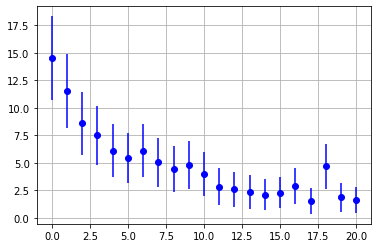

In [70]:
plt.errorbar(x, arr_mse_x.reshape(n,), arr_std_x.reshape(n,), linestyle='None', marker='o', color='b', label='x error')
plt.grid(True)

<ErrorbarContainer object of 3 artists>

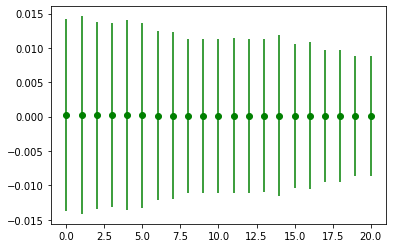

In [71]:
plt.errorbar(x, arr_mse_t.reshape(n,), arr_std_t.reshape(n,), linestyle='None', marker='o', color='g', label='t error')

<ErrorbarContainer object of 3 artists>

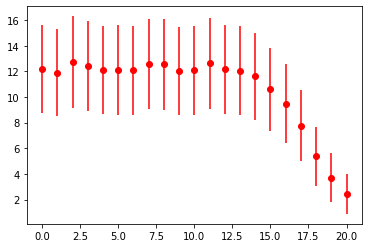

In [72]:
plt.errorbar(x, arr_mse_z.reshape(n,), arr_std_z.reshape(n,), linestyle='None', marker='o', color='r', label='z error')

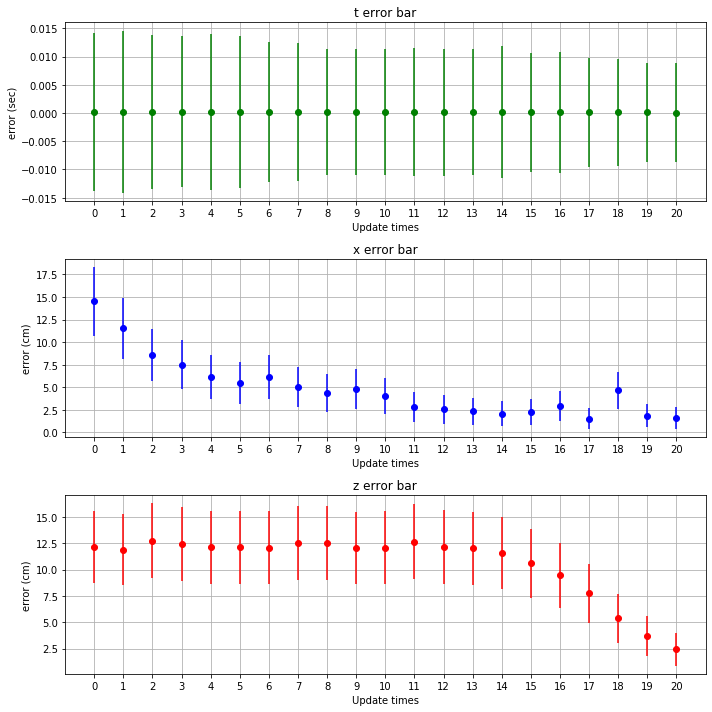

In [73]:
plt.figure(figsize=(10,10))

plt.subplot(3,1,1)
plt.errorbar(x, arr_mse_t.reshape(n,), arr_std_t.reshape(n,), linestyle='None', marker='o', color='g', label='t error')
plt.title('t error bar')
plt.xlabel('Update times')
plt.ylabel('error (sec)')
#plt.xlim(0.5,20)
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.subplot(3,1,2)
plt.errorbar(x, arr_mse_x.reshape(n,), arr_std_x.reshape(n,), linestyle='None', marker='o', color='b', label='x error')
plt.title('x error bar')
plt.xlabel('Update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.subplot(3,1,3)
plt.errorbar(x, arr_mse_z.reshape(n,), arr_std_z.reshape(n,), linestyle='None', marker='o', color='r', label='z error')
plt.title('z error bar')
plt.xlabel('Update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.tight_layout()
plt.savefig('./fig/without2/'+name+'_test_res.png')
plt.savefig('./fig/without2/'+name+'_test_res.svg')

In [74]:
arr_for_err_x

array([[-2.13469645, -1.56293476, -3.33124369, ...,  1.157564  ,
         1.64539478,  1.01130187],
       [ 1.82467227,  1.00516255,  1.12194644, ..., -0.61088625,
        -0.58831278,  0.23346074],
       [-5.36846141, -1.21861101, -0.98426051, ...,  0.14596582,
         0.77948546,  0.68747837],
       ...,
       [ 1.45399928,  2.37297872,  4.61285245, ..., -1.62543469,
        -0.5177477 ,  0.64642203],
       [ 2.41232244,  2.24354435,  2.74202145, ...,  1.32434368,
         1.21153255,  1.30225626],
       [-1.09697611, -0.12737353,  0.60632134, ...,  0.77082647,
         1.17114847, -0.47949653]])

240 249
accuray = 96.3855421686747%


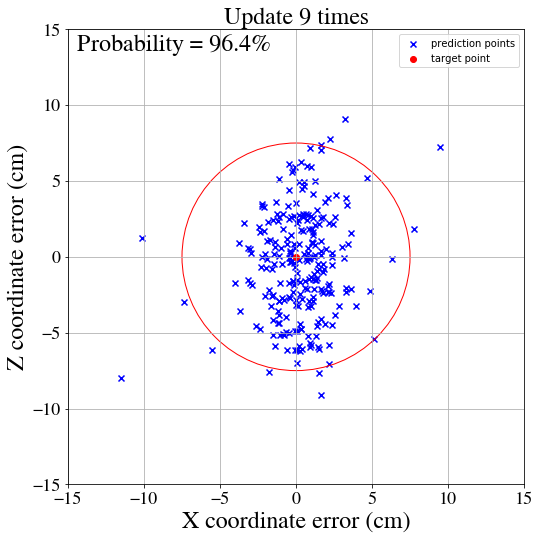

In [75]:
k = 10
up_times = k - 1

correct = 0
for i in range(arr_for_err_x.shape[0]):
    if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
        correct += 1
print(correct, arr_for_err_x.shape[0])
print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
text = str("Probability = {}%".format(aa))

plt.figure(figsize=(8,8))

x = y = np.arange(-7.5, 7.5, 0.005)
x, y = np.meshgrid(x,y)
#plt.contour(x, y, x**2 + y**2, [15*15])
circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')

ax = plt.gca()
ax.add_artist(circle2)
ax.set_xlim((-15, 15))
ax.set_ylim((-15, 15))

plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
plt.scatter(0,0, color='r', marker='o', label='target point')
plt.Circle((0,0), 7.5, color='r', fill=False)

plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.xticks(fontsize=18, fontname='FreeSerif')
plt.yticks(fontsize=18, fontname='FreeSerif')

title_name = 'Update ' + str(up_times) + ' times'
plt.title(title_name, fontsize=24, fontname='FreeSerif')
plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

plt.tight_layout(pad=2.5)
plt.grid(True)
plt.legend(loc='upper right')
#plt.savefig('./fig/update_' + str(up_times) + '_times.png')

227 249
accuray = 91.16465863453816%
235 249
accuray = 94.37751004016064%
234 249
accuray = 93.97590361445783%
240 249
accuray = 96.3855421686747%
242 249
accuray = 97.18875502008032%
240 249
accuray = 96.3855421686747%
239 249
accuray = 95.98393574297188%
239 249
accuray = 95.98393574297188%
241 249
accuray = 96.78714859437751%
240 249
accuray = 96.3855421686747%
245 249
accuray = 98.39357429718876%
245 249
accuray = 98.39357429718876%
244 249
accuray = 97.99196787148594%
243 249
accuray = 97.59036144578313%
246 249
accuray = 98.79518072289156%
244 249
accuray = 97.99196787148594%
243 249
accuray = 97.59036144578313%
247 249
accuray = 99.19678714859438%
244 249
accuray = 97.99196787148594%
248 249
accuray = 99.59839357429718%
246 249
accuray = 98.79518072289156%


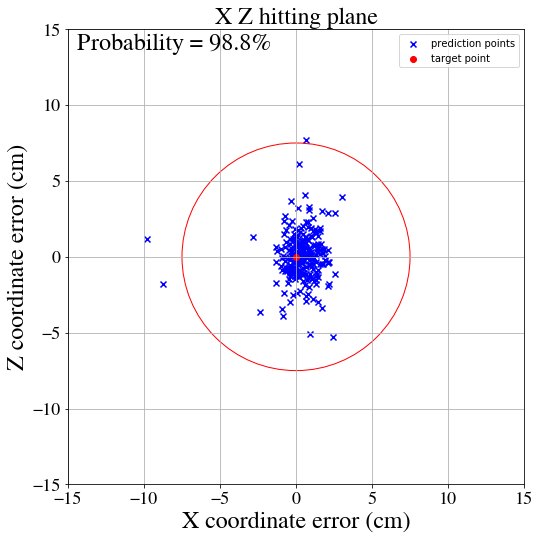

In [76]:
up_times = 0

correct = 0
for i in range(arr_for_err_x.shape[0]):
    if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
        correct += 1
print(correct, arr_for_err_x.shape[0])
print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
text = str("Probability = {}%".format(aa))

plt.figure(figsize=(8,8))

x = y = np.arange(-7.5, 7.5, 0.005)
x, y = np.meshgrid(x,y)
#plt.contour(x, y, x**2 + y**2, [15*15])
circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')

ax = plt.gca()
ax.add_artist(circle2)
ax.set_xlim((-15, 15))
ax.set_ylim((-15, 15))

plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
plt.scatter(0,0, color='r', marker='o', label='target point')
plt.Circle((0,0), 7.5, color='r', fill=False)

plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.xticks(fontsize=18, fontname='FreeSerif')
plt.yticks(fontsize=18, fontname='FreeSerif')
plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

plt.tight_layout(pad=2.5)
plt.grid(True)
plt.legend(loc='upper right')
plt.savefig('./fig/without2/update_' + str(up_times) + '_times_without_classification.png')
plt.savefig('./fig/without2/update_' + str(up_times) + '_times_without_classification.svg')

for up_times in range(1,n,1):
    plt.clf()
    #plt.figure(figsize=(8,8))
    '''
    ax = plt.gca()
    ax.add_artist(circle2)
    ax.set_xlim((-15, 15))
    ax.set_ylim((-15, 15))
    '''
    
    circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')
    ax = plt.gca()
    ax.add_artist(circle2)
    
    correct = 0
    for i in range(arr_for_err_x.shape[0]):
        if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
            correct += 1
    print(correct, arr_for_err_x.shape[0])
    print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
    aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
    text = str("Probability = {}%".format(aa))
    
    plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
    plt.scatter(0,0, color='r', marker='o', label='target point')
    plt.Circle((0,0), 7.5, color='r', fill=False)

    plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.xticks(fontsize=18, fontname='FreeSerif')
    plt.yticks(fontsize=18, fontname='FreeSerif')
    plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
    plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

    plt.xlim(-15,15)
    plt.ylim(-15,15)
    
    plt.tight_layout(pad=2.5)
    plt.grid(True)
    plt.legend(loc='upper right')
    plt.savefig('./fig/without2/update_' + str(up_times) + '_times_without_classification.png')
    plt.savefig('./fig/without2/update_' + str(up_times) + '_times_without_classification.svg')
    